# DEMO - Training and testing HerdNet on nadir aerial images

## Installations

In [ ]:
# Check GPU
!nvidia-smi

Sat May 17 18:37:24 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   30C    P0             49W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [ ]:
# Download and install the code
import sys

!git clone https://github.com/Alexandre-Delplanque/HerdNet
!cd '/content/HerdNet' && python setup.py install

sys.path.append('/content/HerdNet')

fatal: destination path 'HerdNet' already exists and is not an empty directory.
running install
/usr/local/lib/python3.11/dist-packages/setuptools/_distutils/cmd.py:66: SetuptoolsDeprecationWarning: setup.py install is deprecated.
!!

        ********************************************************************************
        Please avoid running ``setup.py`` directly.
        Instead, use pypa/build, pypa/installer or other
        standards-based tools.

        See https://blog.ganssle.io/articles/2021/10/setup-py-deprecated.html for details.
        ********************************************************************************

!!
  self.initialize_options()
/usr/local/lib/python3.11/dist-packages/setuptools/_distutils/cmd.py:66: EasyInstallDeprecationWarning: easy_install command is deprecated.
!!

        ********************************************************************************
        Please avoid running ``setup.py`` and ``easy_install``.
        Instead, use pypa/

## Create datasets

In [ ]:
# prompt: quiero montar el drive en colab

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:

!unzip -oq /content/drive/MyDrive/MAIA/data.zip -d /content/drive/MyDrive/MAIA

In [ ]:
# Set the seed
from animaloc.utils.seed import set_seed

set_seed(9292)

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.7' (you have '2.0.6'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [ ]:
# Create validation patches using the patcher tool (for demo)
from animaloc.utils.useful_funcs import mkdir

mkdir('/content/drive/MyDrive/MAIA/data/val_patches')
!python /content/HerdNet/tools/patcher.py /content/drive/MyDrive/MAIA/data/val 512 512 0 /content/drive/MyDrive/MAIA/data/val_patches -csv /content/drive/MyDrive/MAIA/data/val.csv -min 0.0 -all False

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.7' (you have '2.0.6'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
Creating the buffer: 100% 111/111 [01:01<00:00,  1.82it/s]
Exporting patches: 100% 111/111 [02:52<00:00,  1.55s/it]


In [ ]:
mkdir('/content/drive/MyDrive/MAIA/data/train_fullset_patches')
!python /content/HerdNet/tools/patcher.py /content/drive/MyDrive/MAIA/data/train/ 512 512 160 /content/drive/MyDrive/MAIA/data/train_fullset_patches

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.7' (you have '2.0.6'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
Exporting patches: 100% 928/928 [42:28<00:00,  2.75s/it]


In [ ]:
!zip -r /content/drive/MyDrive/MAIA/data/val_patches /content/drive/MyDrive/MAIA/data/val_patches.zip

	zip warning: name not matched: /content/drive/MyDrive/MAIA/data/val_patches.zip

zip error: Nothing to do! (try: zip -r /content/drive/MyDrive/MAIA/data/val_patches . -i /content/drive/MyDrive/MAIA/data/val_patches.zip)


In [ ]:
# Training, validation and test datasets
import albumentations as A

from animaloc.datasets import CSVDataset,FolderDataset
from animaloc.data.transforms import MultiTransformsWrapper, DownSample, PointsToMask, FIDT

patch_size = 512
num_classes = 7
down_ratio = 2

train_dataset = FolderDataset(
    csv_file = '/content/drive/MyDrive/MAIA/data/train_patches.csv',
    root_dir = '/content/drive/MyDrive/MAIA/data/train_fullset_patches',
    albu_transforms = [
        A.VerticalFlip(p=0.5),
        A.HorizontalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.2),
        A.Blur(blur_limit=15, p=0.2),
        A.Normalize(p=1.0)
        ],
    end_transforms = [MultiTransformsWrapper([
        FIDT(num_classes=num_classes, down_ratio=down_ratio),
        PointsToMask(radius=2, num_classes=num_classes, squeeze=True, down_ratio=int(patch_size//16))
        ])]
    )

val_dataset = CSVDataset(
    csv_file = '/content/drive/MyDrive/MAIA/data/val_patches/gt.csv',
    root_dir = '/content/drive/MyDrive/MAIA/data/val_patches',
    albu_transforms = [A.Normalize(p=1.0)],
    end_transforms = [DownSample(down_ratio=down_ratio, anno_type='point')]
    )

test_dataset = CSVDataset(
    csv_file = '/content/drive/MyDrive/MAIA/data/test.csv',
    root_dir = '/content/drive/MyDrive/MAIA/data/test',
    albu_transforms = [A.Normalize(p=1.0)],
    end_transforms = [DownSample(down_ratio=down_ratio, anno_type='point')]
    )

In [ ]:
# Dataloaders
from torch.utils.data import DataLoader

train_dataloader = DataLoader(dataset = train_dataset, batch_size = 4, shuffle = True)

val_dataloader = DataLoader(dataset = val_dataset, batch_size = 1, shuffle = False)

test_dataloader = DataLoader(dataset = test_dataset, batch_size = 1, shuffle = False)

## Define HerdNet for training

In [ ]:
from animaloc.models import HerdNet
from torch import Tensor
from animaloc.models import LossWrapper
from animaloc.train.losses import FocalLoss
from torch.nn import CrossEntropyLoss

herdnet = HerdNet(num_classes=num_classes, down_ratio=down_ratio).cuda()

weight = Tensor([0.1, 1.0, 2.0, 1.0, 6.0, 12.0, 1.0]).cuda()

losses = [
    {'loss': FocalLoss(reduction='mean'), 'idx': 0, 'idy': 0, 'lambda': 1.0, 'name': 'focal_loss'},
    {'loss': CrossEntropyLoss(reduction='mean', weight=weight), 'idx': 1, 'idy': 1, 'lambda': 1.0, 'name': 'ce_loss'}
    ]

herdnet = LossWrapper(herdnet, losses=losses)

Downloading: "http://dl.yf.io/dla/models/imagenet/dla34-ba72cf86.pth" to /root/.cache/torch/hub/checkpoints/dla34-ba72cf86.pth


## Create the Trainer

In [ ]:
from torch.optim import Adam
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir
import os

# 1) Directorio de salida
work_dir = '/content/drive/MyDrive/MAIA/proyecto_final/output'
os.makedirs(work_dir, exist_ok=True)

# 2) Hiperparámetros
lr = 1e-4
weight_decay = 1e-3
num_epochs = 100

# 3) Optimizer
optimizer = Adam(
    params=herdnet.parameters(),
    lr=lr,
    weight_decay=weight_decay
)

# 4) Métricas y helpers
metrics = PointsMetrics(radius=20, num_classes=num_classes)
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(patch_size, patch_size),
    overlap=160,
    down_ratio=down_ratio,
    reduction='mean'
)
evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=val_dataloader,
    metrics=metrics,
    stitcher=stitcher,
    work_dir=work_dir,
    header='validation'
)

# 5) Instanciación del Trainer
trainer = Trainer(
    model=herdnet,
    train_dataloader=train_dataloader,
    optimizer=optimizer,
    num_epochs=num_epochs,
    auto_lr={           # ReduceLROnPlateau para maximizar F1
        'mode': 'max',
        'factor': 0.5,
        'patience': 5,
        'verbose': True
    },
    val_dataloader=val_dataloader,
    evaluator=evaluator,
    work_dir=work_dir,
    device_name='cuda',
    print_freq=50,
    valid_freq=1,
    csv_logger=True
)




In [ ]:
# 6) Arranque del entrenamiento
trainer.start(
    warmup_iters=100,
    checkpoints='best',
    select='max',
    validate_on='f1_score'
)

## Start training

In [ ]:
trainer.start(warmup_iters=100, checkpoints='best', select='max', validate_on='f1_score')

INFO:20250420_training:[TRAINING] - Epoch: [1] [   1/1942] eta: 0:06:55 lr: 0.000002 loss: 10885.1494 (10885.1494) focal_loss: 10883.1436 (10883.1436) ce_loss: 2.0059 (2.0059) time: 0.2138 data: 0.0933 max mem: 3366


[TRAINING] - Epoch: [1] [   1/1942] eta: 0:06:55 lr: 0.000002 loss: 10885.1494 (10885.1494) focal_loss: 10883.1436 (10883.1436) ce_loss: 2.0059 (2.0059) time: 0.2138 data: 0.0933 max mem: 3366


INFO:20250420_training:[TRAINING] - Epoch: [1] [  51/1942] eta: 0:06:43 lr: 0.000051 loss: 7460.8530 (9138.7543) focal_loss: 7459.3203 (9136.9180) ce_loss: 1.6113 (1.8363) time: 0.2125 data: 0.0921 max mem: 3512


[TRAINING] - Epoch: [1] [  51/1942] eta: 0:06:43 lr: 0.000051 loss: 7460.8530 (9138.7543) focal_loss: 7459.3203 (9136.9180) ce_loss: 1.6113 (1.8363) time: 0.2125 data: 0.0921 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 101/1942] eta: 0:06:33 lr: 0.000100 loss: 1773.4032 (6273.8444) focal_loss: 1771.9658 (6272.2056) ce_loss: 1.2306 (1.6388) time: 0.2148 data: 0.0938 max mem: 3512


[TRAINING] - Epoch: [1] [ 101/1942] eta: 0:06:33 lr: 0.000100 loss: 1773.4032 (6273.8444) focal_loss: 1771.9658 (6272.2056) ce_loss: 1.2306 (1.6388) time: 0.2148 data: 0.0938 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 151/1942] eta: 0:06:23 lr: 0.000100 loss: 294.2347 (4376.8081) focal_loss: 292.7206 (4375.2804) ce_loss: 1.1222 (1.5277) time: 0.2148 data: 0.0941 max mem: 3512


[TRAINING] - Epoch: [1] [ 151/1942] eta: 0:06:23 lr: 0.000100 loss: 294.2347 (4376.8081) focal_loss: 292.7206 (4375.2804) ce_loss: 1.1222 (1.5277) time: 0.2148 data: 0.0941 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 201/1942] eta: 0:06:12 lr: 0.000100 loss: 111.4630 (3325.4563) focal_loss: 109.4931 (3324.0310) ce_loss: 1.0279 (1.4253) time: 0.2160 data: 0.0947 max mem: 3512


[TRAINING] - Epoch: [1] [ 201/1942] eta: 0:06:12 lr: 0.000100 loss: 111.4630 (3325.4563) focal_loss: 109.4931 (3324.0310) ce_loss: 1.0279 (1.4253) time: 0.2160 data: 0.0947 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 251/1942] eta: 0:06:02 lr: 0.000100 loss: 63.9009 (2678.2756) focal_loss: 62.8042 (2676.8957) ce_loss: 1.1514 (1.3799) time: 0.2140 data: 0.0916 max mem: 3512


[TRAINING] - Epoch: [1] [ 251/1942] eta: 0:06:02 lr: 0.000100 loss: 63.9009 (2678.2756) focal_loss: 62.8042 (2676.8957) ce_loss: 1.1514 (1.3799) time: 0.2140 data: 0.0916 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 301/1942] eta: 0:05:51 lr: 0.000100 loss: 43.5527 (2241.4654) focal_loss: 41.8818 (2240.1142) ce_loss: 1.0430 (1.3512) time: 0.2145 data: 0.0929 max mem: 3512


[TRAINING] - Epoch: [1] [ 301/1942] eta: 0:05:51 lr: 0.000100 loss: 43.5527 (2241.4654) focal_loss: 41.8818 (2240.1142) ce_loss: 1.0430 (1.3512) time: 0.2145 data: 0.0929 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 351/1942] eta: 0:05:41 lr: 0.000100 loss: 31.0838 (1926.9634) focal_loss: 29.9596 (1925.6490) ce_loss: 1.1243 (1.3144) time: 0.2150 data: 0.0927 max mem: 3512


[TRAINING] - Epoch: [1] [ 351/1942] eta: 0:05:41 lr: 0.000100 loss: 31.0838 (1926.9634) focal_loss: 29.9596 (1925.6490) ce_loss: 1.1243 (1.3144) time: 0.2150 data: 0.0927 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 22.6043 (1689.8506) focal_loss: 21.5598 (1688.5642) ce_loss: 1.0191 (1.2864) time: 0.2156 data: 0.0933 max mem: 3512


[TRAINING] - Epoch: [1] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 22.6043 (1689.8506) focal_loss: 21.5598 (1688.5642) ce_loss: 1.0191 (1.2864) time: 0.2156 data: 0.0933 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 451/1942] eta: 0:05:20 lr: 0.000100 loss: 18.3173 (1504.7132) focal_loss: 17.2493 (1503.4413) ce_loss: 0.9922 (1.2719) time: 0.2165 data: 0.0938 max mem: 3512


[TRAINING] - Epoch: [1] [ 451/1942] eta: 0:05:20 lr: 0.000100 loss: 18.3173 (1504.7132) focal_loss: 17.2493 (1503.4413) ce_loss: 0.9922 (1.2719) time: 0.2165 data: 0.0938 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 15.3718 (1356.1646) focal_loss: 14.1977 (1354.9143) ce_loss: 0.9651 (1.2503) time: 0.2173 data: 0.0941 max mem: 3512


[TRAINING] - Epoch: [1] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 15.3718 (1356.1646) focal_loss: 14.1977 (1354.9143) ce_loss: 0.9651 (1.2503) time: 0.2173 data: 0.0941 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 12.7403 (1234.3174) focal_loss: 11.6452 (1233.0898) ce_loss: 0.9072 (1.2276) time: 0.2162 data: 0.0932 max mem: 3512


[TRAINING] - Epoch: [1] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 12.7403 (1234.3174) focal_loss: 11.6452 (1233.0898) ce_loss: 0.9072 (1.2276) time: 0.2162 data: 0.0932 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 10.8894 (1132.5850) focal_loss: 9.7304 (1131.3766) ce_loss: 0.9323 (1.2084) time: 0.2157 data: 0.0931 max mem: 3512


[TRAINING] - Epoch: [1] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 10.8894 (1132.5850) focal_loss: 9.7304 (1131.3766) ce_loss: 0.9323 (1.2084) time: 0.2157 data: 0.0931 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 9.2750 (1046.3780) focal_loss: 8.3082 (1045.1864) ce_loss: 0.9040 (1.1916) time: 0.2159 data: 0.0933 max mem: 3512


[TRAINING] - Epoch: [1] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 9.2750 (1046.3780) focal_loss: 8.3082 (1045.1864) ce_loss: 0.9040 (1.1916) time: 0.2159 data: 0.0933 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 8.7137 (972.3806) focal_loss: 7.8919 (971.2024) ce_loss: 0.8921 (1.1782) time: 0.2144 data: 0.0920 max mem: 3512


[TRAINING] - Epoch: [1] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 8.7137 (972.3806) focal_loss: 7.8919 (971.2024) ce_loss: 0.8921 (1.1782) time: 0.2144 data: 0.0920 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 7.2691 (908.1619) focal_loss: 6.5074 (907.0031) ce_loss: 0.7425 (1.1588) time: 0.2161 data: 0.0938 max mem: 3512


[TRAINING] - Epoch: [1] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 7.2691 (908.1619) focal_loss: 6.5074 (907.0031) ce_loss: 0.7425 (1.1588) time: 0.2161 data: 0.0938 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 7.0906 (851.9166) focal_loss: 6.1194 (850.7694) ce_loss: 1.0237 (1.1472) time: 0.2184 data: 0.0957 max mem: 3512


[TRAINING] - Epoch: [1] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 7.0906 (851.9166) focal_loss: 6.1194 (850.7694) ce_loss: 1.0237 (1.1472) time: 0.2184 data: 0.0957 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 6.1940 (802.2430) focal_loss: 5.3151 (801.1132) ce_loss: 0.6869 (1.1298) time: 0.2163 data: 0.0938 max mem: 3512


[TRAINING] - Epoch: [1] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 6.1940 (802.2430) focal_loss: 5.3151 (801.1132) ce_loss: 0.6869 (1.1298) time: 0.2163 data: 0.0938 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 5.6069 (758.0547) focal_loss: 4.7739 (756.9353) ce_loss: 0.8209 (1.1195) time: 0.2154 data: 0.0928 max mem: 3512


[TRAINING] - Epoch: [1] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 5.6069 (758.0547) focal_loss: 4.7739 (756.9353) ce_loss: 0.8209 (1.1195) time: 0.2154 data: 0.0928 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 5.5242 (718.4980) focal_loss: 4.5843 (717.3854) ce_loss: 0.9064 (1.1126) time: 0.2163 data: 0.0937 max mem: 3512


[TRAINING] - Epoch: [1] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 5.5242 (718.4980) focal_loss: 4.5843 (717.3854) ce_loss: 0.9064 (1.1126) time: 0.2163 data: 0.0937 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 4.9487 (682.8682) focal_loss: 4.2034 (681.7646) ce_loss: 0.8169 (1.1036) time: 0.2194 data: 0.0969 max mem: 3512


[TRAINING] - Epoch: [1] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 4.9487 (682.8682) focal_loss: 4.2034 (681.7646) ce_loss: 0.8169 (1.1036) time: 0.2194 data: 0.0969 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 5.0806 (650.6182) focal_loss: 3.8676 (649.5203) ce_loss: 1.0100 (1.0979) time: 0.2180 data: 0.0953 max mem: 3512


[TRAINING] - Epoch: [1] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 5.0806 (650.6182) focal_loss: 3.8676 (649.5203) ce_loss: 1.0100 (1.0979) time: 0.2180 data: 0.0953 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 4.5382 (621.2822) focal_loss: 3.6539 (620.1940) ce_loss: 0.8198 (1.0882) time: 0.2148 data: 0.0921 max mem: 3512


[TRAINING] - Epoch: [1] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 4.5382 (621.2822) focal_loss: 3.6539 (620.1940) ce_loss: 0.8198 (1.0882) time: 0.2148 data: 0.0921 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 3.9365 (594.4844) focal_loss: 3.2770 (593.4050) ce_loss: 0.6456 (1.0794) time: 0.2160 data: 0.0934 max mem: 3512


[TRAINING] - Epoch: [1] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 3.9365 (594.4844) focal_loss: 3.2770 (593.4050) ce_loss: 0.6456 (1.0794) time: 0.2160 data: 0.0934 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 3.8267 (569.9007) focal_loss: 3.0471 (568.8326) ce_loss: 0.6407 (1.0681) time: 0.2149 data: 0.0926 max mem: 3512


[TRAINING] - Epoch: [1] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 3.8267 (569.9007) focal_loss: 3.0471 (568.8326) ce_loss: 0.6407 (1.0681) time: 0.2149 data: 0.0926 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 3.4686 (547.2755) focal_loss: 2.8707 (546.2191) ce_loss: 0.6412 (1.0564) time: 0.2169 data: 0.0943 max mem: 3512


[TRAINING] - Epoch: [1] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 3.4686 (547.2755) focal_loss: 2.8707 (546.2191) ce_loss: 0.6412 (1.0564) time: 0.2169 data: 0.0943 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 3.6802 (526.3896) focal_loss: 2.7603 (525.3414) ce_loss: 0.7427 (1.0482) time: 0.2156 data: 0.0931 max mem: 3512


[TRAINING] - Epoch: [1] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 3.6802 (526.3896) focal_loss: 2.7603 (525.3414) ce_loss: 0.7427 (1.0482) time: 0.2156 data: 0.0931 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 3.2927 (507.0375) focal_loss: 2.6059 (505.9986) ce_loss: 0.6691 (1.0389) time: 0.2172 data: 0.0944 max mem: 3512


[TRAINING] - Epoch: [1] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 3.2927 (507.0375) focal_loss: 2.6059 (505.9986) ce_loss: 0.6691 (1.0389) time: 0.2172 data: 0.0944 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 3.4281 (489.0683) focal_loss: 2.5749 (488.0346) ce_loss: 0.9262 (1.0338) time: 0.2156 data: 0.0931 max mem: 3512


[TRAINING] - Epoch: [1] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 3.4281 (489.0683) focal_loss: 2.5749 (488.0346) ce_loss: 0.9262 (1.0338) time: 0.2156 data: 0.0931 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 3.3296 (472.3349) focal_loss: 2.5535 (471.3079) ce_loss: 0.7312 (1.0270) time: 0.2168 data: 0.0942 max mem: 3512


[TRAINING] - Epoch: [1] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 3.3296 (472.3349) focal_loss: 2.5535 (471.3079) ce_loss: 0.7312 (1.0270) time: 0.2168 data: 0.0942 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 2.9268 (456.7078) focal_loss: 2.1609 (455.6876) ce_loss: 0.7016 (1.0202) time: 0.2174 data: 0.0950 max mem: 3512


[TRAINING] - Epoch: [1] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 2.9268 (456.7078) focal_loss: 2.1609 (455.6876) ce_loss: 0.7016 (1.0202) time: 0.2174 data: 0.0950 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 2.7543 (442.0835) focal_loss: 2.0424 (441.0712) ce_loss: 0.6932 (1.0123) time: 0.2165 data: 0.0939 max mem: 3512


[TRAINING] - Epoch: [1] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 2.7543 (442.0835) focal_loss: 2.0424 (441.0712) ce_loss: 0.6932 (1.0123) time: 0.2165 data: 0.0939 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 2.7578 (428.3669) focal_loss: 1.9759 (427.3626) ce_loss: 0.6539 (1.0042) time: 0.2149 data: 0.0923 max mem: 3512


[TRAINING] - Epoch: [1] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 2.7578 (428.3669) focal_loss: 1.9759 (427.3626) ce_loss: 0.6539 (1.0042) time: 0.2149 data: 0.0923 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 2.4272 (415.4807) focal_loss: 1.9016 (414.4839) ce_loss: 0.5337 (0.9968) time: 0.2158 data: 0.0933 max mem: 3512


[TRAINING] - Epoch: [1] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 2.4272 (415.4807) focal_loss: 1.9016 (414.4839) ce_loss: 0.5337 (0.9968) time: 0.2158 data: 0.0933 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 2.5765 (403.3553) focal_loss: 1.8615 (402.3654) ce_loss: 0.5298 (0.9899) time: 0.2157 data: 0.0929 max mem: 3512


[TRAINING] - Epoch: [1] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 2.5765 (403.3553) focal_loss: 1.8615 (402.3654) ce_loss: 0.5298 (0.9899) time: 0.2157 data: 0.0929 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 2.6214 (391.9148) focal_loss: 1.8586 (390.9326) ce_loss: 0.5897 (0.9822) time: 0.2157 data: 0.0930 max mem: 3512


[TRAINING] - Epoch: [1] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 2.6214 (391.9148) focal_loss: 1.8586 (390.9326) ce_loss: 0.5897 (0.9822) time: 0.2157 data: 0.0930 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 2.4863 (381.1076) focal_loss: 1.7613 (380.1325) ce_loss: 0.5516 (0.9751) time: 0.2186 data: 0.0957 max mem: 3512


[TRAINING] - Epoch: [1] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 2.4863 (381.1076) focal_loss: 1.7613 (380.1325) ce_loss: 0.5516 (0.9751) time: 0.2186 data: 0.0957 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 2.5556 (370.8853) focal_loss: 1.7746 (369.9168) ce_loss: 0.6661 (0.9685) time: 0.2170 data: 0.0935 max mem: 3512


[TRAINING] - Epoch: [1] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 2.5556 (370.8853) focal_loss: 1.7746 (369.9168) ce_loss: 0.6661 (0.9685) time: 0.2170 data: 0.0935 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 2.4822 (361.1962) focal_loss: 1.8185 (360.2350) ce_loss: 0.6082 (0.9612) time: 0.2197 data: 0.0970 max mem: 3512


[TRAINING] - Epoch: [1] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 2.4822 (361.1962) focal_loss: 1.8185 (360.2350) ce_loss: 0.6082 (0.9612) time: 0.2197 data: 0.0970 max mem: 3512


INFO:20250420_training:[TRAINING] - Epoch: [1] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 2.3320 (353.6246) focal_loss: 1.7932 (352.6694) ce_loss: 0.5385 (0.9552) time: 0.2160 data: 0.0890 max mem: 3512
INFO:20250420_training:[TRAINING] - Epoch: [1] Total time: 0:06:59 (0.2161 s / it)


[TRAINING] - Epoch: [1] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 2.3320 (353.6246) focal_loss: 1.7932 (352.6694) ce_loss: 0.5385 (0.9552) time: 0.2160 data: 0.0890 max mem: 3512
[TRAINING] - Epoch: [1] Total time: 0:06:59 (0.2161 s / it)
[TRAINING] - Epoch: [1] mean loss: 353.6246


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [1] [  1/532] eta: 0:01:43 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1944 data: 0.0077 max mem: 3512
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()


[VALIDATION] - Epoch: [1] [  1/532] eta: 0:01:43 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1944 data: 0.0077 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 11/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.01 MAE: 196.0 MSE: 38416.0 RMSE: 196.0 time: 0.0888 data: 0.0081 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 21/532] eta: 0:00:41 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0764 data: 0.0078 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 31/532] eta: 0:00:39 n: 6 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0722 data: 0.0076 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 41/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 297.0 MSE: 88209.0 RMSE: 297.0 time: 0.0695 data: 0.0075 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 320.0 MSE: 102400.0 RMSE: 320.0 time: 0.0688 data: 0.0071 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.02 f1-score: 0.04 MAE: 209.0 MSE: 43681.0 RMSE: 209.0 time: 0.0695 data: 0.0072 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0678 data: 0.0071 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 81/532] eta: 0:00:32 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0665 data: 0.0071 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 91/532] eta: 0:00:31 n: 3 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0683 data: 0.0071 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [101/532] eta: 0:00:30 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 219.0 MSE: 47961.0 RMSE: 219.0 time: 0.0681 data: 0.0070 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [111/532] eta: 0:00:29 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0675 data: 0.0070 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [121/532] eta: 0:00:29 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0688 data: 0.0070 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [131/532] eta: 0:00:28 n: 3 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0682 data: 0.0070 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [141/532] eta: 0:00:27 n: 3 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 239.0 MSE: 57121.0 RMSE: 239.0 time: 0.0680 data: 0.0070 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [151/532] eta: 0:00:26 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0684 data: 0.0070 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [161/532] eta: 0:00:26 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0684 data: 0.0071 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [171/532] eta: 0:00:25 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0073 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [181/532] eta: 0:00:24 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0076 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [191/532] eta: 0:00:24 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0075 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 320.0 MSE: 102400.0 RMSE: 320.0 time: 0.0691 data: 0.0069 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [211/532] eta: 0:00:22 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0686 data: 0.0070 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [221/532] eta: 0:00:21 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0679 data: 0.0070 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [231/532] eta: 0:00:21 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0663 data: 0.0067 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [241/532] eta: 0:00:20 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0682 data: 0.0069 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [251/532] eta: 0:00:19 n: 5 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0684 data: 0.0070 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [261/532] eta: 0:00:19 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0676 data: 0.0068 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [271/532] eta: 0:00:18 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0668 data: 0.0066 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [281/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0679 data: 0.0068 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [291/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 126.0 MSE: 15876.0 RMSE: 126.0 time: 0.0701 data: 0.0069 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 86.0 MSE: 7396.0 RMSE: 86.0 time: 0.0689 data: 0.0068 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [311/532] eta: 0:00:15 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0681 data: 0.0068 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [321/532] eta: 0:00:14 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0682 data: 0.0069 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [331/532] eta: 0:00:14 n: 6 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0683 data: 0.0070 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [341/532] eta: 0:00:13 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0683 data: 0.0071 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [351/532] eta: 0:00:12 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0711 data: 0.0071 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [361/532] eta: 0:00:11 n: 3 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0725 data: 0.0071 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [371/532] eta: 0:00:11 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0703 data: 0.0071 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 0.02 f1-score: 0.03 MAE: 114.0 MSE: 12996.0 RMSE: 114.0 time: 0.0706 data: 0.0074 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [391/532] eta: 0:00:09 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0072 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [401/532] eta: 0:00:09 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0706 data: 0.0071 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [411/532] eta: 0:00:08 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0072 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [421/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.0 f1-score: 0.01 MAE: 348.0 MSE: 121104.0 RMSE: 348.0 time: 0.0727 data: 0.0073 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 216.0 MSE: 46656.0 RMSE: 216.0 time: 0.0704 data: 0.0072 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.0 f1-score: 0.01 MAE: 208.0 MSE: 43264.0 RMSE: 208.0 time: 0.0707 data: 0.0072 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [451/532] eta: 0:00:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0071 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 0.02 f1-score: 0.04 MAE: 105.0 MSE: 11025.0 RMSE: 105.0 time: 0.0723 data: 0.0070 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [471/532] eta: 0:00:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0838 data: 0.0070 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0806 data: 0.0069 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [491/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 79.0 MSE: 6241.0 RMSE: 79.0 time: 0.0684 data: 0.0073 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [501/532] eta: 0:00:02 n: 3 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0720 data: 0.0078 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [511/532] eta: 0:00:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0076 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [521/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0073 max mem: 3512


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.0 f1-score: 0.01 MAE: 265.0 MSE: 70225.0 RMSE: 265.0 time: 0.0693 data: 0.0073 max mem: 3512
[VALIDATION] - Epoch: [1] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.01 f1-score: 0.01 MAE: 304.0 MSE: 92416.0 RMSE: 304.0 time: 0.0699 data: 0.0073 max mem: 3512
[VALIDATION] - Epoch: [1] Total time: 0:00:37 (0.0707 s / it)
[VALIDATION] - Epoch: [1] f1_score: 0.0157
Best model saved - Epoch 1 - Validation value: 0.015749


INFO:20250420_training:[TRAINING] - Epoch: [2] [   1/1942] eta: 0:06:57 lr: 0.000100 loss: 2.3320 (353.4441) focal_loss: 1.7932 (352.4890) ce_loss: 0.5385 (0.9551) time: 0.2148 data: 0.0938 max mem: 3513


[TRAINING] - Epoch: [2] [   1/1942] eta: 0:06:57 lr: 0.000100 loss: 2.3320 (353.4441) focal_loss: 1.7932 (352.4890) ce_loss: 0.5385 (0.9551) time: 0.2148 data: 0.0938 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [  51/1942] eta: 0:06:49 lr: 0.000100 loss: 2.2177 (344.6391) focal_loss: 1.6323 (343.6897) ce_loss: 0.6246 (0.9494) time: 0.2175 data: 0.0953 max mem: 3513


[TRAINING] - Epoch: [2] [  51/1942] eta: 0:06:49 lr: 0.000100 loss: 2.2177 (344.6391) focal_loss: 1.6323 (343.6897) ce_loss: 0.6246 (0.9494) time: 0.2175 data: 0.0953 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 2.5705 (336.2651) focal_loss: 1.7985 (335.3213) ce_loss: 0.6748 (0.9438) time: 0.2184 data: 0.0959 max mem: 3513


[TRAINING] - Epoch: [2] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 2.5705 (336.2651) focal_loss: 1.7985 (335.3213) ce_loss: 0.6748 (0.9438) time: 0.2184 data: 0.0959 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 2.1584 (328.2859) focal_loss: 1.5680 (327.3492) ce_loss: 0.5456 (0.9367) time: 0.2157 data: 0.0935 max mem: 3513


[TRAINING] - Epoch: [2] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 2.1584 (328.2859) focal_loss: 1.5680 (327.3492) ce_loss: 0.5456 (0.9367) time: 0.2157 data: 0.0935 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 1.8777 (320.6743) focal_loss: 1.4172 (319.7469) ce_loss: 0.4217 (0.9274) time: 0.2154 data: 0.0927 max mem: 3513


[TRAINING] - Epoch: [2] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 1.8777 (320.6743) focal_loss: 1.4172 (319.7469) ce_loss: 0.4217 (0.9274) time: 0.2154 data: 0.0927 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 2.0231 (313.4130) focal_loss: 1.3476 (312.4916) ce_loss: 0.6641 (0.9214) time: 0.2173 data: 0.0946 max mem: 3513


[TRAINING] - Epoch: [2] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 2.0231 (313.4130) focal_loss: 1.3476 (312.4916) ce_loss: 0.6641 (0.9214) time: 0.2173 data: 0.0946 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 2.2193 (306.4739) focal_loss: 1.4194 (305.5581) ce_loss: 0.5121 (0.9157) time: 0.2178 data: 0.0953 max mem: 3513


[TRAINING] - Epoch: [2] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 2.2193 (306.4739) focal_loss: 1.4194 (305.5581) ce_loss: 0.5121 (0.9157) time: 0.2178 data: 0.0953 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 2.0446 (299.8385) focal_loss: 1.2561 (298.9276) ce_loss: 0.6578 (0.9108) time: 0.2155 data: 0.0929 max mem: 3513


[TRAINING] - Epoch: [2] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 2.0446 (299.8385) focal_loss: 1.2561 (298.9276) ce_loss: 0.6578 (0.9108) time: 0.2155 data: 0.0929 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 2.1780 (293.4877) focal_loss: 1.3065 (292.5811) ce_loss: 0.6739 (0.9065) time: 0.2157 data: 0.0935 max mem: 3513


[TRAINING] - Epoch: [2] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 2.1780 (293.4877) focal_loss: 1.3065 (292.5811) ce_loss: 0.6739 (0.9065) time: 0.2157 data: 0.0935 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 1.6466 (287.4002) focal_loss: 1.3164 (286.4998) ce_loss: 0.4160 (0.9004) time: 0.2164 data: 0.0940 max mem: 3513


[TRAINING] - Epoch: [2] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 1.6466 (287.4002) focal_loss: 1.3164 (286.4998) ce_loss: 0.4160 (0.9004) time: 0.2164 data: 0.0940 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 1.8773 (281.5577) focal_loss: 1.2698 (280.6643) ce_loss: 0.5062 (0.8934) time: 0.2161 data: 0.0937 max mem: 3513


[TRAINING] - Epoch: [2] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 1.8773 (281.5577) focal_loss: 1.2698 (280.6643) ce_loss: 0.5062 (0.8934) time: 0.2161 data: 0.0937 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 1.9762 (275.9492) focal_loss: 1.1944 (275.0615) ce_loss: 0.7785 (0.8877) time: 0.2147 data: 0.0926 max mem: 3513


[TRAINING] - Epoch: [2] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 1.9762 (275.9492) focal_loss: 1.1944 (275.0615) ce_loss: 0.7785 (0.8877) time: 0.2147 data: 0.0926 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 1.6929 (270.5616) focal_loss: 1.1753 (269.6803) ce_loss: 0.4823 (0.8814) time: 0.2155 data: 0.0933 max mem: 3513


[TRAINING] - Epoch: [2] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 1.6929 (270.5616) focal_loss: 1.1753 (269.6803) ce_loss: 0.4823 (0.8814) time: 0.2155 data: 0.0933 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 2.1257 (265.3842) focal_loss: 1.1446 (264.5076) ce_loss: 0.5882 (0.8766) time: 0.2158 data: 0.0934 max mem: 3513


[TRAINING] - Epoch: [2] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 2.1257 (265.3842) focal_loss: 1.1446 (264.5076) ce_loss: 0.5882 (0.8766) time: 0.2158 data: 0.0934 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 1.7304 (260.4012) focal_loss: 1.1313 (259.5287) ce_loss: 0.5409 (0.8725) time: 0.2147 data: 0.0925 max mem: 3513


[TRAINING] - Epoch: [2] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 1.7304 (260.4012) focal_loss: 1.1313 (259.5287) ce_loss: 0.5409 (0.8725) time: 0.2147 data: 0.0925 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 1.6121 (255.6008) focal_loss: 1.1733 (254.7343) ce_loss: 0.4053 (0.8666) time: 0.2143 data: 0.0920 max mem: 3513


[TRAINING] - Epoch: [2] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 1.6121 (255.6008) focal_loss: 1.1733 (254.7343) ce_loss: 0.4053 (0.8666) time: 0.2143 data: 0.0920 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 1.7652 (250.9774) focal_loss: 1.1595 (250.1152) ce_loss: 0.5659 (0.8622) time: 0.2156 data: 0.0933 max mem: 3513


[TRAINING] - Epoch: [2] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 1.7652 (250.9774) focal_loss: 1.1595 (250.1152) ce_loss: 0.5659 (0.8622) time: 0.2156 data: 0.0933 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 1.5551 (246.5174) focal_loss: 1.0728 (245.6593) ce_loss: 0.4155 (0.8581) time: 0.2176 data: 0.0951 max mem: 3513


[TRAINING] - Epoch: [2] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 1.5551 (246.5174) focal_loss: 1.0728 (245.6593) ce_loss: 0.4155 (0.8581) time: 0.2176 data: 0.0951 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 1.8909 (242.2153) focal_loss: 1.2644 (241.3611) ce_loss: 0.5424 (0.8542) time: 0.2194 data: 0.0961 max mem: 3513


[TRAINING] - Epoch: [2] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 1.8909 (242.2153) focal_loss: 1.2644 (241.3611) ce_loss: 0.5424 (0.8542) time: 0.2194 data: 0.0961 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 1.5973 (238.0625) focal_loss: 1.0662 (237.2128) ce_loss: 0.4201 (0.8497) time: 0.2179 data: 0.0955 max mem: 3513


[TRAINING] - Epoch: [2] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 1.5973 (238.0625) focal_loss: 1.0662 (237.2128) ce_loss: 0.4201 (0.8497) time: 0.2179 data: 0.0955 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 1.8122 (234.0519) focal_loss: 1.3163 (233.2057) ce_loss: 0.4717 (0.8461) time: 0.2169 data: 0.0945 max mem: 3513


[TRAINING] - Epoch: [2] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 1.8122 (234.0519) focal_loss: 1.3163 (233.2057) ce_loss: 0.4717 (0.8461) time: 0.2169 data: 0.0945 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 1.7697 (230.1724) focal_loss: 1.1206 (229.3298) ce_loss: 0.5115 (0.8426) time: 0.2198 data: 0.0961 max mem: 3513


[TRAINING] - Epoch: [2] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 1.7697 (230.1724) focal_loss: 1.1206 (229.3298) ce_loss: 0.5115 (0.8426) time: 0.2198 data: 0.0961 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 1.6726 (226.4195) focal_loss: 1.1956 (225.5827) ce_loss: 0.3617 (0.8368) time: 0.2198 data: 0.0953 max mem: 3513


[TRAINING] - Epoch: [2] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 1.6726 (226.4195) focal_loss: 1.1956 (225.5827) ce_loss: 0.3617 (0.8368) time: 0.2198 data: 0.0953 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 1.8665 (222.7884) focal_loss: 1.2012 (221.9562) ce_loss: 0.5849 (0.8322) time: 0.2216 data: 0.0970 max mem: 3513


[TRAINING] - Epoch: [2] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 1.8665 (222.7884) focal_loss: 1.2012 (221.9562) ce_loss: 0.5849 (0.8322) time: 0.2216 data: 0.0970 max mem: 3513


INFO:20250420_training:[TRAINING] - Epoch: [2] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 1.6596 (219.2742) focal_loss: 1.0287 (218.4455) ce_loss: 0.5135 (0.8286) time: 0.2160 data: 0.0935 max mem: 3538


[TRAINING] - Epoch: [2] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 1.6596 (219.2742) focal_loss: 1.0287 (218.4455) ce_loss: 0.5135 (0.8286) time: 0.2160 data: 0.0935 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [2] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 1.6933 (215.8713) focal_loss: 1.1369 (215.0446) ce_loss: 0.5564 (0.8268) time: 0.2181 data: 0.0954 max mem: 3538


[TRAINING] - Epoch: [2] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 1.6933 (215.8713) focal_loss: 1.1369 (215.0446) ce_loss: 0.5564 (0.8268) time: 0.2181 data: 0.0954 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [2] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 1.5088 (212.5696) focal_loss: 1.0825 (211.7468) ce_loss: 0.4470 (0.8227) time: 0.2164 data: 0.0933 max mem: 3538


[TRAINING] - Epoch: [2] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 1.5088 (212.5696) focal_loss: 1.0825 (211.7468) ce_loss: 0.4470 (0.8227) time: 0.2164 data: 0.0933 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [2] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 1.3562 (209.3663) focal_loss: 0.8758 (208.5479) ce_loss: 0.3942 (0.8184) time: 0.2170 data: 0.0942 max mem: 3538


[TRAINING] - Epoch: [2] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 1.3562 (209.3663) focal_loss: 0.8758 (208.5479) ce_loss: 0.3942 (0.8184) time: 0.2170 data: 0.0942 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [2] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 1.6724 (206.2606) focal_loss: 1.0591 (205.4451) ce_loss: 0.6062 (0.8155) time: 0.2168 data: 0.0939 max mem: 3538


[TRAINING] - Epoch: [2] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 1.6724 (206.2606) focal_loss: 1.0591 (205.4451) ce_loss: 0.6062 (0.8155) time: 0.2168 data: 0.0939 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [2] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 1.5856 (203.2466) focal_loss: 1.0853 (202.4348) ce_loss: 0.5226 (0.8118) time: 0.2161 data: 0.0934 max mem: 3538


[TRAINING] - Epoch: [2] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 1.5856 (203.2466) focal_loss: 1.0853 (202.4348) ce_loss: 0.5226 (0.8118) time: 0.2161 data: 0.0934 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [2] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 1.4487 (200.3187) focal_loss: 1.0232 (199.5108) ce_loss: 0.4084 (0.8079) time: 0.2154 data: 0.0931 max mem: 3538


[TRAINING] - Epoch: [2] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 1.4487 (200.3187) focal_loss: 1.0232 (199.5108) ce_loss: 0.4084 (0.8079) time: 0.2154 data: 0.0931 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [2] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 1.7006 (197.4765) focal_loss: 1.1432 (196.6718) ce_loss: 0.5590 (0.8047) time: 0.2161 data: 0.0934 max mem: 3538


[TRAINING] - Epoch: [2] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 1.7006 (197.4765) focal_loss: 1.1432 (196.6718) ce_loss: 0.5590 (0.8047) time: 0.2161 data: 0.0934 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [2] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 1.4474 (194.7127) focal_loss: 0.9088 (193.9115) ce_loss: 0.4798 (0.8012) time: 0.2142 data: 0.0919 max mem: 3538


[TRAINING] - Epoch: [2] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 1.4474 (194.7127) focal_loss: 0.9088 (193.9115) ce_loss: 0.4798 (0.8012) time: 0.2142 data: 0.0919 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [2] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 1.3760 (192.0261) focal_loss: 0.9691 (191.2282) ce_loss: 0.3955 (0.7978) time: 0.2161 data: 0.0935 max mem: 3538


[TRAINING] - Epoch: [2] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 1.3760 (192.0261) focal_loss: 0.9691 (191.2282) ce_loss: 0.3955 (0.7978) time: 0.2161 data: 0.0935 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [2] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 1.3199 (189.4124) focal_loss: 0.8929 (188.6186) ce_loss: 0.4025 (0.7938) time: 0.2151 data: 0.0925 max mem: 3538


[TRAINING] - Epoch: [2] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 1.3199 (189.4124) focal_loss: 0.8929 (188.6186) ce_loss: 0.4025 (0.7938) time: 0.2151 data: 0.0925 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [2] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 1.2540 (186.8697) focal_loss: 0.8182 (186.0800) ce_loss: 0.3939 (0.7898) time: 0.2146 data: 0.0924 max mem: 3538


[TRAINING] - Epoch: [2] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 1.2540 (186.8697) focal_loss: 0.8182 (186.0800) ce_loss: 0.3939 (0.7898) time: 0.2146 data: 0.0924 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [2] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 1.6495 (184.3951) focal_loss: 0.8960 (183.6090) ce_loss: 0.3804 (0.7862) time: 0.2162 data: 0.0937 max mem: 3538


[TRAINING] - Epoch: [2] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 1.6495 (184.3951) focal_loss: 0.8960 (183.6090) ce_loss: 0.3804 (0.7862) time: 0.2162 data: 0.0937 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [2] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 1.4432 (181.9847) focal_loss: 0.8760 (181.2016) ce_loss: 0.5170 (0.7830) time: 0.2162 data: 0.0940 max mem: 3538


[TRAINING] - Epoch: [2] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 1.4432 (181.9847) focal_loss: 0.8760 (181.2016) ce_loss: 0.5170 (0.7830) time: 0.2162 data: 0.0940 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [2] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 1.2721 (179.6362) focal_loss: 0.9539 (178.8568) ce_loss: 0.3997 (0.7794) time: 0.2179 data: 0.0951 max mem: 3538


[TRAINING] - Epoch: [2] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 1.2721 (179.6362) focal_loss: 0.9539 (178.8568) ce_loss: 0.3997 (0.7794) time: 0.2179 data: 0.0951 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [2] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 1.4089 (177.7581) focal_loss: 0.8949 (176.9805) ce_loss: 0.4498 (0.7776) time: 0.2095 data: 0.0907 max mem: 3538
INFO:20250420_training:[TRAINING] - Epoch: [2] Total time: 0:07:00 (0.2166 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [2] [  1/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0079 max mem: 3538


[TRAINING] - Epoch: [2] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 1.4089 (177.7581) focal_loss: 0.8949 (176.9805) ce_loss: 0.4498 (0.7776) time: 0.2095 data: 0.0907 max mem: 3538
[TRAINING] - Epoch: [2] Total time: 0:07:00 (0.2166 s / it)
[TRAINING] - Epoch: [2] mean loss: 1.8916
[VALIDATION] - Epoch: [2] [  1/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0079 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 11/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0698 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 21/532] eta: 0:00:35 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0698 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 31/532] eta: 0:00:35 n: 6 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0705 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 41/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0698 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 51/532] eta: 0:00:33 n: 4 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0695 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 61/532] eta: 0:00:33 n: 4 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0706 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 71/532] eta: 0:00:32 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 81/532] eta: 0:00:31 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0699 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.07 f1-score: 0.12 MAE: 43.0 MSE: 1849.0 RMSE: 43.0 time: 0.0717 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [101/532] eta: 0:00:30 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [111/532] eta: 0:00:29 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0706 data: 0.0074 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.03 f1-score: 0.05 MAE: 39.0 MSE: 1521.0 RMSE: 39.0 time: 0.0710 data: 0.0075 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.0709 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [141/532] eta: 0:00:27 n: 3 recall: 1.0 precision: 0.14 f1-score: 0.24 MAE: 19.0 MSE: 361.0 RMSE: 19.0 time: 0.0738 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [151/532] eta: 0:00:27 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0758 data: 0.0074 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.14 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.0740 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [171/532] eta: 0:00:25 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [181/532] eta: 0:00:25 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.04 f1-score: 0.08 MAE: 24.0 MSE: 576.0 RMSE: 24.0 time: 0.0715 data: 0.0069 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0728 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [211/532] eta: 0:00:22 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0719 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [221/532] eta: 0:00:22 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0707 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.0720 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [241/532] eta: 0:00:20 n: 2 recall: 0.5 precision: 0.12 f1-score: 0.2 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0727 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 0.31 f1-score: 0.48 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0736 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.03 f1-score: 0.05 MAE: 36.0 MSE: 1296.0 RMSE: 36.0 time: 0.0750 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.12 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.0749 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0741 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.0744 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0756 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [311/532] eta: 0:00:16 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0747 data: 0.0074 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.1 f1-score: 0.17 MAE: 19.0 MSE: 361.0 RMSE: 19.0 time: 0.0758 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.09 f1-score: 0.16 MAE: 64.0 MSE: 4096.0 RMSE: 64.0 time: 0.0763 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [341/532] eta: 0:00:13 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.04 f1-score: 0.07 MAE: 25.0 MSE: 625.0 RMSE: 25.0 time: 0.0720 data: 0.0069 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [361/532] eta: 0:00:12 n: 3 recall: 0.67 precision: 0.07 f1-score: 0.13 MAE: 24.0 MSE: 576.0 RMSE: 24.0 time: 0.0728 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [371/532] eta: 0:00:11 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0710 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0710 data: 0.0068 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0068 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.1 f1-score: 0.17 MAE: 19.0 MSE: 361.0 RMSE: 19.0 time: 0.0721 data: 0.0068 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [411/532] eta: 0:00:08 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0068 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.12 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.0709 data: 0.0069 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 0.18 f1-score: 0.31 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0728 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0728 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 0.04 f1-score: 0.08 MAE: 22.0 MSE: 484.0 RMSE: 22.0 time: 0.0750 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0782 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [471/532] eta: 0:00:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0758 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0725 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [501/532] eta: 0:00:02 n: 3 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0730 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [511/532] eta: 0:00:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [521/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0691 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0686 data: 0.0073 max mem: 3538
[VALIDATION] - Epoch: [2] [532/532] eta: 0:00:00 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0688 data: 0.0073 max mem: 3538
[VALIDATION] - Epoch: [2] Total time: 0:00:38 (0.0725 s / it)
[VALIDATION] - Epoch: [2] f1_score: 0.1826
Best model saved - Epoch 2 - Validation value: 0.182626


INFO:20250420_training:[TRAINING] - Epoch: [3] [   1/1942] eta: 0:07:03 lr: 0.000100 loss: 1.3820 (177.7126) focal_loss: 0.8949 (176.9351) ce_loss: 0.4498 (0.7775) time: 0.2178 data: 0.0966 max mem: 3538


[TRAINING] - Epoch: [3] [   1/1942] eta: 0:07:03 lr: 0.000100 loss: 1.3820 (177.7126) focal_loss: 0.8949 (176.9351) ce_loss: 0.4498 (0.7775) time: 0.2178 data: 0.0966 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [  51/1942] eta: 0:06:50 lr: 0.000100 loss: 1.4377 (175.4736) focal_loss: 0.9995 (174.7004) ce_loss: 0.3743 (0.7732) time: 0.2153 data: 0.0930 max mem: 3538


[TRAINING] - Epoch: [3] [  51/1942] eta: 0:06:50 lr: 0.000100 loss: 1.4377 (175.4736) focal_loss: 0.9995 (174.7004) ce_loss: 0.3743 (0.7732) time: 0.2153 data: 0.0930 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 1.4289 (173.2928) focal_loss: 0.9527 (172.5225) ce_loss: 0.4548 (0.7702) time: 0.2149 data: 0.0927 max mem: 3538


[TRAINING] - Epoch: [3] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 1.4289 (173.2928) focal_loss: 0.9527 (172.5225) ce_loss: 0.4548 (0.7702) time: 0.2149 data: 0.0927 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 1.5079 (171.1650) focal_loss: 1.0380 (170.3977) ce_loss: 0.4633 (0.7673) time: 0.2155 data: 0.0931 max mem: 3538


[TRAINING] - Epoch: [3] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 1.5079 (171.1650) focal_loss: 1.0380 (170.3977) ce_loss: 0.4633 (0.7673) time: 0.2155 data: 0.0931 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 1.2034 (169.0887) focal_loss: 0.7707 (168.3246) ce_loss: 0.3308 (0.7641) time: 0.2163 data: 0.0934 max mem: 3538


[TRAINING] - Epoch: [3] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 1.2034 (169.0887) focal_loss: 0.7707 (168.3246) ce_loss: 0.3308 (0.7641) time: 0.2163 data: 0.0934 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 1.4259 (167.0638) focal_loss: 0.8410 (166.3019) ce_loss: 0.4326 (0.7619) time: 0.2165 data: 0.0936 max mem: 3538


[TRAINING] - Epoch: [3] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 1.4259 (167.0638) focal_loss: 0.8410 (166.3019) ce_loss: 0.4326 (0.7619) time: 0.2165 data: 0.0936 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 1.2495 (165.0846) focal_loss: 0.7792 (164.3260) ce_loss: 0.4285 (0.7586) time: 0.2171 data: 0.0942 max mem: 3538


[TRAINING] - Epoch: [3] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 1.2495 (165.0846) focal_loss: 0.7792 (164.3260) ce_loss: 0.4285 (0.7586) time: 0.2171 data: 0.0942 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 1.1526 (163.1540) focal_loss: 0.7837 (162.3987) ce_loss: 0.3018 (0.7553) time: 0.2185 data: 0.0958 max mem: 3538


[TRAINING] - Epoch: [3] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 1.1526 (163.1540) focal_loss: 0.7837 (162.3987) ce_loss: 0.3018 (0.7553) time: 0.2185 data: 0.0958 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 1.2474 (161.2668) focal_loss: 0.8395 (160.5145) ce_loss: 0.3861 (0.7523) time: 0.2187 data: 0.0961 max mem: 3538


[TRAINING] - Epoch: [3] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 1.2474 (161.2668) focal_loss: 0.8395 (160.5145) ce_loss: 0.3861 (0.7523) time: 0.2187 data: 0.0961 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 1.4458 (159.4240) focal_loss: 0.8979 (158.6745) ce_loss: 0.4192 (0.7494) time: 0.2170 data: 0.0943 max mem: 3538


[TRAINING] - Epoch: [3] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 1.4458 (159.4240) focal_loss: 0.8979 (158.6745) ce_loss: 0.4192 (0.7494) time: 0.2170 data: 0.0943 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 1.0988 (157.6232) focal_loss: 0.7132 (156.8762) ce_loss: 0.3540 (0.7470) time: 0.2190 data: 0.0962 max mem: 3538


[TRAINING] - Epoch: [3] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 1.0988 (157.6232) focal_loss: 0.7132 (156.8762) ce_loss: 0.3540 (0.7470) time: 0.2190 data: 0.0962 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 1.1388 (155.8618) focal_loss: 0.8050 (155.1181) ce_loss: 0.3377 (0.7437) time: 0.2156 data: 0.0931 max mem: 3538


[TRAINING] - Epoch: [3] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 1.1388 (155.8618) focal_loss: 0.8050 (155.1181) ce_loss: 0.3377 (0.7437) time: 0.2156 data: 0.0931 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 1.3355 (154.1408) focal_loss: 0.9275 (153.3999) ce_loss: 0.3892 (0.7409) time: 0.2150 data: 0.0924 max mem: 3538


[TRAINING] - Epoch: [3] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 1.3355 (154.1408) focal_loss: 0.9275 (153.3999) ce_loss: 0.3892 (0.7409) time: 0.2150 data: 0.0924 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 1.0751 (152.4577) focal_loss: 0.7563 (151.7200) ce_loss: 0.3238 (0.7377) time: 0.2159 data: 0.0934 max mem: 3538


[TRAINING] - Epoch: [3] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 1.0751 (152.4577) focal_loss: 0.7563 (151.7200) ce_loss: 0.3238 (0.7377) time: 0.2159 data: 0.0934 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 1.1923 (150.8112) focal_loss: 0.7753 (150.0761) ce_loss: 0.3804 (0.7351) time: 0.2143 data: 0.0917 max mem: 3538


[TRAINING] - Epoch: [3] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 1.1923 (150.8112) focal_loss: 0.7753 (150.0761) ce_loss: 0.3804 (0.7351) time: 0.2143 data: 0.0917 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 1.2921 (149.2010) focal_loss: 0.8393 (148.4683) ce_loss: 0.4311 (0.7327) time: 0.2153 data: 0.0928 max mem: 3538


[TRAINING] - Epoch: [3] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 1.2921 (149.2010) focal_loss: 0.8393 (148.4683) ce_loss: 0.4311 (0.7327) time: 0.2153 data: 0.0928 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 1.3714 (147.6237) focal_loss: 0.9078 (146.8936) ce_loss: 0.4839 (0.7301) time: 0.2139 data: 0.0916 max mem: 3538


[TRAINING] - Epoch: [3] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 1.3714 (147.6237) focal_loss: 0.9078 (146.8936) ce_loss: 0.4839 (0.7301) time: 0.2139 data: 0.0916 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 1.2157 (146.0799) focal_loss: 0.8027 (145.3522) ce_loss: 0.3477 (0.7277) time: 0.2150 data: 0.0926 max mem: 3538


[TRAINING] - Epoch: [3] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 1.2157 (146.0799) focal_loss: 0.8027 (145.3522) ce_loss: 0.3477 (0.7277) time: 0.2150 data: 0.0926 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 1.0759 (144.5671) focal_loss: 0.7066 (143.8426) ce_loss: 0.3343 (0.7245) time: 0.2152 data: 0.0928 max mem: 3538


[TRAINING] - Epoch: [3] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 1.0759 (144.5671) focal_loss: 0.7066 (143.8426) ce_loss: 0.3343 (0.7245) time: 0.2152 data: 0.0928 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 1.1889 (143.0857) focal_loss: 0.7540 (142.3642) ce_loss: 0.3188 (0.7215) time: 0.2148 data: 0.0923 max mem: 3538


[TRAINING] - Epoch: [3] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 1.1889 (143.0857) focal_loss: 0.7540 (142.3642) ce_loss: 0.3188 (0.7215) time: 0.2148 data: 0.0923 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 1.0297 (141.6353) focal_loss: 0.7078 (140.9163) ce_loss: 0.3813 (0.7189) time: 0.2150 data: 0.0926 max mem: 3538


[TRAINING] - Epoch: [3] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 1.0297 (141.6353) focal_loss: 0.7078 (140.9163) ce_loss: 0.3813 (0.7189) time: 0.2150 data: 0.0926 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 1.4890 (140.2151) focal_loss: 0.8768 (139.4982) ce_loss: 0.5576 (0.7168) time: 0.2152 data: 0.0927 max mem: 3538


[TRAINING] - Epoch: [3] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 1.4890 (140.2151) focal_loss: 0.8768 (139.4982) ce_loss: 0.5576 (0.7168) time: 0.2152 data: 0.0927 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 1.2044 (138.8228) focal_loss: 0.7468 (138.1086) ce_loss: 0.2915 (0.7142) time: 0.2160 data: 0.0934 max mem: 3538


[TRAINING] - Epoch: [3] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 1.2044 (138.8228) focal_loss: 0.7468 (138.1086) ce_loss: 0.2915 (0.7142) time: 0.2160 data: 0.0934 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 1.4365 (137.4594) focal_loss: 0.8848 (136.7467) ce_loss: 0.3651 (0.7127) time: 0.2188 data: 0.0962 max mem: 3538


[TRAINING] - Epoch: [3] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 1.4365 (137.4594) focal_loss: 0.8848 (136.7467) ce_loss: 0.3651 (0.7127) time: 0.2188 data: 0.0962 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 1.2319 (136.1202) focal_loss: 0.7725 (135.4103) ce_loss: 0.3820 (0.7099) time: 0.2183 data: 0.0955 max mem: 3538


[TRAINING] - Epoch: [3] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 1.2319 (136.1202) focal_loss: 0.7725 (135.4103) ce_loss: 0.3820 (0.7099) time: 0.2183 data: 0.0955 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 1.1754 (134.8091) focal_loss: 0.8333 (134.1012) ce_loss: 0.3191 (0.7079) time: 0.2174 data: 0.0946 max mem: 3538


[TRAINING] - Epoch: [3] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 1.1754 (134.8091) focal_loss: 0.8333 (134.1012) ce_loss: 0.3191 (0.7079) time: 0.2174 data: 0.0946 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 1.2963 (133.5219) focal_loss: 0.9238 (132.8167) ce_loss: 0.3423 (0.7052) time: 0.2177 data: 0.0946 max mem: 3538


[TRAINING] - Epoch: [3] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 1.2963 (133.5219) focal_loss: 0.9238 (132.8167) ce_loss: 0.3423 (0.7052) time: 0.2177 data: 0.0946 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 1.1953 (132.2599) focal_loss: 0.8791 (131.5575) ce_loss: 0.4019 (0.7025) time: 0.2186 data: 0.0960 max mem: 3538


[TRAINING] - Epoch: [3] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 1.1953 (132.2599) focal_loss: 0.8791 (131.5575) ce_loss: 0.4019 (0.7025) time: 0.2186 data: 0.0960 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 1.2512 (131.0207) focal_loss: 0.7616 (130.3208) ce_loss: 0.3815 (0.6999) time: 0.2177 data: 0.0948 max mem: 3538


[TRAINING] - Epoch: [3] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 1.2512 (131.0207) focal_loss: 0.7616 (130.3208) ce_loss: 0.3815 (0.6999) time: 0.2177 data: 0.0948 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 1.0697 (129.8043) focal_loss: 0.7533 (129.1073) ce_loss: 0.3242 (0.6970) time: 0.2164 data: 0.0937 max mem: 3538


[TRAINING] - Epoch: [3] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 1.0697 (129.8043) focal_loss: 0.7533 (129.1073) ce_loss: 0.3242 (0.6970) time: 0.2164 data: 0.0937 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 1.4534 (128.6127) focal_loss: 0.8728 (127.9179) ce_loss: 0.3615 (0.6948) time: 0.2153 data: 0.0928 max mem: 3538


[TRAINING] - Epoch: [3] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 1.4534 (128.6127) focal_loss: 0.8728 (127.9179) ce_loss: 0.3615 (0.6948) time: 0.2153 data: 0.0928 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 1.1356 (127.4407) focal_loss: 0.7479 (126.7486) ce_loss: 0.2743 (0.6921) time: 0.2149 data: 0.0921 max mem: 3538


[TRAINING] - Epoch: [3] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 1.1356 (127.4407) focal_loss: 0.7479 (126.7486) ce_loss: 0.2743 (0.6921) time: 0.2149 data: 0.0921 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 1.2027 (126.2927) focal_loss: 0.8708 (125.6029) ce_loss: 0.2501 (0.6898) time: 0.2173 data: 0.0934 max mem: 3538


[TRAINING] - Epoch: [3] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 1.2027 (126.2927) focal_loss: 0.8708 (125.6029) ce_loss: 0.2501 (0.6898) time: 0.2173 data: 0.0934 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.9429 (125.1638) focal_loss: 0.6750 (124.4765) ce_loss: 0.2866 (0.6873) time: 0.2161 data: 0.0934 max mem: 3538


[TRAINING] - Epoch: [3] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.9429 (125.1638) focal_loss: 0.6750 (124.4765) ce_loss: 0.2866 (0.6873) time: 0.2161 data: 0.0934 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 1.0974 (124.0548) focal_loss: 0.6898 (123.3695) ce_loss: 0.3041 (0.6853) time: 0.2157 data: 0.0927 max mem: 3538


[TRAINING] - Epoch: [3] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 1.0974 (124.0548) focal_loss: 0.6898 (123.3695) ce_loss: 0.3041 (0.6853) time: 0.2157 data: 0.0927 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 1.1784 (122.9651) focal_loss: 0.8390 (122.2826) ce_loss: 0.3004 (0.6825) time: 0.2150 data: 0.0924 max mem: 3538


[TRAINING] - Epoch: [3] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 1.1784 (122.9651) focal_loss: 0.8390 (122.2826) ce_loss: 0.3004 (0.6825) time: 0.2150 data: 0.0924 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.9952 (121.8938) focal_loss: 0.7840 (121.2137) ce_loss: 0.3610 (0.6801) time: 0.2161 data: 0.0936 max mem: 3538


[TRAINING] - Epoch: [3] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.9952 (121.8938) focal_loss: 0.7840 (121.2137) ce_loss: 0.3610 (0.6801) time: 0.2161 data: 0.0936 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 1.2407 (120.8421) focal_loss: 0.6573 (120.1646) ce_loss: 0.3312 (0.6775) time: 0.2149 data: 0.0925 max mem: 3538


[TRAINING] - Epoch: [3] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 1.2407 (120.8421) focal_loss: 0.6573 (120.1646) ce_loss: 0.3312 (0.6775) time: 0.2149 data: 0.0925 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 1.1057 (119.8086) focal_loss: 0.7810 (119.1336) ce_loss: 0.2474 (0.6750) time: 0.2157 data: 0.0932 max mem: 3538


[TRAINING] - Epoch: [3] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 1.1057 (119.8086) focal_loss: 0.7810 (119.1336) ce_loss: 0.2474 (0.6750) time: 0.2157 data: 0.0932 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [3] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 1.1374 (118.9748) focal_loss: 0.7266 (118.3011) ce_loss: 0.2736 (0.6738) time: 0.2093 data: 0.0906 max mem: 3538
INFO:20250420_training:[TRAINING] - Epoch: [3] Total time: 0:07:00 (0.2166 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [3] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0756 data: 0.0075 max mem: 3538


[TRAINING] - Epoch: [3] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 1.1374 (118.9748) focal_loss: 0.7266 (118.3011) ce_loss: 0.2736 (0.6738) time: 0.2093 data: 0.0906 max mem: 3538
[TRAINING] - Epoch: [3] Total time: 0:07:00 (0.2166 s / it)
[TRAINING] - Epoch: [3] mean loss: 1.4083
[VALIDATION] - Epoch: [3] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0756 data: 0.0075 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 11/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 31/532] eta: 0:00:35 n: 6 recall: 1.0 precision: 0.27 f1-score: 0.43 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.0709 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 41/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0700 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 32.0 MSE: 1024.0 RMSE: 32.0 time: 0.0702 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 61/532] eta: 0:00:33 n: 4 recall: 0.75 precision: 0.27 f1-score: 0.4 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0703 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 71/532] eta: 0:00:32 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 81/532] eta: 0:00:32 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0069 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.27 f1-score: 0.43 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0726 data: 0.0068 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [101/532] eta: 0:00:31 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0758 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0786 data: 0.0074 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0764 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0714 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0714 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [151/532] eta: 0:00:27 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0724 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0723 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0716 data: 0.0069 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0713 data: 0.0067 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0067 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0718 data: 0.0068 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 0.2 f1-score: 0.29 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0721 data: 0.0067 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0713 data: 0.0067 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [241/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0067 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0751 data: 0.0068 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0761 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0768 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0753 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0733 data: 0.0068 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0067 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.0730 data: 0.0067 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 20.0 MSE: 400.0 RMSE: 20.0 time: 0.0746 data: 0.0069 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 36.0 MSE: 1296.0 RMSE: 36.0 time: 0.0745 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [341/532] eta: 0:00:13 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0709 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0729 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0744 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0743 data: 0.0068 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0069 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0739 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0762 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0785 data: 0.0075 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0767 data: 0.0074 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [471/532] eta: 0:00:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0727 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0727 data: 0.0068 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0727 data: 0.0066 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0709 data: 0.0067 max mem: 3538
[VALIDATION] - Epoch: [3] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.0709 data: 0.0068 max mem: 3538
[VALIDATION] - Epoch: [3] Total time: 0:00:38 (0.0733 s / it)
[VALIDATION] - Epoch: [3] f1_score: 0.3921
Best model saved - Epoch 3 - Validation value: 0.392065


INFO:20250420_training:[TRAINING] - Epoch: [4] [   1/1942] eta: 0:07:01 lr: 0.000100 loss: 1.1374 (118.9546) focal_loss: 0.7266 (118.2809) ce_loss: 0.2736 (0.6737) time: 0.2168 data: 0.0935 max mem: 3538


[TRAINING] - Epoch: [4] [   1/1942] eta: 0:07:01 lr: 0.000100 loss: 1.1374 (118.9546) focal_loss: 0.7266 (118.2809) ce_loss: 0.2736 (0.6737) time: 0.2168 data: 0.0935 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [  51/1942] eta: 0:06:51 lr: 0.000100 loss: 0.9914 (117.9534) focal_loss: 0.6596 (117.2821) ce_loss: 0.3111 (0.6714) time: 0.2171 data: 0.0947 max mem: 3538


[TRAINING] - Epoch: [4] [  51/1942] eta: 0:06:51 lr: 0.000100 loss: 0.9914 (117.9534) focal_loss: 0.6596 (117.2821) ce_loss: 0.3111 (0.6714) time: 0.2171 data: 0.0947 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 1.0584 (116.9695) focal_loss: 0.6277 (116.2999) ce_loss: 0.3308 (0.6695) time: 0.2146 data: 0.0923 max mem: 3538


[TRAINING] - Epoch: [4] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 1.0584 (116.9695) focal_loss: 0.6277 (116.2999) ce_loss: 0.3308 (0.6695) time: 0.2146 data: 0.0923 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 1.3393 (116.0024) focal_loss: 0.8320 (115.3345) ce_loss: 0.3418 (0.6679) time: 0.2156 data: 0.0931 max mem: 3538


[TRAINING] - Epoch: [4] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 1.3393 (116.0024) focal_loss: 0.8320 (115.3345) ce_loss: 0.3418 (0.6679) time: 0.2156 data: 0.0931 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 1.0362 (115.0509) focal_loss: 0.8403 (114.3850) ce_loss: 0.2823 (0.6659) time: 0.2147 data: 0.0922 max mem: 3538


[TRAINING] - Epoch: [4] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 1.0362 (115.0509) focal_loss: 0.8403 (114.3850) ce_loss: 0.2823 (0.6659) time: 0.2147 data: 0.0922 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 1.1726 (114.1149) focal_loss: 0.8099 (113.4509) ce_loss: 0.3923 (0.6640) time: 0.2145 data: 0.0920 max mem: 3538


[TRAINING] - Epoch: [4] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 1.1726 (114.1149) focal_loss: 0.8099 (113.4509) ce_loss: 0.3923 (0.6640) time: 0.2145 data: 0.0920 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 1.2016 (113.1938) focal_loss: 0.6613 (112.5315) ce_loss: 0.4259 (0.6623) time: 0.2149 data: 0.0927 max mem: 3538


[TRAINING] - Epoch: [4] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 1.2016 (113.1938) focal_loss: 0.6613 (112.5315) ce_loss: 0.4259 (0.6623) time: 0.2149 data: 0.0927 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.9641 (112.2872) focal_loss: 0.6201 (111.6269) ce_loss: 0.3288 (0.6603) time: 0.2161 data: 0.0935 max mem: 3538


[TRAINING] - Epoch: [4] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.9641 (112.2872) focal_loss: 0.6201 (111.6269) ce_loss: 0.3288 (0.6603) time: 0.2161 data: 0.0935 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 1.2110 (111.3953) focal_loss: 0.7995 (110.7375) ce_loss: 0.2714 (0.6578) time: 0.2160 data: 0.0937 max mem: 3538


[TRAINING] - Epoch: [4] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 1.2110 (111.3953) focal_loss: 0.7995 (110.7375) ce_loss: 0.2714 (0.6578) time: 0.2160 data: 0.0937 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 1.1726 (110.5186) focal_loss: 0.7742 (109.8625) ce_loss: 0.3776 (0.6560) time: 0.2174 data: 0.0952 max mem: 3538


[TRAINING] - Epoch: [4] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 1.1726 (110.5186) focal_loss: 0.7742 (109.8625) ce_loss: 0.3776 (0.6560) time: 0.2174 data: 0.0952 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 1.1151 (109.6561) focal_loss: 0.6764 (109.0018) ce_loss: 0.3353 (0.6543) time: 0.2148 data: 0.0926 max mem: 3538


[TRAINING] - Epoch: [4] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 1.1151 (109.6561) focal_loss: 0.6764 (109.0018) ce_loss: 0.3353 (0.6543) time: 0.2148 data: 0.0926 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.9798 (108.8062) focal_loss: 0.6990 (108.1538) ce_loss: 0.2560 (0.6525) time: 0.2160 data: 0.0936 max mem: 3538


[TRAINING] - Epoch: [4] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.9798 (108.8062) focal_loss: 0.6990 (108.1538) ce_loss: 0.2560 (0.6525) time: 0.2160 data: 0.0936 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 1.0982 (107.9690) focal_loss: 0.7082 (107.3184) ce_loss: 0.3425 (0.6506) time: 0.2182 data: 0.0958 max mem: 3538


[TRAINING] - Epoch: [4] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 1.0982 (107.9690) focal_loss: 0.7082 (107.3184) ce_loss: 0.3425 (0.6506) time: 0.2182 data: 0.0958 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.9756 (107.1444) focal_loss: 0.6576 (106.4960) ce_loss: 0.2371 (0.6484) time: 0.2175 data: 0.0953 max mem: 3538


[TRAINING] - Epoch: [4] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.9756 (107.1444) focal_loss: 0.6576 (106.4960) ce_loss: 0.2371 (0.6484) time: 0.2175 data: 0.0953 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 1.0712 (106.3325) focal_loss: 0.6387 (105.6863) ce_loss: 0.2485 (0.6462) time: 0.2164 data: 0.0941 max mem: 3538


[TRAINING] - Epoch: [4] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 1.0712 (106.3325) focal_loss: 0.6387 (105.6863) ce_loss: 0.2485 (0.6462) time: 0.2164 data: 0.0941 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 1.2318 (105.5333) focal_loss: 0.7307 (104.8891) ce_loss: 0.4183 (0.6443) time: 0.2156 data: 0.0932 max mem: 3538


[TRAINING] - Epoch: [4] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 1.2318 (105.5333) focal_loss: 0.7307 (104.8891) ce_loss: 0.4183 (0.6443) time: 0.2156 data: 0.0932 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 1.2641 (104.7467) focal_loss: 0.7795 (104.1046) ce_loss: 0.3493 (0.6422) time: 0.2170 data: 0.0945 max mem: 3538


[TRAINING] - Epoch: [4] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 1.2641 (104.7467) focal_loss: 0.7795 (104.1046) ce_loss: 0.3493 (0.6422) time: 0.2170 data: 0.0945 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 1.1345 (103.9728) focal_loss: 0.7667 (103.3322) ce_loss: 0.3257 (0.6406) time: 0.2171 data: 0.0946 max mem: 3538


[TRAINING] - Epoch: [4] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 1.1345 (103.9728) focal_loss: 0.7667 (103.3322) ce_loss: 0.3257 (0.6406) time: 0.2171 data: 0.0946 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 1.0583 (103.2089) focal_loss: 0.8132 (102.5701) ce_loss: 0.2686 (0.6389) time: 0.2161 data: 0.0938 max mem: 3538


[TRAINING] - Epoch: [4] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 1.0583 (103.2089) focal_loss: 0.8132 (102.5701) ce_loss: 0.2686 (0.6389) time: 0.2161 data: 0.0938 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.9872 (102.4570) focal_loss: 0.7284 (101.8196) ce_loss: 0.2429 (0.6374) time: 0.2172 data: 0.0946 max mem: 3538


[TRAINING] - Epoch: [4] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.9872 (102.4570) focal_loss: 0.7284 (101.8196) ce_loss: 0.2429 (0.6374) time: 0.2172 data: 0.0946 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 1.1746 (101.7160) focal_loss: 0.7716 (101.0803) ce_loss: 0.2840 (0.6358) time: 0.2176 data: 0.0950 max mem: 3538


[TRAINING] - Epoch: [4] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 1.1746 (101.7160) focal_loss: 0.7716 (101.0803) ce_loss: 0.2840 (0.6358) time: 0.2176 data: 0.0950 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 1.1828 (100.9848) focal_loss: 0.7773 (100.3510) ce_loss: 0.3035 (0.6338) time: 0.2163 data: 0.0937 max mem: 3538


[TRAINING] - Epoch: [4] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 1.1828 (100.9848) focal_loss: 0.7773 (100.3510) ce_loss: 0.3035 (0.6338) time: 0.2163 data: 0.0937 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 1.1156 (100.2647) focal_loss: 0.7319 (99.6327) ce_loss: 0.2985 (0.6319) time: 0.2158 data: 0.0933 max mem: 3538


[TRAINING] - Epoch: [4] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 1.1156 (100.2647) focal_loss: 0.7319 (99.6327) ce_loss: 0.2985 (0.6319) time: 0.2158 data: 0.0933 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 1.1671 (99.5547) focal_loss: 0.7478 (98.9244) ce_loss: 0.3306 (0.6303) time: 0.2161 data: 0.0938 max mem: 3538


[TRAINING] - Epoch: [4] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 1.1671 (99.5547) focal_loss: 0.7478 (98.9244) ce_loss: 0.3306 (0.6303) time: 0.2161 data: 0.0938 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 1.2895 (98.8553) focal_loss: 0.6669 (98.2266) ce_loss: 0.4297 (0.6287) time: 0.2177 data: 0.0953 max mem: 3538


[TRAINING] - Epoch: [4] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 1.2895 (98.8553) focal_loss: 0.6669 (98.2266) ce_loss: 0.4297 (0.6287) time: 0.2177 data: 0.0953 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 1.3696 (98.1656) focal_loss: 0.8591 (97.5383) ce_loss: 0.4699 (0.6274) time: 0.2154 data: 0.0928 max mem: 3538


[TRAINING] - Epoch: [4] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 1.3696 (98.1656) focal_loss: 0.8591 (97.5383) ce_loss: 0.4699 (0.6274) time: 0.2154 data: 0.0928 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 1.0010 (97.4848) focal_loss: 0.5957 (96.8591) ce_loss: 0.3547 (0.6257) time: 0.2153 data: 0.0928 max mem: 3538


[TRAINING] - Epoch: [4] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 1.0010 (97.4848) focal_loss: 0.5957 (96.8591) ce_loss: 0.3547 (0.6257) time: 0.2153 data: 0.0928 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.9674 (96.8147) focal_loss: 0.6622 (96.1900) ce_loss: 0.3023 (0.6247) time: 0.2161 data: 0.0936 max mem: 3538


[TRAINING] - Epoch: [4] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.9674 (96.8147) focal_loss: 0.6622 (96.1900) ce_loss: 0.3023 (0.6247) time: 0.2161 data: 0.0936 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 1.0280 (96.1534) focal_loss: 0.7263 (95.5305) ce_loss: 0.2174 (0.6229) time: 0.2167 data: 0.0941 max mem: 3538


[TRAINING] - Epoch: [4] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 1.0280 (96.1534) focal_loss: 0.7263 (95.5305) ce_loss: 0.2174 (0.6229) time: 0.2167 data: 0.0941 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.9498 (95.5011) focal_loss: 0.5843 (94.8801) ce_loss: 0.2374 (0.6211) time: 0.2189 data: 0.0961 max mem: 3538


[TRAINING] - Epoch: [4] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.9498 (95.5011) focal_loss: 0.5843 (94.8801) ce_loss: 0.2374 (0.6211) time: 0.2189 data: 0.0961 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 1.2358 (94.8574) focal_loss: 0.8517 (94.2381) ce_loss: 0.3135 (0.6193) time: 0.2184 data: 0.0957 max mem: 3538


[TRAINING] - Epoch: [4] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 1.2358 (94.8574) focal_loss: 0.8517 (94.2381) ce_loss: 0.3135 (0.6193) time: 0.2184 data: 0.0957 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.9958 (94.2227) focal_loss: 0.6372 (93.6053) ce_loss: 0.2682 (0.6174) time: 0.2179 data: 0.0953 max mem: 3538


[TRAINING] - Epoch: [4] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.9958 (94.2227) focal_loss: 0.6372 (93.6053) ce_loss: 0.2682 (0.6174) time: 0.2179 data: 0.0953 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 1.0268 (93.5964) focal_loss: 0.7013 (92.9808) ce_loss: 0.2155 (0.6156) time: 0.2187 data: 0.0961 max mem: 3538


[TRAINING] - Epoch: [4] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 1.0268 (93.5964) focal_loss: 0.7013 (92.9808) ce_loss: 0.2155 (0.6156) time: 0.2187 data: 0.0961 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7765 (92.9774) focal_loss: 0.6414 (92.3637) ce_loss: 0.2106 (0.6137) time: 0.2182 data: 0.0955 max mem: 3538


[TRAINING] - Epoch: [4] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7765 (92.9774) focal_loss: 0.6414 (92.3637) ce_loss: 0.2106 (0.6137) time: 0.2182 data: 0.0955 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 1.0908 (92.3673) focal_loss: 0.6499 (91.7553) ce_loss: 0.2497 (0.6119) time: 0.2178 data: 0.0953 max mem: 3538


[TRAINING] - Epoch: [4] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 1.0908 (92.3673) focal_loss: 0.6499 (91.7553) ce_loss: 0.2497 (0.6119) time: 0.2178 data: 0.0953 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 1.0839 (91.7658) focal_loss: 0.6736 (91.1551) ce_loss: 0.3057 (0.6107) time: 0.2183 data: 0.0956 max mem: 3538


[TRAINING] - Epoch: [4] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 1.0839 (91.7658) focal_loss: 0.6736 (91.1551) ce_loss: 0.3057 (0.6107) time: 0.2183 data: 0.0956 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 1.0503 (91.1722) focal_loss: 0.6865 (90.5628) ce_loss: 0.2501 (0.6095) time: 0.2177 data: 0.0953 max mem: 3538


[TRAINING] - Epoch: [4] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 1.0503 (91.1722) focal_loss: 0.6865 (90.5628) ce_loss: 0.2501 (0.6095) time: 0.2177 data: 0.0953 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.9772 (90.5855) focal_loss: 0.6528 (89.9777) ce_loss: 0.2076 (0.6079) time: 0.2173 data: 0.0934 max mem: 3538


[TRAINING] - Epoch: [4] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.9772 (90.5855) focal_loss: 0.6528 (89.9777) ce_loss: 0.2076 (0.6079) time: 0.2173 data: 0.0934 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.8367 (90.0059) focal_loss: 0.6313 (89.4001) ce_loss: 0.2184 (0.6058) time: 0.2167 data: 0.0942 max mem: 3538


[TRAINING] - Epoch: [4] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.8367 (90.0059) focal_loss: 0.6313 (89.4001) ce_loss: 0.2184 (0.6058) time: 0.2167 data: 0.0942 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [4] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.9459 (89.5370) focal_loss: 0.6230 (88.9325) ce_loss: 0.2609 (0.6046) time: 0.2093 data: 0.0905 max mem: 3538
INFO:20250420_training:[TRAINING] - Epoch: [4] Total time: 0:07:00 (0.2166 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [4] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0073 max mem: 3538


[TRAINING] - Epoch: [4] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.9459 (89.5370) focal_loss: 0.6230 (88.9325) ce_loss: 0.2609 (0.6046) time: 0.2093 data: 0.0905 max mem: 3538
[TRAINING] - Epoch: [4] Total time: 0:07:00 (0.2166 s / it)
[TRAINING] - Epoch: [4] mean loss: 1.2236
[VALIDATION] - Epoch: [4] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 11/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0735 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 31/532] eta: 0:00:37 n: 6 recall: 1.0 precision: 0.27 f1-score: 0.43 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.0753 data: 0.0074 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0742 data: 0.0075 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.17 f1-score: 0.3 MAE: 19.0 MSE: 361.0 RMSE: 19.0 time: 0.0732 data: 0.0075 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 61/532] eta: 0:00:35 n: 4 recall: 0.75 precision: 0.5 f1-score: 0.6 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0760 data: 0.0074 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 71/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0768 data: 0.0074 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0074 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 91/532] eta: 0:00:33 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0744 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [101/532] eta: 0:00:32 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0761 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0730 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [131/532] eta: 0:00:30 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0743 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [141/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0742 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0069 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0740 data: 0.0068 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [171/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0749 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [181/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0746 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [211/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0751 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [221/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0770 data: 0.0075 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0770 data: 0.0074 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [241/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0758 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [251/532] eta: 0:00:21 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0742 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0755 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0756 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [291/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0759 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0760 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0746 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [331/532] eta: 0:00:15 n: 6 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.0745 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0735 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0738 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0760 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [371/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0786 data: 0.0076 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0758 data: 0.0074 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0070 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0741 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0076 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0075 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0746 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0074 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0073 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0751 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0071 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0771 data: 0.0072 max mem: 3538


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0765 data: 0.0072 max mem: 3538
[VALIDATION] - Epoch: [4] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.0761 data: 0.0072 max mem: 3538
[VALIDATION] - Epoch: [4] Total time: 0:00:39 (0.0750 s / it)
[VALIDATION] - Epoch: [4] f1_score: 0.5467
Best model saved - Epoch 4 - Validation value: 0.546662


INFO:20250420_training:[TRAINING] - Epoch: [5] [   1/1942] eta: 0:07:03 lr: 0.000100 loss: 0.9459 (89.5256) focal_loss: 0.6230 (88.9211) ce_loss: 0.2609 (0.6045) time: 0.2183 data: 0.0957 max mem: 3538


[TRAINING] - Epoch: [5] [   1/1942] eta: 0:07:03 lr: 0.000100 loss: 0.9459 (89.5256) focal_loss: 0.6230 (88.9211) ce_loss: 0.2609 (0.6045) time: 0.2183 data: 0.0957 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [  51/1942] eta: 0:06:53 lr: 0.000100 loss: 0.9727 (88.9607) focal_loss: 0.7512 (88.3580) ce_loss: 0.1643 (0.6026) time: 0.2197 data: 0.0971 max mem: 3538


[TRAINING] - Epoch: [5] [  51/1942] eta: 0:06:53 lr: 0.000100 loss: 0.9727 (88.9607) focal_loss: 0.7512 (88.3580) ce_loss: 0.1643 (0.6026) time: 0.2197 data: 0.0971 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 101/1942] eta: 0:06:41 lr: 0.000100 loss: 1.0089 (88.4028) focal_loss: 0.6188 (87.8014) ce_loss: 0.3394 (0.6014) time: 0.2195 data: 0.0971 max mem: 3538


[TRAINING] - Epoch: [5] [ 101/1942] eta: 0:06:41 lr: 0.000100 loss: 1.0089 (88.4028) focal_loss: 0.6188 (87.8014) ce_loss: 0.3394 (0.6014) time: 0.2195 data: 0.0971 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 1.0515 (87.8524) focal_loss: 0.6942 (87.2529) ce_loss: 0.1829 (0.5995) time: 0.2187 data: 0.0962 max mem: 3538


[TRAINING] - Epoch: [5] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 1.0515 (87.8524) focal_loss: 0.6942 (87.2529) ce_loss: 0.1829 (0.5995) time: 0.2187 data: 0.0962 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.9510 (87.3087) focal_loss: 0.6139 (86.7101) ce_loss: 0.2486 (0.5986) time: 0.2179 data: 0.0949 max mem: 3538


[TRAINING] - Epoch: [5] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.9510 (87.3087) focal_loss: 0.6139 (86.7101) ce_loss: 0.2486 (0.5986) time: 0.2179 data: 0.0949 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 251/1942] eta: 0:06:08 lr: 0.000100 loss: 0.7999 (86.7714) focal_loss: 0.6060 (86.1748) ce_loss: 0.1809 (0.5966) time: 0.2171 data: 0.0944 max mem: 3538


[TRAINING] - Epoch: [5] [ 251/1942] eta: 0:06:08 lr: 0.000100 loss: 0.7999 (86.7714) focal_loss: 0.6060 (86.1748) ce_loss: 0.1809 (0.5966) time: 0.2171 data: 0.0944 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.8374 (86.2413) focal_loss: 0.6180 (85.6457) ce_loss: 0.2531 (0.5955) time: 0.2171 data: 0.0940 max mem: 3538


[TRAINING] - Epoch: [5] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.8374 (86.2413) focal_loss: 0.6180 (85.6457) ce_loss: 0.2531 (0.5955) time: 0.2171 data: 0.0940 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 1.0212 (85.7170) focal_loss: 0.6886 (85.1232) ce_loss: 0.2914 (0.5938) time: 0.2150 data: 0.0921 max mem: 3538


[TRAINING] - Epoch: [5] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 1.0212 (85.7170) focal_loss: 0.6886 (85.1232) ce_loss: 0.2914 (0.5938) time: 0.2150 data: 0.0921 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.8680 (85.1992) focal_loss: 0.5866 (84.6067) ce_loss: 0.2797 (0.5926) time: 0.2130 data: 0.0905 max mem: 3538


[TRAINING] - Epoch: [5] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.8680 (85.1992) focal_loss: 0.5866 (84.6067) ce_loss: 0.2797 (0.5926) time: 0.2130 data: 0.0905 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.9470 (84.6879) focal_loss: 0.6206 (84.0963) ce_loss: 0.2897 (0.5916) time: 0.2148 data: 0.0923 max mem: 3538


[TRAINING] - Epoch: [5] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.9470 (84.6879) focal_loss: 0.6206 (84.0963) ce_loss: 0.2897 (0.5916) time: 0.2148 data: 0.0923 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.9704 (84.1822) focal_loss: 0.6529 (83.5920) ce_loss: 0.2292 (0.5902) time: 0.2165 data: 0.0939 max mem: 3538


[TRAINING] - Epoch: [5] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.9704 (84.1822) focal_loss: 0.6529 (83.5920) ce_loss: 0.2292 (0.5902) time: 0.2165 data: 0.0939 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 1.1745 (83.6832) focal_loss: 0.7125 (83.0946) ce_loss: 0.3179 (0.5886) time: 0.2168 data: 0.0945 max mem: 3538


[TRAINING] - Epoch: [5] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 1.1745 (83.6832) focal_loss: 0.7125 (83.0946) ce_loss: 0.3179 (0.5886) time: 0.2168 data: 0.0945 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 1.0770 (83.1903) focal_loss: 0.6443 (82.6030) ce_loss: 0.2817 (0.5873) time: 0.2136 data: 0.0911 max mem: 3538


[TRAINING] - Epoch: [5] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 1.0770 (83.1903) focal_loss: 0.6443 (82.6030) ce_loss: 0.2817 (0.5873) time: 0.2136 data: 0.0911 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 1.0196 (82.7030) focal_loss: 0.7097 (82.1171) ce_loss: 0.2682 (0.5859) time: 0.2152 data: 0.0925 max mem: 3538


[TRAINING] - Epoch: [5] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 1.0196 (82.7030) focal_loss: 0.7097 (82.1171) ce_loss: 0.2682 (0.5859) time: 0.2152 data: 0.0925 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 1.1013 (82.2215) focal_loss: 0.6917 (81.6368) ce_loss: 0.2389 (0.5847) time: 0.2162 data: 0.0937 max mem: 3538


[TRAINING] - Epoch: [5] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 1.1013 (82.2215) focal_loss: 0.6917 (81.6368) ce_loss: 0.2389 (0.5847) time: 0.2162 data: 0.0937 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.8681 (81.7445) focal_loss: 0.5788 (81.1618) ce_loss: 0.2232 (0.5826) time: 0.2151 data: 0.0924 max mem: 3538


[TRAINING] - Epoch: [5] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.8681 (81.7445) focal_loss: 0.5788 (81.1618) ce_loss: 0.2232 (0.5826) time: 0.2151 data: 0.0924 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.9944 (81.2743) focal_loss: 0.6836 (80.6927) ce_loss: 0.3111 (0.5816) time: 0.2177 data: 0.0949 max mem: 3538


[TRAINING] - Epoch: [5] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.9944 (81.2743) focal_loss: 0.6836 (80.6927) ce_loss: 0.3111 (0.5816) time: 0.2177 data: 0.0949 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.9115 (80.8101) focal_loss: 0.5929 (80.2295) ce_loss: 0.2811 (0.5806) time: 0.2167 data: 0.0940 max mem: 3538


[TRAINING] - Epoch: [5] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.9115 (80.8101) focal_loss: 0.5929 (80.2295) ce_loss: 0.2811 (0.5806) time: 0.2167 data: 0.0940 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.9158 (80.3500) focal_loss: 0.5516 (79.7709) ce_loss: 0.2371 (0.5791) time: 0.2189 data: 0.0960 max mem: 3538


[TRAINING] - Epoch: [5] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.9158 (80.3500) focal_loss: 0.5516 (79.7709) ce_loss: 0.2371 (0.5791) time: 0.2189 data: 0.0960 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 0.7969 (79.8955) focal_loss: 0.6587 (79.3180) ce_loss: 0.1827 (0.5775) time: 0.2177 data: 0.0952 max mem: 3538


[TRAINING] - Epoch: [5] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 0.7969 (79.8955) focal_loss: 0.6587 (79.3180) ce_loss: 0.1827 (0.5775) time: 0.2177 data: 0.0952 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.8928 (79.4464) focal_loss: 0.5407 (78.8702) ce_loss: 0.2343 (0.5763) time: 0.2162 data: 0.0932 max mem: 3538


[TRAINING] - Epoch: [5] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.8928 (79.4464) focal_loss: 0.5407 (78.8702) ce_loss: 0.2343 (0.5763) time: 0.2162 data: 0.0932 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.9067 (79.0025) focal_loss: 0.6509 (78.4276) ce_loss: 0.2570 (0.5749) time: 0.2189 data: 0.0960 max mem: 3538


[TRAINING] - Epoch: [5] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.9067 (79.0025) focal_loss: 0.6509 (78.4276) ce_loss: 0.2570 (0.5749) time: 0.2189 data: 0.0960 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 1.1963 (78.5632) focal_loss: 0.7409 (77.9897) ce_loss: 0.2400 (0.5735) time: 0.2167 data: 0.0941 max mem: 3538


[TRAINING] - Epoch: [5] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 1.1963 (78.5632) focal_loss: 0.7409 (77.9897) ce_loss: 0.2400 (0.5735) time: 0.2167 data: 0.0941 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.9401 (78.1292) focal_loss: 0.5943 (77.5567) ce_loss: 0.2063 (0.5724) time: 0.2157 data: 0.0931 max mem: 3538


[TRAINING] - Epoch: [5] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.9401 (78.1292) focal_loss: 0.5943 (77.5567) ce_loss: 0.2063 (0.5724) time: 0.2157 data: 0.0931 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 1.0228 (77.7006) focal_loss: 0.6350 (77.1293) ce_loss: 0.2760 (0.5714) time: 0.2167 data: 0.0942 max mem: 3538


[TRAINING] - Epoch: [5] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 1.0228 (77.7006) focal_loss: 0.6350 (77.1293) ce_loss: 0.2760 (0.5714) time: 0.2167 data: 0.0942 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 1.1483 (77.2765) focal_loss: 0.6078 (76.7066) ce_loss: 0.3000 (0.5699) time: 0.2151 data: 0.0926 max mem: 3538


[TRAINING] - Epoch: [5] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 1.1483 (77.2765) focal_loss: 0.6078 (76.7066) ce_loss: 0.3000 (0.5699) time: 0.2151 data: 0.0926 max mem: 3538


INFO:20250420_training:[TRAINING] - Epoch: [5] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.8264 (76.8563) focal_loss: 0.6108 (76.2879) ce_loss: 0.1922 (0.5684) time: 0.2148 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [5] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.8264 (76.8563) focal_loss: 0.6108 (76.2879) ce_loss: 0.1922 (0.5684) time: 0.2148 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [5] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.8664 (76.4409) focal_loss: 0.5526 (75.8738) ce_loss: 0.2193 (0.5671) time: 0.2160 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [5] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.8664 (76.4409) focal_loss: 0.5526 (75.8738) ce_loss: 0.2193 (0.5671) time: 0.2160 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [5] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.9671 (76.0299) focal_loss: 0.6560 (75.4639) ce_loss: 0.2602 (0.5659) time: 0.2140 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [5] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.9671 (76.0299) focal_loss: 0.6560 (75.4639) ce_loss: 0.2602 (0.5659) time: 0.2140 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [5] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.9288 (75.6230) focal_loss: 0.6220 (75.0585) ce_loss: 0.2373 (0.5646) time: 0.2156 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [5] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.9288 (75.6230) focal_loss: 0.6220 (75.0585) ce_loss: 0.2373 (0.5646) time: 0.2156 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [5] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.9038 (75.2213) focal_loss: 0.6335 (74.6578) ce_loss: 0.2896 (0.5635) time: 0.2150 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [5] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.9038 (75.2213) focal_loss: 0.6335 (74.6578) ce_loss: 0.2896 (0.5635) time: 0.2150 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [5] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.8151 (74.8235) focal_loss: 0.5072 (74.2610) ce_loss: 0.2338 (0.5625) time: 0.2153 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [5] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.8151 (74.8235) focal_loss: 0.5072 (74.2610) ce_loss: 0.2338 (0.5625) time: 0.2153 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [5] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7981 (74.4302) focal_loss: 0.5632 (73.8689) ce_loss: 0.2143 (0.5614) time: 0.2162 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [5] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7981 (74.4302) focal_loss: 0.5632 (73.8689) ce_loss: 0.2143 (0.5614) time: 0.2162 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [5] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.8065 (74.0403) focal_loss: 0.5696 (73.4804) ce_loss: 0.2124 (0.5599) time: 0.2150 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [5] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.8065 (74.0403) focal_loss: 0.5696 (73.4804) ce_loss: 0.2124 (0.5599) time: 0.2150 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [5] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.9588 (73.6551) focal_loss: 0.6385 (73.0964) ce_loss: 0.2516 (0.5587) time: 0.2169 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [5] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.9588 (73.6551) focal_loss: 0.6385 (73.0964) ce_loss: 0.2516 (0.5587) time: 0.2169 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [5] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.8144 (73.2744) focal_loss: 0.6056 (72.7166) ce_loss: 0.2716 (0.5578) time: 0.2171 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [5] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.8144 (73.2744) focal_loss: 0.6056 (72.7166) ce_loss: 0.2716 (0.5578) time: 0.2171 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [5] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.8835 (72.8971) focal_loss: 0.5667 (72.3403) ce_loss: 0.3200 (0.5569) time: 0.2184 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [5] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.8835 (72.8971) focal_loss: 0.5667 (72.3403) ce_loss: 0.3200 (0.5569) time: 0.2184 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [5] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.9520 (72.5245) focal_loss: 0.6669 (71.9683) ce_loss: 0.2937 (0.5562) time: 0.2179 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [5] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.9520 (72.5245) focal_loss: 0.6669 (71.9683) ce_loss: 0.2937 (0.5562) time: 0.2179 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [5] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.8233 (72.1551) focal_loss: 0.5554 (71.6002) ce_loss: 0.2259 (0.5549) time: 0.2173 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [5] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.8233 (72.1551) focal_loss: 0.5554 (71.6002) ce_loss: 0.2259 (0.5549) time: 0.2173 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [5] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.9509 (71.8552) focal_loss: 0.6029 (71.3010) ce_loss: 0.2490 (0.5543) time: 0.2089 data: 0.0901 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [5] Total time: 0:07:01 (0.2169 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [5] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0074 max mem: 3539


[TRAINING] - Epoch: [5] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.9509 (71.8552) focal_loss: 0.6029 (71.3010) ce_loss: 0.2490 (0.5543) time: 0.2089 data: 0.0901 max mem: 3539
[TRAINING] - Epoch: [5] Total time: 0:07:01 (0.2169 s / it)
[TRAINING] - Epoch: [5] mean loss: 1.1280
[VALIDATION] - Epoch: [5] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.13 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.0710 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 21/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.14 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.0695 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 31/532] eta: 0:00:34 n: 6 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.0688 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 41/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0678 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 51/532] eta: 0:00:32 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0661 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 61/532] eta: 0:00:32 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0667 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 71/532] eta: 0:00:31 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0675 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 81/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0671 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 91/532] eta: 0:00:30 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0680 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [101/532] eta: 0:00:29 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0685 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [111/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0680 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [121/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0685 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [131/532] eta: 0:00:27 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0688 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [141/532] eta: 0:00:26 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0701 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [151/532] eta: 0:00:26 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0711 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [161/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [181/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [191/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0689 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [201/532] eta: 0:00:22 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0696 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [211/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [221/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [231/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0702 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [241/532] eta: 0:00:20 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0703 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [251/532] eta: 0:00:19 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [261/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0693 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0683 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [281/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0702 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [291/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0694 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [311/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0687 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [321/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0716 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0749 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [351/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0692 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [361/532] eta: 0:00:11 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0688 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0691 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0692 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [391/532] eta: 0:00:09 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0711 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0694 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [421/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0698 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0698 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0698 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [491/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [521/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0681 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0685 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [5] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0686 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [5] Total time: 0:00:37 (0.0700 s / it)
[VALIDATION] - Epoch: [5] f1_score: 0.6934
Best model saved - Epoch 5 - Validation value: 0.693424


INFO:20250420_training:[TRAINING] - Epoch: [6] [   1/1942] eta: 0:07:09 lr: 0.000100 loss: 0.9509 (71.8479) focal_loss: 0.6029 (71.2937) ce_loss: 0.2490 (0.5543) time: 0.2212 data: 0.0975 max mem: 3539


[TRAINING] - Epoch: [6] [   1/1942] eta: 0:07:09 lr: 0.000100 loss: 0.9509 (71.8479) focal_loss: 0.6029 (71.2937) ce_loss: 0.2490 (0.5543) time: 0.2212 data: 0.0975 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [  51/1942] eta: 0:06:51 lr: 0.000100 loss: 0.8957 (71.4864) focal_loss: 0.6934 (70.9330) ce_loss: 0.2321 (0.5534) time: 0.2176 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [6] [  51/1942] eta: 0:06:51 lr: 0.000100 loss: 0.8957 (71.4864) focal_loss: 0.6934 (70.9330) ce_loss: 0.2321 (0.5534) time: 0.2176 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.8769 (71.1277) focal_loss: 0.6076 (70.5752) ce_loss: 0.2655 (0.5525) time: 0.2187 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [6] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.8769 (71.1277) focal_loss: 0.6076 (70.5752) ce_loss: 0.2655 (0.5525) time: 0.2187 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 0.8444 (70.7723) focal_loss: 0.6015 (70.2211) ce_loss: 0.1888 (0.5511) time: 0.2212 data: 0.0984 max mem: 3539


[TRAINING] - Epoch: [6] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 0.8444 (70.7723) focal_loss: 0.6015 (70.2211) ce_loss: 0.1888 (0.5511) time: 0.2212 data: 0.0984 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.8583 (70.4210) focal_loss: 0.5722 (69.8706) ce_loss: 0.2252 (0.5504) time: 0.2203 data: 0.0972 max mem: 3539


[TRAINING] - Epoch: [6] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.8583 (70.4210) focal_loss: 0.5722 (69.8706) ce_loss: 0.2252 (0.5504) time: 0.2203 data: 0.0972 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 251/1942] eta: 0:06:08 lr: 0.000100 loss: 0.8977 (70.0728) focal_loss: 0.5582 (69.5234) ce_loss: 0.2191 (0.5493) time: 0.2181 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [6] [ 251/1942] eta: 0:06:08 lr: 0.000100 loss: 0.8977 (70.0728) focal_loss: 0.5582 (69.5234) ce_loss: 0.2191 (0.5493) time: 0.2181 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 301/1942] eta: 0:05:57 lr: 0.000100 loss: 0.9647 (69.7283) focal_loss: 0.7260 (69.1801) ce_loss: 0.2509 (0.5482) time: 0.2196 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [6] [ 301/1942] eta: 0:05:57 lr: 0.000100 loss: 0.9647 (69.7283) focal_loss: 0.7260 (69.1801) ce_loss: 0.2509 (0.5482) time: 0.2196 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 351/1942] eta: 0:05:46 lr: 0.000100 loss: 0.9660 (69.3866) focal_loss: 0.5956 (68.8396) ce_loss: 0.2117 (0.5470) time: 0.2189 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [6] [ 351/1942] eta: 0:05:46 lr: 0.000100 loss: 0.9660 (69.3866) focal_loss: 0.5956 (68.8396) ce_loss: 0.2117 (0.5470) time: 0.2189 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 401/1942] eta: 0:05:35 lr: 0.000100 loss: 1.0930 (69.0487) focal_loss: 0.7712 (68.5025) ce_loss: 0.3012 (0.5463) time: 0.2188 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [6] [ 401/1942] eta: 0:05:35 lr: 0.000100 loss: 1.0930 (69.0487) focal_loss: 0.7712 (68.5025) ce_loss: 0.3012 (0.5463) time: 0.2188 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 451/1942] eta: 0:05:24 lr: 0.000100 loss: 1.0350 (68.7139) focal_loss: 0.6494 (68.1688) ce_loss: 0.2249 (0.5451) time: 0.2174 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [6] [ 451/1942] eta: 0:05:24 lr: 0.000100 loss: 1.0350 (68.7139) focal_loss: 0.6494 (68.1688) ce_loss: 0.2249 (0.5451) time: 0.2174 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 501/1942] eta: 0:05:13 lr: 0.000100 loss: 1.0324 (68.3827) focal_loss: 0.6781 (67.8385) ce_loss: 0.3249 (0.5441) time: 0.2154 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [6] [ 501/1942] eta: 0:05:13 lr: 0.000100 loss: 1.0324 (68.3827) focal_loss: 0.6781 (67.8385) ce_loss: 0.3249 (0.5441) time: 0.2154 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 551/1942] eta: 0:05:02 lr: 0.000100 loss: 0.9698 (68.0548) focal_loss: 0.6571 (67.5116) ce_loss: 0.2871 (0.5432) time: 0.2161 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [6] [ 551/1942] eta: 0:05:02 lr: 0.000100 loss: 0.9698 (68.0548) focal_loss: 0.6571 (67.5116) ce_loss: 0.2871 (0.5432) time: 0.2161 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 0.9007 (67.7304) focal_loss: 0.6162 (67.1881) ce_loss: 0.2089 (0.5422) time: 0.2160 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [6] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 0.9007 (67.7304) focal_loss: 0.6162 (67.1881) ce_loss: 0.2089 (0.5422) time: 0.2160 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.8969 (67.4087) focal_loss: 0.6356 (66.8676) ce_loss: 0.2059 (0.5410) time: 0.2164 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [6] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.8969 (67.4087) focal_loss: 0.6356 (66.8676) ce_loss: 0.2059 (0.5410) time: 0.2164 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 701/1942] eta: 0:04:30 lr: 0.000100 loss: 1.1101 (67.0907) focal_loss: 0.7552 (66.5504) ce_loss: 0.3539 (0.5403) time: 0.2159 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [6] [ 701/1942] eta: 0:04:30 lr: 0.000100 loss: 1.1101 (67.0907) focal_loss: 0.7552 (66.5504) ce_loss: 0.3539 (0.5403) time: 0.2159 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 751/1942] eta: 0:04:19 lr: 0.000100 loss: 0.7979 (66.7748) focal_loss: 0.5959 (66.2356) ce_loss: 0.1758 (0.5391) time: 0.2157 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [6] [ 751/1942] eta: 0:04:19 lr: 0.000100 loss: 0.7979 (66.7748) focal_loss: 0.5959 (66.2356) ce_loss: 0.1758 (0.5391) time: 0.2157 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 801/1942] eta: 0:04:08 lr: 0.000100 loss: 1.0116 (66.4620) focal_loss: 0.7544 (65.9241) ce_loss: 0.2377 (0.5379) time: 0.2180 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [6] [ 801/1942] eta: 0:04:08 lr: 0.000100 loss: 1.0116 (66.4620) focal_loss: 0.7544 (65.9241) ce_loss: 0.2377 (0.5379) time: 0.2180 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 851/1942] eta: 0:03:57 lr: 0.000100 loss: 0.8578 (66.1523) focal_loss: 0.6404 (65.6156) ce_loss: 0.1788 (0.5368) time: 0.2173 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [6] [ 851/1942] eta: 0:03:57 lr: 0.000100 loss: 0.8578 (66.1523) focal_loss: 0.6404 (65.6156) ce_loss: 0.1788 (0.5368) time: 0.2173 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 901/1942] eta: 0:03:46 lr: 0.000100 loss: 1.0302 (65.8457) focal_loss: 0.7039 (65.3100) ce_loss: 0.2358 (0.5356) time: 0.2150 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [6] [ 901/1942] eta: 0:03:46 lr: 0.000100 loss: 1.0302 (65.8457) focal_loss: 0.7039 (65.3100) ce_loss: 0.2358 (0.5356) time: 0.2150 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 1.1830 (65.5424) focal_loss: 0.8095 (65.0075) ce_loss: 0.2091 (0.5349) time: 0.2147 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [6] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 1.1830 (65.5424) focal_loss: 0.8095 (65.0075) ce_loss: 0.2091 (0.5349) time: 0.2147 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.7965 (65.2417) focal_loss: 0.5047 (64.7077) ce_loss: 0.1914 (0.5340) time: 0.2169 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [6] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.7965 (65.2417) focal_loss: 0.5047 (64.7077) ce_loss: 0.1914 (0.5340) time: 0.2169 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 1.0024 (64.9434) focal_loss: 0.5867 (64.4103) ce_loss: 0.2927 (0.5331) time: 0.2164 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [6] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 1.0024 (64.9434) focal_loss: 0.5867 (64.4103) ce_loss: 0.2927 (0.5331) time: 0.2164 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.8612 (64.6478) focal_loss: 0.6364 (64.1157) ce_loss: 0.1591 (0.5321) time: 0.2220 data: 0.0993 max mem: 3539


[TRAINING] - Epoch: [6] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.8612 (64.6478) focal_loss: 0.6364 (64.1157) ce_loss: 0.1591 (0.5321) time: 0.2220 data: 0.0993 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 1.0202 (64.3550) focal_loss: 0.5489 (63.8240) ce_loss: 0.2317 (0.5310) time: 0.2179 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [6] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 1.0202 (64.3550) focal_loss: 0.5489 (63.8240) ce_loss: 0.2317 (0.5310) time: 0.2179 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.9983 (64.0650) focal_loss: 0.6491 (63.5349) ce_loss: 0.2554 (0.5301) time: 0.2195 data: 0.0968 max mem: 3539


[TRAINING] - Epoch: [6] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.9983 (64.0650) focal_loss: 0.6491 (63.5349) ce_loss: 0.2554 (0.5301) time: 0.2195 data: 0.0968 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.7398 (63.7779) focal_loss: 0.6371 (63.2486) ce_loss: 0.1787 (0.5293) time: 0.2216 data: 0.0988 max mem: 3539


[TRAINING] - Epoch: [6] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.7398 (63.7779) focal_loss: 0.6371 (63.2486) ce_loss: 0.1787 (0.5293) time: 0.2216 data: 0.0988 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.6180 (63.4932) focal_loss: 0.4872 (62.9650) ce_loss: 0.1395 (0.5282) time: 0.2181 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [6] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.6180 (63.4932) focal_loss: 0.4872 (62.9650) ce_loss: 0.1395 (0.5282) time: 0.2181 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.8909 (63.2111) focal_loss: 0.6257 (62.6836) ce_loss: 0.3006 (0.5274) time: 0.2174 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [6] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.8909 (63.2111) focal_loss: 0.6257 (62.6836) ce_loss: 0.3006 (0.5274) time: 0.2174 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.8167 (62.9312) focal_loss: 0.6127 (62.4048) ce_loss: 0.2040 (0.5263) time: 0.2182 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [6] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.8167 (62.9312) focal_loss: 0.6127 (62.4048) ce_loss: 0.2040 (0.5263) time: 0.2182 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.8746 (62.6541) focal_loss: 0.5802 (62.1282) ce_loss: 0.2440 (0.5259) time: 0.2154 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [6] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.8746 (62.6541) focal_loss: 0.5802 (62.1282) ce_loss: 0.2440 (0.5259) time: 0.2154 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.8939 (62.3795) focal_loss: 0.6383 (61.8546) ce_loss: 0.2139 (0.5249) time: 0.2157 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [6] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.8939 (62.3795) focal_loss: 0.6383 (61.8546) ce_loss: 0.2139 (0.5249) time: 0.2157 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.7735 (62.1074) focal_loss: 0.5025 (61.5835) ce_loss: 0.2375 (0.5239) time: 0.2147 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [6] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.7735 (62.1074) focal_loss: 0.5025 (61.5835) ce_loss: 0.2375 (0.5239) time: 0.2147 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.8959 (61.8373) focal_loss: 0.6210 (61.3145) ce_loss: 0.1650 (0.5228) time: 0.2147 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [6] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.8959 (61.8373) focal_loss: 0.6210 (61.3145) ce_loss: 0.1650 (0.5228) time: 0.2147 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 1.0859 (61.5700) focal_loss: 0.7010 (61.0481) ce_loss: 0.3218 (0.5219) time: 0.2162 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [6] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 1.0859 (61.5700) focal_loss: 0.7010 (61.0481) ce_loss: 0.3218 (0.5219) time: 0.2162 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 1.0341 (61.3056) focal_loss: 0.7658 (60.7843) ce_loss: 0.1998 (0.5213) time: 0.2160 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [6] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 1.0341 (61.3056) focal_loss: 0.7658 (60.7843) ce_loss: 0.1998 (0.5213) time: 0.2160 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.8993 (61.0433) focal_loss: 0.6408 (60.5228) ce_loss: 0.2684 (0.5205) time: 0.2174 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [6] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.8993 (61.0433) focal_loss: 0.6408 (60.5228) ce_loss: 0.2684 (0.5205) time: 0.2174 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 1.0790 (60.7828) focal_loss: 0.7089 (60.2632) ce_loss: 0.2706 (0.5197) time: 0.2151 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [6] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 1.0790 (60.7828) focal_loss: 0.7089 (60.2632) ce_loss: 0.2706 (0.5197) time: 0.2151 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6877 (60.5238) focal_loss: 0.5278 (60.0052) ce_loss: 0.1478 (0.5185) time: 0.2158 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [6] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6877 (60.5238) focal_loss: 0.5278 (60.0052) ce_loss: 0.1478 (0.5185) time: 0.2158 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7903 (60.2671) focal_loss: 0.6170 (59.7499) ce_loss: 0.1830 (0.5173) time: 0.2169 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [6] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7903 (60.2671) focal_loss: 0.6170 (59.7499) ce_loss: 0.1830 (0.5173) time: 0.2169 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [6] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 1.0256 (60.0590) focal_loss: 0.7792 (59.5425) ce_loss: 0.2042 (0.5165) time: 0.2098 data: 0.0912 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [6] Total time: 0:07:01 (0.2172 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [6] [  1/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0791 data: 0.0076 max mem: 3539


[TRAINING] - Epoch: [6] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 1.0256 (60.0590) focal_loss: 0.7792 (59.5425) ce_loss: 0.2042 (0.5165) time: 0.2098 data: 0.0912 max mem: 3539
[TRAINING] - Epoch: [6] Total time: 0:07:01 (0.2172 s / it)
[TRAINING] - Epoch: [6] mean loss: 1.0778
[VALIDATION] - Epoch: [6] [  1/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0791 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 11/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.0703 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 21/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0688 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 31/532] eta: 0:00:34 n: 6 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0690 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 41/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0698 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 51/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.22 f1-score: 0.36 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.0689 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 61/532] eta: 0:00:32 n: 4 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.0691 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 71/532] eta: 0:00:31 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0688 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 81/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0684 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 91/532] eta: 0:00:30 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0684 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [101/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0682 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [111/532] eta: 0:00:29 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0695 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [121/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0713 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [131/532] eta: 0:00:27 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0727 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [141/532] eta: 0:00:27 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0716 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [151/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0695 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [161/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0699 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [181/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [191/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [211/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [221/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [241/532] eta: 0:00:20 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [251/532] eta: 0:00:19 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0692 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0701 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [281/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [311/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0688 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [321/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0688 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.35 f1-score: 0.52 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0698 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0698 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [351/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0694 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [361/532] eta: 0:00:12 n: 3 recall: 0.67 precision: 0.4 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0705 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0706 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [391/532] eta: 0:00:09 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0702 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0693 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0685 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [421/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0688 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0700 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0704 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0698 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [491/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0690 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0688 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0694 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0687 data: 0.0069 max mem: 3539
[VALIDATION] - Epoch: [6] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0685 data: 0.0069 max mem: 3539
[VALIDATION] - Epoch: [6] Total time: 0:00:37 (0.0705 s / it)
[VALIDATION] - Epoch: [6] f1_score: 0.6259


INFO:20250420_training:[TRAINING] - Epoch: [7] [   1/1942] eta: 0:07:04 lr: 0.000100 loss: 1.0425 (60.0539) focal_loss: 0.8058 (59.5374) ce_loss: 0.2042 (0.5165) time: 0.2186 data: 0.0965 max mem: 3539


[TRAINING] - Epoch: [7] [   1/1942] eta: 0:07:04 lr: 0.000100 loss: 1.0425 (60.0539) focal_loss: 0.8058 (59.5374) ce_loss: 0.2042 (0.5165) time: 0.2186 data: 0.0965 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [  51/1942] eta: 0:06:47 lr: 0.000100 loss: 1.0867 (59.8021) focal_loss: 0.6577 (59.2862) ce_loss: 0.3054 (0.5159) time: 0.2145 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [7] [  51/1942] eta: 0:06:47 lr: 0.000100 loss: 1.0867 (59.8021) focal_loss: 0.6577 (59.2862) ce_loss: 0.3054 (0.5159) time: 0.2145 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 101/1942] eta: 0:06:37 lr: 0.000100 loss: 0.8862 (59.5524) focal_loss: 0.6198 (59.0373) ce_loss: 0.2619 (0.5151) time: 0.2154 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [7] [ 101/1942] eta: 0:06:37 lr: 0.000100 loss: 0.8862 (59.5524) focal_loss: 0.6198 (59.0373) ce_loss: 0.2619 (0.5151) time: 0.2154 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 151/1942] eta: 0:06:26 lr: 0.000100 loss: 0.9001 (59.3050) focal_loss: 0.5912 (58.7903) ce_loss: 0.2460 (0.5146) time: 0.2147 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [7] [ 151/1942] eta: 0:06:26 lr: 0.000100 loss: 0.9001 (59.3050) focal_loss: 0.5912 (58.7903) ce_loss: 0.2460 (0.5146) time: 0.2147 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.9496 (59.0590) focal_loss: 0.6466 (58.5453) ce_loss: 0.1879 (0.5137) time: 0.2174 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [7] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.9496 (59.0590) focal_loss: 0.6466 (58.5453) ce_loss: 0.1879 (0.5137) time: 0.2174 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.8841 (58.8151) focal_loss: 0.5940 (58.3025) ce_loss: 0.2278 (0.5126) time: 0.2201 data: 0.0970 max mem: 3539


[TRAINING] - Epoch: [7] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.8841 (58.8151) focal_loss: 0.5940 (58.3025) ce_loss: 0.2278 (0.5126) time: 0.2201 data: 0.0970 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.9291 (58.5734) focal_loss: 0.6454 (58.0618) ce_loss: 0.2208 (0.5116) time: 0.2167 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [7] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.9291 (58.5734) focal_loss: 0.6454 (58.0618) ce_loss: 0.2208 (0.5116) time: 0.2167 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.9174 (58.3336) focal_loss: 0.6256 (57.8231) ce_loss: 0.1965 (0.5105) time: 0.2198 data: 0.0970 max mem: 3539


[TRAINING] - Epoch: [7] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.9174 (58.3336) focal_loss: 0.6256 (57.8231) ce_loss: 0.1965 (0.5105) time: 0.2198 data: 0.0970 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.8897 (58.0959) focal_loss: 0.6467 (57.5863) ce_loss: 0.2307 (0.5096) time: 0.2184 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [7] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.8897 (58.0959) focal_loss: 0.6467 (57.5863) ce_loss: 0.2307 (0.5096) time: 0.2184 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.9383 (57.8600) focal_loss: 0.5975 (57.3513) ce_loss: 0.1904 (0.5087) time: 0.2183 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [7] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.9383 (57.8600) focal_loss: 0.5975 (57.3513) ce_loss: 0.1904 (0.5087) time: 0.2183 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 1.0251 (57.6264) focal_loss: 0.6215 (57.1186) ce_loss: 0.2654 (0.5078) time: 0.2194 data: 0.0969 max mem: 3539


[TRAINING] - Epoch: [7] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 1.0251 (57.6264) focal_loss: 0.6215 (57.1186) ce_loss: 0.2654 (0.5078) time: 0.2194 data: 0.0969 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.9414 (57.3945) focal_loss: 0.6958 (56.8878) ce_loss: 0.1371 (0.5067) time: 0.2179 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [7] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.9414 (57.3945) focal_loss: 0.6958 (56.8878) ce_loss: 0.1371 (0.5067) time: 0.2179 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 1.0286 (57.1646) focal_loss: 0.7156 (56.6586) ce_loss: 0.2364 (0.5060) time: 0.2165 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [7] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 1.0286 (57.1646) focal_loss: 0.7156 (56.6586) ce_loss: 0.2364 (0.5060) time: 0.2165 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 1.1071 (56.9368) focal_loss: 0.6652 (56.4314) ce_loss: 0.2363 (0.5054) time: 0.2162 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [7] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 1.1071 (56.9368) focal_loss: 0.6652 (56.4314) ce_loss: 0.2363 (0.5054) time: 0.2162 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.8068 (56.7099) focal_loss: 0.5599 (56.2056) ce_loss: 0.2164 (0.5043) time: 0.2160 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [7] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.8068 (56.7099) focal_loss: 0.5599 (56.2056) ce_loss: 0.2164 (0.5043) time: 0.2160 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.8532 (56.4855) focal_loss: 0.6213 (55.9819) ce_loss: 0.1902 (0.5035) time: 0.2154 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [7] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.8532 (56.4855) focal_loss: 0.6213 (55.9819) ce_loss: 0.1902 (0.5035) time: 0.2154 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.7765 (56.2623) focal_loss: 0.5971 (55.7599) ce_loss: 0.1789 (0.5024) time: 0.2166 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [7] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.7765 (56.2623) focal_loss: 0.5971 (55.7599) ce_loss: 0.1789 (0.5024) time: 0.2166 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.9440 (56.0413) focal_loss: 0.7163 (55.5397) ce_loss: 0.2245 (0.5017) time: 0.2133 data: 0.0911 max mem: 3539


[TRAINING] - Epoch: [7] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.9440 (56.0413) focal_loss: 0.7163 (55.5397) ce_loss: 0.2245 (0.5017) time: 0.2133 data: 0.0911 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.8464 (55.8225) focal_loss: 0.5933 (55.3215) ce_loss: 0.2731 (0.5010) time: 0.2142 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [7] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.8464 (55.8225) focal_loss: 0.5933 (55.3215) ce_loss: 0.2731 (0.5010) time: 0.2142 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.7487 (55.6046) focal_loss: 0.5579 (55.1047) ce_loss: 0.1387 (0.4999) time: 0.2142 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [7] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.7487 (55.6046) focal_loss: 0.5579 (55.1047) ce_loss: 0.1387 (0.4999) time: 0.2142 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.9902 (55.3885) focal_loss: 0.6795 (54.8895) ce_loss: 0.1542 (0.4990) time: 0.2150 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [7] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.9902 (55.3885) focal_loss: 0.6795 (54.8895) ce_loss: 0.1542 (0.4990) time: 0.2150 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.6936 (55.1742) focal_loss: 0.4577 (54.6759) ce_loss: 0.2080 (0.4984) time: 0.2157 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [7] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.6936 (55.1742) focal_loss: 0.4577 (54.6759) ce_loss: 0.2080 (0.4984) time: 0.2157 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 1.2513 (54.9628) focal_loss: 0.5629 (54.4649) ce_loss: 0.3577 (0.4979) time: 0.2158 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [7] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 1.2513 (54.9628) focal_loss: 0.5629 (54.4649) ce_loss: 0.3577 (0.4979) time: 0.2158 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 1.0018 (54.7520) focal_loss: 0.6796 (54.2549) ce_loss: 0.2328 (0.4971) time: 0.2175 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [7] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 1.0018 (54.7520) focal_loss: 0.6796 (54.2549) ce_loss: 0.2328 (0.4971) time: 0.2175 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.8868 (54.5432) focal_loss: 0.5481 (54.0465) ce_loss: 0.2492 (0.4968) time: 0.2214 data: 0.0986 max mem: 3539


[TRAINING] - Epoch: [7] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.8868 (54.5432) focal_loss: 0.5481 (54.0465) ce_loss: 0.2492 (0.4968) time: 0.2214 data: 0.0986 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7894 (54.3359) focal_loss: 0.5833 (53.8400) ce_loss: 0.1757 (0.4959) time: 0.2198 data: 0.0971 max mem: 3539


[TRAINING] - Epoch: [7] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7894 (54.3359) focal_loss: 0.5833 (53.8400) ce_loss: 0.1757 (0.4959) time: 0.2198 data: 0.0971 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 1.0575 (54.1309) focal_loss: 0.7263 (53.6356) ce_loss: 0.2571 (0.4953) time: 0.2178 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [7] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 1.0575 (54.1309) focal_loss: 0.7263 (53.6356) ce_loss: 0.2571 (0.4953) time: 0.2178 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.6837 (53.9264) focal_loss: 0.5051 (53.4319) ce_loss: 0.1646 (0.4945) time: 0.2157 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [7] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.6837 (53.9264) focal_loss: 0.5051 (53.4319) ce_loss: 0.1646 (0.4945) time: 0.2157 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.8380 (53.7239) focal_loss: 0.6488 (53.2301) ce_loss: 0.2167 (0.4937) time: 0.2159 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [7] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.8380 (53.7239) focal_loss: 0.6488 (53.2301) ce_loss: 0.2167 (0.4937) time: 0.2159 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.8026 (53.5225) focal_loss: 0.6372 (53.0297) ce_loss: 0.1902 (0.4928) time: 0.2183 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [7] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.8026 (53.5225) focal_loss: 0.6372 (53.0297) ce_loss: 0.1902 (0.4928) time: 0.2183 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 1.3989 (53.3239) focal_loss: 0.7662 (52.8312) ce_loss: 0.3652 (0.4927) time: 0.2181 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [7] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 1.3989 (53.3239) focal_loss: 0.7662 (52.8312) ce_loss: 0.3652 (0.4927) time: 0.2181 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.9398 (53.1260) focal_loss: 0.6463 (52.6339) ce_loss: 0.2252 (0.4922) time: 0.2132 data: 0.0908 max mem: 3539


[TRAINING] - Epoch: [7] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.9398 (53.1260) focal_loss: 0.6463 (52.6339) ce_loss: 0.2252 (0.4922) time: 0.2132 data: 0.0908 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.8075 (52.9293) focal_loss: 0.5728 (52.4377) ce_loss: 0.2806 (0.4915) time: 0.2151 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [7] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.8075 (52.9293) focal_loss: 0.5728 (52.4377) ce_loss: 0.2806 (0.4915) time: 0.2151 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.8350 (52.7343) focal_loss: 0.6322 (52.2435) ce_loss: 0.1988 (0.4908) time: 0.2164 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [7] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.8350 (52.7343) focal_loss: 0.6322 (52.2435) ce_loss: 0.1988 (0.4908) time: 0.2164 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7699 (52.5405) focal_loss: 0.5782 (52.0506) ce_loss: 0.1893 (0.4899) time: 0.2156 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [7] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7699 (52.5405) focal_loss: 0.5782 (52.0506) ce_loss: 0.1893 (0.4899) time: 0.2156 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 1.0794 (52.3484) focal_loss: 0.7019 (51.8591) ce_loss: 0.2213 (0.4893) time: 0.2168 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [7] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 1.0794 (52.3484) focal_loss: 0.7019 (51.8591) ce_loss: 0.2213 (0.4893) time: 0.2168 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7830 (52.1575) focal_loss: 0.6014 (51.6690) ce_loss: 0.1492 (0.4885) time: 0.2146 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [7] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7830 (52.1575) focal_loss: 0.6014 (51.6690) ce_loss: 0.1492 (0.4885) time: 0.2146 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.8577 (51.9682) focal_loss: 0.6180 (51.4803) ce_loss: 0.1900 (0.4878) time: 0.2148 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [7] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.8577 (51.9682) focal_loss: 0.6180 (51.4803) ce_loss: 0.1900 (0.4878) time: 0.2148 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 1.0770 (51.7805) focal_loss: 0.7666 (51.2932) ce_loss: 0.3108 (0.4873) time: 0.2157 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [7] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 1.0770 (51.7805) focal_loss: 0.7666 (51.2932) ce_loss: 0.3108 (0.4873) time: 0.2157 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [7] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8446 (51.6274) focal_loss: 0.5822 (51.1406) ce_loss: 0.2220 (0.4867) time: 0.2095 data: 0.0909 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [7] Total time: 0:07:00 (0.2164 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [7] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0075 max mem: 3539


[TRAINING] - Epoch: [7] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8446 (51.6274) focal_loss: 0.5822 (51.1406) ce_loss: 0.2220 (0.4867) time: 0.2095 data: 0.0909 max mem: 3539
[TRAINING] - Epoch: [7] Total time: 0:07:00 (0.2164 s / it)
[TRAINING] - Epoch: [7] mean loss: 1.0377
[VALIDATION] - Epoch: [7] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 11/532] eta: 0:00:35 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0689 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 21/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0675 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 31/532] eta: 0:00:34 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0681 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 41/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 51/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0720 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 61/532] eta: 0:00:32 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0711 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 71/532] eta: 0:00:32 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0694 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 81/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0687 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 91/532] eta: 0:00:30 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0692 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [111/532] eta: 0:00:29 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0732 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0716 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [141/532] eta: 0:00:27 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0711 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [151/532] eta: 0:00:26 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0694 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0695 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [181/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [191/532] eta: 0:00:24 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [211/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [221/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0699 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [241/532] eta: 0:00:20 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [251/532] eta: 0:00:19 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [281/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [311/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0722 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0721 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [351/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0711 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [421/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0704 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [471/532] eta: 0:00:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0689 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [491/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0681 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0682 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0683 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [521/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0679 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0696 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [7] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [7] Total time: 0:00:37 (0.0711 s / it)
[VALIDATION] - Epoch: [7] f1_score: 0.7481
Best model saved - Epoch 7 - Validation value: 0.748092


INFO:20250420_training:[TRAINING] - Epoch: [8] [   1/1942] eta: 0:07:05 lr: 0.000100 loss: 0.8446 (51.6236) focal_loss: 0.5822 (51.1369) ce_loss: 0.2220 (0.4867) time: 0.2189 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [8] [   1/1942] eta: 0:07:05 lr: 0.000100 loss: 0.8446 (51.6236) focal_loss: 0.5822 (51.1369) ce_loss: 0.2220 (0.4867) time: 0.2189 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [  51/1942] eta: 0:06:52 lr: 0.000100 loss: 1.0877 (51.4389) focal_loss: 0.7829 (50.9527) ce_loss: 0.2992 (0.4862) time: 0.2172 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [8] [  51/1942] eta: 0:06:52 lr: 0.000100 loss: 1.0877 (51.4389) focal_loss: 0.7829 (50.9527) ce_loss: 0.2992 (0.4862) time: 0.2172 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.7256 (51.2546) focal_loss: 0.5190 (50.7692) ce_loss: 0.1346 (0.4854) time: 0.2160 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [8] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.7256 (51.2546) focal_loss: 0.5190 (50.7692) ce_loss: 0.1346 (0.4854) time: 0.2160 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 151/1942] eta: 0:06:29 lr: 0.000100 loss: 0.8950 (51.0718) focal_loss: 0.6688 (50.5873) ce_loss: 0.2074 (0.4845) time: 0.2164 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [8] [ 151/1942] eta: 0:06:29 lr: 0.000100 loss: 0.8950 (51.0718) focal_loss: 0.6688 (50.5873) ce_loss: 0.2074 (0.4845) time: 0.2164 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 201/1942] eta: 0:06:18 lr: 0.000100 loss: 0.6839 (50.8902) focal_loss: 0.4851 (50.4063) ce_loss: 0.1822 (0.4838) time: 0.2159 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [8] [ 201/1942] eta: 0:06:18 lr: 0.000100 loss: 0.6839 (50.8902) focal_loss: 0.4851 (50.4063) ce_loss: 0.1822 (0.4838) time: 0.2159 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.7997 (50.7094) focal_loss: 0.6133 (50.2266) ce_loss: 0.1933 (0.4829) time: 0.2151 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [8] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.7997 (50.7094) focal_loss: 0.6133 (50.2266) ce_loss: 0.1933 (0.4829) time: 0.2151 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.7693 (50.5305) focal_loss: 0.5832 (50.0484) ce_loss: 0.1686 (0.4821) time: 0.2145 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [8] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.7693 (50.5305) focal_loss: 0.5832 (50.0484) ce_loss: 0.1686 (0.4821) time: 0.2145 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 1.1047 (50.3531) focal_loss: 0.7918 (49.8716) ce_loss: 0.2567 (0.4815) time: 0.2188 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [8] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 1.1047 (50.3531) focal_loss: 0.7918 (49.8716) ce_loss: 0.2567 (0.4815) time: 0.2188 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.8859 (50.1769) focal_loss: 0.5709 (49.6960) ce_loss: 0.2284 (0.4809) time: 0.2179 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [8] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.8859 (50.1769) focal_loss: 0.5709 (49.6960) ce_loss: 0.2284 (0.4809) time: 0.2179 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.7412 (50.0015) focal_loss: 0.5311 (49.5213) ce_loss: 0.1798 (0.4802) time: 0.2193 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [8] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.7412 (50.0015) focal_loss: 0.5311 (49.5213) ce_loss: 0.1798 (0.4802) time: 0.2193 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.9697 (49.8279) focal_loss: 0.5836 (49.3483) ce_loss: 0.2845 (0.4796) time: 0.2178 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [8] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.9697 (49.8279) focal_loss: 0.5836 (49.3483) ce_loss: 0.2845 (0.4796) time: 0.2178 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.7988 (49.6552) focal_loss: 0.5738 (49.1763) ce_loss: 0.1602 (0.4788) time: 0.2190 data: 0.0965 max mem: 3539


[TRAINING] - Epoch: [8] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.7988 (49.6552) focal_loss: 0.5738 (49.1763) ce_loss: 0.1602 (0.4788) time: 0.2190 data: 0.0965 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.8105 (49.4835) focal_loss: 0.6190 (49.0055) ce_loss: 0.2036 (0.4780) time: 0.2164 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [8] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.8105 (49.4835) focal_loss: 0.6190 (49.0055) ce_loss: 0.2036 (0.4780) time: 0.2164 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.8634 (49.3131) focal_loss: 0.5739 (48.8360) ce_loss: 0.1713 (0.4771) time: 0.2210 data: 0.0965 max mem: 3539


[TRAINING] - Epoch: [8] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.8634 (49.3131) focal_loss: 0.5739 (48.8360) ce_loss: 0.1713 (0.4771) time: 0.2210 data: 0.0965 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.8631 (49.1438) focal_loss: 0.5779 (48.6674) ce_loss: 0.1683 (0.4763) time: 0.2165 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [8] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.8631 (49.1438) focal_loss: 0.5779 (48.6674) ce_loss: 0.1683 (0.4763) time: 0.2165 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.7167 (48.9757) focal_loss: 0.5519 (48.5004) ce_loss: 0.1294 (0.4753) time: 0.2152 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [8] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.7167 (48.9757) focal_loss: 0.5519 (48.5004) ce_loss: 0.1294 (0.4753) time: 0.2152 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.9227 (48.8093) focal_loss: 0.7455 (48.3346) ce_loss: 0.1399 (0.4747) time: 0.2132 data: 0.0906 max mem: 3539


[TRAINING] - Epoch: [8] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.9227 (48.8093) focal_loss: 0.7455 (48.3346) ce_loss: 0.1399 (0.4747) time: 0.2132 data: 0.0906 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 1.0319 (48.6439) focal_loss: 0.8224 (48.1700) ce_loss: 0.1829 (0.4739) time: 0.2151 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [8] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 1.0319 (48.6439) focal_loss: 0.8224 (48.1700) ce_loss: 0.1829 (0.4739) time: 0.2151 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.8490 (48.4796) focal_loss: 0.5977 (48.0064) ce_loss: 0.1682 (0.4732) time: 0.2180 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [8] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.8490 (48.4796) focal_loss: 0.5977 (48.0064) ce_loss: 0.1682 (0.4732) time: 0.2180 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.7872 (48.3161) focal_loss: 0.4951 (47.8437) ce_loss: 0.1415 (0.4724) time: 0.2136 data: 0.0908 max mem: 3539


[TRAINING] - Epoch: [8] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.7872 (48.3161) focal_loss: 0.4951 (47.8437) ce_loss: 0.1415 (0.4724) time: 0.2136 data: 0.0908 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.8204 (48.1537) focal_loss: 0.5779 (47.6821) ce_loss: 0.1748 (0.4716) time: 0.2142 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [8] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.8204 (48.1537) focal_loss: 0.5779 (47.6821) ce_loss: 0.1748 (0.4716) time: 0.2142 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.8788 (47.9930) focal_loss: 0.6188 (47.5221) ce_loss: 0.2416 (0.4709) time: 0.2148 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [8] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.8788 (47.9930) focal_loss: 0.6188 (47.5221) ce_loss: 0.2416 (0.4709) time: 0.2148 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.6572 (47.8329) focal_loss: 0.4984 (47.3628) ce_loss: 0.1186 (0.4700) time: 0.2140 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [8] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.6572 (47.8329) focal_loss: 0.4984 (47.3628) ce_loss: 0.1186 (0.4700) time: 0.2140 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.8537 (47.6738) focal_loss: 0.6270 (47.2046) ce_loss: 0.1654 (0.4692) time: 0.2146 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [8] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.8537 (47.6738) focal_loss: 0.6270 (47.2046) ce_loss: 0.1654 (0.4692) time: 0.2146 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.7834 (47.5158) focal_loss: 0.6150 (47.0473) ce_loss: 0.1349 (0.4685) time: 0.2134 data: 0.0909 max mem: 3539


[TRAINING] - Epoch: [8] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.7834 (47.5158) focal_loss: 0.6150 (47.0473) ce_loss: 0.1349 (0.4685) time: 0.2134 data: 0.0909 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7059 (47.3587) focal_loss: 0.5147 (46.8911) ce_loss: 0.1333 (0.4676) time: 0.2156 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [8] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7059 (47.3587) focal_loss: 0.5147 (46.8911) ce_loss: 0.1333 (0.4676) time: 0.2156 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.8167 (47.2029) focal_loss: 0.5386 (46.7362) ce_loss: 0.1675 (0.4667) time: 0.2163 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [8] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.8167 (47.2029) focal_loss: 0.5386 (46.7362) ce_loss: 0.1675 (0.4667) time: 0.2163 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.8859 (47.0485) focal_loss: 0.6248 (46.5824) ce_loss: 0.1781 (0.4661) time: 0.2195 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [8] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.8859 (47.0485) focal_loss: 0.6248 (46.5824) ce_loss: 0.1781 (0.4661) time: 0.2195 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6088 (46.8944) focal_loss: 0.4700 (46.4292) ce_loss: 0.1259 (0.4652) time: 0.2171 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [8] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6088 (46.8944) focal_loss: 0.4700 (46.4292) ce_loss: 0.1259 (0.4652) time: 0.2171 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6424 (46.7419) focal_loss: 0.4773 (46.2772) ce_loss: 0.1275 (0.4648) time: 0.2176 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [8] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6424 (46.7419) focal_loss: 0.4773 (46.2772) ce_loss: 0.1275 (0.4648) time: 0.2176 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.9341 (46.5905) focal_loss: 0.6828 (46.1263) ce_loss: 0.1782 (0.4642) time: 0.2173 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [8] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.9341 (46.5905) focal_loss: 0.6828 (46.1263) ce_loss: 0.1782 (0.4642) time: 0.2173 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.7136 (46.4396) focal_loss: 0.5855 (45.9762) ce_loss: 0.1563 (0.4634) time: 0.2160 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [8] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.7136 (46.4396) focal_loss: 0.5855 (45.9762) ce_loss: 0.1563 (0.4634) time: 0.2160 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.9591 (46.2905) focal_loss: 0.7740 (45.8275) ce_loss: 0.2028 (0.4630) time: 0.2184 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [8] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.9591 (46.2905) focal_loss: 0.7740 (45.8275) ce_loss: 0.2028 (0.4630) time: 0.2184 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 1.0892 (46.1426) focal_loss: 0.7323 (45.6798) ce_loss: 0.2420 (0.4627) time: 0.2153 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [8] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 1.0892 (46.1426) focal_loss: 0.7323 (45.6798) ce_loss: 0.2420 (0.4627) time: 0.2153 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7877 (45.9949) focal_loss: 0.5556 (45.5329) ce_loss: 0.1540 (0.4620) time: 0.2144 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [8] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7877 (45.9949) focal_loss: 0.5556 (45.5329) ce_loss: 0.1540 (0.4620) time: 0.2144 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7938 (45.8480) focal_loss: 0.5701 (45.3866) ce_loss: 0.1802 (0.4614) time: 0.2160 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [8] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7938 (45.8480) focal_loss: 0.5701 (45.3866) ce_loss: 0.1802 (0.4614) time: 0.2160 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.9506 (45.7026) focal_loss: 0.5935 (45.2416) ce_loss: 0.2820 (0.4611) time: 0.2154 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [8] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.9506 (45.7026) focal_loss: 0.5935 (45.2416) ce_loss: 0.2820 (0.4611) time: 0.2154 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.8135 (45.5576) focal_loss: 0.5806 (45.0972) ce_loss: 0.2409 (0.4603) time: 0.2155 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [8] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.8135 (45.5576) focal_loss: 0.5806 (45.0972) ce_loss: 0.2409 (0.4603) time: 0.2155 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.9236 (45.4138) focal_loss: 0.5415 (44.9540) ce_loss: 0.1823 (0.4598) time: 0.2150 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [8] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.9236 (45.4138) focal_loss: 0.5415 (44.9540) ce_loss: 0.1823 (0.4598) time: 0.2150 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [8] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.9109 (45.2968) focal_loss: 0.6797 (44.8372) ce_loss: 0.2291 (0.4596) time: 0.2056 data: 0.0870 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [8] Total time: 0:07:00 (0.2163 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [8] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0696 data: 0.0068 max mem: 3539


[TRAINING] - Epoch: [8] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.9109 (45.2968) focal_loss: 0.6797 (44.8372) ce_loss: 0.2291 (0.4596) time: 0.2056 data: 0.0870 max mem: 3539
[TRAINING] - Epoch: [8] Total time: 0:07:00 (0.2163 s / it)
[TRAINING] - Epoch: [8] mean loss: 0.9832
[VALIDATION] - Epoch: [8] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0696 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 11/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0695 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 21/532] eta: 0:00:35 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0699 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 31/532] eta: 0:00:35 n: 6 recall: 0.83 precision: 0.56 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0699 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 41/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0693 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 51/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.22 f1-score: 0.36 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.0688 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 61/532] eta: 0:00:32 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0693 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 71/532] eta: 0:00:31 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0687 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 81/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0693 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 91/532] eta: 0:00:30 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0728 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0729 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [111/532] eta: 0:00:29 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0699 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [121/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0697 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0713 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [141/532] eta: 0:00:27 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0700 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [151/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0688 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0694 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0693 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [181/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0695 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [191/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0704 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [211/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0711 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [221/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0706 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [241/532] eta: 0:00:20 n: 2 recall: 0.5 precision: 0.5 f1-score: 0.5 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [251/532] eta: 0:00:19 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [281/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0697 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0707 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0712 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [311/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0694 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [321/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0690 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0708 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0703 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [351/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0696 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0704 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [391/532] eta: 0:00:09 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0698 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0710 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [421/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0742 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0717 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0704 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [491/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0684 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0676 data: 0.0067 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0686 data: 0.0065 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0687 data: 0.0067 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.11 MAE: 17.0 MSE: 289.0 RMSE: 17.0 time: 0.0691 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [8] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0693 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [8] Total time: 0:00:37 (0.0707 s / it)
[VALIDATION] - Epoch: [8] f1_score: 0.6287


INFO:20250420_training:[TRAINING] - Epoch: [9] [   1/1942] eta: 0:07:05 lr: 0.000100 loss: 0.8493 (45.2940) focal_loss: 0.6797 (44.8344) ce_loss: 0.2246 (0.4596) time: 0.2189 data: 0.0973 max mem: 3539


[TRAINING] - Epoch: [9] [   1/1942] eta: 0:07:05 lr: 0.000100 loss: 0.8493 (45.2940) focal_loss: 0.6797 (44.8344) ce_loss: 0.2246 (0.4596) time: 0.2189 data: 0.0973 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [  51/1942] eta: 0:06:51 lr: 0.000100 loss: 0.7897 (45.1517) focal_loss: 0.5872 (44.6928) ce_loss: 0.2098 (0.4589) time: 0.2155 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [9] [  51/1942] eta: 0:06:51 lr: 0.000100 loss: 0.7897 (45.1517) focal_loss: 0.5872 (44.6928) ce_loss: 0.2098 (0.4589) time: 0.2155 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 0.9008 (45.0105) focal_loss: 0.6716 (44.5523) ce_loss: 0.2296 (0.4583) time: 0.2152 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [9] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 0.9008 (45.0105) focal_loss: 0.6716 (44.5523) ce_loss: 0.2296 (0.4583) time: 0.2152 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 0.9101 (44.8703) focal_loss: 0.7211 (44.4126) ce_loss: 0.1795 (0.4577) time: 0.2165 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [9] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 0.9101 (44.8703) focal_loss: 0.7211 (44.4126) ce_loss: 0.1795 (0.4577) time: 0.2165 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.9049 (44.7310) focal_loss: 0.8023 (44.2740) ce_loss: 0.2300 (0.4570) time: 0.2173 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [9] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.9049 (44.7310) focal_loss: 0.8023 (44.2740) ce_loss: 0.2300 (0.4570) time: 0.2173 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.9193 (44.5925) focal_loss: 0.6959 (44.1362) ce_loss: 0.1408 (0.4563) time: 0.2183 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [9] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.9193 (44.5925) focal_loss: 0.6959 (44.1362) ce_loss: 0.1408 (0.4563) time: 0.2183 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.7295 (44.4548) focal_loss: 0.5227 (43.9991) ce_loss: 0.2036 (0.4557) time: 0.2170 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [9] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.7295 (44.4548) focal_loss: 0.5227 (43.9991) ce_loss: 0.2036 (0.4557) time: 0.2170 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.7662 (44.3177) focal_loss: 0.5068 (43.8628) ce_loss: 0.1119 (0.4549) time: 0.2172 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [9] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.7662 (44.3177) focal_loss: 0.5068 (43.8628) ce_loss: 0.1119 (0.4549) time: 0.2172 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.8086 (44.1820) focal_loss: 0.5459 (43.7275) ce_loss: 0.1151 (0.4544) time: 0.2175 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [9] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.8086 (44.1820) focal_loss: 0.5459 (43.7275) ce_loss: 0.1151 (0.4544) time: 0.2175 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.8439 (44.0469) focal_loss: 0.5689 (43.5930) ce_loss: 0.2276 (0.4539) time: 0.2172 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [9] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.8439 (44.0469) focal_loss: 0.5689 (43.5930) ce_loss: 0.2276 (0.4539) time: 0.2172 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 501/1942] eta: 0:05:13 lr: 0.000100 loss: 0.9806 (43.9132) focal_loss: 0.6599 (43.4594) ce_loss: 0.3710 (0.4538) time: 0.2186 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [9] [ 501/1942] eta: 0:05:13 lr: 0.000100 loss: 0.9806 (43.9132) focal_loss: 0.6599 (43.4594) ce_loss: 0.3710 (0.4538) time: 0.2186 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 551/1942] eta: 0:05:02 lr: 0.000100 loss: 0.9399 (43.7797) focal_loss: 0.7239 (43.3263) ce_loss: 0.2670 (0.4533) time: 0.2186 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [9] [ 551/1942] eta: 0:05:02 lr: 0.000100 loss: 0.9399 (43.7797) focal_loss: 0.7239 (43.3263) ce_loss: 0.2670 (0.4533) time: 0.2186 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 0.9389 (43.6472) focal_loss: 0.5703 (43.1942) ce_loss: 0.1762 (0.4529) time: 0.2167 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [9] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 0.9389 (43.6472) focal_loss: 0.5703 (43.1942) ce_loss: 0.1762 (0.4529) time: 0.2167 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.7640 (43.5154) focal_loss: 0.6542 (43.0631) ce_loss: 0.1300 (0.4523) time: 0.2233 data: 0.1005 max mem: 3539


[TRAINING] - Epoch: [9] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.7640 (43.5154) focal_loss: 0.6542 (43.0631) ce_loss: 0.1300 (0.4523) time: 0.2233 data: 0.1005 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.7752 (43.3845) focal_loss: 0.5729 (42.9329) ce_loss: 0.1845 (0.4516) time: 0.2191 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [9] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.7752 (43.3845) focal_loss: 0.5729 (42.9329) ce_loss: 0.1845 (0.4516) time: 0.2191 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 751/1942] eta: 0:04:19 lr: 0.000100 loss: 0.9894 (43.2546) focal_loss: 0.7315 (42.8035) ce_loss: 0.2398 (0.4511) time: 0.2191 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [9] [ 751/1942] eta: 0:04:19 lr: 0.000100 loss: 0.9894 (43.2546) focal_loss: 0.7315 (42.8035) ce_loss: 0.2398 (0.4511) time: 0.2191 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6803 (43.1249) focal_loss: 0.5621 (42.6745) ce_loss: 0.1182 (0.4504) time: 0.2141 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [9] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6803 (43.1249) focal_loss: 0.5621 (42.6745) ce_loss: 0.1182 (0.4504) time: 0.2141 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 851/1942] eta: 0:03:57 lr: 0.000100 loss: 0.8246 (42.9960) focal_loss: 0.6561 (42.5463) ce_loss: 0.1445 (0.4497) time: 0.2162 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [9] [ 851/1942] eta: 0:03:57 lr: 0.000100 loss: 0.8246 (42.9960) focal_loss: 0.6561 (42.5463) ce_loss: 0.1445 (0.4497) time: 0.2162 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 901/1942] eta: 0:03:46 lr: 0.000100 loss: 0.9276 (42.8680) focal_loss: 0.6953 (42.4190) ce_loss: 0.2123 (0.4490) time: 0.2151 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [9] [ 901/1942] eta: 0:03:46 lr: 0.000100 loss: 0.9276 (42.8680) focal_loss: 0.6953 (42.4190) ce_loss: 0.2123 (0.4490) time: 0.2151 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 0.8317 (42.7407) focal_loss: 0.6046 (42.2924) ce_loss: 0.1913 (0.4482) time: 0.2162 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [9] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 0.8317 (42.7407) focal_loss: 0.6046 (42.2924) ce_loss: 0.1913 (0.4482) time: 0.2162 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.9631 (42.6143) focal_loss: 0.5446 (42.1666) ce_loss: 0.1825 (0.4477) time: 0.2139 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [9] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.9631 (42.6143) focal_loss: 0.5446 (42.1666) ce_loss: 0.1825 (0.4477) time: 0.2139 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 1.0054 (42.4889) focal_loss: 0.7126 (42.0416) ce_loss: 0.2197 (0.4473) time: 0.2167 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [9] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 1.0054 (42.4889) focal_loss: 0.7126 (42.0416) ce_loss: 0.2197 (0.4473) time: 0.2167 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.8299 (42.3639) focal_loss: 0.4936 (41.9172) ce_loss: 0.1275 (0.4467) time: 0.2140 data: 0.0914 max mem: 3539


[TRAINING] - Epoch: [9] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.8299 (42.3639) focal_loss: 0.4936 (41.9172) ce_loss: 0.1275 (0.4467) time: 0.2140 data: 0.0914 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.8114 (42.2402) focal_loss: 0.6046 (41.7938) ce_loss: 0.2362 (0.4464) time: 0.2146 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [9] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.8114 (42.2402) focal_loss: 0.6046 (41.7938) ce_loss: 0.2362 (0.4464) time: 0.2146 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.9361 (42.1169) focal_loss: 0.5982 (41.6709) ce_loss: 0.2998 (0.4459) time: 0.2163 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [9] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.9361 (42.1169) focal_loss: 0.5982 (41.6709) ce_loss: 0.2998 (0.4459) time: 0.2163 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.7078 (41.9941) focal_loss: 0.5075 (41.5488) ce_loss: 0.1509 (0.4453) time: 0.2151 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [9] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.7078 (41.9941) focal_loss: 0.5075 (41.5488) ce_loss: 0.1509 (0.4453) time: 0.2151 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.6411 (41.8720) focal_loss: 0.4574 (41.4272) ce_loss: 0.1780 (0.4447) time: 0.2154 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [9] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.6411 (41.8720) focal_loss: 0.4574 (41.4272) ce_loss: 0.1780 (0.4447) time: 0.2154 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.9387 (41.7512) focal_loss: 0.6234 (41.3070) ce_loss: 0.1129 (0.4442) time: 0.2150 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [9] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.9387 (41.7512) focal_loss: 0.6234 (41.3070) ce_loss: 0.1129 (0.4442) time: 0.2150 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 1.0811 (41.6310) focal_loss: 0.5564 (41.1871) ce_loss: 0.2630 (0.4438) time: 0.2169 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [9] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 1.0811 (41.6310) focal_loss: 0.5564 (41.1871) ce_loss: 0.2630 (0.4438) time: 0.2169 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7643 (41.5112) focal_loss: 0.5557 (41.0681) ce_loss: 0.1615 (0.4431) time: 0.2177 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [9] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7643 (41.5112) focal_loss: 0.5557 (41.0681) ce_loss: 0.1615 (0.4431) time: 0.2177 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.8971 (41.3925) focal_loss: 0.6680 (40.9496) ce_loss: 0.2830 (0.4429) time: 0.2164 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [9] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.8971 (41.3925) focal_loss: 0.6680 (40.9496) ce_loss: 0.2830 (0.4429) time: 0.2164 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.7578 (41.2742) focal_loss: 0.5480 (40.8319) ce_loss: 0.1721 (0.4423) time: 0.2156 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [9] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.7578 (41.2742) focal_loss: 0.5480 (40.8319) ce_loss: 0.1721 (0.4423) time: 0.2156 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7667 (41.1563) focal_loss: 0.6129 (40.7148) ce_loss: 0.0998 (0.4415) time: 0.2168 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [9] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7667 (41.1563) focal_loss: 0.6129 (40.7148) ce_loss: 0.0998 (0.4415) time: 0.2168 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7433 (41.0391) focal_loss: 0.5684 (40.5982) ce_loss: 0.1308 (0.4408) time: 0.2161 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [9] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7433 (41.0391) focal_loss: 0.5684 (40.5982) ce_loss: 0.1308 (0.4408) time: 0.2161 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.8177 (40.9228) focal_loss: 0.6037 (40.4824) ce_loss: 0.2081 (0.4404) time: 0.2146 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [9] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.8177 (40.9228) focal_loss: 0.6037 (40.4824) ce_loss: 0.2081 (0.4404) time: 0.2146 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.8008 (40.8072) focal_loss: 0.5355 (40.3673) ce_loss: 0.2256 (0.4399) time: 0.2170 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [9] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.8008 (40.8072) focal_loss: 0.5355 (40.3673) ce_loss: 0.2256 (0.4399) time: 0.2170 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.8725 (40.6922) focal_loss: 0.5623 (40.2529) ce_loss: 0.1472 (0.4393) time: 0.2161 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [9] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.8725 (40.6922) focal_loss: 0.5623 (40.2529) ce_loss: 0.1472 (0.4393) time: 0.2161 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7728 (40.5775) focal_loss: 0.5433 (40.1390) ce_loss: 0.1351 (0.4386) time: 0.2138 data: 0.0910 max mem: 3539


[TRAINING] - Epoch: [9] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7728 (40.5775) focal_loss: 0.5433 (40.1390) ce_loss: 0.1351 (0.4386) time: 0.2138 data: 0.0910 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.9057 (40.4639) focal_loss: 0.6306 (40.0259) ce_loss: 0.2376 (0.4381) time: 0.2147 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [9] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.9057 (40.4639) focal_loss: 0.6306 (40.0259) ce_loss: 0.2376 (0.4381) time: 0.2147 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [9] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8305 (40.3713) focal_loss: 0.6291 (39.9336) ce_loss: 0.2160 (0.4377) time: 0.2063 data: 0.0878 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [9] Total time: 0:07:00 (0.2164 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [9] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0072 max mem: 3539


[TRAINING] - Epoch: [9] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8305 (40.3713) focal_loss: 0.6291 (39.9336) ce_loss: 0.2160 (0.4377) time: 0.2063 data: 0.0878 max mem: 3539
[TRAINING] - Epoch: [9] Total time: 0:07:00 (0.2164 s / it)
[TRAINING] - Epoch: [9] mean loss: 0.9673
[VALIDATION] - Epoch: [9] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 11/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0695 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 21/532] eta: 0:00:35 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0694 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 31/532] eta: 0:00:35 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0699 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 41/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 51/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.31 f1-score: 0.47 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0696 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0701 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 71/532] eta: 0:00:32 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0743 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0710 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [111/532] eta: 0:00:29 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0703 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0701 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [141/532] eta: 0:00:27 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0700 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0702 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0702 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0695 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [181/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0696 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [211/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0695 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [221/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0691 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [241/532] eta: 0:00:20 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0750 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [251/532] eta: 0:00:19 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [281/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0702 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [311/532] eta: 0:00:15 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0696 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0698 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0691 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [351/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0693 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0694 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0688 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0693 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [421/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0692 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0686 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0682 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0689 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0693 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0679 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0677 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [491/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0706 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [521/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [9] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.15 f1-score: 0.27 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0702 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [9] Total time: 0:00:37 (0.0706 s / it)
[VALIDATION] - Epoch: [9] f1_score: 0.7038


INFO:20250420_training:[TRAINING] - Epoch: [10] [   1/1942] eta: 0:06:52 lr: 0.000100 loss: 0.8305 (40.3691) focal_loss: 0.5571 (39.9314) ce_loss: 0.2160 (0.4378) time: 0.2125 data: 0.0907 max mem: 3539


[TRAINING] - Epoch: [10] [   1/1942] eta: 0:06:52 lr: 0.000100 loss: 0.8305 (40.3691) focal_loss: 0.5571 (39.9314) ce_loss: 0.2160 (0.4378) time: 0.2125 data: 0.0907 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [  51/1942] eta: 0:06:49 lr: 0.000100 loss: 0.8876 (40.2569) focal_loss: 0.6866 (39.8194) ce_loss: 0.1920 (0.4374) time: 0.2149 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [10] [  51/1942] eta: 0:06:49 lr: 0.000100 loss: 0.8876 (40.2569) focal_loss: 0.6866 (39.8194) ce_loss: 0.1920 (0.4374) time: 0.2149 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.6323 (40.1447) focal_loss: 0.5151 (39.7080) ce_loss: 0.1124 (0.4367) time: 0.2160 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [10] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.6323 (40.1447) focal_loss: 0.5151 (39.7080) ce_loss: 0.1124 (0.4367) time: 0.2160 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6956 (40.0332) focal_loss: 0.5076 (39.5973) ce_loss: 0.1024 (0.4360) time: 0.2147 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [10] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6956 (40.0332) focal_loss: 0.5076 (39.5973) ce_loss: 0.1024 (0.4360) time: 0.2147 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.8344 (39.9227) focal_loss: 0.7050 (39.4874) ce_loss: 0.1290 (0.4353) time: 0.2164 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [10] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.8344 (39.9227) focal_loss: 0.7050 (39.4874) ce_loss: 0.1290 (0.4353) time: 0.2164 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.7969 (39.8126) focal_loss: 0.6583 (39.3780) ce_loss: 0.0889 (0.4346) time: 0.2169 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [10] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.7969 (39.8126) focal_loss: 0.6583 (39.3780) ce_loss: 0.0889 (0.4346) time: 0.2169 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.8248 (39.7032) focal_loss: 0.5863 (39.2692) ce_loss: 0.1857 (0.4340) time: 0.2168 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [10] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.8248 (39.7032) focal_loss: 0.5863 (39.2692) ce_loss: 0.1857 (0.4340) time: 0.2168 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.7287 (39.5945) focal_loss: 0.4918 (39.1609) ce_loss: 0.1606 (0.4336) time: 0.2170 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [10] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.7287 (39.5945) focal_loss: 0.4918 (39.1609) ce_loss: 0.1606 (0.4336) time: 0.2170 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.8120 (39.4862) focal_loss: 0.6310 (39.0532) ce_loss: 0.1708 (0.4330) time: 0.2178 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [10] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.8120 (39.4862) focal_loss: 0.6310 (39.0532) ce_loss: 0.1708 (0.4330) time: 0.2178 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.9227 (39.3788) focal_loss: 0.7374 (38.9464) ce_loss: 0.1853 (0.4324) time: 0.2157 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [10] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.9227 (39.3788) focal_loss: 0.7374 (38.9464) ce_loss: 0.1853 (0.4324) time: 0.2157 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.7798 (39.2719) focal_loss: 0.5978 (38.8401) ce_loss: 0.1099 (0.4318) time: 0.2177 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [10] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.7798 (39.2719) focal_loss: 0.5978 (38.8401) ce_loss: 0.1099 (0.4318) time: 0.2177 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 551/1942] eta: 0:05:02 lr: 0.000100 loss: 0.7329 (39.1655) focal_loss: 0.5239 (38.7343) ce_loss: 0.1383 (0.4312) time: 0.2168 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [10] [ 551/1942] eta: 0:05:02 lr: 0.000100 loss: 0.7329 (39.1655) focal_loss: 0.5239 (38.7343) ce_loss: 0.1383 (0.4312) time: 0.2168 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 0.7572 (39.0598) focal_loss: 0.5057 (38.6290) ce_loss: 0.1817 (0.4308) time: 0.2160 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [10] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 0.7572 (39.0598) focal_loss: 0.5057 (38.6290) ce_loss: 0.1817 (0.4308) time: 0.2160 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.8193 (38.9546) focal_loss: 0.5726 (38.5243) ce_loss: 0.1649 (0.4303) time: 0.2174 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [10] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.8193 (38.9546) focal_loss: 0.5726 (38.5243) ce_loss: 0.1649 (0.4303) time: 0.2174 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.6861 (38.8501) focal_loss: 0.4874 (38.4204) ce_loss: 0.1636 (0.4297) time: 0.2178 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [10] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.6861 (38.8501) focal_loss: 0.4874 (38.4204) ce_loss: 0.1636 (0.4297) time: 0.2178 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.9307 (38.7464) focal_loss: 0.6916 (38.3172) ce_loss: 0.1749 (0.4292) time: 0.2195 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [10] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.9307 (38.7464) focal_loss: 0.6916 (38.3172) ce_loss: 0.1749 (0.4292) time: 0.2195 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.7537 (38.6428) focal_loss: 0.6312 (38.2142) ce_loss: 0.1136 (0.4286) time: 0.2199 data: 0.0970 max mem: 3539


[TRAINING] - Epoch: [10] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.7537 (38.6428) focal_loss: 0.6312 (38.2142) ce_loss: 0.1136 (0.4286) time: 0.2199 data: 0.0970 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.8238 (38.5398) focal_loss: 0.5390 (38.1118) ce_loss: 0.2186 (0.4281) time: 0.2179 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [10] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.8238 (38.5398) focal_loss: 0.5390 (38.1118) ce_loss: 0.2186 (0.4281) time: 0.2179 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 901/1942] eta: 0:03:46 lr: 0.000100 loss: 1.0651 (38.4377) focal_loss: 0.6674 (38.0100) ce_loss: 0.1812 (0.4277) time: 0.2183 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [10] [ 901/1942] eta: 0:03:46 lr: 0.000100 loss: 1.0651 (38.4377) focal_loss: 0.6674 (38.0100) ce_loss: 0.1812 (0.4277) time: 0.2183 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 0.6502 (38.3362) focal_loss: 0.5015 (37.9088) ce_loss: 0.1235 (0.4273) time: 0.2154 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [10] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 0.6502 (38.3362) focal_loss: 0.5015 (37.9088) ce_loss: 0.1235 (0.4273) time: 0.2154 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.9016 (38.2354) focal_loss: 0.6980 (37.8085) ce_loss: 0.1731 (0.4269) time: 0.2163 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [10] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.9016 (38.2354) focal_loss: 0.6980 (37.8085) ce_loss: 0.1731 (0.4269) time: 0.2163 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.8185 (38.1347) focal_loss: 0.6349 (37.7084) ce_loss: 0.1395 (0.4264) time: 0.2148 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [10] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.8185 (38.1347) focal_loss: 0.6349 (37.7084) ce_loss: 0.1395 (0.4264) time: 0.2148 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.8089 (38.0347) focal_loss: 0.5615 (37.6088) ce_loss: 0.1704 (0.4259) time: 0.2148 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [10] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.8089 (38.0347) focal_loss: 0.5615 (37.6088) ce_loss: 0.1704 (0.4259) time: 0.2148 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.7458 (37.9352) focal_loss: 0.5537 (37.5098) ce_loss: 0.1691 (0.4254) time: 0.2148 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [10] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.7458 (37.9352) focal_loss: 0.5537 (37.5098) ce_loss: 0.1691 (0.4254) time: 0.2148 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.8242 (37.8361) focal_loss: 0.6542 (37.4113) ce_loss: 0.1471 (0.4249) time: 0.2172 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [10] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.8242 (37.8361) focal_loss: 0.6542 (37.4113) ce_loss: 0.1471 (0.4249) time: 0.2172 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.9906 (37.7377) focal_loss: 0.7721 (37.3133) ce_loss: 0.1673 (0.4244) time: 0.2155 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [10] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.9906 (37.7377) focal_loss: 0.7721 (37.3133) ce_loss: 0.1673 (0.4244) time: 0.2155 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.6943 (37.6399) focal_loss: 0.6041 (37.2160) ce_loss: 0.1038 (0.4239) time: 0.2147 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [10] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.6943 (37.6399) focal_loss: 0.6041 (37.2160) ce_loss: 0.1038 (0.4239) time: 0.2147 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.7908 (37.5423) focal_loss: 0.5710 (37.1189) ce_loss: 0.1151 (0.4233) time: 0.2154 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [10] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.7908 (37.5423) focal_loss: 0.5710 (37.1189) ce_loss: 0.1151 (0.4233) time: 0.2154 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.8242 (37.4451) focal_loss: 0.5730 (37.0223) ce_loss: 0.1494 (0.4228) time: 0.2154 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [10] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.8242 (37.4451) focal_loss: 0.5730 (37.0223) ce_loss: 0.1494 (0.4228) time: 0.2154 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7329 (37.3486) focal_loss: 0.5978 (36.9263) ce_loss: 0.1875 (0.4223) time: 0.2164 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [10] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7329 (37.3486) focal_loss: 0.5978 (36.9263) ce_loss: 0.1875 (0.4223) time: 0.2164 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.8299 (37.2525) focal_loss: 0.6214 (36.8308) ce_loss: 0.1125 (0.4217) time: 0.2165 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [10] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.8299 (37.2525) focal_loss: 0.6214 (36.8308) ce_loss: 0.1125 (0.4217) time: 0.2165 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.7107 (37.1570) focal_loss: 0.5400 (36.7358) ce_loss: 0.1272 (0.4212) time: 0.2167 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [10] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.7107 (37.1570) focal_loss: 0.5400 (36.7358) ce_loss: 0.1272 (0.4212) time: 0.2167 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.8019 (37.0622) focal_loss: 0.6065 (36.6414) ce_loss: 0.1264 (0.4208) time: 0.2172 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [10] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.8019 (37.0622) focal_loss: 0.6065 (36.6414) ce_loss: 0.1264 (0.4208) time: 0.2172 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7727 (36.9678) focal_loss: 0.5139 (36.5474) ce_loss: 0.1983 (0.4203) time: 0.2184 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [10] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7727 (36.9678) focal_loss: 0.5139 (36.5474) ce_loss: 0.1983 (0.4203) time: 0.2184 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7889 (36.8740) focal_loss: 0.6134 (36.4539) ce_loss: 0.2199 (0.4201) time: 0.2195 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [10] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7889 (36.8740) focal_loss: 0.6134 (36.4539) ce_loss: 0.2199 (0.4201) time: 0.2195 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7899 (36.7804) focal_loss: 0.5983 (36.3609) ce_loss: 0.1476 (0.4195) time: 0.2217 data: 0.0983 max mem: 3539


[TRAINING] - Epoch: [10] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7899 (36.7804) focal_loss: 0.5983 (36.3609) ce_loss: 0.1476 (0.4195) time: 0.2217 data: 0.0983 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7698 (36.6877) focal_loss: 0.6674 (36.2686) ce_loss: 0.1449 (0.4191) time: 0.2165 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [10] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7698 (36.6877) focal_loss: 0.6674 (36.2686) ce_loss: 0.1449 (0.4191) time: 0.2165 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7498 (36.5950) focal_loss: 0.5406 (36.1765) ce_loss: 0.1295 (0.4185) time: 0.2170 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [10] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7498 (36.5950) focal_loss: 0.5406 (36.1765) ce_loss: 0.1295 (0.4185) time: 0.2170 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7857 (36.5027) focal_loss: 0.5690 (36.0847) ce_loss: 0.1509 (0.4180) time: 0.2159 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [10] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7857 (36.5027) focal_loss: 0.5690 (36.0847) ce_loss: 0.1509 (0.4180) time: 0.2159 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [10] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8185 (36.4275) focal_loss: 0.5743 (36.0099) ce_loss: 0.1683 (0.4177) time: 0.2073 data: 0.0885 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [10] Total time: 0:07:00 (0.2167 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [10] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0688 data: 0.0071 max mem: 3539


[TRAINING] - Epoch: [10] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8185 (36.4275) focal_loss: 0.5743 (36.0099) ce_loss: 0.1683 (0.4177) time: 0.2073 data: 0.0885 max mem: 3539
[TRAINING] - Epoch: [10] Total time: 0:07:00 (0.2167 s / it)
[TRAINING] - Epoch: [10] mean loss: 0.9332
[VALIDATION] - Epoch: [10] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0688 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 11/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0696 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 21/532] eta: 0:00:35 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0690 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 31/532] eta: 0:00:34 n: 6 recall: 0.83 precision: 0.5 f1-score: 0.62 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0695 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 41/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0732 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0724 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 71/532] eta: 0:00:32 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 81/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0692 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0687 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0694 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [111/532] eta: 0:00:29 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0715 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0713 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [141/532] eta: 0:00:27 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0704 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [151/532] eta: 0:00:26 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0698 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0698 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [181/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [211/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0750 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [241/532] eta: 0:00:20 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [281/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0699 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [311/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0727 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [351/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0717 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0702 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [421/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0700 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [491/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0709 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0713 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [10] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [10] Total time: 0:00:38 (0.0715 s / it)
[VALIDATION] - Epoch: [10] f1_score: 0.6938


INFO:20250420_training:[TRAINING] - Epoch: [11] [   1/1942] eta: 0:07:02 lr: 0.000100 loss: 0.8236 (36.4257) focal_loss: 0.5756 (36.0081) ce_loss: 0.1776 (0.4177) time: 0.2175 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [11] [   1/1942] eta: 0:07:02 lr: 0.000100 loss: 0.8236 (36.4257) focal_loss: 0.5756 (36.0081) ce_loss: 0.1776 (0.4177) time: 0.2175 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [  51/1942] eta: 0:06:53 lr: 0.000100 loss: 0.7100 (36.3347) focal_loss: 0.5871 (35.9176) ce_loss: 0.0968 (0.4171) time: 0.2190 data: 0.0965 max mem: 3539


[TRAINING] - Epoch: [11] [  51/1942] eta: 0:06:53 lr: 0.000100 loss: 0.7100 (36.3347) focal_loss: 0.5871 (35.9176) ce_loss: 0.0968 (0.4171) time: 0.2190 data: 0.0965 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 101/1942] eta: 0:06:42 lr: 0.000100 loss: 0.7278 (36.2440) focal_loss: 0.6225 (35.8275) ce_loss: 0.1323 (0.4166) time: 0.2181 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [11] [ 101/1942] eta: 0:06:42 lr: 0.000100 loss: 0.7278 (36.2440) focal_loss: 0.6225 (35.8275) ce_loss: 0.1323 (0.4166) time: 0.2181 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 0.7187 (36.1534) focal_loss: 0.5740 (35.7375) ce_loss: 0.1040 (0.4159) time: 0.2163 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [11] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 0.7187 (36.1534) focal_loss: 0.5740 (35.7375) ce_loss: 0.1040 (0.4159) time: 0.2163 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 201/1942] eta: 0:06:20 lr: 0.000100 loss: 0.6948 (36.0636) focal_loss: 0.5695 (35.6482) ce_loss: 0.1081 (0.4154) time: 0.2178 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [11] [ 201/1942] eta: 0:06:20 lr: 0.000100 loss: 0.6948 (36.0636) focal_loss: 0.5695 (35.6482) ce_loss: 0.1081 (0.4154) time: 0.2178 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 251/1942] eta: 0:06:09 lr: 0.000100 loss: 0.7623 (35.9742) focal_loss: 0.6019 (35.5594) ce_loss: 0.1447 (0.4148) time: 0.2181 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [11] [ 251/1942] eta: 0:06:09 lr: 0.000100 loss: 0.7623 (35.9742) focal_loss: 0.6019 (35.5594) ce_loss: 0.1447 (0.4148) time: 0.2181 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 301/1942] eta: 0:05:58 lr: 0.000100 loss: 0.6234 (35.8850) focal_loss: 0.5208 (35.4707) ce_loss: 0.1433 (0.4142) time: 0.2167 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [11] [ 301/1942] eta: 0:05:58 lr: 0.000100 loss: 0.6234 (35.8850) focal_loss: 0.5208 (35.4707) ce_loss: 0.1433 (0.4142) time: 0.2167 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.6325 (35.7962) focal_loss: 0.4710 (35.3826) ce_loss: 0.1675 (0.4136) time: 0.2162 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [11] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.6325 (35.7962) focal_loss: 0.4710 (35.3826) ce_loss: 0.1675 (0.4136) time: 0.2162 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.7565 (35.7084) focal_loss: 0.5657 (35.2951) ce_loss: 0.1701 (0.4133) time: 0.2158 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [11] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.7565 (35.7084) focal_loss: 0.5657 (35.2951) ce_loss: 0.1701 (0.4133) time: 0.2158 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6941 (35.6209) focal_loss: 0.5566 (35.2081) ce_loss: 0.1335 (0.4128) time: 0.2167 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [11] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6941 (35.6209) focal_loss: 0.5566 (35.2081) ce_loss: 0.1335 (0.4128) time: 0.2167 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.6062 (35.5338) focal_loss: 0.5057 (35.1214) ce_loss: 0.1520 (0.4124) time: 0.2166 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [11] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.6062 (35.5338) focal_loss: 0.5057 (35.1214) ce_loss: 0.1520 (0.4124) time: 0.2166 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.7676 (35.4471) focal_loss: 0.5951 (35.0353) ce_loss: 0.1072 (0.4118) time: 0.2165 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [11] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.7676 (35.4471) focal_loss: 0.5951 (35.0353) ce_loss: 0.1072 (0.4118) time: 0.2165 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 601/1942] eta: 0:04:52 lr: 0.000100 loss: 0.5412 (35.3606) focal_loss: 0.4363 (34.9493) ce_loss: 0.1126 (0.4112) time: 0.2157 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [11] [ 601/1942] eta: 0:04:52 lr: 0.000100 loss: 0.5412 (35.3606) focal_loss: 0.4363 (34.9493) ce_loss: 0.1126 (0.4112) time: 0.2157 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 651/1942] eta: 0:04:41 lr: 0.000100 loss: 0.6998 (35.2748) focal_loss: 0.5288 (34.8640) ce_loss: 0.1783 (0.4107) time: 0.2155 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [11] [ 651/1942] eta: 0:04:41 lr: 0.000100 loss: 0.6998 (35.2748) focal_loss: 0.5288 (34.8640) ce_loss: 0.1783 (0.4107) time: 0.2155 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 701/1942] eta: 0:04:30 lr: 0.000100 loss: 0.7071 (35.1892) focal_loss: 0.6034 (34.7791) ce_loss: 0.0942 (0.4101) time: 0.2184 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [11] [ 701/1942] eta: 0:04:30 lr: 0.000100 loss: 0.7071 (35.1892) focal_loss: 0.6034 (34.7791) ce_loss: 0.0942 (0.4101) time: 0.2184 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 751/1942] eta: 0:04:19 lr: 0.000100 loss: 0.7176 (35.1041) focal_loss: 0.5753 (34.6946) ce_loss: 0.1225 (0.4095) time: 0.2187 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [11] [ 751/1942] eta: 0:04:19 lr: 0.000100 loss: 0.7176 (35.1041) focal_loss: 0.5753 (34.6946) ce_loss: 0.1225 (0.4095) time: 0.2187 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 801/1942] eta: 0:04:08 lr: 0.000100 loss: 0.7814 (35.0196) focal_loss: 0.6389 (34.6106) ce_loss: 0.2122 (0.4090) time: 0.2193 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [11] [ 801/1942] eta: 0:04:08 lr: 0.000100 loss: 0.7814 (35.0196) focal_loss: 0.6389 (34.6106) ce_loss: 0.2122 (0.4090) time: 0.2193 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 851/1942] eta: 0:03:57 lr: 0.000100 loss: 0.9149 (34.9358) focal_loss: 0.6164 (34.5269) ce_loss: 0.3166 (0.4089) time: 0.2179 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [11] [ 851/1942] eta: 0:03:57 lr: 0.000100 loss: 0.9149 (34.9358) focal_loss: 0.6164 (34.5269) ce_loss: 0.3166 (0.4089) time: 0.2179 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 901/1942] eta: 0:03:46 lr: 0.000100 loss: 0.8104 (34.8522) focal_loss: 0.5966 (34.4436) ce_loss: 0.1555 (0.4086) time: 0.2177 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [11] [ 901/1942] eta: 0:03:46 lr: 0.000100 loss: 0.8104 (34.8522) focal_loss: 0.5966 (34.4436) ce_loss: 0.1555 (0.4086) time: 0.2177 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.8263 (34.7692) focal_loss: 0.5439 (34.3610) ce_loss: 0.1518 (0.4083) time: 0.2192 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [11] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.8263 (34.7692) focal_loss: 0.5439 (34.3610) ce_loss: 0.1518 (0.4083) time: 0.2192 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.7038 (34.6862) focal_loss: 0.5702 (34.2786) ce_loss: 0.1201 (0.4077) time: 0.2200 data: 0.0970 max mem: 3539


[TRAINING] - Epoch: [11] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.7038 (34.6862) focal_loss: 0.5702 (34.2786) ce_loss: 0.1201 (0.4077) time: 0.2200 data: 0.0970 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.7372 (34.6037) focal_loss: 0.6085 (34.1964) ce_loss: 0.1377 (0.4072) time: 0.2186 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [11] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.7372 (34.6037) focal_loss: 0.6085 (34.1964) ce_loss: 0.1377 (0.4072) time: 0.2186 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.6998 (34.5213) focal_loss: 0.6160 (34.1147) ce_loss: 0.1045 (0.4066) time: 0.2179 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [11] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.6998 (34.5213) focal_loss: 0.6160 (34.1147) ce_loss: 0.1045 (0.4066) time: 0.2179 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.8510 (34.4397) focal_loss: 0.7317 (34.0336) ce_loss: 0.1292 (0.4061) time: 0.2155 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [11] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.8510 (34.4397) focal_loss: 0.7317 (34.0336) ce_loss: 0.1292 (0.4061) time: 0.2155 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.7526 (34.3584) focal_loss: 0.6002 (33.9527) ce_loss: 0.1635 (0.4057) time: 0.2144 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [11] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.7526 (34.3584) focal_loss: 0.6002 (33.9527) ce_loss: 0.1635 (0.4057) time: 0.2144 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.7539 (34.2775) focal_loss: 0.5116 (33.8722) ce_loss: 0.1410 (0.4053) time: 0.2152 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [11] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.7539 (34.2775) focal_loss: 0.5116 (33.8722) ce_loss: 0.1410 (0.4053) time: 0.2152 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.7695 (34.1971) focal_loss: 0.6193 (33.7922) ce_loss: 0.1228 (0.4049) time: 0.2146 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [11] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.7695 (34.1971) focal_loss: 0.6193 (33.7922) ce_loss: 0.1228 (0.4049) time: 0.2146 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.7402 (34.1172) focal_loss: 0.5771 (33.7127) ce_loss: 0.1809 (0.4045) time: 0.2152 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [11] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.7402 (34.1172) focal_loss: 0.5771 (33.7127) ce_loss: 0.1809 (0.4045) time: 0.2152 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.7106 (34.0373) focal_loss: 0.5551 (33.6333) ce_loss: 0.1108 (0.4041) time: 0.2152 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [11] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.7106 (34.0373) focal_loss: 0.5551 (33.6333) ce_loss: 0.1108 (0.4041) time: 0.2152 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7544 (33.9578) focal_loss: 0.5888 (33.5542) ce_loss: 0.1321 (0.4036) time: 0.2155 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [11] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7544 (33.9578) focal_loss: 0.5888 (33.5542) ce_loss: 0.1321 (0.4036) time: 0.2155 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.8199 (33.8789) focal_loss: 0.5448 (33.4756) ce_loss: 0.2195 (0.4032) time: 0.2158 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [11] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.8199 (33.8789) focal_loss: 0.5448 (33.4756) ce_loss: 0.2195 (0.4032) time: 0.2158 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.9221 (33.8005) focal_loss: 0.6159 (33.3976) ce_loss: 0.1700 (0.4029) time: 0.2156 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [11] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.9221 (33.8005) focal_loss: 0.6159 (33.3976) ce_loss: 0.1700 (0.4029) time: 0.2156 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7335 (33.7222) focal_loss: 0.5090 (33.3198) ce_loss: 0.2000 (0.4024) time: 0.2148 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [11] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7335 (33.7222) focal_loss: 0.5090 (33.3198) ce_loss: 0.2000 (0.4024) time: 0.2148 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7710 (33.6444) focal_loss: 0.5179 (33.2422) ce_loss: 0.2937 (0.4022) time: 0.2154 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [11] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7710 (33.6444) focal_loss: 0.5179 (33.2422) ce_loss: 0.2937 (0.4022) time: 0.2154 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.8752 (33.5671) focal_loss: 0.6829 (33.1651) ce_loss: 0.1992 (0.4020) time: 0.2156 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [11] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.8752 (33.5671) focal_loss: 0.6829 (33.1651) ce_loss: 0.1992 (0.4020) time: 0.2156 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7077 (33.4902) focal_loss: 0.5422 (33.0886) ce_loss: 0.1707 (0.4016) time: 0.2186 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [11] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7077 (33.4902) focal_loss: 0.5422 (33.0886) ce_loss: 0.1707 (0.4016) time: 0.2186 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.8484 (33.4138) focal_loss: 0.6941 (33.0123) ce_loss: 0.1707 (0.4014) time: 0.2176 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [11] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.8484 (33.4138) focal_loss: 0.6941 (33.0123) ce_loss: 0.1707 (0.4014) time: 0.2176 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.8399 (33.3374) focal_loss: 0.5362 (32.9363) ce_loss: 0.1936 (0.4011) time: 0.2164 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [11] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.8399 (33.3374) focal_loss: 0.5362 (32.9363) ce_loss: 0.1936 (0.4011) time: 0.2164 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.8535 (33.2614) focal_loss: 0.6077 (32.8607) ce_loss: 0.1411 (0.4008) time: 0.2187 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [11] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.8535 (33.2614) focal_loss: 0.6077 (32.8607) ce_loss: 0.1411 (0.4008) time: 0.2187 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [11] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7571 (33.1993) focal_loss: 0.6174 (32.7988) ce_loss: 0.1405 (0.4004) time: 0.2076 data: 0.0887 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [11] Total time: 0:07:01 (0.2171 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [11] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0071 max mem: 3539


[TRAINING] - Epoch: [11] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7571 (33.1993) focal_loss: 0.6174 (32.7988) ce_loss: 0.1405 (0.4004) time: 0.2076 data: 0.0887 max mem: 3539
[TRAINING] - Epoch: [11] Total time: 0:07:01 (0.2171 s / it)
[TRAINING] - Epoch: [11] mean loss: 0.9167
[VALIDATION] - Epoch: [11] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 11/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 21/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.12 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.0741 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 31/532] eta: 0:00:37 n: 6 recall: 0.83 precision: 0.83 f1-score: 0.83 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0694 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0689 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 71/532] eta: 0:00:32 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0691 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0692 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0697 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [111/532] eta: 0:00:29 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0695 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0708 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [141/532] eta: 0:00:27 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0701 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [241/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0691 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0701 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0704 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [281/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [311/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0701 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0694 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0706 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [351/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [361/532] eta: 0:00:12 n: 3 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0702 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [421/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0706 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0704 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0701 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0694 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [491/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0704 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0702 data: 0.0075 max mem: 3539
[VALIDATION] - Epoch: [11] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0702 data: 0.0074 max mem: 3539
[VALIDATION] - Epoch: [11] Total time: 0:00:37 (0.0714 s / it)
[VALIDATION] - Epoch: [11] f1_score: 0.6903


INFO:20250420_training:[TRAINING] - Epoch: [12] [   1/1942] eta: 0:06:55 lr: 0.000100 loss: 0.8504 (33.1978) focal_loss: 0.6398 (32.7973) ce_loss: 0.1462 (0.4004) time: 0.2141 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [12] [   1/1942] eta: 0:06:55 lr: 0.000100 loss: 0.8504 (33.1978) focal_loss: 0.6398 (32.7973) ce_loss: 0.1462 (0.4004) time: 0.2141 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [  51/1942] eta: 0:06:48 lr: 0.000100 loss: 0.7253 (33.1222) focal_loss: 0.5773 (32.7223) ce_loss: 0.1376 (0.3999) time: 0.2182 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [12] [  51/1942] eta: 0:06:48 lr: 0.000100 loss: 0.7253 (33.1222) focal_loss: 0.5773 (32.7223) ce_loss: 0.1376 (0.3999) time: 0.2182 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.7543 (33.0471) focal_loss: 0.4792 (32.6478) ce_loss: 0.1088 (0.3993) time: 0.2178 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [12] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.7543 (33.0471) focal_loss: 0.4792 (32.6478) ce_loss: 0.1088 (0.3993) time: 0.2178 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 151/1942] eta: 0:06:29 lr: 0.000100 loss: 0.7446 (32.9724) focal_loss: 0.6241 (32.5735) ce_loss: 0.1030 (0.3989) time: 0.2163 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [12] [ 151/1942] eta: 0:06:29 lr: 0.000100 loss: 0.7446 (32.9724) focal_loss: 0.6241 (32.5735) ce_loss: 0.1030 (0.3989) time: 0.2163 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 201/1942] eta: 0:06:18 lr: 0.000100 loss: 0.7859 (32.8979) focal_loss: 0.6518 (32.4996) ce_loss: 0.1343 (0.3983) time: 0.2187 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [12] [ 201/1942] eta: 0:06:18 lr: 0.000100 loss: 0.7859 (32.8979) focal_loss: 0.6518 (32.4996) ce_loss: 0.1343 (0.3983) time: 0.2187 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.6604 (32.8238) focal_loss: 0.5472 (32.4260) ce_loss: 0.0999 (0.3978) time: 0.2191 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [12] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.6604 (32.8238) focal_loss: 0.5472 (32.4260) ce_loss: 0.0999 (0.3978) time: 0.2191 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.7334 (32.7499) focal_loss: 0.5632 (32.3526) ce_loss: 0.1049 (0.3973) time: 0.2182 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [12] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.7334 (32.7499) focal_loss: 0.5632 (32.3526) ce_loss: 0.1049 (0.3973) time: 0.2182 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 351/1942] eta: 0:05:46 lr: 0.000100 loss: 0.5889 (32.6762) focal_loss: 0.5029 (32.2795) ce_loss: 0.0763 (0.3968) time: 0.2188 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [12] [ 351/1942] eta: 0:05:46 lr: 0.000100 loss: 0.5889 (32.6762) focal_loss: 0.5029 (32.2795) ce_loss: 0.0763 (0.3968) time: 0.2188 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 401/1942] eta: 0:05:35 lr: 0.000100 loss: 0.7013 (32.6032) focal_loss: 0.5292 (32.2069) ce_loss: 0.0912 (0.3963) time: 0.2177 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [12] [ 401/1942] eta: 0:05:35 lr: 0.000100 loss: 0.7013 (32.6032) focal_loss: 0.5292 (32.2069) ce_loss: 0.0912 (0.3963) time: 0.2177 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 451/1942] eta: 0:05:24 lr: 0.000100 loss: 0.6984 (32.5305) focal_loss: 0.5115 (32.1345) ce_loss: 0.1304 (0.3959) time: 0.2167 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [12] [ 451/1942] eta: 0:05:24 lr: 0.000100 loss: 0.6984 (32.5305) focal_loss: 0.5115 (32.1345) ce_loss: 0.1304 (0.3959) time: 0.2167 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 501/1942] eta: 0:05:13 lr: 0.000100 loss: 0.6519 (32.4579) focal_loss: 0.5197 (32.0625) ce_loss: 0.1418 (0.3954) time: 0.2159 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [12] [ 501/1942] eta: 0:05:13 lr: 0.000100 loss: 0.6519 (32.4579) focal_loss: 0.5197 (32.0625) ce_loss: 0.1418 (0.3954) time: 0.2159 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6322 (32.3857) focal_loss: 0.4717 (31.9907) ce_loss: 0.1392 (0.3950) time: 0.2148 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [12] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6322 (32.3857) focal_loss: 0.4717 (31.9907) ce_loss: 0.1392 (0.3950) time: 0.2148 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 601/1942] eta: 0:04:52 lr: 0.000100 loss: 0.6393 (32.3139) focal_loss: 0.5724 (31.9194) ce_loss: 0.1059 (0.3945) time: 0.2161 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [12] [ 601/1942] eta: 0:04:52 lr: 0.000100 loss: 0.6393 (32.3139) focal_loss: 0.5724 (31.9194) ce_loss: 0.1059 (0.3945) time: 0.2161 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 651/1942] eta: 0:04:41 lr: 0.000100 loss: 0.6750 (32.2422) focal_loss: 0.5740 (31.8483) ce_loss: 0.0838 (0.3940) time: 0.2156 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [12] [ 651/1942] eta: 0:04:41 lr: 0.000100 loss: 0.6750 (32.2422) focal_loss: 0.5740 (31.8483) ce_loss: 0.0838 (0.3940) time: 0.2156 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 701/1942] eta: 0:04:30 lr: 0.000100 loss: 1.0129 (32.1713) focal_loss: 0.7784 (31.7779) ce_loss: 0.1524 (0.3934) time: 0.2175 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [12] [ 701/1942] eta: 0:04:30 lr: 0.000100 loss: 1.0129 (32.1713) focal_loss: 0.7784 (31.7779) ce_loss: 0.1524 (0.3934) time: 0.2175 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 751/1942] eta: 0:04:19 lr: 0.000100 loss: 0.7961 (32.1005) focal_loss: 0.5627 (31.7076) ce_loss: 0.1769 (0.3929) time: 0.2180 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [12] [ 751/1942] eta: 0:04:19 lr: 0.000100 loss: 0.7961 (32.1005) focal_loss: 0.5627 (31.7076) ce_loss: 0.1769 (0.3929) time: 0.2180 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 801/1942] eta: 0:04:08 lr: 0.000100 loss: 0.7618 (32.0301) focal_loss: 0.5411 (31.6376) ce_loss: 0.1361 (0.3926) time: 0.2171 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [12] [ 801/1942] eta: 0:04:08 lr: 0.000100 loss: 0.7618 (32.0301) focal_loss: 0.5411 (31.6376) ce_loss: 0.1361 (0.3926) time: 0.2171 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 851/1942] eta: 0:03:57 lr: 0.000100 loss: 0.6404 (31.9601) focal_loss: 0.4710 (31.5679) ce_loss: 0.1766 (0.3922) time: 0.2162 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [12] [ 851/1942] eta: 0:03:57 lr: 0.000100 loss: 0.6404 (31.9601) focal_loss: 0.4710 (31.5679) ce_loss: 0.1766 (0.3922) time: 0.2162 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 901/1942] eta: 0:03:46 lr: 0.000100 loss: 0.7894 (31.8904) focal_loss: 0.6377 (31.4986) ce_loss: 0.1651 (0.3918) time: 0.2176 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [12] [ 901/1942] eta: 0:03:46 lr: 0.000100 loss: 0.7894 (31.8904) focal_loss: 0.6377 (31.4986) ce_loss: 0.1651 (0.3918) time: 0.2176 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 0.6910 (31.8208) focal_loss: 0.5597 (31.4295) ce_loss: 0.0944 (0.3913) time: 0.2177 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [12] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 0.6910 (31.8208) focal_loss: 0.5597 (31.4295) ce_loss: 0.0944 (0.3913) time: 0.2177 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.7480 (31.7517) focal_loss: 0.5912 (31.3609) ce_loss: 0.1280 (0.3908) time: 0.2167 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [12] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.7480 (31.7517) focal_loss: 0.5912 (31.3609) ce_loss: 0.1280 (0.3908) time: 0.2167 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.7110 (31.6830) focal_loss: 0.5114 (31.2924) ce_loss: 0.1418 (0.3906) time: 0.2180 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [12] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.7110 (31.6830) focal_loss: 0.5114 (31.2924) ce_loss: 0.1418 (0.3906) time: 0.2180 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.8318 (31.6145) focal_loss: 0.4718 (31.2241) ce_loss: 0.1589 (0.3904) time: 0.2155 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [12] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.8318 (31.6145) focal_loss: 0.4718 (31.2241) ce_loss: 0.1589 (0.3904) time: 0.2155 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.6373 (31.5461) focal_loss: 0.5112 (31.1561) ce_loss: 0.0898 (0.3899) time: 0.2147 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [12] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.6373 (31.5461) focal_loss: 0.5112 (31.1561) ce_loss: 0.0898 (0.3899) time: 0.2147 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.7576 (31.4785) focal_loss: 0.5287 (31.0887) ce_loss: 0.1935 (0.3898) time: 0.2212 data: 0.0984 max mem: 3539


[TRAINING] - Epoch: [12] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.7576 (31.4785) focal_loss: 0.5287 (31.0887) ce_loss: 0.1935 (0.3898) time: 0.2212 data: 0.0984 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.7487 (31.4108) focal_loss: 0.5541 (31.0214) ce_loss: 0.1606 (0.3893) time: 0.2167 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [12] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.7487 (31.4108) focal_loss: 0.5541 (31.0214) ce_loss: 0.1606 (0.3893) time: 0.2167 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.6767 (31.3435) focal_loss: 0.4776 (30.9545) ce_loss: 0.1688 (0.3890) time: 0.2154 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [12] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.6767 (31.3435) focal_loss: 0.4776 (30.9545) ce_loss: 0.1688 (0.3890) time: 0.2154 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.8284 (31.2765) focal_loss: 0.5324 (30.8878) ce_loss: 0.1598 (0.3886) time: 0.2149 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [12] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.8284 (31.2765) focal_loss: 0.5324 (30.8878) ce_loss: 0.1598 (0.3886) time: 0.2149 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.8131 (31.2098) focal_loss: 0.5906 (30.8215) ce_loss: 0.1901 (0.3882) time: 0.2134 data: 0.0908 max mem: 3539


[TRAINING] - Epoch: [12] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.8131 (31.2098) focal_loss: 0.5906 (30.8215) ce_loss: 0.1901 (0.3882) time: 0.2134 data: 0.0908 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7848 (31.1434) focal_loss: 0.6385 (30.7556) ce_loss: 0.1447 (0.3878) time: 0.2162 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [12] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7848 (31.1434) focal_loss: 0.6385 (30.7556) ce_loss: 0.1447 (0.3878) time: 0.2162 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.7846 (31.0772) focal_loss: 0.6814 (30.6899) ce_loss: 0.1115 (0.3873) time: 0.2158 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [12] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.7846 (31.0772) focal_loss: 0.6814 (30.6899) ce_loss: 0.1115 (0.3873) time: 0.2158 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.9065 (31.0117) focal_loss: 0.6714 (30.6246) ce_loss: 0.1481 (0.3871) time: 0.2157 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [12] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.9065 (31.0117) focal_loss: 0.6714 (30.6246) ce_loss: 0.1481 (0.3871) time: 0.2157 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 1.0220 (30.9463) focal_loss: 0.7456 (30.5594) ce_loss: 0.2056 (0.3869) time: 0.2147 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [12] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 1.0220 (30.9463) focal_loss: 0.7456 (30.5594) ce_loss: 0.2056 (0.3869) time: 0.2147 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.9451 (30.8811) focal_loss: 0.6307 (30.4946) ce_loss: 0.1617 (0.3865) time: 0.2164 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [12] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.9451 (30.8811) focal_loss: 0.6307 (30.4946) ce_loss: 0.1617 (0.3865) time: 0.2164 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7141 (30.8160) focal_loss: 0.6117 (30.4300) ce_loss: 0.1387 (0.3860) time: 0.2147 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [12] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7141 (30.8160) focal_loss: 0.6117 (30.4300) ce_loss: 0.1387 (0.3860) time: 0.2147 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.8462 (30.7513) focal_loss: 0.6965 (30.3656) ce_loss: 0.1900 (0.3857) time: 0.2179 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [12] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.8462 (30.7513) focal_loss: 0.6965 (30.3656) ce_loss: 0.1900 (0.3857) time: 0.2179 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.8489 (30.6867) focal_loss: 0.5804 (30.3015) ce_loss: 0.1616 (0.3852) time: 0.2153 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [12] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.8489 (30.6867) focal_loss: 0.5804 (30.3015) ce_loss: 0.1616 (0.3852) time: 0.2153 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.8411 (30.6227) focal_loss: 0.4935 (30.2378) ce_loss: 0.1415 (0.3848) time: 0.2148 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [12] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.8411 (30.6227) focal_loss: 0.4935 (30.2378) ce_loss: 0.1415 (0.3848) time: 0.2148 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6706 (30.5588) focal_loss: 0.5132 (30.1743) ce_loss: 0.1254 (0.3845) time: 0.2184 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [12] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6706 (30.5588) focal_loss: 0.5132 (30.1743) ce_loss: 0.1254 (0.3845) time: 0.2184 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [12] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7131 (30.5065) focal_loss: 0.5456 (30.1223) ce_loss: 0.1271 (0.3842) time: 0.2125 data: 0.0936 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [12] Total time: 0:07:01 (0.2170 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [12] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0071 max mem: 3539


[TRAINING] - Epoch: [12] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7131 (30.5065) focal_loss: 0.5456 (30.1223) ce_loss: 0.1271 (0.3842) time: 0.2125 data: 0.0936 max mem: 3539
[TRAINING] - Epoch: [12] Total time: 0:07:01 (0.2170 s / it)
[TRAINING] - Epoch: [12] mean loss: 0.8855
[VALIDATION] - Epoch: [12] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0715 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 31/532] eta: 0:00:35 n: 6 recall: 0.83 precision: 0.71 f1-score: 0.77 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 41/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0702 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0694 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 71/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0691 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 81/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0695 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0703 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [111/532] eta: 0:00:29 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [141/532] eta: 0:00:27 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0081 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0706 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0700 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [191/532] eta: 0:00:24 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [211/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0081 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0081 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [241/532] eta: 0:00:20 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [311/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0724 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0724 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0081 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0701 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [12] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0699 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [12] Total time: 0:00:38 (0.0723 s / it)
[VALIDATION] - Epoch: [12] f1_score: 0.8000
Best model saved - Epoch 12 - Validation value: 0.800000


INFO:20250420_training:[TRAINING] - Epoch: [13] [   1/1942] eta: 0:07:22 lr: 0.000100 loss: 0.7131 (30.5052) focal_loss: 0.5456 (30.1210) ce_loss: 0.1271 (0.3841) time: 0.2279 data: 0.1022 max mem: 3539


[TRAINING] - Epoch: [13] [   1/1942] eta: 0:07:22 lr: 0.000100 loss: 0.7131 (30.5052) focal_loss: 0.5456 (30.1210) ce_loss: 0.1271 (0.3841) time: 0.2279 data: 0.1022 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [  51/1942] eta: 0:06:51 lr: 0.000100 loss: 0.7129 (30.4421) focal_loss: 0.5763 (30.0582) ce_loss: 0.1636 (0.3840) time: 0.2154 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [13] [  51/1942] eta: 0:06:51 lr: 0.000100 loss: 0.7129 (30.4421) focal_loss: 0.5763 (30.0582) ce_loss: 0.1636 (0.3840) time: 0.2154 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.7504 (30.3790) focal_loss: 0.6089 (29.9954) ce_loss: 0.1369 (0.3836) time: 0.2173 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [13] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.7504 (30.3790) focal_loss: 0.6089 (29.9954) ce_loss: 0.1369 (0.3836) time: 0.2173 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 0.7687 (30.3162) focal_loss: 0.6000 (29.9331) ce_loss: 0.1758 (0.3831) time: 0.2166 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [13] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 0.7687 (30.3162) focal_loss: 0.6000 (29.9331) ce_loss: 0.1758 (0.3831) time: 0.2166 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.6500 (30.2535) focal_loss: 0.5710 (29.8709) ce_loss: 0.0830 (0.3826) time: 0.2171 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [13] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.6500 (30.2535) focal_loss: 0.5710 (29.8709) ce_loss: 0.0830 (0.3826) time: 0.2171 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 251/1942] eta: 0:06:08 lr: 0.000100 loss: 0.6214 (30.1910) focal_loss: 0.5088 (29.8089) ce_loss: 0.0719 (0.3821) time: 0.2189 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [13] [ 251/1942] eta: 0:06:08 lr: 0.000100 loss: 0.6214 (30.1910) focal_loss: 0.5088 (29.8089) ce_loss: 0.0719 (0.3821) time: 0.2189 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 301/1942] eta: 0:05:57 lr: 0.000100 loss: 0.7358 (30.1289) focal_loss: 0.5906 (29.7473) ce_loss: 0.1208 (0.3816) time: 0.2177 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [13] [ 301/1942] eta: 0:05:57 lr: 0.000100 loss: 0.7358 (30.1289) focal_loss: 0.5906 (29.7473) ce_loss: 0.1208 (0.3816) time: 0.2177 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.6695 (30.0669) focal_loss: 0.5464 (29.6858) ce_loss: 0.0856 (0.3811) time: 0.2204 data: 0.0975 max mem: 3539


[TRAINING] - Epoch: [13] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.6695 (30.0669) focal_loss: 0.5464 (29.6858) ce_loss: 0.0856 (0.3811) time: 0.2204 data: 0.0975 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.6269 (30.0052) focal_loss: 0.4982 (29.6245) ce_loss: 0.1544 (0.3807) time: 0.2194 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [13] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.6269 (30.0052) focal_loss: 0.4982 (29.6245) ce_loss: 0.1544 (0.3807) time: 0.2194 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6841 (29.9437) focal_loss: 0.5212 (29.5635) ce_loss: 0.1182 (0.3802) time: 0.2189 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [13] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6841 (29.9437) focal_loss: 0.5212 (29.5635) ce_loss: 0.1182 (0.3802) time: 0.2189 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.7757 (29.8826) focal_loss: 0.5335 (29.5029) ce_loss: 0.1073 (0.3797) time: 0.2184 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [13] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.7757 (29.8826) focal_loss: 0.5335 (29.5029) ce_loss: 0.1073 (0.3797) time: 0.2184 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.9837 (29.8221) focal_loss: 0.6407 (29.4426) ce_loss: 0.1727 (0.3795) time: 0.2187 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [13] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.9837 (29.8221) focal_loss: 0.6407 (29.4426) ce_loss: 0.1727 (0.3795) time: 0.2187 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 601/1942] eta: 0:04:52 lr: 0.000100 loss: 0.8465 (29.7616) focal_loss: 0.7251 (29.3825) ce_loss: 0.1395 (0.3791) time: 0.2193 data: 0.0967 max mem: 3539


[TRAINING] - Epoch: [13] [ 601/1942] eta: 0:04:52 lr: 0.000100 loss: 0.8465 (29.7616) focal_loss: 0.7251 (29.3825) ce_loss: 0.1395 (0.3791) time: 0.2193 data: 0.0967 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 651/1942] eta: 0:04:41 lr: 0.000100 loss: 0.6802 (29.7013) focal_loss: 0.4867 (29.3225) ce_loss: 0.1527 (0.3787) time: 0.2165 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [13] [ 651/1942] eta: 0:04:41 lr: 0.000100 loss: 0.6802 (29.7013) focal_loss: 0.4867 (29.3225) ce_loss: 0.1527 (0.3787) time: 0.2165 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 701/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5647 (29.6412) focal_loss: 0.4692 (29.2629) ce_loss: 0.0849 (0.3783) time: 0.2152 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [13] [ 701/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5647 (29.6412) focal_loss: 0.4692 (29.2629) ce_loss: 0.0849 (0.3783) time: 0.2152 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 751/1942] eta: 0:04:19 lr: 0.000100 loss: 0.7270 (29.5813) focal_loss: 0.5458 (29.2035) ce_loss: 0.1463 (0.3779) time: 0.2145 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [13] [ 751/1942] eta: 0:04:19 lr: 0.000100 loss: 0.7270 (29.5813) focal_loss: 0.5458 (29.2035) ce_loss: 0.1463 (0.3779) time: 0.2145 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 801/1942] eta: 0:04:08 lr: 0.000100 loss: 0.9694 (29.5219) focal_loss: 0.7420 (29.1444) ce_loss: 0.2028 (0.3775) time: 0.2154 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [13] [ 801/1942] eta: 0:04:08 lr: 0.000100 loss: 0.9694 (29.5219) focal_loss: 0.7420 (29.1444) ce_loss: 0.2028 (0.3775) time: 0.2154 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 851/1942] eta: 0:03:57 lr: 0.000100 loss: 0.8184 (29.4628) focal_loss: 0.5521 (29.0854) ce_loss: 0.1930 (0.3774) time: 0.2159 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [13] [ 851/1942] eta: 0:03:57 lr: 0.000100 loss: 0.8184 (29.4628) focal_loss: 0.5521 (29.0854) ce_loss: 0.1930 (0.3774) time: 0.2159 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 901/1942] eta: 0:03:46 lr: 0.000100 loss: 0.7424 (29.4037) focal_loss: 0.5333 (29.0267) ce_loss: 0.1473 (0.3770) time: 0.2155 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [13] [ 901/1942] eta: 0:03:46 lr: 0.000100 loss: 0.7424 (29.4037) focal_loss: 0.5333 (29.0267) ce_loss: 0.1473 (0.3770) time: 0.2155 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 0.7482 (29.3449) focal_loss: 0.5238 (28.9681) ce_loss: 0.1640 (0.3768) time: 0.2148 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [13] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 0.7482 (29.3449) focal_loss: 0.5238 (28.9681) ce_loss: 0.1640 (0.3768) time: 0.2148 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.6650 (29.2862) focal_loss: 0.4898 (28.9099) ce_loss: 0.1167 (0.3764) time: 0.2156 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [13] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.6650 (29.2862) focal_loss: 0.4898 (28.9099) ce_loss: 0.1167 (0.3764) time: 0.2156 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.6575 (29.2278) focal_loss: 0.5792 (28.8519) ce_loss: 0.1121 (0.3759) time: 0.2181 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [13] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.6575 (29.2278) focal_loss: 0.5792 (28.8519) ce_loss: 0.1121 (0.3759) time: 0.2181 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.7479 (29.1701) focal_loss: 0.5906 (28.7942) ce_loss: 0.1237 (0.3759) time: 0.2178 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [13] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.7479 (29.1701) focal_loss: 0.5906 (28.7942) ce_loss: 0.1237 (0.3759) time: 0.2178 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.6113 (29.1122) focal_loss: 0.5080 (28.7366) ce_loss: 0.1028 (0.3756) time: 0.2139 data: 0.0913 max mem: 3539


[TRAINING] - Epoch: [13] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.6113 (29.1122) focal_loss: 0.5080 (28.7366) ce_loss: 0.1028 (0.3756) time: 0.2139 data: 0.0913 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.7643 (29.0545) focal_loss: 0.5534 (28.6792) ce_loss: 0.1345 (0.3753) time: 0.2175 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [13] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.7643 (29.0545) focal_loss: 0.5534 (28.6792) ce_loss: 0.1345 (0.3753) time: 0.2175 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.9355 (28.9973) focal_loss: 0.6550 (28.6224) ce_loss: 0.1421 (0.3749) time: 0.2183 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [13] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.9355 (28.9973) focal_loss: 0.6550 (28.6224) ce_loss: 0.1421 (0.3749) time: 0.2183 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.8420 (28.9402) focal_loss: 0.7128 (28.5657) ce_loss: 0.1490 (0.3744) time: 0.2209 data: 0.0984 max mem: 3539


[TRAINING] - Epoch: [13] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.8420 (28.9402) focal_loss: 0.7128 (28.5657) ce_loss: 0.1490 (0.3744) time: 0.2209 data: 0.0984 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.8059 (28.8834) focal_loss: 0.6229 (28.5092) ce_loss: 0.2051 (0.3742) time: 0.2160 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [13] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.8059 (28.8834) focal_loss: 0.6229 (28.5092) ce_loss: 0.2051 (0.3742) time: 0.2160 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.7269 (28.8268) focal_loss: 0.5282 (28.4529) ce_loss: 0.1111 (0.3739) time: 0.2182 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [13] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.7269 (28.8268) focal_loss: 0.5282 (28.4529) ce_loss: 0.1111 (0.3739) time: 0.2182 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6137 (28.7700) focal_loss: 0.5238 (28.3966) ce_loss: 0.1135 (0.3734) time: 0.2159 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [13] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6137 (28.7700) focal_loss: 0.5238 (28.3966) ce_loss: 0.1135 (0.3734) time: 0.2159 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6404 (28.7135) focal_loss: 0.5604 (28.3406) ce_loss: 0.1130 (0.3730) time: 0.2183 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [13] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6404 (28.7135) focal_loss: 0.5604 (28.3406) ce_loss: 0.1130 (0.3730) time: 0.2183 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.9165 (28.6576) focal_loss: 0.6311 (28.2850) ce_loss: 0.1345 (0.3726) time: 0.2177 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [13] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.9165 (28.6576) focal_loss: 0.6311 (28.2850) ce_loss: 0.1345 (0.3726) time: 0.2177 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.8036 (28.6018) focal_loss: 0.5490 (28.2296) ce_loss: 0.1153 (0.3722) time: 0.2165 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [13] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.8036 (28.6018) focal_loss: 0.5490 (28.2296) ce_loss: 0.1153 (0.3722) time: 0.2165 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6950 (28.5462) focal_loss: 0.5798 (28.1743) ce_loss: 0.0936 (0.3718) time: 0.2150 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [13] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6950 (28.5462) focal_loss: 0.5798 (28.1743) ce_loss: 0.0936 (0.3718) time: 0.2150 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7448 (28.4910) focal_loss: 0.6197 (28.1194) ce_loss: 0.1062 (0.3715) time: 0.2166 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [13] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7448 (28.4910) focal_loss: 0.6197 (28.1194) ce_loss: 0.1062 (0.3715) time: 0.2166 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7895 (28.4360) focal_loss: 0.5812 (28.0647) ce_loss: 0.1677 (0.3713) time: 0.2168 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [13] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7895 (28.4360) focal_loss: 0.5812 (28.0647) ce_loss: 0.1677 (0.3713) time: 0.2168 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5914 (28.3810) focal_loss: 0.4430 (28.0100) ce_loss: 0.0994 (0.3710) time: 0.2169 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [13] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5914 (28.3810) focal_loss: 0.4430 (28.0100) ce_loss: 0.0994 (0.3710) time: 0.2169 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.8276 (28.3264) focal_loss: 0.5636 (27.9556) ce_loss: 0.1378 (0.3708) time: 0.2168 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [13] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.8276 (28.3264) focal_loss: 0.5636 (27.9556) ce_loss: 0.1378 (0.3708) time: 0.2168 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.8176 (28.2721) focal_loss: 0.6537 (27.9016) ce_loss: 0.1362 (0.3705) time: 0.2168 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [13] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.8176 (28.2721) focal_loss: 0.6537 (27.9016) ce_loss: 0.1362 (0.3705) time: 0.2168 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [13] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6290 (28.2274) focal_loss: 0.5076 (27.8573) ce_loss: 0.0936 (0.3702) time: 0.2077 data: 0.0891 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [13] Total time: 0:07:01 (0.2171 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [13] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0756 data: 0.0071 max mem: 3539


[TRAINING] - Epoch: [13] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6290 (28.2274) focal_loss: 0.5076 (27.8573) ce_loss: 0.0936 (0.3702) time: 0.2077 data: 0.0891 max mem: 3539
[TRAINING] - Epoch: [13] Total time: 0:07:01 (0.2171 s / it)
[TRAINING] - Epoch: [13] mean loss: 0.8793
[VALIDATION] - Epoch: [13] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0756 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 11/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0703 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 31/532] eta: 0:00:35 n: 6 recall: 0.83 precision: 0.83 f1-score: 0.83 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.0706 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 61/532] eta: 0:00:33 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0692 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 71/532] eta: 0:00:32 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0689 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0751 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0728 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0714 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [151/532] eta: 0:00:27 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0716 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [241/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0742 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0698 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0702 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [311/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0709 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0688 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0682 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [361/532] eta: 0:00:12 n: 3 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0694 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0734 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0694 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [501/532] eta: 0:00:02 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0701 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0708 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0074 max mem: 3539
[VALIDATION] - Epoch: [13] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0727 data: 0.0074 max mem: 3539
[VALIDATION] - Epoch: [13] Total time: 0:00:38 (0.0719 s / it)
[VALIDATION] - Epoch: [13] f1_score: 0.7157


INFO:20250420_training:[TRAINING] - Epoch: [14] [   1/1942] eta: 0:07:25 lr: 0.000100 loss: 0.6290 (28.2265) focal_loss: 0.5076 (27.8563) ce_loss: 0.0936 (0.3702) time: 0.2295 data: 0.1072 max mem: 3539


[TRAINING] - Epoch: [14] [   1/1942] eta: 0:07:25 lr: 0.000100 loss: 0.6290 (28.2265) focal_loss: 0.5076 (27.8563) ce_loss: 0.0936 (0.3702) time: 0.2295 data: 0.1072 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [  51/1942] eta: 0:06:48 lr: 0.000100 loss: 0.7154 (28.1722) focal_loss: 0.5731 (27.8025) ce_loss: 0.1103 (0.3698) time: 0.2131 data: 0.0911 max mem: 3539


[TRAINING] - Epoch: [14] [  51/1942] eta: 0:06:48 lr: 0.000100 loss: 0.7154 (28.1722) focal_loss: 0.5731 (27.8025) ce_loss: 0.1103 (0.3698) time: 0.2131 data: 0.0911 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.7886 (28.1185) focal_loss: 0.6484 (27.7490) ce_loss: 0.1305 (0.3694) time: 0.2149 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [14] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.7886 (28.1185) focal_loss: 0.6484 (27.7490) ce_loss: 0.1305 (0.3694) time: 0.2149 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6606 (28.0646) focal_loss: 0.5013 (27.6955) ce_loss: 0.1056 (0.3690) time: 0.2152 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [14] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6606 (28.0646) focal_loss: 0.5013 (27.6955) ce_loss: 0.1056 (0.3690) time: 0.2152 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.8437 (28.0113) focal_loss: 0.5707 (27.6425) ce_loss: 0.2567 (0.3688) time: 0.2140 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [14] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.8437 (28.0113) focal_loss: 0.5707 (27.6425) ce_loss: 0.2567 (0.3688) time: 0.2140 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.7914 (27.9584) focal_loss: 0.5891 (27.5898) ce_loss: 0.1388 (0.3686) time: 0.2145 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [14] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.7914 (27.9584) focal_loss: 0.5891 (27.5898) ce_loss: 0.1388 (0.3686) time: 0.2145 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.6730 (27.9053) focal_loss: 0.5769 (27.5371) ce_loss: 0.1141 (0.3682) time: 0.2158 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [14] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.6730 (27.9053) focal_loss: 0.5769 (27.5371) ce_loss: 0.1141 (0.3682) time: 0.2158 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.5716 (27.8525) focal_loss: 0.4793 (27.4847) ce_loss: 0.1322 (0.3678) time: 0.2144 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [14] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.5716 (27.8525) focal_loss: 0.4793 (27.4847) ce_loss: 0.1322 (0.3678) time: 0.2144 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.6723 (27.7999) focal_loss: 0.5107 (27.4325) ce_loss: 0.0901 (0.3674) time: 0.2160 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [14] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.6723 (27.7999) focal_loss: 0.5107 (27.4325) ce_loss: 0.0901 (0.3674) time: 0.2160 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.7034 (27.7475) focal_loss: 0.5744 (27.3804) ce_loss: 0.1281 (0.3671) time: 0.2198 data: 0.0967 max mem: 3539


[TRAINING] - Epoch: [14] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.7034 (27.7475) focal_loss: 0.5744 (27.3804) ce_loss: 0.1281 (0.3671) time: 0.2198 data: 0.0967 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.7634 (27.6954) focal_loss: 0.6122 (27.3287) ce_loss: 0.1441 (0.3667) time: 0.2192 data: 0.0965 max mem: 3539


[TRAINING] - Epoch: [14] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.7634 (27.6954) focal_loss: 0.6122 (27.3287) ce_loss: 0.1441 (0.3667) time: 0.2192 data: 0.0965 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.7439 (27.6434) focal_loss: 0.5625 (27.2769) ce_loss: 0.1214 (0.3664) time: 0.2198 data: 0.0970 max mem: 3539


[TRAINING] - Epoch: [14] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.7439 (27.6434) focal_loss: 0.5625 (27.2769) ce_loss: 0.1214 (0.3664) time: 0.2198 data: 0.0970 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.8179 (27.5915) focal_loss: 0.6166 (27.2253) ce_loss: 0.2037 (0.3662) time: 0.2180 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [14] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.8179 (27.5915) focal_loss: 0.6166 (27.2253) ce_loss: 0.2037 (0.3662) time: 0.2180 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.8624 (27.5402) focal_loss: 0.6596 (27.1742) ce_loss: 0.1892 (0.3660) time: 0.2172 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [14] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.8624 (27.5402) focal_loss: 0.6596 (27.1742) ce_loss: 0.1892 (0.3660) time: 0.2172 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.7581 (27.4889) focal_loss: 0.5973 (27.1232) ce_loss: 0.1876 (0.3658) time: 0.2178 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [14] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.7581 (27.4889) focal_loss: 0.5973 (27.1232) ce_loss: 0.1876 (0.3658) time: 0.2178 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.8255 (27.4377) focal_loss: 0.6509 (27.0723) ce_loss: 0.1456 (0.3654) time: 0.2163 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [14] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.8255 (27.4377) focal_loss: 0.6509 (27.0723) ce_loss: 0.1456 (0.3654) time: 0.2163 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6875 (27.3864) focal_loss: 0.4634 (27.0214) ce_loss: 0.0809 (0.3650) time: 0.2159 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [14] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6875 (27.3864) focal_loss: 0.4634 (27.0214) ce_loss: 0.0809 (0.3650) time: 0.2159 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.9116 (27.3358) focal_loss: 0.6410 (26.9710) ce_loss: 0.2084 (0.3648) time: 0.2140 data: 0.0913 max mem: 3539


[TRAINING] - Epoch: [14] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.9116 (27.3358) focal_loss: 0.6410 (26.9710) ce_loss: 0.2084 (0.3648) time: 0.2140 data: 0.0913 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.8856 (27.2851) focal_loss: 0.6888 (26.9206) ce_loss: 0.1305 (0.3645) time: 0.2152 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [14] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.8856 (27.2851) focal_loss: 0.6888 (26.9206) ce_loss: 0.1305 (0.3645) time: 0.2152 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.7302 (27.2346) focal_loss: 0.5878 (26.8705) ce_loss: 0.1111 (0.3641) time: 0.2148 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [14] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.7302 (27.2346) focal_loss: 0.5878 (26.8705) ce_loss: 0.1111 (0.3641) time: 0.2148 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.8144 (27.1843) focal_loss: 0.5848 (26.8206) ce_loss: 0.1183 (0.3637) time: 0.2151 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [14] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.8144 (27.1843) focal_loss: 0.5848 (26.8206) ce_loss: 0.1183 (0.3637) time: 0.2151 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6879 (27.1343) focal_loss: 0.5734 (26.7710) ce_loss: 0.0945 (0.3633) time: 0.2142 data: 0.0913 max mem: 3539


[TRAINING] - Epoch: [14] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6879 (27.1343) focal_loss: 0.5734 (26.7710) ce_loss: 0.0945 (0.3633) time: 0.2142 data: 0.0913 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.8157 (27.0847) focal_loss: 0.6314 (26.7215) ce_loss: 0.1660 (0.3632) time: 0.2171 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [14] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.8157 (27.0847) focal_loss: 0.6314 (26.7215) ce_loss: 0.1660 (0.3632) time: 0.2171 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.7025 (27.0350) focal_loss: 0.6005 (26.6720) ce_loss: 0.1451 (0.3630) time: 0.2145 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [14] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.7025 (27.0350) focal_loss: 0.6005 (26.6720) ce_loss: 0.1451 (0.3630) time: 0.2145 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.7141 (26.9856) focal_loss: 0.5494 (26.6230) ce_loss: 0.1616 (0.3627) time: 0.2155 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [14] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.7141 (26.9856) focal_loss: 0.5494 (26.6230) ce_loss: 0.1616 (0.3627) time: 0.2155 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6158 (26.9363) focal_loss: 0.4977 (26.5740) ce_loss: 0.0911 (0.3623) time: 0.2172 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [14] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6158 (26.9363) focal_loss: 0.4977 (26.5740) ce_loss: 0.0911 (0.3623) time: 0.2172 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.6614 (26.8870) focal_loss: 0.5407 (26.5250) ce_loss: 0.0842 (0.3620) time: 0.2152 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [14] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.6614 (26.8870) focal_loss: 0.5407 (26.5250) ce_loss: 0.0842 (0.3620) time: 0.2152 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.7424 (26.8380) focal_loss: 0.6384 (26.4764) ce_loss: 0.1206 (0.3616) time: 0.2164 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [14] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.7424 (26.8380) focal_loss: 0.6384 (26.4764) ce_loss: 0.1206 (0.3616) time: 0.2164 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6182 (26.7892) focal_loss: 0.5048 (26.4280) ce_loss: 0.0926 (0.3612) time: 0.2186 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [14] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6182 (26.7892) focal_loss: 0.5048 (26.4280) ce_loss: 0.0926 (0.3612) time: 0.2186 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6908 (26.7404) focal_loss: 0.5729 (26.3796) ce_loss: 0.1035 (0.3608) time: 0.2186 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [14] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6908 (26.7404) focal_loss: 0.5729 (26.3796) ce_loss: 0.1035 (0.3608) time: 0.2186 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.9476 (26.6921) focal_loss: 0.6875 (26.3316) ce_loss: 0.1455 (0.3604) time: 0.2180 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [14] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.9476 (26.6921) focal_loss: 0.6875 (26.3316) ce_loss: 0.1455 (0.3604) time: 0.2180 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6980 (26.6440) focal_loss: 0.5793 (26.2838) ce_loss: 0.1063 (0.3602) time: 0.2167 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [14] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6980 (26.6440) focal_loss: 0.5793 (26.2838) ce_loss: 0.1063 (0.3602) time: 0.2167 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.8633 (26.5962) focal_loss: 0.6596 (26.2361) ce_loss: 0.1980 (0.3601) time: 0.2170 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [14] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.8633 (26.5962) focal_loss: 0.6596 (26.2361) ce_loss: 0.1980 (0.3601) time: 0.2170 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6360 (26.5483) focal_loss: 0.5200 (26.1886) ce_loss: 0.0993 (0.3597) time: 0.2168 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [14] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6360 (26.5483) focal_loss: 0.5200 (26.1886) ce_loss: 0.0993 (0.3597) time: 0.2168 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7098 (26.5007) focal_loss: 0.5372 (26.1412) ce_loss: 0.1402 (0.3595) time: 0.2151 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [14] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7098 (26.5007) focal_loss: 0.5372 (26.1412) ce_loss: 0.1402 (0.3595) time: 0.2151 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7295 (26.4534) focal_loss: 0.5492 (26.0941) ce_loss: 0.1432 (0.3593) time: 0.2158 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [14] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7295 (26.4534) focal_loss: 0.5492 (26.0941) ce_loss: 0.1432 (0.3593) time: 0.2158 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7829 (26.4062) focal_loss: 0.6453 (26.0471) ce_loss: 0.0974 (0.3590) time: 0.2152 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [14] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7829 (26.4062) focal_loss: 0.6453 (26.0471) ce_loss: 0.0974 (0.3590) time: 0.2152 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7565 (26.3590) focal_loss: 0.5583 (26.0003) ce_loss: 0.1356 (0.3587) time: 0.2160 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [14] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7565 (26.3590) focal_loss: 0.5583 (26.0003) ce_loss: 0.1356 (0.3587) time: 0.2160 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6267 (26.3121) focal_loss: 0.4896 (25.9537) ce_loss: 0.1160 (0.3584) time: 0.2144 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [14] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6267 (26.3121) focal_loss: 0.4896 (25.9537) ce_loss: 0.1160 (0.3584) time: 0.2144 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [14] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6539 (26.2736) focal_loss: 0.5658 (25.9155) ce_loss: 0.0929 (0.3581) time: 0.2073 data: 0.0887 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [14] Total time: 0:07:00 (0.2164 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [14] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0071 max mem: 3539


[TRAINING] - Epoch: [14] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6539 (26.2736) focal_loss: 0.5658 (25.9155) ce_loss: 0.0929 (0.3581) time: 0.2073 data: 0.0887 max mem: 3539
[TRAINING] - Epoch: [14] Total time: 0:07:00 (0.2164 s / it)
[TRAINING] - Epoch: [14] mean loss: 0.8739
[VALIDATION] - Epoch: [14] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 11/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 21/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0711 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 31/532] eta: 0:00:35 n: 6 recall: 0.83 precision: 1.0 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0705 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0720 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0727 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0730 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0705 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0711 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0728 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [241/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0730 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0727 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0752 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0748 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0704 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0075 max mem: 3539
[VALIDATION] - Epoch: [14] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0076 max mem: 3539
[VALIDATION] - Epoch: [14] Total time: 0:00:38 (0.0728 s / it)
[VALIDATION] - Epoch: [14] f1_score: 0.7684


INFO:20250420_training:[TRAINING] - Epoch: [15] [   1/1942] eta: 0:07:20 lr: 0.000100 loss: 0.6507 (26.2727) focal_loss: 0.5035 (25.9146) ce_loss: 0.0903 (0.3581) time: 0.2270 data: 0.1049 max mem: 3539


[TRAINING] - Epoch: [15] [   1/1942] eta: 0:07:20 lr: 0.000100 loss: 0.6507 (26.2727) focal_loss: 0.5035 (25.9146) ce_loss: 0.0903 (0.3581) time: 0.2270 data: 0.1049 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [  51/1942] eta: 0:06:50 lr: 0.000100 loss: 0.6644 (26.2261) focal_loss: 0.5625 (25.8683) ce_loss: 0.1307 (0.3577) time: 0.2174 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [15] [  51/1942] eta: 0:06:50 lr: 0.000100 loss: 0.6644 (26.2261) focal_loss: 0.5625 (25.8683) ce_loss: 0.1307 (0.3577) time: 0.2174 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.5989 (26.1796) focal_loss: 0.4889 (25.8221) ce_loss: 0.1023 (0.3575) time: 0.2157 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [15] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.5989 (26.1796) focal_loss: 0.4889 (25.8221) ce_loss: 0.1023 (0.3575) time: 0.2157 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 0.7250 (26.1333) focal_loss: 0.5561 (25.7761) ce_loss: 0.1175 (0.3571) time: 0.2153 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [15] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 0.7250 (26.1333) focal_loss: 0.5561 (25.7761) ce_loss: 0.1175 (0.3571) time: 0.2153 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.9629 (26.0871) focal_loss: 0.7564 (25.7303) ce_loss: 0.1368 (0.3568) time: 0.2162 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [15] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.9629 (26.0871) focal_loss: 0.7564 (25.7303) ce_loss: 0.1368 (0.3568) time: 0.2162 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.6270 (26.0409) focal_loss: 0.5092 (25.6844) ce_loss: 0.1211 (0.3565) time: 0.2158 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [15] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.6270 (26.0409) focal_loss: 0.5092 (25.6844) ce_loss: 0.1211 (0.3565) time: 0.2158 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.7404 (25.9952) focal_loss: 0.6299 (25.6390) ce_loss: 0.1321 (0.3562) time: 0.2181 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [15] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.7404 (25.9952) focal_loss: 0.6299 (25.6390) ce_loss: 0.1321 (0.3562) time: 0.2181 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.5501 (25.9493) focal_loss: 0.4680 (25.5935) ce_loss: 0.0695 (0.3557) time: 0.2145 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [15] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.5501 (25.9493) focal_loss: 0.4680 (25.5935) ce_loss: 0.0695 (0.3557) time: 0.2145 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.6923 (25.9039) focal_loss: 0.5512 (25.5485) ce_loss: 0.1411 (0.3554) time: 0.2156 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [15] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.6923 (25.9039) focal_loss: 0.5512 (25.5485) ce_loss: 0.1411 (0.3554) time: 0.2156 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.9114 (25.8587) focal_loss: 0.7009 (25.5035) ce_loss: 0.1295 (0.3552) time: 0.2143 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [15] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.9114 (25.8587) focal_loss: 0.7009 (25.5035) ce_loss: 0.1295 (0.3552) time: 0.2143 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.7122 (25.8137) focal_loss: 0.5493 (25.4587) ce_loss: 0.1286 (0.3550) time: 0.2153 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [15] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.7122 (25.8137) focal_loss: 0.5493 (25.4587) ce_loss: 0.1286 (0.3550) time: 0.2153 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.8426 (25.7688) focal_loss: 0.6796 (25.4141) ce_loss: 0.0847 (0.3546) time: 0.2157 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [15] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.8426 (25.7688) focal_loss: 0.6796 (25.4141) ce_loss: 0.0847 (0.3546) time: 0.2157 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 0.7447 (25.7239) focal_loss: 0.5672 (25.3696) ce_loss: 0.1403 (0.3543) time: 0.2147 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [15] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 0.7447 (25.7239) focal_loss: 0.5672 (25.3696) ce_loss: 0.1403 (0.3543) time: 0.2147 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.6382 (25.6792) focal_loss: 0.5429 (25.3252) ce_loss: 0.0908 (0.3540) time: 0.2156 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [15] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.6382 (25.6792) focal_loss: 0.5429 (25.3252) ce_loss: 0.0908 (0.3540) time: 0.2156 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.6445 (25.6345) focal_loss: 0.4853 (25.2809) ce_loss: 0.1215 (0.3536) time: 0.2183 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [15] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.6445 (25.6345) focal_loss: 0.4853 (25.2809) ce_loss: 0.1215 (0.3536) time: 0.2183 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.6167 (25.5899) focal_loss: 0.5508 (25.2367) ce_loss: 0.0860 (0.3532) time: 0.2169 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [15] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.6167 (25.5899) focal_loss: 0.5508 (25.2367) ce_loss: 0.0860 (0.3532) time: 0.2169 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.8121 (25.5458) focal_loss: 0.6147 (25.1928) ce_loss: 0.1547 (0.3530) time: 0.2178 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [15] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.8121 (25.5458) focal_loss: 0.6147 (25.1928) ce_loss: 0.1547 (0.3530) time: 0.2178 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.7912 (25.5019) focal_loss: 0.6140 (25.1492) ce_loss: 0.1424 (0.3527) time: 0.2211 data: 0.0982 max mem: 3539


[TRAINING] - Epoch: [15] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.7912 (25.5019) focal_loss: 0.6140 (25.1492) ce_loss: 0.1424 (0.3527) time: 0.2211 data: 0.0982 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 901/1942] eta: 0:03:46 lr: 0.000100 loss: 0.7711 (25.4578) focal_loss: 0.5940 (25.1055) ce_loss: 0.0944 (0.3523) time: 0.2192 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [15] [ 901/1942] eta: 0:03:46 lr: 0.000100 loss: 0.7711 (25.4578) focal_loss: 0.5940 (25.1055) ce_loss: 0.0944 (0.3523) time: 0.2192 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 0.9047 (25.4142) focal_loss: 0.6091 (25.0622) ce_loss: 0.1756 (0.3520) time: 0.2220 data: 0.0993 max mem: 3539


[TRAINING] - Epoch: [15] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 0.9047 (25.4142) focal_loss: 0.6091 (25.0622) ce_loss: 0.1756 (0.3520) time: 0.2220 data: 0.0993 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.6191 (25.3706) focal_loss: 0.5145 (25.0188) ce_loss: 0.1229 (0.3518) time: 0.2175 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [15] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.6191 (25.3706) focal_loss: 0.5145 (25.0188) ce_loss: 0.1229 (0.3518) time: 0.2175 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.5850 (25.3271) focal_loss: 0.4879 (24.9756) ce_loss: 0.0598 (0.3515) time: 0.2157 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [15] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.5850 (25.3271) focal_loss: 0.4879 (24.9756) ce_loss: 0.0598 (0.3515) time: 0.2157 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.8408 (25.2840) focal_loss: 0.6104 (24.9327) ce_loss: 0.1469 (0.3513) time: 0.2171 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [15] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.8408 (25.2840) focal_loss: 0.6104 (24.9327) ce_loss: 0.1469 (0.3513) time: 0.2171 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.8710 (25.2409) focal_loss: 0.6206 (24.8899) ce_loss: 0.1301 (0.3511) time: 0.2158 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [15] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.8710 (25.2409) focal_loss: 0.6206 (24.8899) ce_loss: 0.1301 (0.3511) time: 0.2158 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.7025 (25.1979) focal_loss: 0.5542 (24.8472) ce_loss: 0.1095 (0.3507) time: 0.2165 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [15] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.7025 (25.1979) focal_loss: 0.5542 (24.8472) ce_loss: 0.1095 (0.3507) time: 0.2165 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.8126 (25.1551) focal_loss: 0.6192 (24.8047) ce_loss: 0.1375 (0.3504) time: 0.2168 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [15] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.8126 (25.1551) focal_loss: 0.6192 (24.8047) ce_loss: 0.1375 (0.3504) time: 0.2168 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.9286 (25.1125) focal_loss: 0.6167 (24.7624) ce_loss: 0.1094 (0.3501) time: 0.2145 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [15] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.9286 (25.1125) focal_loss: 0.6167 (24.7624) ce_loss: 0.1094 (0.3501) time: 0.2145 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.5239 (25.0699) focal_loss: 0.4296 (24.7201) ce_loss: 0.0788 (0.3498) time: 0.2151 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [15] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.5239 (25.0699) focal_loss: 0.4296 (24.7201) ce_loss: 0.0788 (0.3498) time: 0.2151 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.8073 (25.0279) focal_loss: 0.6259 (24.6782) ce_loss: 0.1817 (0.3497) time: 0.2147 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [15] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.8073 (25.0279) focal_loss: 0.6259 (24.6782) ce_loss: 0.1817 (0.3497) time: 0.2147 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.8421 (24.9859) focal_loss: 0.6295 (24.6363) ce_loss: 0.1436 (0.3496) time: 0.2160 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [15] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.8421 (24.9859) focal_loss: 0.6295 (24.6363) ce_loss: 0.1436 (0.3496) time: 0.2160 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6720 (24.9440) focal_loss: 0.4809 (24.5947) ce_loss: 0.1303 (0.3493) time: 0.2168 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [15] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6720 (24.9440) focal_loss: 0.4809 (24.5947) ce_loss: 0.1303 (0.3493) time: 0.2168 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.8662 (24.9020) focal_loss: 0.6231 (24.5530) ce_loss: 0.1906 (0.3490) time: 0.2164 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [15] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.8662 (24.9020) focal_loss: 0.6231 (24.5530) ce_loss: 0.1906 (0.3490) time: 0.2164 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6952 (24.8601) focal_loss: 0.6009 (24.5115) ce_loss: 0.0801 (0.3487) time: 0.2151 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [15] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6952 (24.8601) focal_loss: 0.6009 (24.5115) ce_loss: 0.0801 (0.3487) time: 0.2151 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7615 (24.8184) focal_loss: 0.4732 (24.4701) ce_loss: 0.1280 (0.3484) time: 0.2168 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [15] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7615 (24.8184) focal_loss: 0.4732 (24.4701) ce_loss: 0.1280 (0.3484) time: 0.2168 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.8463 (24.7769) focal_loss: 0.7200 (24.4289) ce_loss: 0.1053 (0.3480) time: 0.2222 data: 0.0996 max mem: 3539


[TRAINING] - Epoch: [15] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.8463 (24.7769) focal_loss: 0.7200 (24.4289) ce_loss: 0.1053 (0.3480) time: 0.2222 data: 0.0996 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.9449 (24.7356) focal_loss: 0.6197 (24.3878) ce_loss: 0.1829 (0.3478) time: 0.2184 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [15] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.9449 (24.7356) focal_loss: 0.6197 (24.3878) ce_loss: 0.1829 (0.3478) time: 0.2184 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6646 (24.6945) focal_loss: 0.5296 (24.3470) ce_loss: 0.1196 (0.3475) time: 0.2182 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [15] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6646 (24.6945) focal_loss: 0.5296 (24.3470) ce_loss: 0.1196 (0.3475) time: 0.2182 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.8029 (24.6535) focal_loss: 0.6010 (24.3062) ce_loss: 0.1612 (0.3473) time: 0.2174 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [15] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.8029 (24.6535) focal_loss: 0.6010 (24.3062) ce_loss: 0.1612 (0.3473) time: 0.2174 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6487 (24.6126) focal_loss: 0.4942 (24.2656) ce_loss: 0.1313 (0.3470) time: 0.2186 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [15] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6487 (24.6126) focal_loss: 0.4942 (24.2656) ce_loss: 0.1313 (0.3470) time: 0.2186 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [15] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7225 (24.5791) focal_loss: 0.5875 (24.2323) ce_loss: 0.1751 (0.3467) time: 0.2098 data: 0.0908 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [15] Total time: 0:07:01 (0.2169 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [15] [  1/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0774 data: 0.0078 max mem: 3539


[TRAINING] - Epoch: [15] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7225 (24.5791) focal_loss: 0.5875 (24.2323) ce_loss: 0.1751 (0.3467) time: 0.2098 data: 0.0908 max mem: 3539
[TRAINING] - Epoch: [15] Total time: 0:07:01 (0.2169 s / it)
[TRAINING] - Epoch: [15] mean loss: 0.8552
[VALIDATION] - Epoch: [15] [  1/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0774 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 11/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0749 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 21/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.11 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.0730 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.45 f1-score: 0.59 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0730 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.18 f1-score: 0.31 MAE: 18.0 MSE: 324.0 RMSE: 18.0 time: 0.0727 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0706 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 71/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0699 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0700 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0719 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0747 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0740 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [241/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0760 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.0747 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0740 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0725 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0711 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0767 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0759 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [15] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0713 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [15] Total time: 0:00:38 (0.0731 s / it)
[VALIDATION] - Epoch: [15] f1_score: 0.6391


INFO:20250420_training:[TRAINING] - Epoch: [16] [   1/1942] eta: 0:07:05 lr: 0.000100 loss: 0.7906 (24.5783) focal_loss: 0.6249 (24.2315) ce_loss: 0.1180 (0.3467) time: 0.2193 data: 0.0974 max mem: 3539


[TRAINING] - Epoch: [16] [   1/1942] eta: 0:07:05 lr: 0.000100 loss: 0.7906 (24.5783) focal_loss: 0.6249 (24.2315) ce_loss: 0.1180 (0.3467) time: 0.2193 data: 0.0974 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [  51/1942] eta: 0:06:50 lr: 0.000100 loss: 0.6885 (24.5378) focal_loss: 0.5336 (24.1913) ce_loss: 0.1026 (0.3465) time: 0.2154 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [16] [  51/1942] eta: 0:06:50 lr: 0.000100 loss: 0.6885 (24.5378) focal_loss: 0.5336 (24.1913) ce_loss: 0.1026 (0.3465) time: 0.2154 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.9245 (24.4975) focal_loss: 0.5758 (24.1512) ce_loss: 0.1861 (0.3463) time: 0.2191 data: 0.0968 max mem: 3539


[TRAINING] - Epoch: [16] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.9245 (24.4975) focal_loss: 0.5758 (24.1512) ce_loss: 0.1861 (0.3463) time: 0.2191 data: 0.0968 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 151/1942] eta: 0:06:29 lr: 0.000100 loss: 0.7834 (24.4572) focal_loss: 0.6441 (24.1111) ce_loss: 0.1478 (0.3461) time: 0.2181 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [16] [ 151/1942] eta: 0:06:29 lr: 0.000100 loss: 0.7834 (24.4572) focal_loss: 0.6441 (24.1111) ce_loss: 0.1478 (0.3461) time: 0.2181 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 201/1942] eta: 0:06:18 lr: 0.000100 loss: 0.8534 (24.4168) focal_loss: 0.5671 (24.0710) ce_loss: 0.1457 (0.3458) time: 0.2169 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [16] [ 201/1942] eta: 0:06:18 lr: 0.000100 loss: 0.8534 (24.4168) focal_loss: 0.5671 (24.0710) ce_loss: 0.1457 (0.3458) time: 0.2169 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.7110 (24.3768) focal_loss: 0.5407 (24.0312) ce_loss: 0.1358 (0.3455) time: 0.2191 data: 0.0967 max mem: 3539


[TRAINING] - Epoch: [16] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.7110 (24.3768) focal_loss: 0.5407 (24.0312) ce_loss: 0.1358 (0.3455) time: 0.2191 data: 0.0967 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 301/1942] eta: 0:05:57 lr: 0.000100 loss: 0.4996 (24.3367) focal_loss: 0.3840 (23.9915) ce_loss: 0.0816 (0.3452) time: 0.2189 data: 0.0964 max mem: 3539


[TRAINING] - Epoch: [16] [ 301/1942] eta: 0:05:57 lr: 0.000100 loss: 0.4996 (24.3367) focal_loss: 0.3840 (23.9915) ce_loss: 0.0816 (0.3452) time: 0.2189 data: 0.0964 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.7098 (24.2967) focal_loss: 0.5769 (23.9519) ce_loss: 0.0798 (0.3449) time: 0.2158 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [16] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.7098 (24.2967) focal_loss: 0.5769 (23.9519) ce_loss: 0.0798 (0.3449) time: 0.2158 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.6478 (24.2570) focal_loss: 0.5531 (23.9124) ce_loss: 0.1483 (0.3446) time: 0.2168 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [16] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.6478 (24.2570) focal_loss: 0.5531 (23.9124) ce_loss: 0.1483 (0.3446) time: 0.2168 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.8409 (24.2177) focal_loss: 0.6376 (23.8733) ce_loss: 0.1562 (0.3444) time: 0.2158 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [16] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.8409 (24.2177) focal_loss: 0.6376 (23.8733) ce_loss: 0.1562 (0.3444) time: 0.2158 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.7552 (24.1781) focal_loss: 0.5527 (23.8340) ce_loss: 0.1015 (0.3441) time: 0.2147 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [16] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.7552 (24.1781) focal_loss: 0.5527 (23.8340) ce_loss: 0.1015 (0.3441) time: 0.2147 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.7117 (24.1389) focal_loss: 0.5936 (23.7952) ce_loss: 0.0928 (0.3438) time: 0.2171 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [16] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.7117 (24.1389) focal_loss: 0.5936 (23.7952) ce_loss: 0.0928 (0.3438) time: 0.2171 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.7578 (24.0997) focal_loss: 0.5568 (23.7562) ce_loss: 0.1540 (0.3435) time: 0.2170 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [16] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.7578 (24.0997) focal_loss: 0.5568 (23.7562) ce_loss: 0.1540 (0.3435) time: 0.2170 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.6075 (24.0606) focal_loss: 0.5135 (23.7174) ce_loss: 0.0862 (0.3431) time: 0.2159 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [16] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.6075 (24.0606) focal_loss: 0.5135 (23.7174) ce_loss: 0.0862 (0.3431) time: 0.2159 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.9782 (24.0220) focal_loss: 0.6042 (23.6789) ce_loss: 0.2898 (0.3431) time: 0.2164 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [16] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.9782 (24.0220) focal_loss: 0.6042 (23.6789) ce_loss: 0.2898 (0.3431) time: 0.2164 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.8017 (23.9835) focal_loss: 0.6657 (23.6406) ce_loss: 0.1624 (0.3429) time: 0.2170 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [16] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.8017 (23.9835) focal_loss: 0.6657 (23.6406) ce_loss: 0.1624 (0.3429) time: 0.2170 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.8681 (23.9448) focal_loss: 0.7141 (23.6022) ce_loss: 0.1029 (0.3426) time: 0.2159 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [16] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.8681 (23.9448) focal_loss: 0.7141 (23.6022) ce_loss: 0.1029 (0.3426) time: 0.2159 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.5783 (23.9062) focal_loss: 0.4701 (23.5639) ce_loss: 0.1067 (0.3423) time: 0.2175 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [16] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.5783 (23.9062) focal_loss: 0.4701 (23.5639) ce_loss: 0.1067 (0.3423) time: 0.2175 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.6258 (23.8679) focal_loss: 0.5098 (23.5259) ce_loss: 0.1438 (0.3420) time: 0.2176 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [16] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.6258 (23.8679) focal_loss: 0.5098 (23.5259) ce_loss: 0.1438 (0.3420) time: 0.2176 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 0.6753 (23.8295) focal_loss: 0.5284 (23.4879) ce_loss: 0.0882 (0.3417) time: 0.2150 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [16] [ 951/1942] eta: 0:03:35 lr: 0.000100 loss: 0.6753 (23.8295) focal_loss: 0.5284 (23.4879) ce_loss: 0.0882 (0.3417) time: 0.2150 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.7539 (23.7915) focal_loss: 0.6482 (23.4501) ce_loss: 0.0791 (0.3414) time: 0.2161 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [16] [1001/1942] eta: 0:03:24 lr: 0.000100 loss: 0.7539 (23.7915) focal_loss: 0.6482 (23.4501) ce_loss: 0.0791 (0.3414) time: 0.2161 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.7700 (23.7535) focal_loss: 0.6123 (23.4123) ce_loss: 0.1317 (0.3412) time: 0.2155 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [16] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.7700 (23.7535) focal_loss: 0.6123 (23.4123) ce_loss: 0.1317 (0.3412) time: 0.2155 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.6094 (23.7156) focal_loss: 0.5136 (23.3746) ce_loss: 0.1056 (0.3409) time: 0.2152 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [16] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.6094 (23.7156) focal_loss: 0.5136 (23.3746) ce_loss: 0.1056 (0.3409) time: 0.2152 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.7478 (23.6779) focal_loss: 0.6171 (23.3372) ce_loss: 0.1766 (0.3407) time: 0.2197 data: 0.0976 max mem: 3539


[TRAINING] - Epoch: [16] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.7478 (23.6779) focal_loss: 0.6171 (23.3372) ce_loss: 0.1766 (0.3407) time: 0.2197 data: 0.0976 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.8318 (23.6403) focal_loss: 0.6601 (23.2998) ce_loss: 0.1033 (0.3405) time: 0.2180 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [16] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.8318 (23.6403) focal_loss: 0.6601 (23.2998) ce_loss: 0.1033 (0.3405) time: 0.2180 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7140 (23.6028) focal_loss: 0.6263 (23.2627) ce_loss: 0.1014 (0.3402) time: 0.2189 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [16] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7140 (23.6028) focal_loss: 0.6263 (23.2627) ce_loss: 0.1014 (0.3402) time: 0.2189 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.7795 (23.5654) focal_loss: 0.5479 (23.2255) ce_loss: 0.1376 (0.3399) time: 0.2181 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [16] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.7795 (23.5654) focal_loss: 0.5479 (23.2255) ce_loss: 0.1376 (0.3399) time: 0.2181 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.6444 (23.5279) focal_loss: 0.5175 (23.1883) ce_loss: 0.1093 (0.3395) time: 0.2175 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [16] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.6444 (23.5279) focal_loss: 0.5175 (23.1883) ce_loss: 0.1093 (0.3395) time: 0.2175 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6353 (23.4905) focal_loss: 0.4968 (23.1513) ce_loss: 0.0930 (0.3392) time: 0.2162 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [16] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6353 (23.4905) focal_loss: 0.4968 (23.1513) ce_loss: 0.0930 (0.3392) time: 0.2162 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6803 (23.4534) focal_loss: 0.5863 (23.1145) ce_loss: 0.1023 (0.3388) time: 0.2180 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [16] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6803 (23.4534) focal_loss: 0.5863 (23.1145) ce_loss: 0.1023 (0.3388) time: 0.2180 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.8325 (23.4166) focal_loss: 0.6125 (23.0779) ce_loss: 0.1430 (0.3386) time: 0.2167 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [16] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.8325 (23.4166) focal_loss: 0.6125 (23.0779) ce_loss: 0.1430 (0.3386) time: 0.2167 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.7677 (23.3797) focal_loss: 0.5940 (23.0413) ce_loss: 0.0749 (0.3383) time: 0.2157 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [16] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.7677 (23.3797) focal_loss: 0.5940 (23.0413) ce_loss: 0.0749 (0.3383) time: 0.2157 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7272 (23.3428) focal_loss: 0.5662 (23.0047) ce_loss: 0.1382 (0.3381) time: 0.2188 data: 0.0965 max mem: 3539


[TRAINING] - Epoch: [16] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7272 (23.3428) focal_loss: 0.5662 (23.0047) ce_loss: 0.1382 (0.3381) time: 0.2188 data: 0.0965 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.5908 (23.3063) focal_loss: 0.5004 (22.9685) ce_loss: 0.0950 (0.3379) time: 0.2162 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [16] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.5908 (23.3063) focal_loss: 0.5004 (22.9685) ce_loss: 0.0950 (0.3379) time: 0.2162 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6907 (23.2697) focal_loss: 0.4975 (22.9321) ce_loss: 0.0809 (0.3376) time: 0.2163 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [16] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6907 (23.2697) focal_loss: 0.4975 (22.9321) ce_loss: 0.0809 (0.3376) time: 0.2163 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7751 (23.2334) focal_loss: 0.5892 (22.8961) ce_loss: 0.1059 (0.3373) time: 0.2160 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [16] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7751 (23.2334) focal_loss: 0.5892 (22.8961) ce_loss: 0.1059 (0.3373) time: 0.2160 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7377 (23.1974) focal_loss: 0.5402 (22.8601) ce_loss: 0.1616 (0.3373) time: 0.2151 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [16] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7377 (23.1974) focal_loss: 0.5402 (22.8601) ce_loss: 0.1616 (0.3373) time: 0.2151 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5521 (23.1612) focal_loss: 0.4853 (22.8242) ce_loss: 0.1009 (0.3370) time: 0.2155 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [16] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5521 (23.1612) focal_loss: 0.4853 (22.8242) ce_loss: 0.1009 (0.3370) time: 0.2155 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7387 (23.1254) focal_loss: 0.5422 (22.7885) ce_loss: 0.1597 (0.3368) time: 0.2163 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [16] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7387 (23.1254) focal_loss: 0.5422 (22.7885) ce_loss: 0.1597 (0.3368) time: 0.2163 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [16] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6905 (23.0961) focal_loss: 0.5128 (22.7594) ce_loss: 0.1523 (0.3367) time: 0.2085 data: 0.0902 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [16] Total time: 0:07:00 (0.2168 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [16] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0699 data: 0.0071 max mem: 3539


[TRAINING] - Epoch: [16] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6905 (23.0961) focal_loss: 0.5128 (22.7594) ce_loss: 0.1523 (0.3367) time: 0.2085 data: 0.0902 max mem: 3539
[TRAINING] - Epoch: [16] Total time: 0:07:00 (0.2168 s / it)
[TRAINING] - Epoch: [16] mean loss: 0.8522
[VALIDATION] - Epoch: [16] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0699 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 11/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0694 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 21/532] eta: 0:00:35 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0689 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 31/532] eta: 0:00:35 n: 6 recall: 0.83 precision: 0.62 f1-score: 0.71 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0703 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 41/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0718 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 61/532] eta: 0:00:33 n: 4 recall: 0.75 precision: 0.43 f1-score: 0.55 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0711 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 71/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0705 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 81/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0700 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0706 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0709 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [241/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0704 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0698 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [311/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0697 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0710 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [361/532] eta: 0:00:12 n: 3 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0714 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0704 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0764 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0749 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0701 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [16] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0701 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [16] Total time: 0:00:38 (0.0718 s / it)
[VALIDATION] - Epoch: [16] f1_score: 0.7526


INFO:20250420_training:[TRAINING] - Epoch: [17] [   1/1942] eta: 0:07:08 lr: 0.000100 loss: 0.6905 (23.0954) focal_loss: 0.5128 (22.7587) ce_loss: 0.1523 (0.3367) time: 0.2208 data: 0.0991 max mem: 3539


[TRAINING] - Epoch: [17] [   1/1942] eta: 0:07:08 lr: 0.000100 loss: 0.6905 (23.0954) focal_loss: 0.5128 (22.7587) ce_loss: 0.1523 (0.3367) time: 0.2208 data: 0.0991 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [  51/1942] eta: 0:06:50 lr: 0.000100 loss: 0.8201 (23.0597) focal_loss: 0.7039 (22.7232) ce_loss: 0.1499 (0.3365) time: 0.2148 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [17] [  51/1942] eta: 0:06:50 lr: 0.000100 loss: 0.8201 (23.0597) focal_loss: 0.7039 (22.7232) ce_loss: 0.1499 (0.3365) time: 0.2148 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 101/1942] eta: 0:06:37 lr: 0.000100 loss: 0.6966 (23.0239) focal_loss: 0.5906 (22.6877) ce_loss: 0.0885 (0.3362) time: 0.2137 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [17] [ 101/1942] eta: 0:06:37 lr: 0.000100 loss: 0.6966 (23.0239) focal_loss: 0.5906 (22.6877) ce_loss: 0.0885 (0.3362) time: 0.2137 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6158 (22.9882) focal_loss: 0.5137 (22.6524) ce_loss: 0.0865 (0.3359) time: 0.2147 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [17] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6158 (22.9882) focal_loss: 0.5137 (22.6524) ce_loss: 0.0865 (0.3359) time: 0.2147 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6311 (22.9527) focal_loss: 0.5644 (22.6172) ce_loss: 0.1063 (0.3355) time: 0.2155 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [17] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6311 (22.9527) focal_loss: 0.5644 (22.6172) ce_loss: 0.1063 (0.3355) time: 0.2155 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.7056 (22.9175) focal_loss: 0.5473 (22.5821) ce_loss: 0.1452 (0.3354) time: 0.2158 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [17] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.7056 (22.9175) focal_loss: 0.5473 (22.5821) ce_loss: 0.1452 (0.3354) time: 0.2158 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.8210 (22.8824) focal_loss: 0.5700 (22.5472) ce_loss: 0.1696 (0.3352) time: 0.2151 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [17] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.8210 (22.8824) focal_loss: 0.5700 (22.5472) ce_loss: 0.1696 (0.3352) time: 0.2151 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.7859 (22.8474) focal_loss: 0.6140 (22.5124) ce_loss: 0.1513 (0.3349) time: 0.2162 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [17] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.7859 (22.8474) focal_loss: 0.6140 (22.5124) ce_loss: 0.1513 (0.3349) time: 0.2162 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.7359 (22.8123) focal_loss: 0.5744 (22.4777) ce_loss: 0.0883 (0.3346) time: 0.2162 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [17] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.7359 (22.8123) focal_loss: 0.5744 (22.4777) ce_loss: 0.0883 (0.3346) time: 0.2162 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.8947 (22.7776) focal_loss: 0.5906 (22.4431) ce_loss: 0.1464 (0.3344) time: 0.2185 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [17] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.8947 (22.7776) focal_loss: 0.5906 (22.4431) ce_loss: 0.1464 (0.3344) time: 0.2185 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6069 (22.7430) focal_loss: 0.4718 (22.4087) ce_loss: 0.1351 (0.3343) time: 0.2166 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [17] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6069 (22.7430) focal_loss: 0.4718 (22.4087) ce_loss: 0.1351 (0.3343) time: 0.2166 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.6878 (22.7083) focal_loss: 0.5987 (22.3743) ce_loss: 0.0762 (0.3340) time: 0.2187 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [17] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.6878 (22.7083) focal_loss: 0.5987 (22.3743) ce_loss: 0.0762 (0.3340) time: 0.2187 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.5991 (22.6737) focal_loss: 0.4896 (22.3400) ce_loss: 0.1163 (0.3337) time: 0.2163 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [17] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.5991 (22.6737) focal_loss: 0.4896 (22.3400) ce_loss: 0.1163 (0.3337) time: 0.2163 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.6399 (22.6392) focal_loss: 0.5680 (22.3058) ce_loss: 0.1368 (0.3335) time: 0.2177 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [17] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.6399 (22.6392) focal_loss: 0.5680 (22.3058) ce_loss: 0.1368 (0.3335) time: 0.2177 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6667 (22.6048) focal_loss: 0.5146 (22.2717) ce_loss: 0.1101 (0.3331) time: 0.2161 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [17] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6667 (22.6048) focal_loss: 0.5146 (22.2717) ce_loss: 0.1101 (0.3331) time: 0.2161 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6686 (22.5706) focal_loss: 0.5185 (22.2377) ce_loss: 0.1071 (0.3329) time: 0.2165 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [17] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6686 (22.5706) focal_loss: 0.5185 (22.2377) ce_loss: 0.1071 (0.3329) time: 0.2165 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6859 (22.5364) focal_loss: 0.5640 (22.2038) ce_loss: 0.1075 (0.3326) time: 0.2148 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [17] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6859 (22.5364) focal_loss: 0.5640 (22.2038) ce_loss: 0.1075 (0.3326) time: 0.2148 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.7915 (22.5025) focal_loss: 0.6952 (22.1702) ce_loss: 0.0645 (0.3323) time: 0.2144 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [17] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.7915 (22.5025) focal_loss: 0.6952 (22.1702) ce_loss: 0.0645 (0.3323) time: 0.2144 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.7968 (22.4687) focal_loss: 0.6167 (22.1366) ce_loss: 0.1373 (0.3321) time: 0.2165 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [17] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.7968 (22.4687) focal_loss: 0.6167 (22.1366) ce_loss: 0.1373 (0.3321) time: 0.2165 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6617 (22.4350) focal_loss: 0.4174 (22.1031) ce_loss: 0.1296 (0.3319) time: 0.2179 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [17] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6617 (22.4350) focal_loss: 0.4174 (22.1031) ce_loss: 0.1296 (0.3319) time: 0.2179 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.8408 (22.4014) focal_loss: 0.6697 (22.0697) ce_loss: 0.1603 (0.3317) time: 0.2143 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [17] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.8408 (22.4014) focal_loss: 0.6697 (22.0697) ce_loss: 0.1603 (0.3317) time: 0.2143 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.8161 (22.3679) focal_loss: 0.6895 (22.0365) ce_loss: 0.1287 (0.3314) time: 0.2159 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [17] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.8161 (22.3679) focal_loss: 0.6895 (22.0365) ce_loss: 0.1287 (0.3314) time: 0.2159 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.6646 (22.3344) focal_loss: 0.5309 (22.0032) ce_loss: 0.1126 (0.3311) time: 0.2155 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [17] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.6646 (22.3344) focal_loss: 0.5309 (22.0032) ce_loss: 0.1126 (0.3311) time: 0.2155 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.8727 (22.3009) focal_loss: 0.5555 (21.9700) ce_loss: 0.2000 (0.3309) time: 0.2143 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [17] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.8727 (22.3009) focal_loss: 0.5555 (21.9700) ce_loss: 0.2000 (0.3309) time: 0.2143 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.7063 (22.2677) focal_loss: 0.5959 (21.9369) ce_loss: 0.1108 (0.3308) time: 0.2157 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [17] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.7063 (22.2677) focal_loss: 0.5959 (21.9369) ce_loss: 0.1108 (0.3308) time: 0.2157 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6513 (22.2346) focal_loss: 0.4946 (21.9040) ce_loss: 0.1307 (0.3306) time: 0.2161 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [17] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6513 (22.2346) focal_loss: 0.4946 (21.9040) ce_loss: 0.1307 (0.3306) time: 0.2161 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6394 (22.2017) focal_loss: 0.4796 (21.8712) ce_loss: 0.1278 (0.3305) time: 0.2140 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [17] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6394 (22.2017) focal_loss: 0.4796 (21.8712) ce_loss: 0.1278 (0.3305) time: 0.2140 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.6475 (22.1687) focal_loss: 0.5512 (21.8385) ce_loss: 0.1020 (0.3302) time: 0.2184 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [17] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.6475 (22.1687) focal_loss: 0.5512 (21.8385) ce_loss: 0.1020 (0.3302) time: 0.2184 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6983 (22.1359) focal_loss: 0.5509 (21.8059) ce_loss: 0.0890 (0.3300) time: 0.2170 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [17] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6983 (22.1359) focal_loss: 0.5509 (21.8059) ce_loss: 0.0890 (0.3300) time: 0.2170 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6722 (22.1030) focal_loss: 0.5371 (21.7733) ce_loss: 0.0740 (0.3297) time: 0.2171 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [17] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6722 (22.1030) focal_loss: 0.5371 (21.7733) ce_loss: 0.0740 (0.3297) time: 0.2171 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6878 (22.0703) focal_loss: 0.5672 (21.7408) ce_loss: 0.1370 (0.3295) time: 0.2174 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [17] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6878 (22.0703) focal_loss: 0.5672 (21.7408) ce_loss: 0.1370 (0.3295) time: 0.2174 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5795 (22.0376) focal_loss: 0.4741 (21.7084) ce_loss: 0.0894 (0.3292) time: 0.2187 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [17] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5795 (22.0376) focal_loss: 0.4741 (21.7084) ce_loss: 0.0894 (0.3292) time: 0.2187 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7079 (22.0051) focal_loss: 0.5647 (21.6762) ce_loss: 0.0884 (0.3289) time: 0.2188 data: 0.0965 max mem: 3539


[TRAINING] - Epoch: [17] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7079 (22.0051) focal_loss: 0.5647 (21.6762) ce_loss: 0.0884 (0.3289) time: 0.2188 data: 0.0965 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6874 (21.9727) focal_loss: 0.5708 (21.6440) ce_loss: 0.0878 (0.3287) time: 0.2167 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [17] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6874 (21.9727) focal_loss: 0.5708 (21.6440) ce_loss: 0.0878 (0.3287) time: 0.2167 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.8050 (21.9407) focal_loss: 0.5878 (21.6122) ce_loss: 0.1638 (0.3285) time: 0.2169 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [17] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.8050 (21.9407) focal_loss: 0.5878 (21.6122) ce_loss: 0.1638 (0.3285) time: 0.2169 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7287 (21.9087) focal_loss: 0.5981 (21.5804) ce_loss: 0.1231 (0.3283) time: 0.2170 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [17] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7287 (21.9087) focal_loss: 0.5981 (21.5804) ce_loss: 0.1231 (0.3283) time: 0.2170 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6387 (21.8766) focal_loss: 0.4796 (21.5486) ce_loss: 0.1219 (0.3280) time: 0.2157 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [17] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6387 (21.8766) focal_loss: 0.4796 (21.5486) ce_loss: 0.1219 (0.3280) time: 0.2157 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6816 (21.8446) focal_loss: 0.5349 (21.5169) ce_loss: 0.1052 (0.3277) time: 0.2147 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [17] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6816 (21.8446) focal_loss: 0.5349 (21.5169) ce_loss: 0.1052 (0.3277) time: 0.2147 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7699 (21.8127) focal_loss: 0.6037 (21.4852) ce_loss: 0.1155 (0.3275) time: 0.2168 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [17] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7699 (21.8127) focal_loss: 0.6037 (21.4852) ce_loss: 0.1155 (0.3275) time: 0.2168 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [17] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7033 (21.7868) focal_loss: 0.5932 (21.4595) ce_loss: 0.1275 (0.3273) time: 0.2085 data: 0.0899 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [17] Total time: 0:07:00 (0.2164 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [17] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0683 data: 0.0071 max mem: 3539


[TRAINING] - Epoch: [17] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7033 (21.7868) focal_loss: 0.5932 (21.4595) ce_loss: 0.1275 (0.3273) time: 0.2085 data: 0.0899 max mem: 3539
[TRAINING] - Epoch: [17] Total time: 0:07:00 (0.2164 s / it)
[TRAINING] - Epoch: [17] mean loss: 0.8375
[VALIDATION] - Epoch: [17] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0683 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0719 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.83 f1-score: 0.83 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0706 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0695 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0712 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 71/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0746 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0697 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0702 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0713 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [151/532] eta: 0:00:27 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0750 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0686 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0751 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0703 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0712 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0697 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0702 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0751 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0716 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [17] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0722 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [17] Total time: 0:00:38 (0.0722 s / it)
[VALIDATION] - Epoch: [17] f1_score: 0.7614


INFO:20250420_training:[TRAINING] - Epoch: [18] [   1/1942] eta: 0:06:58 lr: 0.000100 loss: 0.7033 (21.7862) focal_loss: 0.5932 (21.4589) ce_loss: 0.1317 (0.3273) time: 0.2153 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [18] [   1/1942] eta: 0:06:58 lr: 0.000100 loss: 0.7033 (21.7862) focal_loss: 0.5932 (21.4589) ce_loss: 0.1317 (0.3273) time: 0.2153 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [  51/1942] eta: 0:06:47 lr: 0.000100 loss: 0.6143 (21.7543) focal_loss: 0.5212 (21.4273) ce_loss: 0.0643 (0.3270) time: 0.2153 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [18] [  51/1942] eta: 0:06:47 lr: 0.000100 loss: 0.6143 (21.7543) focal_loss: 0.5212 (21.4273) ce_loss: 0.0643 (0.3270) time: 0.2153 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.8207 (21.7227) focal_loss: 0.5147 (21.3959) ce_loss: 0.1260 (0.3268) time: 0.2154 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [18] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.8207 (21.7227) focal_loss: 0.5147 (21.3959) ce_loss: 0.1260 (0.3268) time: 0.2154 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 151/1942] eta: 0:06:26 lr: 0.000100 loss: 0.7243 (21.6912) focal_loss: 0.5381 (21.3646) ce_loss: 0.1553 (0.3266) time: 0.2148 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [18] [ 151/1942] eta: 0:06:26 lr: 0.000100 loss: 0.7243 (21.6912) focal_loss: 0.5381 (21.3646) ce_loss: 0.1553 (0.3266) time: 0.2148 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6460 (21.6598) focal_loss: 0.5162 (21.3334) ce_loss: 0.0849 (0.3264) time: 0.2152 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [18] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6460 (21.6598) focal_loss: 0.5162 (21.3334) ce_loss: 0.0849 (0.3264) time: 0.2152 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6197 (21.6284) focal_loss: 0.5324 (21.3023) ce_loss: 0.1055 (0.3261) time: 0.2150 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [18] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6197 (21.6284) focal_loss: 0.5324 (21.3023) ce_loss: 0.1055 (0.3261) time: 0.2150 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.8802 (21.5972) focal_loss: 0.6912 (21.2713) ce_loss: 0.1365 (0.3259) time: 0.2159 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [18] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.8802 (21.5972) focal_loss: 0.6912 (21.2713) ce_loss: 0.1365 (0.3259) time: 0.2159 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.6749 (21.5660) focal_loss: 0.5715 (21.2404) ce_loss: 0.0763 (0.3256) time: 0.2163 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [18] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.6749 (21.5660) focal_loss: 0.5715 (21.2404) ce_loss: 0.0763 (0.3256) time: 0.2163 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.5834 (21.5348) focal_loss: 0.4529 (21.2095) ce_loss: 0.0584 (0.3253) time: 0.2146 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [18] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.5834 (21.5348) focal_loss: 0.4529 (21.2095) ce_loss: 0.0584 (0.3253) time: 0.2146 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5224 (21.5037) focal_loss: 0.4366 (21.1786) ce_loss: 0.0785 (0.3251) time: 0.2158 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [18] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5224 (21.5037) focal_loss: 0.4366 (21.1786) ce_loss: 0.0785 (0.3251) time: 0.2158 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.9884 (21.4731) focal_loss: 0.6607 (21.1481) ce_loss: 0.2031 (0.3250) time: 0.2157 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [18] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.9884 (21.4731) focal_loss: 0.6607 (21.1481) ce_loss: 0.2031 (0.3250) time: 0.2157 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.7916 (21.4423) focal_loss: 0.6133 (21.1175) ce_loss: 0.1242 (0.3248) time: 0.2145 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [18] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.7916 (21.4423) focal_loss: 0.6133 (21.1175) ce_loss: 0.1242 (0.3248) time: 0.2145 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.7846 (21.4118) focal_loss: 0.7024 (21.0872) ce_loss: 0.1126 (0.3245) time: 0.2199 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [18] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.7846 (21.4118) focal_loss: 0.7024 (21.0872) ce_loss: 0.1126 (0.3245) time: 0.2199 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.6477 (21.3813) focal_loss: 0.5488 (21.0570) ce_loss: 0.1105 (0.3244) time: 0.2172 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [18] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.6477 (21.3813) focal_loss: 0.5488 (21.0570) ce_loss: 0.1105 (0.3244) time: 0.2172 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6796 (21.3508) focal_loss: 0.5783 (21.0267) ce_loss: 0.0989 (0.3241) time: 0.2161 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [18] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6796 (21.3508) focal_loss: 0.5783 (21.0267) ce_loss: 0.0989 (0.3241) time: 0.2161 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6724 (21.3206) focal_loss: 0.5454 (20.9966) ce_loss: 0.1061 (0.3240) time: 0.2168 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [18] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6724 (21.3206) focal_loss: 0.5454 (20.9966) ce_loss: 0.1061 (0.3240) time: 0.2168 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.8259 (21.2904) focal_loss: 0.5776 (20.9666) ce_loss: 0.1513 (0.3238) time: 0.2177 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [18] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.8259 (21.2904) focal_loss: 0.5776 (20.9666) ce_loss: 0.1513 (0.3238) time: 0.2177 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.7995 (21.2603) focal_loss: 0.6584 (20.9368) ce_loss: 0.1590 (0.3236) time: 0.2184 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [18] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.7995 (21.2603) focal_loss: 0.6584 (20.9368) ce_loss: 0.1590 (0.3236) time: 0.2184 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.6190 (21.2302) focal_loss: 0.5706 (20.9069) ce_loss: 0.0828 (0.3233) time: 0.2183 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [18] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.6190 (21.2302) focal_loss: 0.5706 (20.9069) ce_loss: 0.0828 (0.3233) time: 0.2183 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6138 (21.2000) focal_loss: 0.5239 (20.8770) ce_loss: 0.0688 (0.3230) time: 0.2181 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [18] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6138 (21.2000) focal_loss: 0.5239 (20.8770) ce_loss: 0.0688 (0.3230) time: 0.2181 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6209 (21.1702) focal_loss: 0.4842 (20.8474) ce_loss: 0.1223 (0.3229) time: 0.2149 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [18] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6209 (21.1702) focal_loss: 0.4842 (20.8474) ce_loss: 0.1223 (0.3229) time: 0.2149 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6773 (21.1403) focal_loss: 0.5306 (20.8177) ce_loss: 0.0620 (0.3226) time: 0.2144 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [18] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6773 (21.1403) focal_loss: 0.5306 (20.8177) ce_loss: 0.0620 (0.3226) time: 0.2144 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.6995 (21.1107) focal_loss: 0.5983 (20.7882) ce_loss: 0.0864 (0.3224) time: 0.2157 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [18] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.6995 (21.1107) focal_loss: 0.5983 (20.7882) ce_loss: 0.0864 (0.3224) time: 0.2157 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.8363 (21.0810) focal_loss: 0.7017 (20.7588) ce_loss: 0.1155 (0.3222) time: 0.2145 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [18] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.8363 (21.0810) focal_loss: 0.7017 (20.7588) ce_loss: 0.1155 (0.3222) time: 0.2145 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.7585 (21.0514) focal_loss: 0.6378 (20.7293) ce_loss: 0.1356 (0.3220) time: 0.2153 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [18] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.7585 (21.0514) focal_loss: 0.6378 (20.7293) ce_loss: 0.1356 (0.3220) time: 0.2153 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6914 (21.0218) focal_loss: 0.4685 (20.7000) ce_loss: 0.1985 (0.3218) time: 0.2140 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [18] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6914 (21.0218) focal_loss: 0.4685 (20.7000) ce_loss: 0.1985 (0.3218) time: 0.2140 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6061 (20.9924) focal_loss: 0.5435 (20.6708) ce_loss: 0.0670 (0.3216) time: 0.2170 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [18] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6061 (20.9924) focal_loss: 0.5435 (20.6708) ce_loss: 0.0670 (0.3216) time: 0.2170 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.7784 (20.9631) focal_loss: 0.6092 (20.6417) ce_loss: 0.1512 (0.3214) time: 0.2144 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [18] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.7784 (20.9631) focal_loss: 0.6092 (20.6417) ce_loss: 0.1512 (0.3214) time: 0.2144 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6718 (20.9338) focal_loss: 0.5165 (20.6127) ce_loss: 0.0942 (0.3211) time: 0.2148 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [18] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6718 (20.9338) focal_loss: 0.5165 (20.6127) ce_loss: 0.0942 (0.3211) time: 0.2148 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6790 (20.9046) focal_loss: 0.6128 (20.5838) ce_loss: 0.0947 (0.3209) time: 0.2158 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [18] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6790 (20.9046) focal_loss: 0.6128 (20.5838) ce_loss: 0.0947 (0.3209) time: 0.2158 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6530 (20.8755) focal_loss: 0.5427 (20.5548) ce_loss: 0.1484 (0.3207) time: 0.2154 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [18] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6530 (20.8755) focal_loss: 0.5427 (20.5548) ce_loss: 0.1484 (0.3207) time: 0.2154 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.7492 (20.8464) focal_loss: 0.6270 (20.5260) ce_loss: 0.1023 (0.3204) time: 0.2184 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [18] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.7492 (20.8464) focal_loss: 0.6270 (20.5260) ce_loss: 0.1023 (0.3204) time: 0.2184 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7587 (20.8176) focal_loss: 0.5760 (20.4974) ce_loss: 0.1480 (0.3202) time: 0.2178 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [18] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7587 (20.8176) focal_loss: 0.5760 (20.4974) ce_loss: 0.1480 (0.3202) time: 0.2178 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7360 (20.7888) focal_loss: 0.6206 (20.4688) ce_loss: 0.0926 (0.3200) time: 0.2192 data: 0.0967 max mem: 3539


[TRAINING] - Epoch: [18] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7360 (20.7888) focal_loss: 0.6206 (20.4688) ce_loss: 0.0926 (0.3200) time: 0.2192 data: 0.0967 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6889 (20.7600) focal_loss: 0.5866 (20.4403) ce_loss: 0.0752 (0.3198) time: 0.2208 data: 0.0982 max mem: 3539


[TRAINING] - Epoch: [18] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6889 (20.7600) focal_loss: 0.5866 (20.4403) ce_loss: 0.0752 (0.3198) time: 0.2208 data: 0.0982 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7349 (20.7313) focal_loss: 0.6611 (20.4118) ce_loss: 0.1068 (0.3195) time: 0.2179 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [18] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7349 (20.7313) focal_loss: 0.6611 (20.4118) ce_loss: 0.1068 (0.3195) time: 0.2179 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6183 (20.7026) focal_loss: 0.4840 (20.3834) ce_loss: 0.0854 (0.3192) time: 0.2212 data: 0.0989 max mem: 3539


[TRAINING] - Epoch: [18] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6183 (20.7026) focal_loss: 0.4840 (20.3834) ce_loss: 0.0854 (0.3192) time: 0.2212 data: 0.0989 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6203 (20.6741) focal_loss: 0.4731 (20.3551) ce_loss: 0.0832 (0.3190) time: 0.2187 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [18] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6203 (20.6741) focal_loss: 0.4731 (20.3551) ce_loss: 0.0832 (0.3190) time: 0.2187 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7331 (20.6457) focal_loss: 0.6092 (20.3269) ce_loss: 0.0877 (0.3188) time: 0.2180 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [18] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7331 (20.6457) focal_loss: 0.6092 (20.3269) ce_loss: 0.0877 (0.3188) time: 0.2180 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [18] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6173 (20.6225) focal_loss: 0.5024 (20.3038) ce_loss: 0.1232 (0.3188) time: 0.2070 data: 0.0889 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [18] Total time: 0:07:00 (0.2165 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [18] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0075 max mem: 3539


[TRAINING] - Epoch: [18] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6173 (20.6225) focal_loss: 0.5024 (20.3038) ce_loss: 0.1232 (0.3188) time: 0.2070 data: 0.0889 max mem: 3539
[TRAINING] - Epoch: [18] Total time: 0:07:00 (0.2165 s / it)
[TRAINING] - Epoch: [18] mean loss: 0.8299
[VALIDATION] - Epoch: [18] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 11/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 21/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0756 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 31/532] eta: 0:00:38 n: 6 recall: 0.83 precision: 0.56 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0773 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0745 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0707 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0702 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0688 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0697 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0715 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0738 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [131/532] eta: 0:00:29 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0706 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.86 f1-score: 0.92 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0715 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0757 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0758 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [501/532] eta: 0:00:02 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [18] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [18] Total time: 0:00:38 (0.0732 s / it)
[VALIDATION] - Epoch: [18] f1_score: 0.7386


INFO:20250420_training:[TRAINING] - Epoch: [19] [   1/1942] eta: 0:07:08 lr: 0.000100 loss: 0.6173 (20.6220) focal_loss: 0.5024 (20.3032) ce_loss: 0.1232 (0.3187) time: 0.2206 data: 0.0996 max mem: 3539


[TRAINING] - Epoch: [19] [   1/1942] eta: 0:07:08 lr: 0.000100 loss: 0.6173 (20.6220) focal_loss: 0.5024 (20.3032) ce_loss: 0.1232 (0.3187) time: 0.2206 data: 0.0996 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [  51/1942] eta: 0:06:49 lr: 0.000100 loss: 0.7006 (20.5937) focal_loss: 0.6002 (20.2751) ce_loss: 0.1004 (0.3186) time: 0.2189 data: 0.0970 max mem: 3539


[TRAINING] - Epoch: [19] [  51/1942] eta: 0:06:49 lr: 0.000100 loss: 0.7006 (20.5937) focal_loss: 0.6002 (20.2751) ce_loss: 0.1004 (0.3186) time: 0.2189 data: 0.0970 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.5206 (20.5654) focal_loss: 0.4306 (20.2471) ce_loss: 0.0827 (0.3183) time: 0.2164 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [19] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.5206 (20.5654) focal_loss: 0.4306 (20.2471) ce_loss: 0.0827 (0.3183) time: 0.2164 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6876 (20.5373) focal_loss: 0.5715 (20.2193) ce_loss: 0.1093 (0.3181) time: 0.2170 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [19] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6876 (20.5373) focal_loss: 0.5715 (20.2193) ce_loss: 0.1093 (0.3181) time: 0.2170 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.9092 (20.5095) focal_loss: 0.6252 (20.1915) ce_loss: 0.2000 (0.3180) time: 0.2159 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [19] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.9092 (20.5095) focal_loss: 0.6252 (20.1915) ce_loss: 0.2000 (0.3180) time: 0.2159 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.7340 (20.4817) focal_loss: 0.5719 (20.1638) ce_loss: 0.1364 (0.3179) time: 0.2150 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [19] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.7340 (20.4817) focal_loss: 0.5719 (20.1638) ce_loss: 0.1364 (0.3179) time: 0.2150 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.7047 (20.4538) focal_loss: 0.6159 (20.1361) ce_loss: 0.0928 (0.3177) time: 0.2166 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [19] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.7047 (20.4538) focal_loss: 0.6159 (20.1361) ce_loss: 0.0928 (0.3177) time: 0.2166 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.7463 (20.4261) focal_loss: 0.6199 (20.1085) ce_loss: 0.1359 (0.3175) time: 0.2152 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [19] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.7463 (20.4261) focal_loss: 0.6199 (20.1085) ce_loss: 0.1359 (0.3175) time: 0.2152 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.7540 (20.3983) focal_loss: 0.6492 (20.0810) ce_loss: 0.1094 (0.3173) time: 0.2152 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [19] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.7540 (20.3983) focal_loss: 0.6492 (20.0810) ce_loss: 0.1094 (0.3173) time: 0.2152 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.7146 (20.3706) focal_loss: 0.6361 (20.0536) ce_loss: 0.0649 (0.3170) time: 0.2155 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [19] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.7146 (20.3706) focal_loss: 0.6361 (20.0536) ce_loss: 0.0649 (0.3170) time: 0.2155 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.7209 (20.3430) focal_loss: 0.5652 (20.0262) ce_loss: 0.1655 (0.3168) time: 0.2157 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [19] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.7209 (20.3430) focal_loss: 0.5652 (20.0262) ce_loss: 0.1655 (0.3168) time: 0.2157 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.7134 (20.3156) focal_loss: 0.4756 (19.9990) ce_loss: 0.1398 (0.3166) time: 0.2136 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [19] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.7134 (20.3156) focal_loss: 0.4756 (19.9990) ce_loss: 0.1398 (0.3166) time: 0.2136 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.9519 (20.2883) focal_loss: 0.6837 (19.9718) ce_loss: 0.2109 (0.3165) time: 0.2143 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [19] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.9519 (20.2883) focal_loss: 0.6837 (19.9718) ce_loss: 0.2109 (0.3165) time: 0.2143 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.7608 (20.2610) focal_loss: 0.5418 (19.9447) ce_loss: 0.1380 (0.3163) time: 0.2140 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [19] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.7608 (20.2610) focal_loss: 0.5418 (19.9447) ce_loss: 0.1380 (0.3163) time: 0.2140 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6497 (20.2337) focal_loss: 0.5323 (19.9177) ce_loss: 0.0904 (0.3161) time: 0.2134 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [19] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6497 (20.2337) focal_loss: 0.5323 (19.9177) ce_loss: 0.0904 (0.3161) time: 0.2134 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.7730 (20.2065) focal_loss: 0.5672 (19.8907) ce_loss: 0.0838 (0.3158) time: 0.2152 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [19] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.7730 (20.2065) focal_loss: 0.5672 (19.8907) ce_loss: 0.0838 (0.3158) time: 0.2152 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6844 (20.1793) focal_loss: 0.6473 (19.8638) ce_loss: 0.1030 (0.3156) time: 0.2146 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [19] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6844 (20.1793) focal_loss: 0.6473 (19.8638) ce_loss: 0.1030 (0.3156) time: 0.2146 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.7606 (20.1523) focal_loss: 0.5776 (19.8369) ce_loss: 0.1214 (0.3154) time: 0.2154 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [19] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.7606 (20.1523) focal_loss: 0.5776 (19.8369) ce_loss: 0.1214 (0.3154) time: 0.2154 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5962 (20.1254) focal_loss: 0.4913 (19.8102) ce_loss: 0.1049 (0.3153) time: 0.2156 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [19] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5962 (20.1254) focal_loss: 0.4913 (19.8102) ce_loss: 0.1049 (0.3153) time: 0.2156 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.7758 (20.0987) focal_loss: 0.6121 (19.7835) ce_loss: 0.1221 (0.3152) time: 0.2154 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [19] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.7758 (20.0987) focal_loss: 0.6121 (19.7835) ce_loss: 0.1221 (0.3152) time: 0.2154 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6355 (20.0718) focal_loss: 0.5205 (19.7568) ce_loss: 0.0866 (0.3150) time: 0.2175 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [19] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6355 (20.0718) focal_loss: 0.5205 (19.7568) ce_loss: 0.0866 (0.3150) time: 0.2175 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6392 (20.0451) focal_loss: 0.5179 (19.7303) ce_loss: 0.0589 (0.3147) time: 0.2155 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [19] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6392 (20.0451) focal_loss: 0.5179 (19.7303) ce_loss: 0.0589 (0.3147) time: 0.2155 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.7726 (20.0184) focal_loss: 0.5803 (19.7040) ce_loss: 0.0878 (0.3145) time: 0.2187 data: 0.0964 max mem: 3539


[TRAINING] - Epoch: [19] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.7726 (20.0184) focal_loss: 0.5803 (19.7040) ce_loss: 0.0878 (0.3145) time: 0.2187 data: 0.0964 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.7761 (19.9919) focal_loss: 0.6298 (19.6776) ce_loss: 0.1116 (0.3143) time: 0.2188 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [19] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.7761 (19.9919) focal_loss: 0.6298 (19.6776) ce_loss: 0.1116 (0.3143) time: 0.2188 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.9746 (19.9655) focal_loss: 0.5162 (19.6512) ce_loss: 0.2750 (0.3142) time: 0.2169 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [19] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.9746 (19.9655) focal_loss: 0.5162 (19.6512) ce_loss: 0.2750 (0.3142) time: 0.2169 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7549 (19.9390) focal_loss: 0.5705 (19.6249) ce_loss: 0.1088 (0.3140) time: 0.2168 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [19] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7549 (19.9390) focal_loss: 0.5705 (19.6249) ce_loss: 0.1088 (0.3140) time: 0.2168 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.8310 (19.9127) focal_loss: 0.6894 (19.5988) ce_loss: 0.1384 (0.3138) time: 0.2192 data: 0.0973 max mem: 3539


[TRAINING] - Epoch: [19] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.8310 (19.9127) focal_loss: 0.6894 (19.5988) ce_loss: 0.1384 (0.3138) time: 0.2192 data: 0.0973 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.8194 (19.8864) focal_loss: 0.6497 (19.5728) ce_loss: 0.1077 (0.3136) time: 0.2151 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [19] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.8194 (19.8864) focal_loss: 0.6497 (19.5728) ce_loss: 0.1077 (0.3136) time: 0.2151 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6979 (19.8602) focal_loss: 0.5177 (19.5468) ce_loss: 0.1390 (0.3135) time: 0.2151 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [19] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6979 (19.8602) focal_loss: 0.5177 (19.5468) ce_loss: 0.1390 (0.3135) time: 0.2151 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6106 (19.8341) focal_loss: 0.5787 (19.5208) ce_loss: 0.0687 (0.3133) time: 0.2149 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [19] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6106 (19.8341) focal_loss: 0.5787 (19.5208) ce_loss: 0.0687 (0.3133) time: 0.2149 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5917 (19.8079) focal_loss: 0.5359 (19.4949) ce_loss: 0.0830 (0.3130) time: 0.2155 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [19] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5917 (19.8079) focal_loss: 0.5359 (19.4949) ce_loss: 0.0830 (0.3130) time: 0.2155 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6784 (19.7818) focal_loss: 0.4837 (19.4690) ce_loss: 0.0878 (0.3127) time: 0.2163 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [19] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6784 (19.7818) focal_loss: 0.4837 (19.4690) ce_loss: 0.0878 (0.3127) time: 0.2163 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7273 (19.7558) focal_loss: 0.4993 (19.4433) ce_loss: 0.0990 (0.3125) time: 0.2142 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [19] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7273 (19.7558) focal_loss: 0.4993 (19.4433) ce_loss: 0.0990 (0.3125) time: 0.2142 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6022 (19.7301) focal_loss: 0.4848 (19.4177) ce_loss: 0.1051 (0.3124) time: 0.2161 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [19] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6022 (19.7301) focal_loss: 0.4848 (19.4177) ce_loss: 0.1051 (0.3124) time: 0.2161 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6357 (19.7042) focal_loss: 0.5577 (19.3921) ce_loss: 0.0814 (0.3121) time: 0.2171 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [19] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6357 (19.7042) focal_loss: 0.5577 (19.3921) ce_loss: 0.0814 (0.3121) time: 0.2171 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7089 (19.6786) focal_loss: 0.5798 (19.3666) ce_loss: 0.1389 (0.3120) time: 0.2159 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [19] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7089 (19.6786) focal_loss: 0.5798 (19.3666) ce_loss: 0.1389 (0.3120) time: 0.2159 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7264 (19.6529) focal_loss: 0.5390 (19.3411) ce_loss: 0.1365 (0.3118) time: 0.2165 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [19] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7264 (19.6529) focal_loss: 0.5390 (19.3411) ce_loss: 0.1365 (0.3118) time: 0.2165 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7237 (19.6273) focal_loss: 0.5945 (19.3157) ce_loss: 0.0820 (0.3116) time: 0.2158 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [19] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7237 (19.6273) focal_loss: 0.5945 (19.3157) ce_loss: 0.0820 (0.3116) time: 0.2158 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7052 (19.6018) focal_loss: 0.5311 (19.2904) ce_loss: 0.1377 (0.3114) time: 0.2172 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [19] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7052 (19.6018) focal_loss: 0.5311 (19.2904) ce_loss: 0.1377 (0.3114) time: 0.2172 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [19] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7031 (19.5810) focal_loss: 0.5166 (19.2697) ce_loss: 0.1374 (0.3113) time: 0.2129 data: 0.0942 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [19] Total time: 0:07:00 (0.2164 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [19] [  1/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0837 data: 0.0079 max mem: 3539


[TRAINING] - Epoch: [19] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7031 (19.5810) focal_loss: 0.5166 (19.2697) ce_loss: 0.1374 (0.3113) time: 0.2129 data: 0.0942 max mem: 3539
[TRAINING] - Epoch: [19] Total time: 0:07:00 (0.2164 s / it)
[TRAINING] - Epoch: [19] mean loss: 0.8329
[VALIDATION] - Epoch: [19] [  1/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0837 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 11/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0709 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 21/532] eta: 0:00:35 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0696 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 31/532] eta: 0:00:35 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0711 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 71/532] eta: 0:00:32 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0711 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0758 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [151/532] eta: 0:00:27 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [291/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0760 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0743 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0763 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [471/532] eta: 0:00:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0708 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [19] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [19] Total time: 0:00:38 (0.0732 s / it)
[VALIDATION] - Epoch: [19] f1_score: 0.8241
Best model saved - Epoch 19 - Validation value: 0.824087


INFO:20250420_training:[TRAINING] - Epoch: [20] [   1/1942] eta: 0:07:11 lr: 0.000100 loss: 0.7031 (19.5805) focal_loss: 0.5166 (19.2692) ce_loss: 0.0961 (0.3113) time: 0.2222 data: 0.1008 max mem: 3539


[TRAINING] - Epoch: [20] [   1/1942] eta: 0:07:11 lr: 0.000100 loss: 0.7031 (19.5805) focal_loss: 0.5166 (19.2692) ce_loss: 0.0961 (0.3113) time: 0.2222 data: 0.1008 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [  51/1942] eta: 0:06:50 lr: 0.000100 loss: 0.6550 (19.5551) focal_loss: 0.5771 (19.2440) ce_loss: 0.1199 (0.3111) time: 0.2140 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [20] [  51/1942] eta: 0:06:50 lr: 0.000100 loss: 0.6550 (19.5551) focal_loss: 0.5771 (19.2440) ce_loss: 0.1199 (0.3111) time: 0.2140 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 0.6575 (19.5298) focal_loss: 0.5084 (19.2189) ce_loss: 0.0822 (0.3109) time: 0.2142 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [20] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 0.6575 (19.5298) focal_loss: 0.5084 (19.2189) ce_loss: 0.0822 (0.3109) time: 0.2142 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.7087 (19.5046) focal_loss: 0.5655 (19.1939) ce_loss: 0.1234 (0.3107) time: 0.2146 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [20] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.7087 (19.5046) focal_loss: 0.5655 (19.1939) ce_loss: 0.1234 (0.3107) time: 0.2146 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 0.7600 (19.4793) focal_loss: 0.5931 (19.1689) ce_loss: 0.1007 (0.3105) time: 0.2141 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [20] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 0.7600 (19.4793) focal_loss: 0.5931 (19.1689) ce_loss: 0.1007 (0.3105) time: 0.2141 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.8399 (19.4543) focal_loss: 0.7313 (19.1440) ce_loss: 0.0909 (0.3102) time: 0.2173 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [20] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.8399 (19.4543) focal_loss: 0.7313 (19.1440) ce_loss: 0.0909 (0.3102) time: 0.2173 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.9198 (19.4293) focal_loss: 0.6705 (19.1192) ce_loss: 0.1814 (0.3101) time: 0.2184 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [20] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.9198 (19.4293) focal_loss: 0.6705 (19.1192) ce_loss: 0.1814 (0.3101) time: 0.2184 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.8404 (19.4044) focal_loss: 0.6647 (19.0945) ce_loss: 0.1276 (0.3099) time: 0.2169 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [20] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.8404 (19.4044) focal_loss: 0.6647 (19.0945) ce_loss: 0.1276 (0.3099) time: 0.2169 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.5986 (19.3794) focal_loss: 0.5535 (19.0697) ce_loss: 0.0694 (0.3097) time: 0.2178 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [20] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.5986 (19.3794) focal_loss: 0.5535 (19.0697) ce_loss: 0.0694 (0.3097) time: 0.2178 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.6776 (19.3546) focal_loss: 0.5594 (19.0452) ce_loss: 0.0739 (0.3095) time: 0.2169 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [20] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.6776 (19.3546) focal_loss: 0.5594 (19.0452) ce_loss: 0.0739 (0.3095) time: 0.2169 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6234 (19.3297) focal_loss: 0.5145 (19.0205) ce_loss: 0.0724 (0.3092) time: 0.2167 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [20] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6234 (19.3297) focal_loss: 0.5145 (19.0205) ce_loss: 0.0724 (0.3092) time: 0.2167 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6083 (19.3049) focal_loss: 0.5055 (18.9959) ce_loss: 0.0933 (0.3090) time: 0.2175 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [20] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6083 (19.3049) focal_loss: 0.5055 (18.9959) ce_loss: 0.0933 (0.3090) time: 0.2175 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.7408 (19.2805) focal_loss: 0.5251 (18.9716) ce_loss: 0.1536 (0.3089) time: 0.2162 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [20] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.7408 (19.2805) focal_loss: 0.5251 (18.9716) ce_loss: 0.1536 (0.3089) time: 0.2162 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.6807 (19.2559) focal_loss: 0.5258 (18.9472) ce_loss: 0.1388 (0.3087) time: 0.2194 data: 0.0971 max mem: 3539


[TRAINING] - Epoch: [20] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.6807 (19.2559) focal_loss: 0.5258 (18.9472) ce_loss: 0.1388 (0.3087) time: 0.2194 data: 0.0971 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.8088 (19.2314) focal_loss: 0.4904 (18.9228) ce_loss: 0.1504 (0.3086) time: 0.2165 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [20] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.8088 (19.2314) focal_loss: 0.4904 (18.9228) ce_loss: 0.1504 (0.3086) time: 0.2165 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6126 (19.2068) focal_loss: 0.5067 (18.8985) ce_loss: 0.0694 (0.3083) time: 0.2149 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [20] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6126 (19.2068) focal_loss: 0.5067 (18.8985) ce_loss: 0.0694 (0.3083) time: 0.2149 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6597 (19.1825) focal_loss: 0.5717 (18.8744) ce_loss: 0.1058 (0.3081) time: 0.2156 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [20] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6597 (19.1825) focal_loss: 0.5717 (18.8744) ce_loss: 0.1058 (0.3081) time: 0.2156 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.6335 (19.1580) focal_loss: 0.5094 (18.8501) ce_loss: 0.0726 (0.3079) time: 0.2149 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [20] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.6335 (19.1580) focal_loss: 0.5094 (18.8501) ce_loss: 0.0726 (0.3079) time: 0.2149 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.8557 (19.1339) focal_loss: 0.5901 (18.8260) ce_loss: 0.2067 (0.3079) time: 0.2155 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [20] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.8557 (19.1339) focal_loss: 0.5901 (18.8260) ce_loss: 0.2067 (0.3079) time: 0.2155 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6338 (19.1097) focal_loss: 0.5155 (18.8020) ce_loss: 0.0947 (0.3077) time: 0.2140 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [20] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6338 (19.1097) focal_loss: 0.5155 (18.8020) ce_loss: 0.0947 (0.3077) time: 0.2140 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.7633 (19.0856) focal_loss: 0.6126 (18.7781) ce_loss: 0.0845 (0.3075) time: 0.2156 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [20] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.7633 (19.0856) focal_loss: 0.6126 (18.7781) ce_loss: 0.0845 (0.3075) time: 0.2156 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5915 (19.0615) focal_loss: 0.4548 (18.7542) ce_loss: 0.0631 (0.3072) time: 0.2161 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [20] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5915 (19.0615) focal_loss: 0.4548 (18.7542) ce_loss: 0.0631 (0.3072) time: 0.2161 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.6401 (19.0375) focal_loss: 0.5512 (18.7305) ce_loss: 0.0893 (0.3070) time: 0.2169 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [20] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.6401 (19.0375) focal_loss: 0.5512 (18.7305) ce_loss: 0.0893 (0.3070) time: 0.2169 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.7304 (19.0135) focal_loss: 0.6217 (18.7067) ce_loss: 0.0707 (0.3067) time: 0.2174 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [20] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.7304 (19.0135) focal_loss: 0.6217 (18.7067) ce_loss: 0.0707 (0.3067) time: 0.2174 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5578 (18.9895) focal_loss: 0.4694 (18.6829) ce_loss: 0.0807 (0.3066) time: 0.2153 data: 0.0915 max mem: 3539


[TRAINING] - Epoch: [20] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5578 (18.9895) focal_loss: 0.4694 (18.6829) ce_loss: 0.0807 (0.3066) time: 0.2153 data: 0.0915 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7655 (18.9657) focal_loss: 0.6330 (18.6593) ce_loss: 0.1075 (0.3064) time: 0.2169 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [20] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7655 (18.9657) focal_loss: 0.6330 (18.6593) ce_loss: 0.1075 (0.3064) time: 0.2169 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6542 (18.9419) focal_loss: 0.4307 (18.6356) ce_loss: 0.0946 (0.3063) time: 0.2150 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [20] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6542 (18.9419) focal_loss: 0.4307 (18.6356) ce_loss: 0.0946 (0.3063) time: 0.2150 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.6210 (18.9182) focal_loss: 0.5250 (18.6121) ce_loss: 0.0980 (0.3061) time: 0.2151 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [20] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.6210 (18.9182) focal_loss: 0.5250 (18.6121) ce_loss: 0.0980 (0.3061) time: 0.2151 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6595 (18.8945) focal_loss: 0.5440 (18.5886) ce_loss: 0.1034 (0.3059) time: 0.2174 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [20] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6595 (18.8945) focal_loss: 0.5440 (18.5886) ce_loss: 0.1034 (0.3059) time: 0.2174 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7805 (18.8710) focal_loss: 0.5479 (18.5652) ce_loss: 0.1410 (0.3057) time: 0.2189 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [20] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7805 (18.8710) focal_loss: 0.5479 (18.5652) ce_loss: 0.1410 (0.3057) time: 0.2189 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.8751 (18.8477) focal_loss: 0.5837 (18.5421) ce_loss: 0.1685 (0.3057) time: 0.2148 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [20] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.8751 (18.8477) focal_loss: 0.5837 (18.5421) ce_loss: 0.1685 (0.3057) time: 0.2148 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6372 (18.8242) focal_loss: 0.5138 (18.5188) ce_loss: 0.0801 (0.3054) time: 0.2174 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [20] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6372 (18.8242) focal_loss: 0.5138 (18.5188) ce_loss: 0.0801 (0.3054) time: 0.2174 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7669 (18.8007) focal_loss: 0.6131 (18.4955) ce_loss: 0.1495 (0.3052) time: 0.2193 data: 0.0970 max mem: 3539


[TRAINING] - Epoch: [20] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7669 (18.8007) focal_loss: 0.6131 (18.4955) ce_loss: 0.1495 (0.3052) time: 0.2193 data: 0.0970 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7493 (18.7773) focal_loss: 0.5460 (18.4723) ce_loss: 0.1729 (0.3050) time: 0.2172 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [20] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7493 (18.7773) focal_loss: 0.5460 (18.4723) ce_loss: 0.1729 (0.3050) time: 0.2172 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7573 (18.7540) focal_loss: 0.5105 (18.4492) ce_loss: 0.1123 (0.3048) time: 0.2163 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [20] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7573 (18.7540) focal_loss: 0.5105 (18.4492) ce_loss: 0.1123 (0.3048) time: 0.2163 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7619 (18.7309) focal_loss: 0.5366 (18.4262) ce_loss: 0.1128 (0.3047) time: 0.2148 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [20] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7619 (18.7309) focal_loss: 0.5366 (18.4262) ce_loss: 0.1128 (0.3047) time: 0.2148 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7549 (18.7078) focal_loss: 0.5885 (18.4033) ce_loss: 0.0979 (0.3045) time: 0.2136 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [20] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7549 (18.7078) focal_loss: 0.5885 (18.4033) ce_loss: 0.0979 (0.3045) time: 0.2136 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5854 (18.6846) focal_loss: 0.5263 (18.3803) ce_loss: 0.0778 (0.3043) time: 0.2174 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [20] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5854 (18.6846) focal_loss: 0.5263 (18.3803) ce_loss: 0.0778 (0.3043) time: 0.2174 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7635 (18.6616) focal_loss: 0.5270 (18.3575) ce_loss: 0.1566 (0.3042) time: 0.2132 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [20] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7635 (18.6616) focal_loss: 0.5270 (18.3575) ce_loss: 0.1566 (0.3042) time: 0.2132 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [20] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6532 (18.6429) focal_loss: 0.5723 (18.3388) ce_loss: 0.1036 (0.3040) time: 0.2071 data: 0.0893 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [20] Total time: 0:06:59 (0.2163 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [20] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0733 data: 0.0073 max mem: 3539


[TRAINING] - Epoch: [20] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6532 (18.6429) focal_loss: 0.5723 (18.3388) ce_loss: 0.1036 (0.3040) time: 0.2071 data: 0.0893 max mem: 3539
[TRAINING] - Epoch: [20] Total time: 0:06:59 (0.2163 s / it)
[TRAINING] - Epoch: [20] mean loss: 0.8187
[VALIDATION] - Epoch: [20] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0733 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0727 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 31/532] eta: 0:00:36 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0734 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0722 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0722 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0741 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0739 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [101/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0828 data: 0.0180 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0826 data: 0.0181 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0719 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [141/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0710 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0722 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0755 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0711 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0711 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0750 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0729 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0714 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [20] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0707 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [20] Total time: 0:00:38 (0.0732 s / it)
[VALIDATION] - Epoch: [20] f1_score: 0.6544


INFO:20250420_training:[TRAINING] - Epoch: [21] [   1/1942] eta: 0:07:03 lr: 0.000100 loss: 0.6532 (18.6424) focal_loss: 0.5636 (18.3383) ce_loss: 0.1040 (0.3040) time: 0.2180 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [21] [   1/1942] eta: 0:07:03 lr: 0.000100 loss: 0.6532 (18.6424) focal_loss: 0.5636 (18.3383) ce_loss: 0.1040 (0.3040) time: 0.2180 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [  51/1942] eta: 0:06:52 lr: 0.000100 loss: 0.7668 (18.6196) focal_loss: 0.5616 (18.3157) ce_loss: 0.1329 (0.3038) time: 0.2176 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [21] [  51/1942] eta: 0:06:52 lr: 0.000100 loss: 0.7668 (18.6196) focal_loss: 0.5616 (18.3157) ce_loss: 0.1329 (0.3038) time: 0.2176 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.8341 (18.5967) focal_loss: 0.6055 (18.2931) ce_loss: 0.0894 (0.3036) time: 0.2146 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [21] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.8341 (18.5967) focal_loss: 0.6055 (18.2931) ce_loss: 0.0894 (0.3036) time: 0.2146 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6371 (18.5739) focal_loss: 0.5195 (18.2704) ce_loss: 0.1039 (0.3035) time: 0.2132 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [21] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6371 (18.5739) focal_loss: 0.5195 (18.2704) ce_loss: 0.1039 (0.3035) time: 0.2132 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.7391 (18.5511) focal_loss: 0.4986 (18.2478) ce_loss: 0.1340 (0.3033) time: 0.2139 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [21] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.7391 (18.5511) focal_loss: 0.4986 (18.2478) ce_loss: 0.1340 (0.3033) time: 0.2139 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.7769 (18.5285) focal_loss: 0.5724 (18.2253) ce_loss: 0.1591 (0.3032) time: 0.2147 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [21] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.7769 (18.5285) focal_loss: 0.5724 (18.2253) ce_loss: 0.1591 (0.3032) time: 0.2147 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.7155 (18.5058) focal_loss: 0.6271 (18.2029) ce_loss: 0.0855 (0.3030) time: 0.2148 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [21] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.7155 (18.5058) focal_loss: 0.6271 (18.2029) ce_loss: 0.0855 (0.3030) time: 0.2148 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6101 (18.4833) focal_loss: 0.5102 (18.1805) ce_loss: 0.0725 (0.3027) time: 0.2146 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [21] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6101 (18.4833) focal_loss: 0.5102 (18.1805) ce_loss: 0.0725 (0.3027) time: 0.2146 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.7187 (18.4607) focal_loss: 0.5953 (18.1582) ce_loss: 0.0977 (0.3025) time: 0.2141 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [21] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.7187 (18.4607) focal_loss: 0.5953 (18.1582) ce_loss: 0.0977 (0.3025) time: 0.2141 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.7770 (18.4383) focal_loss: 0.6545 (18.1360) ce_loss: 0.0811 (0.3023) time: 0.2141 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [21] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.7770 (18.4383) focal_loss: 0.6545 (18.1360) ce_loss: 0.0811 (0.3023) time: 0.2141 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6757 (18.4158) focal_loss: 0.6325 (18.1137) ce_loss: 0.0640 (0.3021) time: 0.2138 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [21] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6757 (18.4158) focal_loss: 0.6325 (18.1137) ce_loss: 0.0640 (0.3021) time: 0.2138 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.7664 (18.3935) focal_loss: 0.6510 (18.0916) ce_loss: 0.1083 (0.3019) time: 0.2159 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [21] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.7664 (18.3935) focal_loss: 0.6510 (18.0916) ce_loss: 0.1083 (0.3019) time: 0.2159 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.8213 (18.3711) focal_loss: 0.6278 (18.0695) ce_loss: 0.0713 (0.3017) time: 0.2154 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [21] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.8213 (18.3711) focal_loss: 0.6278 (18.0695) ce_loss: 0.0713 (0.3017) time: 0.2154 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6369 (18.3488) focal_loss: 0.5196 (18.0474) ce_loss: 0.0685 (0.3014) time: 0.2184 data: 0.0964 max mem: 3539


[TRAINING] - Epoch: [21] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6369 (18.3488) focal_loss: 0.5196 (18.0474) ce_loss: 0.0685 (0.3014) time: 0.2184 data: 0.0964 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.7063 (18.3267) focal_loss: 0.5345 (18.0254) ce_loss: 0.1323 (0.3013) time: 0.2175 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [21] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.7063 (18.3267) focal_loss: 0.5345 (18.0254) ce_loss: 0.1323 (0.3013) time: 0.2175 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6595 (18.3044) focal_loss: 0.5299 (18.0034) ce_loss: 0.0666 (0.3010) time: 0.2164 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [21] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6595 (18.3044) focal_loss: 0.5299 (18.0034) ce_loss: 0.0666 (0.3010) time: 0.2164 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5617 (18.2823) focal_loss: 0.4902 (17.9815) ce_loss: 0.0671 (0.3008) time: 0.2166 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [21] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5617 (18.2823) focal_loss: 0.4902 (17.9815) ce_loss: 0.0671 (0.3008) time: 0.2166 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6440 (18.2603) focal_loss: 0.5267 (17.9597) ce_loss: 0.0850 (0.3005) time: 0.2179 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [21] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6440 (18.2603) focal_loss: 0.5267 (17.9597) ce_loss: 0.0850 (0.3005) time: 0.2179 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6243 (18.2383) focal_loss: 0.5170 (17.9379) ce_loss: 0.1211 (0.3004) time: 0.2159 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [21] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6243 (18.2383) focal_loss: 0.5170 (17.9379) ce_loss: 0.1211 (0.3004) time: 0.2159 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6715 (18.2163) focal_loss: 0.4832 (17.9161) ce_loss: 0.0758 (0.3002) time: 0.2164 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [21] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6715 (18.2163) focal_loss: 0.4832 (17.9161) ce_loss: 0.0758 (0.3002) time: 0.2164 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6138 (18.1943) focal_loss: 0.5119 (17.8943) ce_loss: 0.0762 (0.3000) time: 0.2141 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [21] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6138 (18.1943) focal_loss: 0.5119 (17.8943) ce_loss: 0.0762 (0.3000) time: 0.2141 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5808 (18.1726) focal_loss: 0.5207 (17.8728) ce_loss: 0.0817 (0.2998) time: 0.2143 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [21] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5808 (18.1726) focal_loss: 0.5207 (17.8728) ce_loss: 0.0817 (0.2998) time: 0.2143 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5380 (18.1508) focal_loss: 0.4669 (17.8512) ce_loss: 0.0721 (0.2996) time: 0.2130 data: 0.0915 max mem: 3539


[TRAINING] - Epoch: [21] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5380 (18.1508) focal_loss: 0.4669 (17.8512) ce_loss: 0.0721 (0.2996) time: 0.2130 data: 0.0915 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6678 (18.1290) focal_loss: 0.5646 (17.8296) ce_loss: 0.0843 (0.2994) time: 0.2148 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [21] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6678 (18.1290) focal_loss: 0.5646 (17.8296) ce_loss: 0.0843 (0.2994) time: 0.2148 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.7675 (18.1075) focal_loss: 0.5334 (17.8083) ce_loss: 0.1060 (0.2992) time: 0.2158 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [21] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.7675 (18.1075) focal_loss: 0.5334 (17.8083) ce_loss: 0.1060 (0.2992) time: 0.2158 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.8476 (18.0860) focal_loss: 0.7035 (17.7870) ce_loss: 0.1045 (0.2991) time: 0.2168 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [21] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.8476 (18.0860) focal_loss: 0.7035 (17.7870) ce_loss: 0.1045 (0.2991) time: 0.2168 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6183 (18.0645) focal_loss: 0.5143 (17.7656) ce_loss: 0.0805 (0.2989) time: 0.2142 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [21] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6183 (18.0645) focal_loss: 0.5143 (17.7656) ce_loss: 0.0805 (0.2989) time: 0.2142 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.7618 (18.0432) focal_loss: 0.5959 (17.7444) ce_loss: 0.1236 (0.2987) time: 0.2154 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [21] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.7618 (18.0432) focal_loss: 0.5959 (17.7444) ce_loss: 0.1236 (0.2987) time: 0.2154 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.5323 (18.0216) focal_loss: 0.4704 (17.7231) ce_loss: 0.0578 (0.2985) time: 0.2157 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [21] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.5323 (18.0216) focal_loss: 0.4704 (17.7231) ce_loss: 0.0578 (0.2985) time: 0.2157 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.8349 (18.0003) focal_loss: 0.5208 (17.7019) ce_loss: 0.0864 (0.2984) time: 0.2145 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [21] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.8349 (18.0003) focal_loss: 0.5208 (17.7019) ce_loss: 0.0864 (0.2984) time: 0.2145 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5982 (17.9789) focal_loss: 0.4683 (17.6807) ce_loss: 0.0946 (0.2982) time: 0.2166 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [21] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5982 (17.9789) focal_loss: 0.4683 (17.6807) ce_loss: 0.0946 (0.2982) time: 0.2166 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.7959 (17.9577) focal_loss: 0.5599 (17.6596) ce_loss: 0.1211 (0.2981) time: 0.2177 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [21] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.7959 (17.9577) focal_loss: 0.5599 (17.6596) ce_loss: 0.1211 (0.2981) time: 0.2177 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6313 (17.9365) focal_loss: 0.5268 (17.6385) ce_loss: 0.0888 (0.2979) time: 0.2156 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [21] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6313 (17.9365) focal_loss: 0.5268 (17.6385) ce_loss: 0.0888 (0.2979) time: 0.2156 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6867 (17.9152) focal_loss: 0.5581 (17.6175) ce_loss: 0.1116 (0.2977) time: 0.2191 data: 0.0973 max mem: 3539


[TRAINING] - Epoch: [21] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6867 (17.9152) focal_loss: 0.5581 (17.6175) ce_loss: 0.1116 (0.2977) time: 0.2191 data: 0.0973 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6666 (17.8943) focal_loss: 0.5215 (17.5967) ce_loss: 0.1131 (0.2975) time: 0.2158 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [21] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6666 (17.8943) focal_loss: 0.5215 (17.5967) ce_loss: 0.1131 (0.2975) time: 0.2158 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6557 (17.8732) focal_loss: 0.5917 (17.5759) ce_loss: 0.1168 (0.2974) time: 0.2179 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [21] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6557 (17.8732) focal_loss: 0.5917 (17.5759) ce_loss: 0.1168 (0.2974) time: 0.2179 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6660 (17.8521) focal_loss: 0.5753 (17.5550) ce_loss: 0.0794 (0.2971) time: 0.2171 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [21] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6660 (17.8521) focal_loss: 0.5753 (17.5550) ce_loss: 0.0794 (0.2971) time: 0.2171 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7595 (17.8312) focal_loss: 0.5666 (17.5342) ce_loss: 0.1023 (0.2970) time: 0.2160 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [21] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7595 (17.8312) focal_loss: 0.5666 (17.5342) ce_loss: 0.1023 (0.2970) time: 0.2160 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7102 (17.8103) focal_loss: 0.5911 (17.5135) ce_loss: 0.0931 (0.2968) time: 0.2174 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [21] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7102 (17.8103) focal_loss: 0.5911 (17.5135) ce_loss: 0.0931 (0.2968) time: 0.2174 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [21] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6173 (17.7932) focal_loss: 0.5661 (17.4965) ce_loss: 0.0770 (0.2967) time: 0.2084 data: 0.0906 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [21] Total time: 0:06:59 (0.2159 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [21] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0070 max mem: 3539


[TRAINING] - Epoch: [21] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6173 (17.7932) focal_loss: 0.5661 (17.4965) ce_loss: 0.0770 (0.2967) time: 0.2084 data: 0.0906 max mem: 3539
[TRAINING] - Epoch: [21] Total time: 0:06:59 (0.2159 s / it)
[TRAINING] - Epoch: [21] mean loss: 0.7996
[VALIDATION] - Epoch: [21] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 11/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 31/532] eta: 0:00:36 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0755 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0732 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0744 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0715 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0722 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0745 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0758 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0760 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0758 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0721 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [361/532] eta: 0:00:12 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0748 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0741 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0762 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0756 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0745 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [21] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0742 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [21] Total time: 0:00:39 (0.0740 s / it)
[VALIDATION] - Epoch: [21] f1_score: 0.7420


INFO:20250420_training:[TRAINING] - Epoch: [22] [   1/1942] eta: 0:07:23 lr: 0.000100 loss: 0.6721 (17.7928) focal_loss: 0.6215 (17.4961) ce_loss: 0.0770 (0.2967) time: 0.2286 data: 0.1075 max mem: 3539


[TRAINING] - Epoch: [22] [   1/1942] eta: 0:07:23 lr: 0.000100 loss: 0.6721 (17.7928) focal_loss: 0.6215 (17.4961) ce_loss: 0.0770 (0.2967) time: 0.2286 data: 0.1075 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [  51/1942] eta: 0:06:54 lr: 0.000100 loss: 0.6348 (17.7720) focal_loss: 0.5589 (17.4755) ce_loss: 0.0988 (0.2965) time: 0.2214 data: 0.0996 max mem: 3539


[TRAINING] - Epoch: [22] [  51/1942] eta: 0:06:54 lr: 0.000100 loss: 0.6348 (17.7720) focal_loss: 0.5589 (17.4755) ce_loss: 0.0988 (0.2965) time: 0.2214 data: 0.0996 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.5530 (17.7513) focal_loss: 0.4957 (17.4550) ce_loss: 0.0634 (0.2963) time: 0.2168 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [22] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.5530 (17.7513) focal_loss: 0.4957 (17.4550) ce_loss: 0.0634 (0.2963) time: 0.2168 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.7129 (17.7305) focal_loss: 0.5600 (17.4344) ce_loss: 0.0867 (0.2961) time: 0.2141 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [22] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.7129 (17.7305) focal_loss: 0.5600 (17.4344) ce_loss: 0.0867 (0.2961) time: 0.2141 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.5971 (17.7098) focal_loss: 0.5121 (17.4139) ce_loss: 0.1110 (0.2959) time: 0.2169 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [22] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.5971 (17.7098) focal_loss: 0.5121 (17.4139) ce_loss: 0.1110 (0.2959) time: 0.2169 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6079 (17.6892) focal_loss: 0.4991 (17.3934) ce_loss: 0.0909 (0.2958) time: 0.2144 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [22] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6079 (17.6892) focal_loss: 0.4991 (17.3934) ce_loss: 0.0909 (0.2958) time: 0.2144 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.8481 (17.6687) focal_loss: 0.6286 (17.3731) ce_loss: 0.1425 (0.2956) time: 0.2147 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [22] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.8481 (17.6687) focal_loss: 0.6286 (17.3731) ce_loss: 0.1425 (0.2956) time: 0.2147 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.7929 (17.6482) focal_loss: 0.6826 (17.3528) ce_loss: 0.1143 (0.2954) time: 0.2151 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [22] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.7929 (17.6482) focal_loss: 0.6826 (17.3528) ce_loss: 0.1143 (0.2954) time: 0.2151 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.6264 (17.6277) focal_loss: 0.4903 (17.3324) ce_loss: 0.0905 (0.2952) time: 0.2162 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [22] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.6264 (17.6277) focal_loss: 0.4903 (17.3324) ce_loss: 0.0905 (0.2952) time: 0.2162 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.6377 (17.6072) focal_loss: 0.5414 (17.3122) ce_loss: 0.0795 (0.2950) time: 0.2164 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [22] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.6377 (17.6072) focal_loss: 0.5414 (17.3122) ce_loss: 0.0795 (0.2950) time: 0.2164 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6192 (17.5868) focal_loss: 0.5062 (17.2920) ce_loss: 0.0887 (0.2948) time: 0.2136 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [22] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6192 (17.5868) focal_loss: 0.5062 (17.2920) ce_loss: 0.0887 (0.2948) time: 0.2136 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.7797 (17.5666) focal_loss: 0.5038 (17.2719) ce_loss: 0.1250 (0.2947) time: 0.2133 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [22] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.7797 (17.5666) focal_loss: 0.5038 (17.2719) ce_loss: 0.1250 (0.2947) time: 0.2133 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.7808 (17.5463) focal_loss: 0.5566 (17.2518) ce_loss: 0.1178 (0.2946) time: 0.2142 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [22] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.7808 (17.5463) focal_loss: 0.5566 (17.2518) ce_loss: 0.1178 (0.2946) time: 0.2142 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.7574 (17.5261) focal_loss: 0.5608 (17.2317) ce_loss: 0.1431 (0.2944) time: 0.2143 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [22] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.7574 (17.5261) focal_loss: 0.5608 (17.2317) ce_loss: 0.1431 (0.2944) time: 0.2143 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6453 (17.5061) focal_loss: 0.5016 (17.2119) ce_loss: 0.0738 (0.2942) time: 0.2144 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [22] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6453 (17.5061) focal_loss: 0.5016 (17.2119) ce_loss: 0.0738 (0.2942) time: 0.2144 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6421 (17.4860) focal_loss: 0.5393 (17.1919) ce_loss: 0.1002 (0.2940) time: 0.2158 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [22] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6421 (17.4860) focal_loss: 0.5393 (17.1919) ce_loss: 0.1002 (0.2940) time: 0.2158 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.7037 (17.4660) focal_loss: 0.5617 (17.1721) ce_loss: 0.1172 (0.2939) time: 0.2143 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [22] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.7037 (17.4660) focal_loss: 0.5617 (17.1721) ce_loss: 0.1172 (0.2939) time: 0.2143 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.7413 (17.4459) focal_loss: 0.6391 (17.1522) ce_loss: 0.0814 (0.2937) time: 0.2175 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [22] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.7413 (17.4459) focal_loss: 0.6391 (17.1522) ce_loss: 0.0814 (0.2937) time: 0.2175 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6210 (17.4259) focal_loss: 0.5633 (17.1324) ce_loss: 0.0669 (0.2935) time: 0.2158 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [22] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6210 (17.4259) focal_loss: 0.5633 (17.1324) ce_loss: 0.0669 (0.2935) time: 0.2158 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.7114 (17.4060) focal_loss: 0.5650 (17.1127) ce_loss: 0.1221 (0.2933) time: 0.2166 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [22] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.7114 (17.4060) focal_loss: 0.5650 (17.1127) ce_loss: 0.1221 (0.2933) time: 0.2166 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6841 (17.3861) focal_loss: 0.4515 (17.0929) ce_loss: 0.1178 (0.2932) time: 0.2172 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [22] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6841 (17.3861) focal_loss: 0.4515 (17.0929) ce_loss: 0.1178 (0.2932) time: 0.2172 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6186 (17.3662) focal_loss: 0.5384 (17.0732) ce_loss: 0.1037 (0.2930) time: 0.2176 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [22] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6186 (17.3662) focal_loss: 0.5384 (17.0732) ce_loss: 0.1037 (0.2930) time: 0.2176 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6904 (17.3464) focal_loss: 0.5596 (17.0535) ce_loss: 0.1344 (0.2929) time: 0.2157 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [22] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6904 (17.3464) focal_loss: 0.5596 (17.0535) ce_loss: 0.1344 (0.2929) time: 0.2157 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7228 (17.3267) focal_loss: 0.6052 (17.0339) ce_loss: 0.1289 (0.2927) time: 0.2159 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [22] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7228 (17.3267) focal_loss: 0.6052 (17.0339) ce_loss: 0.1289 (0.2927) time: 0.2159 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7341 (17.3071) focal_loss: 0.5445 (17.0145) ce_loss: 0.0932 (0.2926) time: 0.2137 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [22] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7341 (17.3071) focal_loss: 0.5445 (17.0145) ce_loss: 0.0932 (0.2926) time: 0.2137 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7085 (17.2875) focal_loss: 0.5134 (16.9950) ce_loss: 0.1195 (0.2924) time: 0.2145 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [22] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7085 (17.2875) focal_loss: 0.5134 (16.9950) ce_loss: 0.1195 (0.2924) time: 0.2145 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.7853 (17.2679) focal_loss: 0.5745 (16.9756) ce_loss: 0.1420 (0.2923) time: 0.2137 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [22] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.7853 (17.2679) focal_loss: 0.5745 (16.9756) ce_loss: 0.1420 (0.2923) time: 0.2137 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5700 (17.2484) focal_loss: 0.4907 (16.9563) ce_loss: 0.0790 (0.2921) time: 0.2132 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [22] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5700 (17.2484) focal_loss: 0.4907 (16.9563) ce_loss: 0.0790 (0.2921) time: 0.2132 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5397 (17.2287) focal_loss: 0.4744 (16.9369) ce_loss: 0.0490 (0.2919) time: 0.2124 data: 0.0911 max mem: 3539


[TRAINING] - Epoch: [22] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5397 (17.2287) focal_loss: 0.4744 (16.9369) ce_loss: 0.0490 (0.2919) time: 0.2124 data: 0.0911 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6117 (17.2093) focal_loss: 0.4897 (16.9176) ce_loss: 0.0733 (0.2917) time: 0.2139 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [22] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6117 (17.2093) focal_loss: 0.4897 (16.9176) ce_loss: 0.0733 (0.2917) time: 0.2139 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.7482 (17.1898) focal_loss: 0.5378 (16.8983) ce_loss: 0.1518 (0.2915) time: 0.2138 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [22] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.7482 (17.1898) focal_loss: 0.5378 (16.8983) ce_loss: 0.1518 (0.2915) time: 0.2138 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.8552 (17.1704) focal_loss: 0.6660 (16.8791) ce_loss: 0.1012 (0.2914) time: 0.2152 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [22] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.8552 (17.1704) focal_loss: 0.6660 (16.8791) ce_loss: 0.1012 (0.2914) time: 0.2152 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7479 (17.1511) focal_loss: 0.6980 (16.8599) ce_loss: 0.1025 (0.2912) time: 0.2157 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [22] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7479 (17.1511) focal_loss: 0.6980 (16.8599) ce_loss: 0.1025 (0.2912) time: 0.2157 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5503 (17.1317) focal_loss: 0.4269 (16.8408) ce_loss: 0.0843 (0.2909) time: 0.2134 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [22] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5503 (17.1317) focal_loss: 0.4269 (16.8408) ce_loss: 0.0843 (0.2909) time: 0.2134 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6266 (17.1126) focal_loss: 0.5087 (16.8217) ce_loss: 0.1528 (0.2909) time: 0.2154 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [22] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6266 (17.1126) focal_loss: 0.5087 (16.8217) ce_loss: 0.1528 (0.2909) time: 0.2154 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6829 (17.0935) focal_loss: 0.5503 (16.8027) ce_loss: 0.1101 (0.2907) time: 0.2170 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [22] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6829 (17.0935) focal_loss: 0.5503 (16.8027) ce_loss: 0.1101 (0.2907) time: 0.2170 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6550 (17.0743) focal_loss: 0.4876 (16.7837) ce_loss: 0.0869 (0.2906) time: 0.2161 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [22] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6550 (17.0743) focal_loss: 0.4876 (16.7837) ce_loss: 0.0869 (0.2906) time: 0.2161 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5610 (17.0552) focal_loss: 0.4809 (16.7648) ce_loss: 0.0809 (0.2904) time: 0.2160 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [22] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5610 (17.0552) focal_loss: 0.4809 (16.7648) ce_loss: 0.0809 (0.2904) time: 0.2160 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6518 (17.0361) focal_loss: 0.5530 (16.7459) ce_loss: 0.1111 (0.2903) time: 0.2167 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [22] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6518 (17.0361) focal_loss: 0.5530 (16.7459) ce_loss: 0.1111 (0.2903) time: 0.2167 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [22] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6172 (17.0205) focal_loss: 0.4553 (16.7304) ce_loss: 0.0785 (0.2901) time: 0.2091 data: 0.0910 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [22] Total time: 0:06:58 (0.2156 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [22] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0073 max mem: 3539


[TRAINING] - Epoch: [22] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6172 (17.0205) focal_loss: 0.4553 (16.7304) ce_loss: 0.0785 (0.2901) time: 0.2091 data: 0.0910 max mem: 3539
[TRAINING] - Epoch: [22] Total time: 0:06:58 (0.2156 s / it)
[TRAINING] - Epoch: [22] mean loss: 0.7936
[VALIDATION] - Epoch: [22] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 11/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.71 f1-score: 0.77 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0714 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 61/532] eta: 0:00:34 n: 4 recall: 0.75 precision: 0.43 f1-score: 0.55 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0718 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 71/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0718 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0733 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0724 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0733 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0702 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [241/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0759 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0735 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0748 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0760 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0706 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0069 max mem: 3539
[VALIDATION] - Epoch: [22] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0708 data: 0.0069 max mem: 3539
[VALIDATION] - Epoch: [22] Total time: 0:00:38 (0.0730 s / it)
[VALIDATION] - Epoch: [22] f1_score: 0.7540


INFO:20250420_training:[TRAINING] - Epoch: [23] [   1/1942] eta: 0:07:07 lr: 0.000100 loss: 0.6089 (17.0201) focal_loss: 0.4553 (16.7300) ce_loss: 0.0664 (0.2901) time: 0.2199 data: 0.0983 max mem: 3539


[TRAINING] - Epoch: [23] [   1/1942] eta: 0:07:07 lr: 0.000100 loss: 0.6089 (17.0201) focal_loss: 0.4553 (16.7300) ce_loss: 0.0664 (0.2901) time: 0.2199 data: 0.0983 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [  51/1942] eta: 0:06:50 lr: 0.000100 loss: 0.7351 (17.0011) focal_loss: 0.5672 (16.7111) ce_loss: 0.1089 (0.2899) time: 0.2172 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [23] [  51/1942] eta: 0:06:50 lr: 0.000100 loss: 0.7351 (17.0011) focal_loss: 0.5672 (16.7111) ce_loss: 0.1089 (0.2899) time: 0.2172 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.6249 (16.9822) focal_loss: 0.5176 (16.6924) ce_loss: 0.0685 (0.2898) time: 0.2168 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [23] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.6249 (16.9822) focal_loss: 0.5176 (16.6924) ce_loss: 0.0685 (0.2898) time: 0.2168 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6480 (16.9633) focal_loss: 0.5569 (16.6737) ce_loss: 0.0748 (0.2896) time: 0.2173 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [23] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6480 (16.9633) focal_loss: 0.5569 (16.6737) ce_loss: 0.0748 (0.2896) time: 0.2173 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6721 (16.9445) focal_loss: 0.5952 (16.6551) ce_loss: 0.0605 (0.2894) time: 0.2158 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [23] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6721 (16.9445) focal_loss: 0.5952 (16.6551) ce_loss: 0.0605 (0.2894) time: 0.2158 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6199 (16.9257) focal_loss: 0.5392 (16.6365) ce_loss: 0.0767 (0.2892) time: 0.2162 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [23] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6199 (16.9257) focal_loss: 0.5392 (16.6365) ce_loss: 0.0767 (0.2892) time: 0.2162 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.7004 (16.9069) focal_loss: 0.6363 (16.6179) ce_loss: 0.0922 (0.2890) time: 0.2163 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [23] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.7004 (16.9069) focal_loss: 0.6363 (16.6179) ce_loss: 0.0922 (0.2890) time: 0.2163 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.5394 (16.8882) focal_loss: 0.4578 (16.5994) ce_loss: 0.0721 (0.2888) time: 0.2149 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [23] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.5394 (16.8882) focal_loss: 0.4578 (16.5994) ce_loss: 0.0721 (0.2888) time: 0.2149 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.7237 (16.8695) focal_loss: 0.5384 (16.5809) ce_loss: 0.0789 (0.2886) time: 0.2176 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [23] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.7237 (16.8695) focal_loss: 0.5384 (16.5809) ce_loss: 0.0789 (0.2886) time: 0.2176 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6585 (16.8508) focal_loss: 0.5620 (16.5624) ce_loss: 0.0978 (0.2884) time: 0.2148 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [23] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6585 (16.8508) focal_loss: 0.5620 (16.5624) ce_loss: 0.0978 (0.2884) time: 0.2148 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5505 (16.8321) focal_loss: 0.5086 (16.5439) ce_loss: 0.0600 (0.2882) time: 0.2133 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [23] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5505 (16.8321) focal_loss: 0.5086 (16.5439) ce_loss: 0.0600 (0.2882) time: 0.2133 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5854 (16.8135) focal_loss: 0.4804 (16.5255) ce_loss: 0.0634 (0.2880) time: 0.2132 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [23] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5854 (16.8135) focal_loss: 0.4804 (16.5255) ce_loss: 0.0634 (0.2880) time: 0.2132 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6087 (16.7949) focal_loss: 0.5560 (16.5071) ce_loss: 0.0582 (0.2878) time: 0.2156 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [23] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6087 (16.7949) focal_loss: 0.5560 (16.5071) ce_loss: 0.0582 (0.2878) time: 0.2156 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6466 (16.7764) focal_loss: 0.5143 (16.4888) ce_loss: 0.0617 (0.2876) time: 0.2147 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [23] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6466 (16.7764) focal_loss: 0.5143 (16.4888) ce_loss: 0.0617 (0.2876) time: 0.2147 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5856 (16.7579) focal_loss: 0.5142 (16.4705) ce_loss: 0.0514 (0.2873) time: 0.2145 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [23] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5856 (16.7579) focal_loss: 0.5142 (16.4705) ce_loss: 0.0514 (0.2873) time: 0.2145 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6124 (16.7395) focal_loss: 0.5339 (16.4524) ce_loss: 0.0582 (0.2872) time: 0.2171 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [23] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6124 (16.7395) focal_loss: 0.5339 (16.4524) ce_loss: 0.0582 (0.2872) time: 0.2171 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.8337 (16.7213) focal_loss: 0.5783 (16.4343) ce_loss: 0.1184 (0.2870) time: 0.2132 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [23] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.8337 (16.7213) focal_loss: 0.5783 (16.4343) ce_loss: 0.1184 (0.2870) time: 0.2132 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.7391 (16.7029) focal_loss: 0.5292 (16.4161) ce_loss: 0.0865 (0.2868) time: 0.2156 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [23] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.7391 (16.7029) focal_loss: 0.5292 (16.4161) ce_loss: 0.0865 (0.2868) time: 0.2156 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6753 (16.6847) focal_loss: 0.5726 (16.3981) ce_loss: 0.0809 (0.2867) time: 0.2145 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [23] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6753 (16.6847) focal_loss: 0.5726 (16.3981) ce_loss: 0.0809 (0.2867) time: 0.2145 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6613 (16.6666) focal_loss: 0.5812 (16.3800) ce_loss: 0.0822 (0.2865) time: 0.2168 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [23] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6613 (16.6666) focal_loss: 0.5812 (16.3800) ce_loss: 0.0822 (0.2865) time: 0.2168 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.7136 (16.6484) focal_loss: 0.5862 (16.3620) ce_loss: 0.1273 (0.2864) time: 0.2174 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [23] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.7136 (16.6484) focal_loss: 0.5862 (16.3620) ce_loss: 0.1273 (0.2864) time: 0.2174 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6318 (16.6303) focal_loss: 0.4791 (16.3441) ce_loss: 0.0837 (0.2862) time: 0.2173 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [23] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6318 (16.6303) focal_loss: 0.4791 (16.3441) ce_loss: 0.0837 (0.2862) time: 0.2173 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.7402 (16.6122) focal_loss: 0.6351 (16.3262) ce_loss: 0.0938 (0.2861) time: 0.2199 data: 0.0983 max mem: 3539


[TRAINING] - Epoch: [23] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.7402 (16.6122) focal_loss: 0.6351 (16.3262) ce_loss: 0.0938 (0.2861) time: 0.2199 data: 0.0983 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6588 (16.5942) focal_loss: 0.5249 (16.3083) ce_loss: 0.0928 (0.2859) time: 0.2170 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [23] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6588 (16.5942) focal_loss: 0.5249 (16.3083) ce_loss: 0.0928 (0.2859) time: 0.2170 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7789 (16.5763) focal_loss: 0.5469 (16.2906) ce_loss: 0.1302 (0.2858) time: 0.2176 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [23] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7789 (16.5763) focal_loss: 0.5469 (16.2906) ce_loss: 0.1302 (0.2858) time: 0.2176 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6526 (16.5583) focal_loss: 0.4997 (16.2727) ce_loss: 0.0777 (0.2856) time: 0.2176 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [23] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6526 (16.5583) focal_loss: 0.4997 (16.2727) ce_loss: 0.0777 (0.2856) time: 0.2176 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6663 (16.5404) focal_loss: 0.5414 (16.2550) ce_loss: 0.0983 (0.2854) time: 0.2163 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [23] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6663 (16.5404) focal_loss: 0.5414 (16.2550) ce_loss: 0.0983 (0.2854) time: 0.2163 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6770 (16.5226) focal_loss: 0.4795 (16.2373) ce_loss: 0.1346 (0.2854) time: 0.2138 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [23] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6770 (16.5226) focal_loss: 0.4795 (16.2373) ce_loss: 0.1346 (0.2854) time: 0.2138 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.7261 (16.5048) focal_loss: 0.6791 (16.2196) ce_loss: 0.1175 (0.2852) time: 0.2143 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [23] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.7261 (16.5048) focal_loss: 0.6791 (16.2196) ce_loss: 0.1175 (0.2852) time: 0.2143 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6215 (16.4870) focal_loss: 0.5112 (16.2020) ce_loss: 0.0762 (0.2851) time: 0.2143 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [23] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6215 (16.4870) focal_loss: 0.5112 (16.2020) ce_loss: 0.0762 (0.2851) time: 0.2143 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.8623 (16.4693) focal_loss: 0.5827 (16.1844) ce_loss: 0.1368 (0.2849) time: 0.2143 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [23] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.8623 (16.4693) focal_loss: 0.5827 (16.1844) ce_loss: 0.1368 (0.2849) time: 0.2143 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5680 (16.4516) focal_loss: 0.4805 (16.1669) ce_loss: 0.0778 (0.2847) time: 0.2142 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [23] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5680 (16.4516) focal_loss: 0.4805 (16.1669) ce_loss: 0.0778 (0.2847) time: 0.2142 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6158 (16.4338) focal_loss: 0.5243 (16.1493) ce_loss: 0.0637 (0.2846) time: 0.2166 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [23] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6158 (16.4338) focal_loss: 0.5243 (16.1493) ce_loss: 0.0637 (0.2846) time: 0.2166 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.7127 (16.4162) focal_loss: 0.5241 (16.1318) ce_loss: 0.0770 (0.2844) time: 0.2174 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [23] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.7127 (16.4162) focal_loss: 0.5241 (16.1318) ce_loss: 0.0770 (0.2844) time: 0.2174 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5664 (16.3985) focal_loss: 0.4184 (16.1143) ce_loss: 0.0678 (0.2843) time: 0.2136 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [23] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5664 (16.3985) focal_loss: 0.4184 (16.1143) ce_loss: 0.0678 (0.2843) time: 0.2136 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5868 (16.3810) focal_loss: 0.5055 (16.0969) ce_loss: 0.0781 (0.2841) time: 0.2135 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [23] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5868 (16.3810) focal_loss: 0.5055 (16.0969) ce_loss: 0.0781 (0.2841) time: 0.2135 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5893 (16.3634) focal_loss: 0.5265 (16.0795) ce_loss: 0.0650 (0.2839) time: 0.2147 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [23] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5893 (16.3634) focal_loss: 0.5265 (16.0795) ce_loss: 0.0650 (0.2839) time: 0.2147 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6579 (16.3459) focal_loss: 0.5426 (16.0622) ce_loss: 0.0658 (0.2837) time: 0.2176 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [23] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6579 (16.3459) focal_loss: 0.5426 (16.0622) ce_loss: 0.0658 (0.2837) time: 0.2176 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7780 (16.3285) focal_loss: 0.5960 (16.0449) ce_loss: 0.0924 (0.2836) time: 0.2171 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [23] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7780 (16.3285) focal_loss: 0.5960 (16.0449) ce_loss: 0.0924 (0.2836) time: 0.2171 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [23] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6410 (16.3142) focal_loss: 0.5615 (16.0307) ce_loss: 0.0753 (0.2835) time: 0.2106 data: 0.0926 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [23] Total time: 0:06:58 (0.2157 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [23] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0072 max mem: 3539


[TRAINING] - Epoch: [23] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6410 (16.3142) focal_loss: 0.5615 (16.0307) ce_loss: 0.0753 (0.2835) time: 0.2106 data: 0.0926 max mem: 3539
[TRAINING] - Epoch: [23] Total time: 0:06:58 (0.2157 s / it)
[TRAINING] - Epoch: [23] mean loss: 0.7763
[VALIDATION] - Epoch: [23] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 11/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 31/532] eta: 0:00:36 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0738 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0720 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0712 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0762 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0754 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0758 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [221/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [241/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0740 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0757 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0747 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0740 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0762 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0766 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0763 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0764 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0773 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0773 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0763 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0714 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0710 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0705 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [23] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0721 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [23] Total time: 0:00:39 (0.0742 s / it)
[VALIDATION] - Epoch: [23] f1_score: 0.7629


INFO:20250420_training:[TRAINING] - Epoch: [24] [   1/1942] eta: 0:07:20 lr: 0.000100 loss: 0.6410 (16.3139) focal_loss: 0.5615 (16.0304) ce_loss: 0.0753 (0.2835) time: 0.2271 data: 0.1033 max mem: 3539


[TRAINING] - Epoch: [24] [   1/1942] eta: 0:07:20 lr: 0.000100 loss: 0.6410 (16.3139) focal_loss: 0.5615 (16.0304) ce_loss: 0.0753 (0.2835) time: 0.2271 data: 0.1033 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [  51/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5943 (16.2965) focal_loss: 0.4170 (16.0131) ce_loss: 0.1629 (0.2834) time: 0.2143 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [24] [  51/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5943 (16.2965) focal_loss: 0.4170 (16.0131) ce_loss: 0.1629 (0.2834) time: 0.2143 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 101/1942] eta: 0:06:35 lr: 0.000100 loss: 0.6447 (16.2790) focal_loss: 0.5739 (15.9958) ce_loss: 0.1081 (0.2832) time: 0.2135 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [24] [ 101/1942] eta: 0:06:35 lr: 0.000100 loss: 0.6447 (16.2790) focal_loss: 0.5739 (15.9958) ce_loss: 0.1081 (0.2832) time: 0.2135 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 151/1942] eta: 0:06:24 lr: 0.000100 loss: 0.7608 (16.2617) focal_loss: 0.6071 (15.9787) ce_loss: 0.1111 (0.2831) time: 0.2146 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [24] [ 151/1942] eta: 0:06:24 lr: 0.000100 loss: 0.7608 (16.2617) focal_loss: 0.6071 (15.9787) ce_loss: 0.1111 (0.2831) time: 0.2146 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 0.8518 (16.2444) focal_loss: 0.5898 (15.9615) ce_loss: 0.1103 (0.2829) time: 0.2166 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [24] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 0.8518 (16.2444) focal_loss: 0.5898 (15.9615) ce_loss: 0.1103 (0.2829) time: 0.2166 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.6948 (16.2273) focal_loss: 0.5976 (15.9445) ce_loss: 0.1025 (0.2827) time: 0.2157 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [24] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.6948 (16.2273) focal_loss: 0.5976 (15.9445) ce_loss: 0.1025 (0.2827) time: 0.2157 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 301/1942] eta: 0:05:53 lr: 0.000100 loss: 0.7731 (16.2101) focal_loss: 0.5374 (15.9275) ce_loss: 0.1417 (0.2826) time: 0.2164 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [24] [ 301/1942] eta: 0:05:53 lr: 0.000100 loss: 0.7731 (16.2101) focal_loss: 0.5374 (15.9275) ce_loss: 0.1417 (0.2826) time: 0.2164 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 351/1942] eta: 0:05:42 lr: 0.000100 loss: 0.7160 (16.1930) focal_loss: 0.6690 (15.9105) ce_loss: 0.0769 (0.2825) time: 0.2149 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [24] [ 351/1942] eta: 0:05:42 lr: 0.000100 loss: 0.7160 (16.1930) focal_loss: 0.6690 (15.9105) ce_loss: 0.0769 (0.2825) time: 0.2149 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6221 (16.1759) focal_loss: 0.4786 (15.8936) ce_loss: 0.0828 (0.2823) time: 0.2173 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [24] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6221 (16.1759) focal_loss: 0.4786 (15.8936) ce_loss: 0.0828 (0.2823) time: 0.2173 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6243 (16.1588) focal_loss: 0.5235 (15.8766) ce_loss: 0.1040 (0.2821) time: 0.2163 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [24] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6243 (16.1588) focal_loss: 0.5235 (15.8766) ce_loss: 0.1040 (0.2821) time: 0.2163 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6595 (16.1418) focal_loss: 0.5801 (15.8598) ce_loss: 0.0845 (0.2820) time: 0.2176 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [24] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6595 (16.1418) focal_loss: 0.5801 (15.8598) ce_loss: 0.0845 (0.2820) time: 0.2176 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5455 (16.1247) focal_loss: 0.5053 (15.8429) ce_loss: 0.0610 (0.2818) time: 0.2143 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [24] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5455 (16.1247) focal_loss: 0.5053 (15.8429) ce_loss: 0.0610 (0.2818) time: 0.2143 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6672 (16.1077) focal_loss: 0.5308 (15.8261) ce_loss: 0.0788 (0.2816) time: 0.2146 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [24] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6672 (16.1077) focal_loss: 0.5308 (15.8261) ce_loss: 0.0788 (0.2816) time: 0.2146 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6721 (16.0908) focal_loss: 0.6014 (15.8094) ce_loss: 0.0707 (0.2815) time: 0.2152 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [24] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6721 (16.0908) focal_loss: 0.6014 (15.8094) ce_loss: 0.0707 (0.2815) time: 0.2152 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6872 (16.0740) focal_loss: 0.5108 (15.7927) ce_loss: 0.1508 (0.2813) time: 0.2135 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [24] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6872 (16.0740) focal_loss: 0.5108 (15.7927) ce_loss: 0.1508 (0.2813) time: 0.2135 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.8491 (16.0573) focal_loss: 0.5240 (15.7760) ce_loss: 0.2200 (0.2813) time: 0.2141 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [24] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.8491 (16.0573) focal_loss: 0.5240 (15.7760) ce_loss: 0.2200 (0.2813) time: 0.2141 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6270 (16.0405) focal_loss: 0.4927 (15.7593) ce_loss: 0.0828 (0.2812) time: 0.2128 data: 0.0915 max mem: 3539


[TRAINING] - Epoch: [24] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6270 (16.0405) focal_loss: 0.4927 (15.7593) ce_loss: 0.0828 (0.2812) time: 0.2128 data: 0.0915 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.7076 (16.0237) focal_loss: 0.6197 (15.7427) ce_loss: 0.1388 (0.2810) time: 0.2136 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [24] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.7076 (16.0237) focal_loss: 0.6197 (15.7427) ce_loss: 0.1388 (0.2810) time: 0.2136 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5842 (16.0069) focal_loss: 0.5169 (15.7261) ce_loss: 0.0618 (0.2809) time: 0.2139 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [24] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5842 (16.0069) focal_loss: 0.5169 (15.7261) ce_loss: 0.0618 (0.2809) time: 0.2139 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6279 (15.9902) focal_loss: 0.5143 (15.7095) ce_loss: 0.0781 (0.2807) time: 0.2140 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [24] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6279 (15.9902) focal_loss: 0.5143 (15.7095) ce_loss: 0.0781 (0.2807) time: 0.2140 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.7033 (15.9734) focal_loss: 0.5601 (15.6929) ce_loss: 0.0688 (0.2804) time: 0.2153 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [24] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.7033 (15.9734) focal_loss: 0.5601 (15.6929) ce_loss: 0.0688 (0.2804) time: 0.2153 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.7873 (15.9568) focal_loss: 0.6740 (15.6765) ce_loss: 0.0637 (0.2803) time: 0.2157 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [24] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.7873 (15.9568) focal_loss: 0.6740 (15.6765) ce_loss: 0.0637 (0.2803) time: 0.2157 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6858 (15.9402) focal_loss: 0.5904 (15.6601) ce_loss: 0.0818 (0.2801) time: 0.2155 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [24] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6858 (15.9402) focal_loss: 0.5904 (15.6601) ce_loss: 0.0818 (0.2801) time: 0.2155 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6390 (15.9237) focal_loss: 0.5518 (15.6437) ce_loss: 0.0804 (0.2800) time: 0.2156 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [24] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6390 (15.9237) focal_loss: 0.5518 (15.6437) ce_loss: 0.0804 (0.2800) time: 0.2156 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7478 (15.9072) focal_loss: 0.5738 (15.6274) ce_loss: 0.1219 (0.2798) time: 0.2172 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [24] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7478 (15.9072) focal_loss: 0.5738 (15.6274) ce_loss: 0.1219 (0.2798) time: 0.2172 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7201 (15.8909) focal_loss: 0.5413 (15.6111) ce_loss: 0.1060 (0.2797) time: 0.2201 data: 0.0986 max mem: 3539


[TRAINING] - Epoch: [24] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7201 (15.8909) focal_loss: 0.5413 (15.6111) ce_loss: 0.1060 (0.2797) time: 0.2201 data: 0.0986 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6771 (15.8744) focal_loss: 0.5529 (15.5948) ce_loss: 0.0706 (0.2796) time: 0.2170 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [24] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6771 (15.8744) focal_loss: 0.5529 (15.5948) ce_loss: 0.0706 (0.2796) time: 0.2170 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.7406 (15.8580) focal_loss: 0.5902 (15.5786) ce_loss: 0.0801 (0.2794) time: 0.2158 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [24] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.7406 (15.8580) focal_loss: 0.5902 (15.5786) ce_loss: 0.0801 (0.2794) time: 0.2158 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6477 (15.8418) focal_loss: 0.5426 (15.5625) ce_loss: 0.0781 (0.2793) time: 0.2183 data: 0.0968 max mem: 3539


[TRAINING] - Epoch: [24] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6477 (15.8418) focal_loss: 0.5426 (15.5625) ce_loss: 0.0781 (0.2793) time: 0.2183 data: 0.0968 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7229 (15.8255) focal_loss: 0.5954 (15.5463) ce_loss: 0.1292 (0.2791) time: 0.2179 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [24] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7229 (15.8255) focal_loss: 0.5954 (15.5463) ce_loss: 0.1292 (0.2791) time: 0.2179 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.7416 (15.8092) focal_loss: 0.5763 (15.5302) ce_loss: 0.0940 (0.2790) time: 0.2161 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [24] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.7416 (15.8092) focal_loss: 0.5763 (15.5302) ce_loss: 0.0940 (0.2790) time: 0.2161 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5671 (15.7929) focal_loss: 0.4306 (15.5141) ce_loss: 0.0817 (0.2788) time: 0.2160 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [24] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5671 (15.7929) focal_loss: 0.4306 (15.5141) ce_loss: 0.0817 (0.2788) time: 0.2160 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6914 (15.7767) focal_loss: 0.5055 (15.4980) ce_loss: 0.0976 (0.2787) time: 0.2149 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [24] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6914 (15.7767) focal_loss: 0.5055 (15.4980) ce_loss: 0.0976 (0.2787) time: 0.2149 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6632 (15.7605) focal_loss: 0.5825 (15.4819) ce_loss: 0.1135 (0.2786) time: 0.2144 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [24] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6632 (15.7605) focal_loss: 0.5825 (15.4819) ce_loss: 0.1135 (0.2786) time: 0.2144 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6239 (15.7444) focal_loss: 0.5515 (15.4660) ce_loss: 0.0727 (0.2784) time: 0.2138 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [24] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6239 (15.7444) focal_loss: 0.5515 (15.4660) ce_loss: 0.0727 (0.2784) time: 0.2138 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6799 (15.7284) focal_loss: 0.5372 (15.4501) ce_loss: 0.1251 (0.2784) time: 0.2165 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [24] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6799 (15.7284) focal_loss: 0.5372 (15.4501) ce_loss: 0.1251 (0.2784) time: 0.2165 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6853 (15.7123) focal_loss: 0.5755 (15.4341) ce_loss: 0.0759 (0.2782) time: 0.2163 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [24] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6853 (15.7123) focal_loss: 0.5755 (15.4341) ce_loss: 0.0759 (0.2782) time: 0.2163 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5411 (15.6963) focal_loss: 0.4878 (15.4183) ce_loss: 0.0604 (0.2780) time: 0.2138 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [24] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5411 (15.6963) focal_loss: 0.4878 (15.4183) ce_loss: 0.0604 (0.2780) time: 0.2138 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6288 (15.6803) focal_loss: 0.5117 (15.4024) ce_loss: 0.1256 (0.2779) time: 0.2140 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [24] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6288 (15.6803) focal_loss: 0.5117 (15.4024) ce_loss: 0.1256 (0.2779) time: 0.2140 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [24] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5938 (15.6672) focal_loss: 0.5031 (15.3894) ce_loss: 0.0885 (0.2778) time: 0.2103 data: 0.0925 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [24] Total time: 0:06:58 (0.2155 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [24] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0073 max mem: 3539


[TRAINING] - Epoch: [24] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5938 (15.6672) focal_loss: 0.5031 (15.3894) ce_loss: 0.0885 (0.2778) time: 0.2103 data: 0.0925 max mem: 3539
[TRAINING] - Epoch: [24] Total time: 0:06:58 (0.2155 s / it)
[TRAINING] - Epoch: [24] mean loss: 0.7861
[VALIDATION] - Epoch: [24] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 11/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0704 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 21/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.11 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.0710 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 31/532] eta: 0:00:36 n: 6 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0739 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0719 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 71/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0718 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0761 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0766 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0738 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [241/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0752 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0727 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0704 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0711 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0758 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [471/532] eta: 0:00:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0699 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0698 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0068 max mem: 3539
[VALIDATION] - Epoch: [24] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.13 f1-score: 0.24 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.0714 data: 0.0069 max mem: 3539
[VALIDATION] - Epoch: [24] Total time: 0:00:38 (0.0731 s / it)
[VALIDATION] - Epoch: [24] f1_score: 0.6777


INFO:20250420_training:[TRAINING] - Epoch: [25] [   1/1942] eta: 0:07:16 lr: 0.000100 loss: 0.5938 (15.6669) focal_loss: 0.5031 (15.3891) ce_loss: 0.0885 (0.2778) time: 0.2249 data: 0.1030 max mem: 3539


[TRAINING] - Epoch: [25] [   1/1942] eta: 0:07:16 lr: 0.000100 loss: 0.5938 (15.6669) focal_loss: 0.5031 (15.3891) ce_loss: 0.0885 (0.2778) time: 0.2249 data: 0.1030 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [  51/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5666 (15.6509) focal_loss: 0.5505 (15.3733) ce_loss: 0.0602 (0.2776) time: 0.2131 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [25] [  51/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5666 (15.6509) focal_loss: 0.5505 (15.3733) ce_loss: 0.0602 (0.2776) time: 0.2131 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 101/1942] eta: 0:06:36 lr: 0.000100 loss: 0.5579 (15.6350) focal_loss: 0.5196 (15.3575) ce_loss: 0.0858 (0.2774) time: 0.2151 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [25] [ 101/1942] eta: 0:06:36 lr: 0.000100 loss: 0.5579 (15.6350) focal_loss: 0.5196 (15.3575) ce_loss: 0.0858 (0.2774) time: 0.2151 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 151/1942] eta: 0:06:26 lr: 0.000100 loss: 0.6399 (15.6191) focal_loss: 0.5124 (15.3417) ce_loss: 0.0785 (0.2773) time: 0.2132 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [25] [ 151/1942] eta: 0:06:26 lr: 0.000100 loss: 0.6399 (15.6191) focal_loss: 0.5124 (15.3417) ce_loss: 0.0785 (0.2773) time: 0.2132 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 0.5827 (15.6032) focal_loss: 0.4584 (15.3260) ce_loss: 0.0774 (0.2772) time: 0.2144 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [25] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 0.5827 (15.6032) focal_loss: 0.4584 (15.3260) ce_loss: 0.0774 (0.2772) time: 0.2144 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.5984 (15.5873) focal_loss: 0.5315 (15.3103) ce_loss: 0.0618 (0.2770) time: 0.2139 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [25] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.5984 (15.5873) focal_loss: 0.5315 (15.3103) ce_loss: 0.0618 (0.2770) time: 0.2139 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 301/1942] eta: 0:05:53 lr: 0.000100 loss: 0.6090 (15.5715) focal_loss: 0.4761 (15.2947) ce_loss: 0.0483 (0.2769) time: 0.2144 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [25] [ 301/1942] eta: 0:05:53 lr: 0.000100 loss: 0.6090 (15.5715) focal_loss: 0.4761 (15.2947) ce_loss: 0.0483 (0.2769) time: 0.2144 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6212 (15.5558) focal_loss: 0.5302 (15.2791) ce_loss: 0.0749 (0.2767) time: 0.2169 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [25] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6212 (15.5558) focal_loss: 0.5302 (15.2791) ce_loss: 0.0749 (0.2767) time: 0.2169 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6655 (15.5400) focal_loss: 0.4969 (15.2635) ce_loss: 0.0757 (0.2765) time: 0.2146 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [25] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6655 (15.5400) focal_loss: 0.4969 (15.2635) ce_loss: 0.0757 (0.2765) time: 0.2146 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.7253 (15.5243) focal_loss: 0.5104 (15.2480) ce_loss: 0.1116 (0.2764) time: 0.2154 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [25] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.7253 (15.5243) focal_loss: 0.5104 (15.2480) ce_loss: 0.1116 (0.2764) time: 0.2154 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6960 (15.5088) focal_loss: 0.5819 (15.2325) ce_loss: 0.1495 (0.2763) time: 0.2184 data: 0.0970 max mem: 3539


[TRAINING] - Epoch: [25] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6960 (15.5088) focal_loss: 0.5819 (15.2325) ce_loss: 0.1495 (0.2763) time: 0.2184 data: 0.0970 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6416 (15.4931) focal_loss: 0.5250 (15.2170) ce_loss: 0.0963 (0.2761) time: 0.2157 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [25] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6416 (15.4931) focal_loss: 0.5250 (15.2170) ce_loss: 0.0963 (0.2761) time: 0.2157 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6119 (15.4775) focal_loss: 0.5377 (15.2015) ce_loss: 0.0742 (0.2760) time: 0.2158 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [25] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6119 (15.4775) focal_loss: 0.5377 (15.2015) ce_loss: 0.0742 (0.2760) time: 0.2158 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5384 (15.4619) focal_loss: 0.4620 (15.1861) ce_loss: 0.0533 (0.2758) time: 0.2148 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [25] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5384 (15.4619) focal_loss: 0.4620 (15.1861) ce_loss: 0.0533 (0.2758) time: 0.2148 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6790 (15.4465) focal_loss: 0.5282 (15.1708) ce_loss: 0.1259 (0.2757) time: 0.2146 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [25] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6790 (15.4465) focal_loss: 0.5282 (15.1708) ce_loss: 0.1259 (0.2757) time: 0.2146 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6657 (15.4309) focal_loss: 0.5500 (15.1554) ce_loss: 0.0771 (0.2755) time: 0.2143 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [25] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6657 (15.4309) focal_loss: 0.5500 (15.1554) ce_loss: 0.0771 (0.2755) time: 0.2143 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.7424 (15.4156) focal_loss: 0.6166 (15.1402) ce_loss: 0.1240 (0.2754) time: 0.2153 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [25] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.7424 (15.4156) focal_loss: 0.6166 (15.1402) ce_loss: 0.1240 (0.2754) time: 0.2153 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6436 (15.4003) focal_loss: 0.5645 (15.1249) ce_loss: 0.0839 (0.2753) time: 0.2154 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [25] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6436 (15.4003) focal_loss: 0.5645 (15.1249) ce_loss: 0.0839 (0.2753) time: 0.2154 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.7665 (15.3849) focal_loss: 0.5690 (15.1097) ce_loss: 0.0715 (0.2752) time: 0.2138 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [25] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.7665 (15.3849) focal_loss: 0.5690 (15.1097) ce_loss: 0.0715 (0.2752) time: 0.2138 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6203 (15.3696) focal_loss: 0.5580 (15.0945) ce_loss: 0.0789 (0.2751) time: 0.2156 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [25] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6203 (15.3696) focal_loss: 0.5580 (15.0945) ce_loss: 0.0789 (0.2751) time: 0.2156 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.7291 (15.3542) focal_loss: 0.6088 (15.0793) ce_loss: 0.0712 (0.2749) time: 0.2142 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [25] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.7291 (15.3542) focal_loss: 0.6088 (15.0793) ce_loss: 0.0712 (0.2749) time: 0.2142 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6639 (15.3390) focal_loss: 0.4938 (15.0642) ce_loss: 0.1067 (0.2748) time: 0.2138 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [25] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6639 (15.3390) focal_loss: 0.4938 (15.0642) ce_loss: 0.1067 (0.2748) time: 0.2138 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.7136 (15.3237) focal_loss: 0.5290 (15.0491) ce_loss: 0.1012 (0.2746) time: 0.2161 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [25] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.7136 (15.3237) focal_loss: 0.5290 (15.0491) ce_loss: 0.1012 (0.2746) time: 0.2161 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6733 (15.3085) focal_loss: 0.5307 (15.0340) ce_loss: 0.0967 (0.2745) time: 0.2141 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [25] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6733 (15.3085) focal_loss: 0.5307 (15.0340) ce_loss: 0.0967 (0.2745) time: 0.2141 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7385 (15.2933) focal_loss: 0.5942 (15.0189) ce_loss: 0.1044 (0.2744) time: 0.2148 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [25] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7385 (15.2933) focal_loss: 0.5942 (15.0189) ce_loss: 0.1044 (0.2744) time: 0.2148 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7101 (15.2781) focal_loss: 0.6192 (15.0039) ce_loss: 0.0909 (0.2742) time: 0.2151 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [25] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7101 (15.2781) focal_loss: 0.6192 (15.0039) ce_loss: 0.0909 (0.2742) time: 0.2151 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.7452 (15.2630) focal_loss: 0.5336 (14.9890) ce_loss: 0.0943 (0.2741) time: 0.2135 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [25] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.7452 (15.2630) focal_loss: 0.5336 (14.9890) ce_loss: 0.0943 (0.2741) time: 0.2135 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6308 (15.2480) focal_loss: 0.5205 (14.9740) ce_loss: 0.0845 (0.2739) time: 0.2152 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [25] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6308 (15.2480) focal_loss: 0.5205 (14.9740) ce_loss: 0.0845 (0.2739) time: 0.2152 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.7131 (15.2329) focal_loss: 0.5334 (14.9591) ce_loss: 0.1050 (0.2737) time: 0.2166 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [25] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.7131 (15.2329) focal_loss: 0.5334 (14.9591) ce_loss: 0.1050 (0.2737) time: 0.2166 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5977 (15.2178) focal_loss: 0.4955 (14.9441) ce_loss: 0.1233 (0.2736) time: 0.2177 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [25] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5977 (15.2178) focal_loss: 0.4955 (14.9441) ce_loss: 0.1233 (0.2736) time: 0.2177 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5697 (15.2028) focal_loss: 0.4454 (14.9293) ce_loss: 0.0857 (0.2735) time: 0.2177 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [25] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5697 (15.2028) focal_loss: 0.4454 (14.9293) ce_loss: 0.0857 (0.2735) time: 0.2177 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.9228 (15.1878) focal_loss: 0.6110 (14.9144) ce_loss: 0.1284 (0.2734) time: 0.2163 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [25] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.9228 (15.1878) focal_loss: 0.6110 (14.9144) ce_loss: 0.1284 (0.2734) time: 0.2163 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6788 (15.1728) focal_loss: 0.5432 (14.8996) ce_loss: 0.0912 (0.2732) time: 0.2159 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [25] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6788 (15.1728) focal_loss: 0.5432 (14.8996) ce_loss: 0.0912 (0.2732) time: 0.2159 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6177 (15.1579) focal_loss: 0.5381 (14.8848) ce_loss: 0.0646 (0.2731) time: 0.2167 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [25] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6177 (15.1579) focal_loss: 0.5381 (14.8848) ce_loss: 0.0646 (0.2731) time: 0.2167 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5082 (15.1428) focal_loss: 0.3857 (14.8700) ce_loss: 0.0571 (0.2729) time: 0.2156 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [25] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5082 (15.1428) focal_loss: 0.3857 (14.8700) ce_loss: 0.0571 (0.2729) time: 0.2156 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6657 (15.1279) focal_loss: 0.4844 (14.8552) ce_loss: 0.0817 (0.2727) time: 0.2179 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [25] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6657 (15.1279) focal_loss: 0.4844 (14.8552) ce_loss: 0.0817 (0.2727) time: 0.2179 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6436 (15.1131) focal_loss: 0.5661 (14.8405) ce_loss: 0.0731 (0.2725) time: 0.2147 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [25] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6436 (15.1131) focal_loss: 0.5661 (14.8405) ce_loss: 0.0731 (0.2725) time: 0.2147 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6914 (15.0982) focal_loss: 0.5791 (14.8259) ce_loss: 0.0556 (0.2724) time: 0.2171 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [25] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6914 (15.0982) focal_loss: 0.5791 (14.8259) ce_loss: 0.0556 (0.2724) time: 0.2171 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5175 (15.0834) focal_loss: 0.4177 (14.8112) ce_loss: 0.0477 (0.2722) time: 0.2145 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [25] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5175 (15.0834) focal_loss: 0.4177 (14.8112) ce_loss: 0.0477 (0.2722) time: 0.2145 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [25] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6154 (15.0713) focal_loss: 0.5115 (14.7992) ce_loss: 0.1042 (0.2721) time: 0.2071 data: 0.0892 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [25] Total time: 0:06:58 (0.2156 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [25] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0072 max mem: 3539


[TRAINING] - Epoch: [25] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6154 (15.0713) focal_loss: 0.5115 (14.7992) ce_loss: 0.1042 (0.2721) time: 0.2071 data: 0.0892 max mem: 3539
[TRAINING] - Epoch: [25] Total time: 0:06:58 (0.2156 s / it)
[TRAINING] - Epoch: [25] mean loss: 0.7708
[VALIDATION] - Epoch: [25] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0715 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 21/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0733 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 31/532] eta: 0:00:37 n: 6 recall: 0.67 precision: 0.8 f1-score: 0.73 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0756 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0735 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 61/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0750 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 71/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0762 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0740 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0716 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0739 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0753 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [181/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [221/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0756 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0738 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0726 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0781 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0765 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0731 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [471/532] eta: 0:00:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0676 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0704 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.0744 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [25] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0746 data: 0.0074 max mem: 3539
[VALIDATION] - Epoch: [25] Total time: 0:00:39 (0.0739 s / it)
[VALIDATION] - Epoch: [25] f1_score: 0.7040


INFO:20250420_training:[TRAINING] - Epoch: [26] [   1/1942] eta: 0:07:05 lr: 0.000100 loss: 0.6840 (15.0710) focal_loss: 0.5346 (14.7989) ce_loss: 0.1369 (0.2721) time: 0.2191 data: 0.0978 max mem: 3539


[TRAINING] - Epoch: [26] [   1/1942] eta: 0:07:05 lr: 0.000100 loss: 0.6840 (15.0710) focal_loss: 0.5346 (14.7989) ce_loss: 0.1369 (0.2721) time: 0.2191 data: 0.0978 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [  51/1942] eta: 0:06:47 lr: 0.000100 loss: 0.8404 (15.0565) focal_loss: 0.6005 (14.7844) ce_loss: 0.1484 (0.2721) time: 0.2163 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [26] [  51/1942] eta: 0:06:47 lr: 0.000100 loss: 0.8404 (15.0565) focal_loss: 0.6005 (14.7844) ce_loss: 0.1484 (0.2721) time: 0.2163 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 101/1942] eta: 0:06:37 lr: 0.000100 loss: 0.7543 (15.0421) focal_loss: 0.5299 (14.7699) ce_loss: 0.2311 (0.2722) time: 0.2149 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [26] [ 101/1942] eta: 0:06:37 lr: 0.000100 loss: 0.7543 (15.0421) focal_loss: 0.5299 (14.7699) ce_loss: 0.2311 (0.2722) time: 0.2149 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6626 (15.0274) focal_loss: 0.5375 (14.7553) ce_loss: 0.0660 (0.2721) time: 0.2163 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [26] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6626 (15.0274) focal_loss: 0.5375 (14.7553) ce_loss: 0.0660 (0.2721) time: 0.2163 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6864 (15.0128) focal_loss: 0.5584 (14.7409) ce_loss: 0.0853 (0.2719) time: 0.2150 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [26] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6864 (15.0128) focal_loss: 0.5584 (14.7409) ce_loss: 0.0853 (0.2719) time: 0.2150 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.5946 (14.9982) focal_loss: 0.4339 (14.7264) ce_loss: 0.0829 (0.2718) time: 0.2135 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [26] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.5946 (14.9982) focal_loss: 0.4339 (14.7264) ce_loss: 0.0829 (0.2718) time: 0.2135 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.6175 (14.9838) focal_loss: 0.5251 (14.7121) ce_loss: 0.0892 (0.2717) time: 0.2138 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [26] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.6175 (14.9838) focal_loss: 0.5251 (14.7121) ce_loss: 0.0892 (0.2717) time: 0.2138 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6782 (14.9691) focal_loss: 0.5381 (14.6976) ce_loss: 0.0845 (0.2715) time: 0.2144 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [26] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6782 (14.9691) focal_loss: 0.5381 (14.6976) ce_loss: 0.0845 (0.2715) time: 0.2144 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6197 (14.9546) focal_loss: 0.5367 (14.6833) ce_loss: 0.1031 (0.2714) time: 0.2148 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [26] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6197 (14.9546) focal_loss: 0.5367 (14.6833) ce_loss: 0.1031 (0.2714) time: 0.2148 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.6666 (14.9402) focal_loss: 0.5722 (14.6690) ce_loss: 0.0604 (0.2712) time: 0.2163 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [26] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.6666 (14.9402) focal_loss: 0.5722 (14.6690) ce_loss: 0.0604 (0.2712) time: 0.2163 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.7111 (14.9258) focal_loss: 0.5397 (14.6547) ce_loss: 0.1057 (0.2711) time: 0.2173 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [26] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.7111 (14.9258) focal_loss: 0.5397 (14.6547) ce_loss: 0.1057 (0.2711) time: 0.2173 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6258 (14.9113) focal_loss: 0.4973 (14.6404) ce_loss: 0.0529 (0.2709) time: 0.2172 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [26] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6258 (14.9113) focal_loss: 0.4973 (14.6404) ce_loss: 0.0529 (0.2709) time: 0.2172 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.7396 (14.8970) focal_loss: 0.5905 (14.6262) ce_loss: 0.1144 (0.2708) time: 0.2151 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [26] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.7396 (14.8970) focal_loss: 0.5905 (14.6262) ce_loss: 0.1144 (0.2708) time: 0.2151 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.7663 (14.8826) focal_loss: 0.5906 (14.6120) ce_loss: 0.0828 (0.2707) time: 0.2147 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [26] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.7663 (14.8826) focal_loss: 0.5906 (14.6120) ce_loss: 0.0828 (0.2707) time: 0.2147 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6751 (14.8683) focal_loss: 0.5533 (14.5978) ce_loss: 0.0764 (0.2705) time: 0.2158 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [26] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6751 (14.8683) focal_loss: 0.5533 (14.5978) ce_loss: 0.0764 (0.2705) time: 0.2158 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5929 (14.8539) focal_loss: 0.4589 (14.5835) ce_loss: 0.0522 (0.2703) time: 0.2165 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [26] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5929 (14.8539) focal_loss: 0.4589 (14.5835) ce_loss: 0.0522 (0.2703) time: 0.2165 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.4629 (14.8395) focal_loss: 0.4333 (14.5693) ce_loss: 0.0433 (0.2702) time: 0.2150 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [26] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.4629 (14.8395) focal_loss: 0.4333 (14.5693) ce_loss: 0.0433 (0.2702) time: 0.2150 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6056 (14.8253) focal_loss: 0.5313 (14.5553) ce_loss: 0.0735 (0.2700) time: 0.2167 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [26] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6056 (14.8253) focal_loss: 0.5313 (14.5553) ce_loss: 0.0735 (0.2700) time: 0.2167 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6842 (14.8110) focal_loss: 0.5308 (14.5412) ce_loss: 0.1318 (0.2699) time: 0.2179 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [26] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6842 (14.8110) focal_loss: 0.5308 (14.5412) ce_loss: 0.1318 (0.2699) time: 0.2179 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.7109 (14.7969) focal_loss: 0.5715 (14.5271) ce_loss: 0.0804 (0.2697) time: 0.2172 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [26] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.7109 (14.7969) focal_loss: 0.5715 (14.5271) ce_loss: 0.0804 (0.2697) time: 0.2172 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6700 (14.7827) focal_loss: 0.5702 (14.5131) ce_loss: 0.1172 (0.2697) time: 0.2172 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [26] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6700 (14.7827) focal_loss: 0.5702 (14.5131) ce_loss: 0.1172 (0.2697) time: 0.2172 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6531 (14.7687) focal_loss: 0.5593 (14.4991) ce_loss: 0.0845 (0.2696) time: 0.2144 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [26] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6531 (14.7687) focal_loss: 0.5593 (14.4991) ce_loss: 0.0845 (0.2696) time: 0.2144 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.7150 (14.7546) focal_loss: 0.5525 (14.4851) ce_loss: 0.0677 (0.2695) time: 0.2143 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [26] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.7150 (14.7546) focal_loss: 0.5525 (14.4851) ce_loss: 0.0677 (0.2695) time: 0.2143 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5648 (14.7407) focal_loss: 0.4643 (14.4712) ce_loss: 0.1123 (0.2694) time: 0.2144 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [26] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5648 (14.7407) focal_loss: 0.4643 (14.4712) ce_loss: 0.1123 (0.2694) time: 0.2144 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.7179 (14.7266) focal_loss: 0.4987 (14.4573) ce_loss: 0.0814 (0.2693) time: 0.2141 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [26] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.7179 (14.7266) focal_loss: 0.4987 (14.4573) ce_loss: 0.0814 (0.2693) time: 0.2141 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5740 (14.7126) focal_loss: 0.5135 (14.4434) ce_loss: 0.0503 (0.2692) time: 0.2137 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [26] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5740 (14.7126) focal_loss: 0.5135 (14.4434) ce_loss: 0.0503 (0.2692) time: 0.2137 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6448 (14.6986) focal_loss: 0.4747 (14.4295) ce_loss: 0.0879 (0.2691) time: 0.2131 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [26] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6448 (14.6986) focal_loss: 0.4747 (14.4295) ce_loss: 0.0879 (0.2691) time: 0.2131 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6505 (14.6847) focal_loss: 0.5808 (14.4158) ce_loss: 0.0903 (0.2690) time: 0.2159 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [26] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6505 (14.6847) focal_loss: 0.5808 (14.4158) ce_loss: 0.0903 (0.2690) time: 0.2159 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.7141 (14.6708) focal_loss: 0.5405 (14.4020) ce_loss: 0.1307 (0.2689) time: 0.2140 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [26] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.7141 (14.6708) focal_loss: 0.5405 (14.4020) ce_loss: 0.1307 (0.2689) time: 0.2140 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7714 (14.6570) focal_loss: 0.6981 (14.3882) ce_loss: 0.0925 (0.2687) time: 0.2129 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [26] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7714 (14.6570) focal_loss: 0.6981 (14.3882) ce_loss: 0.0925 (0.2687) time: 0.2129 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6411 (14.6431) focal_loss: 0.5665 (14.3745) ce_loss: 0.0903 (0.2686) time: 0.2155 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [26] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6411 (14.6431) focal_loss: 0.5665 (14.3745) ce_loss: 0.0903 (0.2686) time: 0.2155 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5284 (14.6292) focal_loss: 0.4880 (14.3608) ce_loss: 0.0515 (0.2684) time: 0.2176 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [26] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5284 (14.6292) focal_loss: 0.4880 (14.3608) ce_loss: 0.0515 (0.2684) time: 0.2176 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.4826 (14.6153) focal_loss: 0.4050 (14.3470) ce_loss: 0.0599 (0.2682) time: 0.2161 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [26] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.4826 (14.6153) focal_loss: 0.4050 (14.3470) ce_loss: 0.0599 (0.2682) time: 0.2161 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.7060 (14.6016) focal_loss: 0.5608 (14.3334) ce_loss: 0.1481 (0.2682) time: 0.2172 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [26] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.7060 (14.6016) focal_loss: 0.5608 (14.3334) ce_loss: 0.1481 (0.2682) time: 0.2172 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6725 (14.5878) focal_loss: 0.5662 (14.3197) ce_loss: 0.0714 (0.2681) time: 0.2148 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [26] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6725 (14.5878) focal_loss: 0.5662 (14.3197) ce_loss: 0.0714 (0.2681) time: 0.2148 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6605 (14.5740) focal_loss: 0.5108 (14.3061) ce_loss: 0.0854 (0.2679) time: 0.2153 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [26] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6605 (14.5740) focal_loss: 0.5108 (14.3061) ce_loss: 0.0854 (0.2679) time: 0.2153 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5745 (14.5604) focal_loss: 0.5420 (14.2926) ce_loss: 0.0785 (0.2678) time: 0.2181 data: 0.0964 max mem: 3539


[TRAINING] - Epoch: [26] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5745 (14.5604) focal_loss: 0.5420 (14.2926) ce_loss: 0.0785 (0.2678) time: 0.2181 data: 0.0964 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5130 (14.5467) focal_loss: 0.4292 (14.2791) ce_loss: 0.0666 (0.2676) time: 0.2163 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [26] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5130 (14.5467) focal_loss: 0.4292 (14.2791) ce_loss: 0.0666 (0.2676) time: 0.2163 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6255 (14.5331) focal_loss: 0.5169 (14.2656) ce_loss: 0.0802 (0.2675) time: 0.2141 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [26] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6255 (14.5331) focal_loss: 0.5169 (14.2656) ce_loss: 0.0802 (0.2675) time: 0.2141 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [26] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5464 (14.5220) focal_loss: 0.4485 (14.2546) ce_loss: 0.0683 (0.2674) time: 0.2076 data: 0.0890 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [26] Total time: 0:06:58 (0.2156 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [26] [  1/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0829 data: 0.0081 max mem: 3539


[TRAINING] - Epoch: [26] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5464 (14.5220) focal_loss: 0.4485 (14.2546) ce_loss: 0.0683 (0.2674) time: 0.2076 data: 0.0890 max mem: 3539
[TRAINING] - Epoch: [26] Total time: 0:06:58 (0.2156 s / it)
[TRAINING] - Epoch: [26] mean loss: 0.7875
[VALIDATION] - Epoch: [26] [  1/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0829 data: 0.0081 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 11/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 21/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.0715 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.62 f1-score: 0.71 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0744 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0766 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0745 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0721 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 71/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0709 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0741 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0736 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0720 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0775 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0760 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0757 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0741 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [361/532] eta: 0:00:12 n: 3 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0714 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [26] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [26] Total time: 0:00:39 (0.0736 s / it)
[VALIDATION] - Epoch: [26] f1_score: 0.7741


INFO:20250420_training:[TRAINING] - Epoch: [27] [   1/1942] eta: 0:07:13 lr: 0.000100 loss: 0.5565 (14.5217) focal_loss: 0.4485 (14.2543) ce_loss: 0.0594 (0.2674) time: 0.2234 data: 0.1028 max mem: 3539


[TRAINING] - Epoch: [27] [   1/1942] eta: 0:07:13 lr: 0.000100 loss: 0.5565 (14.5217) focal_loss: 0.4485 (14.2543) ce_loss: 0.0594 (0.2674) time: 0.2234 data: 0.1028 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [  51/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6726 (14.5081) focal_loss: 0.5766 (14.2408) ce_loss: 0.0979 (0.2673) time: 0.2161 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [27] [  51/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6726 (14.5081) focal_loss: 0.5766 (14.2408) ce_loss: 0.0979 (0.2673) time: 0.2161 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 101/1942] eta: 0:06:35 lr: 0.000100 loss: 0.8838 (14.4947) focal_loss: 0.5625 (14.2274) ce_loss: 0.1621 (0.2673) time: 0.2149 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [27] [ 101/1942] eta: 0:06:35 lr: 0.000100 loss: 0.8838 (14.4947) focal_loss: 0.5625 (14.2274) ce_loss: 0.1621 (0.2673) time: 0.2149 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 151/1942] eta: 0:06:25 lr: 0.000100 loss: 0.5739 (14.4812) focal_loss: 0.4855 (14.2140) ce_loss: 0.0780 (0.2672) time: 0.2152 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [27] [ 151/1942] eta: 0:06:25 lr: 0.000100 loss: 0.5739 (14.4812) focal_loss: 0.4855 (14.2140) ce_loss: 0.0780 (0.2672) time: 0.2152 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 201/1942] eta: 0:06:13 lr: 0.000100 loss: 0.5556 (14.4676) focal_loss: 0.4710 (14.2006) ce_loss: 0.0605 (0.2671) time: 0.2144 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [27] [ 201/1942] eta: 0:06:13 lr: 0.000100 loss: 0.5556 (14.4676) focal_loss: 0.4710 (14.2006) ce_loss: 0.0605 (0.2671) time: 0.2144 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 251/1942] eta: 0:06:03 lr: 0.000100 loss: 0.5834 (14.4541) focal_loss: 0.4731 (14.1871) ce_loss: 0.0738 (0.2669) time: 0.2135 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [27] [ 251/1942] eta: 0:06:03 lr: 0.000100 loss: 0.5834 (14.4541) focal_loss: 0.4731 (14.1871) ce_loss: 0.0738 (0.2669) time: 0.2135 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 301/1942] eta: 0:05:52 lr: 0.000100 loss: 0.6122 (14.4406) focal_loss: 0.4655 (14.1738) ce_loss: 0.1097 (0.2668) time: 0.2138 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [27] [ 301/1942] eta: 0:05:52 lr: 0.000100 loss: 0.6122 (14.4406) focal_loss: 0.4655 (14.1738) ce_loss: 0.1097 (0.2668) time: 0.2138 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 351/1942] eta: 0:05:41 lr: 0.000100 loss: 0.5214 (14.4272) focal_loss: 0.4578 (14.1605) ce_loss: 0.0494 (0.2667) time: 0.2120 data: 0.0908 max mem: 3539


[TRAINING] - Epoch: [27] [ 351/1942] eta: 0:05:41 lr: 0.000100 loss: 0.5214 (14.4272) focal_loss: 0.4578 (14.1605) ce_loss: 0.0494 (0.2667) time: 0.2120 data: 0.0908 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6612 (14.4136) focal_loss: 0.5297 (14.1471) ce_loss: 0.0877 (0.2665) time: 0.2152 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [27] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6612 (14.4136) focal_loss: 0.5297 (14.1471) ce_loss: 0.0877 (0.2665) time: 0.2152 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 451/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6425 (14.4003) focal_loss: 0.5256 (14.1339) ce_loss: 0.1091 (0.2665) time: 0.2145 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [27] [ 451/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6425 (14.4003) focal_loss: 0.5256 (14.1339) ce_loss: 0.1091 (0.2665) time: 0.2145 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 501/1942] eta: 0:05:09 lr: 0.000100 loss: 0.5500 (14.3870) focal_loss: 0.4300 (14.1207) ce_loss: 0.0815 (0.2663) time: 0.2130 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [27] [ 501/1942] eta: 0:05:09 lr: 0.000100 loss: 0.5500 (14.3870) focal_loss: 0.4300 (14.1207) ce_loss: 0.0815 (0.2663) time: 0.2130 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.7585 (14.3737) focal_loss: 0.6021 (14.1075) ce_loss: 0.1113 (0.2662) time: 0.2139 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [27] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.7585 (14.3737) focal_loss: 0.6021 (14.1075) ce_loss: 0.1113 (0.2662) time: 0.2139 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.4978 (14.3603) focal_loss: 0.4219 (14.0943) ce_loss: 0.0404 (0.2660) time: 0.2132 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [27] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.4978 (14.3603) focal_loss: 0.4219 (14.0943) ce_loss: 0.0404 (0.2660) time: 0.2132 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 651/1942] eta: 0:04:37 lr: 0.000100 loss: 0.5895 (14.3469) focal_loss: 0.4690 (14.0810) ce_loss: 0.0579 (0.2659) time: 0.2133 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [27] [ 651/1942] eta: 0:04:37 lr: 0.000100 loss: 0.5895 (14.3469) focal_loss: 0.4690 (14.0810) ce_loss: 0.0579 (0.2659) time: 0.2133 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.7462 (14.3337) focal_loss: 0.5865 (14.0679) ce_loss: 0.0655 (0.2657) time: 0.2159 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [27] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.7462 (14.3337) focal_loss: 0.5865 (14.0679) ce_loss: 0.0655 (0.2657) time: 0.2159 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6574 (14.3204) focal_loss: 0.5694 (14.0548) ce_loss: 0.0811 (0.2656) time: 0.2149 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [27] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6574 (14.3204) focal_loss: 0.5694 (14.0548) ce_loss: 0.0811 (0.2656) time: 0.2149 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.7297 (14.3072) focal_loss: 0.5204 (14.0417) ce_loss: 0.1005 (0.2655) time: 0.2178 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [27] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.7297 (14.3072) focal_loss: 0.5204 (14.0417) ce_loss: 0.1005 (0.2655) time: 0.2178 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5531 (14.2940) focal_loss: 0.4814 (14.0287) ce_loss: 0.0623 (0.2653) time: 0.2165 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [27] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5531 (14.2940) focal_loss: 0.4814 (14.0287) ce_loss: 0.0623 (0.2653) time: 0.2165 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6569 (14.2809) focal_loss: 0.6045 (14.0157) ce_loss: 0.0637 (0.2652) time: 0.2169 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [27] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6569 (14.2809) focal_loss: 0.6045 (14.0157) ce_loss: 0.0637 (0.2652) time: 0.2169 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6353 (14.2677) focal_loss: 0.5486 (14.0027) ce_loss: 0.0605 (0.2650) time: 0.2180 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [27] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6353 (14.2677) focal_loss: 0.5486 (14.0027) ce_loss: 0.0605 (0.2650) time: 0.2180 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.7639 (14.2545) focal_loss: 0.5862 (13.9896) ce_loss: 0.0627 (0.2649) time: 0.2168 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [27] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.7639 (14.2545) focal_loss: 0.5862 (13.9896) ce_loss: 0.0627 (0.2649) time: 0.2168 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.7090 (14.2414) focal_loss: 0.5906 (13.9767) ce_loss: 0.0809 (0.2648) time: 0.2181 data: 0.0968 max mem: 3539


[TRAINING] - Epoch: [27] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.7090 (14.2414) focal_loss: 0.5906 (13.9767) ce_loss: 0.0809 (0.2648) time: 0.2181 data: 0.0968 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6364 (14.2284) focal_loss: 0.5212 (13.9637) ce_loss: 0.0765 (0.2646) time: 0.2161 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [27] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6364 (14.2284) focal_loss: 0.5212 (13.9637) ce_loss: 0.0765 (0.2646) time: 0.2161 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5702 (14.2153) focal_loss: 0.5071 (13.9508) ce_loss: 0.0660 (0.2645) time: 0.2141 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [27] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5702 (14.2153) focal_loss: 0.5071 (13.9508) ce_loss: 0.0660 (0.2645) time: 0.2141 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6123 (14.2023) focal_loss: 0.5411 (13.9378) ce_loss: 0.0685 (0.2644) time: 0.2131 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [27] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6123 (14.2023) focal_loss: 0.5411 (13.9378) ce_loss: 0.0685 (0.2644) time: 0.2131 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5346 (14.1892) focal_loss: 0.5120 (13.9250) ce_loss: 0.0366 (0.2642) time: 0.2141 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [27] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5346 (14.1892) focal_loss: 0.5120 (13.9250) ce_loss: 0.0366 (0.2642) time: 0.2141 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6577 (14.1763) focal_loss: 0.5809 (13.9122) ce_loss: 0.0906 (0.2641) time: 0.2133 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [27] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6577 (14.1763) focal_loss: 0.5809 (13.9122) ce_loss: 0.0906 (0.2641) time: 0.2133 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6817 (14.1634) focal_loss: 0.5942 (13.8994) ce_loss: 0.0772 (0.2640) time: 0.2148 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [27] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6817 (14.1634) focal_loss: 0.5942 (13.8994) ce_loss: 0.0772 (0.2640) time: 0.2148 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6599 (14.1504) focal_loss: 0.5117 (13.8865) ce_loss: 0.1366 (0.2639) time: 0.2142 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [27] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6599 (14.1504) focal_loss: 0.5117 (13.8865) ce_loss: 0.1366 (0.2639) time: 0.2142 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6124 (14.1375) focal_loss: 0.5550 (13.8738) ce_loss: 0.0766 (0.2637) time: 0.2160 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [27] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6124 (14.1375) focal_loss: 0.5550 (13.8738) ce_loss: 0.0766 (0.2637) time: 0.2160 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5883 (14.1246) focal_loss: 0.5377 (13.8610) ce_loss: 0.0513 (0.2636) time: 0.2159 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [27] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5883 (14.1246) focal_loss: 0.5377 (13.8610) ce_loss: 0.0513 (0.2636) time: 0.2159 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.7074 (14.1117) focal_loss: 0.5985 (13.8483) ce_loss: 0.0851 (0.2634) time: 0.2155 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [27] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.7074 (14.1117) focal_loss: 0.5985 (13.8483) ce_loss: 0.0851 (0.2634) time: 0.2155 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6268 (14.0989) focal_loss: 0.5252 (13.8356) ce_loss: 0.0704 (0.2633) time: 0.2152 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [27] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6268 (14.0989) focal_loss: 0.5252 (13.8356) ce_loss: 0.0704 (0.2633) time: 0.2152 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5933 (14.0860) focal_loss: 0.4428 (13.8229) ce_loss: 0.0785 (0.2631) time: 0.2150 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [27] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5933 (14.0860) focal_loss: 0.4428 (13.8229) ce_loss: 0.0785 (0.2631) time: 0.2150 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7531 (14.0735) focal_loss: 0.5268 (13.8104) ce_loss: 0.1271 (0.2631) time: 0.2160 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [27] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7531 (14.0735) focal_loss: 0.5268 (13.8104) ce_loss: 0.1271 (0.2631) time: 0.2160 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7064 (14.0609) focal_loss: 0.4588 (13.7978) ce_loss: 0.1952 (0.2631) time: 0.2166 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [27] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7064 (14.0609) focal_loss: 0.4588 (13.7978) ce_loss: 0.1952 (0.2631) time: 0.2166 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6740 (14.0483) focal_loss: 0.5334 (13.7853) ce_loss: 0.1288 (0.2630) time: 0.2162 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [27] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6740 (14.0483) focal_loss: 0.5334 (13.7853) ce_loss: 0.1288 (0.2630) time: 0.2162 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7433 (14.0356) focal_loss: 0.6391 (13.7728) ce_loss: 0.0932 (0.2629) time: 0.2205 data: 0.0989 max mem: 3539


[TRAINING] - Epoch: [27] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7433 (14.0356) focal_loss: 0.6391 (13.7728) ce_loss: 0.0932 (0.2629) time: 0.2205 data: 0.0989 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7130 (14.0230) focal_loss: 0.5384 (13.7603) ce_loss: 0.1005 (0.2628) time: 0.2153 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [27] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7130 (14.0230) focal_loss: 0.5384 (13.7603) ce_loss: 0.1005 (0.2628) time: 0.2153 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [27] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6062 (14.0127) focal_loss: 0.4954 (13.7501) ce_loss: 0.1131 (0.2627) time: 0.2077 data: 0.0899 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [27] Total time: 0:06:57 (0.2152 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [27] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0691 data: 0.0072 max mem: 3539


[TRAINING] - Epoch: [27] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6062 (14.0127) focal_loss: 0.4954 (13.7501) ce_loss: 0.1131 (0.2627) time: 0.2077 data: 0.0899 max mem: 3539
[TRAINING] - Epoch: [27] Total time: 0:06:57 (0.2152 s / it)
[TRAINING] - Epoch: [27] mean loss: 0.7719
[VALIDATION] - Epoch: [27] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0691 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 11/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 31/532] eta: 0:00:37 n: 6 recall: 0.83 precision: 0.83 f1-score: 0.83 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0723 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0736 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 71/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0714 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [151/532] eta: 0:00:27 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0714 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0758 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0759 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0697 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [361/532] eta: 0:00:12 n: 3 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0752 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0704 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [27] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [27] Total time: 0:00:38 (0.0731 s / it)
[VALIDATION] - Epoch: [27] f1_score: 0.7684


INFO:20250420_training:[TRAINING] - Epoch: [28] [   1/1942] eta: 0:07:34 lr: 0.000100 loss: 0.6062 (14.0125) focal_loss: 0.4954 (13.7498) ce_loss: 0.0858 (0.2626) time: 0.2339 data: 0.1123 max mem: 3539


[TRAINING] - Epoch: [28] [   1/1942] eta: 0:07:34 lr: 0.000100 loss: 0.6062 (14.0125) focal_loss: 0.4954 (13.7498) ce_loss: 0.0858 (0.2626) time: 0.2339 data: 0.1123 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [  51/1942] eta: 0:06:45 lr: 0.000100 loss: 0.6314 (13.9998) focal_loss: 0.4994 (13.7373) ce_loss: 0.0809 (0.2625) time: 0.2137 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [28] [  51/1942] eta: 0:06:45 lr: 0.000100 loss: 0.6314 (13.9998) focal_loss: 0.4994 (13.7373) ce_loss: 0.0809 (0.2625) time: 0.2137 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 101/1942] eta: 0:06:36 lr: 0.000100 loss: 0.5997 (13.9871) focal_loss: 0.5621 (13.7248) ce_loss: 0.0720 (0.2623) time: 0.2180 data: 0.0970 max mem: 3539


[TRAINING] - Epoch: [28] [ 101/1942] eta: 0:06:36 lr: 0.000100 loss: 0.5997 (13.9871) focal_loss: 0.5621 (13.7248) ce_loss: 0.0720 (0.2623) time: 0.2180 data: 0.0970 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 151/1942] eta: 0:06:25 lr: 0.000100 loss: 0.6834 (13.9745) focal_loss: 0.6552 (13.7124) ce_loss: 0.0545 (0.2622) time: 0.2157 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [28] [ 151/1942] eta: 0:06:25 lr: 0.000100 loss: 0.6834 (13.9745) focal_loss: 0.6552 (13.7124) ce_loss: 0.0545 (0.2622) time: 0.2157 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 201/1942] eta: 0:06:14 lr: 0.000100 loss: 0.5943 (13.9620) focal_loss: 0.4745 (13.7000) ce_loss: 0.0698 (0.2620) time: 0.2156 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [28] [ 201/1942] eta: 0:06:14 lr: 0.000100 loss: 0.5943 (13.9620) focal_loss: 0.4745 (13.7000) ce_loss: 0.0698 (0.2620) time: 0.2156 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.5180 (13.9494) focal_loss: 0.4606 (13.6875) ce_loss: 0.0443 (0.2618) time: 0.2174 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [28] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.5180 (13.9494) focal_loss: 0.4606 (13.6875) ce_loss: 0.0443 (0.2618) time: 0.2174 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 301/1942] eta: 0:05:53 lr: 0.000100 loss: 0.7774 (13.9368) focal_loss: 0.6749 (13.6752) ce_loss: 0.0874 (0.2617) time: 0.2172 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [28] [ 301/1942] eta: 0:05:53 lr: 0.000100 loss: 0.7774 (13.9368) focal_loss: 0.6749 (13.6752) ce_loss: 0.0874 (0.2617) time: 0.2172 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 351/1942] eta: 0:05:42 lr: 0.000100 loss: 0.5321 (13.9243) focal_loss: 0.4127 (13.6628) ce_loss: 0.0556 (0.2615) time: 0.2133 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [28] [ 351/1942] eta: 0:05:42 lr: 0.000100 loss: 0.5321 (13.9243) focal_loss: 0.4127 (13.6628) ce_loss: 0.0556 (0.2615) time: 0.2133 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6319 (13.9119) focal_loss: 0.4629 (13.6505) ce_loss: 0.1449 (0.2615) time: 0.2140 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [28] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6319 (13.9119) focal_loss: 0.4629 (13.6505) ce_loss: 0.1449 (0.2615) time: 0.2140 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.7538 (13.8996) focal_loss: 0.5886 (13.6382) ce_loss: 0.1193 (0.2614) time: 0.2136 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [28] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.7538 (13.8996) focal_loss: 0.5886 (13.6382) ce_loss: 0.1193 (0.2614) time: 0.2136 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5698 (13.8873) focal_loss: 0.4698 (13.6260) ce_loss: 0.1000 (0.2613) time: 0.2140 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [28] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5698 (13.8873) focal_loss: 0.4698 (13.6260) ce_loss: 0.1000 (0.2613) time: 0.2140 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.6081 (13.8749) focal_loss: 0.4739 (13.6137) ce_loss: 0.1191 (0.2612) time: 0.2140 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [28] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.6081 (13.8749) focal_loss: 0.4739 (13.6137) ce_loss: 0.1191 (0.2612) time: 0.2140 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6295 (13.8625) focal_loss: 0.5407 (13.6015) ce_loss: 0.0669 (0.2611) time: 0.2144 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [28] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6295 (13.8625) focal_loss: 0.5407 (13.6015) ce_loss: 0.0669 (0.2611) time: 0.2144 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.7952 (13.8503) focal_loss: 0.6557 (13.5893) ce_loss: 0.1591 (0.2610) time: 0.2144 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [28] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.7952 (13.8503) focal_loss: 0.6557 (13.5893) ce_loss: 0.1591 (0.2610) time: 0.2144 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6378 (13.8380) focal_loss: 0.5744 (13.5771) ce_loss: 0.0674 (0.2608) time: 0.2153 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [28] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6378 (13.8380) focal_loss: 0.5744 (13.5771) ce_loss: 0.0674 (0.2608) time: 0.2153 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.7402 (13.8257) focal_loss: 0.5446 (13.5649) ce_loss: 0.1067 (0.2607) time: 0.2135 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [28] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.7402 (13.8257) focal_loss: 0.5446 (13.5649) ce_loss: 0.1067 (0.2607) time: 0.2135 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6512 (13.8134) focal_loss: 0.5679 (13.5528) ce_loss: 0.0746 (0.2606) time: 0.2135 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [28] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6512 (13.8134) focal_loss: 0.5679 (13.5528) ce_loss: 0.0746 (0.2606) time: 0.2135 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6927 (13.8012) focal_loss: 0.5578 (13.5407) ce_loss: 0.0875 (0.2605) time: 0.2154 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [28] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6927 (13.8012) focal_loss: 0.5578 (13.5407) ce_loss: 0.0875 (0.2605) time: 0.2154 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6857 (13.7890) focal_loss: 0.5710 (13.5286) ce_loss: 0.0819 (0.2604) time: 0.2163 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [28] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6857 (13.7890) focal_loss: 0.5710 (13.5286) ce_loss: 0.0819 (0.2604) time: 0.2163 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5726 (13.7769) focal_loss: 0.4544 (13.5166) ce_loss: 0.0737 (0.2603) time: 0.2160 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [28] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5726 (13.7769) focal_loss: 0.4544 (13.5166) ce_loss: 0.0737 (0.2603) time: 0.2160 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5829 (13.7647) focal_loss: 0.4589 (13.5045) ce_loss: 0.1371 (0.2602) time: 0.2160 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [28] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5829 (13.7647) focal_loss: 0.4589 (13.5045) ce_loss: 0.1371 (0.2602) time: 0.2160 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.8138 (13.7525) focal_loss: 0.6714 (13.4924) ce_loss: 0.1177 (0.2600) time: 0.2183 data: 0.0973 max mem: 3539


[TRAINING] - Epoch: [28] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.8138 (13.7525) focal_loss: 0.6714 (13.4924) ce_loss: 0.1177 (0.2600) time: 0.2183 data: 0.0973 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.9081 (13.7405) focal_loss: 0.6985 (13.4806) ce_loss: 0.1599 (0.2600) time: 0.2178 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [28] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.9081 (13.7405) focal_loss: 0.6985 (13.4806) ce_loss: 0.1599 (0.2600) time: 0.2178 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5965 (13.7283) focal_loss: 0.4811 (13.4684) ce_loss: 0.0812 (0.2598) time: 0.2161 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [28] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5965 (13.7283) focal_loss: 0.4811 (13.4684) ce_loss: 0.0812 (0.2598) time: 0.2161 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6732 (13.7161) focal_loss: 0.5964 (13.4565) ce_loss: 0.0585 (0.2597) time: 0.2163 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [28] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6732 (13.7161) focal_loss: 0.5964 (13.4565) ce_loss: 0.0585 (0.2597) time: 0.2163 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5582 (13.7040) focal_loss: 0.4981 (13.4445) ce_loss: 0.0461 (0.2595) time: 0.2147 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [28] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5582 (13.7040) focal_loss: 0.4981 (13.4445) ce_loss: 0.0461 (0.2595) time: 0.2147 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5686 (13.6920) focal_loss: 0.4705 (13.4326) ce_loss: 0.0727 (0.2595) time: 0.2144 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [28] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5686 (13.6920) focal_loss: 0.4705 (13.4326) ce_loss: 0.0727 (0.2595) time: 0.2144 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6182 (13.6800) focal_loss: 0.4759 (13.4207) ce_loss: 0.1217 (0.2593) time: 0.2145 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [28] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6182 (13.6800) focal_loss: 0.4759 (13.4207) ce_loss: 0.1217 (0.2593) time: 0.2145 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6646 (13.6680) focal_loss: 0.5815 (13.4088) ce_loss: 0.0826 (0.2592) time: 0.2158 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [28] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6646 (13.6680) focal_loss: 0.5815 (13.4088) ce_loss: 0.0826 (0.2592) time: 0.2158 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5581 (13.6560) focal_loss: 0.4808 (13.3969) ce_loss: 0.0809 (0.2591) time: 0.2136 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [28] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5581 (13.6560) focal_loss: 0.4808 (13.3969) ce_loss: 0.0809 (0.2591) time: 0.2136 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6127 (13.6440) focal_loss: 0.5258 (13.3851) ce_loss: 0.0721 (0.2590) time: 0.2150 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [28] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6127 (13.6440) focal_loss: 0.5258 (13.3851) ce_loss: 0.0721 (0.2590) time: 0.2150 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6697 (13.6321) focal_loss: 0.5338 (13.3732) ce_loss: 0.1035 (0.2589) time: 0.2125 data: 0.0914 max mem: 3539


[TRAINING] - Epoch: [28] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6697 (13.6321) focal_loss: 0.5338 (13.3732) ce_loss: 0.1035 (0.2589) time: 0.2125 data: 0.0914 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6817 (13.6202) focal_loss: 0.5175 (13.3615) ce_loss: 0.0884 (0.2588) time: 0.2154 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [28] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6817 (13.6202) focal_loss: 0.5175 (13.3615) ce_loss: 0.0884 (0.2588) time: 0.2154 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5705 (13.6082) focal_loss: 0.5258 (13.3496) ce_loss: 0.0521 (0.2586) time: 0.2150 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [28] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5705 (13.6082) focal_loss: 0.5258 (13.3496) ce_loss: 0.0521 (0.2586) time: 0.2150 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7235 (13.5964) focal_loss: 0.6382 (13.3379) ce_loss: 0.0688 (0.2585) time: 0.2159 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [28] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7235 (13.5964) focal_loss: 0.6382 (13.3379) ce_loss: 0.0688 (0.2585) time: 0.2159 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5747 (13.5845) focal_loss: 0.4887 (13.3261) ce_loss: 0.0850 (0.2584) time: 0.2141 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [28] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5747 (13.5845) focal_loss: 0.4887 (13.3261) ce_loss: 0.0850 (0.2584) time: 0.2141 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7108 (13.5728) focal_loss: 0.5781 (13.3144) ce_loss: 0.1216 (0.2584) time: 0.2146 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [28] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7108 (13.5728) focal_loss: 0.5781 (13.3144) ce_loss: 0.1216 (0.2584) time: 0.2146 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6517 (13.5611) focal_loss: 0.5231 (13.3027) ce_loss: 0.0850 (0.2583) time: 0.2153 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [28] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6517 (13.5611) focal_loss: 0.5231 (13.3027) ce_loss: 0.0850 (0.2583) time: 0.2153 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.8044 (13.5493) focal_loss: 0.5773 (13.2911) ce_loss: 0.1860 (0.2582) time: 0.2151 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [28] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.8044 (13.5493) focal_loss: 0.5773 (13.2911) ce_loss: 0.1860 (0.2582) time: 0.2151 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [28] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8253 (13.5398) focal_loss: 0.7425 (13.2816) ce_loss: 0.0829 (0.2581) time: 0.2091 data: 0.0918 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [28] Total time: 0:06:58 (0.2155 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [28] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0704 data: 0.0071 max mem: 3539


[TRAINING] - Epoch: [28] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8253 (13.5398) focal_loss: 0.7425 (13.2816) ce_loss: 0.0829 (0.2581) time: 0.2091 data: 0.0918 max mem: 3539
[TRAINING] - Epoch: [28] Total time: 0:06:58 (0.2155 s / it)
[TRAINING] - Epoch: [28] mean loss: 0.7702
[VALIDATION] - Epoch: [28] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0704 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 11/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.71 f1-score: 0.77 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0732 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 71/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0736 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0736 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0741 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0765 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0768 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0756 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [181/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0759 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [221/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0717 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0761 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0741 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0740 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0739 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0743 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0759 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0765 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0758 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0750 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.13 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.0717 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [28] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0717 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [28] Total time: 0:00:39 (0.0743 s / it)
[VALIDATION] - Epoch: [28] f1_score: 0.6770


INFO:20250420_training:[TRAINING] - Epoch: [29] [   1/1942] eta: 0:07:01 lr: 0.000100 loss: 0.8253 (13.5395) focal_loss: 0.7425 (13.2814) ce_loss: 0.0829 (0.2581) time: 0.2168 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [29] [   1/1942] eta: 0:07:01 lr: 0.000100 loss: 0.8253 (13.5395) focal_loss: 0.7425 (13.2814) ce_loss: 0.0829 (0.2581) time: 0.2168 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [  51/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5664 (13.5277) focal_loss: 0.4889 (13.2697) ce_loss: 0.0573 (0.2580) time: 0.2145 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [29] [  51/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5664 (13.5277) focal_loss: 0.4889 (13.2697) ce_loss: 0.0573 (0.2580) time: 0.2145 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 101/1942] eta: 0:06:37 lr: 0.000100 loss: 0.6854 (13.5160) focal_loss: 0.5284 (13.2581) ce_loss: 0.1006 (0.2579) time: 0.2171 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [29] [ 101/1942] eta: 0:06:37 lr: 0.000100 loss: 0.6854 (13.5160) focal_loss: 0.5284 (13.2581) ce_loss: 0.1006 (0.2579) time: 0.2171 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6522 (13.5043) focal_loss: 0.5269 (13.2465) ce_loss: 0.0676 (0.2578) time: 0.2138 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [29] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6522 (13.5043) focal_loss: 0.5269 (13.2465) ce_loss: 0.0676 (0.2578) time: 0.2138 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6811 (13.4926) focal_loss: 0.5444 (13.2349) ce_loss: 0.0985 (0.2577) time: 0.2154 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [29] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6811 (13.4926) focal_loss: 0.5444 (13.2349) ce_loss: 0.0985 (0.2577) time: 0.2154 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.8015 (13.4809) focal_loss: 0.6581 (13.2234) ce_loss: 0.0643 (0.2575) time: 0.2166 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [29] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.8015 (13.4809) focal_loss: 0.6581 (13.2234) ce_loss: 0.0643 (0.2575) time: 0.2166 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.6553 (13.4693) focal_loss: 0.5735 (13.2119) ce_loss: 0.0725 (0.2574) time: 0.2202 data: 0.0987 max mem: 3539


[TRAINING] - Epoch: [29] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.6553 (13.4693) focal_loss: 0.5735 (13.2119) ce_loss: 0.0725 (0.2574) time: 0.2202 data: 0.0987 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.6158 (13.4576) focal_loss: 0.5045 (13.2003) ce_loss: 0.0787 (0.2573) time: 0.2175 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [29] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.6158 (13.4576) focal_loss: 0.5045 (13.2003) ce_loss: 0.0787 (0.2573) time: 0.2175 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.5958 (13.4460) focal_loss: 0.4860 (13.1889) ce_loss: 0.0894 (0.2572) time: 0.2193 data: 0.0978 max mem: 3539


[TRAINING] - Epoch: [29] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.5958 (13.4460) focal_loss: 0.4860 (13.1889) ce_loss: 0.0894 (0.2572) time: 0.2193 data: 0.0978 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.5430 (13.4344) focal_loss: 0.5012 (13.1774) ce_loss: 0.0610 (0.2570) time: 0.2138 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [29] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.5430 (13.4344) focal_loss: 0.5012 (13.1774) ce_loss: 0.0610 (0.2570) time: 0.2138 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6516 (13.4228) focal_loss: 0.6119 (13.1659) ce_loss: 0.0803 (0.2569) time: 0.2163 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [29] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6516 (13.4228) focal_loss: 0.6119 (13.1659) ce_loss: 0.0803 (0.2569) time: 0.2163 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.6215 (13.4113) focal_loss: 0.5135 (13.1546) ce_loss: 0.0801 (0.2568) time: 0.2131 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [29] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.6215 (13.4113) focal_loss: 0.5135 (13.1546) ce_loss: 0.0801 (0.2568) time: 0.2131 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.8535 (13.3998) focal_loss: 0.6569 (13.1431) ce_loss: 0.1080 (0.2567) time: 0.2146 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [29] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.8535 (13.3998) focal_loss: 0.6569 (13.1431) ce_loss: 0.1080 (0.2567) time: 0.2146 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5981 (13.3883) focal_loss: 0.4549 (13.1318) ce_loss: 0.0682 (0.2566) time: 0.2138 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [29] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5981 (13.3883) focal_loss: 0.4549 (13.1318) ce_loss: 0.0682 (0.2566) time: 0.2138 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5798 (13.3768) focal_loss: 0.4709 (13.1204) ce_loss: 0.0568 (0.2564) time: 0.2134 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [29] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5798 (13.3768) focal_loss: 0.4709 (13.1204) ce_loss: 0.0568 (0.2564) time: 0.2134 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6327 (13.3653) focal_loss: 0.5338 (13.1090) ce_loss: 0.0703 (0.2563) time: 0.2132 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [29] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6327 (13.3653) focal_loss: 0.5338 (13.1090) ce_loss: 0.0703 (0.2563) time: 0.2132 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5759 (13.3538) focal_loss: 0.4886 (13.0977) ce_loss: 0.0870 (0.2562) time: 0.2136 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [29] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5759 (13.3538) focal_loss: 0.4886 (13.0977) ce_loss: 0.0870 (0.2562) time: 0.2136 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5419 (13.3425) focal_loss: 0.4558 (13.0864) ce_loss: 0.0531 (0.2560) time: 0.2131 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [29] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5419 (13.3425) focal_loss: 0.4558 (13.0864) ce_loss: 0.0531 (0.2560) time: 0.2131 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5292 (13.3310) focal_loss: 0.4576 (13.0752) ce_loss: 0.0415 (0.2559) time: 0.2139 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [29] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5292 (13.3310) focal_loss: 0.4576 (13.0752) ce_loss: 0.0415 (0.2559) time: 0.2139 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5623 (13.3196) focal_loss: 0.5107 (13.0639) ce_loss: 0.0618 (0.2557) time: 0.2149 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [29] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5623 (13.3196) focal_loss: 0.5107 (13.0639) ce_loss: 0.0618 (0.2557) time: 0.2149 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.7745 (13.3083) focal_loss: 0.6935 (13.0527) ce_loss: 0.0701 (0.2556) time: 0.2179 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [29] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.7745 (13.3083) focal_loss: 0.6935 (13.0527) ce_loss: 0.0701 (0.2556) time: 0.2179 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6419 (13.2970) focal_loss: 0.4989 (13.0415) ce_loss: 0.0707 (0.2555) time: 0.2142 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [29] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6419 (13.2970) focal_loss: 0.4989 (13.0415) ce_loss: 0.0707 (0.2555) time: 0.2142 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5442 (13.2857) focal_loss: 0.4086 (13.0303) ce_loss: 0.0639 (0.2554) time: 0.2151 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [29] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5442 (13.2857) focal_loss: 0.4086 (13.0303) ce_loss: 0.0639 (0.2554) time: 0.2151 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.8521 (13.2746) focal_loss: 0.5383 (13.0191) ce_loss: 0.1346 (0.2554) time: 0.2181 data: 0.0969 max mem: 3539


[TRAINING] - Epoch: [29] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.8521 (13.2746) focal_loss: 0.5383 (13.0191) ce_loss: 0.1346 (0.2554) time: 0.2181 data: 0.0969 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7108 (13.2634) focal_loss: 0.5192 (13.0081) ce_loss: 0.1152 (0.2554) time: 0.2146 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [29] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7108 (13.2634) focal_loss: 0.5192 (13.0081) ce_loss: 0.1152 (0.2554) time: 0.2146 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5740 (13.2522) focal_loss: 0.4622 (12.9969) ce_loss: 0.0739 (0.2553) time: 0.2163 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [29] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5740 (13.2522) focal_loss: 0.4622 (12.9969) ce_loss: 0.0739 (0.2553) time: 0.2163 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.7612 (13.2411) focal_loss: 0.5925 (12.9859) ce_loss: 0.1037 (0.2552) time: 0.2160 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [29] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.7612 (13.2411) focal_loss: 0.5925 (12.9859) ce_loss: 0.1037 (0.2552) time: 0.2160 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6373 (13.2299) focal_loss: 0.5467 (12.9747) ce_loss: 0.1325 (0.2551) time: 0.2201 data: 0.0986 max mem: 3539


[TRAINING] - Epoch: [29] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6373 (13.2299) focal_loss: 0.5467 (12.9747) ce_loss: 0.1325 (0.2551) time: 0.2201 data: 0.0986 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.4829 (13.2187) focal_loss: 0.4233 (12.9637) ce_loss: 0.0706 (0.2550) time: 0.2152 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [29] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.4829 (13.2187) focal_loss: 0.4233 (12.9637) ce_loss: 0.0706 (0.2550) time: 0.2152 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5981 (13.2076) focal_loss: 0.4362 (12.9526) ce_loss: 0.0918 (0.2549) time: 0.2153 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [29] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5981 (13.2076) focal_loss: 0.4362 (12.9526) ce_loss: 0.0918 (0.2549) time: 0.2153 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6405 (13.1965) focal_loss: 0.6078 (12.9417) ce_loss: 0.0702 (0.2548) time: 0.2159 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [29] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6405 (13.1965) focal_loss: 0.6078 (12.9417) ce_loss: 0.0702 (0.2548) time: 0.2159 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6056 (13.1854) focal_loss: 0.5368 (12.9307) ce_loss: 0.0844 (0.2547) time: 0.2140 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [29] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6056 (13.1854) focal_loss: 0.5368 (12.9307) ce_loss: 0.0844 (0.2547) time: 0.2140 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6614 (13.1743) focal_loss: 0.5164 (12.9197) ce_loss: 0.1241 (0.2546) time: 0.2128 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [29] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6614 (13.1743) focal_loss: 0.5164 (12.9197) ce_loss: 0.1241 (0.2546) time: 0.2128 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5526 (13.1632) focal_loss: 0.4358 (12.9087) ce_loss: 0.0969 (0.2545) time: 0.2126 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [29] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5526 (13.1632) focal_loss: 0.4358 (12.9087) ce_loss: 0.0969 (0.2545) time: 0.2126 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5428 (13.1521) focal_loss: 0.4304 (12.8977) ce_loss: 0.0729 (0.2544) time: 0.2132 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [29] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5428 (13.1521) focal_loss: 0.4304 (12.8977) ce_loss: 0.0729 (0.2544) time: 0.2132 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7343 (13.1411) focal_loss: 0.6425 (12.8868) ce_loss: 0.1123 (0.2542) time: 0.2127 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [29] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7343 (13.1411) focal_loss: 0.6425 (12.8868) ce_loss: 0.1123 (0.2542) time: 0.2127 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6385 (13.1300) focal_loss: 0.5710 (12.8759) ce_loss: 0.0531 (0.2541) time: 0.2154 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [29] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6385 (13.1300) focal_loss: 0.5710 (12.8759) ce_loss: 0.0531 (0.2541) time: 0.2154 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6547 (13.1191) focal_loss: 0.4842 (12.8651) ce_loss: 0.1000 (0.2540) time: 0.2141 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [29] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6547 (13.1191) focal_loss: 0.4842 (12.8651) ce_loss: 0.1000 (0.2540) time: 0.2141 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7476 (13.1081) focal_loss: 0.6506 (12.8542) ce_loss: 0.0991 (0.2539) time: 0.2150 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [29] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7476 (13.1081) focal_loss: 0.6506 (12.8542) ce_loss: 0.0991 (0.2539) time: 0.2150 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [29] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6174 (13.0991) focal_loss: 0.5356 (12.8453) ce_loss: 0.0772 (0.2538) time: 0.2093 data: 0.0915 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [29] Total time: 0:06:58 (0.2153 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [29] [  1/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0837 data: 0.0094 max mem: 3539


[TRAINING] - Epoch: [29] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6174 (13.0991) focal_loss: 0.5356 (12.8453) ce_loss: 0.0772 (0.2538) time: 0.2093 data: 0.0915 max mem: 3539
[TRAINING] - Epoch: [29] Total time: 0:06:58 (0.2153 s / it)
[TRAINING] - Epoch: [29] mean loss: 0.7617
[VALIDATION] - Epoch: [29] [  1/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0837 data: 0.0094 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 11/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 31/532] eta: 0:00:37 n: 6 recall: 1.0 precision: 0.86 f1-score: 0.92 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0732 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0737 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 71/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0744 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0755 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [101/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0743 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0763 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0749 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [141/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [151/532] eta: 0:00:28 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0725 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [181/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [221/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [241/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0759 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0766 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.86 f1-score: 0.92 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0751 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0764 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0721 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0772 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0782 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0773 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0733 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0074 max mem: 3539
[VALIDATION] - Epoch: [29] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0730 data: 0.0074 max mem: 3539
[VALIDATION] - Epoch: [29] Total time: 0:00:39 (0.0742 s / it)
[VALIDATION] - Epoch: [29] f1_score: 0.7972


INFO:20250420_training:[TRAINING] - Epoch: [30] [   1/1942] eta: 0:06:58 lr: 0.000100 loss: 0.6174 (13.0989) focal_loss: 0.5356 (12.8451) ce_loss: 0.0686 (0.2538) time: 0.2153 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [30] [   1/1942] eta: 0:06:58 lr: 0.000100 loss: 0.6174 (13.0989) focal_loss: 0.5356 (12.8451) ce_loss: 0.0686 (0.2538) time: 0.2153 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [  51/1942] eta: 0:06:48 lr: 0.000100 loss: 0.6633 (13.0879) focal_loss: 0.5215 (12.8342) ce_loss: 0.0549 (0.2537) time: 0.2138 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [30] [  51/1942] eta: 0:06:48 lr: 0.000100 loss: 0.6633 (13.0879) focal_loss: 0.5215 (12.8342) ce_loss: 0.0549 (0.2537) time: 0.2138 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 0.7068 (13.0770) focal_loss: 0.6478 (12.8234) ce_loss: 0.0658 (0.2535) time: 0.2153 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [30] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 0.7068 (13.0770) focal_loss: 0.6478 (12.8234) ce_loss: 0.0658 (0.2535) time: 0.2153 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6250 (13.0661) focal_loss: 0.5543 (12.8127) ce_loss: 0.0777 (0.2534) time: 0.2139 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [30] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6250 (13.0661) focal_loss: 0.5543 (12.8127) ce_loss: 0.0777 (0.2534) time: 0.2139 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6022 (13.0552) focal_loss: 0.5252 (12.8019) ce_loss: 0.0536 (0.2533) time: 0.2151 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [30] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6022 (13.0552) focal_loss: 0.5252 (12.8019) ce_loss: 0.0536 (0.2533) time: 0.2151 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6192 (13.0443) focal_loss: 0.5348 (12.7911) ce_loss: 0.0807 (0.2532) time: 0.2151 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [30] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6192 (13.0443) focal_loss: 0.5348 (12.7911) ce_loss: 0.0807 (0.2532) time: 0.2151 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.5979 (13.0334) focal_loss: 0.5172 (12.7803) ce_loss: 0.0547 (0.2531) time: 0.2138 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [30] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.5979 (13.0334) focal_loss: 0.5172 (12.7803) ce_loss: 0.0547 (0.2531) time: 0.2138 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6644 (13.0226) focal_loss: 0.5207 (12.7696) ce_loss: 0.0728 (0.2530) time: 0.2158 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [30] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6644 (13.0226) focal_loss: 0.5207 (12.7696) ce_loss: 0.0728 (0.2530) time: 0.2158 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6790 (13.0119) focal_loss: 0.5868 (12.7590) ce_loss: 0.0852 (0.2529) time: 0.2155 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [30] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6790 (13.0119) focal_loss: 0.5868 (12.7590) ce_loss: 0.0852 (0.2529) time: 0.2155 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.5439 (13.0010) focal_loss: 0.4655 (12.7482) ce_loss: 0.0470 (0.2528) time: 0.2157 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [30] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.5439 (13.0010) focal_loss: 0.4655 (12.7482) ce_loss: 0.0470 (0.2528) time: 0.2157 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5392 (12.9902) focal_loss: 0.4617 (12.7375) ce_loss: 0.0615 (0.2526) time: 0.2162 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [30] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5392 (12.9902) focal_loss: 0.4617 (12.7375) ce_loss: 0.0615 (0.2526) time: 0.2162 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5331 (12.9794) focal_loss: 0.4912 (12.7270) ce_loss: 0.0438 (0.2525) time: 0.2144 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [30] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5331 (12.9794) focal_loss: 0.4912 (12.7270) ce_loss: 0.0438 (0.2525) time: 0.2144 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6743 (12.9688) focal_loss: 0.5620 (12.7163) ce_loss: 0.0900 (0.2525) time: 0.2189 data: 0.0976 max mem: 3539


[TRAINING] - Epoch: [30] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6743 (12.9688) focal_loss: 0.5620 (12.7163) ce_loss: 0.0900 (0.2525) time: 0.2189 data: 0.0976 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5810 (12.9581) focal_loss: 0.5113 (12.7057) ce_loss: 0.1062 (0.2524) time: 0.2182 data: 0.0970 max mem: 3539


[TRAINING] - Epoch: [30] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5810 (12.9581) focal_loss: 0.5113 (12.7057) ce_loss: 0.1062 (0.2524) time: 0.2182 data: 0.0970 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6887 (12.9474) focal_loss: 0.5763 (12.6951) ce_loss: 0.0782 (0.2523) time: 0.2156 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [30] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6887 (12.9474) focal_loss: 0.5763 (12.6951) ce_loss: 0.0782 (0.2523) time: 0.2156 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6657 (12.9367) focal_loss: 0.5248 (12.6845) ce_loss: 0.0967 (0.2522) time: 0.2146 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [30] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6657 (12.9367) focal_loss: 0.5248 (12.6845) ce_loss: 0.0967 (0.2522) time: 0.2146 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5477 (12.9260) focal_loss: 0.4684 (12.6740) ce_loss: 0.0693 (0.2520) time: 0.2129 data: 0.0914 max mem: 3539


[TRAINING] - Epoch: [30] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5477 (12.9260) focal_loss: 0.4684 (12.6740) ce_loss: 0.0693 (0.2520) time: 0.2129 data: 0.0914 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5954 (12.9154) focal_loss: 0.4951 (12.6634) ce_loss: 0.0857 (0.2519) time: 0.2143 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [30] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5954 (12.9154) focal_loss: 0.4951 (12.6634) ce_loss: 0.0857 (0.2519) time: 0.2143 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.7031 (12.9048) focal_loss: 0.5967 (12.6529) ce_loss: 0.0935 (0.2518) time: 0.2137 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [30] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.7031 (12.9048) focal_loss: 0.5967 (12.6529) ce_loss: 0.0935 (0.2518) time: 0.2137 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6634 (12.8942) focal_loss: 0.6076 (12.6424) ce_loss: 0.1082 (0.2517) time: 0.2141 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [30] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6634 (12.8942) focal_loss: 0.6076 (12.6424) ce_loss: 0.1082 (0.2517) time: 0.2141 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5493 (12.8835) focal_loss: 0.5024 (12.6319) ce_loss: 0.0712 (0.2516) time: 0.2124 data: 0.0912 max mem: 3539


[TRAINING] - Epoch: [30] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5493 (12.8835) focal_loss: 0.5024 (12.6319) ce_loss: 0.0712 (0.2516) time: 0.2124 data: 0.0912 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5821 (12.8728) focal_loss: 0.4273 (12.6214) ce_loss: 0.0603 (0.2515) time: 0.2140 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [30] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5821 (12.8728) focal_loss: 0.4273 (12.6214) ce_loss: 0.0603 (0.2515) time: 0.2140 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6101 (12.8623) focal_loss: 0.5253 (12.6110) ce_loss: 0.0604 (0.2513) time: 0.2154 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [30] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6101 (12.8623) focal_loss: 0.5253 (12.6110) ce_loss: 0.0604 (0.2513) time: 0.2154 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5989 (12.8518) focal_loss: 0.5054 (12.6006) ce_loss: 0.0814 (0.2512) time: 0.2121 data: 0.0909 max mem: 3539


[TRAINING] - Epoch: [30] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5989 (12.8518) focal_loss: 0.5054 (12.6006) ce_loss: 0.0814 (0.2512) time: 0.2121 data: 0.0909 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7267 (12.8413) focal_loss: 0.5889 (12.5902) ce_loss: 0.0630 (0.2511) time: 0.2131 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [30] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7267 (12.8413) focal_loss: 0.5889 (12.5902) ce_loss: 0.0630 (0.2511) time: 0.2131 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5391 (12.8307) focal_loss: 0.4502 (12.5798) ce_loss: 0.0720 (0.2509) time: 0.2128 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [30] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5391 (12.8307) focal_loss: 0.4502 (12.5798) ce_loss: 0.0720 (0.2509) time: 0.2128 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6793 (12.8203) focal_loss: 0.6049 (12.5695) ce_loss: 0.0992 (0.2508) time: 0.2170 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [30] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6793 (12.8203) focal_loss: 0.6049 (12.5695) ce_loss: 0.0992 (0.2508) time: 0.2170 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6581 (12.8098) focal_loss: 0.5300 (12.5591) ce_loss: 0.1108 (0.2507) time: 0.2188 data: 0.0974 max mem: 3539


[TRAINING] - Epoch: [30] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6581 (12.8098) focal_loss: 0.5300 (12.5591) ce_loss: 0.1108 (0.2507) time: 0.2188 data: 0.0974 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.8519 (12.7994) focal_loss: 0.6290 (12.5488) ce_loss: 0.0808 (0.2506) time: 0.2153 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [30] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.8519 (12.7994) focal_loss: 0.6290 (12.5488) ce_loss: 0.0808 (0.2506) time: 0.2153 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.8581 (12.7890) focal_loss: 0.5167 (12.5384) ce_loss: 0.0984 (0.2505) time: 0.2153 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [30] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.8581 (12.7890) focal_loss: 0.5167 (12.5384) ce_loss: 0.0984 (0.2505) time: 0.2153 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5924 (12.7785) focal_loss: 0.4314 (12.5280) ce_loss: 0.0685 (0.2504) time: 0.2164 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [30] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5924 (12.7785) focal_loss: 0.4314 (12.5280) ce_loss: 0.0685 (0.2504) time: 0.2164 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6690 (12.7681) focal_loss: 0.5542 (12.5177) ce_loss: 0.1467 (0.2504) time: 0.2168 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [30] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6690 (12.7681) focal_loss: 0.5542 (12.5177) ce_loss: 0.1467 (0.2504) time: 0.2168 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7431 (12.7578) focal_loss: 0.6206 (12.5075) ce_loss: 0.1024 (0.2503) time: 0.2159 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [30] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7431 (12.7578) focal_loss: 0.6206 (12.5075) ce_loss: 0.1024 (0.2503) time: 0.2159 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.7982 (12.7475) focal_loss: 0.6474 (12.4973) ce_loss: 0.1042 (0.2502) time: 0.2140 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [30] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.7982 (12.7475) focal_loss: 0.6474 (12.4973) ce_loss: 0.1042 (0.2502) time: 0.2140 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5888 (12.7371) focal_loss: 0.5063 (12.4870) ce_loss: 0.0825 (0.2501) time: 0.2145 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [30] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5888 (12.7371) focal_loss: 0.5063 (12.4870) ce_loss: 0.0825 (0.2501) time: 0.2145 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6316 (12.7269) focal_loss: 0.5522 (12.4768) ce_loss: 0.1094 (0.2501) time: 0.2142 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [30] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6316 (12.7269) focal_loss: 0.5522 (12.4768) ce_loss: 0.1094 (0.2501) time: 0.2142 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6333 (12.7166) focal_loss: 0.4667 (12.4666) ce_loss: 0.0670 (0.2500) time: 0.2132 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [30] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6333 (12.7166) focal_loss: 0.4667 (12.4666) ce_loss: 0.0670 (0.2500) time: 0.2132 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7350 (12.7063) focal_loss: 0.6434 (12.4565) ce_loss: 0.0675 (0.2499) time: 0.2141 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [30] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7350 (12.7063) focal_loss: 0.6434 (12.4565) ce_loss: 0.0675 (0.2499) time: 0.2141 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6345 (12.6960) focal_loss: 0.4867 (12.4463) ce_loss: 0.0787 (0.2497) time: 0.2143 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [30] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6345 (12.6960) focal_loss: 0.4867 (12.4463) ce_loss: 0.0787 (0.2497) time: 0.2143 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [30] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5698 (12.6876) focal_loss: 0.4935 (12.4379) ce_loss: 0.0576 (0.2497) time: 0.2060 data: 0.0886 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [30] Total time: 0:06:57 (0.2151 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [30] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0070 max mem: 3539


[TRAINING] - Epoch: [30] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5698 (12.6876) focal_loss: 0.4935 (12.4379) ce_loss: 0.0576 (0.2497) time: 0.2060 data: 0.0886 max mem: 3539
[TRAINING] - Epoch: [30] Total time: 0:06:57 (0.2151 s / it)
[TRAINING] - Epoch: [30] mean loss: 0.7534
[VALIDATION] - Epoch: [30] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 11/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0709 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.5 f1-score: 0.62 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0725 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0735 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0739 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0748 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0761 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0715 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0743 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0758 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0750 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [361/532] eta: 0:00:12 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0762 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [471/532] eta: 0:00:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0700 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0694 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0701 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [30] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0703 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [30] Total time: 0:00:38 (0.0733 s / it)
[VALIDATION] - Epoch: [30] f1_score: 0.7637


INFO:20250420_training:[TRAINING] - Epoch: [31] [   1/1942] eta: 0:07:28 lr: 0.000100 loss: 0.5698 (12.6874) focal_loss: 0.4619 (12.4377) ce_loss: 0.0658 (0.2497) time: 0.2309 data: 0.1102 max mem: 3539


[TRAINING] - Epoch: [31] [   1/1942] eta: 0:07:28 lr: 0.000100 loss: 0.5698 (12.6874) focal_loss: 0.4619 (12.4377) ce_loss: 0.0658 (0.2497) time: 0.2309 data: 0.1102 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [  51/1942] eta: 0:06:48 lr: 0.000100 loss: 0.6596 (12.6771) focal_loss: 0.5977 (12.4276) ce_loss: 0.0618 (0.2496) time: 0.2130 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [31] [  51/1942] eta: 0:06:48 lr: 0.000100 loss: 0.6596 (12.6771) focal_loss: 0.5977 (12.4276) ce_loss: 0.0618 (0.2496) time: 0.2130 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 101/1942] eta: 0:06:36 lr: 0.000100 loss: 0.7624 (12.6669) focal_loss: 0.6704 (12.4175) ce_loss: 0.0807 (0.2495) time: 0.2124 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [31] [ 101/1942] eta: 0:06:36 lr: 0.000100 loss: 0.7624 (12.6669) focal_loss: 0.6704 (12.4175) ce_loss: 0.0807 (0.2495) time: 0.2124 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 151/1942] eta: 0:06:24 lr: 0.000100 loss: 0.8213 (12.6568) focal_loss: 0.6203 (12.4074) ce_loss: 0.0968 (0.2494) time: 0.2122 data: 0.0912 max mem: 3539


[TRAINING] - Epoch: [31] [ 151/1942] eta: 0:06:24 lr: 0.000100 loss: 0.8213 (12.6568) focal_loss: 0.6203 (12.4074) ce_loss: 0.0968 (0.2494) time: 0.2122 data: 0.0912 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 201/1942] eta: 0:06:13 lr: 0.000100 loss: 0.6661 (12.6466) focal_loss: 0.5525 (12.3973) ce_loss: 0.0780 (0.2493) time: 0.2138 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [31] [ 201/1942] eta: 0:06:13 lr: 0.000100 loss: 0.6661 (12.6466) focal_loss: 0.5525 (12.3973) ce_loss: 0.0780 (0.2493) time: 0.2138 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 251/1942] eta: 0:06:02 lr: 0.000100 loss: 0.5462 (12.6364) focal_loss: 0.4825 (12.3872) ce_loss: 0.0962 (0.2492) time: 0.2126 data: 0.0914 max mem: 3539


[TRAINING] - Epoch: [31] [ 251/1942] eta: 0:06:02 lr: 0.000100 loss: 0.5462 (12.6364) focal_loss: 0.4825 (12.3872) ce_loss: 0.0962 (0.2492) time: 0.2126 data: 0.0914 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 301/1942] eta: 0:05:52 lr: 0.000100 loss: 0.6056 (12.6262) focal_loss: 0.5158 (12.3771) ce_loss: 0.0816 (0.2491) time: 0.2132 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [31] [ 301/1942] eta: 0:05:52 lr: 0.000100 loss: 0.6056 (12.6262) focal_loss: 0.5158 (12.3771) ce_loss: 0.0816 (0.2491) time: 0.2132 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 351/1942] eta: 0:05:41 lr: 0.000100 loss: 0.5683 (12.6161) focal_loss: 0.5061 (12.3671) ce_loss: 0.0671 (0.2490) time: 0.2142 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [31] [ 351/1942] eta: 0:05:41 lr: 0.000100 loss: 0.5683 (12.6161) focal_loss: 0.5061 (12.3671) ce_loss: 0.0671 (0.2490) time: 0.2142 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 0.5817 (12.6059) focal_loss: 0.5134 (12.3571) ce_loss: 0.0548 (0.2489) time: 0.2145 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [31] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 0.5817 (12.6059) focal_loss: 0.5134 (12.3571) ce_loss: 0.0548 (0.2489) time: 0.2145 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 451/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6063 (12.5959) focal_loss: 0.4951 (12.3471) ce_loss: 0.0738 (0.2488) time: 0.2143 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [31] [ 451/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6063 (12.5959) focal_loss: 0.4951 (12.3471) ce_loss: 0.0738 (0.2488) time: 0.2143 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 501/1942] eta: 0:05:09 lr: 0.000100 loss: 0.5554 (12.5858) focal_loss: 0.5313 (12.3371) ce_loss: 0.0567 (0.2487) time: 0.2144 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [31] [ 501/1942] eta: 0:05:09 lr: 0.000100 loss: 0.5554 (12.5858) focal_loss: 0.5313 (12.3371) ce_loss: 0.0567 (0.2487) time: 0.2144 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 551/1942] eta: 0:04:58 lr: 0.000100 loss: 0.7302 (12.5757) focal_loss: 0.5745 (12.3272) ce_loss: 0.0434 (0.2485) time: 0.2153 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [31] [ 551/1942] eta: 0:04:58 lr: 0.000100 loss: 0.7302 (12.5757) focal_loss: 0.5745 (12.3272) ce_loss: 0.0434 (0.2485) time: 0.2153 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6682 (12.5657) focal_loss: 0.4791 (12.3173) ce_loss: 0.1032 (0.2485) time: 0.2175 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [31] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6682 (12.5657) focal_loss: 0.4791 (12.3173) ce_loss: 0.1032 (0.2485) time: 0.2175 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 651/1942] eta: 0:04:37 lr: 0.000100 loss: 0.6038 (12.5557) focal_loss: 0.5310 (12.3073) ce_loss: 0.0654 (0.2483) time: 0.2197 data: 0.0979 max mem: 3539


[TRAINING] - Epoch: [31] [ 651/1942] eta: 0:04:37 lr: 0.000100 loss: 0.6038 (12.5557) focal_loss: 0.5310 (12.3073) ce_loss: 0.0654 (0.2483) time: 0.2197 data: 0.0979 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 701/1942] eta: 0:04:26 lr: 0.000100 loss: 0.5624 (12.5457) focal_loss: 0.4747 (12.2974) ce_loss: 0.0561 (0.2482) time: 0.2156 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [31] [ 701/1942] eta: 0:04:26 lr: 0.000100 loss: 0.5624 (12.5457) focal_loss: 0.4747 (12.2974) ce_loss: 0.0561 (0.2482) time: 0.2156 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.4719 (12.5356) focal_loss: 0.4421 (12.2875) ce_loss: 0.0350 (0.2481) time: 0.2153 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [31] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.4719 (12.5356) focal_loss: 0.4421 (12.2875) ce_loss: 0.0350 (0.2481) time: 0.2153 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5076 (12.5255) focal_loss: 0.4688 (12.2776) ce_loss: 0.0637 (0.2480) time: 0.2131 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [31] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5076 (12.5255) focal_loss: 0.4688 (12.2776) ce_loss: 0.0637 (0.2480) time: 0.2131 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5529 (12.5156) focal_loss: 0.4007 (12.2677) ce_loss: 0.0835 (0.2478) time: 0.2131 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [31] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5529 (12.5156) focal_loss: 0.4007 (12.2677) ce_loss: 0.0835 (0.2478) time: 0.2131 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 901/1942] eta: 0:03:43 lr: 0.000100 loss: 0.5656 (12.5057) focal_loss: 0.4424 (12.2579) ce_loss: 0.0682 (0.2478) time: 0.2123 data: 0.0914 max mem: 3539


[TRAINING] - Epoch: [31] [ 901/1942] eta: 0:03:43 lr: 0.000100 loss: 0.5656 (12.5057) focal_loss: 0.4424 (12.2579) ce_loss: 0.0682 (0.2478) time: 0.2123 data: 0.0914 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5619 (12.4957) focal_loss: 0.4523 (12.2480) ce_loss: 0.0639 (0.2477) time: 0.2120 data: 0.0912 max mem: 3539


[TRAINING] - Epoch: [31] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5619 (12.4957) focal_loss: 0.4523 (12.2480) ce_loss: 0.0639 (0.2477) time: 0.2120 data: 0.0912 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5462 (12.4858) focal_loss: 0.4702 (12.2382) ce_loss: 0.0648 (0.2476) time: 0.2137 data: 0.0915 max mem: 3539


[TRAINING] - Epoch: [31] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5462 (12.4858) focal_loss: 0.4702 (12.2382) ce_loss: 0.0648 (0.2476) time: 0.2137 data: 0.0915 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.7282 (12.4759) focal_loss: 0.5105 (12.2284) ce_loss: 0.1112 (0.2475) time: 0.2128 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [31] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.7282 (12.4759) focal_loss: 0.5105 (12.2284) ce_loss: 0.1112 (0.2475) time: 0.2128 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1101/1942] eta: 0:03:00 lr: 0.000100 loss: 0.6822 (12.4661) focal_loss: 0.5505 (12.2187) ce_loss: 0.0771 (0.2474) time: 0.2116 data: 0.0908 max mem: 3539


[TRAINING] - Epoch: [31] [1101/1942] eta: 0:03:00 lr: 0.000100 loss: 0.6822 (12.4661) focal_loss: 0.5505 (12.2187) ce_loss: 0.0771 (0.2474) time: 0.2116 data: 0.0908 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7594 (12.4563) focal_loss: 0.6020 (12.2090) ce_loss: 0.0758 (0.2473) time: 0.2146 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [31] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7594 (12.4563) focal_loss: 0.6020 (12.2090) ce_loss: 0.0758 (0.2473) time: 0.2146 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6643 (12.4464) focal_loss: 0.5364 (12.1992) ce_loss: 0.0856 (0.2472) time: 0.2138 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [31] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6643 (12.4464) focal_loss: 0.5364 (12.1992) ce_loss: 0.0856 (0.2472) time: 0.2138 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.7214 (12.4366) focal_loss: 0.6314 (12.1895) ce_loss: 0.0747 (0.2471) time: 0.2160 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [31] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.7214 (12.4366) focal_loss: 0.6314 (12.1895) ce_loss: 0.0747 (0.2471) time: 0.2160 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1301/1942] eta: 0:02:17 lr: 0.000100 loss: 0.6710 (12.4268) focal_loss: 0.4863 (12.1798) ce_loss: 0.0511 (0.2470) time: 0.2147 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [31] [1301/1942] eta: 0:02:17 lr: 0.000100 loss: 0.6710 (12.4268) focal_loss: 0.4863 (12.1798) ce_loss: 0.0511 (0.2470) time: 0.2147 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6803 (12.4170) focal_loss: 0.5498 (12.1701) ce_loss: 0.1043 (0.2469) time: 0.2150 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [31] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6803 (12.4170) focal_loss: 0.5498 (12.1701) ce_loss: 0.1043 (0.2469) time: 0.2150 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6408 (12.4073) focal_loss: 0.5703 (12.1605) ce_loss: 0.0555 (0.2468) time: 0.2145 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [31] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6408 (12.4073) focal_loss: 0.5703 (12.1605) ce_loss: 0.0555 (0.2468) time: 0.2145 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6700 (12.3975) focal_loss: 0.5849 (12.1508) ce_loss: 0.0746 (0.2467) time: 0.2171 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [31] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6700 (12.3975) focal_loss: 0.5849 (12.1508) ce_loss: 0.0746 (0.2467) time: 0.2171 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1501/1942] eta: 0:01:34 lr: 0.000100 loss: 0.4651 (12.3877) focal_loss: 0.4071 (12.1411) ce_loss: 0.0509 (0.2466) time: 0.2137 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [31] [1501/1942] eta: 0:01:34 lr: 0.000100 loss: 0.4651 (12.3877) focal_loss: 0.4071 (12.1411) ce_loss: 0.0509 (0.2466) time: 0.2137 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5082 (12.3779) focal_loss: 0.4493 (12.1315) ce_loss: 0.0797 (0.2464) time: 0.2129 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [31] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5082 (12.3779) focal_loss: 0.4493 (12.1315) ce_loss: 0.0797 (0.2464) time: 0.2129 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5858 (12.3682) focal_loss: 0.5643 (12.1219) ce_loss: 0.0543 (0.2463) time: 0.2149 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [31] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5858 (12.3682) focal_loss: 0.5643 (12.1219) ce_loss: 0.0543 (0.2463) time: 0.2149 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.7071 (12.3585) focal_loss: 0.4633 (12.1122) ce_loss: 0.1671 (0.2462) time: 0.2143 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [31] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.7071 (12.3585) focal_loss: 0.4633 (12.1122) ce_loss: 0.1671 (0.2462) time: 0.2143 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1701/1942] eta: 0:00:51 lr: 0.000100 loss: 0.6625 (12.3488) focal_loss: 0.4473 (12.1027) ce_loss: 0.0648 (0.2461) time: 0.2132 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [31] [1701/1942] eta: 0:00:51 lr: 0.000100 loss: 0.6625 (12.3488) focal_loss: 0.4473 (12.1027) ce_loss: 0.0648 (0.2461) time: 0.2132 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6115 (12.3391) focal_loss: 0.5077 (12.0931) ce_loss: 0.1333 (0.2460) time: 0.2132 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [31] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6115 (12.3391) focal_loss: 0.5077 (12.0931) ce_loss: 0.1333 (0.2460) time: 0.2132 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6322 (12.3296) focal_loss: 0.5073 (12.0836) ce_loss: 0.0906 (0.2459) time: 0.2131 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [31] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6322 (12.3296) focal_loss: 0.5073 (12.0836) ce_loss: 0.0906 (0.2459) time: 0.2131 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6575 (12.3199) focal_loss: 0.5420 (12.0741) ce_loss: 0.0699 (0.2458) time: 0.2129 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [31] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6575 (12.3199) focal_loss: 0.5420 (12.0741) ce_loss: 0.0699 (0.2458) time: 0.2129 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5819 (12.3103) focal_loss: 0.5444 (12.0646) ce_loss: 0.0746 (0.2457) time: 0.2138 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [31] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5819 (12.3103) focal_loss: 0.5444 (12.0646) ce_loss: 0.0746 (0.2457) time: 0.2138 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [31] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6173 (12.3024) focal_loss: 0.5232 (12.0568) ce_loss: 0.0773 (0.2456) time: 0.2089 data: 0.0917 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [31] Total time: 0:06:57 (0.2148 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [31] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0702 data: 0.0074 max mem: 3539


[TRAINING] - Epoch: [31] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6173 (12.3024) focal_loss: 0.5232 (12.0568) ce_loss: 0.0773 (0.2456) time: 0.2089 data: 0.0917 max mem: 3539
[TRAINING] - Epoch: [31] Total time: 0:06:57 (0.2148 s / it)
[TRAINING] - Epoch: [31] mean loss: 0.7463
[VALIDATION] - Epoch: [31] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0702 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 11/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.83 f1-score: 0.83 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0722 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 71/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0733 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0759 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [131/532] eta: 0:00:29 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0760 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0758 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0731 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0737 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0720 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [31] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [31] Total time: 0:00:39 (0.0734 s / it)
[VALIDATION] - Epoch: [31] f1_score: 0.7854


INFO:20250420_training:[TRAINING] - Epoch: [32] [   1/1942] eta: 0:07:07 lr: 0.000100 loss: 0.6173 (12.3022) focal_loss: 0.5232 (12.0566) ce_loss: 0.0773 (0.2456) time: 0.2202 data: 0.0972 max mem: 3539


[TRAINING] - Epoch: [32] [   1/1942] eta: 0:07:07 lr: 0.000100 loss: 0.6173 (12.3022) focal_loss: 0.5232 (12.0566) ce_loss: 0.0773 (0.2456) time: 0.2202 data: 0.0972 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [  51/1942] eta: 0:06:50 lr: 0.000100 loss: 0.7259 (12.2927) focal_loss: 0.5542 (12.0472) ce_loss: 0.0554 (0.2455) time: 0.2168 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [32] [  51/1942] eta: 0:06:50 lr: 0.000100 loss: 0.7259 (12.2927) focal_loss: 0.5542 (12.0472) ce_loss: 0.0554 (0.2455) time: 0.2168 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 101/1942] eta: 0:06:37 lr: 0.000100 loss: 0.5870 (12.2831) focal_loss: 0.5205 (12.0377) ce_loss: 0.0572 (0.2454) time: 0.2148 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [32] [ 101/1942] eta: 0:06:37 lr: 0.000100 loss: 0.5870 (12.2831) focal_loss: 0.5205 (12.0377) ce_loss: 0.0572 (0.2454) time: 0.2148 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 151/1942] eta: 0:06:26 lr: 0.000100 loss: 0.5524 (12.2735) focal_loss: 0.4987 (12.0282) ce_loss: 0.0577 (0.2453) time: 0.2140 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [32] [ 151/1942] eta: 0:06:26 lr: 0.000100 loss: 0.5524 (12.2735) focal_loss: 0.4987 (12.0282) ce_loss: 0.0577 (0.2453) time: 0.2140 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 0.6654 (12.2639) focal_loss: 0.5714 (12.0187) ce_loss: 0.0919 (0.2452) time: 0.2141 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [32] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 0.6654 (12.2639) focal_loss: 0.5714 (12.0187) ce_loss: 0.0919 (0.2452) time: 0.2141 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.7044 (12.2544) focal_loss: 0.6140 (12.0094) ce_loss: 0.0730 (0.2451) time: 0.2178 data: 0.0965 max mem: 3539


[TRAINING] - Epoch: [32] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.7044 (12.2544) focal_loss: 0.6140 (12.0094) ce_loss: 0.0730 (0.2451) time: 0.2178 data: 0.0965 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.7718 (12.2449) focal_loss: 0.6088 (11.9999) ce_loss: 0.0767 (0.2450) time: 0.2144 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [32] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.7718 (12.2449) focal_loss: 0.6088 (11.9999) ce_loss: 0.0767 (0.2450) time: 0.2144 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.5113 (12.2354) focal_loss: 0.4586 (11.9905) ce_loss: 0.0956 (0.2449) time: 0.2136 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [32] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.5113 (12.2354) focal_loss: 0.4586 (11.9905) ce_loss: 0.0956 (0.2449) time: 0.2136 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.5128 (12.2258) focal_loss: 0.4713 (11.9810) ce_loss: 0.0675 (0.2448) time: 0.2153 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [32] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.5128 (12.2258) focal_loss: 0.4713 (11.9810) ce_loss: 0.0675 (0.2448) time: 0.2153 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.7213 (12.2164) focal_loss: 0.6429 (11.9717) ce_loss: 0.0673 (0.2447) time: 0.2155 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [32] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.7213 (12.2164) focal_loss: 0.6429 (11.9717) ce_loss: 0.0673 (0.2447) time: 0.2155 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6727 (12.2070) focal_loss: 0.5501 (11.9624) ce_loss: 0.1044 (0.2446) time: 0.2152 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [32] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6727 (12.2070) focal_loss: 0.5501 (11.9624) ce_loss: 0.1044 (0.2446) time: 0.2152 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5828 (12.1976) focal_loss: 0.4808 (11.9530) ce_loss: 0.0814 (0.2445) time: 0.2158 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [32] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5828 (12.1976) focal_loss: 0.4808 (11.9530) ce_loss: 0.0814 (0.2445) time: 0.2158 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6629 (12.1881) focal_loss: 0.5532 (11.9437) ce_loss: 0.1003 (0.2444) time: 0.2150 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [32] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6629 (12.1881) focal_loss: 0.5532 (11.9437) ce_loss: 0.1003 (0.2444) time: 0.2150 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.7851 (12.1788) focal_loss: 0.6176 (11.9345) ce_loss: 0.1107 (0.2444) time: 0.2163 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [32] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.7851 (12.1788) focal_loss: 0.6176 (11.9345) ce_loss: 0.1107 (0.2444) time: 0.2163 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6124 (12.1695) focal_loss: 0.4475 (11.9251) ce_loss: 0.1023 (0.2443) time: 0.2148 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [32] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6124 (12.1695) focal_loss: 0.4475 (11.9251) ce_loss: 0.1023 (0.2443) time: 0.2148 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6706 (12.1601) focal_loss: 0.5334 (11.9159) ce_loss: 0.0727 (0.2442) time: 0.2159 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [32] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6706 (12.1601) focal_loss: 0.5334 (11.9159) ce_loss: 0.0727 (0.2442) time: 0.2159 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6182 (12.1507) focal_loss: 0.5488 (11.9066) ce_loss: 0.0504 (0.2441) time: 0.2144 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [32] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6182 (12.1507) focal_loss: 0.5488 (11.9066) ce_loss: 0.0504 (0.2441) time: 0.2144 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.7330 (12.1414) focal_loss: 0.5574 (11.8974) ce_loss: 0.0711 (0.2440) time: 0.2146 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [32] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.7330 (12.1414) focal_loss: 0.5574 (11.8974) ce_loss: 0.0711 (0.2440) time: 0.2146 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5335 (12.1320) focal_loss: 0.4778 (11.8881) ce_loss: 0.0555 (0.2439) time: 0.2132 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [32] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5335 (12.1320) focal_loss: 0.4778 (11.8881) ce_loss: 0.0555 (0.2439) time: 0.2132 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5930 (12.1227) focal_loss: 0.5020 (11.8789) ce_loss: 0.0474 (0.2438) time: 0.2123 data: 0.0914 max mem: 3539


[TRAINING] - Epoch: [32] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5930 (12.1227) focal_loss: 0.5020 (11.8789) ce_loss: 0.0474 (0.2438) time: 0.2123 data: 0.0914 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5935 (12.1133) focal_loss: 0.5163 (11.8697) ce_loss: 0.0712 (0.2436) time: 0.2150 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [32] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5935 (12.1133) focal_loss: 0.5163 (11.8697) ce_loss: 0.0712 (0.2436) time: 0.2150 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5944 (12.1040) focal_loss: 0.4586 (11.8605) ce_loss: 0.0430 (0.2435) time: 0.2157 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [32] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5944 (12.1040) focal_loss: 0.4586 (11.8605) ce_loss: 0.0430 (0.2435) time: 0.2157 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5701 (12.0948) focal_loss: 0.5235 (11.8514) ce_loss: 0.0614 (0.2434) time: 0.2133 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [32] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5701 (12.0948) focal_loss: 0.5235 (11.8514) ce_loss: 0.0614 (0.2434) time: 0.2133 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6635 (12.0855) focal_loss: 0.5577 (11.8422) ce_loss: 0.0865 (0.2433) time: 0.2145 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [32] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6635 (12.0855) focal_loss: 0.5577 (11.8422) ce_loss: 0.0865 (0.2433) time: 0.2145 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7155 (12.0763) focal_loss: 0.4754 (11.8331) ce_loss: 0.1087 (0.2432) time: 0.2132 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [32] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7155 (12.0763) focal_loss: 0.4754 (11.8331) ce_loss: 0.1087 (0.2432) time: 0.2132 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6261 (12.0671) focal_loss: 0.5485 (11.8240) ce_loss: 0.0819 (0.2431) time: 0.2145 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [32] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6261 (12.0671) focal_loss: 0.5485 (11.8240) ce_loss: 0.0819 (0.2431) time: 0.2145 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6555 (12.0579) focal_loss: 0.5333 (11.8149) ce_loss: 0.0937 (0.2430) time: 0.2154 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [32] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6555 (12.0579) focal_loss: 0.5333 (11.8149) ce_loss: 0.0937 (0.2430) time: 0.2154 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6846 (12.0489) focal_loss: 0.5324 (11.8059) ce_loss: 0.0901 (0.2430) time: 0.2136 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [32] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6846 (12.0489) focal_loss: 0.5324 (11.8059) ce_loss: 0.0901 (0.2430) time: 0.2136 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6362 (12.0398) focal_loss: 0.5007 (11.7969) ce_loss: 0.0909 (0.2429) time: 0.2159 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [32] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6362 (12.0398) focal_loss: 0.5007 (11.7969) ce_loss: 0.0909 (0.2429) time: 0.2159 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6433 (12.0307) focal_loss: 0.5003 (11.7878) ce_loss: 0.1462 (0.2429) time: 0.2153 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [32] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6433 (12.0307) focal_loss: 0.5003 (11.7878) ce_loss: 0.1462 (0.2429) time: 0.2153 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6529 (12.0216) focal_loss: 0.5324 (11.7788) ce_loss: 0.1203 (0.2429) time: 0.2144 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [32] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6529 (12.0216) focal_loss: 0.5324 (11.7788) ce_loss: 0.1203 (0.2429) time: 0.2144 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5733 (12.0124) focal_loss: 0.4530 (11.7696) ce_loss: 0.1029 (0.2428) time: 0.2154 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [32] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5733 (12.0124) focal_loss: 0.4530 (11.7696) ce_loss: 0.1029 (0.2428) time: 0.2154 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7067 (12.0033) focal_loss: 0.6341 (11.7606) ce_loss: 0.0960 (0.2427) time: 0.2209 data: 0.1002 max mem: 3539


[TRAINING] - Epoch: [32] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7067 (12.0033) focal_loss: 0.6341 (11.7606) ce_loss: 0.0960 (0.2427) time: 0.2209 data: 0.1002 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6777 (11.9942) focal_loss: 0.5614 (11.7516) ce_loss: 0.0921 (0.2426) time: 0.2148 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [32] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6777 (11.9942) focal_loss: 0.5614 (11.7516) ce_loss: 0.0921 (0.2426) time: 0.2148 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5448 (11.9851) focal_loss: 0.4384 (11.7426) ce_loss: 0.0862 (0.2425) time: 0.2153 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [32] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5448 (11.9851) focal_loss: 0.4384 (11.7426) ce_loss: 0.0862 (0.2425) time: 0.2153 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5609 (11.9760) focal_loss: 0.5092 (11.7336) ce_loss: 0.0462 (0.2424) time: 0.2147 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [32] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5609 (11.9760) focal_loss: 0.5092 (11.7336) ce_loss: 0.0462 (0.2424) time: 0.2147 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6612 (11.9670) focal_loss: 0.5964 (11.7247) ce_loss: 0.0634 (0.2423) time: 0.2152 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [32] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6612 (11.9670) focal_loss: 0.5964 (11.7247) ce_loss: 0.0634 (0.2423) time: 0.2152 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7428 (11.9579) focal_loss: 0.6505 (11.7158) ce_loss: 0.0974 (0.2422) time: 0.2153 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [32] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7428 (11.9579) focal_loss: 0.6505 (11.7158) ce_loss: 0.0974 (0.2422) time: 0.2153 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5460 (11.9489) focal_loss: 0.5135 (11.7068) ce_loss: 0.0633 (0.2420) time: 0.2139 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [32] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5460 (11.9489) focal_loss: 0.5135 (11.7068) ce_loss: 0.0633 (0.2420) time: 0.2139 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [32] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5891 (11.9415) focal_loss: 0.5153 (11.6995) ce_loss: 0.0613 (0.2419) time: 0.2068 data: 0.0893 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [32] Total time: 0:06:57 (0.2152 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [32] [  1/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0877 data: 0.0094 max mem: 3539


[TRAINING] - Epoch: [32] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5891 (11.9415) focal_loss: 0.5153 (11.6995) ce_loss: 0.0613 (0.2419) time: 0.2068 data: 0.0893 max mem: 3539
[TRAINING] - Epoch: [32] Total time: 0:06:57 (0.2152 s / it)
[TRAINING] - Epoch: [32] mean loss: 0.7521
[VALIDATION] - Epoch: [32] [  1/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0877 data: 0.0094 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 11/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0739 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.62 f1-score: 0.71 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0716 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0742 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0745 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 71/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0750 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0745 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0744 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0698 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0694 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0690 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0696 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [32] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0749 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [32] Total time: 0:00:38 (0.0729 s / it)
[VALIDATION] - Epoch: [32] f1_score: 0.7410


INFO:20250420_training:[TRAINING] - Epoch: [33] [   1/1942] eta: 0:07:27 lr: 0.000100 loss: 0.5940 (11.9413) focal_loss: 0.5271 (11.6993) ce_loss: 0.0621 (0.2419) time: 0.2304 data: 0.1098 max mem: 3539


[TRAINING] - Epoch: [33] [   1/1942] eta: 0:07:27 lr: 0.000100 loss: 0.5940 (11.9413) focal_loss: 0.5271 (11.6993) ce_loss: 0.0621 (0.2419) time: 0.2304 data: 0.1098 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [  51/1942] eta: 0:06:46 lr: 0.000100 loss: 0.5543 (11.9323) focal_loss: 0.4572 (11.6904) ce_loss: 0.0586 (0.2418) time: 0.2153 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [33] [  51/1942] eta: 0:06:46 lr: 0.000100 loss: 0.5543 (11.9323) focal_loss: 0.4572 (11.6904) ce_loss: 0.0586 (0.2418) time: 0.2153 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.6406 (11.9233) focal_loss: 0.4872 (11.6816) ce_loss: 0.0621 (0.2417) time: 0.2192 data: 0.0973 max mem: 3539


[TRAINING] - Epoch: [33] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.6406 (11.9233) focal_loss: 0.4872 (11.6816) ce_loss: 0.0621 (0.2417) time: 0.2192 data: 0.0973 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 151/1942] eta: 0:06:26 lr: 0.000100 loss: 0.6233 (11.9143) focal_loss: 0.5392 (11.6727) ce_loss: 0.0493 (0.2416) time: 0.2136 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [33] [ 151/1942] eta: 0:06:26 lr: 0.000100 loss: 0.6233 (11.9143) focal_loss: 0.5392 (11.6727) ce_loss: 0.0493 (0.2416) time: 0.2136 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6169 (11.9053) focal_loss: 0.4991 (11.6638) ce_loss: 0.0731 (0.2415) time: 0.2161 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [33] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6169 (11.9053) focal_loss: 0.4991 (11.6638) ce_loss: 0.0731 (0.2415) time: 0.2161 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.5884 (11.8963) focal_loss: 0.5173 (11.6549) ce_loss: 0.0440 (0.2414) time: 0.2147 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [33] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.5884 (11.8963) focal_loss: 0.5173 (11.6549) ce_loss: 0.0440 (0.2414) time: 0.2147 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.5964 (11.8874) focal_loss: 0.5192 (11.6461) ce_loss: 0.0900 (0.2413) time: 0.2143 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [33] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.5964 (11.8874) focal_loss: 0.5192 (11.6461) ce_loss: 0.0900 (0.2413) time: 0.2143 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6855 (11.8785) focal_loss: 0.5161 (11.6372) ce_loss: 0.1526 (0.2412) time: 0.2149 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [33] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6855 (11.8785) focal_loss: 0.5161 (11.6372) ce_loss: 0.1526 (0.2412) time: 0.2149 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6117 (11.8695) focal_loss: 0.4364 (11.6284) ce_loss: 0.0744 (0.2411) time: 0.2152 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [33] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6117 (11.8695) focal_loss: 0.4364 (11.6284) ce_loss: 0.0744 (0.2411) time: 0.2152 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5615 (11.8606) focal_loss: 0.5048 (11.6196) ce_loss: 0.0920 (0.2410) time: 0.2165 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [33] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5615 (11.8606) focal_loss: 0.5048 (11.6196) ce_loss: 0.0920 (0.2410) time: 0.2165 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.7570 (11.8518) focal_loss: 0.5871 (11.6108) ce_loss: 0.1113 (0.2410) time: 0.2158 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [33] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.7570 (11.8518) focal_loss: 0.5871 (11.6108) ce_loss: 0.1113 (0.2410) time: 0.2158 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.7332 (11.8429) focal_loss: 0.4959 (11.6020) ce_loss: 0.1274 (0.2409) time: 0.2146 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [33] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.7332 (11.8429) focal_loss: 0.4959 (11.6020) ce_loss: 0.1274 (0.2409) time: 0.2146 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6074 (11.8341) focal_loss: 0.4718 (11.5933) ce_loss: 0.0750 (0.2409) time: 0.2145 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [33] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6074 (11.8341) focal_loss: 0.4718 (11.5933) ce_loss: 0.0750 (0.2409) time: 0.2145 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5653 (11.8252) focal_loss: 0.4734 (11.5845) ce_loss: 0.0764 (0.2408) time: 0.2157 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [33] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5653 (11.8252) focal_loss: 0.4734 (11.5845) ce_loss: 0.0764 (0.2408) time: 0.2157 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6341 (11.8164) focal_loss: 0.5659 (11.5757) ce_loss: 0.0736 (0.2407) time: 0.2197 data: 0.0984 max mem: 3539


[TRAINING] - Epoch: [33] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6341 (11.8164) focal_loss: 0.5659 (11.5757) ce_loss: 0.0736 (0.2407) time: 0.2197 data: 0.0984 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6561 (11.8077) focal_loss: 0.5583 (11.5671) ce_loss: 0.0590 (0.2406) time: 0.2166 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [33] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6561 (11.8077) focal_loss: 0.5583 (11.5671) ce_loss: 0.0590 (0.2406) time: 0.2166 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6005 (11.7989) focal_loss: 0.5140 (11.5584) ce_loss: 0.0954 (0.2405) time: 0.2192 data: 0.0976 max mem: 3539


[TRAINING] - Epoch: [33] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6005 (11.7989) focal_loss: 0.5140 (11.5584) ce_loss: 0.0954 (0.2405) time: 0.2192 data: 0.0976 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6675 (11.7902) focal_loss: 0.5703 (11.5498) ce_loss: 0.0911 (0.2405) time: 0.2161 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [33] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6675 (11.7902) focal_loss: 0.5703 (11.5498) ce_loss: 0.0911 (0.2405) time: 0.2161 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5250 (11.7814) focal_loss: 0.4595 (11.5411) ce_loss: 0.0519 (0.2403) time: 0.2137 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [33] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5250 (11.7814) focal_loss: 0.4595 (11.5411) ce_loss: 0.0519 (0.2403) time: 0.2137 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6898 (11.7726) focal_loss: 0.5679 (11.5324) ce_loss: 0.1295 (0.2402) time: 0.2162 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [33] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6898 (11.7726) focal_loss: 0.5679 (11.5324) ce_loss: 0.1295 (0.2402) time: 0.2162 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6135 (11.7639) focal_loss: 0.5275 (11.5238) ce_loss: 0.0860 (0.2401) time: 0.2152 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [33] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6135 (11.7639) focal_loss: 0.5275 (11.5238) ce_loss: 0.0860 (0.2401) time: 0.2152 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6029 (11.7552) focal_loss: 0.5341 (11.5152) ce_loss: 0.0620 (0.2400) time: 0.2144 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [33] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6029 (11.7552) focal_loss: 0.5341 (11.5152) ce_loss: 0.0620 (0.2400) time: 0.2144 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5515 (11.7465) focal_loss: 0.5038 (11.5066) ce_loss: 0.0428 (0.2399) time: 0.2155 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [33] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5515 (11.7465) focal_loss: 0.5038 (11.5066) ce_loss: 0.0428 (0.2399) time: 0.2155 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6011 (11.7378) focal_loss: 0.5140 (11.4980) ce_loss: 0.0575 (0.2398) time: 0.2162 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [33] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6011 (11.7378) focal_loss: 0.5140 (11.4980) ce_loss: 0.0575 (0.2398) time: 0.2162 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5590 (11.7291) focal_loss: 0.4681 (11.4894) ce_loss: 0.0547 (0.2397) time: 0.2151 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [33] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5590 (11.7291) focal_loss: 0.4681 (11.4894) ce_loss: 0.0547 (0.2397) time: 0.2151 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7942 (11.7206) focal_loss: 0.6864 (11.4809) ce_loss: 0.1155 (0.2396) time: 0.2155 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [33] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7942 (11.7206) focal_loss: 0.6864 (11.4809) ce_loss: 0.1155 (0.2396) time: 0.2155 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.7972 (11.7120) focal_loss: 0.5827 (11.4724) ce_loss: 0.1591 (0.2396) time: 0.2150 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [33] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.7972 (11.7120) focal_loss: 0.5827 (11.4724) ce_loss: 0.1591 (0.2396) time: 0.2150 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.7071 (11.7034) focal_loss: 0.6015 (11.4639) ce_loss: 0.1303 (0.2395) time: 0.2142 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [33] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.7071 (11.7034) focal_loss: 0.6015 (11.4639) ce_loss: 0.1303 (0.2395) time: 0.2142 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.5212 (11.6947) focal_loss: 0.4584 (11.4553) ce_loss: 0.0719 (0.2394) time: 0.2144 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [33] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.5212 (11.6947) focal_loss: 0.4584 (11.4553) ce_loss: 0.0719 (0.2394) time: 0.2144 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6914 (11.6861) focal_loss: 0.5969 (11.4468) ce_loss: 0.0606 (0.2393) time: 0.2139 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [33] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.6914 (11.6861) focal_loss: 0.5969 (11.4468) ce_loss: 0.0606 (0.2393) time: 0.2139 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.7427 (11.6775) focal_loss: 0.5849 (11.4384) ce_loss: 0.0618 (0.2392) time: 0.2172 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [33] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.7427 (11.6775) focal_loss: 0.5849 (11.4384) ce_loss: 0.0618 (0.2392) time: 0.2172 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5038 (11.6689) focal_loss: 0.4898 (11.4298) ce_loss: 0.0453 (0.2390) time: 0.2147 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [33] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5038 (11.6689) focal_loss: 0.4898 (11.4298) ce_loss: 0.0453 (0.2390) time: 0.2147 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5449 (11.6603) focal_loss: 0.4248 (11.4213) ce_loss: 0.0634 (0.2389) time: 0.2157 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [33] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5449 (11.6603) focal_loss: 0.4248 (11.4213) ce_loss: 0.0634 (0.2389) time: 0.2157 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6306 (11.6518) focal_loss: 0.5163 (11.4129) ce_loss: 0.1064 (0.2388) time: 0.2167 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [33] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6306 (11.6518) focal_loss: 0.5163 (11.4129) ce_loss: 0.1064 (0.2388) time: 0.2167 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7070 (11.6433) focal_loss: 0.5247 (11.4044) ce_loss: 0.0935 (0.2388) time: 0.2189 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [33] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7070 (11.6433) focal_loss: 0.5247 (11.4044) ce_loss: 0.0935 (0.2388) time: 0.2189 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6059 (11.6348) focal_loss: 0.5405 (11.3961) ce_loss: 0.0757 (0.2388) time: 0.2159 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [33] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6059 (11.6348) focal_loss: 0.5405 (11.3961) ce_loss: 0.0757 (0.2388) time: 0.2159 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6293 (11.6263) focal_loss: 0.4942 (11.3876) ce_loss: 0.0890 (0.2387) time: 0.2155 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [33] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6293 (11.6263) focal_loss: 0.4942 (11.3876) ce_loss: 0.0890 (0.2387) time: 0.2155 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5358 (11.6177) focal_loss: 0.4121 (11.3791) ce_loss: 0.0579 (0.2386) time: 0.2158 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [33] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5358 (11.6177) focal_loss: 0.4121 (11.3791) ce_loss: 0.0579 (0.2386) time: 0.2158 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5803 (11.6092) focal_loss: 0.4832 (11.3707) ce_loss: 0.0603 (0.2385) time: 0.2167 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [33] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5803 (11.6092) focal_loss: 0.4832 (11.3707) ce_loss: 0.0603 (0.2385) time: 0.2167 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [33] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6177 (11.6022) focal_loss: 0.5244 (11.3638) ce_loss: 0.0555 (0.2384) time: 0.2082 data: 0.0909 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [33] Total time: 0:06:59 (0.2160 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [33] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0770 data: 0.0077 max mem: 3539


[TRAINING] - Epoch: [33] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6177 (11.6022) focal_loss: 0.5244 (11.3638) ce_loss: 0.0555 (0.2384) time: 0.2082 data: 0.0909 max mem: 3539
[TRAINING] - Epoch: [33] Total time: 0:06:59 (0.2160 s / it)
[TRAINING] - Epoch: [33] mean loss: 0.7462
[VALIDATION] - Epoch: [33] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0770 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 11/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 21/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0760 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 31/532] eta: 0:00:38 n: 6 recall: 0.67 precision: 0.8 f1-score: 0.73 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0798 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 41/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0772 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 51/532] eta: 0:00:36 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0740 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 61/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0725 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 71/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [101/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [141/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [151/532] eta: 0:00:28 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0746 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [181/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0759 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0757 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [221/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0750 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.0748 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0764 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0714 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0752 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0748 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [521/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0703 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0708 data: 0.0074 max mem: 3539
[VALIDATION] - Epoch: [33] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0074 max mem: 3539
[VALIDATION] - Epoch: [33] Total time: 0:00:39 (0.0742 s / it)
[VALIDATION] - Epoch: [33] f1_score: 0.7831


INFO:20250420_training:[TRAINING] - Epoch: [34] [   1/1942] eta: 0:07:07 lr: 0.000100 loss: 0.6177 (11.6020) focal_loss: 0.5244 (11.3637) ce_loss: 0.0619 (0.2384) time: 0.2202 data: 0.1001 max mem: 3539


[TRAINING] - Epoch: [34] [   1/1942] eta: 0:07:07 lr: 0.000100 loss: 0.6177 (11.6020) focal_loss: 0.5244 (11.3637) ce_loss: 0.0619 (0.2384) time: 0.2202 data: 0.1001 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [  51/1942] eta: 0:06:48 lr: 0.000100 loss: 0.6368 (11.5936) focal_loss: 0.5909 (11.3553) ce_loss: 0.0632 (0.2383) time: 0.2173 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [34] [  51/1942] eta: 0:06:48 lr: 0.000100 loss: 0.6368 (11.5936) focal_loss: 0.5909 (11.3553) ce_loss: 0.0632 (0.2383) time: 0.2173 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.5773 (11.5852) focal_loss: 0.4862 (11.3470) ce_loss: 0.0671 (0.2382) time: 0.2196 data: 0.0982 max mem: 3539


[TRAINING] - Epoch: [34] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.5773 (11.5852) focal_loss: 0.4862 (11.3470) ce_loss: 0.0671 (0.2382) time: 0.2196 data: 0.0982 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.5621 (11.5767) focal_loss: 0.4427 (11.3386) ce_loss: 0.0595 (0.2381) time: 0.2167 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [34] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.5621 (11.5767) focal_loss: 0.4427 (11.3386) ce_loss: 0.0595 (0.2381) time: 0.2167 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.5500 (11.5681) focal_loss: 0.4857 (11.3302) ce_loss: 0.0464 (0.2380) time: 0.2170 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [34] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.5500 (11.5681) focal_loss: 0.4857 (11.3302) ce_loss: 0.0464 (0.2380) time: 0.2170 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6715 (11.5597) focal_loss: 0.5703 (11.3218) ce_loss: 0.0670 (0.2379) time: 0.2187 data: 0.0971 max mem: 3539


[TRAINING] - Epoch: [34] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6715 (11.5597) focal_loss: 0.5703 (11.3218) ce_loss: 0.0670 (0.2379) time: 0.2187 data: 0.0971 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.6400 (11.5513) focal_loss: 0.5784 (11.3136) ce_loss: 0.0700 (0.2378) time: 0.2162 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [34] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.6400 (11.5513) focal_loss: 0.5784 (11.3136) ce_loss: 0.0700 (0.2378) time: 0.2162 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.5656 (11.5429) focal_loss: 0.4665 (11.3052) ce_loss: 0.0813 (0.2377) time: 0.2148 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [34] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.5656 (11.5429) focal_loss: 0.4665 (11.3052) ce_loss: 0.0813 (0.2377) time: 0.2148 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.5278 (11.5345) focal_loss: 0.4185 (11.2969) ce_loss: 0.0704 (0.2376) time: 0.2144 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [34] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.5278 (11.5345) focal_loss: 0.4185 (11.2969) ce_loss: 0.0704 (0.2376) time: 0.2144 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.7033 (11.5263) focal_loss: 0.5821 (11.2887) ce_loss: 0.0923 (0.2376) time: 0.2139 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [34] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.7033 (11.5263) focal_loss: 0.5821 (11.2887) ce_loss: 0.0923 (0.2376) time: 0.2139 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.7149 (11.5179) focal_loss: 0.5461 (11.2805) ce_loss: 0.0611 (0.2375) time: 0.2145 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [34] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.7149 (11.5179) focal_loss: 0.5461 (11.2805) ce_loss: 0.0611 (0.2375) time: 0.2145 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.5697 (11.5096) focal_loss: 0.4732 (11.2722) ce_loss: 0.0779 (0.2374) time: 0.2154 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [34] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.5697 (11.5096) focal_loss: 0.4732 (11.2722) ce_loss: 0.0779 (0.2374) time: 0.2154 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.7685 (11.5013) focal_loss: 0.5886 (11.2640) ce_loss: 0.0936 (0.2373) time: 0.2168 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [34] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.7685 (11.5013) focal_loss: 0.5886 (11.2640) ce_loss: 0.0936 (0.2373) time: 0.2168 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.5975 (11.4930) focal_loss: 0.5329 (11.2557) ce_loss: 0.0772 (0.2372) time: 0.2142 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [34] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.5975 (11.4930) focal_loss: 0.5329 (11.2557) ce_loss: 0.0772 (0.2372) time: 0.2142 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.5902 (11.4846) focal_loss: 0.5040 (11.2475) ce_loss: 0.0677 (0.2371) time: 0.2129 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [34] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.5902 (11.4846) focal_loss: 0.5040 (11.2475) ce_loss: 0.0677 (0.2371) time: 0.2129 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6091 (11.4763) focal_loss: 0.5367 (11.2393) ce_loss: 0.0764 (0.2370) time: 0.2143 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [34] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6091 (11.4763) focal_loss: 0.5367 (11.2393) ce_loss: 0.0764 (0.2370) time: 0.2143 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6542 (11.4681) focal_loss: 0.5132 (11.2312) ce_loss: 0.0803 (0.2369) time: 0.2173 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [34] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6542 (11.4681) focal_loss: 0.5132 (11.2312) ce_loss: 0.0803 (0.2369) time: 0.2173 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.5968 (11.4599) focal_loss: 0.5150 (11.2231) ce_loss: 0.1039 (0.2369) time: 0.2165 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [34] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.5968 (11.4599) focal_loss: 0.5150 (11.2231) ce_loss: 0.1039 (0.2369) time: 0.2165 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.6905 (11.4517) focal_loss: 0.5649 (11.2149) ce_loss: 0.0771 (0.2368) time: 0.2171 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [34] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.6905 (11.4517) focal_loss: 0.5649 (11.2149) ce_loss: 0.0771 (0.2368) time: 0.2171 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.5599 (11.4434) focal_loss: 0.4974 (11.2067) ce_loss: 0.0583 (0.2367) time: 0.2157 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [34] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.5599 (11.4434) focal_loss: 0.4974 (11.2067) ce_loss: 0.0583 (0.2367) time: 0.2157 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.5741 (11.4351) focal_loss: 0.5174 (11.1986) ce_loss: 0.0825 (0.2366) time: 0.2162 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [34] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.5741 (11.4351) focal_loss: 0.5174 (11.1986) ce_loss: 0.0825 (0.2366) time: 0.2162 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.7052 (11.4270) focal_loss: 0.5144 (11.1904) ce_loss: 0.0923 (0.2365) time: 0.2172 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [34] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.7052 (11.4270) focal_loss: 0.5144 (11.1904) ce_loss: 0.0923 (0.2365) time: 0.2172 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.5594 (11.4189) focal_loss: 0.4088 (11.1824) ce_loss: 0.1242 (0.2365) time: 0.2177 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [34] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.5594 (11.4189) focal_loss: 0.4088 (11.1824) ce_loss: 0.1242 (0.2365) time: 0.2177 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5299 (11.4106) focal_loss: 0.4658 (11.1742) ce_loss: 0.0701 (0.2364) time: 0.2184 data: 0.0972 max mem: 3539


[TRAINING] - Epoch: [34] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5299 (11.4106) focal_loss: 0.4658 (11.1742) ce_loss: 0.0701 (0.2364) time: 0.2184 data: 0.0972 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5890 (11.4024) focal_loss: 0.4638 (11.1661) ce_loss: 0.0545 (0.2363) time: 0.2190 data: 0.0978 max mem: 3539


[TRAINING] - Epoch: [34] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5890 (11.4024) focal_loss: 0.4638 (11.1661) ce_loss: 0.0545 (0.2363) time: 0.2190 data: 0.0978 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7028 (11.3943) focal_loss: 0.5335 (11.1580) ce_loss: 0.0881 (0.2363) time: 0.2157 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [34] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7028 (11.3943) focal_loss: 0.5335 (11.1580) ce_loss: 0.0881 (0.2363) time: 0.2157 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.7080 (11.3861) focal_loss: 0.5536 (11.1499) ce_loss: 0.0910 (0.2362) time: 0.2159 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [34] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.7080 (11.3861) focal_loss: 0.5536 (11.1499) ce_loss: 0.0910 (0.2362) time: 0.2159 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.5796 (11.3781) focal_loss: 0.4624 (11.1419) ce_loss: 0.0895 (0.2362) time: 0.2148 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [34] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.5796 (11.3781) focal_loss: 0.4624 (11.1419) ce_loss: 0.0895 (0.2362) time: 0.2148 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.5512 (11.3700) focal_loss: 0.4188 (11.1339) ce_loss: 0.1314 (0.2361) time: 0.2136 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [34] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.5512 (11.3700) focal_loss: 0.4188 (11.1339) ce_loss: 0.1314 (0.2361) time: 0.2136 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5699 (11.3619) focal_loss: 0.5087 (11.1258) ce_loss: 0.0757 (0.2361) time: 0.2150 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [34] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5699 (11.3619) focal_loss: 0.5087 (11.1258) ce_loss: 0.0757 (0.2361) time: 0.2150 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.4879 (11.3537) focal_loss: 0.4366 (11.1178) ce_loss: 0.0559 (0.2360) time: 0.2129 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [34] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.4879 (11.3537) focal_loss: 0.4366 (11.1178) ce_loss: 0.0559 (0.2360) time: 0.2129 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6132 (11.3457) focal_loss: 0.4942 (11.1098) ce_loss: 0.0845 (0.2359) time: 0.2134 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [34] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6132 (11.3457) focal_loss: 0.4942 (11.1098) ce_loss: 0.0845 (0.2359) time: 0.2134 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6466 (11.3376) focal_loss: 0.4520 (11.1019) ce_loss: 0.0650 (0.2358) time: 0.2164 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [34] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6466 (11.3376) focal_loss: 0.4520 (11.1019) ce_loss: 0.0650 (0.2358) time: 0.2164 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6489 (11.3296) focal_loss: 0.5759 (11.0939) ce_loss: 0.0836 (0.2357) time: 0.2172 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [34] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6489 (11.3296) focal_loss: 0.5759 (11.0939) ce_loss: 0.0836 (0.2357) time: 0.2172 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6582 (11.3215) focal_loss: 0.5593 (11.0859) ce_loss: 0.0717 (0.2356) time: 0.2150 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [34] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6582 (11.3215) focal_loss: 0.5593 (11.0859) ce_loss: 0.0717 (0.2356) time: 0.2150 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6961 (11.3135) focal_loss: 0.5818 (11.0780) ce_loss: 0.0898 (0.2355) time: 0.2153 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [34] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6961 (11.3135) focal_loss: 0.5818 (11.0780) ce_loss: 0.0898 (0.2355) time: 0.2153 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7820 (11.3055) focal_loss: 0.6915 (11.0701) ce_loss: 0.1189 (0.2354) time: 0.2149 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [34] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7820 (11.3055) focal_loss: 0.6915 (11.0701) ce_loss: 0.1189 (0.2354) time: 0.2149 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6513 (11.2975) focal_loss: 0.5598 (11.0622) ce_loss: 0.0893 (0.2353) time: 0.2174 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [34] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6513 (11.2975) focal_loss: 0.5598 (11.0622) ce_loss: 0.0893 (0.2353) time: 0.2174 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6574 (11.2896) focal_loss: 0.5384 (11.0543) ce_loss: 0.0580 (0.2352) time: 0.2152 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [34] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6574 (11.2896) focal_loss: 0.5384 (11.0543) ce_loss: 0.0580 (0.2352) time: 0.2152 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [34] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8140 (11.2831) focal_loss: 0.6667 (11.0479) ce_loss: 0.0604 (0.2352) time: 0.2099 data: 0.0922 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [34] Total time: 0:06:59 (0.2161 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [34] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0770 data: 0.0074 max mem: 3539


[TRAINING] - Epoch: [34] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8140 (11.2831) focal_loss: 0.6667 (11.0479) ce_loss: 0.0604 (0.2352) time: 0.2099 data: 0.0922 max mem: 3539
[TRAINING] - Epoch: [34] Total time: 0:06:59 (0.2161 s / it)
[TRAINING] - Epoch: [34] mean loss: 0.7510
[VALIDATION] - Epoch: [34] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0770 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 11/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0734 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 21/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.11 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.0741 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 31/532] eta: 0:00:37 n: 6 recall: 0.83 precision: 0.83 f1-score: 0.83 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0719 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0708 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0702 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0708 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0708 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0712 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0718 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0734 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [241/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.0715 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0744 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0734 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0757 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0704 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.0722 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [34] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0724 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [34] Total time: 0:00:38 (0.0730 s / it)
[VALIDATION] - Epoch: [34] f1_score: 0.6933


INFO:20250420_training:[TRAINING] - Epoch: [35] [   1/1942] eta: 0:07:07 lr: 0.000100 loss: 0.8380 (11.2829) focal_loss: 0.6667 (11.0477) ce_loss: 0.0671 (0.2352) time: 0.2201 data: 0.0989 max mem: 3539


[TRAINING] - Epoch: [35] [   1/1942] eta: 0:07:07 lr: 0.000100 loss: 0.8380 (11.2829) focal_loss: 0.6667 (11.0477) ce_loss: 0.0671 (0.2352) time: 0.2201 data: 0.0989 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [  51/1942] eta: 0:06:46 lr: 0.000100 loss: 0.5318 (11.2749) focal_loss: 0.4915 (11.0398) ce_loss: 0.0726 (0.2351) time: 0.2139 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [35] [  51/1942] eta: 0:06:46 lr: 0.000100 loss: 0.5318 (11.2749) focal_loss: 0.4915 (11.0398) ce_loss: 0.0726 (0.2351) time: 0.2139 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 101/1942] eta: 0:06:34 lr: 0.000100 loss: 0.4789 (11.2669) focal_loss: 0.4226 (11.0319) ce_loss: 0.0525 (0.2350) time: 0.2133 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [35] [ 101/1942] eta: 0:06:34 lr: 0.000100 loss: 0.4789 (11.2669) focal_loss: 0.4226 (11.0319) ce_loss: 0.0525 (0.2350) time: 0.2133 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 151/1942] eta: 0:06:24 lr: 0.000100 loss: 0.5906 (11.2590) focal_loss: 0.5019 (11.0240) ce_loss: 0.0507 (0.2349) time: 0.2154 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [35] [ 151/1942] eta: 0:06:24 lr: 0.000100 loss: 0.5906 (11.2590) focal_loss: 0.5019 (11.0240) ce_loss: 0.0507 (0.2349) time: 0.2154 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 201/1942] eta: 0:06:13 lr: 0.000100 loss: 0.5864 (11.2510) focal_loss: 0.3733 (11.0162) ce_loss: 0.0970 (0.2349) time: 0.2139 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [35] [ 201/1942] eta: 0:06:13 lr: 0.000100 loss: 0.5864 (11.2510) focal_loss: 0.3733 (11.0162) ce_loss: 0.0970 (0.2349) time: 0.2139 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 251/1942] eta: 0:06:03 lr: 0.000100 loss: 0.6120 (11.2431) focal_loss: 0.5148 (11.0083) ce_loss: 0.0765 (0.2348) time: 0.2186 data: 0.0975 max mem: 3539


[TRAINING] - Epoch: [35] [ 251/1942] eta: 0:06:03 lr: 0.000100 loss: 0.6120 (11.2431) focal_loss: 0.5148 (11.0083) ce_loss: 0.0765 (0.2348) time: 0.2186 data: 0.0975 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 301/1942] eta: 0:05:52 lr: 0.000100 loss: 0.4615 (11.2352) focal_loss: 0.4248 (11.0005) ce_loss: 0.0512 (0.2347) time: 0.2183 data: 0.0973 max mem: 3539


[TRAINING] - Epoch: [35] [ 301/1942] eta: 0:05:52 lr: 0.000100 loss: 0.4615 (11.2352) focal_loss: 0.4248 (11.0005) ce_loss: 0.0512 (0.2347) time: 0.2183 data: 0.0973 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 351/1942] eta: 0:05:42 lr: 0.000100 loss: 0.5777 (11.2273) focal_loss: 0.5235 (10.9927) ce_loss: 0.0720 (0.2346) time: 0.2159 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [35] [ 351/1942] eta: 0:05:42 lr: 0.000100 loss: 0.5777 (11.2273) focal_loss: 0.5235 (10.9927) ce_loss: 0.0720 (0.2346) time: 0.2159 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6365 (11.2194) focal_loss: 0.5569 (10.9849) ce_loss: 0.0888 (0.2345) time: 0.2158 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [35] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6365 (11.2194) focal_loss: 0.5569 (10.9849) ce_loss: 0.0888 (0.2345) time: 0.2158 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 451/1942] eta: 0:05:20 lr: 0.000100 loss: 0.5583 (11.2115) focal_loss: 0.4341 (10.9771) ce_loss: 0.0935 (0.2344) time: 0.2141 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [35] [ 451/1942] eta: 0:05:20 lr: 0.000100 loss: 0.5583 (11.2115) focal_loss: 0.4341 (10.9771) ce_loss: 0.0935 (0.2344) time: 0.2141 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 501/1942] eta: 0:05:09 lr: 0.000100 loss: 0.5649 (11.2036) focal_loss: 0.4945 (10.9693) ce_loss: 0.0750 (0.2343) time: 0.2166 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [35] [ 501/1942] eta: 0:05:09 lr: 0.000100 loss: 0.5649 (11.2036) focal_loss: 0.4945 (10.9693) ce_loss: 0.0750 (0.2343) time: 0.2166 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.6338 (11.1958) focal_loss: 0.5013 (10.9616) ce_loss: 0.0830 (0.2342) time: 0.2170 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [35] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.6338 (11.1958) focal_loss: 0.5013 (10.9616) ce_loss: 0.0830 (0.2342) time: 0.2170 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.7398 (11.1880) focal_loss: 0.6659 (10.9539) ce_loss: 0.0665 (0.2341) time: 0.2141 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [35] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.7398 (11.1880) focal_loss: 0.6659 (10.9539) ce_loss: 0.0665 (0.2341) time: 0.2141 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5394 (11.1801) focal_loss: 0.4885 (10.9461) ce_loss: 0.0684 (0.2340) time: 0.2156 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [35] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5394 (11.1801) focal_loss: 0.4885 (10.9461) ce_loss: 0.0684 (0.2340) time: 0.2156 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6132 (11.1723) focal_loss: 0.5483 (10.9384) ce_loss: 0.0649 (0.2339) time: 0.2124 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [35] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6132 (11.1723) focal_loss: 0.5483 (10.9384) ce_loss: 0.0649 (0.2339) time: 0.2124 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6165 (11.1645) focal_loss: 0.5119 (10.9307) ce_loss: 0.0621 (0.2338) time: 0.2126 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [35] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6165 (11.1645) focal_loss: 0.5119 (10.9307) ce_loss: 0.0621 (0.2338) time: 0.2126 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5831 (11.1567) focal_loss: 0.5423 (10.9230) ce_loss: 0.0476 (0.2337) time: 0.2151 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [35] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5831 (11.1567) focal_loss: 0.5423 (10.9230) ce_loss: 0.0476 (0.2337) time: 0.2151 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5358 (11.1488) focal_loss: 0.4799 (10.9152) ce_loss: 0.0528 (0.2336) time: 0.2145 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [35] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5358 (11.1488) focal_loss: 0.4799 (10.9152) ce_loss: 0.0528 (0.2336) time: 0.2145 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.7271 (11.1410) focal_loss: 0.6487 (10.9076) ce_loss: 0.0724 (0.2335) time: 0.2146 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [35] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.7271 (11.1410) focal_loss: 0.6487 (10.9076) ce_loss: 0.0724 (0.2335) time: 0.2146 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6712 (11.1333) focal_loss: 0.5491 (10.8999) ce_loss: 0.0864 (0.2334) time: 0.2150 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [35] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6712 (11.1333) focal_loss: 0.5491 (10.8999) ce_loss: 0.0864 (0.2334) time: 0.2150 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5821 (11.1254) focal_loss: 0.5151 (10.8922) ce_loss: 0.0575 (0.2333) time: 0.2158 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [35] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5821 (11.1254) focal_loss: 0.5151 (10.8922) ce_loss: 0.0575 (0.2333) time: 0.2158 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.6389 (11.1177) focal_loss: 0.5745 (10.8845) ce_loss: 0.0592 (0.2332) time: 0.2154 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [35] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.6389 (11.1177) focal_loss: 0.5745 (10.8845) ce_loss: 0.0592 (0.2332) time: 0.2154 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6897 (11.1100) focal_loss: 0.6073 (10.8769) ce_loss: 0.0526 (0.2331) time: 0.2154 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [35] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6897 (11.1100) focal_loss: 0.6073 (10.8769) ce_loss: 0.0526 (0.2331) time: 0.2154 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6575 (11.1023) focal_loss: 0.5280 (10.8692) ce_loss: 0.1266 (0.2331) time: 0.2170 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [35] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6575 (11.1023) focal_loss: 0.5280 (10.8692) ce_loss: 0.1266 (0.2331) time: 0.2170 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6164 (11.0947) focal_loss: 0.5068 (10.8617) ce_loss: 0.0791 (0.2331) time: 0.2199 data: 0.0987 max mem: 3539


[TRAINING] - Epoch: [35] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6164 (11.0947) focal_loss: 0.5068 (10.8617) ce_loss: 0.0791 (0.2331) time: 0.2199 data: 0.0987 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6071 (11.0870) focal_loss: 0.5701 (10.8540) ce_loss: 0.0636 (0.2330) time: 0.2170 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [35] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6071 (11.0870) focal_loss: 0.5701 (10.8540) ce_loss: 0.0636 (0.2330) time: 0.2170 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5988 (11.0794) focal_loss: 0.5058 (10.8464) ce_loss: 0.0777 (0.2329) time: 0.2149 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [35] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5988 (11.0794) focal_loss: 0.5058 (10.8464) ce_loss: 0.0777 (0.2329) time: 0.2149 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6192 (11.0717) focal_loss: 0.5618 (10.8388) ce_loss: 0.0719 (0.2328) time: 0.2167 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [35] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6192 (11.0717) focal_loss: 0.5618 (10.8388) ce_loss: 0.0719 (0.2328) time: 0.2167 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.7273 (11.0640) focal_loss: 0.5839 (10.8313) ce_loss: 0.0947 (0.2328) time: 0.2153 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [35] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.7273 (11.0640) focal_loss: 0.5839 (10.8313) ce_loss: 0.0947 (0.2328) time: 0.2153 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6078 (11.0563) focal_loss: 0.5150 (10.8237) ce_loss: 0.0730 (0.2327) time: 0.2136 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [35] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6078 (11.0563) focal_loss: 0.5150 (10.8237) ce_loss: 0.0730 (0.2327) time: 0.2136 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5513 (11.0487) focal_loss: 0.4801 (10.8161) ce_loss: 0.0687 (0.2326) time: 0.2151 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [35] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5513 (11.0487) focal_loss: 0.4801 (10.8161) ce_loss: 0.0687 (0.2326) time: 0.2151 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6391 (11.0411) focal_loss: 0.5141 (10.8086) ce_loss: 0.0877 (0.2325) time: 0.2150 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [35] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6391 (11.0411) focal_loss: 0.5141 (10.8086) ce_loss: 0.0877 (0.2325) time: 0.2150 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5775 (11.0334) focal_loss: 0.4541 (10.8010) ce_loss: 0.0750 (0.2324) time: 0.2137 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [35] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5775 (11.0334) focal_loss: 0.4541 (10.8010) ce_loss: 0.0750 (0.2324) time: 0.2137 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5839 (11.0258) focal_loss: 0.5279 (10.7935) ce_loss: 0.0584 (0.2323) time: 0.2133 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [35] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5839 (11.0258) focal_loss: 0.5279 (10.7935) ce_loss: 0.0584 (0.2323) time: 0.2133 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5467 (11.0181) focal_loss: 0.4322 (10.7859) ce_loss: 0.0499 (0.2322) time: 0.2143 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [35] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5467 (11.0181) focal_loss: 0.4322 (10.7859) ce_loss: 0.0499 (0.2322) time: 0.2143 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.4951 (11.0105) focal_loss: 0.4112 (10.7783) ce_loss: 0.0629 (0.2321) time: 0.2131 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [35] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.4951 (11.0105) focal_loss: 0.4112 (10.7783) ce_loss: 0.0629 (0.2321) time: 0.2131 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6322 (11.0030) focal_loss: 0.5249 (10.7709) ce_loss: 0.0553 (0.2321) time: 0.2144 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [35] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6322 (11.0030) focal_loss: 0.5249 (10.7709) ce_loss: 0.0553 (0.2321) time: 0.2144 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6308 (10.9954) focal_loss: 0.5325 (10.7634) ce_loss: 0.0678 (0.2320) time: 0.2164 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [35] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6308 (10.9954) focal_loss: 0.5325 (10.7634) ce_loss: 0.0678 (0.2320) time: 0.2164 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6045 (10.9878) focal_loss: 0.5517 (10.7560) ce_loss: 0.0592 (0.2319) time: 0.2127 data: 0.0915 max mem: 3539


[TRAINING] - Epoch: [35] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6045 (10.9878) focal_loss: 0.5517 (10.7560) ce_loss: 0.0592 (0.2319) time: 0.2127 data: 0.0915 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [35] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5861 (10.9816) focal_loss: 0.4871 (10.7498) ce_loss: 0.0716 (0.2318) time: 0.2090 data: 0.0917 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [35] Total time: 0:06:58 (0.2154 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [35] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 3539


[TRAINING] - Epoch: [35] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5861 (10.9816) focal_loss: 0.4871 (10.7498) ce_loss: 0.0716 (0.2318) time: 0.2090 data: 0.0917 max mem: 3539
[TRAINING] - Epoch: [35] Total time: 0:06:58 (0.2154 s / it)
[TRAINING] - Epoch: [35] mean loss: 0.7321
[VALIDATION] - Epoch: [35] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 31/532] eta: 0:00:37 n: 6 recall: 0.83 precision: 0.62 f1-score: 0.71 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0750 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0717 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 61/532] eta: 0:00:34 n: 4 recall: 0.75 precision: 1.0 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0732 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0753 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0743 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0700 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0756 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.86 f1-score: 0.92 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0727 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0748 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0074 max mem: 3539
[VALIDATION] - Epoch: [35] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0074 max mem: 3539
[VALIDATION] - Epoch: [35] Total time: 0:00:38 (0.0732 s / it)
[VALIDATION] - Epoch: [35] f1_score: 0.8190


INFO:20250420_training:[TRAINING] - Epoch: [36] [   1/1942] eta: 0:07:21 lr: 0.000100 loss: 0.6051 (10.9815) focal_loss: 0.5082 (10.7497) ce_loss: 0.0738 (0.2318) time: 0.2272 data: 0.1055 max mem: 3539


[TRAINING] - Epoch: [36] [   1/1942] eta: 0:07:21 lr: 0.000100 loss: 0.6051 (10.9815) focal_loss: 0.5082 (10.7497) ce_loss: 0.0738 (0.2318) time: 0.2272 data: 0.1055 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [  51/1942] eta: 0:06:49 lr: 0.000100 loss: 0.7138 (10.9739) focal_loss: 0.6186 (10.7422) ce_loss: 0.0871 (0.2317) time: 0.2140 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [36] [  51/1942] eta: 0:06:49 lr: 0.000100 loss: 0.7138 (10.9739) focal_loss: 0.6186 (10.7422) ce_loss: 0.0871 (0.2317) time: 0.2140 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.6241 (10.9665) focal_loss: 0.4810 (10.7348) ce_loss: 0.0526 (0.2316) time: 0.2217 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [36] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.6241 (10.9665) focal_loss: 0.4810 (10.7348) ce_loss: 0.0526 (0.2316) time: 0.2217 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 0.6475 (10.9590) focal_loss: 0.4786 (10.7274) ce_loss: 0.0841 (0.2316) time: 0.2152 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [36] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 0.6475 (10.9590) focal_loss: 0.4786 (10.7274) ce_loss: 0.0841 (0.2316) time: 0.2152 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.6723 (10.9515) focal_loss: 0.5725 (10.7200) ce_loss: 0.0647 (0.2315) time: 0.2150 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [36] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.6723 (10.9515) focal_loss: 0.5725 (10.7200) ce_loss: 0.0647 (0.2315) time: 0.2150 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.6271 (10.9439) focal_loss: 0.5270 (10.7125) ce_loss: 0.0787 (0.2314) time: 0.2173 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [36] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.6271 (10.9439) focal_loss: 0.5270 (10.7125) ce_loss: 0.0787 (0.2314) time: 0.2173 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.6265 (10.9364) focal_loss: 0.5872 (10.7051) ce_loss: 0.0556 (0.2313) time: 0.2143 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [36] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.6265 (10.9364) focal_loss: 0.5872 (10.7051) ce_loss: 0.0556 (0.2313) time: 0.2143 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.5297 (10.9289) focal_loss: 0.5137 (10.6977) ce_loss: 0.0325 (0.2312) time: 0.2151 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [36] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.5297 (10.9289) focal_loss: 0.5137 (10.6977) ce_loss: 0.0325 (0.2312) time: 0.2151 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.6288 (10.9215) focal_loss: 0.5418 (10.6904) ce_loss: 0.0779 (0.2311) time: 0.2157 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [36] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.6288 (10.9215) focal_loss: 0.5418 (10.6904) ce_loss: 0.0779 (0.2311) time: 0.2157 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.6197 (10.9140) focal_loss: 0.4987 (10.6830) ce_loss: 0.0620 (0.2310) time: 0.2163 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [36] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.6197 (10.9140) focal_loss: 0.4987 (10.6830) ce_loss: 0.0620 (0.2310) time: 0.2163 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6489 (10.9065) focal_loss: 0.5533 (10.6756) ce_loss: 0.0385 (0.2309) time: 0.2144 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [36] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6489 (10.9065) focal_loss: 0.5533 (10.6756) ce_loss: 0.0385 (0.2309) time: 0.2144 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6733 (10.8991) focal_loss: 0.5452 (10.6683) ce_loss: 0.0682 (0.2308) time: 0.2140 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [36] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6733 (10.8991) focal_loss: 0.5452 (10.6683) ce_loss: 0.0682 (0.2308) time: 0.2140 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6486 (10.8917) focal_loss: 0.5209 (10.6610) ce_loss: 0.0771 (0.2307) time: 0.2168 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [36] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6486 (10.8917) focal_loss: 0.5209 (10.6610) ce_loss: 0.0771 (0.2307) time: 0.2168 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6066 (10.8843) focal_loss: 0.5520 (10.6536) ce_loss: 0.0545 (0.2306) time: 0.2143 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [36] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6066 (10.8843) focal_loss: 0.5520 (10.6536) ce_loss: 0.0545 (0.2306) time: 0.2143 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6959 (10.8769) focal_loss: 0.5395 (10.6463) ce_loss: 0.0927 (0.2305) time: 0.2155 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [36] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6959 (10.8769) focal_loss: 0.5395 (10.6463) ce_loss: 0.0927 (0.2305) time: 0.2155 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.7409 (10.8695) focal_loss: 0.4729 (10.6391) ce_loss: 0.0991 (0.2305) time: 0.2134 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [36] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.7409 (10.8695) focal_loss: 0.4729 (10.6391) ce_loss: 0.0991 (0.2305) time: 0.2134 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5600 (10.8622) focal_loss: 0.4579 (10.6318) ce_loss: 0.0550 (0.2304) time: 0.2138 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [36] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5600 (10.8622) focal_loss: 0.4579 (10.6318) ce_loss: 0.0550 (0.2304) time: 0.2138 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5885 (10.8548) focal_loss: 0.5526 (10.6245) ce_loss: 0.0718 (0.2304) time: 0.2129 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [36] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5885 (10.8548) focal_loss: 0.5526 (10.6245) ce_loss: 0.0718 (0.2304) time: 0.2129 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6960 (10.8475) focal_loss: 0.5654 (10.6172) ce_loss: 0.0796 (0.2303) time: 0.2134 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [36] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6960 (10.8475) focal_loss: 0.5654 (10.6172) ce_loss: 0.0796 (0.2303) time: 0.2134 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6255 (10.8401) focal_loss: 0.5118 (10.6099) ce_loss: 0.0717 (0.2302) time: 0.2138 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [36] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6255 (10.8401) focal_loss: 0.5118 (10.6099) ce_loss: 0.0717 (0.2302) time: 0.2138 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.6692 (10.8328) focal_loss: 0.5316 (10.6027) ce_loss: 0.0878 (0.2301) time: 0.2135 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [36] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.6692 (10.8328) focal_loss: 0.5316 (10.6027) ce_loss: 0.0878 (0.2301) time: 0.2135 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.6062 (10.8255) focal_loss: 0.4846 (10.5954) ce_loss: 0.0686 (0.2300) time: 0.2121 data: 0.0912 max mem: 3539


[TRAINING] - Epoch: [36] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.6062 (10.8255) focal_loss: 0.4846 (10.5954) ce_loss: 0.0686 (0.2300) time: 0.2121 data: 0.0912 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1101/1942] eta: 0:03:00 lr: 0.000100 loss: 0.5792 (10.8182) focal_loss: 0.4576 (10.5882) ce_loss: 0.0883 (0.2300) time: 0.2124 data: 0.0915 max mem: 3539


[TRAINING] - Epoch: [36] [1101/1942] eta: 0:03:00 lr: 0.000100 loss: 0.5792 (10.8182) focal_loss: 0.4576 (10.5882) ce_loss: 0.0883 (0.2300) time: 0.2124 data: 0.0915 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6474 (10.8109) focal_loss: 0.5531 (10.5810) ce_loss: 0.0603 (0.2299) time: 0.2137 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [36] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6474 (10.8109) focal_loss: 0.5531 (10.5810) ce_loss: 0.0603 (0.2299) time: 0.2137 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6597 (10.8036) focal_loss: 0.5420 (10.5738) ce_loss: 0.0883 (0.2299) time: 0.2157 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [36] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6597 (10.8036) focal_loss: 0.5420 (10.5738) ce_loss: 0.0883 (0.2299) time: 0.2157 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5921 (10.7963) focal_loss: 0.4828 (10.5665) ce_loss: 0.0849 (0.2298) time: 0.2160 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [36] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5921 (10.7963) focal_loss: 0.4828 (10.5665) ce_loss: 0.0849 (0.2298) time: 0.2160 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6320 (10.7890) focal_loss: 0.5306 (10.5593) ce_loss: 0.0618 (0.2297) time: 0.2153 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [36] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6320 (10.7890) focal_loss: 0.5306 (10.5593) ce_loss: 0.0618 (0.2297) time: 0.2153 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6547 (10.7817) focal_loss: 0.5267 (10.5522) ce_loss: 0.0669 (0.2296) time: 0.2161 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [36] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6547 (10.7817) focal_loss: 0.5267 (10.5522) ce_loss: 0.0669 (0.2296) time: 0.2161 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6219 (10.7745) focal_loss: 0.5432 (10.5450) ce_loss: 0.0666 (0.2295) time: 0.2161 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [36] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6219 (10.7745) focal_loss: 0.5432 (10.5450) ce_loss: 0.0666 (0.2295) time: 0.2161 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6151 (10.7673) focal_loss: 0.4374 (10.5378) ce_loss: 0.0911 (0.2295) time: 0.2135 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [36] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6151 (10.7673) focal_loss: 0.4374 (10.5378) ce_loss: 0.0911 (0.2295) time: 0.2135 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6827 (10.7600) focal_loss: 0.4971 (10.5306) ce_loss: 0.0664 (0.2294) time: 0.2149 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [36] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6827 (10.7600) focal_loss: 0.4971 (10.5306) ce_loss: 0.0664 (0.2294) time: 0.2149 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6118 (10.7528) focal_loss: 0.4920 (10.5235) ce_loss: 0.0483 (0.2293) time: 0.2139 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [36] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6118 (10.7528) focal_loss: 0.4920 (10.5235) ce_loss: 0.0483 (0.2293) time: 0.2139 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6457 (10.7456) focal_loss: 0.5947 (10.5164) ce_loss: 0.0770 (0.2292) time: 0.2133 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [36] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6457 (10.7456) focal_loss: 0.5947 (10.5164) ce_loss: 0.0770 (0.2292) time: 0.2133 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5491 (10.7384) focal_loss: 0.4579 (10.5093) ce_loss: 0.0723 (0.2292) time: 0.2122 data: 0.0915 max mem: 3539


[TRAINING] - Epoch: [36] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5491 (10.7384) focal_loss: 0.4579 (10.5093) ce_loss: 0.0723 (0.2292) time: 0.2122 data: 0.0915 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1701/1942] eta: 0:00:51 lr: 0.000100 loss: 0.6089 (10.7313) focal_loss: 0.5066 (10.5022) ce_loss: 0.0985 (0.2291) time: 0.2117 data: 0.0909 max mem: 3539


[TRAINING] - Epoch: [36] [1701/1942] eta: 0:00:51 lr: 0.000100 loss: 0.6089 (10.7313) focal_loss: 0.5066 (10.5022) ce_loss: 0.0985 (0.2291) time: 0.2117 data: 0.0909 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6203 (10.7242) focal_loss: 0.4787 (10.4951) ce_loss: 0.0922 (0.2291) time: 0.2138 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [36] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6203 (10.7242) focal_loss: 0.4787 (10.4951) ce_loss: 0.0922 (0.2291) time: 0.2138 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6742 (10.7171) focal_loss: 0.5768 (10.4881) ce_loss: 0.0712 (0.2290) time: 0.2157 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [36] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6742 (10.7171) focal_loss: 0.5768 (10.4881) ce_loss: 0.0712 (0.2290) time: 0.2157 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6134 (10.7099) focal_loss: 0.5606 (10.4810) ce_loss: 0.0443 (0.2289) time: 0.2149 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [36] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6134 (10.7099) focal_loss: 0.5606 (10.4810) ce_loss: 0.0443 (0.2289) time: 0.2149 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5359 (10.7028) focal_loss: 0.4988 (10.4740) ce_loss: 0.0383 (0.2288) time: 0.2118 data: 0.0912 max mem: 3539


[TRAINING] - Epoch: [36] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5359 (10.7028) focal_loss: 0.4988 (10.4740) ce_loss: 0.0383 (0.2288) time: 0.2118 data: 0.0912 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [36] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5988 (10.6970) focal_loss: 0.5112 (10.4683) ce_loss: 0.0589 (0.2287) time: 0.2090 data: 0.0915 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [36] Total time: 0:06:57 (0.2148 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [36] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0073 max mem: 3539


[TRAINING] - Epoch: [36] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5988 (10.6970) focal_loss: 0.5112 (10.4683) ce_loss: 0.0589 (0.2287) time: 0.2090 data: 0.0915 max mem: 3539
[TRAINING] - Epoch: [36] Total time: 0:06:57 (0.2148 s / it)
[TRAINING] - Epoch: [36] mean loss: 0.7359
[VALIDATION] - Epoch: [36] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 11/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0748 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 21/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0752 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 31/532] eta: 0:00:38 n: 6 recall: 0.83 precision: 0.62 f1-score: 0.71 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0774 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 41/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0775 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 51/532] eta: 0:00:36 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0758 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 61/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 71/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0709 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 91/532] eta: 0:00:33 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0769 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [101/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0781 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0785 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [121/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0774 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [131/532] eta: 0:00:30 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0751 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [141/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0726 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [161/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [171/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0756 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [181/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [211/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [221/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [251/532] eta: 0:00:21 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0758 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0757 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [291/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [331/532] eta: 0:00:15 n: 6 recall: 1.0 precision: 0.27 f1-score: 0.43 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.0732 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [371/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0758 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0784 data: 0.0082 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0770 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0771 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0737 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.11 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.0739 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [36] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0741 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [36] Total time: 0:00:39 (0.0746 s / it)
[VALIDATION] - Epoch: [36] f1_score: 0.6872


INFO:20250420_training:[TRAINING] - Epoch: [37] [   1/1942] eta: 0:07:25 lr: 0.000100 loss: 0.5472 (10.6968) focal_loss: 0.4805 (10.4681) ce_loss: 0.0571 (0.2287) time: 0.2292 data: 0.1070 max mem: 3539


[TRAINING] - Epoch: [37] [   1/1942] eta: 0:07:25 lr: 0.000100 loss: 0.5472 (10.6968) focal_loss: 0.4805 (10.4681) ce_loss: 0.0571 (0.2287) time: 0.2292 data: 0.1070 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [  51/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5175 (10.6897) focal_loss: 0.5001 (10.4611) ce_loss: 0.0722 (0.2286) time: 0.2139 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [37] [  51/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5175 (10.6897) focal_loss: 0.5001 (10.4611) ce_loss: 0.0722 (0.2286) time: 0.2139 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 101/1942] eta: 0:06:37 lr: 0.000100 loss: 0.6849 (10.6827) focal_loss: 0.5770 (10.4541) ce_loss: 0.0801 (0.2285) time: 0.2160 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [37] [ 101/1942] eta: 0:06:37 lr: 0.000100 loss: 0.6849 (10.6827) focal_loss: 0.5770 (10.4541) ce_loss: 0.0801 (0.2285) time: 0.2160 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 151/1942] eta: 0:06:26 lr: 0.000100 loss: 0.6432 (10.6755) focal_loss: 0.5595 (10.4471) ce_loss: 0.0704 (0.2284) time: 0.2143 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [37] [ 151/1942] eta: 0:06:26 lr: 0.000100 loss: 0.6432 (10.6755) focal_loss: 0.5595 (10.4471) ce_loss: 0.0704 (0.2284) time: 0.2143 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6268 (10.6684) focal_loss: 0.5344 (10.4401) ce_loss: 0.0599 (0.2283) time: 0.2185 data: 0.0971 max mem: 3539


[TRAINING] - Epoch: [37] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6268 (10.6684) focal_loss: 0.5344 (10.4401) ce_loss: 0.0599 (0.2283) time: 0.2185 data: 0.0971 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.5833 (10.6613) focal_loss: 0.5179 (10.4331) ce_loss: 0.0653 (0.2283) time: 0.2151 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [37] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.5833 (10.6613) focal_loss: 0.5179 (10.4331) ce_loss: 0.0653 (0.2283) time: 0.2151 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.6744 (10.6543) focal_loss: 0.6185 (10.4261) ce_loss: 0.0574 (0.2282) time: 0.2143 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [37] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.6744 (10.6543) focal_loss: 0.6185 (10.4261) ce_loss: 0.0574 (0.2282) time: 0.2143 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.5780 (10.6473) focal_loss: 0.4394 (10.4192) ce_loss: 0.0966 (0.2281) time: 0.2160 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [37] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.5780 (10.6473) focal_loss: 0.4394 (10.4192) ce_loss: 0.0966 (0.2281) time: 0.2160 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.6006 (10.6402) focal_loss: 0.4973 (10.4122) ce_loss: 0.0547 (0.2280) time: 0.2153 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [37] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.6006 (10.6402) focal_loss: 0.4973 (10.4122) ce_loss: 0.0547 (0.2280) time: 0.2153 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5151 (10.6331) focal_loss: 0.4527 (10.4052) ce_loss: 0.0606 (0.2279) time: 0.2158 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [37] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5151 (10.6331) focal_loss: 0.4527 (10.4052) ce_loss: 0.0606 (0.2279) time: 0.2158 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6034 (10.6261) focal_loss: 0.5091 (10.3983) ce_loss: 0.0536 (0.2278) time: 0.2161 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [37] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6034 (10.6261) focal_loss: 0.5091 (10.3983) ce_loss: 0.0536 (0.2278) time: 0.2161 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.5873 (10.6191) focal_loss: 0.4806 (10.3913) ce_loss: 0.0737 (0.2278) time: 0.2148 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [37] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.5873 (10.6191) focal_loss: 0.4806 (10.3913) ce_loss: 0.0737 (0.2278) time: 0.2148 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6411 (10.6121) focal_loss: 0.5275 (10.3844) ce_loss: 0.1129 (0.2277) time: 0.2175 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [37] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6411 (10.6121) focal_loss: 0.5275 (10.3844) ce_loss: 0.1129 (0.2277) time: 0.2175 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.5907 (10.6051) focal_loss: 0.5411 (10.3775) ce_loss: 0.0552 (0.2276) time: 0.2191 data: 0.0973 max mem: 3539


[TRAINING] - Epoch: [37] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.5907 (10.6051) focal_loss: 0.5411 (10.3775) ce_loss: 0.0552 (0.2276) time: 0.2191 data: 0.0973 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6831 (10.5982) focal_loss: 0.5347 (10.3706) ce_loss: 0.0712 (0.2276) time: 0.2169 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [37] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6831 (10.5982) focal_loss: 0.5347 (10.3706) ce_loss: 0.0712 (0.2276) time: 0.2169 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6075 (10.5912) focal_loss: 0.5319 (10.3636) ce_loss: 0.0703 (0.2275) time: 0.2159 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [37] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6075 (10.5912) focal_loss: 0.5319 (10.3636) ce_loss: 0.0703 (0.2275) time: 0.2159 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5632 (10.5842) focal_loss: 0.5064 (10.3567) ce_loss: 0.0673 (0.2275) time: 0.2157 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [37] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5632 (10.5842) focal_loss: 0.5064 (10.3567) ce_loss: 0.0673 (0.2275) time: 0.2157 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5535 (10.5772) focal_loss: 0.4853 (10.3498) ce_loss: 0.0529 (0.2274) time: 0.2128 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [37] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5535 (10.5772) focal_loss: 0.4853 (10.3498) ce_loss: 0.0529 (0.2274) time: 0.2128 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6519 (10.5703) focal_loss: 0.5349 (10.3430) ce_loss: 0.0781 (0.2273) time: 0.2169 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [37] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6519 (10.5703) focal_loss: 0.5349 (10.3430) ce_loss: 0.0781 (0.2273) time: 0.2169 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.8381 (10.5634) focal_loss: 0.7154 (10.3362) ce_loss: 0.1106 (0.2272) time: 0.2156 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [37] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.8381 (10.5634) focal_loss: 0.7154 (10.3362) ce_loss: 0.1106 (0.2272) time: 0.2156 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.5466 (10.5565) focal_loss: 0.5029 (10.3294) ce_loss: 0.0540 (0.2271) time: 0.2164 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [37] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.5466 (10.5565) focal_loss: 0.5029 (10.3294) ce_loss: 0.0540 (0.2271) time: 0.2164 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5910 (10.5495) focal_loss: 0.5242 (10.3225) ce_loss: 0.0668 (0.2270) time: 0.2138 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [37] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5910 (10.5495) focal_loss: 0.5242 (10.3225) ce_loss: 0.0668 (0.2270) time: 0.2138 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5961 (10.5426) focal_loss: 0.5169 (10.3157) ce_loss: 0.0793 (0.2269) time: 0.2140 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [37] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5961 (10.5426) focal_loss: 0.5169 (10.3157) ce_loss: 0.0793 (0.2269) time: 0.2140 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5310 (10.5357) focal_loss: 0.4556 (10.3088) ce_loss: 0.0864 (0.2268) time: 0.2150 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [37] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5310 (10.5357) focal_loss: 0.4556 (10.3088) ce_loss: 0.0864 (0.2268) time: 0.2150 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5274 (10.5288) focal_loss: 0.4530 (10.3020) ce_loss: 0.0667 (0.2268) time: 0.2142 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [37] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5274 (10.5288) focal_loss: 0.4530 (10.3020) ce_loss: 0.0667 (0.2268) time: 0.2142 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6228 (10.5219) focal_loss: 0.5345 (10.2952) ce_loss: 0.0988 (0.2267) time: 0.2142 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [37] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6228 (10.5219) focal_loss: 0.5345 (10.2952) ce_loss: 0.0988 (0.2267) time: 0.2142 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5091 (10.5151) focal_loss: 0.4535 (10.2884) ce_loss: 0.0556 (0.2266) time: 0.2148 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [37] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5091 (10.5151) focal_loss: 0.4535 (10.2884) ce_loss: 0.0556 (0.2266) time: 0.2148 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.7031 (10.5081) focal_loss: 0.6203 (10.2816) ce_loss: 0.0695 (0.2265) time: 0.2151 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [37] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.7031 (10.5081) focal_loss: 0.6203 (10.2816) ce_loss: 0.0695 (0.2265) time: 0.2151 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6115 (10.5013) focal_loss: 0.5470 (10.2749) ce_loss: 0.0619 (0.2264) time: 0.2148 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [37] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6115 (10.5013) focal_loss: 0.5470 (10.2749) ce_loss: 0.0619 (0.2264) time: 0.2148 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5919 (10.4944) focal_loss: 0.5072 (10.2681) ce_loss: 0.0414 (0.2264) time: 0.2132 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [37] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5919 (10.4944) focal_loss: 0.5072 (10.2681) ce_loss: 0.0414 (0.2264) time: 0.2132 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6103 (10.4876) focal_loss: 0.5136 (10.2613) ce_loss: 0.0613 (0.2263) time: 0.2171 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [37] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6103 (10.4876) focal_loss: 0.5136 (10.2613) ce_loss: 0.0613 (0.2263) time: 0.2171 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6488 (10.4807) focal_loss: 0.5225 (10.2545) ce_loss: 0.1001 (0.2262) time: 0.2182 data: 0.0964 max mem: 3539


[TRAINING] - Epoch: [37] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6488 (10.4807) focal_loss: 0.5225 (10.2545) ce_loss: 0.1001 (0.2262) time: 0.2182 data: 0.0964 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6565 (10.4739) focal_loss: 0.5867 (10.2478) ce_loss: 0.0599 (0.2261) time: 0.2160 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [37] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6565 (10.4739) focal_loss: 0.5867 (10.2478) ce_loss: 0.0599 (0.2261) time: 0.2160 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.5284 (10.4671) focal_loss: 0.4373 (10.2410) ce_loss: 0.0689 (0.2260) time: 0.2196 data: 0.0982 max mem: 3539


[TRAINING] - Epoch: [37] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.5284 (10.4671) focal_loss: 0.4373 (10.2410) ce_loss: 0.0689 (0.2260) time: 0.2196 data: 0.0982 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5639 (10.4602) focal_loss: 0.4895 (10.2343) ce_loss: 0.0743 (0.2259) time: 0.2177 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [37] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5639 (10.4602) focal_loss: 0.4895 (10.2343) ce_loss: 0.0743 (0.2259) time: 0.2177 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6988 (10.4535) focal_loss: 0.5632 (10.2276) ce_loss: 0.1008 (0.2259) time: 0.2162 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [37] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6988 (10.4535) focal_loss: 0.5632 (10.2276) ce_loss: 0.1008 (0.2259) time: 0.2162 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5347 (10.4467) focal_loss: 0.4974 (10.2209) ce_loss: 0.0377 (0.2258) time: 0.2142 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [37] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5347 (10.4467) focal_loss: 0.4974 (10.2209) ce_loss: 0.0377 (0.2258) time: 0.2142 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6472 (10.4399) focal_loss: 0.5199 (10.2142) ce_loss: 0.0471 (0.2257) time: 0.2138 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [37] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6472 (10.4399) focal_loss: 0.5199 (10.2142) ce_loss: 0.0471 (0.2257) time: 0.2138 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6131 (10.4331) focal_loss: 0.4976 (10.2075) ce_loss: 0.0645 (0.2257) time: 0.2130 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [37] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6131 (10.4331) focal_loss: 0.4976 (10.2075) ce_loss: 0.0645 (0.2257) time: 0.2130 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [37] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5473 (10.4276) focal_loss: 0.4992 (10.2020) ce_loss: 0.0581 (0.2256) time: 0.2069 data: 0.0899 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [37] Total time: 0:06:59 (0.2158 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [37] [  1/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0820 data: 0.0204 max mem: 3539


[TRAINING] - Epoch: [37] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5473 (10.4276) focal_loss: 0.4992 (10.2020) ce_loss: 0.0581 (0.2256) time: 0.2069 data: 0.0899 max mem: 3539
[TRAINING] - Epoch: [37] Total time: 0:06:59 (0.2158 s / it)
[TRAINING] - Epoch: [37] mean loss: 0.7285
[VALIDATION] - Epoch: [37] [  1/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0820 data: 0.0204 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 11/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0084 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 31/532] eta: 0:00:36 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0714 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0766 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0713 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0706 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0711 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0737 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0720 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0698 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0074 max mem: 3539
[VALIDATION] - Epoch: [37] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0074 max mem: 3539
[VALIDATION] - Epoch: [37] Total time: 0:00:38 (0.0727 s / it)
[VALIDATION] - Epoch: [37] f1_score: 0.8096


INFO:20250420_training:[TRAINING] - Epoch: [38] [   1/1942] eta: 0:07:12 lr: 0.000100 loss: 0.5473 (10.4274) focal_loss: 0.4992 (10.2019) ce_loss: 0.0581 (0.2256) time: 0.2228 data: 0.1027 max mem: 3539


[TRAINING] - Epoch: [38] [   1/1942] eta: 0:07:12 lr: 0.000100 loss: 0.5473 (10.4274) focal_loss: 0.4992 (10.2019) ce_loss: 0.0581 (0.2256) time: 0.2228 data: 0.1027 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [  51/1942] eta: 0:06:51 lr: 0.000100 loss: 0.5092 (10.4207) focal_loss: 0.4376 (10.1952) ce_loss: 0.0672 (0.2255) time: 0.2142 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [38] [  51/1942] eta: 0:06:51 lr: 0.000100 loss: 0.5092 (10.4207) focal_loss: 0.4376 (10.1952) ce_loss: 0.0672 (0.2255) time: 0.2142 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 101/1942] eta: 0:06:36 lr: 0.000100 loss: 0.7362 (10.4140) focal_loss: 0.6291 (10.1886) ce_loss: 0.0899 (0.2254) time: 0.2142 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [38] [ 101/1942] eta: 0:06:36 lr: 0.000100 loss: 0.7362 (10.4140) focal_loss: 0.6291 (10.1886) ce_loss: 0.0899 (0.2254) time: 0.2142 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 151/1942] eta: 0:06:24 lr: 0.000100 loss: 0.5739 (10.4072) focal_loss: 0.4863 (10.1819) ce_loss: 0.0694 (0.2253) time: 0.2120 data: 0.0913 max mem: 3539


[TRAINING] - Epoch: [38] [ 151/1942] eta: 0:06:24 lr: 0.000100 loss: 0.5739 (10.4072) focal_loss: 0.4863 (10.1819) ce_loss: 0.0694 (0.2253) time: 0.2120 data: 0.0913 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 201/1942] eta: 0:06:14 lr: 0.000100 loss: 0.7165 (10.4005) focal_loss: 0.6039 (10.1753) ce_loss: 0.0720 (0.2252) time: 0.2153 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [38] [ 201/1942] eta: 0:06:14 lr: 0.000100 loss: 0.7165 (10.4005) focal_loss: 0.6039 (10.1753) ce_loss: 0.0720 (0.2252) time: 0.2153 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.4998 (10.3937) focal_loss: 0.4450 (10.1686) ce_loss: 0.0381 (0.2252) time: 0.2151 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [38] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.4998 (10.3937) focal_loss: 0.4450 (10.1686) ce_loss: 0.0381 (0.2252) time: 0.2151 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 301/1942] eta: 0:05:53 lr: 0.000100 loss: 0.5667 (10.3870) focal_loss: 0.5140 (10.1619) ce_loss: 0.0578 (0.2251) time: 0.2156 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [38] [ 301/1942] eta: 0:05:53 lr: 0.000100 loss: 0.5667 (10.3870) focal_loss: 0.5140 (10.1619) ce_loss: 0.0578 (0.2251) time: 0.2156 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 351/1942] eta: 0:05:42 lr: 0.000100 loss: 0.6295 (10.3803) focal_loss: 0.4626 (10.1553) ce_loss: 0.0569 (0.2250) time: 0.2143 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [38] [ 351/1942] eta: 0:05:42 lr: 0.000100 loss: 0.6295 (10.3803) focal_loss: 0.4626 (10.1553) ce_loss: 0.0569 (0.2250) time: 0.2143 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.5490 (10.3736) focal_loss: 0.4873 (10.1487) ce_loss: 0.0653 (0.2249) time: 0.2159 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [38] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.5490 (10.3736) focal_loss: 0.4873 (10.1487) ce_loss: 0.0653 (0.2249) time: 0.2159 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6165 (10.3669) focal_loss: 0.5311 (10.1421) ce_loss: 0.0639 (0.2248) time: 0.2164 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [38] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6165 (10.3669) focal_loss: 0.5311 (10.1421) ce_loss: 0.0639 (0.2248) time: 0.2164 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5768 (10.3603) focal_loss: 0.5074 (10.1355) ce_loss: 0.0611 (0.2247) time: 0.2141 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [38] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5768 (10.3603) focal_loss: 0.5074 (10.1355) ce_loss: 0.0611 (0.2247) time: 0.2141 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.6554 (10.3537) focal_loss: 0.5653 (10.1290) ce_loss: 0.1196 (0.2247) time: 0.2132 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [38] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.6554 (10.3537) focal_loss: 0.5653 (10.1290) ce_loss: 0.1196 (0.2247) time: 0.2132 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.7177 (10.3471) focal_loss: 0.5993 (10.1224) ce_loss: 0.0769 (0.2247) time: 0.2155 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [38] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.7177 (10.3471) focal_loss: 0.5993 (10.1224) ce_loss: 0.0769 (0.2247) time: 0.2155 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6059 (10.3405) focal_loss: 0.4851 (10.1158) ce_loss: 0.1324 (0.2247) time: 0.2162 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [38] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6059 (10.3405) focal_loss: 0.4851 (10.1158) ce_loss: 0.1324 (0.2247) time: 0.2162 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.7760 (10.3339) focal_loss: 0.5699 (10.1093) ce_loss: 0.0882 (0.2246) time: 0.2178 data: 0.0967 max mem: 3539


[TRAINING] - Epoch: [38] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.7760 (10.3339) focal_loss: 0.5699 (10.1093) ce_loss: 0.0882 (0.2246) time: 0.2178 data: 0.0967 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6160 (10.3273) focal_loss: 0.5072 (10.1027) ce_loss: 0.0800 (0.2246) time: 0.2152 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [38] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6160 (10.3273) focal_loss: 0.5072 (10.1027) ce_loss: 0.0800 (0.2246) time: 0.2152 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6978 (10.3207) focal_loss: 0.4718 (10.0962) ce_loss: 0.0711 (0.2245) time: 0.2158 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [38] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6978 (10.3207) focal_loss: 0.4718 (10.0962) ce_loss: 0.0711 (0.2245) time: 0.2158 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5641 (10.3141) focal_loss: 0.4691 (10.0896) ce_loss: 0.0780 (0.2244) time: 0.2149 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [38] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5641 (10.3141) focal_loss: 0.4691 (10.0896) ce_loss: 0.0780 (0.2244) time: 0.2149 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6404 (10.3075) focal_loss: 0.5411 (10.0831) ce_loss: 0.0615 (0.2243) time: 0.2131 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [38] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6404 (10.3075) focal_loss: 0.5411 (10.0831) ce_loss: 0.0615 (0.2243) time: 0.2131 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.7415 (10.3009) focal_loss: 0.5760 (10.0767) ce_loss: 0.1320 (0.2243) time: 0.2147 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [38] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.7415 (10.3009) focal_loss: 0.5760 (10.0767) ce_loss: 0.1320 (0.2243) time: 0.2147 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5691 (10.2944) focal_loss: 0.4673 (10.0702) ce_loss: 0.0689 (0.2242) time: 0.2146 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [38] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5691 (10.2944) focal_loss: 0.4673 (10.0702) ce_loss: 0.0689 (0.2242) time: 0.2146 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.6520 (10.2878) focal_loss: 0.5883 (10.0637) ce_loss: 0.0566 (0.2241) time: 0.2129 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [38] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.6520 (10.2878) focal_loss: 0.5883 (10.0637) ce_loss: 0.0566 (0.2241) time: 0.2129 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5595 (10.2812) focal_loss: 0.5142 (10.0572) ce_loss: 0.0547 (0.2240) time: 0.2141 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [38] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5595 (10.2812) focal_loss: 0.5142 (10.0572) ce_loss: 0.0547 (0.2240) time: 0.2141 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6900 (10.2747) focal_loss: 0.5816 (10.0507) ce_loss: 0.0691 (0.2239) time: 0.2133 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [38] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6900 (10.2747) focal_loss: 0.5816 (10.0507) ce_loss: 0.0691 (0.2239) time: 0.2133 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5845 (10.2681) focal_loss: 0.5366 (10.0442) ce_loss: 0.0464 (0.2239) time: 0.2124 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [38] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5845 (10.2681) focal_loss: 0.5366 (10.0442) ce_loss: 0.0464 (0.2239) time: 0.2124 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6349 (10.2616) focal_loss: 0.5103 (10.0378) ce_loss: 0.1133 (0.2238) time: 0.2139 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [38] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6349 (10.2616) focal_loss: 0.5103 (10.0378) ce_loss: 0.1133 (0.2238) time: 0.2139 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5997 (10.2550) focal_loss: 0.5239 (10.0313) ce_loss: 0.0914 (0.2237) time: 0.2134 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [38] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5997 (10.2550) focal_loss: 0.5239 (10.0313) ce_loss: 0.0914 (0.2237) time: 0.2134 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.7015 (10.2486) focal_loss: 0.5907 (10.0249) ce_loss: 0.0472 (0.2236) time: 0.2136 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [38] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.7015 (10.2486) focal_loss: 0.5907 (10.0249) ce_loss: 0.0472 (0.2236) time: 0.2136 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.7165 (10.2422) focal_loss: 0.6165 (10.0186) ce_loss: 0.0780 (0.2236) time: 0.2125 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [38] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.7165 (10.2422) focal_loss: 0.6165 (10.0186) ce_loss: 0.0780 (0.2236) time: 0.2125 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.7364 (10.2357) focal_loss: 0.6463 (10.0122) ce_loss: 0.0665 (0.2235) time: 0.2139 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [38] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.7364 (10.2357) focal_loss: 0.6463 (10.0122) ce_loss: 0.0665 (0.2235) time: 0.2139 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5738 (10.2292) focal_loss: 0.4429 (10.0058) ce_loss: 0.0562 (0.2234) time: 0.2146 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [38] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5738 (10.2292) focal_loss: 0.4429 (10.0058) ce_loss: 0.0562 (0.2234) time: 0.2146 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.4917 (10.2228) focal_loss: 0.4644 (9.9994) ce_loss: 0.0480 (0.2233) time: 0.2145 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [38] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.4917 (10.2228) focal_loss: 0.4644 (9.9994) ce_loss: 0.0480 (0.2233) time: 0.2145 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5416 (10.2163) focal_loss: 0.4475 (9.9930) ce_loss: 0.0483 (0.2233) time: 0.2150 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [38] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5416 (10.2163) focal_loss: 0.4475 (9.9930) ce_loss: 0.0483 (0.2233) time: 0.2150 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.7785 (10.2099) focal_loss: 0.5044 (9.9867) ce_loss: 0.0823 (0.2232) time: 0.2144 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [38] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.7785 (10.2099) focal_loss: 0.5044 (9.9867) ce_loss: 0.0823 (0.2232) time: 0.2144 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6210 (10.2035) focal_loss: 0.5382 (9.9803) ce_loss: 0.0652 (0.2232) time: 0.2146 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [38] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6210 (10.2035) focal_loss: 0.5382 (9.9803) ce_loss: 0.0652 (0.2232) time: 0.2146 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6443 (10.1971) focal_loss: 0.5869 (9.9740) ce_loss: 0.0594 (0.2231) time: 0.2151 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [38] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6443 (10.1971) focal_loss: 0.5869 (9.9740) ce_loss: 0.0594 (0.2231) time: 0.2151 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5815 (10.1906) focal_loss: 0.4893 (9.9676) ce_loss: 0.0730 (0.2230) time: 0.2132 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [38] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5815 (10.1906) focal_loss: 0.4893 (9.9676) ce_loss: 0.0730 (0.2230) time: 0.2132 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5146 (10.1841) focal_loss: 0.4588 (9.9612) ce_loss: 0.0411 (0.2229) time: 0.2126 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [38] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5146 (10.1841) focal_loss: 0.4588 (9.9612) ce_loss: 0.0411 (0.2229) time: 0.2126 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5541 (10.1777) focal_loss: 0.5030 (9.9549) ce_loss: 0.0538 (0.2228) time: 0.2143 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [38] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5541 (10.1777) focal_loss: 0.5030 (9.9549) ce_loss: 0.0538 (0.2228) time: 0.2143 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [38] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5924 (10.1724) focal_loss: 0.4486 (9.9496) ce_loss: 0.0463 (0.2228) time: 0.2079 data: 0.0905 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [38] Total time: 0:06:57 (0.2148 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [38] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0073 max mem: 3539


[TRAINING] - Epoch: [38] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5924 (10.1724) focal_loss: 0.4486 (9.9496) ce_loss: 0.0463 (0.2228) time: 0.2079 data: 0.0905 max mem: 3539
[TRAINING] - Epoch: [38] Total time: 0:06:57 (0.2148 s / it)
[TRAINING] - Epoch: [38] mean loss: 0.7310
[VALIDATION] - Epoch: [38] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 11/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.83 f1-score: 0.83 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0721 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 71/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0737 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0763 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0756 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0737 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0732 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0757 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [221/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0770 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [241/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.86 f1-score: 0.92 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0722 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0757 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0704 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0709 data: 0.0067 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0748 data: 0.0074 max mem: 3539
[VALIDATION] - Epoch: [38] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [38] Total time: 0:00:39 (0.0738 s / it)
[VALIDATION] - Epoch: [38] f1_score: 0.7643


INFO:20250420_training:[TRAINING] - Epoch: [39] [   1/1942] eta: 0:07:22 lr: 0.000100 loss: 0.6237 (10.1723) focal_loss: 0.4616 (9.9495) ce_loss: 0.0463 (0.2228) time: 0.2280 data: 0.1061 max mem: 3539


[TRAINING] - Epoch: [39] [   1/1942] eta: 0:07:22 lr: 0.000100 loss: 0.6237 (10.1723) focal_loss: 0.4616 (9.9495) ce_loss: 0.0463 (0.2228) time: 0.2280 data: 0.1061 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [  51/1942] eta: 0:06:55 lr: 0.000100 loss: 0.6564 (10.1659) focal_loss: 0.4386 (9.9432) ce_loss: 0.0616 (0.2227) time: 0.2181 data: 0.0974 max mem: 3539


[TRAINING] - Epoch: [39] [  51/1942] eta: 0:06:55 lr: 0.000100 loss: 0.6564 (10.1659) focal_loss: 0.4386 (9.9432) ce_loss: 0.0616 (0.2227) time: 0.2181 data: 0.0974 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 101/1942] eta: 0:06:41 lr: 0.000100 loss: 0.5192 (10.1595) focal_loss: 0.4735 (9.9369) ce_loss: 0.0417 (0.2226) time: 0.2168 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [39] [ 101/1942] eta: 0:06:41 lr: 0.000100 loss: 0.5192 (10.1595) focal_loss: 0.4735 (9.9369) ce_loss: 0.0417 (0.2226) time: 0.2168 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 151/1942] eta: 0:06:29 lr: 0.000100 loss: 0.6043 (10.1531) focal_loss: 0.5153 (9.9306) ce_loss: 0.0930 (0.2225) time: 0.2172 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [39] [ 151/1942] eta: 0:06:29 lr: 0.000100 loss: 0.6043 (10.1531) focal_loss: 0.5153 (9.9306) ce_loss: 0.0930 (0.2225) time: 0.2172 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 201/1942] eta: 0:06:18 lr: 0.000100 loss: 0.6130 (10.1467) focal_loss: 0.4722 (9.9243) ce_loss: 0.0648 (0.2225) time: 0.2143 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [39] [ 201/1942] eta: 0:06:18 lr: 0.000100 loss: 0.6130 (10.1467) focal_loss: 0.4722 (9.9243) ce_loss: 0.0648 (0.2225) time: 0.2143 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.6541 (10.1404) focal_loss: 0.5469 (9.9180) ce_loss: 0.0756 (0.2224) time: 0.2162 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [39] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.6541 (10.1404) focal_loss: 0.5469 (9.9180) ce_loss: 0.0756 (0.2224) time: 0.2162 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.6530 (10.1340) focal_loss: 0.4863 (9.9117) ce_loss: 0.0853 (0.2223) time: 0.2159 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [39] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.6530 (10.1340) focal_loss: 0.4863 (9.9117) ce_loss: 0.0853 (0.2223) time: 0.2159 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.7458 (10.1277) focal_loss: 0.6244 (9.9054) ce_loss: 0.0655 (0.2223) time: 0.2151 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [39] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.7458 (10.1277) focal_loss: 0.6244 (9.9054) ce_loss: 0.0655 (0.2223) time: 0.2151 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.7123 (10.1213) focal_loss: 0.6034 (9.8992) ce_loss: 0.0527 (0.2222) time: 0.2153 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [39] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.7123 (10.1213) focal_loss: 0.6034 (9.8992) ce_loss: 0.0527 (0.2222) time: 0.2153 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.7797 (10.1151) focal_loss: 0.6032 (9.8930) ce_loss: 0.0968 (0.2221) time: 0.2144 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [39] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.7797 (10.1151) focal_loss: 0.6032 (9.8930) ce_loss: 0.0968 (0.2221) time: 0.2144 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.5490 (10.1088) focal_loss: 0.4924 (9.8868) ce_loss: 0.0577 (0.2220) time: 0.2129 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [39] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.5490 (10.1088) focal_loss: 0.4924 (9.8868) ce_loss: 0.0577 (0.2220) time: 0.2129 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.5253 (10.1025) focal_loss: 0.4448 (9.8805) ce_loss: 0.0566 (0.2219) time: 0.2127 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [39] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.5253 (10.1025) focal_loss: 0.4448 (9.8805) ce_loss: 0.0566 (0.2219) time: 0.2127 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.7082 (10.0962) focal_loss: 0.5494 (9.8743) ce_loss: 0.1075 (0.2219) time: 0.2131 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [39] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.7082 (10.0962) focal_loss: 0.5494 (9.8743) ce_loss: 0.1075 (0.2219) time: 0.2131 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.7943 (10.0900) focal_loss: 0.6655 (9.8681) ce_loss: 0.0940 (0.2219) time: 0.2148 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [39] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.7943 (10.0900) focal_loss: 0.6655 (9.8681) ce_loss: 0.0940 (0.2219) time: 0.2148 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6230 (10.0837) focal_loss: 0.5363 (9.8619) ce_loss: 0.0781 (0.2218) time: 0.2158 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [39] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6230 (10.0837) focal_loss: 0.5363 (9.8619) ce_loss: 0.0781 (0.2218) time: 0.2158 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5824 (10.0775) focal_loss: 0.4534 (9.8557) ce_loss: 0.0836 (0.2218) time: 0.2167 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [39] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5824 (10.0775) focal_loss: 0.4534 (9.8557) ce_loss: 0.0836 (0.2218) time: 0.2167 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.7523 (10.0712) focal_loss: 0.6434 (9.8495) ce_loss: 0.0739 (0.2217) time: 0.2182 data: 0.0965 max mem: 3539


[TRAINING] - Epoch: [39] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.7523 (10.0712) focal_loss: 0.6434 (9.8495) ce_loss: 0.0739 (0.2217) time: 0.2182 data: 0.0965 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.7043 (10.0650) focal_loss: 0.6278 (9.8433) ce_loss: 0.0765 (0.2217) time: 0.2158 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [39] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.7043 (10.0650) focal_loss: 0.6278 (9.8433) ce_loss: 0.0765 (0.2217) time: 0.2158 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5434 (10.0587) focal_loss: 0.4876 (9.8371) ce_loss: 0.0902 (0.2216) time: 0.2164 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [39] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5434 (10.0587) focal_loss: 0.4876 (9.8371) ce_loss: 0.0902 (0.2216) time: 0.2164 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.5540 (10.0525) focal_loss: 0.4822 (9.8309) ce_loss: 0.0823 (0.2215) time: 0.2162 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [39] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.5540 (10.0525) focal_loss: 0.4822 (9.8309) ce_loss: 0.0823 (0.2215) time: 0.2162 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.5984 (10.0462) focal_loss: 0.5531 (9.8248) ce_loss: 0.0455 (0.2215) time: 0.2173 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [39] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.5984 (10.0462) focal_loss: 0.5531 (9.8248) ce_loss: 0.0455 (0.2215) time: 0.2173 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5101 (10.0400) focal_loss: 0.3950 (9.8186) ce_loss: 0.0772 (0.2214) time: 0.2140 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [39] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5101 (10.0400) focal_loss: 0.3950 (9.8186) ce_loss: 0.0772 (0.2214) time: 0.2140 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.7442 (10.0338) focal_loss: 0.6559 (9.8125) ce_loss: 0.0781 (0.2213) time: 0.2121 data: 0.0913 max mem: 3539


[TRAINING] - Epoch: [39] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.7442 (10.0338) focal_loss: 0.6559 (9.8125) ce_loss: 0.0781 (0.2213) time: 0.2121 data: 0.0913 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5521 (10.0276) focal_loss: 0.4734 (9.8064) ce_loss: 0.0437 (0.2212) time: 0.2115 data: 0.0909 max mem: 3539


[TRAINING] - Epoch: [39] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5521 (10.0276) focal_loss: 0.4734 (9.8064) ce_loss: 0.0437 (0.2212) time: 0.2115 data: 0.0909 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5451 (10.0214) focal_loss: 0.4855 (9.8002) ce_loss: 0.0604 (0.2211) time: 0.2139 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [39] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5451 (10.0214) focal_loss: 0.4855 (9.8002) ce_loss: 0.0604 (0.2211) time: 0.2139 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5425 (10.0152) focal_loss: 0.4688 (9.7941) ce_loss: 0.0544 (0.2211) time: 0.2159 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [39] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5425 (10.0152) focal_loss: 0.4688 (9.7941) ce_loss: 0.0544 (0.2211) time: 0.2159 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5903 (10.0090) focal_loss: 0.4775 (9.7880) ce_loss: 0.0523 (0.2210) time: 0.2137 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [39] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5903 (10.0090) focal_loss: 0.4775 (9.7880) ce_loss: 0.0523 (0.2210) time: 0.2137 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5895 (10.0028) focal_loss: 0.4959 (9.7819) ce_loss: 0.0837 (0.2209) time: 0.2158 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [39] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5895 (10.0028) focal_loss: 0.4959 (9.7819) ce_loss: 0.0837 (0.2209) time: 0.2158 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5067 (9.9966) focal_loss: 0.4412 (9.7758) ce_loss: 0.0649 (0.2208) time: 0.2147 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [39] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5067 (9.9966) focal_loss: 0.4412 (9.7758) ce_loss: 0.0649 (0.2208) time: 0.2147 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7395 (9.9905) focal_loss: 0.6656 (9.7697) ce_loss: 0.0597 (0.2207) time: 0.2136 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [39] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7395 (9.9905) focal_loss: 0.6656 (9.7697) ce_loss: 0.0597 (0.2207) time: 0.2136 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6117 (9.9843) focal_loss: 0.5142 (9.7637) ce_loss: 0.0395 (0.2207) time: 0.2133 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [39] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6117 (9.9843) focal_loss: 0.5142 (9.7637) ce_loss: 0.0395 (0.2207) time: 0.2133 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5716 (9.9782) focal_loss: 0.5244 (9.7576) ce_loss: 0.0642 (0.2206) time: 0.2114 data: 0.0910 max mem: 3539


[TRAINING] - Epoch: [39] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5716 (9.9782) focal_loss: 0.5244 (9.7576) ce_loss: 0.0642 (0.2206) time: 0.2114 data: 0.0910 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6623 (9.9720) focal_loss: 0.4981 (9.7515) ce_loss: 0.0829 (0.2205) time: 0.2140 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [39] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6623 (9.9720) focal_loss: 0.4981 (9.7515) ce_loss: 0.0829 (0.2205) time: 0.2140 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5063 (9.9659) focal_loss: 0.4458 (9.7454) ce_loss: 0.0728 (0.2205) time: 0.2143 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [39] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5063 (9.9659) focal_loss: 0.4458 (9.7454) ce_loss: 0.0728 (0.2205) time: 0.2143 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7464 (9.9597) focal_loss: 0.5888 (9.7393) ce_loss: 0.0905 (0.2204) time: 0.2151 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [39] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7464 (9.9597) focal_loss: 0.5888 (9.7393) ce_loss: 0.0905 (0.2204) time: 0.2151 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6419 (9.9536) focal_loss: 0.5747 (9.7333) ce_loss: 0.0646 (0.2203) time: 0.2142 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [39] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6419 (9.9536) focal_loss: 0.5747 (9.7333) ce_loss: 0.0646 (0.2203) time: 0.2142 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5728 (9.9475) focal_loss: 0.4881 (9.7273) ce_loss: 0.0637 (0.2202) time: 0.2158 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [39] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5728 (9.9475) focal_loss: 0.4881 (9.7273) ce_loss: 0.0637 (0.2202) time: 0.2158 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5877 (9.9414) focal_loss: 0.4889 (9.7213) ce_loss: 0.0556 (0.2201) time: 0.2153 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [39] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5877 (9.9414) focal_loss: 0.4889 (9.7213) ce_loss: 0.0556 (0.2201) time: 0.2153 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7012 (9.9353) focal_loss: 0.5499 (9.7152) ce_loss: 0.0738 (0.2201) time: 0.2141 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [39] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7012 (9.9353) focal_loss: 0.5499 (9.7152) ce_loss: 0.0738 (0.2201) time: 0.2141 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [39] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6292 (9.9303) focal_loss: 0.5810 (9.7103) ce_loss: 0.0399 (0.2200) time: 0.2052 data: 0.0884 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [39] Total time: 0:06:57 (0.2152 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [39] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0073 max mem: 3539


[TRAINING] - Epoch: [39] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6292 (9.9303) focal_loss: 0.5810 (9.7103) ce_loss: 0.0399 (0.2200) time: 0.2052 data: 0.0884 max mem: 3539
[TRAINING] - Epoch: [39] Total time: 0:06:57 (0.2152 s / it)
[TRAINING] - Epoch: [39] mean loss: 0.7292
[VALIDATION] - Epoch: [39] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0722 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.56 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0735 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0767 data: 0.0081 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0755 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0737 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0766 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0765 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0723 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0759 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0766 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0770 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0759 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [471/532] eta: 0:00:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [39] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [39] Total time: 0:00:39 (0.0737 s / it)
[VALIDATION] - Epoch: [39] f1_score: 0.8207


INFO:20250420_training:[TRAINING] - Epoch: [40] [   1/1942] eta: 0:07:18 lr: 0.000100 loss: 0.6489 (9.9301) focal_loss: 0.5810 (9.7102) ce_loss: 0.0399 (0.2200) time: 0.2260 data: 0.1046 max mem: 3539


[TRAINING] - Epoch: [40] [   1/1942] eta: 0:07:18 lr: 0.000100 loss: 0.6489 (9.9301) focal_loss: 0.5810 (9.7102) ce_loss: 0.0399 (0.2200) time: 0.2260 data: 0.1046 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [  51/1942] eta: 0:06:55 lr: 0.000100 loss: 0.5757 (9.9241) focal_loss: 0.4577 (9.7042) ce_loss: 0.0668 (0.2199) time: 0.2164 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [40] [  51/1942] eta: 0:06:55 lr: 0.000100 loss: 0.5757 (9.9241) focal_loss: 0.4577 (9.7042) ce_loss: 0.0668 (0.2199) time: 0.2164 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 101/1942] eta: 0:06:41 lr: 0.000100 loss: 0.7568 (9.9180) focal_loss: 0.6174 (9.6982) ce_loss: 0.0900 (0.2199) time: 0.2171 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [40] [ 101/1942] eta: 0:06:41 lr: 0.000100 loss: 0.7568 (9.9180) focal_loss: 0.6174 (9.6982) ce_loss: 0.0900 (0.2199) time: 0.2171 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 0.6635 (9.9120) focal_loss: 0.5594 (9.6922) ce_loss: 0.0645 (0.2198) time: 0.2168 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [40] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 0.6635 (9.9120) focal_loss: 0.5594 (9.6922) ce_loss: 0.0645 (0.2198) time: 0.2168 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.6021 (9.9060) focal_loss: 0.5164 (9.6862) ce_loss: 0.0801 (0.2197) time: 0.2164 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [40] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.6021 (9.9060) focal_loss: 0.5164 (9.6862) ce_loss: 0.0801 (0.2197) time: 0.2164 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6323 (9.9000) focal_loss: 0.5422 (9.6803) ce_loss: 0.0395 (0.2197) time: 0.2147 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [40] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6323 (9.9000) focal_loss: 0.5422 (9.6803) ce_loss: 0.0395 (0.2197) time: 0.2147 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.7043 (9.8939) focal_loss: 0.5733 (9.6743) ce_loss: 0.0811 (0.2196) time: 0.2131 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [40] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.7043 (9.8939) focal_loss: 0.5733 (9.6743) ce_loss: 0.0811 (0.2196) time: 0.2131 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6989 (9.8880) focal_loss: 0.6099 (9.6684) ce_loss: 0.0828 (0.2196) time: 0.2134 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [40] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6989 (9.8880) focal_loss: 0.6099 (9.6684) ce_loss: 0.0828 (0.2196) time: 0.2134 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6968 (9.8820) focal_loss: 0.5511 (9.6625) ce_loss: 0.1127 (0.2195) time: 0.2151 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [40] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6968 (9.8820) focal_loss: 0.5511 (9.6625) ce_loss: 0.1127 (0.2195) time: 0.2151 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.8605 (9.8760) focal_loss: 0.6905 (9.6565) ce_loss: 0.0731 (0.2195) time: 0.2145 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [40] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.8605 (9.8760) focal_loss: 0.6905 (9.6565) ce_loss: 0.0731 (0.2195) time: 0.2145 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.4915 (9.8700) focal_loss: 0.3979 (9.6506) ce_loss: 0.0613 (0.2194) time: 0.2148 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [40] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.4915 (9.8700) focal_loss: 0.3979 (9.6506) ce_loss: 0.0613 (0.2194) time: 0.2148 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5980 (9.8639) focal_loss: 0.5349 (9.6446) ce_loss: 0.0501 (0.2193) time: 0.2131 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [40] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5980 (9.8639) focal_loss: 0.5349 (9.6446) ce_loss: 0.0501 (0.2193) time: 0.2131 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6363 (9.8579) focal_loss: 0.6152 (9.6387) ce_loss: 0.0599 (0.2192) time: 0.2139 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [40] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6363 (9.8579) focal_loss: 0.6152 (9.6387) ce_loss: 0.0599 (0.2192) time: 0.2139 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6902 (9.8519) focal_loss: 0.5584 (9.6328) ce_loss: 0.0799 (0.2191) time: 0.2141 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [40] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6902 (9.8519) focal_loss: 0.5584 (9.6328) ce_loss: 0.0799 (0.2191) time: 0.2141 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5633 (9.8460) focal_loss: 0.4623 (9.6269) ce_loss: 0.0838 (0.2191) time: 0.2142 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [40] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5633 (9.8460) focal_loss: 0.4623 (9.6269) ce_loss: 0.0838 (0.2191) time: 0.2142 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.5914 (9.8401) focal_loss: 0.5654 (9.6210) ce_loss: 0.0532 (0.2190) time: 0.2138 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [40] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.5914 (9.8401) focal_loss: 0.5654 (9.6210) ce_loss: 0.0532 (0.2190) time: 0.2138 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6063 (9.8341) focal_loss: 0.5305 (9.6151) ce_loss: 0.0601 (0.2189) time: 0.2171 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [40] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6063 (9.8341) focal_loss: 0.5305 (9.6151) ce_loss: 0.0601 (0.2189) time: 0.2171 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5550 (9.8281) focal_loss: 0.4455 (9.6093) ce_loss: 0.0406 (0.2189) time: 0.2194 data: 0.0983 max mem: 3539


[TRAINING] - Epoch: [40] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5550 (9.8281) focal_loss: 0.4455 (9.6093) ce_loss: 0.0406 (0.2189) time: 0.2194 data: 0.0983 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5119 (9.8222) focal_loss: 0.4099 (9.6034) ce_loss: 0.0647 (0.2188) time: 0.2167 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [40] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5119 (9.8222) focal_loss: 0.4099 (9.6034) ce_loss: 0.0647 (0.2188) time: 0.2167 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6785 (9.8163) focal_loss: 0.6135 (9.5975) ce_loss: 0.0650 (0.2188) time: 0.2173 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [40] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6785 (9.8163) focal_loss: 0.6135 (9.5975) ce_loss: 0.0650 (0.2188) time: 0.2173 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5685 (9.8104) focal_loss: 0.4580 (9.5916) ce_loss: 0.0910 (0.2187) time: 0.2162 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [40] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5685 (9.8104) focal_loss: 0.4580 (9.5916) ce_loss: 0.0910 (0.2187) time: 0.2162 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.7322 (9.8045) focal_loss: 0.5709 (9.5858) ce_loss: 0.0616 (0.2187) time: 0.2165 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [40] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.7322 (9.8045) focal_loss: 0.5709 (9.5858) ce_loss: 0.0616 (0.2187) time: 0.2165 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.4815 (9.7986) focal_loss: 0.4499 (9.5800) ce_loss: 0.0460 (0.2186) time: 0.2138 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [40] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.4815 (9.7986) focal_loss: 0.4499 (9.5800) ce_loss: 0.0460 (0.2186) time: 0.2138 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6952 (9.7927) focal_loss: 0.4521 (9.5741) ce_loss: 0.0876 (0.2186) time: 0.2127 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [40] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6952 (9.7927) focal_loss: 0.4521 (9.5741) ce_loss: 0.0876 (0.2186) time: 0.2127 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5698 (9.7868) focal_loss: 0.4445 (9.5683) ce_loss: 0.0982 (0.2185) time: 0.2137 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [40] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5698 (9.7868) focal_loss: 0.4445 (9.5683) ce_loss: 0.0982 (0.2185) time: 0.2137 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5825 (9.7809) focal_loss: 0.5398 (9.5625) ce_loss: 0.0630 (0.2185) time: 0.2150 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [40] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5825 (9.7809) focal_loss: 0.5398 (9.5625) ce_loss: 0.0630 (0.2185) time: 0.2150 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6508 (9.7751) focal_loss: 0.5687 (9.5567) ce_loss: 0.1047 (0.2184) time: 0.2141 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [40] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6508 (9.7751) focal_loss: 0.5687 (9.5567) ce_loss: 0.1047 (0.2184) time: 0.2141 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6282 (9.7691) focal_loss: 0.5088 (9.5508) ce_loss: 0.0529 (0.2183) time: 0.2144 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [40] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6282 (9.7691) focal_loss: 0.5088 (9.5508) ce_loss: 0.0529 (0.2183) time: 0.2144 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6122 (9.7633) focal_loss: 0.5099 (9.5451) ce_loss: 0.0492 (0.2183) time: 0.2127 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [40] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6122 (9.7633) focal_loss: 0.5099 (9.5451) ce_loss: 0.0492 (0.2183) time: 0.2127 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5765 (9.7574) focal_loss: 0.5461 (9.5393) ce_loss: 0.0505 (0.2182) time: 0.2144 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [40] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5765 (9.7574) focal_loss: 0.5461 (9.5393) ce_loss: 0.0505 (0.2182) time: 0.2144 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5369 (9.7515) focal_loss: 0.4712 (9.5335) ce_loss: 0.0691 (0.2181) time: 0.2159 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [40] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5369 (9.7515) focal_loss: 0.4712 (9.5335) ce_loss: 0.0691 (0.2181) time: 0.2159 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6323 (9.7457) focal_loss: 0.5680 (9.5277) ce_loss: 0.0406 (0.2180) time: 0.2154 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [40] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6323 (9.7457) focal_loss: 0.5680 (9.5277) ce_loss: 0.0406 (0.2180) time: 0.2154 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7808 (9.7398) focal_loss: 0.7171 (9.5219) ce_loss: 0.0599 (0.2179) time: 0.2141 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [40] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7808 (9.7398) focal_loss: 0.7171 (9.5219) ce_loss: 0.0599 (0.2179) time: 0.2141 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6014 (9.7340) focal_loss: 0.5092 (9.5162) ce_loss: 0.0665 (0.2178) time: 0.2139 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [40] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6014 (9.7340) focal_loss: 0.5092 (9.5162) ce_loss: 0.0665 (0.2178) time: 0.2139 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7358 (9.7282) focal_loss: 0.6971 (9.5104) ce_loss: 0.0580 (0.2177) time: 0.2158 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [40] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7358 (9.7282) focal_loss: 0.6971 (9.5104) ce_loss: 0.0580 (0.2177) time: 0.2158 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6122 (9.7223) focal_loss: 0.5321 (9.5047) ce_loss: 0.0724 (0.2177) time: 0.2173 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [40] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6122 (9.7223) focal_loss: 0.5321 (9.5047) ce_loss: 0.0724 (0.2177) time: 0.2173 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6161 (9.7165) focal_loss: 0.5234 (9.4989) ce_loss: 0.0655 (0.2176) time: 0.2151 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [40] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6161 (9.7165) focal_loss: 0.5234 (9.4989) ce_loss: 0.0655 (0.2176) time: 0.2151 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6688 (9.7108) focal_loss: 0.4982 (9.4932) ce_loss: 0.1066 (0.2176) time: 0.2157 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [40] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6688 (9.7108) focal_loss: 0.4982 (9.4932) ce_loss: 0.1066 (0.2176) time: 0.2157 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5740 (9.7050) focal_loss: 0.4493 (9.4875) ce_loss: 0.0790 (0.2175) time: 0.2150 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [40] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5740 (9.7050) focal_loss: 0.4493 (9.4875) ce_loss: 0.0790 (0.2175) time: 0.2150 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [40] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6028 (9.7003) focal_loss: 0.4565 (9.4828) ce_loss: 0.0633 (0.2175) time: 0.2068 data: 0.0897 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [40] Total time: 0:06:58 (0.2153 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [40] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0075 max mem: 3539


[TRAINING] - Epoch: [40] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6028 (9.7003) focal_loss: 0.4565 (9.4828) ce_loss: 0.0633 (0.2175) time: 0.2068 data: 0.0897 max mem: 3539
[TRAINING] - Epoch: [40] Total time: 0:06:58 (0.2153 s / it)
[TRAINING] - Epoch: [40] mean loss: 0.7316
[VALIDATION] - Epoch: [40] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 11/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 31/532] eta: 0:00:37 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0755 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0763 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0732 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [131/532] eta: 0:00:29 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [151/532] eta: 0:00:27 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0719 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0709 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0752 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.0741 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0742 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0746 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0722 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0723 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [40] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0709 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [40] Total time: 0:00:39 (0.0734 s / it)
[VALIDATION] - Epoch: [40] f1_score: 0.7588


INFO:20250420_training:[TRAINING] - Epoch: [41] [   1/1942] eta: 0:07:19 lr: 0.000100 loss: 0.5592 (9.7002) focal_loss: 0.4565 (9.4827) ce_loss: 0.0561 (0.2175) time: 0.2262 data: 0.1051 max mem: 3539


[TRAINING] - Epoch: [41] [   1/1942] eta: 0:07:19 lr: 0.000100 loss: 0.5592 (9.7002) focal_loss: 0.4565 (9.4827) ce_loss: 0.0561 (0.2175) time: 0.2262 data: 0.1051 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [  51/1942] eta: 0:06:55 lr: 0.000100 loss: 0.5625 (9.6944) focal_loss: 0.4636 (9.4770) ce_loss: 0.0780 (0.2174) time: 0.2158 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [41] [  51/1942] eta: 0:06:55 lr: 0.000100 loss: 0.5625 (9.6944) focal_loss: 0.4636 (9.4770) ce_loss: 0.0780 (0.2174) time: 0.2158 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.6174 (9.6886) focal_loss: 0.5382 (9.4712) ce_loss: 0.0641 (0.2173) time: 0.2149 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [41] [ 101/1942] eta: 0:06:38 lr: 0.000100 loss: 0.6174 (9.6886) focal_loss: 0.5382 (9.4712) ce_loss: 0.0641 (0.2173) time: 0.2149 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.5415 (9.6828) focal_loss: 0.5058 (9.4655) ce_loss: 0.0555 (0.2172) time: 0.2167 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [41] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.5415 (9.6828) focal_loss: 0.5058 (9.4655) ce_loss: 0.0555 (0.2172) time: 0.2167 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 0.5943 (9.6770) focal_loss: 0.4454 (9.4599) ce_loss: 0.0577 (0.2172) time: 0.2144 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [41] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 0.5943 (9.6770) focal_loss: 0.4454 (9.4599) ce_loss: 0.0577 (0.2172) time: 0.2144 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.6879 (9.6713) focal_loss: 0.5727 (9.4542) ce_loss: 0.0612 (0.2171) time: 0.2146 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [41] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.6879 (9.6713) focal_loss: 0.5727 (9.4542) ce_loss: 0.0612 (0.2171) time: 0.2146 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 301/1942] eta: 0:05:53 lr: 0.000100 loss: 0.6456 (9.6656) focal_loss: 0.6052 (9.4485) ce_loss: 0.0736 (0.2170) time: 0.2152 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [41] [ 301/1942] eta: 0:05:53 lr: 0.000100 loss: 0.6456 (9.6656) focal_loss: 0.6052 (9.4485) ce_loss: 0.0736 (0.2170) time: 0.2152 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 351/1942] eta: 0:05:42 lr: 0.000100 loss: 0.5950 (9.6598) focal_loss: 0.5064 (9.4429) ce_loss: 0.0613 (0.2169) time: 0.2134 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [41] [ 351/1942] eta: 0:05:42 lr: 0.000100 loss: 0.5950 (9.6598) focal_loss: 0.5064 (9.4429) ce_loss: 0.0613 (0.2169) time: 0.2134 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 0.5171 (9.6541) focal_loss: 0.4797 (9.4372) ce_loss: 0.0549 (0.2169) time: 0.2135 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [41] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 0.5171 (9.6541) focal_loss: 0.4797 (9.4372) ce_loss: 0.0549 (0.2169) time: 0.2135 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 451/1942] eta: 0:05:20 lr: 0.000100 loss: 0.7905 (9.6484) focal_loss: 0.6795 (9.4316) ce_loss: 0.0620 (0.2168) time: 0.2123 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [41] [ 451/1942] eta: 0:05:20 lr: 0.000100 loss: 0.7905 (9.6484) focal_loss: 0.6795 (9.4316) ce_loss: 0.0620 (0.2168) time: 0.2123 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 501/1942] eta: 0:05:09 lr: 0.000100 loss: 0.5208 (9.6427) focal_loss: 0.4768 (9.4259) ce_loss: 0.0608 (0.2168) time: 0.2138 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [41] [ 501/1942] eta: 0:05:09 lr: 0.000100 loss: 0.5208 (9.6427) focal_loss: 0.4768 (9.4259) ce_loss: 0.0608 (0.2168) time: 0.2138 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5911 (9.6369) focal_loss: 0.5043 (9.4203) ce_loss: 0.0767 (0.2167) time: 0.2145 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [41] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5911 (9.6369) focal_loss: 0.5043 (9.4203) ce_loss: 0.0767 (0.2167) time: 0.2145 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6588 (9.6313) focal_loss: 0.5794 (9.4147) ce_loss: 0.0733 (0.2166) time: 0.2128 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [41] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6588 (9.6313) focal_loss: 0.5794 (9.4147) ce_loss: 0.0733 (0.2166) time: 0.2128 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 651/1942] eta: 0:04:37 lr: 0.000100 loss: 0.5514 (9.6256) focal_loss: 0.4974 (9.4091) ce_loss: 0.0677 (0.2166) time: 0.2137 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [41] [ 651/1942] eta: 0:04:37 lr: 0.000100 loss: 0.5514 (9.6256) focal_loss: 0.4974 (9.4091) ce_loss: 0.0677 (0.2166) time: 0.2137 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 701/1942] eta: 0:04:26 lr: 0.000100 loss: 0.6827 (9.6199) focal_loss: 0.5570 (9.4034) ce_loss: 0.0662 (0.2165) time: 0.2128 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [41] [ 701/1942] eta: 0:04:26 lr: 0.000100 loss: 0.6827 (9.6199) focal_loss: 0.5570 (9.4034) ce_loss: 0.0662 (0.2165) time: 0.2128 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6461 (9.6143) focal_loss: 0.4648 (9.3978) ce_loss: 0.0702 (0.2164) time: 0.2153 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [41] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6461 (9.6143) focal_loss: 0.4648 (9.3978) ce_loss: 0.0702 (0.2164) time: 0.2153 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.7206 (9.6086) focal_loss: 0.5972 (9.3922) ce_loss: 0.0719 (0.2164) time: 0.2150 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [41] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.7206 (9.6086) focal_loss: 0.5972 (9.3922) ce_loss: 0.0719 (0.2164) time: 0.2150 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.6313 (9.6029) focal_loss: 0.5645 (9.3866) ce_loss: 0.0597 (0.2163) time: 0.2157 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [41] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.6313 (9.6029) focal_loss: 0.5645 (9.3866) ce_loss: 0.0597 (0.2163) time: 0.2157 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 901/1942] eta: 0:03:43 lr: 0.000100 loss: 0.6105 (9.5973) focal_loss: 0.5354 (9.3810) ce_loss: 0.0983 (0.2163) time: 0.2171 data: 0.0965 max mem: 3539


[TRAINING] - Epoch: [41] [ 901/1942] eta: 0:03:43 lr: 0.000100 loss: 0.6105 (9.5973) focal_loss: 0.5354 (9.3810) ce_loss: 0.0983 (0.2163) time: 0.2171 data: 0.0965 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6216 (9.5916) focal_loss: 0.4856 (9.3754) ce_loss: 0.0513 (0.2162) time: 0.2165 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [41] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6216 (9.5916) focal_loss: 0.4856 (9.3754) ce_loss: 0.0513 (0.2162) time: 0.2165 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.6174 (9.5860) focal_loss: 0.5308 (9.3698) ce_loss: 0.0407 (0.2162) time: 0.2146 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [41] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.6174 (9.5860) focal_loss: 0.5308 (9.3698) ce_loss: 0.0407 (0.2162) time: 0.2146 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.8223 (9.5804) focal_loss: 0.6406 (9.3643) ce_loss: 0.0940 (0.2161) time: 0.2134 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [41] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.8223 (9.5804) focal_loss: 0.6406 (9.3643) ce_loss: 0.0940 (0.2161) time: 0.2134 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1101/1942] eta: 0:03:00 lr: 0.000100 loss: 0.5335 (9.5747) focal_loss: 0.5133 (9.3587) ce_loss: 0.0617 (0.2160) time: 0.2134 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [41] [1101/1942] eta: 0:03:00 lr: 0.000100 loss: 0.5335 (9.5747) focal_loss: 0.5133 (9.3587) ce_loss: 0.0617 (0.2160) time: 0.2134 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7651 (9.5692) focal_loss: 0.6540 (9.3532) ce_loss: 0.0737 (0.2160) time: 0.2139 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [41] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7651 (9.5692) focal_loss: 0.6540 (9.3532) ce_loss: 0.0737 (0.2160) time: 0.2139 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5867 (9.5635) focal_loss: 0.5047 (9.3476) ce_loss: 0.0484 (0.2159) time: 0.2127 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [41] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5867 (9.5635) focal_loss: 0.5047 (9.3476) ce_loss: 0.0484 (0.2159) time: 0.2127 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6134 (9.5580) focal_loss: 0.5095 (9.3421) ce_loss: 0.0996 (0.2158) time: 0.2134 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [41] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6134 (9.5580) focal_loss: 0.5095 (9.3421) ce_loss: 0.0996 (0.2158) time: 0.2134 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1301/1942] eta: 0:02:17 lr: 0.000100 loss: 0.5366 (9.5523) focal_loss: 0.4564 (9.3366) ce_loss: 0.0711 (0.2158) time: 0.2158 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [41] [1301/1942] eta: 0:02:17 lr: 0.000100 loss: 0.5366 (9.5523) focal_loss: 0.4564 (9.3366) ce_loss: 0.0711 (0.2158) time: 0.2158 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6702 (9.5468) focal_loss: 0.5613 (9.3311) ce_loss: 0.0823 (0.2157) time: 0.2130 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [41] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6702 (9.5468) focal_loss: 0.5613 (9.3311) ce_loss: 0.0823 (0.2157) time: 0.2130 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6833 (9.5412) focal_loss: 0.5250 (9.3255) ce_loss: 0.0980 (0.2156) time: 0.2133 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [41] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6833 (9.5412) focal_loss: 0.5250 (9.3255) ce_loss: 0.0980 (0.2156) time: 0.2133 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5765 (9.5356) focal_loss: 0.4781 (9.3200) ce_loss: 0.0735 (0.2156) time: 0.2138 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [41] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5765 (9.5356) focal_loss: 0.4781 (9.3200) ce_loss: 0.0735 (0.2156) time: 0.2138 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1501/1942] eta: 0:01:34 lr: 0.000100 loss: 0.6632 (9.5301) focal_loss: 0.6090 (9.3146) ce_loss: 0.0834 (0.2155) time: 0.2169 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [41] [1501/1942] eta: 0:01:34 lr: 0.000100 loss: 0.6632 (9.5301) focal_loss: 0.6090 (9.3146) ce_loss: 0.0834 (0.2155) time: 0.2169 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.4629 (9.5245) focal_loss: 0.4221 (9.3090) ce_loss: 0.0530 (0.2154) time: 0.2149 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [41] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.4629 (9.5245) focal_loss: 0.4221 (9.3090) ce_loss: 0.0530 (0.2154) time: 0.2149 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5852 (9.5189) focal_loss: 0.5231 (9.3035) ce_loss: 0.0566 (0.2154) time: 0.2174 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [41] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5852 (9.5189) focal_loss: 0.5231 (9.3035) ce_loss: 0.0566 (0.2154) time: 0.2174 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5069 (9.5133) focal_loss: 0.4570 (9.2981) ce_loss: 0.0520 (0.2153) time: 0.2207 data: 0.0998 max mem: 3539


[TRAINING] - Epoch: [41] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5069 (9.5133) focal_loss: 0.4570 (9.2981) ce_loss: 0.0520 (0.2153) time: 0.2207 data: 0.0998 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6467 (9.5078) focal_loss: 0.5554 (9.2926) ce_loss: 0.0554 (0.2152) time: 0.2184 data: 0.0974 max mem: 3539


[TRAINING] - Epoch: [41] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6467 (9.5078) focal_loss: 0.5554 (9.2926) ce_loss: 0.0554 (0.2152) time: 0.2184 data: 0.0974 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6092 (9.5022) focal_loss: 0.4878 (9.2871) ce_loss: 0.0692 (0.2151) time: 0.2179 data: 0.0968 max mem: 3539


[TRAINING] - Epoch: [41] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6092 (9.5022) focal_loss: 0.4878 (9.2871) ce_loss: 0.0692 (0.2151) time: 0.2179 data: 0.0968 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7181 (9.4967) focal_loss: 0.5284 (9.2816) ce_loss: 0.1355 (0.2151) time: 0.2191 data: 0.0981 max mem: 3539


[TRAINING] - Epoch: [41] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7181 (9.4967) focal_loss: 0.5284 (9.2816) ce_loss: 0.1355 (0.2151) time: 0.2191 data: 0.0981 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6127 (9.4912) focal_loss: 0.5097 (9.2762) ce_loss: 0.0556 (0.2151) time: 0.2175 data: 0.0965 max mem: 3539


[TRAINING] - Epoch: [41] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6127 (9.4912) focal_loss: 0.5097 (9.2762) ce_loss: 0.0556 (0.2151) time: 0.2175 data: 0.0965 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5484 (9.4858) focal_loss: 0.4730 (9.2708) ce_loss: 0.0756 (0.2150) time: 0.2177 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [41] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5484 (9.4858) focal_loss: 0.4730 (9.2708) ce_loss: 0.0756 (0.2150) time: 0.2177 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [41] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5812 (9.4813) focal_loss: 0.5231 (9.2663) ce_loss: 0.0781 (0.2150) time: 0.2075 data: 0.0902 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [41] Total time: 0:06:58 (0.2153 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [41] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0697 data: 0.0072 max mem: 3539


[TRAINING] - Epoch: [41] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5812 (9.4813) focal_loss: 0.5231 (9.2663) ce_loss: 0.0781 (0.2150) time: 0.2075 data: 0.0902 max mem: 3539
[TRAINING] - Epoch: [41] Total time: 0:06:58 (0.2153 s / it)
[TRAINING] - Epoch: [41] mean loss: 0.7221
[VALIDATION] - Epoch: [41] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0697 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 11/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0731 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.71 f1-score: 0.77 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0737 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0740 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 71/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0742 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0742 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0724 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0706 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0737 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0762 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0736 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0710 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0708 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0698 data: 0.0069 max mem: 3539
[VALIDATION] - Epoch: [41] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0698 data: 0.0069 max mem: 3539
[VALIDATION] - Epoch: [41] Total time: 0:00:38 (0.0730 s / it)
[VALIDATION] - Epoch: [41] f1_score: 0.7577


INFO:20250420_training:[TRAINING] - Epoch: [42] [   1/1942] eta: 0:07:11 lr: 0.000100 loss: 0.6111 (9.4812) focal_loss: 0.5259 (9.2662) ce_loss: 0.0781 (0.2150) time: 0.2220 data: 0.1003 max mem: 3539


[TRAINING] - Epoch: [42] [   1/1942] eta: 0:07:11 lr: 0.000100 loss: 0.6111 (9.4812) focal_loss: 0.5259 (9.2662) ce_loss: 0.0781 (0.2150) time: 0.2220 data: 0.1003 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [  51/1942] eta: 0:06:56 lr: 0.000100 loss: 0.6003 (9.4757) focal_loss: 0.5069 (9.2608) ce_loss: 0.0834 (0.2149) time: 0.2165 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [42] [  51/1942] eta: 0:06:56 lr: 0.000100 loss: 0.6003 (9.4757) focal_loss: 0.5069 (9.2608) ce_loss: 0.0834 (0.2149) time: 0.2165 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.8085 (9.4702) focal_loss: 0.6578 (9.2554) ce_loss: 0.0784 (0.2149) time: 0.2177 data: 0.0969 max mem: 3539


[TRAINING] - Epoch: [42] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.8085 (9.4702) focal_loss: 0.6578 (9.2554) ce_loss: 0.0784 (0.2149) time: 0.2177 data: 0.0969 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 0.5252 (9.4647) focal_loss: 0.4427 (9.2499) ce_loss: 0.0431 (0.2148) time: 0.2153 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [42] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 0.5252 (9.4647) focal_loss: 0.4427 (9.2499) ce_loss: 0.0431 (0.2148) time: 0.2153 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6229 (9.4593) focal_loss: 0.5122 (9.2445) ce_loss: 0.0684 (0.2147) time: 0.2164 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [42] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.6229 (9.4593) focal_loss: 0.5122 (9.2445) ce_loss: 0.0684 (0.2147) time: 0.2164 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6113 (9.4538) focal_loss: 0.4834 (9.2392) ce_loss: 0.0548 (0.2146) time: 0.2148 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [42] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6113 (9.4538) focal_loss: 0.4834 (9.2392) ce_loss: 0.0548 (0.2146) time: 0.2148 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.5723 (9.4484) focal_loss: 0.5071 (9.2338) ce_loss: 0.0621 (0.2146) time: 0.2132 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [42] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.5723 (9.4484) focal_loss: 0.5071 (9.2338) ce_loss: 0.0621 (0.2146) time: 0.2132 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6327 (9.4429) focal_loss: 0.5558 (9.2284) ce_loss: 0.0589 (0.2145) time: 0.2179 data: 0.0970 max mem: 3539


[TRAINING] - Epoch: [42] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6327 (9.4429) focal_loss: 0.5558 (9.2284) ce_loss: 0.0589 (0.2145) time: 0.2179 data: 0.0970 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.5422 (9.4375) focal_loss: 0.4662 (9.2230) ce_loss: 0.0566 (0.2145) time: 0.2143 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [42] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.5422 (9.4375) focal_loss: 0.4662 (9.2230) ce_loss: 0.0566 (0.2145) time: 0.2143 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.4975 (9.4320) focal_loss: 0.4190 (9.2176) ce_loss: 0.0458 (0.2144) time: 0.2156 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [42] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.4975 (9.4320) focal_loss: 0.4190 (9.2176) ce_loss: 0.0458 (0.2144) time: 0.2156 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6092 (9.4266) focal_loss: 0.5469 (9.2122) ce_loss: 0.0823 (0.2143) time: 0.2152 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [42] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6092 (9.4266) focal_loss: 0.5469 (9.2122) ce_loss: 0.0823 (0.2143) time: 0.2152 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.5679 (9.4212) focal_loss: 0.4701 (9.2069) ce_loss: 0.0754 (0.2142) time: 0.2154 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [42] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.5679 (9.4212) focal_loss: 0.4701 (9.2069) ce_loss: 0.0754 (0.2142) time: 0.2154 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6458 (9.4157) focal_loss: 0.5945 (9.2016) ce_loss: 0.0474 (0.2142) time: 0.2144 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [42] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6458 (9.4157) focal_loss: 0.5945 (9.2016) ce_loss: 0.0474 (0.2142) time: 0.2144 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.5520 (9.4103) focal_loss: 0.4813 (9.1962) ce_loss: 0.0556 (0.2141) time: 0.2156 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [42] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.5520 (9.4103) focal_loss: 0.4813 (9.1962) ce_loss: 0.0556 (0.2141) time: 0.2156 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6192 (9.4049) focal_loss: 0.5001 (9.1909) ce_loss: 0.0439 (0.2140) time: 0.2151 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [42] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6192 (9.4049) focal_loss: 0.5001 (9.1909) ce_loss: 0.0439 (0.2140) time: 0.2151 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5613 (9.3995) focal_loss: 0.4609 (9.1855) ce_loss: 0.0466 (0.2139) time: 0.2140 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [42] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5613 (9.3995) focal_loss: 0.4609 (9.1855) ce_loss: 0.0466 (0.2139) time: 0.2140 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.4600 (9.3940) focal_loss: 0.4299 (9.1802) ce_loss: 0.0376 (0.2139) time: 0.2152 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [42] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.4600 (9.3940) focal_loss: 0.4299 (9.1802) ce_loss: 0.0376 (0.2139) time: 0.2152 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6679 (9.3886) focal_loss: 0.6498 (9.1748) ce_loss: 0.0569 (0.2138) time: 0.2173 data: 0.0967 max mem: 3539


[TRAINING] - Epoch: [42] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6679 (9.3886) focal_loss: 0.6498 (9.1748) ce_loss: 0.0569 (0.2138) time: 0.2173 data: 0.0967 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5147 (9.3832) focal_loss: 0.4181 (9.1695) ce_loss: 0.0605 (0.2137) time: 0.2186 data: 0.0975 max mem: 3539


[TRAINING] - Epoch: [42] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5147 (9.3832) focal_loss: 0.4181 (9.1695) ce_loss: 0.0605 (0.2137) time: 0.2186 data: 0.0975 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.5072 (9.3778) focal_loss: 0.4364 (9.1642) ce_loss: 0.0363 (0.2136) time: 0.2159 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [42] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.5072 (9.3778) focal_loss: 0.4364 (9.1642) ce_loss: 0.0363 (0.2136) time: 0.2159 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6045 (9.3724) focal_loss: 0.5602 (9.1589) ce_loss: 0.0302 (0.2135) time: 0.2147 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [42] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6045 (9.3724) focal_loss: 0.5602 (9.1589) ce_loss: 0.0302 (0.2135) time: 0.2147 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5630 (9.3670) focal_loss: 0.4127 (9.1536) ce_loss: 0.0784 (0.2135) time: 0.2143 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [42] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5630 (9.3670) focal_loss: 0.4127 (9.1536) ce_loss: 0.0784 (0.2135) time: 0.2143 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5368 (9.3616) focal_loss: 0.4969 (9.1482) ce_loss: 0.0363 (0.2134) time: 0.2153 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [42] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5368 (9.3616) focal_loss: 0.4969 (9.1482) ce_loss: 0.0363 (0.2134) time: 0.2153 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5913 (9.3563) focal_loss: 0.4583 (9.1430) ce_loss: 0.1099 (0.2133) time: 0.2163 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [42] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5913 (9.3563) focal_loss: 0.4583 (9.1430) ce_loss: 0.1099 (0.2133) time: 0.2163 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5723 (9.3509) focal_loss: 0.3999 (9.1377) ce_loss: 0.0887 (0.2133) time: 0.2142 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [42] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5723 (9.3509) focal_loss: 0.3999 (9.1377) ce_loss: 0.0887 (0.2133) time: 0.2142 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7433 (9.3456) focal_loss: 0.4669 (9.1324) ce_loss: 0.0846 (0.2132) time: 0.2147 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [42] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7433 (9.3456) focal_loss: 0.4669 (9.1324) ce_loss: 0.0846 (0.2132) time: 0.2147 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5480 (9.3402) focal_loss: 0.4721 (9.1271) ce_loss: 0.0785 (0.2132) time: 0.2155 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [42] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5480 (9.3402) focal_loss: 0.4721 (9.1271) ce_loss: 0.0785 (0.2132) time: 0.2155 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5916 (9.3349) focal_loss: 0.5561 (9.1218) ce_loss: 0.0805 (0.2131) time: 0.2138 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [42] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5916 (9.3349) focal_loss: 0.5561 (9.1218) ce_loss: 0.0805 (0.2131) time: 0.2138 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5582 (9.3295) focal_loss: 0.4953 (9.1165) ce_loss: 0.0813 (0.2130) time: 0.2123 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [42] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5582 (9.3295) focal_loss: 0.4953 (9.1165) ce_loss: 0.0813 (0.2130) time: 0.2123 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7423 (9.3242) focal_loss: 0.5927 (9.1113) ce_loss: 0.0857 (0.2130) time: 0.2129 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [42] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.7423 (9.3242) focal_loss: 0.5927 (9.1113) ce_loss: 0.0857 (0.2130) time: 0.2129 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5549 (9.3189) focal_loss: 0.4465 (9.1060) ce_loss: 0.0581 (0.2129) time: 0.2144 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [42] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5549 (9.3189) focal_loss: 0.4465 (9.1060) ce_loss: 0.0581 (0.2129) time: 0.2144 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6070 (9.3136) focal_loss: 0.5275 (9.1008) ce_loss: 0.0665 (0.2128) time: 0.2128 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [42] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6070 (9.3136) focal_loss: 0.5275 (9.1008) ce_loss: 0.0665 (0.2128) time: 0.2128 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6290 (9.3083) focal_loss: 0.5018 (9.0955) ce_loss: 0.1031 (0.2128) time: 0.2144 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [42] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6290 (9.3083) focal_loss: 0.5018 (9.0955) ce_loss: 0.1031 (0.2128) time: 0.2144 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7290 (9.3031) focal_loss: 0.6399 (9.0904) ce_loss: 0.0829 (0.2127) time: 0.2176 data: 0.0967 max mem: 3539


[TRAINING] - Epoch: [42] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7290 (9.3031) focal_loss: 0.6399 (9.0904) ce_loss: 0.0829 (0.2127) time: 0.2176 data: 0.0967 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.8298 (9.2979) focal_loss: 0.6096 (9.0852) ce_loss: 0.0858 (0.2127) time: 0.2165 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [42] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.8298 (9.2979) focal_loss: 0.6096 (9.0852) ce_loss: 0.0858 (0.2127) time: 0.2165 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6641 (9.2926) focal_loss: 0.5870 (9.0800) ce_loss: 0.0756 (0.2127) time: 0.2159 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [42] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6641 (9.2926) focal_loss: 0.5870 (9.0800) ce_loss: 0.0756 (0.2127) time: 0.2159 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5426 (9.2873) focal_loss: 0.4931 (9.0747) ce_loss: 0.0807 (0.2126) time: 0.2163 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [42] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5426 (9.2873) focal_loss: 0.4931 (9.0747) ce_loss: 0.0807 (0.2126) time: 0.2163 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5646 (9.2820) focal_loss: 0.4939 (9.0695) ce_loss: 0.0398 (0.2125) time: 0.2172 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [42] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5646 (9.2820) focal_loss: 0.4939 (9.0695) ce_loss: 0.0398 (0.2125) time: 0.2172 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7279 (9.2768) focal_loss: 0.6470 (9.0643) ce_loss: 0.0620 (0.2124) time: 0.2169 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [42] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7279 (9.2768) focal_loss: 0.6470 (9.0643) ce_loss: 0.0620 (0.2124) time: 0.2169 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [42] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5385 (9.2725) focal_loss: 0.4528 (9.0601) ce_loss: 0.0527 (0.2124) time: 0.2092 data: 0.0898 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [42] Total time: 0:06:58 (0.2157 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [42] [  1/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0790 data: 0.0073 max mem: 3539


[TRAINING] - Epoch: [42] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5385 (9.2725) focal_loss: 0.4528 (9.0601) ce_loss: 0.0527 (0.2124) time: 0.2092 data: 0.0898 max mem: 3539
[TRAINING] - Epoch: [42] Total time: 0:06:58 (0.2157 s / it)
[TRAINING] - Epoch: [42] mean loss: 0.7089
[VALIDATION] - Epoch: [42] [  1/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0790 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 11/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0739 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 21/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 31/532] eta: 0:00:37 n: 6 recall: 0.5 precision: 0.43 f1-score: 0.46 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.27 f1-score: 0.42 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0712 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0716 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0748 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0766 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0747 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0738 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0701 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0724 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0757 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0729 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0758 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0719 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0721 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [42] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0722 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [42] Total time: 0:00:38 (0.0733 s / it)
[VALIDATION] - Epoch: [42] f1_score: 0.7519


INFO:20250420_training:[TRAINING] - Epoch: [43] [   1/1942] eta: 0:07:16 lr: 0.000100 loss: 0.5094 (9.2723) focal_loss: 0.4323 (9.0599) ce_loss: 0.0527 (0.2124) time: 0.2245 data: 0.1048 max mem: 3539


[TRAINING] - Epoch: [43] [   1/1942] eta: 0:07:16 lr: 0.000100 loss: 0.5094 (9.2723) focal_loss: 0.4323 (9.0599) ce_loss: 0.0527 (0.2124) time: 0.2245 data: 0.1048 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [  51/1942] eta: 0:06:55 lr: 0.000100 loss: 0.6438 (9.2671) focal_loss: 0.5172 (9.0548) ce_loss: 0.0634 (0.2123) time: 0.2183 data: 0.0977 max mem: 3539


[TRAINING] - Epoch: [43] [  51/1942] eta: 0:06:55 lr: 0.000100 loss: 0.6438 (9.2671) focal_loss: 0.5172 (9.0548) ce_loss: 0.0634 (0.2123) time: 0.2183 data: 0.0977 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.5437 (9.2619) focal_loss: 0.5074 (9.0496) ce_loss: 0.0532 (0.2123) time: 0.2156 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [43] [ 101/1942] eta: 0:06:40 lr: 0.000100 loss: 0.5437 (9.2619) focal_loss: 0.5074 (9.0496) ce_loss: 0.0532 (0.2123) time: 0.2156 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 0.5778 (9.2566) focal_loss: 0.4836 (9.0444) ce_loss: 0.0596 (0.2122) time: 0.2162 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [43] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 0.5778 (9.2566) focal_loss: 0.4836 (9.0444) ce_loss: 0.0596 (0.2122) time: 0.2162 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.5931 (9.2514) focal_loss: 0.4813 (9.0393) ce_loss: 0.0520 (0.2121) time: 0.2169 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [43] [ 201/1942] eta: 0:06:16 lr: 0.000100 loss: 0.5931 (9.2514) focal_loss: 0.4813 (9.0393) ce_loss: 0.0520 (0.2121) time: 0.2169 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6211 (9.2462) focal_loss: 0.4535 (9.0341) ce_loss: 0.0984 (0.2121) time: 0.2171 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [43] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6211 (9.2462) focal_loss: 0.4535 (9.0341) ce_loss: 0.0984 (0.2121) time: 0.2171 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.6099 (9.2410) focal_loss: 0.5306 (9.0290) ce_loss: 0.0664 (0.2120) time: 0.2155 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [43] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.6099 (9.2410) focal_loss: 0.5306 (9.0290) ce_loss: 0.0664 (0.2120) time: 0.2155 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.5659 (9.2359) focal_loss: 0.5348 (9.0239) ce_loss: 0.0621 (0.2120) time: 0.2135 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [43] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.5659 (9.2359) focal_loss: 0.5348 (9.0239) ce_loss: 0.0621 (0.2120) time: 0.2135 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6268 (9.2307) focal_loss: 0.5229 (9.0188) ce_loss: 0.0849 (0.2119) time: 0.2125 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [43] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6268 (9.2307) focal_loss: 0.5229 (9.0188) ce_loss: 0.0849 (0.2119) time: 0.2125 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.5458 (9.2255) focal_loss: 0.4385 (9.0136) ce_loss: 0.0786 (0.2119) time: 0.2138 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [43] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.5458 (9.2255) focal_loss: 0.4385 (9.0136) ce_loss: 0.0786 (0.2119) time: 0.2138 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6116 (9.2204) focal_loss: 0.5356 (9.0085) ce_loss: 0.0886 (0.2119) time: 0.2134 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [43] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6116 (9.2204) focal_loss: 0.5356 (9.0085) ce_loss: 0.0886 (0.2119) time: 0.2134 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.5753 (9.2152) focal_loss: 0.4710 (9.0033) ce_loss: 0.0449 (0.2118) time: 0.2142 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [43] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.5753 (9.2152) focal_loss: 0.4710 (9.0033) ce_loss: 0.0449 (0.2118) time: 0.2142 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.7203 (9.2100) focal_loss: 0.6118 (8.9982) ce_loss: 0.0750 (0.2117) time: 0.2136 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [43] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.7203 (9.2100) focal_loss: 0.6118 (8.9982) ce_loss: 0.0750 (0.2117) time: 0.2136 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6650 (9.2048) focal_loss: 0.5681 (8.9931) ce_loss: 0.0714 (0.2117) time: 0.2147 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [43] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6650 (9.2048) focal_loss: 0.5681 (8.9931) ce_loss: 0.0714 (0.2117) time: 0.2147 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5466 (9.1997) focal_loss: 0.4728 (8.9880) ce_loss: 0.0556 (0.2116) time: 0.2135 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [43] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5466 (9.1997) focal_loss: 0.4728 (8.9880) ce_loss: 0.0556 (0.2116) time: 0.2135 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.5670 (9.1945) focal_loss: 0.5477 (8.9829) ce_loss: 0.0682 (0.2116) time: 0.2134 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [43] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.5670 (9.1945) focal_loss: 0.5477 (8.9829) ce_loss: 0.0682 (0.2116) time: 0.2134 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5624 (9.1894) focal_loss: 0.4751 (8.9779) ce_loss: 0.0566 (0.2115) time: 0.2153 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [43] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5624 (9.1894) focal_loss: 0.4751 (8.9779) ce_loss: 0.0566 (0.2115) time: 0.2153 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5432 (9.1842) focal_loss: 0.4873 (8.9727) ce_loss: 0.0746 (0.2114) time: 0.2148 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [43] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5432 (9.1842) focal_loss: 0.4873 (8.9727) ce_loss: 0.0746 (0.2114) time: 0.2148 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5868 (9.1790) focal_loss: 0.4965 (8.9676) ce_loss: 0.0465 (0.2114) time: 0.2182 data: 0.0972 max mem: 3539


[TRAINING] - Epoch: [43] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5868 (9.1790) focal_loss: 0.4965 (8.9676) ce_loss: 0.0465 (0.2114) time: 0.2182 data: 0.0972 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6220 (9.1739) focal_loss: 0.5291 (8.9626) ce_loss: 0.0487 (0.2113) time: 0.2170 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [43] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6220 (9.1739) focal_loss: 0.5291 (8.9626) ce_loss: 0.0487 (0.2113) time: 0.2170 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5806 (9.1687) focal_loss: 0.4459 (8.9575) ce_loss: 0.0626 (0.2112) time: 0.2164 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [43] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5806 (9.1687) focal_loss: 0.4459 (8.9575) ce_loss: 0.0626 (0.2112) time: 0.2164 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5414 (9.1636) focal_loss: 0.4986 (8.9524) ce_loss: 0.0534 (0.2112) time: 0.2146 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [43] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5414 (9.1636) focal_loss: 0.4986 (8.9524) ce_loss: 0.0534 (0.2112) time: 0.2146 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.7094 (9.1585) focal_loss: 0.6200 (8.9474) ce_loss: 0.0739 (0.2111) time: 0.2132 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [43] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.7094 (9.1585) focal_loss: 0.6200 (8.9474) ce_loss: 0.0739 (0.2111) time: 0.2132 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6330 (9.1534) focal_loss: 0.5202 (8.9424) ce_loss: 0.0743 (0.2110) time: 0.2143 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [43] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6330 (9.1534) focal_loss: 0.5202 (8.9424) ce_loss: 0.0743 (0.2110) time: 0.2143 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6963 (9.1483) focal_loss: 0.6399 (8.9373) ce_loss: 0.0564 (0.2109) time: 0.2128 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [43] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6963 (9.1483) focal_loss: 0.6399 (8.9373) ce_loss: 0.0564 (0.2109) time: 0.2128 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6771 (9.1432) focal_loss: 0.5674 (8.9323) ce_loss: 0.0818 (0.2109) time: 0.2163 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [43] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6771 (9.1432) focal_loss: 0.5674 (8.9323) ce_loss: 0.0818 (0.2109) time: 0.2163 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6121 (9.1381) focal_loss: 0.5097 (8.9273) ce_loss: 0.0785 (0.2108) time: 0.2151 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [43] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6121 (9.1381) focal_loss: 0.5097 (8.9273) ce_loss: 0.0785 (0.2108) time: 0.2151 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5402 (9.1330) focal_loss: 0.4717 (8.9223) ce_loss: 0.0665 (0.2108) time: 0.2130 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [43] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5402 (9.1330) focal_loss: 0.4717 (8.9223) ce_loss: 0.0665 (0.2108) time: 0.2130 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5795 (9.1280) focal_loss: 0.5004 (8.9172) ce_loss: 0.0440 (0.2107) time: 0.2130 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [43] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5795 (9.1280) focal_loss: 0.5004 (8.9172) ce_loss: 0.0440 (0.2107) time: 0.2130 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5781 (9.1229) focal_loss: 0.5034 (8.9123) ce_loss: 0.0620 (0.2106) time: 0.2143 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [43] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5781 (9.1229) focal_loss: 0.5034 (8.9123) ce_loss: 0.0620 (0.2106) time: 0.2143 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6034 (9.1178) focal_loss: 0.4571 (8.9073) ce_loss: 0.0516 (0.2106) time: 0.2140 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [43] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6034 (9.1178) focal_loss: 0.4571 (8.9073) ce_loss: 0.0516 (0.2106) time: 0.2140 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6964 (9.1128) focal_loss: 0.6010 (8.9023) ce_loss: 0.0557 (0.2105) time: 0.2136 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [43] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6964 (9.1128) focal_loss: 0.6010 (8.9023) ce_loss: 0.0557 (0.2105) time: 0.2136 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5152 (9.1077) focal_loss: 0.4583 (8.8973) ce_loss: 0.0365 (0.2104) time: 0.2139 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [43] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5152 (9.1077) focal_loss: 0.4583 (8.8973) ce_loss: 0.0365 (0.2104) time: 0.2139 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5803 (9.1027) focal_loss: 0.4943 (8.8923) ce_loss: 0.0965 (0.2104) time: 0.2139 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [43] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5803 (9.1027) focal_loss: 0.4943 (8.8923) ce_loss: 0.0965 (0.2104) time: 0.2139 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6121 (9.0977) focal_loss: 0.4985 (8.8873) ce_loss: 0.0980 (0.2103) time: 0.2153 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [43] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6121 (9.0977) focal_loss: 0.4985 (8.8873) ce_loss: 0.0980 (0.2103) time: 0.2153 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5401 (9.0926) focal_loss: 0.4923 (8.8824) ce_loss: 0.0492 (0.2103) time: 0.2143 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [43] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5401 (9.0926) focal_loss: 0.4923 (8.8824) ce_loss: 0.0492 (0.2103) time: 0.2143 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6730 (9.0876) focal_loss: 0.5117 (8.8774) ce_loss: 0.0645 (0.2102) time: 0.2156 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [43] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6730 (9.0876) focal_loss: 0.5117 (8.8774) ce_loss: 0.0645 (0.2102) time: 0.2156 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6137 (9.0825) focal_loss: 0.5665 (8.8724) ce_loss: 0.0698 (0.2101) time: 0.2148 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [43] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6137 (9.0825) focal_loss: 0.5665 (8.8724) ce_loss: 0.0698 (0.2101) time: 0.2148 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7089 (9.0775) focal_loss: 0.5260 (8.8675) ce_loss: 0.0711 (0.2101) time: 0.2161 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [43] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7089 (9.0775) focal_loss: 0.5260 (8.8675) ce_loss: 0.0711 (0.2101) time: 0.2161 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [43] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6112 (9.0734) focal_loss: 0.5547 (8.8634) ce_loss: 0.0538 (0.2100) time: 0.2088 data: 0.0916 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [43] Total time: 0:06:57 (0.2149 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [43] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0072 max mem: 3539


[TRAINING] - Epoch: [43] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6112 (9.0734) focal_loss: 0.5547 (8.8634) ce_loss: 0.0538 (0.2100) time: 0.2088 data: 0.0916 max mem: 3539
[TRAINING] - Epoch: [43] Total time: 0:06:57 (0.2149 s / it)
[TRAINING] - Epoch: [43] mean loss: 0.7145
[VALIDATION] - Epoch: [43] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 11/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 31/532] eta: 0:00:36 n: 6 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0731 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 61/532] eta: 0:00:34 n: 4 recall: 0.75 precision: 1.0 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0703 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 91/532] eta: 0:00:31 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0700 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [131/532] eta: 0:00:28 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0745 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0731 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0765 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0721 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0733 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0701 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0702 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0737 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [43] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0735 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [43] Total time: 0:00:38 (0.0729 s / it)
[VALIDATION] - Epoch: [43] f1_score: 0.7854


INFO:20250420_training:[TRAINING] - Epoch: [44] [   1/1942] eta: 0:06:59 lr: 0.000100 loss: 0.6112 (9.0733) focal_loss: 0.5123 (8.8633) ce_loss: 0.0538 (0.2100) time: 0.2159 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [44] [   1/1942] eta: 0:06:59 lr: 0.000100 loss: 0.6112 (9.0733) focal_loss: 0.5123 (8.8633) ce_loss: 0.0538 (0.2100) time: 0.2159 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [  51/1942] eta: 0:06:55 lr: 0.000100 loss: 0.5648 (9.0683) focal_loss: 0.4528 (8.8583) ce_loss: 0.0436 (0.2100) time: 0.2181 data: 0.0976 max mem: 3539


[TRAINING] - Epoch: [44] [  51/1942] eta: 0:06:55 lr: 0.000100 loss: 0.5648 (9.0683) focal_loss: 0.4528 (8.8583) ce_loss: 0.0436 (0.2100) time: 0.2181 data: 0.0976 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 0.5182 (9.0633) focal_loss: 0.4291 (8.8534) ce_loss: 0.0896 (0.2099) time: 0.2156 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [44] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 0.5182 (9.0633) focal_loss: 0.4291 (8.8534) ce_loss: 0.0896 (0.2099) time: 0.2156 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6321 (9.0583) focal_loss: 0.5088 (8.8484) ce_loss: 0.1015 (0.2099) time: 0.2161 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [44] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6321 (9.0583) focal_loss: 0.5088 (8.8484) ce_loss: 0.1015 (0.2099) time: 0.2161 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 0.6757 (9.0533) focal_loss: 0.6104 (8.8435) ce_loss: 0.0455 (0.2098) time: 0.2143 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [44] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 0.6757 (9.0533) focal_loss: 0.6104 (8.8435) ce_loss: 0.0455 (0.2098) time: 0.2143 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.5873 (9.0483) focal_loss: 0.4952 (8.8386) ce_loss: 0.0561 (0.2097) time: 0.2131 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [44] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.5873 (9.0483) focal_loss: 0.4952 (8.8386) ce_loss: 0.0561 (0.2097) time: 0.2131 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 301/1942] eta: 0:05:53 lr: 0.000100 loss: 0.7168 (9.0434) focal_loss: 0.6140 (8.8337) ce_loss: 0.0785 (0.2097) time: 0.2151 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [44] [ 301/1942] eta: 0:05:53 lr: 0.000100 loss: 0.7168 (9.0434) focal_loss: 0.6140 (8.8337) ce_loss: 0.0785 (0.2097) time: 0.2151 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 351/1942] eta: 0:05:42 lr: 0.000100 loss: 0.6282 (9.0384) focal_loss: 0.5515 (8.8288) ce_loss: 0.0632 (0.2096) time: 0.2133 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [44] [ 351/1942] eta: 0:05:42 lr: 0.000100 loss: 0.6282 (9.0384) focal_loss: 0.5515 (8.8288) ce_loss: 0.0632 (0.2096) time: 0.2133 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6712 (9.0335) focal_loss: 0.6017 (8.8239) ce_loss: 0.0704 (0.2095) time: 0.2146 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [44] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6712 (9.0335) focal_loss: 0.6017 (8.8239) ce_loss: 0.0704 (0.2095) time: 0.2146 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 451/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6426 (9.0285) focal_loss: 0.5760 (8.8190) ce_loss: 0.0598 (0.2095) time: 0.2125 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [44] [ 451/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6426 (9.0285) focal_loss: 0.5760 (8.8190) ce_loss: 0.0598 (0.2095) time: 0.2125 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5807 (9.0235) focal_loss: 0.5193 (8.8141) ce_loss: 0.0614 (0.2094) time: 0.2162 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [44] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5807 (9.0235) focal_loss: 0.5193 (8.8141) ce_loss: 0.0614 (0.2094) time: 0.2162 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.4772 (9.0186) focal_loss: 0.4053 (8.8092) ce_loss: 0.0413 (0.2093) time: 0.2121 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [44] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.4772 (9.0186) focal_loss: 0.4053 (8.8092) ce_loss: 0.0413 (0.2093) time: 0.2121 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.5855 (9.0136) focal_loss: 0.4941 (8.8043) ce_loss: 0.0702 (0.2093) time: 0.2134 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [44] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.5855 (9.0136) focal_loss: 0.4941 (8.8043) ce_loss: 0.0702 (0.2093) time: 0.2134 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 651/1942] eta: 0:04:37 lr: 0.000100 loss: 0.5430 (9.0086) focal_loss: 0.4911 (8.7994) ce_loss: 0.0369 (0.2092) time: 0.2127 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [44] [ 651/1942] eta: 0:04:37 lr: 0.000100 loss: 0.5430 (9.0086) focal_loss: 0.4911 (8.7994) ce_loss: 0.0369 (0.2092) time: 0.2127 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 701/1942] eta: 0:04:26 lr: 0.000100 loss: 0.5416 (9.0037) focal_loss: 0.4450 (8.7946) ce_loss: 0.0953 (0.2091) time: 0.2133 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [44] [ 701/1942] eta: 0:04:26 lr: 0.000100 loss: 0.5416 (9.0037) focal_loss: 0.4450 (8.7946) ce_loss: 0.0953 (0.2091) time: 0.2133 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 751/1942] eta: 0:04:15 lr: 0.000100 loss: 0.6415 (8.9988) focal_loss: 0.5856 (8.7897) ce_loss: 0.0946 (0.2091) time: 0.2153 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [44] [ 751/1942] eta: 0:04:15 lr: 0.000100 loss: 0.6415 (8.9988) focal_loss: 0.5856 (8.7897) ce_loss: 0.0946 (0.2091) time: 0.2153 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6037 (8.9938) focal_loss: 0.5423 (8.7848) ce_loss: 0.0891 (0.2090) time: 0.2157 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [44] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6037 (8.9938) focal_loss: 0.5423 (8.7848) ce_loss: 0.0891 (0.2090) time: 0.2157 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.4968 (8.9889) focal_loss: 0.4728 (8.7799) ce_loss: 0.0460 (0.2089) time: 0.2191 data: 0.0985 max mem: 3539


[TRAINING] - Epoch: [44] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.4968 (8.9889) focal_loss: 0.4728 (8.7799) ce_loss: 0.0460 (0.2089) time: 0.2191 data: 0.0985 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 901/1942] eta: 0:03:43 lr: 0.000100 loss: 0.6361 (8.9840) focal_loss: 0.5406 (8.7751) ce_loss: 0.0477 (0.2089) time: 0.2179 data: 0.0971 max mem: 3539


[TRAINING] - Epoch: [44] [ 901/1942] eta: 0:03:43 lr: 0.000100 loss: 0.6361 (8.9840) focal_loss: 0.5406 (8.7751) ce_loss: 0.0477 (0.2089) time: 0.2179 data: 0.0971 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [ 951/1942] eta: 0:03:32 lr: 0.000100 loss: 0.5972 (8.9791) focal_loss: 0.5379 (8.7703) ce_loss: 0.0549 (0.2088) time: 0.2153 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [44] [ 951/1942] eta: 0:03:32 lr: 0.000100 loss: 0.5972 (8.9791) focal_loss: 0.5379 (8.7703) ce_loss: 0.0549 (0.2088) time: 0.2153 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.6039 (8.9742) focal_loss: 0.4890 (8.7655) ce_loss: 0.0621 (0.2087) time: 0.2132 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [44] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.6039 (8.9742) focal_loss: 0.4890 (8.7655) ce_loss: 0.0621 (0.2087) time: 0.2132 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5979 (8.9694) focal_loss: 0.4477 (8.7607) ce_loss: 0.1100 (0.2087) time: 0.2127 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [44] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5979 (8.9694) focal_loss: 0.4477 (8.7607) ce_loss: 0.1100 (0.2087) time: 0.2127 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1101/1942] eta: 0:03:00 lr: 0.000100 loss: 0.5314 (8.9645) focal_loss: 0.4385 (8.7558) ce_loss: 0.0614 (0.2086) time: 0.2133 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [44] [1101/1942] eta: 0:03:00 lr: 0.000100 loss: 0.5314 (8.9645) focal_loss: 0.4385 (8.7558) ce_loss: 0.0614 (0.2086) time: 0.2133 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1151/1942] eta: 0:02:49 lr: 0.000100 loss: 0.6380 (8.9597) focal_loss: 0.5571 (8.7511) ce_loss: 0.0672 (0.2086) time: 0.2152 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [44] [1151/1942] eta: 0:02:49 lr: 0.000100 loss: 0.6380 (8.9597) focal_loss: 0.5571 (8.7511) ce_loss: 0.0672 (0.2086) time: 0.2152 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6955 (8.9548) focal_loss: 0.5547 (8.7463) ce_loss: 0.0768 (0.2085) time: 0.2145 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [44] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6955 (8.9548) focal_loss: 0.5547 (8.7463) ce_loss: 0.0768 (0.2085) time: 0.2145 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6300 (8.9499) focal_loss: 0.5437 (8.7414) ce_loss: 0.0571 (0.2085) time: 0.2136 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [44] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6300 (8.9499) focal_loss: 0.5437 (8.7414) ce_loss: 0.0571 (0.2085) time: 0.2136 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1301/1942] eta: 0:02:17 lr: 0.000100 loss: 0.5606 (8.9451) focal_loss: 0.4875 (8.7366) ce_loss: 0.0834 (0.2084) time: 0.2126 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [44] [1301/1942] eta: 0:02:17 lr: 0.000100 loss: 0.5606 (8.9451) focal_loss: 0.4875 (8.7366) ce_loss: 0.0834 (0.2084) time: 0.2126 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6668 (8.9403) focal_loss: 0.5413 (8.7319) ce_loss: 0.0619 (0.2084) time: 0.2158 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [44] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6668 (8.9403) focal_loss: 0.5413 (8.7319) ce_loss: 0.0619 (0.2084) time: 0.2158 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6075 (8.9354) focal_loss: 0.5334 (8.7271) ce_loss: 0.0462 (0.2083) time: 0.2138 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [44] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6075 (8.9354) focal_loss: 0.5334 (8.7271) ce_loss: 0.0462 (0.2083) time: 0.2138 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6192 (8.9306) focal_loss: 0.5788 (8.7223) ce_loss: 0.0842 (0.2083) time: 0.2153 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [44] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6192 (8.9306) focal_loss: 0.5788 (8.7223) ce_loss: 0.0842 (0.2083) time: 0.2153 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1501/1942] eta: 0:01:34 lr: 0.000100 loss: 0.7382 (8.9258) focal_loss: 0.5195 (8.7176) ce_loss: 0.1075 (0.2083) time: 0.2137 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [44] [1501/1942] eta: 0:01:34 lr: 0.000100 loss: 0.7382 (8.9258) focal_loss: 0.5195 (8.7176) ce_loss: 0.1075 (0.2083) time: 0.2137 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6866 (8.9210) focal_loss: 0.6053 (8.7128) ce_loss: 0.0665 (0.2082) time: 0.2179 data: 0.0971 max mem: 3539


[TRAINING] - Epoch: [44] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6866 (8.9210) focal_loss: 0.6053 (8.7128) ce_loss: 0.0665 (0.2082) time: 0.2179 data: 0.0971 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5501 (8.9162) focal_loss: 0.4683 (8.7080) ce_loss: 0.0742 (0.2082) time: 0.2148 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [44] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5501 (8.9162) focal_loss: 0.4683 (8.7080) ce_loss: 0.0742 (0.2082) time: 0.2148 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6502 (8.9114) focal_loss: 0.6006 (8.7033) ce_loss: 0.0702 (0.2081) time: 0.2170 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [44] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6502 (8.9114) focal_loss: 0.6006 (8.7033) ce_loss: 0.0702 (0.2081) time: 0.2170 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1701/1942] eta: 0:00:51 lr: 0.000100 loss: 0.6351 (8.9067) focal_loss: 0.5035 (8.6986) ce_loss: 0.0958 (0.2081) time: 0.2151 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [44] [1701/1942] eta: 0:00:51 lr: 0.000100 loss: 0.6351 (8.9067) focal_loss: 0.5035 (8.6986) ce_loss: 0.0958 (0.2081) time: 0.2151 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5395 (8.9018) focal_loss: 0.4723 (8.6938) ce_loss: 0.0537 (0.2080) time: 0.2142 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [44] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5395 (8.9018) focal_loss: 0.4723 (8.6938) ce_loss: 0.0537 (0.2080) time: 0.2142 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5794 (8.8970) focal_loss: 0.5271 (8.6891) ce_loss: 0.0680 (0.2080) time: 0.2144 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [44] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5794 (8.8970) focal_loss: 0.5271 (8.6891) ce_loss: 0.0680 (0.2080) time: 0.2144 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7182 (8.8923) focal_loss: 0.5071 (8.6843) ce_loss: 0.0831 (0.2079) time: 0.2133 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [44] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7182 (8.8923) focal_loss: 0.5071 (8.6843) ce_loss: 0.0831 (0.2079) time: 0.2133 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6269 (8.8875) focal_loss: 0.5481 (8.6796) ce_loss: 0.0627 (0.2079) time: 0.2146 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [44] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6269 (8.8875) focal_loss: 0.5481 (8.6796) ce_loss: 0.0627 (0.2079) time: 0.2146 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [44] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5310 (8.8836) focal_loss: 0.4643 (8.6757) ce_loss: 0.0605 (0.2078) time: 0.2061 data: 0.0895 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [44] Total time: 0:06:57 (0.2148 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [44] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0070 max mem: 3539


[TRAINING] - Epoch: [44] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5310 (8.8836) focal_loss: 0.4643 (8.6757) ce_loss: 0.0605 (0.2078) time: 0.2061 data: 0.0895 max mem: 3539
[TRAINING] - Epoch: [44] Total time: 0:06:57 (0.2148 s / it)
[TRAINING] - Epoch: [44] mean loss: 0.7187
[VALIDATION] - Epoch: [44] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0716 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 31/532] eta: 0:00:36 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0719 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0727 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0690 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0695 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0737 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0757 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0711 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0700 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0704 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0698 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0706 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0703 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0706 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0709 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0768 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [44] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0771 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [44] Total time: 0:00:38 (0.0727 s / it)
[VALIDATION] - Epoch: [44] f1_score: 0.7285


INFO:20250420_training:[TRAINING] - Epoch: [45] [   1/1942] eta: 0:07:42 lr: 0.000100 loss: 0.5310 (8.8835) focal_loss: 0.4453 (8.6756) ce_loss: 0.0605 (0.2078) time: 0.2382 data: 0.1182 max mem: 3539


[TRAINING] - Epoch: [45] [   1/1942] eta: 0:07:42 lr: 0.000100 loss: 0.5310 (8.8835) focal_loss: 0.4453 (8.6756) ce_loss: 0.0605 (0.2078) time: 0.2382 data: 0.1182 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [  51/1942] eta: 0:06:54 lr: 0.000100 loss: 0.7970 (8.8788) focal_loss: 0.6086 (8.6710) ce_loss: 0.0846 (0.2078) time: 0.2199 data: 0.0991 max mem: 3539


[TRAINING] - Epoch: [45] [  51/1942] eta: 0:06:54 lr: 0.000100 loss: 0.7970 (8.8788) focal_loss: 0.6086 (8.6710) ce_loss: 0.0846 (0.2078) time: 0.2199 data: 0.0991 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 0.6198 (8.8740) focal_loss: 0.5018 (8.6662) ce_loss: 0.0634 (0.2077) time: 0.2163 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [45] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 0.6198 (8.8740) focal_loss: 0.5018 (8.6662) ce_loss: 0.0634 (0.2077) time: 0.2163 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 151/1942] eta: 0:06:26 lr: 0.000100 loss: 0.6030 (8.8692) focal_loss: 0.5320 (8.6615) ce_loss: 0.0586 (0.2077) time: 0.2140 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [45] [ 151/1942] eta: 0:06:26 lr: 0.000100 loss: 0.6030 (8.8692) focal_loss: 0.5320 (8.6615) ce_loss: 0.0586 (0.2077) time: 0.2140 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 0.5044 (8.8644) focal_loss: 0.4047 (8.6568) ce_loss: 0.0603 (0.2076) time: 0.2120 data: 0.0914 max mem: 3539


[TRAINING] - Epoch: [45] [ 201/1942] eta: 0:06:15 lr: 0.000100 loss: 0.5044 (8.8644) focal_loss: 0.4047 (8.6568) ce_loss: 0.0603 (0.2076) time: 0.2120 data: 0.0914 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.5109 (8.8596) focal_loss: 0.4633 (8.6521) ce_loss: 0.0740 (0.2075) time: 0.2120 data: 0.0914 max mem: 3539


[TRAINING] - Epoch: [45] [ 251/1942] eta: 0:06:04 lr: 0.000100 loss: 0.5109 (8.8596) focal_loss: 0.4633 (8.6521) ce_loss: 0.0740 (0.2075) time: 0.2120 data: 0.0914 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 301/1942] eta: 0:05:53 lr: 0.000100 loss: 0.5103 (8.8549) focal_loss: 0.4493 (8.6474) ce_loss: 0.0468 (0.2075) time: 0.2133 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [45] [ 301/1942] eta: 0:05:53 lr: 0.000100 loss: 0.5103 (8.8549) focal_loss: 0.4493 (8.6474) ce_loss: 0.0468 (0.2075) time: 0.2133 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 351/1942] eta: 0:05:42 lr: 0.000100 loss: 0.5830 (8.8501) focal_loss: 0.5447 (8.6427) ce_loss: 0.0477 (0.2074) time: 0.2137 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [45] [ 351/1942] eta: 0:05:42 lr: 0.000100 loss: 0.5830 (8.8501) focal_loss: 0.5447 (8.6427) ce_loss: 0.0477 (0.2074) time: 0.2137 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6298 (8.8454) focal_loss: 0.5765 (8.6380) ce_loss: 0.0589 (0.2073) time: 0.2134 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [45] [ 401/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6298 (8.8454) focal_loss: 0.5765 (8.6380) ce_loss: 0.0589 (0.2073) time: 0.2134 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 451/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6032 (8.8407) focal_loss: 0.4877 (8.6334) ce_loss: 0.0428 (0.2073) time: 0.2131 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [45] [ 451/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6032 (8.8407) focal_loss: 0.4877 (8.6334) ce_loss: 0.0428 (0.2073) time: 0.2131 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5247 (8.8359) focal_loss: 0.4562 (8.6287) ce_loss: 0.0477 (0.2072) time: 0.2147 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [45] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5247 (8.8359) focal_loss: 0.4562 (8.6287) ce_loss: 0.0477 (0.2072) time: 0.2147 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5444 (8.8312) focal_loss: 0.4845 (8.6240) ce_loss: 0.0567 (0.2072) time: 0.2139 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [45] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5444 (8.8312) focal_loss: 0.4845 (8.6240) ce_loss: 0.0567 (0.2072) time: 0.2139 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.5654 (8.8265) focal_loss: 0.4396 (8.6194) ce_loss: 0.0979 (0.2071) time: 0.2151 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [45] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.5654 (8.8265) focal_loss: 0.4396 (8.6194) ce_loss: 0.0979 (0.2071) time: 0.2151 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 651/1942] eta: 0:04:37 lr: 0.000100 loss: 0.6563 (8.8218) focal_loss: 0.4982 (8.6147) ce_loss: 0.0773 (0.2071) time: 0.2147 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [45] [ 651/1942] eta: 0:04:37 lr: 0.000100 loss: 0.6563 (8.8218) focal_loss: 0.4982 (8.6147) ce_loss: 0.0773 (0.2071) time: 0.2147 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 701/1942] eta: 0:04:26 lr: 0.000100 loss: 0.6544 (8.8171) focal_loss: 0.6190 (8.6101) ce_loss: 0.0674 (0.2070) time: 0.2163 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [45] [ 701/1942] eta: 0:04:26 lr: 0.000100 loss: 0.6544 (8.8171) focal_loss: 0.6190 (8.6101) ce_loss: 0.0674 (0.2070) time: 0.2163 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 751/1942] eta: 0:04:15 lr: 0.000100 loss: 0.5901 (8.8124) focal_loss: 0.4585 (8.6054) ce_loss: 0.0691 (0.2070) time: 0.2131 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [45] [ 751/1942] eta: 0:04:15 lr: 0.000100 loss: 0.5901 (8.8124) focal_loss: 0.4585 (8.6054) ce_loss: 0.0691 (0.2070) time: 0.2131 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.7107 (8.8077) focal_loss: 0.6362 (8.6008) ce_loss: 0.0836 (0.2069) time: 0.2157 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [45] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.7107 (8.8077) focal_loss: 0.6362 (8.6008) ce_loss: 0.0836 (0.2069) time: 0.2157 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.6971 (8.8030) focal_loss: 0.5740 (8.5962) ce_loss: 0.0577 (0.2068) time: 0.2151 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [45] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.6971 (8.8030) focal_loss: 0.5740 (8.5962) ce_loss: 0.0577 (0.2068) time: 0.2151 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 901/1942] eta: 0:03:43 lr: 0.000100 loss: 0.5581 (8.7983) focal_loss: 0.5186 (8.5915) ce_loss: 0.0470 (0.2068) time: 0.2138 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [45] [ 901/1942] eta: 0:03:43 lr: 0.000100 loss: 0.5581 (8.7983) focal_loss: 0.5186 (8.5915) ce_loss: 0.0470 (0.2068) time: 0.2138 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [ 951/1942] eta: 0:03:32 lr: 0.000100 loss: 0.6038 (8.7937) focal_loss: 0.4679 (8.5869) ce_loss: 0.0753 (0.2068) time: 0.2135 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [45] [ 951/1942] eta: 0:03:32 lr: 0.000100 loss: 0.6038 (8.7937) focal_loss: 0.4679 (8.5869) ce_loss: 0.0753 (0.2068) time: 0.2135 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5545 (8.7890) focal_loss: 0.5155 (8.5822) ce_loss: 0.0410 (0.2067) time: 0.2140 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [45] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5545 (8.7890) focal_loss: 0.5155 (8.5822) ce_loss: 0.0410 (0.2067) time: 0.2140 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5629 (8.7843) focal_loss: 0.4840 (8.5776) ce_loss: 0.0591 (0.2067) time: 0.2149 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [45] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5629 (8.7843) focal_loss: 0.4840 (8.5776) ce_loss: 0.0591 (0.2067) time: 0.2149 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1101/1942] eta: 0:03:00 lr: 0.000100 loss: 0.5254 (8.7796) focal_loss: 0.4647 (8.5730) ce_loss: 0.0438 (0.2066) time: 0.2169 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [45] [1101/1942] eta: 0:03:00 lr: 0.000100 loss: 0.5254 (8.7796) focal_loss: 0.4647 (8.5730) ce_loss: 0.0438 (0.2066) time: 0.2169 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6282 (8.7750) focal_loss: 0.5487 (8.5685) ce_loss: 0.0608 (0.2066) time: 0.2142 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [45] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6282 (8.7750) focal_loss: 0.5487 (8.5685) ce_loss: 0.0608 (0.2066) time: 0.2142 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5329 (8.7704) focal_loss: 0.4388 (8.5639) ce_loss: 0.0558 (0.2065) time: 0.2127 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [45] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5329 (8.7704) focal_loss: 0.4388 (8.5639) ce_loss: 0.0558 (0.2065) time: 0.2127 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6067 (8.7657) focal_loss: 0.5293 (8.5593) ce_loss: 0.0584 (0.2064) time: 0.2145 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [45] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6067 (8.7657) focal_loss: 0.5293 (8.5593) ce_loss: 0.0584 (0.2064) time: 0.2145 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1301/1942] eta: 0:02:17 lr: 0.000100 loss: 0.7891 (8.7612) focal_loss: 0.5090 (8.5547) ce_loss: 0.1823 (0.2065) time: 0.2156 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [45] [1301/1942] eta: 0:02:17 lr: 0.000100 loss: 0.7891 (8.7612) focal_loss: 0.5090 (8.5547) ce_loss: 0.1823 (0.2065) time: 0.2156 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5924 (8.7565) focal_loss: 0.5022 (8.5501) ce_loss: 0.0694 (0.2064) time: 0.2145 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [45] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5924 (8.7565) focal_loss: 0.5022 (8.5501) ce_loss: 0.0694 (0.2064) time: 0.2145 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6919 (8.7519) focal_loss: 0.6185 (8.5456) ce_loss: 0.0569 (0.2064) time: 0.2140 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [45] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6919 (8.7519) focal_loss: 0.6185 (8.5456) ce_loss: 0.0569 (0.2064) time: 0.2140 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6244 (8.7473) focal_loss: 0.4966 (8.5410) ce_loss: 0.0919 (0.2063) time: 0.2177 data: 0.0967 max mem: 3539


[TRAINING] - Epoch: [45] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6244 (8.7473) focal_loss: 0.4966 (8.5410) ce_loss: 0.0919 (0.2063) time: 0.2177 data: 0.0967 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6005 (8.7427) focal_loss: 0.5523 (8.5364) ce_loss: 0.0602 (0.2063) time: 0.2175 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [45] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6005 (8.7427) focal_loss: 0.5523 (8.5364) ce_loss: 0.0602 (0.2063) time: 0.2175 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5203 (8.7381) focal_loss: 0.4293 (8.5319) ce_loss: 0.0505 (0.2062) time: 0.2157 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [45] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5203 (8.7381) focal_loss: 0.4293 (8.5319) ce_loss: 0.0505 (0.2062) time: 0.2157 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6163 (8.7335) focal_loss: 0.5508 (8.5273) ce_loss: 0.0671 (0.2061) time: 0.2162 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [45] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6163 (8.7335) focal_loss: 0.5508 (8.5273) ce_loss: 0.0671 (0.2061) time: 0.2162 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6162 (8.7289) focal_loss: 0.5917 (8.5228) ce_loss: 0.0501 (0.2061) time: 0.2140 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [45] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6162 (8.7289) focal_loss: 0.5917 (8.5228) ce_loss: 0.0501 (0.2061) time: 0.2140 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7612 (8.7243) focal_loss: 0.5417 (8.5183) ce_loss: 0.0823 (0.2060) time: 0.2155 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [45] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7612 (8.7243) focal_loss: 0.5417 (8.5183) ce_loss: 0.0823 (0.2060) time: 0.2155 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6294 (8.7197) focal_loss: 0.5233 (8.5137) ce_loss: 0.0563 (0.2060) time: 0.2147 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [45] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6294 (8.7197) focal_loss: 0.5233 (8.5137) ce_loss: 0.0563 (0.2060) time: 0.2147 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.4666 (8.7151) focal_loss: 0.3809 (8.5092) ce_loss: 0.0518 (0.2059) time: 0.2129 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [45] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.4666 (8.7151) focal_loss: 0.3809 (8.5092) ce_loss: 0.0518 (0.2059) time: 0.2129 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6549 (8.7105) focal_loss: 0.5189 (8.5046) ce_loss: 0.0666 (0.2059) time: 0.2135 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [45] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6549 (8.7105) focal_loss: 0.5189 (8.5046) ce_loss: 0.0666 (0.2059) time: 0.2135 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6710 (8.7059) focal_loss: 0.5775 (8.5001) ce_loss: 0.0750 (0.2058) time: 0.2124 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [45] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6710 (8.7059) focal_loss: 0.5775 (8.5001) ce_loss: 0.0750 (0.2058) time: 0.2124 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [45] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5015 (8.7021) focal_loss: 0.4264 (8.4964) ce_loss: 0.0641 (0.2058) time: 0.2073 data: 0.0901 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [45] Total time: 0:06:57 (0.2150 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [45] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0756 data: 0.0078 max mem: 3539


[TRAINING] - Epoch: [45] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5015 (8.7021) focal_loss: 0.4264 (8.4964) ce_loss: 0.0641 (0.2058) time: 0.2073 data: 0.0901 max mem: 3539
[TRAINING] - Epoch: [45] Total time: 0:06:57 (0.2150 s / it)
[TRAINING] - Epoch: [45] mean loss: 0.7202
[VALIDATION] - Epoch: [45] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0756 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0717 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.56 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0730 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0715 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0728 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0757 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0763 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0747 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0772 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0766 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0748 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [181/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0741 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0760 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0769 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [221/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0762 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0710 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0728 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0730 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0758 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0754 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0067 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0067 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0742 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [45] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [45] Total time: 0:00:39 (0.0740 s / it)
[VALIDATION] - Epoch: [45] f1_score: 0.7270


INFO:20250420_training:[TRAINING] - Epoch: [46] [   1/1942] eta: 0:07:14 lr: 0.000100 loss: 0.5033 (8.7021) focal_loss: 0.4400 (8.4963) ce_loss: 0.0637 (0.2058) time: 0.2236 data: 0.1027 max mem: 3539


[TRAINING] - Epoch: [46] [   1/1942] eta: 0:07:14 lr: 0.000100 loss: 0.5033 (8.7021) focal_loss: 0.4400 (8.4963) ce_loss: 0.0637 (0.2058) time: 0.2236 data: 0.1027 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [  51/1942] eta: 0:07:00 lr: 0.000100 loss: 0.5754 (8.6974) focal_loss: 0.5044 (8.4917) ce_loss: 0.0711 (0.2057) time: 0.2234 data: 0.1027 max mem: 3539


[TRAINING] - Epoch: [46] [  51/1942] eta: 0:07:00 lr: 0.000100 loss: 0.5754 (8.6974) focal_loss: 0.5044 (8.4917) ce_loss: 0.0711 (0.2057) time: 0.2234 data: 0.1027 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 101/1942] eta: 0:06:42 lr: 0.000100 loss: 0.5029 (8.6929) focal_loss: 0.4289 (8.4873) ce_loss: 0.0570 (0.2056) time: 0.2139 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [46] [ 101/1942] eta: 0:06:42 lr: 0.000100 loss: 0.5029 (8.6929) focal_loss: 0.4289 (8.4873) ce_loss: 0.0570 (0.2056) time: 0.2139 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 151/1942] eta: 0:06:29 lr: 0.000100 loss: 0.6207 (8.6884) focal_loss: 0.5178 (8.4828) ce_loss: 0.0628 (0.2056) time: 0.2146 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [46] [ 151/1942] eta: 0:06:29 lr: 0.000100 loss: 0.6207 (8.6884) focal_loss: 0.5178 (8.4828) ce_loss: 0.0628 (0.2056) time: 0.2146 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.5807 (8.6838) focal_loss: 0.5244 (8.4783) ce_loss: 0.0661 (0.2055) time: 0.2149 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [46] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.5807 (8.6838) focal_loss: 0.5244 (8.4783) ce_loss: 0.0661 (0.2055) time: 0.2149 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.5895 (8.6793) focal_loss: 0.4974 (8.4738) ce_loss: 0.0699 (0.2055) time: 0.2142 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [46] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.5895 (8.6793) focal_loss: 0.4974 (8.4738) ce_loss: 0.0699 (0.2055) time: 0.2142 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.5804 (8.6747) focal_loss: 0.5228 (8.4693) ce_loss: 0.0499 (0.2054) time: 0.2114 data: 0.0907 max mem: 3539


[TRAINING] - Epoch: [46] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.5804 (8.6747) focal_loss: 0.5228 (8.4693) ce_loss: 0.0499 (0.2054) time: 0.2114 data: 0.0907 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6634 (8.6702) focal_loss: 0.5897 (8.4648) ce_loss: 0.0916 (0.2054) time: 0.2133 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [46] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6634 (8.6702) focal_loss: 0.5897 (8.4648) ce_loss: 0.0916 (0.2054) time: 0.2133 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.5240 (8.6657) focal_loss: 0.4709 (8.4603) ce_loss: 0.0528 (0.2053) time: 0.2143 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [46] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.5240 (8.6657) focal_loss: 0.4709 (8.4603) ce_loss: 0.0528 (0.2053) time: 0.2143 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6357 (8.6612) focal_loss: 0.5676 (8.4559) ce_loss: 0.0591 (0.2053) time: 0.2148 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [46] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6357 (8.6612) focal_loss: 0.5676 (8.4559) ce_loss: 0.0591 (0.2053) time: 0.2148 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6441 (8.6567) focal_loss: 0.5391 (8.4514) ce_loss: 0.0777 (0.2053) time: 0.2140 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [46] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6441 (8.6567) focal_loss: 0.5391 (8.4514) ce_loss: 0.0777 (0.2053) time: 0.2140 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6507 (8.6522) focal_loss: 0.5512 (8.4469) ce_loss: 0.0577 (0.2052) time: 0.2139 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [46] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6507 (8.6522) focal_loss: 0.5512 (8.4469) ce_loss: 0.0577 (0.2052) time: 0.2139 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.4953 (8.6476) focal_loss: 0.4444 (8.4425) ce_loss: 0.0378 (0.2051) time: 0.2137 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [46] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.4953 (8.6476) focal_loss: 0.4444 (8.4425) ce_loss: 0.0378 (0.2051) time: 0.2137 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5669 (8.6431) focal_loss: 0.4828 (8.4380) ce_loss: 0.0614 (0.2051) time: 0.2154 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [46] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5669 (8.6431) focal_loss: 0.4828 (8.4380) ce_loss: 0.0614 (0.2051) time: 0.2154 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6373 (8.6386) focal_loss: 0.6013 (8.4335) ce_loss: 0.0589 (0.2050) time: 0.2148 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [46] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6373 (8.6386) focal_loss: 0.6013 (8.4335) ce_loss: 0.0589 (0.2050) time: 0.2148 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.5550 (8.6340) focal_loss: 0.4501 (8.4291) ce_loss: 0.0548 (0.2049) time: 0.2144 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [46] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.5550 (8.6340) focal_loss: 0.4501 (8.4291) ce_loss: 0.0548 (0.2049) time: 0.2144 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6206 (8.6295) focal_loss: 0.5770 (8.4247) ce_loss: 0.0466 (0.2048) time: 0.2152 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [46] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6206 (8.6295) focal_loss: 0.5770 (8.4247) ce_loss: 0.0466 (0.2048) time: 0.2152 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5600 (8.6250) focal_loss: 0.4669 (8.4202) ce_loss: 0.0321 (0.2048) time: 0.2145 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [46] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5600 (8.6250) focal_loss: 0.4669 (8.4202) ce_loss: 0.0321 (0.2048) time: 0.2145 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5478 (8.6205) focal_loss: 0.4299 (8.4158) ce_loss: 0.0467 (0.2047) time: 0.2120 data: 0.0915 max mem: 3539


[TRAINING] - Epoch: [46] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5478 (8.6205) focal_loss: 0.4299 (8.4158) ce_loss: 0.0467 (0.2047) time: 0.2120 data: 0.0915 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6291 (8.6160) focal_loss: 0.5654 (8.4114) ce_loss: 0.0745 (0.2046) time: 0.2147 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [46] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6291 (8.6160) focal_loss: 0.5654 (8.4114) ce_loss: 0.0745 (0.2046) time: 0.2147 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.7538 (8.6115) focal_loss: 0.6465 (8.4070) ce_loss: 0.0551 (0.2046) time: 0.2122 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [46] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.7538 (8.6115) focal_loss: 0.6465 (8.4070) ce_loss: 0.0551 (0.2046) time: 0.2122 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5480 (8.6071) focal_loss: 0.4920 (8.4026) ce_loss: 0.0654 (0.2045) time: 0.2142 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [46] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5480 (8.6071) focal_loss: 0.4920 (8.4026) ce_loss: 0.0654 (0.2045) time: 0.2142 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5769 (8.6026) focal_loss: 0.4513 (8.3981) ce_loss: 0.0615 (0.2045) time: 0.2133 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [46] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5769 (8.6026) focal_loss: 0.4513 (8.3981) ce_loss: 0.0615 (0.2045) time: 0.2133 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5256 (8.5981) focal_loss: 0.4987 (8.3937) ce_loss: 0.0556 (0.2044) time: 0.2122 data: 0.0914 max mem: 3539


[TRAINING] - Epoch: [46] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5256 (8.5981) focal_loss: 0.4987 (8.3937) ce_loss: 0.0556 (0.2044) time: 0.2122 data: 0.0914 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5733 (8.5937) focal_loss: 0.4989 (8.3893) ce_loss: 0.0485 (0.2043) time: 0.2156 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [46] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5733 (8.5937) focal_loss: 0.4989 (8.3893) ce_loss: 0.0485 (0.2043) time: 0.2156 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6619 (8.5893) focal_loss: 0.5625 (8.3850) ce_loss: 0.0573 (0.2043) time: 0.2133 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [46] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6619 (8.5893) focal_loss: 0.5625 (8.3850) ce_loss: 0.0573 (0.2043) time: 0.2133 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.7320 (8.5849) focal_loss: 0.6215 (8.3806) ce_loss: 0.0621 (0.2043) time: 0.2144 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [46] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.7320 (8.5849) focal_loss: 0.6215 (8.3806) ce_loss: 0.0621 (0.2043) time: 0.2144 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6333 (8.5804) focal_loss: 0.5182 (8.3762) ce_loss: 0.0678 (0.2042) time: 0.2140 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [46] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6333 (8.5804) focal_loss: 0.5182 (8.3762) ce_loss: 0.0678 (0.2042) time: 0.2140 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6657 (8.5760) focal_loss: 0.5085 (8.3719) ce_loss: 0.0759 (0.2042) time: 0.2164 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [46] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6657 (8.5760) focal_loss: 0.5085 (8.3719) ce_loss: 0.0759 (0.2042) time: 0.2164 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.7009 (8.5716) focal_loss: 0.5617 (8.3675) ce_loss: 0.0635 (0.2041) time: 0.2169 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [46] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.7009 (8.5716) focal_loss: 0.5617 (8.3675) ce_loss: 0.0635 (0.2041) time: 0.2169 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6206 (8.5672) focal_loss: 0.5200 (8.3631) ce_loss: 0.0707 (0.2041) time: 0.2182 data: 0.0975 max mem: 3539


[TRAINING] - Epoch: [46] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6206 (8.5672) focal_loss: 0.5200 (8.3631) ce_loss: 0.0707 (0.2041) time: 0.2182 data: 0.0975 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6704 (8.5628) focal_loss: 0.5024 (8.3588) ce_loss: 0.0440 (0.2040) time: 0.2169 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [46] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6704 (8.5628) focal_loss: 0.5024 (8.3588) ce_loss: 0.0440 (0.2040) time: 0.2169 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5541 (8.5583) focal_loss: 0.5299 (8.3544) ce_loss: 0.0466 (0.2039) time: 0.2141 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [46] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5541 (8.5583) focal_loss: 0.5299 (8.3544) ce_loss: 0.0466 (0.2039) time: 0.2141 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5654 (8.5539) focal_loss: 0.4707 (8.3501) ce_loss: 0.0899 (0.2039) time: 0.2173 data: 0.0964 max mem: 3539


[TRAINING] - Epoch: [46] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5654 (8.5539) focal_loss: 0.4707 (8.3501) ce_loss: 0.0899 (0.2039) time: 0.2173 data: 0.0964 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5309 (8.5495) focal_loss: 0.4483 (8.3457) ce_loss: 0.0559 (0.2038) time: 0.2128 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [46] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5309 (8.5495) focal_loss: 0.4483 (8.3457) ce_loss: 0.0559 (0.2038) time: 0.2128 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6856 (8.5451) focal_loss: 0.5529 (8.3413) ce_loss: 0.0814 (0.2038) time: 0.2118 data: 0.0912 max mem: 3539


[TRAINING] - Epoch: [46] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6856 (8.5451) focal_loss: 0.5529 (8.3413) ce_loss: 0.0814 (0.2038) time: 0.2118 data: 0.0912 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5859 (8.5407) focal_loss: 0.4652 (8.3369) ce_loss: 0.0677 (0.2037) time: 0.2123 data: 0.0914 max mem: 3539


[TRAINING] - Epoch: [46] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5859 (8.5407) focal_loss: 0.4652 (8.3369) ce_loss: 0.0677 (0.2037) time: 0.2123 data: 0.0914 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6383 (8.5363) focal_loss: 0.5840 (8.3326) ce_loss: 0.0714 (0.2037) time: 0.2121 data: 0.0914 max mem: 3539


[TRAINING] - Epoch: [46] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6383 (8.5363) focal_loss: 0.5840 (8.3326) ce_loss: 0.0714 (0.2037) time: 0.2121 data: 0.0914 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6270 (8.5320) focal_loss: 0.4576 (8.3283) ce_loss: 0.0863 (0.2036) time: 0.2113 data: 0.0907 max mem: 3539


[TRAINING] - Epoch: [46] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6270 (8.5320) focal_loss: 0.4576 (8.3283) ce_loss: 0.0863 (0.2036) time: 0.2113 data: 0.0907 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [46] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6292 (8.5284) focal_loss: 0.4734 (8.3248) ce_loss: 0.0799 (0.2036) time: 0.2067 data: 0.0884 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [46] Total time: 0:06:57 (0.2150 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [46] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0771 data: 0.0097 max mem: 3539


[TRAINING] - Epoch: [46] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6292 (8.5284) focal_loss: 0.4734 (8.3248) ce_loss: 0.0799 (0.2036) time: 0.2067 data: 0.0884 max mem: 3539
[TRAINING] - Epoch: [46] Total time: 0:06:57 (0.2150 s / it)
[TRAINING] - Epoch: [46] mean loss: 0.7078
[VALIDATION] - Epoch: [46] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0771 data: 0.0097 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 11/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0769 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 21/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.12 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.0749 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 31/532] eta: 0:00:37 n: 6 recall: 0.67 precision: 0.57 f1-score: 0.62 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0717 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0748 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0751 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [131/532] eta: 0:00:29 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0717 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0703 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0711 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0696 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0773 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0711 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0697 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0694 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0690 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0751 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0732 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.12 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.0703 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [46] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0704 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [46] Total time: 0:00:38 (0.0726 s / it)
[VALIDATION] - Epoch: [46] f1_score: 0.6816


INFO:20250420_training:[TRAINING] - Epoch: [47] [   1/1942] eta: 0:06:56 lr: 0.000100 loss: 0.6292 (8.5283) focal_loss: 0.4734 (8.3247) ce_loss: 0.0760 (0.2036) time: 0.2143 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [47] [   1/1942] eta: 0:06:56 lr: 0.000100 loss: 0.6292 (8.5283) focal_loss: 0.4734 (8.3247) ce_loss: 0.0760 (0.2036) time: 0.2143 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [  51/1942] eta: 0:07:00 lr: 0.000100 loss: 0.4713 (8.5239) focal_loss: 0.4076 (8.3204) ce_loss: 0.0637 (0.2035) time: 0.2191 data: 0.0985 max mem: 3539


[TRAINING] - Epoch: [47] [  51/1942] eta: 0:07:00 lr: 0.000100 loss: 0.4713 (8.5239) focal_loss: 0.4076 (8.3204) ce_loss: 0.0637 (0.2035) time: 0.2191 data: 0.0985 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 101/1942] eta: 0:06:43 lr: 0.000100 loss: 0.5413 (8.5195) focal_loss: 0.5055 (8.3161) ce_loss: 0.0540 (0.2035) time: 0.2134 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [47] [ 101/1942] eta: 0:06:43 lr: 0.000100 loss: 0.5413 (8.5195) focal_loss: 0.5055 (8.3161) ce_loss: 0.0540 (0.2035) time: 0.2134 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 0.6870 (8.5152) focal_loss: 0.5497 (8.3118) ce_loss: 0.0756 (0.2034) time: 0.2148 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [47] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 0.6870 (8.5152) focal_loss: 0.5497 (8.3118) ce_loss: 0.0756 (0.2034) time: 0.2148 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5498 (8.5108) focal_loss: 0.4379 (8.3074) ce_loss: 0.0407 (0.2033) time: 0.2156 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [47] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5498 (8.5108) focal_loss: 0.4379 (8.3074) ce_loss: 0.0407 (0.2033) time: 0.2156 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 251/1942] eta: 0:06:08 lr: 0.000100 loss: 0.5137 (8.5064) focal_loss: 0.4777 (8.3031) ce_loss: 0.0319 (0.2033) time: 0.2146 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [47] [ 251/1942] eta: 0:06:08 lr: 0.000100 loss: 0.5137 (8.5064) focal_loss: 0.4777 (8.3031) ce_loss: 0.0319 (0.2033) time: 0.2146 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.4847 (8.5020) focal_loss: 0.3828 (8.2988) ce_loss: 0.0443 (0.2032) time: 0.2129 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [47] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.4847 (8.5020) focal_loss: 0.3828 (8.2988) ce_loss: 0.0443 (0.2032) time: 0.2129 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.4755 (8.4977) focal_loss: 0.3907 (8.2945) ce_loss: 0.0742 (0.2032) time: 0.2144 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [47] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.4755 (8.4977) focal_loss: 0.3907 (8.2945) ce_loss: 0.0742 (0.2032) time: 0.2144 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.6552 (8.4934) focal_loss: 0.4535 (8.2902) ce_loss: 0.0943 (0.2031) time: 0.2144 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [47] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.6552 (8.4934) focal_loss: 0.4535 (8.2902) ce_loss: 0.0943 (0.2031) time: 0.2144 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.5972 (8.4891) focal_loss: 0.5226 (8.2860) ce_loss: 0.0708 (0.2031) time: 0.2146 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [47] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.5972 (8.4891) focal_loss: 0.5226 (8.2860) ce_loss: 0.0708 (0.2031) time: 0.2146 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.4957 (8.4847) focal_loss: 0.4293 (8.2817) ce_loss: 0.0634 (0.2030) time: 0.2152 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [47] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.4957 (8.4847) focal_loss: 0.4293 (8.2817) ce_loss: 0.0634 (0.2030) time: 0.2152 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.6753 (8.4804) focal_loss: 0.5894 (8.2774) ce_loss: 0.0937 (0.2030) time: 0.2149 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [47] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.6753 (8.4804) focal_loss: 0.5894 (8.2774) ce_loss: 0.0937 (0.2030) time: 0.2149 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.6150 (8.4761) focal_loss: 0.4888 (8.2732) ce_loss: 0.0466 (0.2030) time: 0.2159 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [47] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.6150 (8.4761) focal_loss: 0.4888 (8.2732) ce_loss: 0.0466 (0.2030) time: 0.2159 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.7167 (8.4718) focal_loss: 0.6191 (8.2689) ce_loss: 0.0796 (0.2029) time: 0.2153 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [47] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.7167 (8.4718) focal_loss: 0.6191 (8.2689) ce_loss: 0.0796 (0.2029) time: 0.2153 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.7202 (8.4676) focal_loss: 0.5876 (8.2647) ce_loss: 0.0596 (0.2028) time: 0.2154 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [47] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.7202 (8.4676) focal_loss: 0.5876 (8.2647) ce_loss: 0.0596 (0.2028) time: 0.2154 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5533 (8.4632) focal_loss: 0.4554 (8.2604) ce_loss: 0.0528 (0.2028) time: 0.2148 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [47] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5533 (8.4632) focal_loss: 0.4554 (8.2604) ce_loss: 0.0528 (0.2028) time: 0.2148 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6385 (8.4590) focal_loss: 0.5703 (8.2562) ce_loss: 0.1095 (0.2028) time: 0.2168 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [47] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6385 (8.4590) focal_loss: 0.5703 (8.2562) ce_loss: 0.1095 (0.2028) time: 0.2168 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5927 (8.4547) focal_loss: 0.4914 (8.2520) ce_loss: 0.0387 (0.2027) time: 0.2148 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [47] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5927 (8.4547) focal_loss: 0.4914 (8.2520) ce_loss: 0.0387 (0.2027) time: 0.2148 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.7355 (8.4504) focal_loss: 0.5557 (8.2477) ce_loss: 0.0808 (0.2027) time: 0.2143 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [47] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.7355 (8.4504) focal_loss: 0.5557 (8.2477) ce_loss: 0.0808 (0.2027) time: 0.2143 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6959 (8.4462) focal_loss: 0.5817 (8.2435) ce_loss: 0.0959 (0.2026) time: 0.2147 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [47] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6959 (8.4462) focal_loss: 0.5817 (8.2435) ce_loss: 0.0959 (0.2026) time: 0.2147 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6233 (8.4419) focal_loss: 0.5493 (8.2393) ce_loss: 0.0526 (0.2026) time: 0.2137 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [47] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6233 (8.4419) focal_loss: 0.5493 (8.2393) ce_loss: 0.0526 (0.2026) time: 0.2137 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.4969 (8.4376) focal_loss: 0.4330 (8.2350) ce_loss: 0.0700 (0.2025) time: 0.2119 data: 0.0914 max mem: 3539


[TRAINING] - Epoch: [47] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.4969 (8.4376) focal_loss: 0.4330 (8.2350) ce_loss: 0.0700 (0.2025) time: 0.2119 data: 0.0914 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6877 (8.4333) focal_loss: 0.6327 (8.2308) ce_loss: 0.0507 (0.2025) time: 0.2157 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [47] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6877 (8.4333) focal_loss: 0.6327 (8.2308) ce_loss: 0.0507 (0.2025) time: 0.2157 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5044 (8.4290) focal_loss: 0.4225 (8.2266) ce_loss: 0.0587 (0.2024) time: 0.2144 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [47] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5044 (8.4290) focal_loss: 0.4225 (8.2266) ce_loss: 0.0587 (0.2024) time: 0.2144 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5904 (8.4247) focal_loss: 0.5126 (8.2224) ce_loss: 0.0475 (0.2023) time: 0.2130 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [47] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5904 (8.4247) focal_loss: 0.5126 (8.2224) ce_loss: 0.0475 (0.2023) time: 0.2130 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6049 (8.4204) focal_loss: 0.5056 (8.2181) ce_loss: 0.0993 (0.2023) time: 0.2141 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [47] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6049 (8.4204) focal_loss: 0.5056 (8.2181) ce_loss: 0.0993 (0.2023) time: 0.2141 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6337 (8.4162) focal_loss: 0.5353 (8.2139) ce_loss: 0.0609 (0.2023) time: 0.2143 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [47] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6337 (8.4162) focal_loss: 0.5353 (8.2139) ce_loss: 0.0609 (0.2023) time: 0.2143 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6413 (8.4119) focal_loss: 0.5332 (8.2097) ce_loss: 0.0710 (0.2022) time: 0.2134 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [47] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6413 (8.4119) focal_loss: 0.5332 (8.2097) ce_loss: 0.0710 (0.2022) time: 0.2134 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.7135 (8.4076) focal_loss: 0.5611 (8.2055) ce_loss: 0.0700 (0.2021) time: 0.2170 data: 0.0964 max mem: 3539


[TRAINING] - Epoch: [47] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.7135 (8.4076) focal_loss: 0.5611 (8.2055) ce_loss: 0.0700 (0.2021) time: 0.2170 data: 0.0964 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5686 (8.4034) focal_loss: 0.5013 (8.2013) ce_loss: 0.0788 (0.2021) time: 0.2171 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [47] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5686 (8.4034) focal_loss: 0.5013 (8.2013) ce_loss: 0.0788 (0.2021) time: 0.2171 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5377 (8.3992) focal_loss: 0.4880 (8.1971) ce_loss: 0.0911 (0.2021) time: 0.2171 data: 0.0965 max mem: 3539


[TRAINING] - Epoch: [47] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5377 (8.3992) focal_loss: 0.4880 (8.1971) ce_loss: 0.0911 (0.2021) time: 0.2171 data: 0.0965 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6283 (8.3949) focal_loss: 0.5613 (8.1929) ce_loss: 0.0462 (0.2020) time: 0.2154 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [47] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6283 (8.3949) focal_loss: 0.5613 (8.1929) ce_loss: 0.0462 (0.2020) time: 0.2154 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6625 (8.3908) focal_loss: 0.5485 (8.1887) ce_loss: 0.0807 (0.2020) time: 0.2150 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [47] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6625 (8.3908) focal_loss: 0.5485 (8.1887) ce_loss: 0.0807 (0.2020) time: 0.2150 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6024 (8.3865) focal_loss: 0.4932 (8.1846) ce_loss: 0.0714 (0.2020) time: 0.2125 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [47] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6024 (8.3865) focal_loss: 0.4932 (8.1846) ce_loss: 0.0714 (0.2020) time: 0.2125 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.8360 (8.3823) focal_loss: 0.7624 (8.1804) ce_loss: 0.0767 (0.2019) time: 0.2148 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [47] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.8360 (8.3823) focal_loss: 0.7624 (8.1804) ce_loss: 0.0767 (0.2019) time: 0.2148 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6523 (8.3781) focal_loss: 0.5041 (8.1763) ce_loss: 0.0538 (0.2018) time: 0.2135 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [47] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6523 (8.3781) focal_loss: 0.5041 (8.1763) ce_loss: 0.0538 (0.2018) time: 0.2135 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6606 (8.3739) focal_loss: 0.5138 (8.1721) ce_loss: 0.0848 (0.2018) time: 0.2132 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [47] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6606 (8.3739) focal_loss: 0.5138 (8.1721) ce_loss: 0.0848 (0.2018) time: 0.2132 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7824 (8.3698) focal_loss: 0.5704 (8.1680) ce_loss: 0.0815 (0.2018) time: 0.2140 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [47] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7824 (8.3698) focal_loss: 0.5704 (8.1680) ce_loss: 0.0815 (0.2018) time: 0.2140 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6552 (8.3656) focal_loss: 0.5047 (8.1639) ce_loss: 0.0937 (0.2017) time: 0.2141 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [47] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6552 (8.3656) focal_loss: 0.5047 (8.1639) ce_loss: 0.0937 (0.2017) time: 0.2141 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [47] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5811 (8.3622) focal_loss: 0.5139 (8.1605) ce_loss: 0.0496 (0.2017) time: 0.2061 data: 0.0893 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [47] Total time: 0:06:58 (0.2153 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [47] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0071 max mem: 3539


[TRAINING] - Epoch: [47] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5811 (8.3622) focal_loss: 0.5139 (8.1605) ce_loss: 0.0496 (0.2017) time: 0.2061 data: 0.0893 max mem: 3539
[TRAINING] - Epoch: [47] Total time: 0:06:58 (0.2153 s / it)
[TRAINING] - Epoch: [47] mean loss: 0.7181
[VALIDATION] - Epoch: [47] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 31/532] eta: 0:00:37 n: 6 recall: 0.83 precision: 0.56 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0762 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0771 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0731 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 71/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0765 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [101/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0773 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0741 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [131/532] eta: 0:00:30 n: 3 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0752 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [141/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0748 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0750 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [171/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0761 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [181/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0754 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [191/532] eta: 0:00:25 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [211/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [221/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0767 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [251/532] eta: 0:00:21 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0777 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0764 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [291/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0764 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0760 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [331/532] eta: 0:00:15 n: 6 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.0758 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0759 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [371/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0771 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0785 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0771 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0758 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0757 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0743 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0746 data: 0.0075 max mem: 3539
[VALIDATION] - Epoch: [47] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0076 max mem: 3539
[VALIDATION] - Epoch: [47] Total time: 0:00:40 (0.0753 s / it)
[VALIDATION] - Epoch: [47] f1_score: 0.7472


INFO:20250420_training:[TRAINING] - Epoch: [48] [   1/1942] eta: 0:07:52 lr: 0.000100 loss: 0.5854 (8.3621) focal_loss: 0.5106 (8.1604) ce_loss: 0.0496 (0.2017) time: 0.2435 data: 0.1204 max mem: 3539


[TRAINING] - Epoch: [48] [   1/1942] eta: 0:07:52 lr: 0.000100 loss: 0.5854 (8.3621) focal_loss: 0.5106 (8.1604) ce_loss: 0.0496 (0.2017) time: 0.2435 data: 0.1204 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [  51/1942] eta: 0:07:00 lr: 0.000100 loss: 0.5726 (8.3579) focal_loss: 0.5027 (8.1563) ce_loss: 0.0447 (0.2016) time: 0.2214 data: 0.1004 max mem: 3539


[TRAINING] - Epoch: [48] [  51/1942] eta: 0:07:00 lr: 0.000100 loss: 0.5726 (8.3579) focal_loss: 0.5027 (8.1563) ce_loss: 0.0447 (0.2016) time: 0.2214 data: 0.1004 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 101/1942] eta: 0:06:43 lr: 0.000100 loss: 0.6863 (8.3537) focal_loss: 0.6497 (8.1521) ce_loss: 0.0481 (0.2015) time: 0.2146 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [48] [ 101/1942] eta: 0:06:43 lr: 0.000100 loss: 0.6863 (8.3537) focal_loss: 0.6497 (8.1521) ce_loss: 0.0481 (0.2015) time: 0.2146 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 0.5779 (8.3495) focal_loss: 0.4684 (8.1480) ce_loss: 0.0704 (0.2015) time: 0.2143 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [48] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 0.5779 (8.3495) focal_loss: 0.4684 (8.1480) ce_loss: 0.0704 (0.2015) time: 0.2143 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.6520 (8.3453) focal_loss: 0.5480 (8.1439) ce_loss: 0.0604 (0.2014) time: 0.2155 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [48] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.6520 (8.3453) focal_loss: 0.5480 (8.1439) ce_loss: 0.0604 (0.2014) time: 0.2155 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.4927 (8.3411) focal_loss: 0.4311 (8.1397) ce_loss: 0.0440 (0.2014) time: 0.2144 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [48] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.4927 (8.3411) focal_loss: 0.4311 (8.1397) ce_loss: 0.0440 (0.2014) time: 0.2144 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.5823 (8.3369) focal_loss: 0.4707 (8.1356) ce_loss: 0.0672 (0.2013) time: 0.2147 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [48] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.5823 (8.3369) focal_loss: 0.4707 (8.1356) ce_loss: 0.0672 (0.2013) time: 0.2147 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.7350 (8.3327) focal_loss: 0.6025 (8.1315) ce_loss: 0.0663 (0.2013) time: 0.2136 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [48] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.7350 (8.3327) focal_loss: 0.6025 (8.1315) ce_loss: 0.0663 (0.2013) time: 0.2136 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.6904 (8.3286) focal_loss: 0.5328 (8.1274) ce_loss: 0.0885 (0.2012) time: 0.2147 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [48] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.6904 (8.3286) focal_loss: 0.5328 (8.1274) ce_loss: 0.0885 (0.2012) time: 0.2147 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5815 (8.3245) focal_loss: 0.5336 (8.1233) ce_loss: 0.0513 (0.2012) time: 0.2139 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [48] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5815 (8.3245) focal_loss: 0.5336 (8.1233) ce_loss: 0.0513 (0.2012) time: 0.2139 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.5332 (8.3203) focal_loss: 0.4728 (8.1192) ce_loss: 0.0777 (0.2011) time: 0.2146 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [48] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.5332 (8.3203) focal_loss: 0.4728 (8.1192) ce_loss: 0.0777 (0.2011) time: 0.2146 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.7091 (8.3162) focal_loss: 0.5850 (8.1151) ce_loss: 0.0953 (0.2011) time: 0.2146 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [48] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.7091 (8.3162) focal_loss: 0.5850 (8.1151) ce_loss: 0.0953 (0.2011) time: 0.2146 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.7763 (8.3121) focal_loss: 0.7204 (8.1110) ce_loss: 0.0525 (0.2011) time: 0.2166 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [48] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.7763 (8.3121) focal_loss: 0.7204 (8.1110) ce_loss: 0.0525 (0.2011) time: 0.2166 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.4947 (8.3079) focal_loss: 0.4348 (8.1069) ce_loss: 0.0237 (0.2010) time: 0.2190 data: 0.0985 max mem: 3539


[TRAINING] - Epoch: [48] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.4947 (8.3079) focal_loss: 0.4348 (8.1069) ce_loss: 0.0237 (0.2010) time: 0.2190 data: 0.0985 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6781 (8.3038) focal_loss: 0.5932 (8.1029) ce_loss: 0.0708 (0.2009) time: 0.2151 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [48] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6781 (8.3038) focal_loss: 0.5932 (8.1029) ce_loss: 0.0708 (0.2009) time: 0.2151 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5351 (8.2997) focal_loss: 0.4506 (8.0988) ce_loss: 0.0591 (0.2009) time: 0.2142 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [48] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5351 (8.2997) focal_loss: 0.4506 (8.0988) ce_loss: 0.0591 (0.2009) time: 0.2142 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5698 (8.2955) focal_loss: 0.5075 (8.0947) ce_loss: 0.0534 (0.2008) time: 0.2182 data: 0.0974 max mem: 3539


[TRAINING] - Epoch: [48] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5698 (8.2955) focal_loss: 0.5075 (8.0947) ce_loss: 0.0534 (0.2008) time: 0.2182 data: 0.0974 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5564 (8.2914) focal_loss: 0.4873 (8.0906) ce_loss: 0.0565 (0.2008) time: 0.2143 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [48] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5564 (8.2914) focal_loss: 0.4873 (8.0906) ce_loss: 0.0565 (0.2008) time: 0.2143 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6862 (8.2873) focal_loss: 0.6079 (8.0866) ce_loss: 0.0739 (0.2007) time: 0.2147 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [48] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6862 (8.2873) focal_loss: 0.6079 (8.0866) ce_loss: 0.0739 (0.2007) time: 0.2147 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.7168 (8.2832) focal_loss: 0.5787 (8.0825) ce_loss: 0.0531 (0.2007) time: 0.2128 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [48] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.7168 (8.2832) focal_loss: 0.5787 (8.0825) ce_loss: 0.0531 (0.2007) time: 0.2128 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.5955 (8.2791) focal_loss: 0.5024 (8.0785) ce_loss: 0.1075 (0.2007) time: 0.2158 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [48] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.5955 (8.2791) focal_loss: 0.5024 (8.0785) ce_loss: 0.1075 (0.2007) time: 0.2158 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5484 (8.2750) focal_loss: 0.4731 (8.0744) ce_loss: 0.0543 (0.2006) time: 0.2141 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [48] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5484 (8.2750) focal_loss: 0.4731 (8.0744) ce_loss: 0.0543 (0.2006) time: 0.2141 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.9023 (8.2709) focal_loss: 0.6926 (8.0704) ce_loss: 0.1371 (0.2006) time: 0.2149 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [48] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.9023 (8.2709) focal_loss: 0.6926 (8.0704) ce_loss: 0.1371 (0.2006) time: 0.2149 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6413 (8.2669) focal_loss: 0.5894 (8.0663) ce_loss: 0.0461 (0.2005) time: 0.2144 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [48] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6413 (8.2669) focal_loss: 0.5894 (8.0663) ce_loss: 0.0461 (0.2005) time: 0.2144 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5365 (8.2628) focal_loss: 0.4567 (8.0623) ce_loss: 0.0562 (0.2005) time: 0.2124 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [48] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5365 (8.2628) focal_loss: 0.4567 (8.0623) ce_loss: 0.0562 (0.2005) time: 0.2124 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5543 (8.2587) focal_loss: 0.4554 (8.0583) ce_loss: 0.0620 (0.2004) time: 0.2135 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [48] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5543 (8.2587) focal_loss: 0.4554 (8.0583) ce_loss: 0.0620 (0.2004) time: 0.2135 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5384 (8.2546) focal_loss: 0.4446 (8.0543) ce_loss: 0.0608 (0.2004) time: 0.2132 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [48] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5384 (8.2546) focal_loss: 0.4446 (8.0543) ce_loss: 0.0608 (0.2004) time: 0.2132 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5986 (8.2506) focal_loss: 0.4581 (8.0502) ce_loss: 0.0494 (0.2003) time: 0.2135 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [48] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5986 (8.2506) focal_loss: 0.4581 (8.0502) ce_loss: 0.0494 (0.2003) time: 0.2135 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5809 (8.2464) focal_loss: 0.4796 (8.0462) ce_loss: 0.0441 (0.2003) time: 0.2161 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [48] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5809 (8.2464) focal_loss: 0.4796 (8.0462) ce_loss: 0.0441 (0.2003) time: 0.2161 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6227 (8.2424) focal_loss: 0.5442 (8.0422) ce_loss: 0.0497 (0.2002) time: 0.2160 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [48] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6227 (8.2424) focal_loss: 0.5442 (8.0422) ce_loss: 0.0497 (0.2002) time: 0.2160 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5956 (8.2383) focal_loss: 0.4740 (8.0381) ce_loss: 0.1015 (0.2002) time: 0.2175 data: 0.0970 max mem: 3539


[TRAINING] - Epoch: [48] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5956 (8.2383) focal_loss: 0.4740 (8.0381) ce_loss: 0.1015 (0.2002) time: 0.2175 data: 0.0970 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5627 (8.2343) focal_loss: 0.4787 (8.0341) ce_loss: 0.0634 (0.2002) time: 0.2147 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [48] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5627 (8.2343) focal_loss: 0.4787 (8.0341) ce_loss: 0.0634 (0.2002) time: 0.2147 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5472 (8.2302) focal_loss: 0.4928 (8.0301) ce_loss: 0.0691 (0.2001) time: 0.2174 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [48] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5472 (8.2302) focal_loss: 0.4928 (8.0301) ce_loss: 0.0691 (0.2001) time: 0.2174 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5762 (8.2262) focal_loss: 0.5272 (8.0261) ce_loss: 0.0870 (0.2001) time: 0.2151 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [48] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5762 (8.2262) focal_loss: 0.5272 (8.0261) ce_loss: 0.0870 (0.2001) time: 0.2151 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5900 (8.2222) focal_loss: 0.4957 (8.0222) ce_loss: 0.0674 (0.2000) time: 0.2167 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [48] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5900 (8.2222) focal_loss: 0.4957 (8.0222) ce_loss: 0.0674 (0.2000) time: 0.2167 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6106 (8.2182) focal_loss: 0.5557 (8.0182) ce_loss: 0.0530 (0.2000) time: 0.2141 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [48] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6106 (8.2182) focal_loss: 0.5557 (8.0182) ce_loss: 0.0530 (0.2000) time: 0.2141 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6342 (8.2141) focal_loss: 0.5148 (8.0142) ce_loss: 0.0668 (0.1999) time: 0.2133 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [48] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6342 (8.2141) focal_loss: 0.5148 (8.0142) ce_loss: 0.0668 (0.1999) time: 0.2133 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5539 (8.2101) focal_loss: 0.4663 (8.0102) ce_loss: 0.0452 (0.1999) time: 0.2148 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [48] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5539 (8.2101) focal_loss: 0.4663 (8.0102) ce_loss: 0.0452 (0.1999) time: 0.2148 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.4698 (8.2061) focal_loss: 0.4314 (8.0062) ce_loss: 0.0471 (0.1998) time: 0.2143 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [48] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.4698 (8.2061) focal_loss: 0.4314 (8.0062) ce_loss: 0.0471 (0.1998) time: 0.2143 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [48] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7174 (8.2028) focal_loss: 0.5860 (8.0030) ce_loss: 0.1164 (0.1998) time: 0.2060 data: 0.0894 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [48] Total time: 0:06:58 (0.2153 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [48] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0075 max mem: 3539


[TRAINING] - Epoch: [48] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7174 (8.2028) focal_loss: 0.5860 (8.0030) ce_loss: 0.1164 (0.1998) time: 0.2060 data: 0.0894 max mem: 3539
[TRAINING] - Epoch: [48] Total time: 0:06:58 (0.2153 s / it)
[TRAINING] - Epoch: [48] mean loss: 0.7113
[VALIDATION] - Epoch: [48] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0723 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.42 f1-score: 0.56 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0743 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.0736 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 71/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0759 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0770 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0748 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [101/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0749 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0743 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0742 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0742 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [141/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0733 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0736 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [221/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0762 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0754 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0710 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.0729 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0728 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0729 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0764 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0747 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0729 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0765 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0776 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0764 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0764 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0757 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0813 data: 0.0089 max mem: 3539
[VALIDATION] - Epoch: [48] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0815 data: 0.0089 max mem: 3539
[VALIDATION] - Epoch: [48] Total time: 0:00:39 (0.0745 s / it)
[VALIDATION] - Epoch: [48] f1_score: 0.6531


INFO:20250420_training:[TRAINING] - Epoch: [49] [   1/1942] eta: 0:08:25 lr: 0.000100 loss: 0.7174 (8.2027) focal_loss: 0.5860 (8.0029) ce_loss: 0.1354 (0.1998) time: 0.2605 data: 0.1396 max mem: 3539


[TRAINING] - Epoch: [49] [   1/1942] eta: 0:08:25 lr: 0.000100 loss: 0.7174 (8.2027) focal_loss: 0.5860 (8.0029) ce_loss: 0.1354 (0.1998) time: 0.2605 data: 0.1396 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [  51/1942] eta: 0:07:08 lr: 0.000100 loss: 0.5515 (8.1986) focal_loss: 0.4638 (7.9989) ce_loss: 0.0597 (0.1998) time: 0.2270 data: 0.1049 max mem: 3539


[TRAINING] - Epoch: [49] [  51/1942] eta: 0:07:08 lr: 0.000100 loss: 0.5515 (8.1986) focal_loss: 0.4638 (7.9989) ce_loss: 0.0597 (0.1998) time: 0.2270 data: 0.1049 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 101/1942] eta: 0:06:52 lr: 0.000100 loss: 0.5902 (8.1946) focal_loss: 0.4895 (7.9949) ce_loss: 0.0603 (0.1997) time: 0.2210 data: 0.1002 max mem: 3539


[TRAINING] - Epoch: [49] [ 101/1942] eta: 0:06:52 lr: 0.000100 loss: 0.5902 (8.1946) focal_loss: 0.4895 (7.9949) ce_loss: 0.0603 (0.1997) time: 0.2210 data: 0.1002 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 151/1942] eta: 0:06:35 lr: 0.000100 loss: 0.5469 (8.1906) focal_loss: 0.4662 (7.9909) ce_loss: 0.0545 (0.1997) time: 0.2133 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [49] [ 151/1942] eta: 0:06:35 lr: 0.000100 loss: 0.5469 (8.1906) focal_loss: 0.4662 (7.9909) ce_loss: 0.0545 (0.1997) time: 0.2133 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 201/1942] eta: 0:06:21 lr: 0.000100 loss: 0.5168 (8.1865) focal_loss: 0.4260 (7.9869) ce_loss: 0.0889 (0.1996) time: 0.2126 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [49] [ 201/1942] eta: 0:06:21 lr: 0.000100 loss: 0.5168 (8.1865) focal_loss: 0.4260 (7.9869) ce_loss: 0.0889 (0.1996) time: 0.2126 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 251/1942] eta: 0:06:09 lr: 0.000100 loss: 0.6148 (8.1825) focal_loss: 0.5266 (7.9830) ce_loss: 0.0424 (0.1996) time: 0.2158 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [49] [ 251/1942] eta: 0:06:09 lr: 0.000100 loss: 0.6148 (8.1825) focal_loss: 0.5266 (7.9830) ce_loss: 0.0424 (0.1996) time: 0.2158 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 301/1942] eta: 0:05:58 lr: 0.000100 loss: 0.5640 (8.1785) focal_loss: 0.4573 (7.9790) ce_loss: 0.0743 (0.1995) time: 0.2179 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [49] [ 301/1942] eta: 0:05:58 lr: 0.000100 loss: 0.5640 (8.1785) focal_loss: 0.4573 (7.9790) ce_loss: 0.0743 (0.1995) time: 0.2179 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.5444 (8.1745) focal_loss: 0.5019 (7.9750) ce_loss: 0.0426 (0.1995) time: 0.2159 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [49] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.5444 (8.1745) focal_loss: 0.5019 (7.9750) ce_loss: 0.0426 (0.1995) time: 0.2159 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.5669 (8.1705) focal_loss: 0.5389 (7.9711) ce_loss: 0.0524 (0.1994) time: 0.2205 data: 0.0995 max mem: 3539


[TRAINING] - Epoch: [49] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.5669 (8.1705) focal_loss: 0.5389 (7.9711) ce_loss: 0.0524 (0.1994) time: 0.2205 data: 0.0995 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.5729 (8.1665) focal_loss: 0.5282 (7.9671) ce_loss: 0.0448 (0.1993) time: 0.2156 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [49] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.5729 (8.1665) focal_loss: 0.5282 (7.9671) ce_loss: 0.0448 (0.1993) time: 0.2156 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 501/1942] eta: 0:05:13 lr: 0.000100 loss: 0.5465 (8.1625) focal_loss: 0.4005 (7.9632) ce_loss: 0.0523 (0.1993) time: 0.2134 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [49] [ 501/1942] eta: 0:05:13 lr: 0.000100 loss: 0.5465 (8.1625) focal_loss: 0.4005 (7.9632) ce_loss: 0.0523 (0.1993) time: 0.2134 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 551/1942] eta: 0:05:02 lr: 0.000100 loss: 0.5738 (8.1585) focal_loss: 0.5157 (7.9592) ce_loss: 0.0612 (0.1992) time: 0.2139 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [49] [ 551/1942] eta: 0:05:02 lr: 0.000100 loss: 0.5738 (8.1585) focal_loss: 0.5157 (7.9592) ce_loss: 0.0612 (0.1992) time: 0.2139 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 0.6201 (8.1545) focal_loss: 0.5883 (7.9553) ce_loss: 0.0263 (0.1992) time: 0.2133 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [49] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 0.6201 (8.1545) focal_loss: 0.5883 (7.9553) ce_loss: 0.0263 (0.1992) time: 0.2133 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.6117 (8.1505) focal_loss: 0.5219 (7.9514) ce_loss: 0.0583 (0.1991) time: 0.2163 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [49] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.6117 (8.1505) focal_loss: 0.5219 (7.9514) ce_loss: 0.0583 (0.1991) time: 0.2163 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.5505 (8.1465) focal_loss: 0.4635 (7.9475) ce_loss: 0.0525 (0.1991) time: 0.2157 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [49] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.5505 (8.1465) focal_loss: 0.4635 (7.9475) ce_loss: 0.0525 (0.1991) time: 0.2157 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.5603 (8.1425) focal_loss: 0.5094 (7.9435) ce_loss: 0.0562 (0.1990) time: 0.2164 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [49] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.5603 (8.1425) focal_loss: 0.5094 (7.9435) ce_loss: 0.0562 (0.1990) time: 0.2164 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.5589 (8.1386) focal_loss: 0.4933 (7.9396) ce_loss: 0.0482 (0.1989) time: 0.2153 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [49] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.5589 (8.1386) focal_loss: 0.4933 (7.9396) ce_loss: 0.0482 (0.1989) time: 0.2153 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.5865 (8.1346) focal_loss: 0.5305 (7.9358) ce_loss: 0.0440 (0.1989) time: 0.2199 data: 0.0992 max mem: 3539


[TRAINING] - Epoch: [49] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.5865 (8.1346) focal_loss: 0.5305 (7.9358) ce_loss: 0.0440 (0.1989) time: 0.2199 data: 0.0992 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.6374 (8.1307) focal_loss: 0.5478 (7.9319) ce_loss: 0.0481 (0.1988) time: 0.2153 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [49] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.6374 (8.1307) focal_loss: 0.5478 (7.9319) ce_loss: 0.0481 (0.1988) time: 0.2153 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.5655 (8.1267) focal_loss: 0.5270 (7.9280) ce_loss: 0.0449 (0.1988) time: 0.2146 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [49] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.5655 (8.1267) focal_loss: 0.5270 (7.9280) ce_loss: 0.0449 (0.1988) time: 0.2146 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6199 (8.1228) focal_loss: 0.5596 (7.9241) ce_loss: 0.0639 (0.1987) time: 0.2152 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [49] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.6199 (8.1228) focal_loss: 0.5596 (7.9241) ce_loss: 0.0639 (0.1987) time: 0.2152 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.6484 (8.1189) focal_loss: 0.5932 (7.9202) ce_loss: 0.0898 (0.1986) time: 0.2146 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [49] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.6484 (8.1189) focal_loss: 0.5932 (7.9202) ce_loss: 0.0898 (0.1986) time: 0.2146 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.5792 (8.1150) focal_loss: 0.4755 (7.9164) ce_loss: 0.0673 (0.1986) time: 0.2139 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [49] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.5792 (8.1150) focal_loss: 0.4755 (7.9164) ce_loss: 0.0673 (0.1986) time: 0.2139 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5787 (8.1110) focal_loss: 0.4748 (7.9125) ce_loss: 0.0466 (0.1985) time: 0.2148 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [49] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5787 (8.1110) focal_loss: 0.4748 (7.9125) ce_loss: 0.0466 (0.1985) time: 0.2148 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5715 (8.1071) focal_loss: 0.5002 (7.9086) ce_loss: 0.0462 (0.1985) time: 0.2158 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [49] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5715 (8.1071) focal_loss: 0.5002 (7.9086) ce_loss: 0.0462 (0.1985) time: 0.2158 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5979 (8.1032) focal_loss: 0.4864 (7.9048) ce_loss: 0.0727 (0.1984) time: 0.2152 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [49] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5979 (8.1032) focal_loss: 0.4864 (7.9048) ce_loss: 0.0727 (0.1984) time: 0.2152 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5967 (8.0993) focal_loss: 0.5202 (7.9009) ce_loss: 0.0526 (0.1984) time: 0.2133 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [49] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5967 (8.0993) focal_loss: 0.5202 (7.9009) ce_loss: 0.0526 (0.1984) time: 0.2133 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.5495 (8.0954) focal_loss: 0.4865 (7.8971) ce_loss: 0.0373 (0.1983) time: 0.2147 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [49] [1351/1942] eta: 0:02:08 lr: 0.000100 loss: 0.5495 (8.0954) focal_loss: 0.4865 (7.8971) ce_loss: 0.0373 (0.1983) time: 0.2147 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.5496 (8.0915) focal_loss: 0.4995 (7.8932) ce_loss: 0.0436 (0.1983) time: 0.2138 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [49] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.5496 (8.0915) focal_loss: 0.4995 (7.8932) ce_loss: 0.0436 (0.1983) time: 0.2138 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5572 (8.0876) focal_loss: 0.5263 (7.8893) ce_loss: 0.0605 (0.1983) time: 0.2146 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [49] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5572 (8.0876) focal_loss: 0.5263 (7.8893) ce_loss: 0.0605 (0.1983) time: 0.2146 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5413 (8.0837) focal_loss: 0.4786 (7.8855) ce_loss: 0.0533 (0.1982) time: 0.2143 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [49] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5413 (8.0837) focal_loss: 0.4786 (7.8855) ce_loss: 0.0533 (0.1982) time: 0.2143 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6355 (8.0798) focal_loss: 0.5554 (7.8816) ce_loss: 0.0969 (0.1982) time: 0.2175 data: 0.0969 max mem: 3539


[TRAINING] - Epoch: [49] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6355 (8.0798) focal_loss: 0.5554 (7.8816) ce_loss: 0.0969 (0.1982) time: 0.2175 data: 0.0969 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5894 (8.0759) focal_loss: 0.4922 (7.8778) ce_loss: 0.0805 (0.1981) time: 0.2167 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [49] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5894 (8.0759) focal_loss: 0.4922 (7.8778) ce_loss: 0.0805 (0.1981) time: 0.2167 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7302 (8.0720) focal_loss: 0.5938 (7.8740) ce_loss: 0.0657 (0.1981) time: 0.2187 data: 0.0981 max mem: 3539


[TRAINING] - Epoch: [49] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7302 (8.0720) focal_loss: 0.5938 (7.8740) ce_loss: 0.0657 (0.1981) time: 0.2187 data: 0.0981 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.4677 (8.0681) focal_loss: 0.4302 (7.8701) ce_loss: 0.0486 (0.1980) time: 0.2156 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [49] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.4677 (8.0681) focal_loss: 0.4302 (7.8701) ce_loss: 0.0486 (0.1980) time: 0.2156 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7638 (8.0642) focal_loss: 0.6528 (7.8663) ce_loss: 0.0607 (0.1980) time: 0.2164 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [49] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7638 (8.0642) focal_loss: 0.6528 (7.8663) ce_loss: 0.0607 (0.1980) time: 0.2164 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6724 (8.0604) focal_loss: 0.5689 (7.8625) ce_loss: 0.0877 (0.1979) time: 0.2150 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [49] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6724 (8.0604) focal_loss: 0.5689 (7.8625) ce_loss: 0.0877 (0.1979) time: 0.2150 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6760 (8.0566) focal_loss: 0.4957 (7.8587) ce_loss: 0.0985 (0.1979) time: 0.2139 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [49] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6760 (8.0566) focal_loss: 0.4957 (7.8587) ce_loss: 0.0985 (0.1979) time: 0.2139 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6040 (8.0528) focal_loss: 0.5093 (7.8549) ce_loss: 0.0789 (0.1978) time: 0.2124 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [49] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6040 (8.0528) focal_loss: 0.5093 (7.8549) ce_loss: 0.0789 (0.1978) time: 0.2124 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [49] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5303 (8.0496) focal_loss: 0.4651 (7.8518) ce_loss: 0.0583 (0.1978) time: 0.2058 data: 0.0888 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [49] Total time: 0:06:59 (0.2159 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [49] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0075 max mem: 3539


[TRAINING] - Epoch: [49] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5303 (8.0496) focal_loss: 0.4651 (7.8518) ce_loss: 0.0583 (0.1978) time: 0.2058 data: 0.0888 max mem: 3539
[TRAINING] - Epoch: [49] Total time: 0:06:59 (0.2159 s / it)
[TRAINING] - Epoch: [49] mean loss: 0.6965
[VALIDATION] - Epoch: [49] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 11/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 21/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0710 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 31/532] eta: 0:00:35 n: 6 recall: 0.67 precision: 0.57 f1-score: 0.62 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0722 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0746 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 71/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0728 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0705 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0719 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0714 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0730 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0763 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0729 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0724 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [361/532] eta: 0:00:12 n: 3 recall: 0.67 precision: 0.29 f1-score: 0.4 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0755 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0728 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0759 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [49] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0756 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [49] Total time: 0:00:39 (0.0735 s / it)
[VALIDATION] - Epoch: [49] f1_score: 0.7299


INFO:20250420_training:[TRAINING] - Epoch: [50] [   1/1942] eta: 0:07:06 lr: 0.000100 loss: 0.5303 (8.0495) focal_loss: 0.4651 (7.8517) ce_loss: 0.0541 (0.1978) time: 0.2197 data: 0.0994 max mem: 3539


[TRAINING] - Epoch: [50] [   1/1942] eta: 0:07:06 lr: 0.000100 loss: 0.5303 (8.0495) focal_loss: 0.4651 (7.8517) ce_loss: 0.0541 (0.1978) time: 0.2197 data: 0.0994 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [  51/1942] eta: 0:06:58 lr: 0.000100 loss: 0.5983 (8.0457) focal_loss: 0.5093 (7.8479) ce_loss: 0.0814 (0.1978) time: 0.2204 data: 0.0991 max mem: 3539


[TRAINING] - Epoch: [50] [  51/1942] eta: 0:06:58 lr: 0.000100 loss: 0.5983 (8.0457) focal_loss: 0.5093 (7.8479) ce_loss: 0.0814 (0.1978) time: 0.2204 data: 0.0991 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 101/1942] eta: 0:06:44 lr: 0.000100 loss: 0.5332 (8.0418) focal_loss: 0.4749 (7.8441) ce_loss: 0.0565 (0.1977) time: 0.2143 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [50] [ 101/1942] eta: 0:06:44 lr: 0.000100 loss: 0.5332 (8.0418) focal_loss: 0.4749 (7.8441) ce_loss: 0.0565 (0.1977) time: 0.2143 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 151/1942] eta: 0:06:29 lr: 0.000100 loss: 0.5321 (8.0379) focal_loss: 0.4373 (7.8403) ce_loss: 0.0445 (0.1976) time: 0.2137 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [50] [ 151/1942] eta: 0:06:29 lr: 0.000100 loss: 0.5321 (8.0379) focal_loss: 0.4373 (7.8403) ce_loss: 0.0445 (0.1976) time: 0.2137 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.6196 (8.0341) focal_loss: 0.4702 (7.8365) ce_loss: 0.0598 (0.1976) time: 0.2148 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [50] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.6196 (8.0341) focal_loss: 0.4702 (7.8365) ce_loss: 0.0598 (0.1976) time: 0.2148 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.6269 (8.0302) focal_loss: 0.5611 (7.8327) ce_loss: 0.0541 (0.1975) time: 0.2139 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [50] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.6269 (8.0302) focal_loss: 0.5611 (7.8327) ce_loss: 0.0541 (0.1975) time: 0.2139 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.4921 (8.0264) focal_loss: 0.4291 (7.8289) ce_loss: 0.0603 (0.1975) time: 0.2123 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [50] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.4921 (8.0264) focal_loss: 0.4291 (7.8289) ce_loss: 0.0603 (0.1975) time: 0.2123 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.5701 (8.0225) focal_loss: 0.4979 (7.8251) ce_loss: 0.0431 (0.1974) time: 0.2137 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [50] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.5701 (8.0225) focal_loss: 0.4979 (7.8251) ce_loss: 0.0431 (0.1974) time: 0.2137 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.6386 (8.0186) focal_loss: 0.5156 (7.8213) ce_loss: 0.0519 (0.1973) time: 0.2134 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [50] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.6386 (8.0186) focal_loss: 0.5156 (7.8213) ce_loss: 0.0519 (0.1973) time: 0.2134 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5551 (8.0148) focal_loss: 0.5119 (7.8175) ce_loss: 0.0418 (0.1973) time: 0.2135 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [50] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5551 (8.0148) focal_loss: 0.5119 (7.8175) ce_loss: 0.0418 (0.1973) time: 0.2135 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.4982 (8.0110) focal_loss: 0.4503 (7.8138) ce_loss: 0.0487 (0.1972) time: 0.2128 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [50] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.4982 (8.0110) focal_loss: 0.4503 (7.8138) ce_loss: 0.0487 (0.1972) time: 0.2128 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.5825 (8.0071) focal_loss: 0.4898 (7.8100) ce_loss: 0.0595 (0.1972) time: 0.2160 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [50] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.5825 (8.0071) focal_loss: 0.4898 (7.8100) ce_loss: 0.0595 (0.1972) time: 0.2160 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.7081 (8.0033) focal_loss: 0.5386 (7.8062) ce_loss: 0.0894 (0.1971) time: 0.2132 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [50] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.7081 (8.0033) focal_loss: 0.5386 (7.8062) ce_loss: 0.0894 (0.1971) time: 0.2132 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5405 (7.9995) focal_loss: 0.4922 (7.8024) ce_loss: 0.0543 (0.1971) time: 0.2156 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [50] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5405 (7.9995) focal_loss: 0.4922 (7.8024) ce_loss: 0.0543 (0.1971) time: 0.2156 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.7328 (7.9957) focal_loss: 0.6017 (7.7986) ce_loss: 0.0614 (0.1970) time: 0.2164 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [50] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.7328 (7.9957) focal_loss: 0.6017 (7.7986) ce_loss: 0.0614 (0.1970) time: 0.2164 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6345 (7.9919) focal_loss: 0.5401 (7.7949) ce_loss: 0.0832 (0.1970) time: 0.2158 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [50] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6345 (7.9919) focal_loss: 0.5401 (7.7949) ce_loss: 0.0832 (0.1970) time: 0.2158 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6473 (7.9881) focal_loss: 0.5505 (7.7911) ce_loss: 0.0590 (0.1970) time: 0.2140 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [50] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6473 (7.9881) focal_loss: 0.5505 (7.7911) ce_loss: 0.0590 (0.1970) time: 0.2140 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6334 (7.9843) focal_loss: 0.5742 (7.7874) ce_loss: 0.0637 (0.1969) time: 0.2152 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [50] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6334 (7.9843) focal_loss: 0.5742 (7.7874) ce_loss: 0.0637 (0.1969) time: 0.2152 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6391 (7.9806) focal_loss: 0.5210 (7.7837) ce_loss: 0.1056 (0.1969) time: 0.2153 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [50] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6391 (7.9806) focal_loss: 0.5210 (7.7837) ce_loss: 0.1056 (0.1969) time: 0.2153 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5983 (7.9768) focal_loss: 0.5076 (7.7799) ce_loss: 0.0587 (0.1969) time: 0.2158 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [50] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5983 (7.9768) focal_loss: 0.5076 (7.7799) ce_loss: 0.0587 (0.1969) time: 0.2158 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.6988 (7.9730) focal_loss: 0.4639 (7.7762) ce_loss: 0.0430 (0.1968) time: 0.2167 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [50] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.6988 (7.9730) focal_loss: 0.4639 (7.7762) ce_loss: 0.0430 (0.1968) time: 0.2167 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6177 (7.9692) focal_loss: 0.5401 (7.7724) ce_loss: 0.0589 (0.1968) time: 0.2140 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [50] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6177 (7.9692) focal_loss: 0.5401 (7.7724) ce_loss: 0.0589 (0.1968) time: 0.2140 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5000 (7.9654) focal_loss: 0.4337 (7.7687) ce_loss: 0.0395 (0.1967) time: 0.2129 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [50] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5000 (7.9654) focal_loss: 0.4337 (7.7687) ce_loss: 0.0395 (0.1967) time: 0.2129 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6371 (7.9616) focal_loss: 0.5322 (7.7650) ce_loss: 0.0508 (0.1967) time: 0.2131 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [50] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6371 (7.9616) focal_loss: 0.5322 (7.7650) ce_loss: 0.0508 (0.1967) time: 0.2131 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7084 (7.9579) focal_loss: 0.5483 (7.7613) ce_loss: 0.0879 (0.1966) time: 0.2138 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [50] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.7084 (7.9579) focal_loss: 0.5483 (7.7613) ce_loss: 0.0879 (0.1966) time: 0.2138 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5595 (7.9541) focal_loss: 0.4671 (7.7575) ce_loss: 0.0864 (0.1966) time: 0.2128 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [50] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5595 (7.9541) focal_loss: 0.4671 (7.7575) ce_loss: 0.0864 (0.1966) time: 0.2128 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5915 (7.9503) focal_loss: 0.4668 (7.7538) ce_loss: 0.0771 (0.1965) time: 0.2134 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [50] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5915 (7.9503) focal_loss: 0.4668 (7.7538) ce_loss: 0.0771 (0.1965) time: 0.2134 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6170 (7.9466) focal_loss: 0.5790 (7.7501) ce_loss: 0.0497 (0.1965) time: 0.2113 data: 0.0910 max mem: 3539


[TRAINING] - Epoch: [50] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6170 (7.9466) focal_loss: 0.5790 (7.7501) ce_loss: 0.0497 (0.1965) time: 0.2113 data: 0.0910 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6259 (7.9428) focal_loss: 0.5082 (7.7464) ce_loss: 0.0738 (0.1964) time: 0.2146 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [50] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6259 (7.9428) focal_loss: 0.5082 (7.7464) ce_loss: 0.0738 (0.1964) time: 0.2146 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6669 (7.9391) focal_loss: 0.5872 (7.7427) ce_loss: 0.0480 (0.1964) time: 0.2143 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [50] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6669 (7.9391) focal_loss: 0.5872 (7.7427) ce_loss: 0.0480 (0.1964) time: 0.2143 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5784 (7.9354) focal_loss: 0.5232 (7.7390) ce_loss: 0.0631 (0.1963) time: 0.2155 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [50] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5784 (7.9354) focal_loss: 0.5232 (7.7390) ce_loss: 0.0631 (0.1963) time: 0.2155 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6474 (7.9316) focal_loss: 0.5896 (7.7353) ce_loss: 0.0527 (0.1963) time: 0.2170 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [50] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6474 (7.9316) focal_loss: 0.5896 (7.7353) ce_loss: 0.0527 (0.1963) time: 0.2170 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6397 (7.9279) focal_loss: 0.5469 (7.7316) ce_loss: 0.0657 (0.1963) time: 0.2172 data: 0.0964 max mem: 3539


[TRAINING] - Epoch: [50] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6397 (7.9279) focal_loss: 0.5469 (7.7316) ce_loss: 0.0657 (0.1963) time: 0.2172 data: 0.0964 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5889 (7.9242) focal_loss: 0.5211 (7.7280) ce_loss: 0.0441 (0.1962) time: 0.2167 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [50] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5889 (7.9242) focal_loss: 0.5211 (7.7280) ce_loss: 0.0441 (0.1962) time: 0.2167 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7446 (7.9205) focal_loss: 0.6302 (7.7243) ce_loss: 0.0781 (0.1962) time: 0.2171 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [50] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7446 (7.9205) focal_loss: 0.6302 (7.7243) ce_loss: 0.0781 (0.1962) time: 0.2171 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5685 (7.9167) focal_loss: 0.5226 (7.7206) ce_loss: 0.0603 (0.1961) time: 0.2148 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [50] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5685 (7.9167) focal_loss: 0.5226 (7.7206) ce_loss: 0.0603 (0.1961) time: 0.2148 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6296 (7.9131) focal_loss: 0.4803 (7.7170) ce_loss: 0.0464 (0.1961) time: 0.2158 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [50] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6296 (7.9131) focal_loss: 0.4803 (7.7170) ce_loss: 0.0464 (0.1961) time: 0.2158 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6141 (7.9094) focal_loss: 0.5499 (7.7134) ce_loss: 0.0921 (0.1961) time: 0.2136 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [50] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6141 (7.9094) focal_loss: 0.5499 (7.7134) ce_loss: 0.0921 (0.1961) time: 0.2136 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6315 (7.9057) focal_loss: 0.4872 (7.7097) ce_loss: 0.0822 (0.1960) time: 0.2126 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [50] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6315 (7.9057) focal_loss: 0.4872 (7.7097) ce_loss: 0.0822 (0.1960) time: 0.2126 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [50] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6386 (7.9027) focal_loss: 0.5735 (7.7067) ce_loss: 0.0969 (0.1960) time: 0.2066 data: 0.0895 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [50] Total time: 0:06:57 (0.2152 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [50] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0695 data: 0.0069 max mem: 3539


[TRAINING] - Epoch: [50] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6386 (7.9027) focal_loss: 0.5735 (7.7067) ce_loss: 0.0969 (0.1960) time: 0.2066 data: 0.0895 max mem: 3539
[TRAINING] - Epoch: [50] Total time: 0:06:57 (0.2152 s / it)
[TRAINING] - Epoch: [50] mean loss: 0.7060
[VALIDATION] - Epoch: [50] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0695 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.12 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.0714 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 31/532] eta: 0:00:36 n: 6 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0733 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0725 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0734 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0717 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.15 f1-score: 0.27 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0726 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0740 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0749 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0724 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0750 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0737 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0724 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0731 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0705 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0730 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0723 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0723 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.12 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.0740 data: 0.0075 max mem: 3539
[VALIDATION] - Epoch: [50] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0743 data: 0.0075 max mem: 3539
[VALIDATION] - Epoch: [50] Total time: 0:00:38 (0.0732 s / it)
[VALIDATION] - Epoch: [50] f1_score: 0.6860


INFO:20250420_training:[TRAINING] - Epoch: [51] [   1/1942] eta: 0:07:18 lr: 0.000100 loss: 0.6386 (7.9026) focal_loss: 0.5746 (7.7066) ce_loss: 0.0969 (0.1960) time: 0.2258 data: 0.1041 max mem: 3539


[TRAINING] - Epoch: [51] [   1/1942] eta: 0:07:18 lr: 0.000100 loss: 0.6386 (7.9026) focal_loss: 0.5746 (7.7066) ce_loss: 0.0969 (0.1960) time: 0.2258 data: 0.1041 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [  51/1942] eta: 0:06:57 lr: 0.000100 loss: 0.7645 (7.8990) focal_loss: 0.5998 (7.7030) ce_loss: 0.0852 (0.1960) time: 0.2218 data: 0.1010 max mem: 3539


[TRAINING] - Epoch: [51] [  51/1942] eta: 0:06:57 lr: 0.000100 loss: 0.7645 (7.8990) focal_loss: 0.5998 (7.7030) ce_loss: 0.0852 (0.1960) time: 0.2218 data: 0.1010 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 101/1942] eta: 0:06:42 lr: 0.000100 loss: 0.5361 (7.8952) focal_loss: 0.4698 (7.6993) ce_loss: 0.0529 (0.1959) time: 0.2132 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [51] [ 101/1942] eta: 0:06:42 lr: 0.000100 loss: 0.5361 (7.8952) focal_loss: 0.4698 (7.6993) ce_loss: 0.0529 (0.1959) time: 0.2132 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 0.6333 (7.8915) focal_loss: 0.4853 (7.6956) ce_loss: 0.0549 (0.1959) time: 0.2139 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [51] [ 151/1942] eta: 0:06:28 lr: 0.000100 loss: 0.6333 (7.8915) focal_loss: 0.4853 (7.6956) ce_loss: 0.0549 (0.1959) time: 0.2139 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.7107 (7.8879) focal_loss: 0.5274 (7.6920) ce_loss: 0.1266 (0.1959) time: 0.2131 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [51] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.7107 (7.8879) focal_loss: 0.5274 (7.6920) ce_loss: 0.1266 (0.1959) time: 0.2131 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.5541 (7.8842) focal_loss: 0.4894 (7.6883) ce_loss: 0.0712 (0.1958) time: 0.2127 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [51] [ 251/1942] eta: 0:06:05 lr: 0.000100 loss: 0.5541 (7.8842) focal_loss: 0.4894 (7.6883) ce_loss: 0.0712 (0.1958) time: 0.2127 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.6584 (7.8805) focal_loss: 0.5565 (7.6847) ce_loss: 0.0765 (0.1958) time: 0.2131 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [51] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.6584 (7.8805) focal_loss: 0.5565 (7.6847) ce_loss: 0.0765 (0.1958) time: 0.2131 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.5962 (7.8767) focal_loss: 0.4912 (7.6810) ce_loss: 0.0538 (0.1957) time: 0.2132 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [51] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.5962 (7.8767) focal_loss: 0.4912 (7.6810) ce_loss: 0.0538 (0.1957) time: 0.2132 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6460 (7.8730) focal_loss: 0.5175 (7.6773) ce_loss: 0.0810 (0.1957) time: 0.2150 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [51] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6460 (7.8730) focal_loss: 0.5175 (7.6773) ce_loss: 0.0810 (0.1957) time: 0.2150 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6558 (7.8694) focal_loss: 0.5761 (7.6737) ce_loss: 0.0821 (0.1957) time: 0.2134 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [51] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6558 (7.8694) focal_loss: 0.5761 (7.6737) ce_loss: 0.0821 (0.1957) time: 0.2134 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5305 (7.8657) focal_loss: 0.5008 (7.6701) ce_loss: 0.0460 (0.1956) time: 0.2131 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [51] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5305 (7.8657) focal_loss: 0.5008 (7.6701) ce_loss: 0.0460 (0.1956) time: 0.2131 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5271 (7.8621) focal_loss: 0.4439 (7.6665) ce_loss: 0.0331 (0.1955) time: 0.2145 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [51] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5271 (7.8621) focal_loss: 0.4439 (7.6665) ce_loss: 0.0331 (0.1955) time: 0.2145 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.5503 (7.8584) focal_loss: 0.4779 (7.6629) ce_loss: 0.0687 (0.1955) time: 0.2179 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [51] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.5503 (7.8584) focal_loss: 0.4779 (7.6629) ce_loss: 0.0687 (0.1955) time: 0.2179 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6261 (7.8547) focal_loss: 0.5817 (7.6593) ce_loss: 0.0615 (0.1954) time: 0.2176 data: 0.0967 max mem: 3539


[TRAINING] - Epoch: [51] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6261 (7.8547) focal_loss: 0.5817 (7.6593) ce_loss: 0.0615 (0.1954) time: 0.2176 data: 0.0967 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5624 (7.8510) focal_loss: 0.5188 (7.6557) ce_loss: 0.0391 (0.1954) time: 0.2143 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [51] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5624 (7.8510) focal_loss: 0.5188 (7.6557) ce_loss: 0.0391 (0.1954) time: 0.2143 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6001 (7.8473) focal_loss: 0.5387 (7.6520) ce_loss: 0.0471 (0.1953) time: 0.2181 data: 0.0973 max mem: 3539


[TRAINING] - Epoch: [51] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6001 (7.8473) focal_loss: 0.5387 (7.6520) ce_loss: 0.0471 (0.1953) time: 0.2181 data: 0.0973 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6264 (7.8437) focal_loss: 0.5582 (7.6484) ce_loss: 0.0450 (0.1952) time: 0.2174 data: 0.0969 max mem: 3539


[TRAINING] - Epoch: [51] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6264 (7.8437) focal_loss: 0.5582 (7.6484) ce_loss: 0.0450 (0.1952) time: 0.2174 data: 0.0969 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6246 (7.8401) focal_loss: 0.5820 (7.6449) ce_loss: 0.0583 (0.1952) time: 0.2163 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [51] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6246 (7.8401) focal_loss: 0.5820 (7.6449) ce_loss: 0.0583 (0.1952) time: 0.2163 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5538 (7.8364) focal_loss: 0.4937 (7.6413) ce_loss: 0.0601 (0.1951) time: 0.2161 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [51] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5538 (7.8364) focal_loss: 0.4937 (7.6413) ce_loss: 0.0601 (0.1951) time: 0.2161 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6213 (7.8328) focal_loss: 0.5324 (7.6377) ce_loss: 0.0771 (0.1951) time: 0.2147 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [51] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6213 (7.8328) focal_loss: 0.5324 (7.6377) ce_loss: 0.0771 (0.1951) time: 0.2147 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5683 (7.8292) focal_loss: 0.4855 (7.6341) ce_loss: 0.0389 (0.1951) time: 0.2144 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [51] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5683 (7.8292) focal_loss: 0.4855 (7.6341) ce_loss: 0.0389 (0.1951) time: 0.2144 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6253 (7.8255) focal_loss: 0.5408 (7.6305) ce_loss: 0.0572 (0.1950) time: 0.2152 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [51] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6253 (7.8255) focal_loss: 0.5408 (7.6305) ce_loss: 0.0572 (0.1950) time: 0.2152 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6019 (7.8219) focal_loss: 0.5448 (7.6269) ce_loss: 0.0718 (0.1950) time: 0.2137 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [51] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6019 (7.8219) focal_loss: 0.5448 (7.6269) ce_loss: 0.0718 (0.1950) time: 0.2137 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5254 (7.8183) focal_loss: 0.4866 (7.6233) ce_loss: 0.0487 (0.1949) time: 0.2138 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [51] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5254 (7.8183) focal_loss: 0.4866 (7.6233) ce_loss: 0.0487 (0.1949) time: 0.2138 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5810 (7.8147) focal_loss: 0.5032 (7.6198) ce_loss: 0.0475 (0.1949) time: 0.2125 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [51] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5810 (7.8147) focal_loss: 0.5032 (7.6198) ce_loss: 0.0475 (0.1949) time: 0.2125 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6028 (7.8111) focal_loss: 0.5284 (7.6162) ce_loss: 0.0691 (0.1949) time: 0.2147 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [51] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6028 (7.8111) focal_loss: 0.5284 (7.6162) ce_loss: 0.0691 (0.1949) time: 0.2147 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6168 (7.8075) focal_loss: 0.4799 (7.6127) ce_loss: 0.0707 (0.1948) time: 0.2152 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [51] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6168 (7.8075) focal_loss: 0.4799 (7.6127) ce_loss: 0.0707 (0.1948) time: 0.2152 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6067 (7.8039) focal_loss: 0.4987 (7.6091) ce_loss: 0.0708 (0.1948) time: 0.2164 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [51] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6067 (7.8039) focal_loss: 0.4987 (7.6091) ce_loss: 0.0708 (0.1948) time: 0.2164 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5347 (7.8002) focal_loss: 0.4679 (7.6055) ce_loss: 0.0558 (0.1947) time: 0.2140 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [51] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5347 (7.8002) focal_loss: 0.4679 (7.6055) ce_loss: 0.0558 (0.1947) time: 0.2140 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5974 (7.7967) focal_loss: 0.4962 (7.6020) ce_loss: 0.0934 (0.1947) time: 0.2155 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [51] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5974 (7.7967) focal_loss: 0.4962 (7.6020) ce_loss: 0.0934 (0.1947) time: 0.2155 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6468 (7.7932) focal_loss: 0.5316 (7.5985) ce_loss: 0.1343 (0.1947) time: 0.2145 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [51] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6468 (7.7932) focal_loss: 0.5316 (7.5985) ce_loss: 0.1343 (0.1947) time: 0.2145 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5403 (7.7896) focal_loss: 0.5080 (7.5949) ce_loss: 0.0509 (0.1946) time: 0.2164 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [51] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5403 (7.7896) focal_loss: 0.5080 (7.5949) ce_loss: 0.0509 (0.1946) time: 0.2164 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5992 (7.7860) focal_loss: 0.5008 (7.5914) ce_loss: 0.0980 (0.1946) time: 0.2157 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [51] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5992 (7.7860) focal_loss: 0.5008 (7.5914) ce_loss: 0.0980 (0.1946) time: 0.2157 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5697 (7.7824) focal_loss: 0.5225 (7.5879) ce_loss: 0.0472 (0.1946) time: 0.2173 data: 0.0967 max mem: 3539


[TRAINING] - Epoch: [51] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5697 (7.7824) focal_loss: 0.5225 (7.5879) ce_loss: 0.0472 (0.1946) time: 0.2173 data: 0.0967 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6470 (7.7789) focal_loss: 0.5657 (7.5843) ce_loss: 0.1049 (0.1945) time: 0.2190 data: 0.0982 max mem: 3539


[TRAINING] - Epoch: [51] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6470 (7.7789) focal_loss: 0.5657 (7.5843) ce_loss: 0.1049 (0.1945) time: 0.2190 data: 0.0982 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6390 (7.7753) focal_loss: 0.5790 (7.5808) ce_loss: 0.0700 (0.1945) time: 0.2129 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [51] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6390 (7.7753) focal_loss: 0.5790 (7.5808) ce_loss: 0.0700 (0.1945) time: 0.2129 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5863 (7.7717) focal_loss: 0.5206 (7.5773) ce_loss: 0.0569 (0.1945) time: 0.2126 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [51] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5863 (7.7717) focal_loss: 0.5206 (7.5773) ce_loss: 0.0569 (0.1945) time: 0.2126 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5062 (7.7681) focal_loss: 0.4422 (7.5737) ce_loss: 0.0518 (0.1944) time: 0.2131 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [51] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5062 (7.7681) focal_loss: 0.4422 (7.5737) ce_loss: 0.0518 (0.1944) time: 0.2131 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5786 (7.7645) focal_loss: 0.4762 (7.5701) ce_loss: 0.0548 (0.1944) time: 0.2124 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [51] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5786 (7.7645) focal_loss: 0.4762 (7.5701) ce_loss: 0.0548 (0.1944) time: 0.2124 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [51] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5260 (7.7615) focal_loss: 0.4380 (7.5672) ce_loss: 0.0348 (0.1943) time: 0.2057 data: 0.0890 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [51] Total time: 0:06:57 (0.2152 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [51] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0689 data: 0.0069 max mem: 3539


[TRAINING] - Epoch: [51] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5260 (7.7615) focal_loss: 0.4380 (7.5672) ce_loss: 0.0348 (0.1943) time: 0.2057 data: 0.0890 max mem: 3539
[TRAINING] - Epoch: [51] Total time: 0:06:57 (0.2152 s / it)
[TRAINING] - Epoch: [51] mean loss: 0.7028
[VALIDATION] - Epoch: [51] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0689 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0723 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0720 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 31/532] eta: 0:00:36 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0713 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 61/532] eta: 0:00:34 n: 4 recall: 0.75 precision: 0.5 f1-score: 0.6 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0717 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0738 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0737 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0737 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0730 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0729 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [191/532] eta: 0:00:24 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0730 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0732 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0735 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0741 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0756 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0756 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0711 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0697 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0712 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0706 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0702 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [51] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0738 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [51] Total time: 0:00:38 (0.0732 s / it)
[VALIDATION] - Epoch: [51] f1_score: 0.7167


INFO:20250420_training:[TRAINING] - Epoch: [52] [   1/1942] eta: 0:07:28 lr: 0.000100 loss: 0.5438 (7.7615) focal_loss: 0.4861 (7.5672) ce_loss: 0.0394 (0.1943) time: 0.2310 data: 0.1087 max mem: 3539


[TRAINING] - Epoch: [52] [   1/1942] eta: 0:07:28 lr: 0.000100 loss: 0.5438 (7.7615) focal_loss: 0.4861 (7.5672) ce_loss: 0.0394 (0.1943) time: 0.2310 data: 0.1087 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [  51/1942] eta: 0:06:59 lr: 0.000100 loss: 0.4825 (7.7578) focal_loss: 0.4251 (7.5636) ce_loss: 0.0358 (0.1942) time: 0.2200 data: 0.0994 max mem: 3539


[TRAINING] - Epoch: [52] [  51/1942] eta: 0:06:59 lr: 0.000100 loss: 0.4825 (7.7578) focal_loss: 0.4251 (7.5636) ce_loss: 0.0358 (0.1942) time: 0.2200 data: 0.0994 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 101/1942] eta: 0:06:45 lr: 0.000100 loss: 0.5348 (7.7543) focal_loss: 0.4938 (7.5601) ce_loss: 0.0410 (0.1942) time: 0.2147 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [52] [ 101/1942] eta: 0:06:45 lr: 0.000100 loss: 0.5348 (7.7543) focal_loss: 0.4938 (7.5601) ce_loss: 0.0410 (0.1942) time: 0.2147 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 151/1942] eta: 0:06:31 lr: 0.000100 loss: 0.4748 (7.7507) focal_loss: 0.3963 (7.5565) ce_loss: 0.0421 (0.1941) time: 0.2137 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [52] [ 151/1942] eta: 0:06:31 lr: 0.000100 loss: 0.4748 (7.7507) focal_loss: 0.3963 (7.5565) ce_loss: 0.0421 (0.1941) time: 0.2137 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.6038 (7.7471) focal_loss: 0.5362 (7.5530) ce_loss: 0.0497 (0.1941) time: 0.2145 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [52] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.6038 (7.7471) focal_loss: 0.5362 (7.5530) ce_loss: 0.0497 (0.1941) time: 0.2145 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.5063 (7.7435) focal_loss: 0.4739 (7.5495) ce_loss: 0.0520 (0.1940) time: 0.2131 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [52] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.5063 (7.7435) focal_loss: 0.4739 (7.5495) ce_loss: 0.0520 (0.1940) time: 0.2131 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.5852 (7.7400) focal_loss: 0.4461 (7.5460) ce_loss: 0.0381 (0.1940) time: 0.2158 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [52] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.5852 (7.7400) focal_loss: 0.4461 (7.5460) ce_loss: 0.0381 (0.1940) time: 0.2158 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.6131 (7.7364) focal_loss: 0.5690 (7.5425) ce_loss: 0.0500 (0.1939) time: 0.2150 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [52] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.6131 (7.7364) focal_loss: 0.5690 (7.5425) ce_loss: 0.0500 (0.1939) time: 0.2150 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.6474 (7.7329) focal_loss: 0.4814 (7.5390) ce_loss: 0.0932 (0.1938) time: 0.2134 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [52] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.6474 (7.7329) focal_loss: 0.4814 (7.5390) ce_loss: 0.0932 (0.1938) time: 0.2134 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.5745 (7.7294) focal_loss: 0.5163 (7.5356) ce_loss: 0.0484 (0.1938) time: 0.2145 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [52] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.5745 (7.7294) focal_loss: 0.5163 (7.5356) ce_loss: 0.0484 (0.1938) time: 0.2145 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 501/1942] eta: 0:05:13 lr: 0.000100 loss: 0.6011 (7.7258) focal_loss: 0.5649 (7.5321) ce_loss: 0.0514 (0.1937) time: 0.2150 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [52] [ 501/1942] eta: 0:05:13 lr: 0.000100 loss: 0.6011 (7.7258) focal_loss: 0.5649 (7.5321) ce_loss: 0.0514 (0.1937) time: 0.2150 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 551/1942] eta: 0:05:02 lr: 0.000100 loss: 0.6269 (7.7223) focal_loss: 0.5253 (7.5286) ce_loss: 0.1173 (0.1937) time: 0.2170 data: 0.0965 max mem: 3539


[TRAINING] - Epoch: [52] [ 551/1942] eta: 0:05:02 lr: 0.000100 loss: 0.6269 (7.7223) focal_loss: 0.5253 (7.5286) ce_loss: 0.1173 (0.1937) time: 0.2170 data: 0.0965 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 0.6930 (7.7189) focal_loss: 0.5317 (7.5252) ce_loss: 0.0835 (0.1937) time: 0.2143 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [52] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 0.6930 (7.7189) focal_loss: 0.5317 (7.5252) ce_loss: 0.0835 (0.1937) time: 0.2143 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.5167 (7.7154) focal_loss: 0.4298 (7.5217) ce_loss: 0.0641 (0.1937) time: 0.2154 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [52] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.5167 (7.7154) focal_loss: 0.4298 (7.5217) ce_loss: 0.0641 (0.1937) time: 0.2154 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.6386 (7.7119) focal_loss: 0.4995 (7.5183) ce_loss: 0.0527 (0.1936) time: 0.2157 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [52] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.6386 (7.7119) focal_loss: 0.4995 (7.5183) ce_loss: 0.0527 (0.1936) time: 0.2157 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.6518 (7.7084) focal_loss: 0.5009 (7.5148) ce_loss: 0.0926 (0.1936) time: 0.2208 data: 0.0996 max mem: 3539


[TRAINING] - Epoch: [52] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.6518 (7.7084) focal_loss: 0.5009 (7.5148) ce_loss: 0.0926 (0.1936) time: 0.2208 data: 0.0996 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6345 (7.7049) focal_loss: 0.5669 (7.5114) ce_loss: 0.0638 (0.1935) time: 0.2154 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [52] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6345 (7.7049) focal_loss: 0.5669 (7.5114) ce_loss: 0.0638 (0.1935) time: 0.2154 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.4948 (7.7014) focal_loss: 0.4182 (7.5079) ce_loss: 0.0702 (0.1935) time: 0.2156 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [52] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.4948 (7.7014) focal_loss: 0.4182 (7.5079) ce_loss: 0.0702 (0.1935) time: 0.2156 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5939 (7.6979) focal_loss: 0.4740 (7.5044) ce_loss: 0.0522 (0.1935) time: 0.2149 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [52] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5939 (7.6979) focal_loss: 0.4740 (7.5044) ce_loss: 0.0522 (0.1935) time: 0.2149 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.5813 (7.6943) focal_loss: 0.5249 (7.5009) ce_loss: 0.0564 (0.1934) time: 0.2140 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [52] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.5813 (7.6943) focal_loss: 0.5249 (7.5009) ce_loss: 0.0564 (0.1934) time: 0.2140 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.5332 (7.6908) focal_loss: 0.5055 (7.4975) ce_loss: 0.0282 (0.1934) time: 0.2134 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [52] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.5332 (7.6908) focal_loss: 0.5055 (7.4975) ce_loss: 0.0282 (0.1934) time: 0.2134 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6733 (7.6873) focal_loss: 0.5342 (7.4940) ce_loss: 0.0573 (0.1933) time: 0.2135 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [52] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6733 (7.6873) focal_loss: 0.5342 (7.4940) ce_loss: 0.0573 (0.1933) time: 0.2135 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6348 (7.6839) focal_loss: 0.4936 (7.4906) ce_loss: 0.0890 (0.1933) time: 0.2126 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [52] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6348 (7.6839) focal_loss: 0.4936 (7.4906) ce_loss: 0.0890 (0.1933) time: 0.2126 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.6141 (7.6804) focal_loss: 0.5305 (7.4872) ce_loss: 0.0822 (0.1933) time: 0.2152 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [52] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.6141 (7.6804) focal_loss: 0.5305 (7.4872) ce_loss: 0.0822 (0.1933) time: 0.2152 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.6252 (7.6769) focal_loss: 0.5004 (7.4837) ce_loss: 0.0742 (0.1932) time: 0.2123 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [52] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.6252 (7.6769) focal_loss: 0.5004 (7.4837) ce_loss: 0.0742 (0.1932) time: 0.2123 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5934 (7.6735) focal_loss: 0.4582 (7.4803) ce_loss: 0.0575 (0.1932) time: 0.2124 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [52] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5934 (7.6735) focal_loss: 0.4582 (7.4803) ce_loss: 0.0575 (0.1932) time: 0.2124 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.7761 (7.6700) focal_loss: 0.5359 (7.4768) ce_loss: 0.1126 (0.1932) time: 0.2132 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [52] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.7761 (7.6700) focal_loss: 0.5359 (7.4768) ce_loss: 0.1126 (0.1932) time: 0.2132 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5518 (7.6665) focal_loss: 0.4804 (7.4734) ce_loss: 0.0594 (0.1931) time: 0.2142 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [52] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5518 (7.6665) focal_loss: 0.4804 (7.4734) ce_loss: 0.0594 (0.1931) time: 0.2142 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6038 (7.6631) focal_loss: 0.4837 (7.4700) ce_loss: 0.0571 (0.1931) time: 0.2132 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [52] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6038 (7.6631) focal_loss: 0.4837 (7.4700) ce_loss: 0.0571 (0.1931) time: 0.2132 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5319 (7.6596) focal_loss: 0.4489 (7.4666) ce_loss: 0.0724 (0.1930) time: 0.2151 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [52] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5319 (7.6596) focal_loss: 0.4489 (7.4666) ce_loss: 0.0724 (0.1930) time: 0.2151 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.4770 (7.6562) focal_loss: 0.4142 (7.4632) ce_loss: 0.0518 (0.1930) time: 0.2165 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [52] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.4770 (7.6562) focal_loss: 0.4142 (7.4632) ce_loss: 0.0518 (0.1930) time: 0.2165 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5662 (7.6527) focal_loss: 0.4909 (7.4597) ce_loss: 0.0536 (0.1929) time: 0.2154 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [52] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5662 (7.6527) focal_loss: 0.4909 (7.4597) ce_loss: 0.0536 (0.1929) time: 0.2154 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5301 (7.6492) focal_loss: 0.4729 (7.4563) ce_loss: 0.0383 (0.1929) time: 0.2168 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [52] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5301 (7.6492) focal_loss: 0.4729 (7.4563) ce_loss: 0.0383 (0.1929) time: 0.2168 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5598 (7.6457) focal_loss: 0.5132 (7.4529) ce_loss: 0.0400 (0.1928) time: 0.2170 data: 0.0965 max mem: 3539


[TRAINING] - Epoch: [52] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5598 (7.6457) focal_loss: 0.5132 (7.4529) ce_loss: 0.0400 (0.1928) time: 0.2170 data: 0.0965 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5358 (7.6422) focal_loss: 0.5158 (7.4495) ce_loss: 0.0342 (0.1927) time: 0.2154 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [52] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5358 (7.6422) focal_loss: 0.5158 (7.4495) ce_loss: 0.0342 (0.1927) time: 0.2154 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6641 (7.6388) focal_loss: 0.5599 (7.4461) ce_loss: 0.0397 (0.1927) time: 0.2150 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [52] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6641 (7.6388) focal_loss: 0.5599 (7.4461) ce_loss: 0.0397 (0.1927) time: 0.2150 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5141 (7.6353) focal_loss: 0.4288 (7.4427) ce_loss: 0.0673 (0.1926) time: 0.2128 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [52] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5141 (7.6353) focal_loss: 0.4288 (7.4427) ce_loss: 0.0673 (0.1926) time: 0.2128 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.4987 (7.6319) focal_loss: 0.4395 (7.4393) ce_loss: 0.0506 (0.1926) time: 0.2147 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [52] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.4987 (7.6319) focal_loss: 0.4395 (7.4393) ce_loss: 0.0506 (0.1926) time: 0.2147 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5189 (7.6284) focal_loss: 0.4211 (7.4359) ce_loss: 0.0424 (0.1925) time: 0.2128 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [52] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5189 (7.6284) focal_loss: 0.4211 (7.4359) ce_loss: 0.0424 (0.1925) time: 0.2128 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [52] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5776 (7.6256) focal_loss: 0.5178 (7.4331) ce_loss: 0.0471 (0.1925) time: 0.2078 data: 0.0909 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [52] Total time: 0:06:58 (0.2155 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [52] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0742 data: 0.0070 max mem: 3539


[TRAINING] - Epoch: [52] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5776 (7.6256) focal_loss: 0.5178 (7.4331) ce_loss: 0.0471 (0.1925) time: 0.2078 data: 0.0909 max mem: 3539
[TRAINING] - Epoch: [52] Total time: 0:06:58 (0.2155 s / it)
[TRAINING] - Epoch: [52] mean loss: 0.6908
[VALIDATION] - Epoch: [52] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0742 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 11/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0700 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 31/532] eta: 0:00:35 n: 6 recall: 0.83 precision: 0.56 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0718 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0733 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0719 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0717 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0750 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0737 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [131/532] eta: 0:00:29 n: 3 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0756 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0726 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0753 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [241/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0757 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0752 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0760 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0735 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0733 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0769 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0752 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0720 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0745 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [52] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [52] Total time: 0:00:39 (0.0741 s / it)
[VALIDATION] - Epoch: [52] f1_score: 0.7366


INFO:20250420_training:[TRAINING] - Epoch: [53] [   1/1942] eta: 0:07:21 lr: 0.000100 loss: 0.5812 (7.6255) focal_loss: 0.4961 (7.4330) ce_loss: 0.0510 (0.1925) time: 0.2274 data: 0.1056 max mem: 3539


[TRAINING] - Epoch: [53] [   1/1942] eta: 0:07:21 lr: 0.000100 loss: 0.5812 (7.6255) focal_loss: 0.4961 (7.4330) ce_loss: 0.0510 (0.1925) time: 0.2274 data: 0.1056 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [  51/1942] eta: 0:07:00 lr: 0.000100 loss: 0.5428 (7.6220) focal_loss: 0.4761 (7.4296) ce_loss: 0.0473 (0.1924) time: 0.2246 data: 0.1035 max mem: 3539


[TRAINING] - Epoch: [53] [  51/1942] eta: 0:07:00 lr: 0.000100 loss: 0.5428 (7.6220) focal_loss: 0.4761 (7.4296) ce_loss: 0.0473 (0.1924) time: 0.2246 data: 0.1035 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 101/1942] eta: 0:06:46 lr: 0.000100 loss: 0.5756 (7.6186) focal_loss: 0.5448 (7.4263) ce_loss: 0.0384 (0.1924) time: 0.2147 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [53] [ 101/1942] eta: 0:06:46 lr: 0.000100 loss: 0.5756 (7.6186) focal_loss: 0.5448 (7.4263) ce_loss: 0.0384 (0.1924) time: 0.2147 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 151/1942] eta: 0:06:31 lr: 0.000100 loss: 0.6049 (7.6152) focal_loss: 0.5229 (7.4229) ce_loss: 0.0438 (0.1923) time: 0.2135 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [53] [ 151/1942] eta: 0:06:31 lr: 0.000100 loss: 0.6049 (7.6152) focal_loss: 0.5229 (7.4229) ce_loss: 0.0438 (0.1923) time: 0.2135 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5603 (7.6118) focal_loss: 0.4805 (7.4195) ce_loss: 0.0422 (0.1923) time: 0.2123 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [53] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5603 (7.6118) focal_loss: 0.4805 (7.4195) ce_loss: 0.0422 (0.1923) time: 0.2123 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.6365 (7.6083) focal_loss: 0.5681 (7.4161) ce_loss: 0.0616 (0.1922) time: 0.2134 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [53] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.6365 (7.6083) focal_loss: 0.5681 (7.4161) ce_loss: 0.0616 (0.1922) time: 0.2134 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.5485 (7.6049) focal_loss: 0.5087 (7.4127) ce_loss: 0.0443 (0.1921) time: 0.2126 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [53] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.5485 (7.6049) focal_loss: 0.5087 (7.4127) ce_loss: 0.0443 (0.1921) time: 0.2126 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.5752 (7.6015) focal_loss: 0.5298 (7.4094) ce_loss: 0.0459 (0.1921) time: 0.2145 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [53] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.5752 (7.6015) focal_loss: 0.5298 (7.4094) ce_loss: 0.0459 (0.1921) time: 0.2145 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.4420 (7.5980) focal_loss: 0.4107 (7.4060) ce_loss: 0.0287 (0.1920) time: 0.2116 data: 0.0914 max mem: 3539


[TRAINING] - Epoch: [53] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.4420 (7.5980) focal_loss: 0.4107 (7.4060) ce_loss: 0.0287 (0.1920) time: 0.2116 data: 0.0914 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.6708 (7.5946) focal_loss: 0.5052 (7.4026) ce_loss: 0.0349 (0.1920) time: 0.2146 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [53] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.6708 (7.5946) focal_loss: 0.5052 (7.4026) ce_loss: 0.0349 (0.1920) time: 0.2146 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6257 (7.5912) focal_loss: 0.5603 (7.3993) ce_loss: 0.0468 (0.1919) time: 0.2149 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [53] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6257 (7.5912) focal_loss: 0.5603 (7.3993) ce_loss: 0.0468 (0.1919) time: 0.2149 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6226 (7.5878) focal_loss: 0.5289 (7.3959) ce_loss: 0.0929 (0.1919) time: 0.2138 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [53] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6226 (7.5878) focal_loss: 0.5289 (7.3959) ce_loss: 0.0929 (0.1919) time: 0.2138 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6104 (7.5845) focal_loss: 0.5584 (7.3926) ce_loss: 0.1128 (0.1919) time: 0.2162 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [53] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6104 (7.5845) focal_loss: 0.5584 (7.3926) ce_loss: 0.1128 (0.1919) time: 0.2162 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5522 (7.5811) focal_loss: 0.4285 (7.3892) ce_loss: 0.0504 (0.1918) time: 0.2149 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [53] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5522 (7.5811) focal_loss: 0.4285 (7.3892) ce_loss: 0.0504 (0.1918) time: 0.2149 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5766 (7.5777) focal_loss: 0.5089 (7.3859) ce_loss: 0.0506 (0.1918) time: 0.2159 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [53] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5766 (7.5777) focal_loss: 0.5089 (7.3859) ce_loss: 0.0506 (0.1918) time: 0.2159 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.4953 (7.5743) focal_loss: 0.4437 (7.3825) ce_loss: 0.0457 (0.1917) time: 0.2157 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [53] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.4953 (7.5743) focal_loss: 0.4437 (7.3825) ce_loss: 0.0457 (0.1917) time: 0.2157 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5304 (7.5709) focal_loss: 0.4776 (7.3792) ce_loss: 0.0544 (0.1917) time: 0.2161 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [53] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5304 (7.5709) focal_loss: 0.4776 (7.3792) ce_loss: 0.0544 (0.1917) time: 0.2161 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6928 (7.5675) focal_loss: 0.5540 (7.3759) ce_loss: 0.0681 (0.1916) time: 0.2150 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [53] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6928 (7.5675) focal_loss: 0.5540 (7.3759) ce_loss: 0.0681 (0.1916) time: 0.2150 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6180 (7.5641) focal_loss: 0.5252 (7.3725) ce_loss: 0.0516 (0.1916) time: 0.2132 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [53] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6180 (7.5641) focal_loss: 0.5252 (7.3725) ce_loss: 0.0516 (0.1916) time: 0.2132 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5317 (7.5607) focal_loss: 0.4429 (7.3692) ce_loss: 0.0737 (0.1916) time: 0.2125 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [53] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5317 (7.5607) focal_loss: 0.4429 (7.3692) ce_loss: 0.0737 (0.1916) time: 0.2125 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.7196 (7.5574) focal_loss: 0.5996 (7.3659) ce_loss: 0.0623 (0.1915) time: 0.2142 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [53] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.7196 (7.5574) focal_loss: 0.5996 (7.3659) ce_loss: 0.0623 (0.1915) time: 0.2142 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.6117 (7.5540) focal_loss: 0.4581 (7.3625) ce_loss: 0.0823 (0.1915) time: 0.2123 data: 0.0915 max mem: 3539


[TRAINING] - Epoch: [53] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.6117 (7.5540) focal_loss: 0.4581 (7.3625) ce_loss: 0.0823 (0.1915) time: 0.2123 data: 0.0915 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5743 (7.5507) focal_loss: 0.4983 (7.3592) ce_loss: 0.0552 (0.1914) time: 0.2136 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [53] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5743 (7.5507) focal_loss: 0.4983 (7.3592) ce_loss: 0.0552 (0.1914) time: 0.2136 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6572 (7.5474) focal_loss: 0.5306 (7.3559) ce_loss: 0.0686 (0.1914) time: 0.2139 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [53] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6572 (7.5474) focal_loss: 0.5306 (7.3559) ce_loss: 0.0686 (0.1914) time: 0.2139 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5905 (7.5440) focal_loss: 0.5367 (7.3526) ce_loss: 0.0743 (0.1914) time: 0.2157 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [53] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5905 (7.5440) focal_loss: 0.5367 (7.3526) ce_loss: 0.0743 (0.1914) time: 0.2157 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6468 (7.5407) focal_loss: 0.5278 (7.3494) ce_loss: 0.0693 (0.1913) time: 0.2172 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [53] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6468 (7.5407) focal_loss: 0.5278 (7.3494) ce_loss: 0.0693 (0.1913) time: 0.2172 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5149 (7.5374) focal_loss: 0.4483 (7.3461) ce_loss: 0.0448 (0.1913) time: 0.2161 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [53] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5149 (7.5374) focal_loss: 0.4483 (7.3461) ce_loss: 0.0448 (0.1913) time: 0.2161 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5630 (7.5340) focal_loss: 0.4773 (7.3428) ce_loss: 0.0502 (0.1912) time: 0.2130 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [53] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5630 (7.5340) focal_loss: 0.4773 (7.3428) ce_loss: 0.0502 (0.1912) time: 0.2130 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6320 (7.5307) focal_loss: 0.5818 (7.3395) ce_loss: 0.0629 (0.1912) time: 0.2152 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [53] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6320 (7.5307) focal_loss: 0.5818 (7.3395) ce_loss: 0.0629 (0.1912) time: 0.2152 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5194 (7.5274) focal_loss: 0.4594 (7.3362) ce_loss: 0.0497 (0.1911) time: 0.2153 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [53] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5194 (7.5274) focal_loss: 0.4594 (7.3362) ce_loss: 0.0497 (0.1911) time: 0.2153 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5811 (7.5240) focal_loss: 0.4759 (7.3329) ce_loss: 0.0480 (0.1911) time: 0.2180 data: 0.0969 max mem: 3539


[TRAINING] - Epoch: [53] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5811 (7.5240) focal_loss: 0.4759 (7.3329) ce_loss: 0.0480 (0.1911) time: 0.2180 data: 0.0969 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5023 (7.5207) focal_loss: 0.4731 (7.3297) ce_loss: 0.0491 (0.1910) time: 0.2169 data: 0.0964 max mem: 3539


[TRAINING] - Epoch: [53] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5023 (7.5207) focal_loss: 0.4731 (7.3297) ce_loss: 0.0491 (0.1910) time: 0.2169 data: 0.0964 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6393 (7.5173) focal_loss: 0.5290 (7.3263) ce_loss: 0.0635 (0.1910) time: 0.2148 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [53] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6393 (7.5173) focal_loss: 0.5290 (7.3263) ce_loss: 0.0635 (0.1910) time: 0.2148 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.4678 (7.5140) focal_loss: 0.4260 (7.3231) ce_loss: 0.0532 (0.1910) time: 0.2153 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [53] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.4678 (7.5140) focal_loss: 0.4260 (7.3231) ce_loss: 0.0532 (0.1910) time: 0.2153 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5362 (7.5107) focal_loss: 0.4753 (7.3198) ce_loss: 0.0518 (0.1909) time: 0.2144 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [53] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5362 (7.5107) focal_loss: 0.4753 (7.3198) ce_loss: 0.0518 (0.1909) time: 0.2144 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5320 (7.5073) focal_loss: 0.4251 (7.3165) ce_loss: 0.0501 (0.1909) time: 0.2144 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [53] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5320 (7.5073) focal_loss: 0.4251 (7.3165) ce_loss: 0.0501 (0.1909) time: 0.2144 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5898 (7.5040) focal_loss: 0.5277 (7.3132) ce_loss: 0.0448 (0.1908) time: 0.2140 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [53] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5898 (7.5040) focal_loss: 0.5277 (7.3132) ce_loss: 0.0448 (0.1908) time: 0.2140 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7312 (7.5007) focal_loss: 0.5874 (7.3099) ce_loss: 0.0718 (0.1908) time: 0.2141 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [53] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7312 (7.5007) focal_loss: 0.5874 (7.3099) ce_loss: 0.0718 (0.1908) time: 0.2141 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5386 (7.4973) focal_loss: 0.5166 (7.3066) ce_loss: 0.0424 (0.1907) time: 0.2137 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [53] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5386 (7.4973) focal_loss: 0.5166 (7.3066) ce_loss: 0.0424 (0.1907) time: 0.2137 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [53] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5167 (7.4946) focal_loss: 0.4288 (7.3040) ce_loss: 0.0611 (0.1907) time: 0.2052 data: 0.0884 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [53] Total time: 0:06:58 (0.2153 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [53] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0750 data: 0.0075 max mem: 3539


[TRAINING] - Epoch: [53] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5167 (7.4946) focal_loss: 0.4288 (7.3040) ce_loss: 0.0611 (0.1907) time: 0.2052 data: 0.0884 max mem: 3539
[TRAINING] - Epoch: [53] Total time: 0:06:58 (0.2153 s / it)
[TRAINING] - Epoch: [53] mean loss: 0.6853
[VALIDATION] - Epoch: [53] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0750 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0727 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 31/532] eta: 0:00:36 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0745 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0741 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0706 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0758 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [241/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0695 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0701 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0746 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0748 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0714 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0072 max mem: 3539
[VALIDATION] - Epoch: [53] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0073 max mem: 3539
[VALIDATION] - Epoch: [53] Total time: 0:00:38 (0.0732 s / it)
[VALIDATION] - Epoch: [53] f1_score: 0.7211


INFO:20250420_training:[TRAINING] - Epoch: [54] [   1/1942] eta: 0:07:25 lr: 0.000100 loss: 0.4928 (7.4946) focal_loss: 0.4191 (7.3039) ce_loss: 0.0611 (0.1907) time: 0.2295 data: 0.1082 max mem: 3539


[TRAINING] - Epoch: [54] [   1/1942] eta: 0:07:25 lr: 0.000100 loss: 0.4928 (7.4946) focal_loss: 0.4191 (7.3039) ce_loss: 0.0611 (0.1907) time: 0.2295 data: 0.1082 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [  51/1942] eta: 0:07:01 lr: 0.000100 loss: 0.5705 (7.4913) focal_loss: 0.4372 (7.3007) ce_loss: 0.0446 (0.1906) time: 0.2232 data: 0.1018 max mem: 3539


[TRAINING] - Epoch: [54] [  51/1942] eta: 0:07:01 lr: 0.000100 loss: 0.5705 (7.4913) focal_loss: 0.4372 (7.3007) ce_loss: 0.0446 (0.1906) time: 0.2232 data: 0.1018 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 101/1942] eta: 0:06:47 lr: 0.000100 loss: 0.4595 (7.4880) focal_loss: 0.4125 (7.2974) ce_loss: 0.0336 (0.1905) time: 0.2156 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [54] [ 101/1942] eta: 0:06:47 lr: 0.000100 loss: 0.4595 (7.4880) focal_loss: 0.4125 (7.2974) ce_loss: 0.0336 (0.1905) time: 0.2156 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 151/1942] eta: 0:06:33 lr: 0.000100 loss: 0.5350 (7.4846) focal_loss: 0.5115 (7.2941) ce_loss: 0.0404 (0.1905) time: 0.2154 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [54] [ 151/1942] eta: 0:06:33 lr: 0.000100 loss: 0.5350 (7.4846) focal_loss: 0.5115 (7.2941) ce_loss: 0.0404 (0.1905) time: 0.2154 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 201/1942] eta: 0:06:20 lr: 0.000100 loss: 0.5549 (7.4813) focal_loss: 0.4817 (7.2909) ce_loss: 0.0435 (0.1905) time: 0.2139 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [54] [ 201/1942] eta: 0:06:20 lr: 0.000100 loss: 0.5549 (7.4813) focal_loss: 0.4817 (7.2909) ce_loss: 0.0435 (0.1905) time: 0.2139 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 251/1942] eta: 0:06:08 lr: 0.000100 loss: 0.7076 (7.4781) focal_loss: 0.6293 (7.2876) ce_loss: 0.0569 (0.1904) time: 0.2155 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [54] [ 251/1942] eta: 0:06:08 lr: 0.000100 loss: 0.7076 (7.4781) focal_loss: 0.6293 (7.2876) ce_loss: 0.0569 (0.1904) time: 0.2155 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 301/1942] eta: 0:05:57 lr: 0.000100 loss: 0.6582 (7.4748) focal_loss: 0.5154 (7.2844) ce_loss: 0.0792 (0.1904) time: 0.2125 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [54] [ 301/1942] eta: 0:05:57 lr: 0.000100 loss: 0.6582 (7.4748) focal_loss: 0.5154 (7.2844) ce_loss: 0.0792 (0.1904) time: 0.2125 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.6506 (7.4715) focal_loss: 0.5150 (7.2811) ce_loss: 0.0807 (0.1904) time: 0.2154 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [54] [ 351/1942] eta: 0:05:45 lr: 0.000100 loss: 0.6506 (7.4715) focal_loss: 0.5150 (7.2811) ce_loss: 0.0807 (0.1904) time: 0.2154 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.6556 (7.4682) focal_loss: 0.5599 (7.2779) ce_loss: 0.0923 (0.1904) time: 0.2149 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [54] [ 401/1942] eta: 0:05:34 lr: 0.000100 loss: 0.6556 (7.4682) focal_loss: 0.5599 (7.2779) ce_loss: 0.0923 (0.1904) time: 0.2149 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.5683 (7.4650) focal_loss: 0.5105 (7.2747) ce_loss: 0.0655 (0.1903) time: 0.2139 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [54] [ 451/1942] eta: 0:05:23 lr: 0.000100 loss: 0.5683 (7.4650) focal_loss: 0.5105 (7.2747) ce_loss: 0.0655 (0.1903) time: 0.2139 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.5318 (7.4617) focal_loss: 0.5006 (7.2714) ce_loss: 0.0527 (0.1903) time: 0.2144 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [54] [ 501/1942] eta: 0:05:12 lr: 0.000100 loss: 0.5318 (7.4617) focal_loss: 0.5006 (7.2714) ce_loss: 0.0527 (0.1903) time: 0.2144 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.4795 (7.4584) focal_loss: 0.4621 (7.2682) ce_loss: 0.0465 (0.1902) time: 0.2131 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [54] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.4795 (7.4584) focal_loss: 0.4621 (7.2682) ce_loss: 0.0465 (0.1902) time: 0.2131 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.5486 (7.4551) focal_loss: 0.4531 (7.2650) ce_loss: 0.0388 (0.1902) time: 0.2147 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [54] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.5486 (7.4551) focal_loss: 0.4531 (7.2650) ce_loss: 0.0388 (0.1902) time: 0.2147 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.5396 (7.4519) focal_loss: 0.5192 (7.2618) ce_loss: 0.0366 (0.1901) time: 0.2168 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [54] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.5396 (7.4519) focal_loss: 0.5192 (7.2618) ce_loss: 0.0366 (0.1901) time: 0.2168 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.4929 (7.4486) focal_loss: 0.4674 (7.2585) ce_loss: 0.0327 (0.1901) time: 0.2168 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [54] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.4929 (7.4486) focal_loss: 0.4674 (7.2585) ce_loss: 0.0327 (0.1901) time: 0.2168 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5485 (7.4453) focal_loss: 0.4670 (7.2553) ce_loss: 0.0548 (0.1900) time: 0.2156 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [54] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5485 (7.4453) focal_loss: 0.4670 (7.2553) ce_loss: 0.0548 (0.1900) time: 0.2156 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6183 (7.4420) focal_loss: 0.5562 (7.2521) ce_loss: 0.0464 (0.1899) time: 0.2198 data: 0.0989 max mem: 3539


[TRAINING] - Epoch: [54] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.6183 (7.4420) focal_loss: 0.5562 (7.2521) ce_loss: 0.0464 (0.1899) time: 0.2198 data: 0.0989 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6066 (7.4388) focal_loss: 0.5465 (7.2489) ce_loss: 0.0570 (0.1899) time: 0.2166 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [54] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6066 (7.4388) focal_loss: 0.5465 (7.2489) ce_loss: 0.0570 (0.1899) time: 0.2166 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5920 (7.4355) focal_loss: 0.5156 (7.2457) ce_loss: 0.0537 (0.1898) time: 0.2145 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [54] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5920 (7.4355) focal_loss: 0.5156 (7.2457) ce_loss: 0.0537 (0.1898) time: 0.2145 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.5409 (7.4322) focal_loss: 0.4593 (7.2425) ce_loss: 0.0520 (0.1898) time: 0.2133 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [54] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.5409 (7.4322) focal_loss: 0.4593 (7.2425) ce_loss: 0.0520 (0.1898) time: 0.2133 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.5551 (7.4290) focal_loss: 0.4452 (7.2393) ce_loss: 0.0469 (0.1897) time: 0.2127 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [54] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.5551 (7.4290) focal_loss: 0.4452 (7.2393) ce_loss: 0.0469 (0.1897) time: 0.2127 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6153 (7.4257) focal_loss: 0.4921 (7.2361) ce_loss: 0.0741 (0.1897) time: 0.2123 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [54] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6153 (7.4257) focal_loss: 0.4921 (7.2361) ce_loss: 0.0741 (0.1897) time: 0.2123 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5194 (7.4225) focal_loss: 0.4542 (7.2329) ce_loss: 0.0452 (0.1896) time: 0.2140 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [54] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5194 (7.4225) focal_loss: 0.4542 (7.2329) ce_loss: 0.0452 (0.1896) time: 0.2140 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5965 (7.4193) focal_loss: 0.4616 (7.2297) ce_loss: 0.0723 (0.1896) time: 0.2139 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [54] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5965 (7.4193) focal_loss: 0.4616 (7.2297) ce_loss: 0.0723 (0.1896) time: 0.2139 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5770 (7.4161) focal_loss: 0.4411 (7.2265) ce_loss: 0.0700 (0.1896) time: 0.2131 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [54] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5770 (7.4161) focal_loss: 0.4411 (7.2265) ce_loss: 0.0700 (0.1896) time: 0.2131 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6063 (7.4128) focal_loss: 0.5436 (7.2233) ce_loss: 0.0635 (0.1896) time: 0.2136 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [54] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6063 (7.4128) focal_loss: 0.5436 (7.2233) ce_loss: 0.0635 (0.1896) time: 0.2136 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5457 (7.4096) focal_loss: 0.5131 (7.2201) ce_loss: 0.0468 (0.1895) time: 0.2129 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [54] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5457 (7.4096) focal_loss: 0.5131 (7.2201) ce_loss: 0.0468 (0.1895) time: 0.2129 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6946 (7.4064) focal_loss: 0.6090 (7.2170) ce_loss: 0.0541 (0.1895) time: 0.2140 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [54] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6946 (7.4064) focal_loss: 0.6090 (7.2170) ce_loss: 0.0541 (0.1895) time: 0.2140 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5794 (7.4032) focal_loss: 0.4900 (7.2138) ce_loss: 0.0482 (0.1894) time: 0.2158 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [54] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5794 (7.4032) focal_loss: 0.4900 (7.2138) ce_loss: 0.0482 (0.1894) time: 0.2158 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5261 (7.4000) focal_loss: 0.4894 (7.2106) ce_loss: 0.0493 (0.1894) time: 0.2153 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [54] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5261 (7.4000) focal_loss: 0.4894 (7.2106) ce_loss: 0.0493 (0.1894) time: 0.2153 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5933 (7.3968) focal_loss: 0.5500 (7.2075) ce_loss: 0.0515 (0.1893) time: 0.2189 data: 0.0982 max mem: 3539


[TRAINING] - Epoch: [54] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5933 (7.3968) focal_loss: 0.5500 (7.2075) ce_loss: 0.0515 (0.1893) time: 0.2189 data: 0.0982 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5557 (7.3935) focal_loss: 0.4677 (7.2043) ce_loss: 0.0584 (0.1893) time: 0.2153 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [54] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5557 (7.3935) focal_loss: 0.4677 (7.2043) ce_loss: 0.0584 (0.1893) time: 0.2153 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6246 (7.3903) focal_loss: 0.4963 (7.2011) ce_loss: 0.0542 (0.1892) time: 0.2172 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [54] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6246 (7.3903) focal_loss: 0.4963 (7.2011) ce_loss: 0.0542 (0.1892) time: 0.2172 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6521 (7.3872) focal_loss: 0.6026 (7.1980) ce_loss: 0.1259 (0.1892) time: 0.2204 data: 0.0996 max mem: 3539


[TRAINING] - Epoch: [54] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6521 (7.3872) focal_loss: 0.6026 (7.1980) ce_loss: 0.1259 (0.1892) time: 0.2204 data: 0.0996 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5836 (7.3840) focal_loss: 0.4265 (7.1948) ce_loss: 0.0678 (0.1892) time: 0.2143 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [54] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5836 (7.3840) focal_loss: 0.4265 (7.1948) ce_loss: 0.0678 (0.1892) time: 0.2143 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5833 (7.3809) focal_loss: 0.5171 (7.1917) ce_loss: 0.0563 (0.1892) time: 0.2140 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [54] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5833 (7.3809) focal_loss: 0.5171 (7.1917) ce_loss: 0.0563 (0.1892) time: 0.2140 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5874 (7.3777) focal_loss: 0.4464 (7.1885) ce_loss: 0.1013 (0.1892) time: 0.2159 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [54] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5874 (7.3777) focal_loss: 0.4464 (7.1885) ce_loss: 0.1013 (0.1892) time: 0.2159 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6404 (7.3745) focal_loss: 0.5381 (7.1854) ce_loss: 0.0815 (0.1891) time: 0.2145 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [54] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6404 (7.3745) focal_loss: 0.5381 (7.1854) ce_loss: 0.0815 (0.1891) time: 0.2145 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5798 (7.3713) focal_loss: 0.5367 (7.1823) ce_loss: 0.0366 (0.1891) time: 0.2137 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [54] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5798 (7.3713) focal_loss: 0.5367 (7.1823) ce_loss: 0.0366 (0.1891) time: 0.2137 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [54] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5700 (7.3687) focal_loss: 0.4662 (7.1797) ce_loss: 0.0567 (0.1890) time: 0.2075 data: 0.0906 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [54] Total time: 0:06:58 (0.2156 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [54] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0071 max mem: 3539


[TRAINING] - Epoch: [54] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5700 (7.3687) focal_loss: 0.4662 (7.1797) ce_loss: 0.0567 (0.1890) time: 0.2075 data: 0.0906 max mem: 3539
[TRAINING] - Epoch: [54] Total time: 0:06:58 (0.2156 s / it)
[TRAINING] - Epoch: [54] mean loss: 0.6964
[VALIDATION] - Epoch: [54] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0724 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0708 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 31/532] eta: 0:00:35 n: 6 recall: 0.67 precision: 0.8 f1-score: 0.73 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0700 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0730 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0714 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0738 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0746 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0727 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0728 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0700 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0703 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [211/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0763 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0755 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0716 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.35 f1-score: 0.52 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0741 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0756 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [471/532] eta: 0:00:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [54] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [54] Total time: 0:00:38 (0.0728 s / it)
[VALIDATION] - Epoch: [54] f1_score: 0.7350


INFO:20250420_training:[TRAINING] - Epoch: [55] [   1/1942] eta: 0:07:04 lr: 0.000100 loss: 0.5700 (7.3687) focal_loss: 0.5060 (7.1796) ce_loss: 0.0567 (0.1890) time: 0.2185 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [55] [   1/1942] eta: 0:07:04 lr: 0.000100 loss: 0.5700 (7.3687) focal_loss: 0.5060 (7.1796) ce_loss: 0.0567 (0.1890) time: 0.2185 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [  51/1942] eta: 0:06:54 lr: 0.000100 loss: 0.6376 (7.3655) focal_loss: 0.5856 (7.1765) ce_loss: 0.0613 (0.1890) time: 0.2169 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [55] [  51/1942] eta: 0:06:54 lr: 0.000100 loss: 0.6376 (7.3655) focal_loss: 0.5856 (7.1765) ce_loss: 0.0613 (0.1890) time: 0.2169 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 101/1942] eta: 0:06:44 lr: 0.000100 loss: 0.5165 (7.3623) focal_loss: 0.4699 (7.1733) ce_loss: 0.0407 (0.1889) time: 0.2200 data: 0.0996 max mem: 3539


[TRAINING] - Epoch: [55] [ 101/1942] eta: 0:06:44 lr: 0.000100 loss: 0.5165 (7.3623) focal_loss: 0.4699 (7.1733) ce_loss: 0.0407 (0.1889) time: 0.2200 data: 0.0996 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 0.5531 (7.3591) focal_loss: 0.4974 (7.1702) ce_loss: 0.0497 (0.1889) time: 0.2126 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [55] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 0.5531 (7.3591) focal_loss: 0.4974 (7.1702) ce_loss: 0.0497 (0.1889) time: 0.2126 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 201/1942] eta: 0:06:18 lr: 0.000100 loss: 0.4289 (7.3559) focal_loss: 0.3852 (7.1671) ce_loss: 0.0437 (0.1888) time: 0.2140 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [55] [ 201/1942] eta: 0:06:18 lr: 0.000100 loss: 0.4289 (7.3559) focal_loss: 0.3852 (7.1671) ce_loss: 0.0437 (0.1888) time: 0.2140 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.6062 (7.3527) focal_loss: 0.5306 (7.1639) ce_loss: 0.0601 (0.1888) time: 0.2126 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [55] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.6062 (7.3527) focal_loss: 0.5306 (7.1639) ce_loss: 0.0601 (0.1888) time: 0.2126 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.5137 (7.3495) focal_loss: 0.4350 (7.1608) ce_loss: 0.0542 (0.1887) time: 0.2125 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [55] [ 301/1942] eta: 0:05:54 lr: 0.000100 loss: 0.5137 (7.3495) focal_loss: 0.4350 (7.1608) ce_loss: 0.0542 (0.1887) time: 0.2125 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6262 (7.3463) focal_loss: 0.5208 (7.1577) ce_loss: 0.0677 (0.1887) time: 0.2131 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [55] [ 351/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6262 (7.3463) focal_loss: 0.5208 (7.1577) ce_loss: 0.0677 (0.1887) time: 0.2131 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.5337 (7.3432) focal_loss: 0.4417 (7.1545) ce_loss: 0.0394 (0.1886) time: 0.2127 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [55] [ 401/1942] eta: 0:05:32 lr: 0.000100 loss: 0.5337 (7.3432) focal_loss: 0.4417 (7.1545) ce_loss: 0.0394 (0.1886) time: 0.2127 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6323 (7.3400) focal_loss: 0.5790 (7.1514) ce_loss: 0.0667 (0.1886) time: 0.2138 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [55] [ 451/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6323 (7.3400) focal_loss: 0.5790 (7.1514) ce_loss: 0.0667 (0.1886) time: 0.2138 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6052 (7.3369) focal_loss: 0.5337 (7.1483) ce_loss: 0.0569 (0.1885) time: 0.2133 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [55] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6052 (7.3369) focal_loss: 0.5337 (7.1483) ce_loss: 0.0569 (0.1885) time: 0.2133 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5642 (7.3338) focal_loss: 0.4987 (7.1453) ce_loss: 0.0573 (0.1885) time: 0.2153 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [55] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5642 (7.3338) focal_loss: 0.4987 (7.1453) ce_loss: 0.0573 (0.1885) time: 0.2153 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.7313 (7.3307) focal_loss: 0.6480 (7.1422) ce_loss: 0.0647 (0.1885) time: 0.2147 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [55] [ 601/1942] eta: 0:04:48 lr: 0.000100 loss: 0.7313 (7.3307) focal_loss: 0.6480 (7.1422) ce_loss: 0.0647 (0.1885) time: 0.2147 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 651/1942] eta: 0:04:37 lr: 0.000100 loss: 0.6107 (7.3275) focal_loss: 0.5411 (7.1391) ce_loss: 0.0721 (0.1884) time: 0.2160 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [55] [ 651/1942] eta: 0:04:37 lr: 0.000100 loss: 0.6107 (7.3275) focal_loss: 0.5411 (7.1391) ce_loss: 0.0721 (0.1884) time: 0.2160 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5741 (7.3244) focal_loss: 0.4950 (7.1360) ce_loss: 0.0595 (0.1884) time: 0.2154 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [55] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5741 (7.3244) focal_loss: 0.4950 (7.1360) ce_loss: 0.0595 (0.1884) time: 0.2154 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.5506 (7.3212) focal_loss: 0.5327 (7.1329) ce_loss: 0.0423 (0.1883) time: 0.2147 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [55] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.5506 (7.3212) focal_loss: 0.5327 (7.1329) ce_loss: 0.0423 (0.1883) time: 0.2147 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.4823 (7.3180) focal_loss: 0.4436 (7.1298) ce_loss: 0.0428 (0.1883) time: 0.2144 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [55] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.4823 (7.3180) focal_loss: 0.4436 (7.1298) ce_loss: 0.0428 (0.1883) time: 0.2144 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5360 (7.3149) focal_loss: 0.4823 (7.1267) ce_loss: 0.0665 (0.1882) time: 0.2135 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [55] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5360 (7.3149) focal_loss: 0.4823 (7.1267) ce_loss: 0.0665 (0.1882) time: 0.2135 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5088 (7.3117) focal_loss: 0.4079 (7.1235) ce_loss: 0.0375 (0.1882) time: 0.2143 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [55] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5088 (7.3117) focal_loss: 0.4079 (7.1235) ce_loss: 0.0375 (0.1882) time: 0.2143 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6071 (7.3086) focal_loss: 0.5349 (7.1205) ce_loss: 0.0535 (0.1881) time: 0.2158 data: 0.0955 max mem: 3539


[TRAINING] - Epoch: [55] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6071 (7.3086) focal_loss: 0.5349 (7.1205) ce_loss: 0.0535 (0.1881) time: 0.2158 data: 0.0955 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5231 (7.3055) focal_loss: 0.4614 (7.1174) ce_loss: 0.0552 (0.1881) time: 0.2142 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [55] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5231 (7.3055) focal_loss: 0.4614 (7.1174) ce_loss: 0.0552 (0.1881) time: 0.2142 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5847 (7.3023) focal_loss: 0.5127 (7.1143) ce_loss: 0.0525 (0.1880) time: 0.2133 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [55] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5847 (7.3023) focal_loss: 0.5127 (7.1143) ce_loss: 0.0525 (0.1880) time: 0.2133 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5904 (7.2992) focal_loss: 0.4831 (7.1112) ce_loss: 0.0478 (0.1880) time: 0.2141 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [55] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5904 (7.2992) focal_loss: 0.4831 (7.1112) ce_loss: 0.0478 (0.1880) time: 0.2141 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5640 (7.2961) focal_loss: 0.5062 (7.1081) ce_loss: 0.0575 (0.1879) time: 0.2137 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [55] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5640 (7.2961) focal_loss: 0.5062 (7.1081) ce_loss: 0.0575 (0.1879) time: 0.2137 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5559 (7.2930) focal_loss: 0.4963 (7.1050) ce_loss: 0.0523 (0.1879) time: 0.2135 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [55] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5559 (7.2930) focal_loss: 0.4963 (7.1050) ce_loss: 0.0523 (0.1879) time: 0.2135 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5940 (7.2899) focal_loss: 0.5373 (7.1020) ce_loss: 0.0530 (0.1879) time: 0.2140 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [55] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5940 (7.2899) focal_loss: 0.5373 (7.1020) ce_loss: 0.0530 (0.1879) time: 0.2140 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.4721 (7.2867) focal_loss: 0.3986 (7.0989) ce_loss: 0.0377 (0.1878) time: 0.2141 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [55] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.4721 (7.2867) focal_loss: 0.3986 (7.0989) ce_loss: 0.0377 (0.1878) time: 0.2141 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5134 (7.2836) focal_loss: 0.4671 (7.0959) ce_loss: 0.0764 (0.1878) time: 0.2159 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [55] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5134 (7.2836) focal_loss: 0.4671 (7.0959) ce_loss: 0.0764 (0.1878) time: 0.2159 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5074 (7.2805) focal_loss: 0.4476 (7.0928) ce_loss: 0.0464 (0.1877) time: 0.2173 data: 0.0967 max mem: 3539


[TRAINING] - Epoch: [55] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5074 (7.2805) focal_loss: 0.4476 (7.0928) ce_loss: 0.0464 (0.1877) time: 0.2173 data: 0.0967 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5993 (7.2774) focal_loss: 0.5274 (7.0897) ce_loss: 0.0336 (0.1876) time: 0.2170 data: 0.0964 max mem: 3539


[TRAINING] - Epoch: [55] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.5993 (7.2774) focal_loss: 0.5274 (7.0897) ce_loss: 0.0336 (0.1876) time: 0.2170 data: 0.0964 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6410 (7.2743) focal_loss: 0.6100 (7.0867) ce_loss: 0.0533 (0.1876) time: 0.2172 data: 0.0967 max mem: 3539


[TRAINING] - Epoch: [55] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6410 (7.2743) focal_loss: 0.6100 (7.0867) ce_loss: 0.0533 (0.1876) time: 0.2172 data: 0.0967 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5948 (7.2712) focal_loss: 0.5445 (7.0836) ce_loss: 0.0423 (0.1875) time: 0.2160 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [55] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5948 (7.2712) focal_loss: 0.5445 (7.0836) ce_loss: 0.0423 (0.1875) time: 0.2160 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5633 (7.2681) focal_loss: 0.5150 (7.0806) ce_loss: 0.0961 (0.1875) time: 0.2158 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [55] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5633 (7.2681) focal_loss: 0.5150 (7.0806) ce_loss: 0.0961 (0.1875) time: 0.2158 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6117 (7.2650) focal_loss: 0.5572 (7.0775) ce_loss: 0.0485 (0.1875) time: 0.2170 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [55] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.6117 (7.2650) focal_loss: 0.5572 (7.0775) ce_loss: 0.0485 (0.1875) time: 0.2170 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5643 (7.2619) focal_loss: 0.4664 (7.0745) ce_loss: 0.0559 (0.1874) time: 0.2137 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [55] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5643 (7.2619) focal_loss: 0.4664 (7.0745) ce_loss: 0.0559 (0.1874) time: 0.2137 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.4835 (7.2588) focal_loss: 0.4310 (7.0714) ce_loss: 0.0410 (0.1874) time: 0.2130 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [55] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.4835 (7.2588) focal_loss: 0.4310 (7.0714) ce_loss: 0.0410 (0.1874) time: 0.2130 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5653 (7.2557) focal_loss: 0.4927 (7.0684) ce_loss: 0.0457 (0.1873) time: 0.2125 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [55] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5653 (7.2557) focal_loss: 0.4927 (7.0684) ce_loss: 0.0457 (0.1873) time: 0.2125 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5090 (7.2526) focal_loss: 0.4692 (7.0653) ce_loss: 0.0467 (0.1873) time: 0.2144 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [55] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5090 (7.2526) focal_loss: 0.4692 (7.0653) ce_loss: 0.0467 (0.1873) time: 0.2144 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6089 (7.2495) focal_loss: 0.5141 (7.0623) ce_loss: 0.0810 (0.1872) time: 0.2146 data: 0.0940 max mem: 3539


[TRAINING] - Epoch: [55] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6089 (7.2495) focal_loss: 0.5141 (7.0623) ce_loss: 0.0810 (0.1872) time: 0.2146 data: 0.0940 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [55] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7051 (7.2470) focal_loss: 0.5843 (7.0598) ce_loss: 0.0589 (0.1872) time: 0.2072 data: 0.0902 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [55] Total time: 0:06:57 (0.2151 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [55] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0723 data: 0.0072 max mem: 3539


[TRAINING] - Epoch: [55] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7051 (7.2470) focal_loss: 0.5843 (7.0598) ce_loss: 0.0589 (0.1872) time: 0.2072 data: 0.0902 max mem: 3539
[TRAINING] - Epoch: [55] Total time: 0:06:57 (0.2151 s / it)
[TRAINING] - Epoch: [55] mean loss: 0.6762
[VALIDATION] - Epoch: [55] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0708 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 31/532] eta: 0:00:35 n: 6 recall: 0.67 precision: 0.4 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0708 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0723 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0724 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0760 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0737 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0721 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0734 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0742 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0725 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [211/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0769 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0742 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0748 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0747 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0747 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0764 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0717 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0725 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0714 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0718 data: 0.0074 max mem: 3539
[VALIDATION] - Epoch: [55] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0074 max mem: 3539
[VALIDATION] - Epoch: [55] Total time: 0:00:39 (0.0737 s / it)
[VALIDATION] - Epoch: [55] f1_score: 0.7055


INFO:20250420_training:[TRAINING] - Epoch: [56] [   1/1942] eta: 0:07:34 lr: 0.000100 loss: 0.6851 (7.2470) focal_loss: 0.5843 (7.0598) ce_loss: 0.0589 (0.1872) time: 0.2341 data: 0.1142 max mem: 3539


[TRAINING] - Epoch: [56] [   1/1942] eta: 0:07:34 lr: 0.000100 loss: 0.6851 (7.2470) focal_loss: 0.5843 (7.0598) ce_loss: 0.0589 (0.1872) time: 0.2341 data: 0.1142 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [  51/1942] eta: 0:07:04 lr: 0.000100 loss: 0.6686 (7.2439) focal_loss: 0.5414 (7.0568) ce_loss: 0.0727 (0.1872) time: 0.2246 data: 0.1041 max mem: 3539


[TRAINING] - Epoch: [56] [  51/1942] eta: 0:07:04 lr: 0.000100 loss: 0.6686 (7.2439) focal_loss: 0.5414 (7.0568) ce_loss: 0.0727 (0.1872) time: 0.2246 data: 0.1041 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 101/1942] eta: 0:06:50 lr: 0.000100 loss: 0.5220 (7.2409) focal_loss: 0.4459 (7.0537) ce_loss: 0.0576 (0.1871) time: 0.2170 data: 0.0967 max mem: 3539


[TRAINING] - Epoch: [56] [ 101/1942] eta: 0:06:50 lr: 0.000100 loss: 0.5220 (7.2409) focal_loss: 0.4459 (7.0537) ce_loss: 0.0576 (0.1871) time: 0.2170 data: 0.0967 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 151/1942] eta: 0:06:35 lr: 0.000100 loss: 0.6713 (7.2378) focal_loss: 0.5678 (7.0507) ce_loss: 0.0487 (0.1871) time: 0.2136 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [56] [ 151/1942] eta: 0:06:35 lr: 0.000100 loss: 0.6713 (7.2378) focal_loss: 0.5678 (7.0507) ce_loss: 0.0487 (0.1871) time: 0.2136 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.4823 (7.2347) focal_loss: 0.4361 (7.0477) ce_loss: 0.0590 (0.1870) time: 0.2153 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [56] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.4823 (7.2347) focal_loss: 0.4361 (7.0477) ce_loss: 0.0590 (0.1870) time: 0.2153 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 251/1942] eta: 0:06:10 lr: 0.000100 loss: 0.5794 (7.2317) focal_loss: 0.5101 (7.0447) ce_loss: 0.0610 (0.1870) time: 0.2144 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [56] [ 251/1942] eta: 0:06:10 lr: 0.000100 loss: 0.5794 (7.2317) focal_loss: 0.5101 (7.0447) ce_loss: 0.0610 (0.1870) time: 0.2144 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 301/1942] eta: 0:05:58 lr: 0.000100 loss: 0.6088 (7.2286) focal_loss: 0.5266 (7.0416) ce_loss: 0.0458 (0.1869) time: 0.2156 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [56] [ 301/1942] eta: 0:05:58 lr: 0.000100 loss: 0.6088 (7.2286) focal_loss: 0.5266 (7.0416) ce_loss: 0.0458 (0.1869) time: 0.2156 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 351/1942] eta: 0:05:46 lr: 0.000100 loss: 0.6444 (7.2255) focal_loss: 0.5177 (7.0386) ce_loss: 0.0954 (0.1869) time: 0.2138 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [56] [ 351/1942] eta: 0:05:46 lr: 0.000100 loss: 0.6444 (7.2255) focal_loss: 0.5177 (7.0386) ce_loss: 0.0954 (0.1869) time: 0.2138 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 401/1942] eta: 0:05:35 lr: 0.000100 loss: 0.5776 (7.2225) focal_loss: 0.4828 (7.0356) ce_loss: 0.0487 (0.1869) time: 0.2116 data: 0.0914 max mem: 3539


[TRAINING] - Epoch: [56] [ 401/1942] eta: 0:05:35 lr: 0.000100 loss: 0.5776 (7.2225) focal_loss: 0.4828 (7.0356) ce_loss: 0.0487 (0.1869) time: 0.2116 data: 0.0914 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 451/1942] eta: 0:05:24 lr: 0.000100 loss: 0.5364 (7.2194) focal_loss: 0.4798 (7.0326) ce_loss: 0.0516 (0.1868) time: 0.2162 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [56] [ 451/1942] eta: 0:05:24 lr: 0.000100 loss: 0.5364 (7.2194) focal_loss: 0.4798 (7.0326) ce_loss: 0.0516 (0.1868) time: 0.2162 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 501/1942] eta: 0:05:13 lr: 0.000100 loss: 0.5174 (7.2163) focal_loss: 0.4705 (7.0295) ce_loss: 0.0376 (0.1868) time: 0.2141 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [56] [ 501/1942] eta: 0:05:13 lr: 0.000100 loss: 0.5174 (7.2163) focal_loss: 0.4705 (7.0295) ce_loss: 0.0376 (0.1868) time: 0.2141 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.4845 (7.2133) focal_loss: 0.3843 (7.0265) ce_loss: 0.0579 (0.1868) time: 0.2131 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [56] [ 551/1942] eta: 0:05:01 lr: 0.000100 loss: 0.4845 (7.2133) focal_loss: 0.3843 (7.0265) ce_loss: 0.0579 (0.1868) time: 0.2131 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.6602 (7.2103) focal_loss: 0.5542 (7.0235) ce_loss: 0.0724 (0.1867) time: 0.2151 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [56] [ 601/1942] eta: 0:04:50 lr: 0.000100 loss: 0.6602 (7.2103) focal_loss: 0.5542 (7.0235) ce_loss: 0.0724 (0.1867) time: 0.2151 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.5463 (7.2072) focal_loss: 0.4891 (7.0206) ce_loss: 0.0571 (0.1867) time: 0.2151 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [56] [ 651/1942] eta: 0:04:39 lr: 0.000100 loss: 0.5463 (7.2072) focal_loss: 0.4891 (7.0206) ce_loss: 0.0571 (0.1867) time: 0.2151 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6280 (7.2042) focal_loss: 0.5328 (7.0176) ce_loss: 0.0766 (0.1866) time: 0.2156 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [56] [ 701/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6280 (7.2042) focal_loss: 0.5328 (7.0176) ce_loss: 0.0766 (0.1866) time: 0.2156 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6017 (7.2012) focal_loss: 0.5017 (7.0146) ce_loss: 0.0906 (0.1866) time: 0.2152 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [56] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.6017 (7.2012) focal_loss: 0.5017 (7.0146) ce_loss: 0.0906 (0.1866) time: 0.2152 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5412 (7.1982) focal_loss: 0.4420 (7.0116) ce_loss: 0.0585 (0.1866) time: 0.2157 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [56] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5412 (7.1982) focal_loss: 0.4420 (7.0116) ce_loss: 0.0585 (0.1866) time: 0.2157 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5535 (7.1951) focal_loss: 0.4704 (7.0086) ce_loss: 0.0515 (0.1865) time: 0.2150 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [56] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5535 (7.1951) focal_loss: 0.4704 (7.0086) ce_loss: 0.0515 (0.1865) time: 0.2150 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6062 (7.1921) focal_loss: 0.4822 (7.0056) ce_loss: 0.0743 (0.1865) time: 0.2135 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [56] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6062 (7.1921) focal_loss: 0.4822 (7.0056) ce_loss: 0.0743 (0.1865) time: 0.2135 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6934 (7.1891) focal_loss: 0.5809 (7.0027) ce_loss: 0.0976 (0.1865) time: 0.2126 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [56] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6934 (7.1891) focal_loss: 0.5809 (7.0027) ce_loss: 0.0976 (0.1865) time: 0.2126 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.5523 (7.1861) focal_loss: 0.4588 (6.9997) ce_loss: 0.0413 (0.1864) time: 0.2155 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [56] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.5523 (7.1861) focal_loss: 0.4588 (6.9997) ce_loss: 0.0413 (0.1864) time: 0.2155 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6244 (7.1831) focal_loss: 0.5951 (6.9967) ce_loss: 0.0387 (0.1864) time: 0.2188 data: 0.0980 max mem: 3539


[TRAINING] - Epoch: [56] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.6244 (7.1831) focal_loss: 0.5951 (6.9967) ce_loss: 0.0387 (0.1864) time: 0.2188 data: 0.0980 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6231 (7.1800) focal_loss: 0.5948 (6.9938) ce_loss: 0.0437 (0.1863) time: 0.2137 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [56] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.6231 (7.1800) focal_loss: 0.5948 (6.9938) ce_loss: 0.0437 (0.1863) time: 0.2137 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.4685 (7.1770) focal_loss: 0.4160 (6.9908) ce_loss: 0.0453 (0.1862) time: 0.2129 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [56] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.4685 (7.1770) focal_loss: 0.4160 (6.9908) ce_loss: 0.0453 (0.1862) time: 0.2129 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5848 (7.1740) focal_loss: 0.4971 (6.9878) ce_loss: 0.0697 (0.1862) time: 0.2134 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [56] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.5848 (7.1740) focal_loss: 0.4971 (6.9878) ce_loss: 0.0697 (0.1862) time: 0.2134 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5814 (7.1710) focal_loss: 0.4783 (6.9848) ce_loss: 0.0500 (0.1862) time: 0.2149 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [56] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5814 (7.1710) focal_loss: 0.4783 (6.9848) ce_loss: 0.0500 (0.1862) time: 0.2149 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5034 (7.1679) focal_loss: 0.4201 (6.9818) ce_loss: 0.0502 (0.1861) time: 0.2144 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [56] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5034 (7.1679) focal_loss: 0.4201 (6.9818) ce_loss: 0.0502 (0.1861) time: 0.2144 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6209 (7.1649) focal_loss: 0.5195 (6.9789) ce_loss: 0.0559 (0.1861) time: 0.2137 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [56] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6209 (7.1649) focal_loss: 0.5195 (6.9789) ce_loss: 0.0559 (0.1861) time: 0.2137 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6468 (7.1619) focal_loss: 0.5191 (6.9759) ce_loss: 0.0548 (0.1860) time: 0.2153 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [56] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.6468 (7.1619) focal_loss: 0.5191 (6.9759) ce_loss: 0.0548 (0.1860) time: 0.2153 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5916 (7.1590) focal_loss: 0.5575 (6.9730) ce_loss: 0.0655 (0.1860) time: 0.2179 data: 0.0975 max mem: 3539


[TRAINING] - Epoch: [56] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5916 (7.1590) focal_loss: 0.5575 (6.9730) ce_loss: 0.0655 (0.1860) time: 0.2179 data: 0.0975 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.4733 (7.1559) focal_loss: 0.4448 (6.9700) ce_loss: 0.0441 (0.1859) time: 0.2167 data: 0.0964 max mem: 3539


[TRAINING] - Epoch: [56] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.4733 (7.1559) focal_loss: 0.4448 (6.9700) ce_loss: 0.0441 (0.1859) time: 0.2167 data: 0.0964 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6994 (7.1530) focal_loss: 0.6075 (6.9671) ce_loss: 0.0730 (0.1859) time: 0.2148 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [56] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6994 (7.1530) focal_loss: 0.6075 (6.9671) ce_loss: 0.0730 (0.1859) time: 0.2148 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5324 (7.1500) focal_loss: 0.4552 (6.9642) ce_loss: 0.0448 (0.1858) time: 0.2155 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [56] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5324 (7.1500) focal_loss: 0.4552 (6.9642) ce_loss: 0.0448 (0.1858) time: 0.2155 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.5044 (7.1471) focal_loss: 0.4814 (6.9613) ce_loss: 0.0673 (0.1858) time: 0.2200 data: 0.0988 max mem: 3539


[TRAINING] - Epoch: [56] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.5044 (7.1471) focal_loss: 0.4814 (6.9613) ce_loss: 0.0673 (0.1858) time: 0.2200 data: 0.0988 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6366 (7.1441) focal_loss: 0.4952 (6.9583) ce_loss: 0.1042 (0.1858) time: 0.2138 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [56] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6366 (7.1441) focal_loss: 0.4952 (6.9583) ce_loss: 0.1042 (0.1858) time: 0.2138 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5523 (7.1412) focal_loss: 0.4561 (6.9554) ce_loss: 0.0405 (0.1858) time: 0.2132 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [56] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5523 (7.1412) focal_loss: 0.4561 (6.9554) ce_loss: 0.0405 (0.1858) time: 0.2132 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7716 (7.1382) focal_loss: 0.5536 (6.9525) ce_loss: 0.1194 (0.1857) time: 0.2132 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [56] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7716 (7.1382) focal_loss: 0.5536 (6.9525) ce_loss: 0.1194 (0.1857) time: 0.2132 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5433 (7.1353) focal_loss: 0.4487 (6.9496) ce_loss: 0.0728 (0.1857) time: 0.2124 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [56] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5433 (7.1353) focal_loss: 0.4487 (6.9496) ce_loss: 0.0728 (0.1857) time: 0.2124 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5522 (7.1323) focal_loss: 0.4623 (6.9467) ce_loss: 0.0867 (0.1857) time: 0.2120 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [56] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5522 (7.1323) focal_loss: 0.4623 (6.9467) ce_loss: 0.0867 (0.1857) time: 0.2120 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [56] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5974 (7.1299) focal_loss: 0.5695 (6.9443) ce_loss: 0.0513 (0.1856) time: 0.2069 data: 0.0902 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [56] Total time: 0:06:58 (0.2156 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [56] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0710 data: 0.0071 max mem: 3539


[TRAINING] - Epoch: [56] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5974 (7.1299) focal_loss: 0.5695 (6.9443) ce_loss: 0.0513 (0.1856) time: 0.2069 data: 0.0902 max mem: 3539
[TRAINING] - Epoch: [56] Total time: 0:06:58 (0.2156 s / it)
[TRAINING] - Epoch: [56] mean loss: 0.6888
[VALIDATION] - Epoch: [56] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0710 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 11/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 31/532] eta: 0:00:35 n: 6 recall: 0.67 precision: 0.57 f1-score: 0.62 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0702 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 41/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0712 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0707 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 71/532] eta: 0:00:32 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0747 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0734 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0701 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.35 f1-score: 0.52 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0727 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0734 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0728 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0746 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0750 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0721 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0708 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0700 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0714 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [56] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [56] Total time: 0:00:38 (0.0728 s / it)
[VALIDATION] - Epoch: [56] f1_score: 0.6984


INFO:20250420_training:[TRAINING] - Epoch: [57] [   1/1942] eta: 0:07:19 lr: 0.000100 loss: 0.5773 (7.1299) focal_loss: 0.5314 (6.9442) ce_loss: 0.0665 (0.1856) time: 0.2263 data: 0.1054 max mem: 3539


[TRAINING] - Epoch: [57] [   1/1942] eta: 0:07:19 lr: 0.000100 loss: 0.5773 (7.1299) focal_loss: 0.5314 (6.9442) ce_loss: 0.0665 (0.1856) time: 0.2263 data: 0.1054 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [  51/1942] eta: 0:07:04 lr: 0.000100 loss: 0.5806 (7.1269) focal_loss: 0.5314 (6.9413) ce_loss: 0.0447 (0.1856) time: 0.2240 data: 0.1032 max mem: 3539


[TRAINING] - Epoch: [57] [  51/1942] eta: 0:07:04 lr: 0.000100 loss: 0.5806 (7.1269) focal_loss: 0.5314 (6.9413) ce_loss: 0.0447 (0.1856) time: 0.2240 data: 0.1032 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 101/1942] eta: 0:06:50 lr: 0.000100 loss: 0.5814 (7.1239) focal_loss: 0.5207 (6.9384) ce_loss: 0.0409 (0.1855) time: 0.2208 data: 0.0997 max mem: 3539


[TRAINING] - Epoch: [57] [ 101/1942] eta: 0:06:50 lr: 0.000100 loss: 0.5814 (7.1239) focal_loss: 0.5207 (6.9384) ce_loss: 0.0409 (0.1855) time: 0.2208 data: 0.0997 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 151/1942] eta: 0:06:35 lr: 0.000100 loss: 0.4327 (7.1209) focal_loss: 0.3861 (6.9355) ce_loss: 0.0388 (0.1855) time: 0.2138 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [57] [ 151/1942] eta: 0:06:35 lr: 0.000100 loss: 0.4327 (7.1209) focal_loss: 0.3861 (6.9355) ce_loss: 0.0388 (0.1855) time: 0.2138 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.5347 (7.1179) focal_loss: 0.4917 (6.9325) ce_loss: 0.0418 (0.1854) time: 0.2148 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [57] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.5347 (7.1179) focal_loss: 0.4917 (6.9325) ce_loss: 0.0418 (0.1854) time: 0.2148 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 251/1942] eta: 0:06:10 lr: 0.000100 loss: 0.5194 (7.1150) focal_loss: 0.4524 (6.9296) ce_loss: 0.0523 (0.1854) time: 0.2174 data: 0.0964 max mem: 3539


[TRAINING] - Epoch: [57] [ 251/1942] eta: 0:06:10 lr: 0.000100 loss: 0.5194 (7.1150) focal_loss: 0.4524 (6.9296) ce_loss: 0.0523 (0.1854) time: 0.2174 data: 0.0964 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 301/1942] eta: 0:05:58 lr: 0.000100 loss: 0.6393 (7.1120) focal_loss: 0.4820 (6.9267) ce_loss: 0.0751 (0.1853) time: 0.2163 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [57] [ 301/1942] eta: 0:05:58 lr: 0.000100 loss: 0.6393 (7.1120) focal_loss: 0.4820 (6.9267) ce_loss: 0.0751 (0.1853) time: 0.2163 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.4703 (7.1091) focal_loss: 0.4325 (6.9238) ce_loss: 0.0408 (0.1853) time: 0.2147 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [57] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.4703 (7.1091) focal_loss: 0.4325 (6.9238) ce_loss: 0.0408 (0.1853) time: 0.2147 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.6021 (7.1061) focal_loss: 0.5029 (6.9208) ce_loss: 0.0460 (0.1852) time: 0.2153 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [57] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.6021 (7.1061) focal_loss: 0.5029 (6.9208) ce_loss: 0.0460 (0.1852) time: 0.2153 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 451/1942] eta: 0:05:24 lr: 0.000100 loss: 0.4905 (7.1031) focal_loss: 0.4429 (6.9179) ce_loss: 0.0517 (0.1852) time: 0.2154 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [57] [ 451/1942] eta: 0:05:24 lr: 0.000100 loss: 0.4905 (7.1031) focal_loss: 0.4429 (6.9179) ce_loss: 0.0517 (0.1852) time: 0.2154 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 501/1942] eta: 0:05:13 lr: 0.000100 loss: 0.5517 (7.1002) focal_loss: 0.5033 (6.9150) ce_loss: 0.0387 (0.1851) time: 0.2146 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [57] [ 501/1942] eta: 0:05:13 lr: 0.000100 loss: 0.5517 (7.1002) focal_loss: 0.5033 (6.9150) ce_loss: 0.0387 (0.1851) time: 0.2146 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 551/1942] eta: 0:05:02 lr: 0.000100 loss: 0.5984 (7.0972) focal_loss: 0.4942 (6.9121) ce_loss: 0.0479 (0.1851) time: 0.2166 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [57] [ 551/1942] eta: 0:05:02 lr: 0.000100 loss: 0.5984 (7.0972) focal_loss: 0.4942 (6.9121) ce_loss: 0.0479 (0.1851) time: 0.2166 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 0.5468 (7.0943) focal_loss: 0.4682 (6.9092) ce_loss: 0.0533 (0.1851) time: 0.2166 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [57] [ 601/1942] eta: 0:04:51 lr: 0.000100 loss: 0.5468 (7.0943) focal_loss: 0.4682 (6.9092) ce_loss: 0.0533 (0.1851) time: 0.2166 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.6962 (7.0914) focal_loss: 0.5321 (6.9063) ce_loss: 0.0922 (0.1851) time: 0.2201 data: 0.0991 max mem: 3539


[TRAINING] - Epoch: [57] [ 651/1942] eta: 0:04:40 lr: 0.000100 loss: 0.6962 (7.0914) focal_loss: 0.5321 (6.9063) ce_loss: 0.0922 (0.1851) time: 0.2201 data: 0.0991 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.5351 (7.0884) focal_loss: 0.4813 (6.9034) ce_loss: 0.0490 (0.1850) time: 0.2154 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [57] [ 701/1942] eta: 0:04:29 lr: 0.000100 loss: 0.5351 (7.0884) focal_loss: 0.4813 (6.9034) ce_loss: 0.0490 (0.1850) time: 0.2154 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.5735 (7.0855) focal_loss: 0.5375 (6.9005) ce_loss: 0.0572 (0.1850) time: 0.2158 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [57] [ 751/1942] eta: 0:04:18 lr: 0.000100 loss: 0.5735 (7.0855) focal_loss: 0.5375 (6.9005) ce_loss: 0.0572 (0.1850) time: 0.2158 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6617 (7.0826) focal_loss: 0.5321 (6.8976) ce_loss: 0.0681 (0.1849) time: 0.2155 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [57] [ 801/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6617 (7.0826) focal_loss: 0.5321 (6.8976) ce_loss: 0.0681 (0.1849) time: 0.2155 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.6046 (7.0796) focal_loss: 0.5368 (6.8947) ce_loss: 0.0507 (0.1849) time: 0.2128 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [57] [ 851/1942] eta: 0:03:56 lr: 0.000100 loss: 0.6046 (7.0796) focal_loss: 0.5368 (6.8947) ce_loss: 0.0507 (0.1849) time: 0.2128 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5436 (7.0767) focal_loss: 0.4529 (6.8919) ce_loss: 0.0780 (0.1849) time: 0.2163 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [57] [ 901/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5436 (7.0767) focal_loss: 0.4529 (6.8919) ce_loss: 0.0780 (0.1849) time: 0.2163 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.4739 (7.0738) focal_loss: 0.4149 (6.8890) ce_loss: 0.0415 (0.1848) time: 0.2138 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [57] [ 951/1942] eta: 0:03:34 lr: 0.000100 loss: 0.4739 (7.0738) focal_loss: 0.4149 (6.8890) ce_loss: 0.0415 (0.1848) time: 0.2138 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.4565 (7.0709) focal_loss: 0.4173 (6.8862) ce_loss: 0.0392 (0.1848) time: 0.2149 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [57] [1001/1942] eta: 0:03:23 lr: 0.000100 loss: 0.4565 (7.0709) focal_loss: 0.4173 (6.8862) ce_loss: 0.0392 (0.1848) time: 0.2149 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.5882 (7.0680) focal_loss: 0.5119 (6.8833) ce_loss: 0.0412 (0.1847) time: 0.2142 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [57] [1051/1942] eta: 0:03:13 lr: 0.000100 loss: 0.5882 (7.0680) focal_loss: 0.5119 (6.8833) ce_loss: 0.0412 (0.1847) time: 0.2142 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.6471 (7.0652) focal_loss: 0.5226 (6.8805) ce_loss: 0.0708 (0.1847) time: 0.2141 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [57] [1101/1942] eta: 0:03:02 lr: 0.000100 loss: 0.6471 (7.0652) focal_loss: 0.5226 (6.8805) ce_loss: 0.0708 (0.1847) time: 0.2141 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5001 (7.0622) focal_loss: 0.4346 (6.8776) ce_loss: 0.0342 (0.1846) time: 0.2131 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [57] [1151/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5001 (7.0622) focal_loss: 0.4346 (6.8776) ce_loss: 0.0342 (0.1846) time: 0.2131 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.4565 (7.0593) focal_loss: 0.4165 (6.8747) ce_loss: 0.0424 (0.1846) time: 0.2122 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [57] [1201/1942] eta: 0:02:40 lr: 0.000100 loss: 0.4565 (7.0593) focal_loss: 0.4165 (6.8747) ce_loss: 0.0424 (0.1846) time: 0.2122 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5971 (7.0565) focal_loss: 0.5400 (6.8719) ce_loss: 0.0443 (0.1846) time: 0.2138 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [57] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5971 (7.0565) focal_loss: 0.5400 (6.8719) ce_loss: 0.0443 (0.1846) time: 0.2138 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5419 (7.0536) focal_loss: 0.4052 (6.8691) ce_loss: 0.0417 (0.1845) time: 0.2127 data: 0.0924 max mem: 3539


[TRAINING] - Epoch: [57] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.5419 (7.0536) focal_loss: 0.4052 (6.8691) ce_loss: 0.0417 (0.1845) time: 0.2127 data: 0.0924 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6409 (7.0507) focal_loss: 0.5817 (6.8662) ce_loss: 0.0463 (0.1845) time: 0.2140 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [57] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6409 (7.0507) focal_loss: 0.5817 (6.8662) ce_loss: 0.0463 (0.1845) time: 0.2140 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.5198 (7.0478) focal_loss: 0.4517 (6.8634) ce_loss: 0.0496 (0.1845) time: 0.2141 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [57] [1401/1942] eta: 0:01:57 lr: 0.000100 loss: 0.5198 (7.0478) focal_loss: 0.4517 (6.8634) ce_loss: 0.0496 (0.1845) time: 0.2141 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5457 (7.0450) focal_loss: 0.4759 (6.8605) ce_loss: 0.0428 (0.1844) time: 0.2163 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [57] [1451/1942] eta: 0:01:46 lr: 0.000100 loss: 0.5457 (7.0450) focal_loss: 0.4759 (6.8605) ce_loss: 0.0428 (0.1844) time: 0.2163 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5621 (7.0420) focal_loss: 0.4956 (6.8577) ce_loss: 0.0424 (0.1844) time: 0.2147 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [57] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5621 (7.0420) focal_loss: 0.4956 (6.8577) ce_loss: 0.0424 (0.1844) time: 0.2147 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6511 (7.0392) focal_loss: 0.5361 (6.8548) ce_loss: 0.0816 (0.1844) time: 0.2172 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [57] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6511 (7.0392) focal_loss: 0.5361 (6.8548) ce_loss: 0.0816 (0.1844) time: 0.2172 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6842 (7.0364) focal_loss: 0.5214 (6.8520) ce_loss: 0.0753 (0.1843) time: 0.2149 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [57] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6842 (7.0364) focal_loss: 0.5214 (6.8520) ce_loss: 0.0753 (0.1843) time: 0.2149 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6068 (7.0335) focal_loss: 0.5401 (6.8492) ce_loss: 0.0625 (0.1843) time: 0.2179 data: 0.0974 max mem: 3539


[TRAINING] - Epoch: [57] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6068 (7.0335) focal_loss: 0.5401 (6.8492) ce_loss: 0.0625 (0.1843) time: 0.2179 data: 0.0974 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7242 (7.0306) focal_loss: 0.5711 (6.8463) ce_loss: 0.0651 (0.1843) time: 0.2168 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [57] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7242 (7.0306) focal_loss: 0.5711 (6.8463) ce_loss: 0.0651 (0.1843) time: 0.2168 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5789 (7.0278) focal_loss: 0.5213 (6.8435) ce_loss: 0.0620 (0.1843) time: 0.2131 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [57] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5789 (7.0278) focal_loss: 0.5213 (6.8435) ce_loss: 0.0620 (0.1843) time: 0.2131 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6892 (7.0249) focal_loss: 0.6318 (6.8407) ce_loss: 0.0730 (0.1842) time: 0.2149 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [57] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6892 (7.0249) focal_loss: 0.6318 (6.8407) ce_loss: 0.0730 (0.1842) time: 0.2149 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6791 (7.0221) focal_loss: 0.6020 (6.8379) ce_loss: 0.0559 (0.1842) time: 0.2135 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [57] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.6791 (7.0221) focal_loss: 0.6020 (6.8379) ce_loss: 0.0559 (0.1842) time: 0.2135 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6280 (7.0192) focal_loss: 0.5728 (6.8351) ce_loss: 0.0448 (0.1841) time: 0.2119 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [57] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6280 (7.0192) focal_loss: 0.5728 (6.8351) ce_loss: 0.0448 (0.1841) time: 0.2119 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [57] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6059 (7.0169) focal_loss: 0.5127 (6.8328) ce_loss: 0.0855 (0.1841) time: 0.2067 data: 0.0901 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [57] Total time: 0:06:58 (0.2157 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [57] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0074 max mem: 3539


[TRAINING] - Epoch: [57] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6059 (7.0169) focal_loss: 0.5127 (6.8328) ce_loss: 0.0855 (0.1841) time: 0.2067 data: 0.0901 max mem: 3539
[TRAINING] - Epoch: [57] Total time: 0:06:58 (0.2157 s / it)
[TRAINING] - Epoch: [57] mean loss: 0.6862
[VALIDATION] - Epoch: [57] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 11/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 31/532] eta: 0:00:36 n: 6 recall: 0.67 precision: 0.57 f1-score: 0.62 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0742 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 61/532] eta: 0:00:34 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 71/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0748 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0734 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0723 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0727 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0715 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [211/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0722 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0720 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0753 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0700 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0708 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0706 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0708 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [57] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [57] Total time: 0:00:38 (0.0728 s / it)
[VALIDATION] - Epoch: [57] f1_score: 0.7326


INFO:20250420_training:[TRAINING] - Epoch: [58] [   1/1942] eta: 0:07:22 lr: 0.000100 loss: 0.7447 (7.0168) focal_loss: 0.5088 (6.8327) ce_loss: 0.0863 (0.1841) time: 0.2277 data: 0.1062 max mem: 3539


[TRAINING] - Epoch: [58] [   1/1942] eta: 0:07:22 lr: 0.000100 loss: 0.7447 (7.0168) focal_loss: 0.5088 (6.8327) ce_loss: 0.0863 (0.1841) time: 0.2277 data: 0.1062 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [  51/1942] eta: 0:06:57 lr: 0.000100 loss: 0.6529 (7.0140) focal_loss: 0.4635 (6.8299) ce_loss: 0.0637 (0.1841) time: 0.2187 data: 0.0979 max mem: 3539


[TRAINING] - Epoch: [58] [  51/1942] eta: 0:06:57 lr: 0.000100 loss: 0.6529 (7.0140) focal_loss: 0.4635 (6.8299) ce_loss: 0.0637 (0.1841) time: 0.2187 data: 0.0979 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 101/1942] eta: 0:06:44 lr: 0.000100 loss: 0.5087 (7.0112) focal_loss: 0.4465 (6.8271) ce_loss: 0.0488 (0.1840) time: 0.2180 data: 0.0971 max mem: 3539


[TRAINING] - Epoch: [58] [ 101/1942] eta: 0:06:44 lr: 0.000100 loss: 0.5087 (7.0112) focal_loss: 0.4465 (6.8271) ce_loss: 0.0488 (0.1840) time: 0.2180 data: 0.0971 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 0.6210 (7.0083) focal_loss: 0.4922 (6.8243) ce_loss: 0.0601 (0.1840) time: 0.2127 data: 0.0923 max mem: 3539


[TRAINING] - Epoch: [58] [ 151/1942] eta: 0:06:30 lr: 0.000100 loss: 0.6210 (7.0083) focal_loss: 0.4922 (6.8243) ce_loss: 0.0601 (0.1840) time: 0.2127 data: 0.0923 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5606 (7.0055) focal_loss: 0.4778 (6.8215) ce_loss: 0.0779 (0.1840) time: 0.2155 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [58] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5606 (7.0055) focal_loss: 0.4778 (6.8215) ce_loss: 0.0779 (0.1840) time: 0.2155 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.6045 (7.0026) focal_loss: 0.5576 (6.8187) ce_loss: 0.0513 (0.1839) time: 0.2126 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [58] [ 251/1942] eta: 0:06:06 lr: 0.000100 loss: 0.6045 (7.0026) focal_loss: 0.5576 (6.8187) ce_loss: 0.0513 (0.1839) time: 0.2126 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.5742 (6.9998) focal_loss: 0.5284 (6.8159) ce_loss: 0.0550 (0.1839) time: 0.2139 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [58] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.5742 (6.9998) focal_loss: 0.5284 (6.8159) ce_loss: 0.0550 (0.1839) time: 0.2139 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.6297 (6.9969) focal_loss: 0.5522 (6.8131) ce_loss: 0.0535 (0.1838) time: 0.2132 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [58] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.6297 (6.9969) focal_loss: 0.5522 (6.8131) ce_loss: 0.0535 (0.1838) time: 0.2132 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.7809 (6.9942) focal_loss: 0.6646 (6.8103) ce_loss: 0.0929 (0.1838) time: 0.2138 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [58] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.7809 (6.9942) focal_loss: 0.6646 (6.8103) ce_loss: 0.0929 (0.1838) time: 0.2138 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5142 (6.9913) focal_loss: 0.4250 (6.8075) ce_loss: 0.0732 (0.1838) time: 0.2138 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [58] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5142 (6.9913) focal_loss: 0.4250 (6.8075) ce_loss: 0.0732 (0.1838) time: 0.2138 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.5875 (6.9885) focal_loss: 0.5363 (6.8047) ce_loss: 0.0993 (0.1838) time: 0.2151 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [58] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.5875 (6.9885) focal_loss: 0.5363 (6.8047) ce_loss: 0.0993 (0.1838) time: 0.2151 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.7297 (6.9857) focal_loss: 0.6543 (6.8019) ce_loss: 0.0700 (0.1838) time: 0.2143 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [58] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.7297 (6.9857) focal_loss: 0.6543 (6.8019) ce_loss: 0.0700 (0.1838) time: 0.2143 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6348 (6.9829) focal_loss: 0.4773 (6.7991) ce_loss: 0.0829 (0.1838) time: 0.2165 data: 0.0963 max mem: 3539


[TRAINING] - Epoch: [58] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6348 (6.9829) focal_loss: 0.4773 (6.7991) ce_loss: 0.0829 (0.1838) time: 0.2165 data: 0.0963 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6373 (6.9801) focal_loss: 0.5312 (6.7963) ce_loss: 0.0524 (0.1838) time: 0.2158 data: 0.0954 max mem: 3539


[TRAINING] - Epoch: [58] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6373 (6.9801) focal_loss: 0.5312 (6.7963) ce_loss: 0.0524 (0.1838) time: 0.2158 data: 0.0954 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6277 (6.9773) focal_loss: 0.5302 (6.7936) ce_loss: 0.0716 (0.1837) time: 0.2164 data: 0.0960 max mem: 3539


[TRAINING] - Epoch: [58] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6277 (6.9773) focal_loss: 0.5302 (6.7936) ce_loss: 0.0716 (0.1837) time: 0.2164 data: 0.0960 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5869 (6.9745) focal_loss: 0.5316 (6.7908) ce_loss: 0.0467 (0.1837) time: 0.2207 data: 0.1003 max mem: 3539


[TRAINING] - Epoch: [58] [ 751/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5869 (6.9745) focal_loss: 0.5316 (6.7908) ce_loss: 0.0467 (0.1837) time: 0.2207 data: 0.1003 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5205 (6.9716) focal_loss: 0.4882 (6.7880) ce_loss: 0.0335 (0.1836) time: 0.2151 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [58] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5205 (6.9716) focal_loss: 0.4882 (6.7880) ce_loss: 0.0335 (0.1836) time: 0.2151 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5931 (6.9688) focal_loss: 0.5120 (6.7852) ce_loss: 0.0667 (0.1836) time: 0.2136 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [58] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5931 (6.9688) focal_loss: 0.5120 (6.7852) ce_loss: 0.0667 (0.1836) time: 0.2136 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5742 (6.9660) focal_loss: 0.4804 (6.7825) ce_loss: 0.0453 (0.1835) time: 0.2123 data: 0.0919 max mem: 3539


[TRAINING] - Epoch: [58] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5742 (6.9660) focal_loss: 0.4804 (6.7825) ce_loss: 0.0453 (0.1835) time: 0.2123 data: 0.0919 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5371 (6.9632) focal_loss: 0.4849 (6.7797) ce_loss: 0.0417 (0.1835) time: 0.2124 data: 0.0922 max mem: 3539


[TRAINING] - Epoch: [58] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5371 (6.9632) focal_loss: 0.4849 (6.7797) ce_loss: 0.0417 (0.1835) time: 0.2124 data: 0.0922 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.6556 (6.9604) focal_loss: 0.4718 (6.7769) ce_loss: 0.0579 (0.1834) time: 0.2140 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [58] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.6556 (6.9604) focal_loss: 0.4718 (6.7769) ce_loss: 0.0579 (0.1834) time: 0.2140 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5970 (6.9575) focal_loss: 0.5159 (6.7741) ce_loss: 0.0507 (0.1834) time: 0.2134 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [58] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5970 (6.9575) focal_loss: 0.5159 (6.7741) ce_loss: 0.0507 (0.1834) time: 0.2134 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5655 (6.9547) focal_loss: 0.4866 (6.7714) ce_loss: 0.0597 (0.1834) time: 0.2123 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [58] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.5655 (6.9547) focal_loss: 0.4866 (6.7714) ce_loss: 0.0597 (0.1834) time: 0.2123 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5894 (6.9519) focal_loss: 0.5462 (6.7686) ce_loss: 0.0486 (0.1833) time: 0.2150 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [58] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5894 (6.9519) focal_loss: 0.5462 (6.7686) ce_loss: 0.0486 (0.1833) time: 0.2150 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6874 (6.9492) focal_loss: 0.5950 (6.7659) ce_loss: 0.0702 (0.1833) time: 0.2135 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [58] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.6874 (6.9492) focal_loss: 0.5950 (6.7659) ce_loss: 0.0702 (0.1833) time: 0.2135 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.4767 (6.9464) focal_loss: 0.4361 (6.7632) ce_loss: 0.0457 (0.1832) time: 0.2154 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [58] [1251/1942] eta: 0:02:29 lr: 0.000100 loss: 0.4767 (6.9464) focal_loss: 0.4361 (6.7632) ce_loss: 0.0457 (0.1832) time: 0.2154 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6154 (6.9436) focal_loss: 0.5517 (6.7604) ce_loss: 0.0568 (0.1832) time: 0.2150 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [58] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.6154 (6.9436) focal_loss: 0.5517 (6.7604) ce_loss: 0.0568 (0.1832) time: 0.2150 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5460 (6.9408) focal_loss: 0.4916 (6.7576) ce_loss: 0.0393 (0.1831) time: 0.2137 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [58] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5460 (6.9408) focal_loss: 0.4916 (6.7576) ce_loss: 0.0393 (0.1831) time: 0.2137 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5929 (6.9380) focal_loss: 0.5080 (6.7548) ce_loss: 0.0882 (0.1831) time: 0.2144 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [58] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5929 (6.9380) focal_loss: 0.5080 (6.7548) ce_loss: 0.0882 (0.1831) time: 0.2144 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6136 (6.9352) focal_loss: 0.4631 (6.7521) ce_loss: 0.0647 (0.1831) time: 0.2152 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [58] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6136 (6.9352) focal_loss: 0.4631 (6.7521) ce_loss: 0.0647 (0.1831) time: 0.2152 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6403 (6.9324) focal_loss: 0.5775 (6.7494) ce_loss: 0.0853 (0.1831) time: 0.2142 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [58] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.6403 (6.9324) focal_loss: 0.5775 (6.7494) ce_loss: 0.0853 (0.1831) time: 0.2142 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6646 (6.9297) focal_loss: 0.5343 (6.7466) ce_loss: 0.0961 (0.1830) time: 0.2177 data: 0.0969 max mem: 3539


[TRAINING] - Epoch: [58] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.6646 (6.9297) focal_loss: 0.5343 (6.7466) ce_loss: 0.0961 (0.1830) time: 0.2177 data: 0.0969 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6528 (6.9269) focal_loss: 0.5489 (6.7439) ce_loss: 0.0729 (0.1830) time: 0.2174 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [58] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6528 (6.9269) focal_loss: 0.5489 (6.7439) ce_loss: 0.0729 (0.1830) time: 0.2174 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5575 (6.9241) focal_loss: 0.5059 (6.7411) ce_loss: 0.0566 (0.1830) time: 0.2172 data: 0.0962 max mem: 3539


[TRAINING] - Epoch: [58] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5575 (6.9241) focal_loss: 0.5059 (6.7411) ce_loss: 0.0566 (0.1830) time: 0.2172 data: 0.0962 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.4953 (6.9213) focal_loss: 0.4134 (6.7384) ce_loss: 0.0525 (0.1829) time: 0.2179 data: 0.0966 max mem: 3539


[TRAINING] - Epoch: [58] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.4953 (6.9213) focal_loss: 0.4134 (6.7384) ce_loss: 0.0525 (0.1829) time: 0.2179 data: 0.0966 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5841 (6.9185) focal_loss: 0.5341 (6.7356) ce_loss: 0.0406 (0.1829) time: 0.2147 data: 0.0941 max mem: 3539


[TRAINING] - Epoch: [58] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5841 (6.9185) focal_loss: 0.5341 (6.7356) ce_loss: 0.0406 (0.1829) time: 0.2147 data: 0.0941 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5455 (6.9157) focal_loss: 0.4534 (6.7329) ce_loss: 0.0374 (0.1828) time: 0.2143 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [58] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5455 (6.9157) focal_loss: 0.4534 (6.7329) ce_loss: 0.0374 (0.1828) time: 0.2143 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7259 (6.9129) focal_loss: 0.6535 (6.7301) ce_loss: 0.0724 (0.1828) time: 0.2159 data: 0.0951 max mem: 3539


[TRAINING] - Epoch: [58] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.7259 (6.9129) focal_loss: 0.6535 (6.7301) ce_loss: 0.0724 (0.1828) time: 0.2159 data: 0.0951 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5646 (6.9102) focal_loss: 0.4008 (6.7274) ce_loss: 0.0742 (0.1828) time: 0.2134 data: 0.0920 max mem: 3539


[TRAINING] - Epoch: [58] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5646 (6.9102) focal_loss: 0.4008 (6.7274) ce_loss: 0.0742 (0.1828) time: 0.2134 data: 0.0920 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [58] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6459 (6.9079) focal_loss: 0.5161 (6.7252) ce_loss: 0.0554 (0.1827) time: 0.2066 data: 0.0899 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [58] Total time: 0:06:58 (0.2155 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [58] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0072 max mem: 3539


[TRAINING] - Epoch: [58] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6459 (6.9079) focal_loss: 0.5161 (6.7252) ce_loss: 0.0554 (0.1827) time: 0.2066 data: 0.0899 max mem: 3539
[TRAINING] - Epoch: [58] Total time: 0:06:58 (0.2155 s / it)
[TRAINING] - Epoch: [58] mean loss: 0.6972
[VALIDATION] - Epoch: [58] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0725 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 31/532] eta: 0:00:36 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0719 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0726 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0729 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0752 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0706 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [191/532] eta: 0:00:24 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0711 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0759 data: 0.0079 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0771 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0078 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [301/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0698 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0735 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0730 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0719 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0760 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0754 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0685 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0692 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [58] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [58] Total time: 0:00:38 (0.0729 s / it)
[VALIDATION] - Epoch: [58] f1_score: 0.7605


INFO:20250420_training:[TRAINING] - Epoch: [59] [   1/1942] eta: 0:07:18 lr: 0.000100 loss: 0.6459 (6.9079) focal_loss: 0.5161 (6.7251) ce_loss: 0.0536 (0.1827) time: 0.2257 data: 0.1065 max mem: 3539


[TRAINING] - Epoch: [59] [   1/1942] eta: 0:07:18 lr: 0.000100 loss: 0.6459 (6.9079) focal_loss: 0.5161 (6.7251) ce_loss: 0.0536 (0.1827) time: 0.2257 data: 0.1065 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [  51/1942] eta: 0:06:58 lr: 0.000100 loss: 0.5330 (6.9052) focal_loss: 0.4841 (6.7224) ce_loss: 0.0572 (0.1827) time: 0.2195 data: 0.0985 max mem: 3539


[TRAINING] - Epoch: [59] [  51/1942] eta: 0:06:58 lr: 0.000100 loss: 0.5330 (6.9052) focal_loss: 0.4841 (6.7224) ce_loss: 0.0572 (0.1827) time: 0.2195 data: 0.0985 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 101/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6260 (6.9024) focal_loss: 0.5163 (6.7197) ce_loss: 0.0725 (0.1827) time: 0.2189 data: 0.0987 max mem: 3539


[TRAINING] - Epoch: [59] [ 101/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6260 (6.9024) focal_loss: 0.5163 (6.7197) ce_loss: 0.0725 (0.1827) time: 0.2189 data: 0.0987 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 151/1942] eta: 0:06:33 lr: 0.000100 loss: 0.5492 (6.8997) focal_loss: 0.4574 (6.7170) ce_loss: 0.0559 (0.1826) time: 0.2148 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [59] [ 151/1942] eta: 0:06:33 lr: 0.000100 loss: 0.5492 (6.8997) focal_loss: 0.4574 (6.7170) ce_loss: 0.0559 (0.1826) time: 0.2148 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 201/1942] eta: 0:06:20 lr: 0.000100 loss: 0.5642 (6.8970) focal_loss: 0.4500 (6.7143) ce_loss: 0.0712 (0.1826) time: 0.2147 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [59] [ 201/1942] eta: 0:06:20 lr: 0.000100 loss: 0.5642 (6.8970) focal_loss: 0.4500 (6.7143) ce_loss: 0.0712 (0.1826) time: 0.2147 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 251/1942] eta: 0:06:08 lr: 0.000100 loss: 0.5278 (6.8942) focal_loss: 0.3934 (6.7116) ce_loss: 0.0530 (0.1826) time: 0.2120 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [59] [ 251/1942] eta: 0:06:08 lr: 0.000100 loss: 0.5278 (6.8942) focal_loss: 0.3934 (6.7116) ce_loss: 0.0530 (0.1826) time: 0.2120 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.6251 (6.8915) focal_loss: 0.5818 (6.7089) ce_loss: 0.0521 (0.1826) time: 0.2141 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [59] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.6251 (6.8915) focal_loss: 0.5818 (6.7089) ce_loss: 0.0521 (0.1826) time: 0.2141 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.7278 (6.8887) focal_loss: 0.4903 (6.7062) ce_loss: 0.0517 (0.1825) time: 0.2131 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [59] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.7278 (6.8887) focal_loss: 0.4903 (6.7062) ce_loss: 0.0517 (0.1825) time: 0.2131 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.5785 (6.8860) focal_loss: 0.5342 (6.7035) ce_loss: 0.0442 (0.1825) time: 0.2137 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [59] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.5785 (6.8860) focal_loss: 0.5342 (6.7035) ce_loss: 0.0442 (0.1825) time: 0.2137 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5672 (6.8832) focal_loss: 0.4960 (6.7008) ce_loss: 0.0605 (0.1824) time: 0.2139 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [59] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5672 (6.8832) focal_loss: 0.4960 (6.7008) ce_loss: 0.0605 (0.1824) time: 0.2139 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6018 (6.8805) focal_loss: 0.4935 (6.6981) ce_loss: 0.0592 (0.1824) time: 0.2136 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [59] [ 501/1942] eta: 0:05:11 lr: 0.000100 loss: 0.6018 (6.8805) focal_loss: 0.4935 (6.6981) ce_loss: 0.0592 (0.1824) time: 0.2136 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6408 (6.8778) focal_loss: 0.4881 (6.6954) ce_loss: 0.0636 (0.1824) time: 0.2133 data: 0.0929 max mem: 3539


[TRAINING] - Epoch: [59] [ 551/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6408 (6.8778) focal_loss: 0.4881 (6.6954) ce_loss: 0.0636 (0.1824) time: 0.2133 data: 0.0929 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.5581 (6.8750) focal_loss: 0.4460 (6.6927) ce_loss: 0.0691 (0.1823) time: 0.2151 data: 0.0947 max mem: 3539


[TRAINING] - Epoch: [59] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.5581 (6.8750) focal_loss: 0.4460 (6.6927) ce_loss: 0.0691 (0.1823) time: 0.2151 data: 0.0947 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.7166 (6.8723) focal_loss: 0.5663 (6.6900) ce_loss: 0.0627 (0.1823) time: 0.2162 data: 0.0957 max mem: 3539


[TRAINING] - Epoch: [59] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.7166 (6.8723) focal_loss: 0.5663 (6.6900) ce_loss: 0.0627 (0.1823) time: 0.2162 data: 0.0957 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6519 (6.8696) focal_loss: 0.5206 (6.6873) ce_loss: 0.0577 (0.1823) time: 0.2139 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [59] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6519 (6.8696) focal_loss: 0.5206 (6.6873) ce_loss: 0.0577 (0.1823) time: 0.2139 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.5092 (6.8669) focal_loss: 0.4590 (6.6846) ce_loss: 0.0605 (0.1822) time: 0.2166 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [59] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.5092 (6.8669) focal_loss: 0.4590 (6.6846) ce_loss: 0.0605 (0.1822) time: 0.2166 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5375 (6.8641) focal_loss: 0.4716 (6.6819) ce_loss: 0.0475 (0.1822) time: 0.2148 data: 0.0942 max mem: 3539


[TRAINING] - Epoch: [59] [ 801/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5375 (6.8641) focal_loss: 0.4716 (6.6819) ce_loss: 0.0475 (0.1822) time: 0.2148 data: 0.0942 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5336 (6.8613) focal_loss: 0.4930 (6.6792) ce_loss: 0.0395 (0.1822) time: 0.2123 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [59] [ 851/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5336 (6.8613) focal_loss: 0.4930 (6.6792) ce_loss: 0.0395 (0.1822) time: 0.2123 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6756 (6.8586) focal_loss: 0.5336 (6.6765) ce_loss: 0.0983 (0.1821) time: 0.2131 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [59] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6756 (6.8586) focal_loss: 0.5336 (6.6765) ce_loss: 0.0983 (0.1821) time: 0.2131 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.7900 (6.8559) focal_loss: 0.5730 (6.6738) ce_loss: 0.0705 (0.1821) time: 0.2131 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [59] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.7900 (6.8559) focal_loss: 0.5730 (6.6738) ce_loss: 0.0705 (0.1821) time: 0.2131 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.4967 (6.8532) focal_loss: 0.4454 (6.6711) ce_loss: 0.0761 (0.1821) time: 0.2124 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [59] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.4967 (6.8532) focal_loss: 0.4454 (6.6711) ce_loss: 0.0761 (0.1821) time: 0.2124 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5498 (6.8505) focal_loss: 0.4910 (6.6685) ce_loss: 0.0578 (0.1820) time: 0.2136 data: 0.0932 max mem: 3539


[TRAINING] - Epoch: [59] [1051/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5498 (6.8505) focal_loss: 0.4910 (6.6685) ce_loss: 0.0578 (0.1820) time: 0.2136 data: 0.0932 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.4674 (6.8477) focal_loss: 0.4393 (6.6658) ce_loss: 0.0489 (0.1820) time: 0.2123 data: 0.0918 max mem: 3539


[TRAINING] - Epoch: [59] [1101/1942] eta: 0:03:01 lr: 0.000100 loss: 0.4674 (6.8477) focal_loss: 0.4393 (6.6658) ce_loss: 0.0489 (0.1820) time: 0.2123 data: 0.0918 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5964 (6.8450) focal_loss: 0.5217 (6.6631) ce_loss: 0.0578 (0.1819) time: 0.2141 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [59] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5964 (6.8450) focal_loss: 0.5217 (6.6631) ce_loss: 0.0578 (0.1819) time: 0.2141 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5666 (6.8423) focal_loss: 0.4746 (6.6605) ce_loss: 0.0452 (0.1819) time: 0.2134 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [59] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5666 (6.8423) focal_loss: 0.4746 (6.6605) ce_loss: 0.0452 (0.1819) time: 0.2134 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6764 (6.8397) focal_loss: 0.6343 (6.6578) ce_loss: 0.0719 (0.1818) time: 0.2135 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [59] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6764 (6.8397) focal_loss: 0.6343 (6.6578) ce_loss: 0.0719 (0.1818) time: 0.2135 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.4434 (6.8369) focal_loss: 0.3872 (6.6551) ce_loss: 0.0422 (0.1818) time: 0.2141 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [59] [1301/1942] eta: 0:02:18 lr: 0.000100 loss: 0.4434 (6.8369) focal_loss: 0.3872 (6.6551) ce_loss: 0.0422 (0.1818) time: 0.2141 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5490 (6.8342) focal_loss: 0.4711 (6.6525) ce_loss: 0.0525 (0.1818) time: 0.2177 data: 0.0970 max mem: 3539


[TRAINING] - Epoch: [59] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.5490 (6.8342) focal_loss: 0.4711 (6.6525) ce_loss: 0.0525 (0.1818) time: 0.2177 data: 0.0970 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5710 (6.8315) focal_loss: 0.4790 (6.6498) ce_loss: 0.0540 (0.1817) time: 0.2143 data: 0.0936 max mem: 3539


[TRAINING] - Epoch: [59] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5710 (6.8315) focal_loss: 0.4790 (6.6498) ce_loss: 0.0540 (0.1817) time: 0.2143 data: 0.0936 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6041 (6.8289) focal_loss: 0.5170 (6.6472) ce_loss: 0.0486 (0.1817) time: 0.2165 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [59] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.6041 (6.8289) focal_loss: 0.5170 (6.6472) ce_loss: 0.0486 (0.1817) time: 0.2165 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5758 (6.8262) focal_loss: 0.4423 (6.6445) ce_loss: 0.0592 (0.1817) time: 0.2151 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [59] [1501/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5758 (6.8262) focal_loss: 0.4423 (6.6445) ce_loss: 0.0592 (0.1817) time: 0.2151 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.4808 (6.8235) focal_loss: 0.3992 (6.6418) ce_loss: 0.0555 (0.1816) time: 0.2157 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [59] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.4808 (6.8235) focal_loss: 0.3992 (6.6418) ce_loss: 0.0555 (0.1816) time: 0.2157 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6374 (6.8208) focal_loss: 0.5062 (6.6392) ce_loss: 0.0986 (0.1816) time: 0.2144 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [59] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6374 (6.8208) focal_loss: 0.5062 (6.6392) ce_loss: 0.0986 (0.1816) time: 0.2144 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5743 (6.8181) focal_loss: 0.4759 (6.6365) ce_loss: 0.0502 (0.1816) time: 0.2123 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [59] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.5743 (6.8181) focal_loss: 0.4759 (6.6365) ce_loss: 0.0502 (0.1816) time: 0.2123 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5492 (6.8154) focal_loss: 0.5229 (6.6339) ce_loss: 0.0565 (0.1815) time: 0.2130 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [59] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5492 (6.8154) focal_loss: 0.5229 (6.6339) ce_loss: 0.0565 (0.1815) time: 0.2130 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7306 (6.8127) focal_loss: 0.6732 (6.6312) ce_loss: 0.0575 (0.1815) time: 0.2129 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [59] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7306 (6.8127) focal_loss: 0.6732 (6.6312) ce_loss: 0.0575 (0.1815) time: 0.2129 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6191 (6.8101) focal_loss: 0.5727 (6.6286) ce_loss: 0.0536 (0.1815) time: 0.2152 data: 0.0946 max mem: 3539


[TRAINING] - Epoch: [59] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6191 (6.8101) focal_loss: 0.5727 (6.6286) ce_loss: 0.0536 (0.1815) time: 0.2152 data: 0.0946 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.4857 (6.8074) focal_loss: 0.4470 (6.6259) ce_loss: 0.0475 (0.1814) time: 0.2154 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [59] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.4857 (6.8074) focal_loss: 0.4470 (6.6259) ce_loss: 0.0475 (0.1814) time: 0.2154 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6698 (6.8047) focal_loss: 0.5143 (6.6233) ce_loss: 0.0601 (0.1814) time: 0.2156 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [59] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6698 (6.8047) focal_loss: 0.5143 (6.6233) ce_loss: 0.0601 (0.1814) time: 0.2156 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [59] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6483 (6.8025) focal_loss: 0.5538 (6.6212) ce_loss: 0.0684 (0.1814) time: 0.2067 data: 0.0901 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [59] Total time: 0:06:57 (0.2151 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [59] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0072 max mem: 3539


[TRAINING] - Epoch: [59] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6483 (6.8025) focal_loss: 0.5538 (6.6212) ce_loss: 0.0684 (0.1814) time: 0.2067 data: 0.0901 max mem: 3539
[TRAINING] - Epoch: [59] Total time: 0:06:57 (0.2151 s / it)
[TRAINING] - Epoch: [59] mean loss: 0.6895
[VALIDATION] - Epoch: [59] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 11/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0748 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 21/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.71 f1-score: 0.77 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0722 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 61/532] eta: 0:00:34 n: 4 recall: 0.75 precision: 1.0 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0748 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0780 data: 0.0080 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0814 data: 0.0082 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [131/532] eta: 0:00:30 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0783 data: 0.0077 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [141/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0736 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [181/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0760 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [221/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0748 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0747 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0767 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0760 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0700 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0716 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0753 data: 0.0075 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0754 data: 0.0076 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0731 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0748 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0734 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0695 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0711 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0711 data: 0.0070 max mem: 3539
[VALIDATION] - Epoch: [59] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0712 data: 0.0071 max mem: 3539
[VALIDATION] - Epoch: [59] Total time: 0:00:39 (0.0737 s / it)
[VALIDATION] - Epoch: [59] f1_score: 0.6819


INFO:20250420_training:[TRAINING] - Epoch: [60] [   1/1942] eta: 0:06:56 lr: 0.000100 loss: 0.6435 (6.8025) focal_loss: 0.5330 (6.6211) ce_loss: 0.0594 (0.1814) time: 0.2142 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [60] [   1/1942] eta: 0:06:56 lr: 0.000100 loss: 0.6435 (6.8025) focal_loss: 0.5330 (6.6211) ce_loss: 0.0594 (0.1814) time: 0.2142 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [  51/1942] eta: 0:06:57 lr: 0.000100 loss: 0.5470 (6.7998) focal_loss: 0.4805 (6.6185) ce_loss: 0.0567 (0.1813) time: 0.2190 data: 0.0986 max mem: 3539


[TRAINING] - Epoch: [60] [  51/1942] eta: 0:06:57 lr: 0.000100 loss: 0.5470 (6.7998) focal_loss: 0.4805 (6.6185) ce_loss: 0.0567 (0.1813) time: 0.2190 data: 0.0986 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 101/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5740 (6.7972) focal_loss: 0.5267 (6.6159) ce_loss: 0.0503 (0.1813) time: 0.2184 data: 0.0976 max mem: 3539


[TRAINING] - Epoch: [60] [ 101/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5740 (6.7972) focal_loss: 0.5267 (6.6159) ce_loss: 0.0503 (0.1813) time: 0.2184 data: 0.0976 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 151/1942] eta: 0:06:33 lr: 0.000100 loss: 0.6883 (6.7945) focal_loss: 0.5876 (6.6133) ce_loss: 0.0530 (0.1812) time: 0.2137 data: 0.0937 max mem: 3539


[TRAINING] - Epoch: [60] [ 151/1942] eta: 0:06:33 lr: 0.000100 loss: 0.6883 (6.7945) focal_loss: 0.5876 (6.6133) ce_loss: 0.0530 (0.1812) time: 0.2137 data: 0.0937 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5087 (6.7918) focal_loss: 0.4569 (6.6106) ce_loss: 0.0333 (0.1812) time: 0.2119 data: 0.0916 max mem: 3539


[TRAINING] - Epoch: [60] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5087 (6.7918) focal_loss: 0.4569 (6.6106) ce_loss: 0.0333 (0.1812) time: 0.2119 data: 0.0916 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.5246 (6.7892) focal_loss: 0.4859 (6.6080) ce_loss: 0.0387 (0.1812) time: 0.2134 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [60] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.5246 (6.7892) focal_loss: 0.4859 (6.6080) ce_loss: 0.0387 (0.1812) time: 0.2134 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.6297 (6.7865) focal_loss: 0.5926 (6.6054) ce_loss: 0.0510 (0.1811) time: 0.2137 data: 0.0935 max mem: 3539


[TRAINING] - Epoch: [60] [ 301/1942] eta: 0:05:55 lr: 0.000100 loss: 0.6297 (6.7865) focal_loss: 0.5926 (6.6054) ce_loss: 0.0510 (0.1811) time: 0.2137 data: 0.0935 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.5573 (6.7838) focal_loss: 0.5147 (6.6028) ce_loss: 0.0287 (0.1811) time: 0.2133 data: 0.0930 max mem: 3539


[TRAINING] - Epoch: [60] [ 351/1942] eta: 0:05:44 lr: 0.000100 loss: 0.5573 (6.7838) focal_loss: 0.5147 (6.6028) ce_loss: 0.0287 (0.1811) time: 0.2133 data: 0.0930 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.4877 (6.7811) focal_loss: 0.4499 (6.6001) ce_loss: 0.0325 (0.1810) time: 0.2160 data: 0.0956 max mem: 3539


[TRAINING] - Epoch: [60] [ 401/1942] eta: 0:05:33 lr: 0.000100 loss: 0.4877 (6.7811) focal_loss: 0.4499 (6.6001) ce_loss: 0.0325 (0.1810) time: 0.2160 data: 0.0956 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5557 (6.7784) focal_loss: 0.4922 (6.5975) ce_loss: 0.0411 (0.1809) time: 0.2161 data: 0.0961 max mem: 3539


[TRAINING] - Epoch: [60] [ 451/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5557 (6.7784) focal_loss: 0.4922 (6.5975) ce_loss: 0.0411 (0.1809) time: 0.2161 data: 0.0961 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.7384 (6.7758) focal_loss: 0.5396 (6.5949) ce_loss: 0.0407 (0.1809) time: 0.2145 data: 0.0944 max mem: 3539


[TRAINING] - Epoch: [60] [ 501/1942] eta: 0:05:10 lr: 0.000100 loss: 0.7384 (6.7758) focal_loss: 0.5396 (6.5949) ce_loss: 0.0407 (0.1809) time: 0.2145 data: 0.0944 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5381 (6.7731) focal_loss: 0.4938 (6.5923) ce_loss: 0.0443 (0.1809) time: 0.2141 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [60] [ 551/1942] eta: 0:04:59 lr: 0.000100 loss: 0.5381 (6.7731) focal_loss: 0.4938 (6.5923) ce_loss: 0.0443 (0.1809) time: 0.2141 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.4759 (6.7704) focal_loss: 0.4319 (6.5896) ce_loss: 0.0392 (0.1808) time: 0.2176 data: 0.0959 max mem: 3539


[TRAINING] - Epoch: [60] [ 601/1942] eta: 0:04:49 lr: 0.000100 loss: 0.4759 (6.7704) focal_loss: 0.4319 (6.5896) ce_loss: 0.0392 (0.1808) time: 0.2176 data: 0.0959 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6455 (6.7678) focal_loss: 0.6034 (6.5870) ce_loss: 0.0399 (0.1808) time: 0.2139 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [60] [ 651/1942] eta: 0:04:38 lr: 0.000100 loss: 0.6455 (6.7678) focal_loss: 0.6034 (6.5870) ce_loss: 0.0399 (0.1808) time: 0.2139 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5788 (6.7651) focal_loss: 0.5029 (6.5844) ce_loss: 0.0393 (0.1807) time: 0.2147 data: 0.0943 max mem: 3539


[TRAINING] - Epoch: [60] [ 701/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5788 (6.7651) focal_loss: 0.5029 (6.5844) ce_loss: 0.0393 (0.1807) time: 0.2147 data: 0.0943 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6589 (6.7625) focal_loss: 0.5670 (6.5818) ce_loss: 0.0678 (0.1807) time: 0.2150 data: 0.0949 max mem: 3539


[TRAINING] - Epoch: [60] [ 751/1942] eta: 0:04:16 lr: 0.000100 loss: 0.6589 (6.7625) focal_loss: 0.5670 (6.5818) ce_loss: 0.0678 (0.1807) time: 0.2150 data: 0.0949 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.4709 (6.7599) focal_loss: 0.3754 (6.5792) ce_loss: 0.0569 (0.1806) time: 0.2129 data: 0.0926 max mem: 3539


[TRAINING] - Epoch: [60] [ 801/1942] eta: 0:04:05 lr: 0.000100 loss: 0.4709 (6.7599) focal_loss: 0.3754 (6.5792) ce_loss: 0.0569 (0.1806) time: 0.2129 data: 0.0926 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5531 (6.7572) focal_loss: 0.5052 (6.5766) ce_loss: 0.0703 (0.1806) time: 0.2132 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [60] [ 851/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5531 (6.7572) focal_loss: 0.5052 (6.5766) ce_loss: 0.0703 (0.1806) time: 0.2132 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6126 (6.7546) focal_loss: 0.5349 (6.5740) ce_loss: 0.0589 (0.1806) time: 0.2136 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [60] [ 901/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6126 (6.7546) focal_loss: 0.5349 (6.5740) ce_loss: 0.0589 (0.1806) time: 0.2136 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.4433 (6.7520) focal_loss: 0.4040 (6.5715) ce_loss: 0.0392 (0.1805) time: 0.2137 data: 0.0934 max mem: 3539


[TRAINING] - Epoch: [60] [ 951/1942] eta: 0:03:33 lr: 0.000100 loss: 0.4433 (6.7520) focal_loss: 0.4040 (6.5715) ce_loss: 0.0392 (0.1805) time: 0.2137 data: 0.0934 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5297 (6.7493) focal_loss: 0.4476 (6.5688) ce_loss: 0.0431 (0.1804) time: 0.2135 data: 0.0931 max mem: 3539


[TRAINING] - Epoch: [60] [1001/1942] eta: 0:03:22 lr: 0.000100 loss: 0.5297 (6.7493) focal_loss: 0.4476 (6.5688) ce_loss: 0.0431 (0.1804) time: 0.2135 data: 0.0931 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5218 (6.7466) focal_loss: 0.4352 (6.5663) ce_loss: 0.0383 (0.1804) time: 0.2131 data: 0.0928 max mem: 3539


[TRAINING] - Epoch: [60] [1051/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5218 (6.7466) focal_loss: 0.4352 (6.5663) ce_loss: 0.0383 (0.1804) time: 0.2131 data: 0.0928 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1101/1942] eta: 0:03:00 lr: 0.000100 loss: 0.5065 (6.7440) focal_loss: 0.4410 (6.5637) ce_loss: 0.0585 (0.1804) time: 0.2139 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [60] [1101/1942] eta: 0:03:00 lr: 0.000100 loss: 0.5065 (6.7440) focal_loss: 0.4410 (6.5637) ce_loss: 0.0585 (0.1804) time: 0.2139 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5619 (6.7414) focal_loss: 0.5094 (6.5611) ce_loss: 0.0397 (0.1803) time: 0.2118 data: 0.0917 max mem: 3539


[TRAINING] - Epoch: [60] [1151/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5619 (6.7414) focal_loss: 0.5094 (6.5611) ce_loss: 0.0397 (0.1803) time: 0.2118 data: 0.0917 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5817 (6.7387) focal_loss: 0.5136 (6.5585) ce_loss: 0.0403 (0.1803) time: 0.2151 data: 0.0948 max mem: 3539


[TRAINING] - Epoch: [60] [1201/1942] eta: 0:02:39 lr: 0.000100 loss: 0.5817 (6.7387) focal_loss: 0.5136 (6.5585) ce_loss: 0.0403 (0.1803) time: 0.2151 data: 0.0948 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5978 (6.7361) focal_loss: 0.4797 (6.5559) ce_loss: 0.0713 (0.1802) time: 0.2154 data: 0.0950 max mem: 3539


[TRAINING] - Epoch: [60] [1251/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5978 (6.7361) focal_loss: 0.4797 (6.5559) ce_loss: 0.0713 (0.1802) time: 0.2154 data: 0.0950 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1301/1942] eta: 0:02:17 lr: 0.000100 loss: 0.6026 (6.7335) focal_loss: 0.4342 (6.5533) ce_loss: 0.0821 (0.1802) time: 0.2159 data: 0.0952 max mem: 3539


[TRAINING] - Epoch: [60] [1301/1942] eta: 0:02:17 lr: 0.000100 loss: 0.6026 (6.7335) focal_loss: 0.4342 (6.5533) ce_loss: 0.0821 (0.1802) time: 0.2159 data: 0.0952 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6162 (6.7309) focal_loss: 0.4976 (6.5507) ce_loss: 0.0481 (0.1802) time: 0.2158 data: 0.0953 max mem: 3539


[TRAINING] - Epoch: [60] [1351/1942] eta: 0:02:07 lr: 0.000100 loss: 0.6162 (6.7309) focal_loss: 0.4976 (6.5507) ce_loss: 0.0481 (0.1802) time: 0.2158 data: 0.0953 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6326 (6.7283) focal_loss: 0.4804 (6.5481) ce_loss: 0.0706 (0.1802) time: 0.2145 data: 0.0939 max mem: 3539


[TRAINING] - Epoch: [60] [1401/1942] eta: 0:01:56 lr: 0.000100 loss: 0.6326 (6.7283) focal_loss: 0.4804 (6.5481) ce_loss: 0.0706 (0.1802) time: 0.2145 data: 0.0939 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.7159 (6.7257) focal_loss: 0.5903 (6.5456) ce_loss: 0.1102 (0.1801) time: 0.2162 data: 0.0958 max mem: 3539


[TRAINING] - Epoch: [60] [1451/1942] eta: 0:01:45 lr: 0.000100 loss: 0.7159 (6.7257) focal_loss: 0.5903 (6.5456) ce_loss: 0.1102 (0.1801) time: 0.2162 data: 0.0958 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1501/1942] eta: 0:01:34 lr: 0.000100 loss: 0.4931 (6.7231) focal_loss: 0.4636 (6.5430) ce_loss: 0.0464 (0.1801) time: 0.2129 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [60] [1501/1942] eta: 0:01:34 lr: 0.000100 loss: 0.4931 (6.7231) focal_loss: 0.4636 (6.5430) ce_loss: 0.0464 (0.1801) time: 0.2129 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5355 (6.7205) focal_loss: 0.4396 (6.5405) ce_loss: 0.0563 (0.1800) time: 0.2178 data: 0.0973 max mem: 3539


[TRAINING] - Epoch: [60] [1551/1942] eta: 0:01:24 lr: 0.000100 loss: 0.5355 (6.7205) focal_loss: 0.4396 (6.5405) ce_loss: 0.0563 (0.1800) time: 0.2178 data: 0.0973 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7462 (6.7179) focal_loss: 0.6164 (6.5379) ce_loss: 0.0556 (0.1800) time: 0.2149 data: 0.0945 max mem: 3539


[TRAINING] - Epoch: [60] [1601/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7462 (6.7179) focal_loss: 0.6164 (6.5379) ce_loss: 0.0556 (0.1800) time: 0.2149 data: 0.0945 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.7340 (6.7153) focal_loss: 0.5955 (6.5354) ce_loss: 0.0679 (0.1800) time: 0.2128 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [60] [1651/1942] eta: 0:01:02 lr: 0.000100 loss: 0.7340 (6.7153) focal_loss: 0.5955 (6.5354) ce_loss: 0.0679 (0.1800) time: 0.2128 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1701/1942] eta: 0:00:51 lr: 0.000100 loss: 0.6491 (6.7128) focal_loss: 0.5961 (6.5328) ce_loss: 0.0466 (0.1799) time: 0.2141 data: 0.0938 max mem: 3539


[TRAINING] - Epoch: [60] [1701/1942] eta: 0:00:51 lr: 0.000100 loss: 0.6491 (6.7128) focal_loss: 0.5961 (6.5328) ce_loss: 0.0466 (0.1799) time: 0.2141 data: 0.0938 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5568 (6.7102) focal_loss: 0.4866 (6.5303) ce_loss: 0.0339 (0.1799) time: 0.2129 data: 0.0925 max mem: 3539


[TRAINING] - Epoch: [60] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5568 (6.7102) focal_loss: 0.4866 (6.5303) ce_loss: 0.0339 (0.1799) time: 0.2129 data: 0.0925 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5880 (6.7076) focal_loss: 0.5386 (6.5277) ce_loss: 0.0521 (0.1799) time: 0.2136 data: 0.0933 max mem: 3539


[TRAINING] - Epoch: [60] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5880 (6.7076) focal_loss: 0.5386 (6.5277) ce_loss: 0.0521 (0.1799) time: 0.2136 data: 0.0933 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5465 (6.7050) focal_loss: 0.4574 (6.5252) ce_loss: 0.0655 (0.1798) time: 0.2131 data: 0.0927 max mem: 3539


[TRAINING] - Epoch: [60] [1851/1942] eta: 0:00:19 lr: 0.000100 loss: 0.5465 (6.7050) focal_loss: 0.4574 (6.5252) ce_loss: 0.0655 (0.1798) time: 0.2131 data: 0.0927 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6576 (6.7024) focal_loss: 0.5777 (6.5226) ce_loss: 0.0487 (0.1798) time: 0.2122 data: 0.0921 max mem: 3539


[TRAINING] - Epoch: [60] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6576 (6.7024) focal_loss: 0.5777 (6.5226) ce_loss: 0.0487 (0.1798) time: 0.2122 data: 0.0921 max mem: 3539


INFO:20250420_training:[TRAINING] - Epoch: [60] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7085 (6.7003) focal_loss: 0.5721 (6.5205) ce_loss: 0.0895 (0.1798) time: 0.2097 data: 0.0933 max mem: 3539
INFO:20250420_training:[TRAINING] - Epoch: [60] Total time: 0:06:56 (0.2147 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250420_validation:[VALIDATION] - Epoch: [60] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0081 max mem: 3539


[TRAINING] - Epoch: [60] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7085 (6.7003) focal_loss: 0.5721 (6.5205) ce_loss: 0.0895 (0.1798) time: 0.2097 data: 0.0933 max mem: 3539
[TRAINING] - Epoch: [60] Total time: 0:06:56 (0.2147 s / it)
[TRAINING] - Epoch: [60] mean loss: 0.6685
[VALIDATION] - Epoch: [60] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0081 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 11/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0708 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 21/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0726 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.45 f1-score: 0.59 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0742 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0704 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0704 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0703 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0732 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0729 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0725 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0074 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0729 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0068 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.0714 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0703 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0072 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0071 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0699 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0711 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0069 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0737 data: 0.0070 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0073 max mem: 3539


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

## Test the model

In [ ]:
# Path to your .pth file
import gdown

pth_path = '/content/drive/MyDrive/MAIA/proyecto_final/output/best_model.pth'

if not pth_path:
    gdown.download(
        'https://drive.google.com/uc?export=download&id=1-WUnBC4BJMVkNvRqalF_HzA1_pRkQTI_',
        '/content/20220413_herdnet_model.pth'
        )
    pth_path = '/content/20220413_herdnet_model.pth'

In [ ]:
from google.colab import files
files.download(pth_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Create output folder
test_dir = '/content/drive/MyDrive/MAIA/proyecto_final/output/test_output'
mkdir(test_dir)

In [ ]:
# Load trained parameters
from animaloc.models import load_model

herdnet = load_model(herdnet, pth_path=pth_path)

In [ ]:
# Create an Evaluator
test_evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=test_dataloader,
    metrics=metrics,
    stitcher=stitcher,
    work_dir=test_dir,
    header='test'
    )

In [ ]:
# Start testing
test_f1_score = test_evaluator.evaluate(returns='f1_score',viz=True)

/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()


test [  1/258] eta: 0:20:11 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 4.6962 data: 0.7087 max mem: 1471


INFO:20250430_evaluation:test [  1/258] eta: 0:20:11 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 4.6962 data: 0.7087 max mem: 1471
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform 

test [ 11/258] eta: 0:14:22 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 3.4773 data: 0.6321 max mem: 1471


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [ 21/258] eta: 0:13:28 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 3.3320 data: 0.6170 max mem: 1471


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [ 31/258] eta: 0:12:51 n: 36 recall: 0.94 precision: 0.83 f1-score: 0.88 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 3.3327 data: 0.6150 max mem: 1471


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [ 41/258] eta: 0:12:12 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 3.3227 data: 0.6127 max mem: 1471


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [ 51/258] eta: 0:11:37 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 3.3048 data: 0.6053 max mem: 1471


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [ 61/258] eta: 0:11:02 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 3.3139 data: 0.6002 max mem: 1471


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [ 71/258] eta: 0:10:27 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 3.3064 data: 0.5909 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [ 81/258] eta: 0:09:53 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 3.3083 data: 0.5915 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [ 91/258] eta: 0:09:19 n: 5 recall: 1.0 precision: 0.62 f1-score: 0.77 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 3.3078 data: 0.5945 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [101/258] eta: 0:08:46 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 3.3076 data: 0.5935 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [111/258] eta: 0:08:12 n: 5 recall: 0.4 precision: 0.33 f1-score: 0.36 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 3.3119 data: 0.5920 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [121/258] eta: 0:07:38 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 3.3018 data: 0.5924 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [131/258] eta: 0:07:05 n: 17 recall: 1.0 precision: 0.85 f1-score: 0.92 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 3.3112 data: 0.5947 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [141/258] eta: 0:06:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 3.3116 data: 0.5936 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [151/258] eta: 0:05:58 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 3.2817 data: 0.5892 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [161/258] eta: 0:05:24 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.12 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 3.2265 data: 0.5747 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [171/258] eta: 0:04:48 n: 11 recall: 0.91 precision: 0.4 f1-score: 0.56 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 2.9968 data: 0.5379 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [181/258] eta: 0:04:14 n: 14 recall: 0.71 precision: 0.83 f1-score: 0.77 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 2.8458 data: 0.5122 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [191/258] eta: 0:03:40 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 2.8588 data: 0.5056 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [201/258] eta: 0:03:06 n: 1 recall: 1.0 precision: 0.04 f1-score: 0.08 MAE: 22.0 MSE: 484.0 RMSE: 22.0 time: 2.8682 data: 0.5072 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [211/258] eta: 0:02:33 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 2.8807 data: 0.5162 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [221/258] eta: 0:02:01 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 2.8481 data: 0.5203 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [231/258] eta: 0:01:28 n: 7 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 34.0 MSE: 1156.0 RMSE: 34.0 time: 2.8244 data: 0.5234 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [241/258] eta: 0:00:56 n: 13 recall: 0.62 precision: 0.2 f1-score: 0.3 MAE: 27.0 MSE: 729.0 RMSE: 27.0 time: 2.8398 data: 0.5133 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [251/258] eta: 0:00:25 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 2.8682 data: 0.5053 max mem: 1472


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

test [258/258] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.16 f1-score: 0.27 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 2.8575 data: 0.5086 max mem: 1472
test Total time: 0:13:30 (3.1421 s / it)


In [ ]:
  # Print global F1 score (%)
print(f"F1 score = {test_f1_score * 100:0.0f}%")

F1 score = 54%


In [ ]:
from animaloc.datasets import FolderDataset

In [ ]:

train_dataset = FolderDataset(
    csv_file = '/content/data/train_patches.csv',
    root_dir = '/content/data/train_patches',
    albu_transforms = [
        A.VerticalFlip(p=0.5),
        A.HorizontalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.2),
        A.Blur(blur_limit=15, p=0.2),
        A.Normalize(p=1.0)
        ],
    end_transforms = [MultiTransformsWrapper([
        FIDT(num_classes=num_classes, down_ratio=down_ratio),
        PointsToMask(radius=2, num_classes=num_classes, squeeze=True, down_ratio=int(patch_size//16))
        ])]
    )

In [ ]:
train_dataloader = DataLoader(dataset = train_dataset, batch_size = 4, shuffle = True)

In [ ]:
from torch.optim import Adam
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir
import os

# 1) Directorio de salida
work_dir = '/content/drive/MyDrive/MAIA/proyecto_final/output'
os.makedirs(work_dir, exist_ok=True)

# 2) Hiperparámetros
lr = 1e-4
weight_decay = 1e-3
num_epochs = 100

# 3) Optimizer
optimizer = Adam(
    params=herdnet.parameters(),
    lr=lr,
    weight_decay=weight_decay
)

# 4) Métricas y helpers
metrics = PointsMetrics(radius=20, num_classes=num_classes)
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(patch_size, patch_size),
    overlap=160,
    down_ratio=down_ratio,
    reduction='mean'
)
evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=val_dataloader,
    metrics=metrics,
    stitcher=stitcher,
    work_dir=work_dir,
    header='validation'
)

# 5) Instanciación del Trainer
trainer = Trainer(
    model=herdnet,
    train_dataloader=train_dataloader,
    optimizer=optimizer,
    num_epochs=num_epochs,
    auto_lr={           # ReduceLROnPlateau para maximizar F1
        'mode': 'max',
        'factor': 0.5,
        'patience': 5,
        'verbose': True
    },
    val_dataloader=val_dataloader,
    evaluator=evaluator,
    work_dir=work_dir,
    device_name='cuda',
    print_freq=50,
    valid_freq=1,
    csv_logger=True
)


In [ ]:
# 6) Arranque del entrenamiento
trainer.start(
    warmup_iters=100,
    checkpoints='best',
    select='max',
    validate_on='f1_score'
)

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
INFO:20250430_training:[TRAINING] - Epoch: [1] [   1/1942] eta: 0:07:20 lr: 0.000002 loss: 0.4679 (0.4679) focal_loss: 0.4490 (0.4490) ce_loss: 0.0189 (0.0189) time: 0.2271 data: 0.1061 max mem: 2278


[TRAINING] - Epoch: [1] [   1/1942] eta: 0:07:20 lr: 0.000002 loss: 0.4679 (0.4679) focal_loss: 0.4490 (0.4490) ce_loss: 0.0189 (0.0189) time: 0.2271 data: 0.1061 max mem: 2278


INFO:20250430_training:[TRAINING] - Epoch: [1] [  51/1942] eta: 0:06:49 lr: 0.000051 loss: 0.6605 (0.6918) focal_loss: 0.5793 (0.6090) ce_loss: 0.0598 (0.0828) time: 0.2152 data: 0.0958 max mem: 2417


[TRAINING] - Epoch: [1] [  51/1942] eta: 0:06:49 lr: 0.000051 loss: 0.6605 (0.6918) focal_loss: 0.5793 (0.6090) ce_loss: 0.0598 (0.0828) time: 0.2152 data: 0.0958 max mem: 2417


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 0.7256 (0.7275) focal_loss: 0.6143 (0.6160) ce_loss: 0.0711 (0.1115) time: 0.2153 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [1] [ 101/1942] eta: 0:06:39 lr: 0.000100 loss: 0.7256 (0.7275) focal_loss: 0.6143 (0.6160) ce_loss: 0.0711 (0.1115) time: 0.2153 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.5112 (0.6966) focal_loss: 0.4479 (0.5848) ce_loss: 0.0422 (0.1118) time: 0.2146 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [1] [ 151/1942] eta: 0:06:27 lr: 0.000100 loss: 0.5112 (0.6966) focal_loss: 0.4479 (0.5848) ce_loss: 0.0422 (0.1118) time: 0.2146 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.6300 (0.7087) focal_loss: 0.4751 (0.5882) ce_loss: 0.0602 (0.1205) time: 0.2167 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [1] [ 201/1942] eta: 0:06:17 lr: 0.000100 loss: 0.6300 (0.7087) focal_loss: 0.4751 (0.5882) ce_loss: 0.0602 (0.1205) time: 0.2167 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.6397 (0.7311) focal_loss: 0.5580 (0.6052) ce_loss: 0.0932 (0.1259) time: 0.2246 data: 0.1042 max mem: 2418


[TRAINING] - Epoch: [1] [ 251/1942] eta: 0:06:07 lr: 0.000100 loss: 0.6397 (0.7311) focal_loss: 0.5580 (0.6052) ce_loss: 0.0932 (0.1259) time: 0.2246 data: 0.1042 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.7953 (0.7660) focal_loss: 0.5763 (0.6164) ce_loss: 0.2010 (0.1496) time: 0.2180 data: 0.0973 max mem: 2418


[TRAINING] - Epoch: [1] [ 301/1942] eta: 0:05:56 lr: 0.000100 loss: 0.7953 (0.7660) focal_loss: 0.5763 (0.6164) ce_loss: 0.2010 (0.1496) time: 0.2180 data: 0.0973 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 351/1942] eta: 0:05:46 lr: 0.000100 loss: 0.6068 (0.7772) focal_loss: 0.5016 (0.6255) ce_loss: 0.0855 (0.1517) time: 0.2207 data: 0.1000 max mem: 2418


[TRAINING] - Epoch: [1] [ 351/1942] eta: 0:05:46 lr: 0.000100 loss: 0.6068 (0.7772) focal_loss: 0.5016 (0.6255) ce_loss: 0.0855 (0.1517) time: 0.2207 data: 0.1000 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 401/1942] eta: 0:05:35 lr: 0.000100 loss: 0.6140 (0.7643) focal_loss: 0.4785 (0.6140) ce_loss: 0.0607 (0.1503) time: 0.2184 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [1] [ 401/1942] eta: 0:05:35 lr: 0.000100 loss: 0.6140 (0.7643) focal_loss: 0.4785 (0.6140) ce_loss: 0.0607 (0.1503) time: 0.2184 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 451/1942] eta: 0:05:24 lr: 0.000100 loss: 0.6721 (0.7665) focal_loss: 0.5279 (0.6154) ce_loss: 0.1101 (0.1511) time: 0.2186 data: 0.0979 max mem: 2418


[TRAINING] - Epoch: [1] [ 451/1942] eta: 0:05:24 lr: 0.000100 loss: 0.6721 (0.7665) focal_loss: 0.5279 (0.6154) ce_loss: 0.1101 (0.1511) time: 0.2186 data: 0.0979 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.5378 (0.7624) focal_loss: 0.4662 (0.6151) ce_loss: 0.0560 (0.1472) time: 0.2168 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [1] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.5378 (0.7624) focal_loss: 0.4662 (0.6151) ce_loss: 0.0560 (0.1472) time: 0.2168 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6307 (0.7630) focal_loss: 0.5004 (0.6175) ce_loss: 0.1006 (0.1455) time: 0.2163 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [1] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6307 (0.7630) focal_loss: 0.5004 (0.6175) ce_loss: 0.1006 (0.1455) time: 0.2163 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 601/1942] eta: 0:04:52 lr: 0.000100 loss: 0.8342 (0.7670) focal_loss: 0.5959 (0.6186) ce_loss: 0.1179 (0.1485) time: 0.2180 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [1] [ 601/1942] eta: 0:04:52 lr: 0.000100 loss: 0.8342 (0.7670) focal_loss: 0.5959 (0.6186) ce_loss: 0.1179 (0.1485) time: 0.2180 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 651/1942] eta: 0:04:41 lr: 0.000100 loss: 0.6547 (0.7707) focal_loss: 0.5620 (0.6217) ce_loss: 0.0814 (0.1491) time: 0.2188 data: 0.0976 max mem: 2418


[TRAINING] - Epoch: [1] [ 651/1942] eta: 0:04:41 lr: 0.000100 loss: 0.6547 (0.7707) focal_loss: 0.5620 (0.6217) ce_loss: 0.0814 (0.1491) time: 0.2188 data: 0.0976 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 701/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5980 (0.7661) focal_loss: 0.4791 (0.6175) ce_loss: 0.1000 (0.1486) time: 0.2194 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [1] [ 701/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5980 (0.7661) focal_loss: 0.4791 (0.6175) ce_loss: 0.1000 (0.1486) time: 0.2194 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.6842 (0.7690) focal_loss: 0.5991 (0.6192) ce_loss: 0.1266 (0.1498) time: 0.2222 data: 0.1006 max mem: 2418


[TRAINING] - Epoch: [1] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.6842 (0.7690) focal_loss: 0.5991 (0.6192) ce_loss: 0.1266 (0.1498) time: 0.2222 data: 0.1006 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.6608 (0.7648) focal_loss: 0.5002 (0.6159) ce_loss: 0.0917 (0.1489) time: 0.2200 data: 0.0984 max mem: 2418


[TRAINING] - Epoch: [1] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.6608 (0.7648) focal_loss: 0.5002 (0.6159) ce_loss: 0.0917 (0.1489) time: 0.2200 data: 0.0984 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.7180 (0.7660) focal_loss: 0.6150 (0.6176) ce_loss: 0.0670 (0.1484) time: 0.2192 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [1] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.7180 (0.7660) focal_loss: 0.6150 (0.6176) ce_loss: 0.0670 (0.1484) time: 0.2192 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.6686 (0.7710) focal_loss: 0.5458 (0.6223) ce_loss: 0.0904 (0.1487) time: 0.2163 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [1] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.6686 (0.7710) focal_loss: 0.5458 (0.6223) ce_loss: 0.0904 (0.1487) time: 0.2163 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.5398 (0.7701) focal_loss: 0.4579 (0.6232) ce_loss: 0.0436 (0.1469) time: 0.2167 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [1] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.5398 (0.7701) focal_loss: 0.4579 (0.6232) ce_loss: 0.0436 (0.1469) time: 0.2167 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.7292 (0.7694) focal_loss: 0.5811 (0.6214) ce_loss: 0.0877 (0.1480) time: 0.2183 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [1] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.7292 (0.7694) focal_loss: 0.5811 (0.6214) ce_loss: 0.0877 (0.1480) time: 0.2183 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.7623 (0.7761) focal_loss: 0.6011 (0.6250) ce_loss: 0.1108 (0.1511) time: 0.2212 data: 0.0998 max mem: 2418


[TRAINING] - Epoch: [1] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.7623 (0.7761) focal_loss: 0.6011 (0.6250) ce_loss: 0.1108 (0.1511) time: 0.2212 data: 0.0998 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.7293 (0.7788) focal_loss: 0.5524 (0.6266) ce_loss: 0.1142 (0.1522) time: 0.2177 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [1] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.7293 (0.7788) focal_loss: 0.5524 (0.6266) ce_loss: 0.1142 (0.1522) time: 0.2177 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.7066 (0.7756) focal_loss: 0.5960 (0.6237) ce_loss: 0.1105 (0.1519) time: 0.2221 data: 0.0998 max mem: 2418


[TRAINING] - Epoch: [1] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.7066 (0.7756) focal_loss: 0.5960 (0.6237) ce_loss: 0.1105 (0.1519) time: 0.2221 data: 0.0998 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.6476 (0.7792) focal_loss: 0.5378 (0.6276) ce_loss: 0.0781 (0.1516) time: 0.2208 data: 0.0989 max mem: 2418


[TRAINING] - Epoch: [1] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.6476 (0.7792) focal_loss: 0.5378 (0.6276) ce_loss: 0.0781 (0.1516) time: 0.2208 data: 0.0989 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6477 (0.7829) focal_loss: 0.5549 (0.6282) ce_loss: 0.1092 (0.1547) time: 0.2222 data: 0.1007 max mem: 2418


[TRAINING] - Epoch: [1] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6477 (0.7829) focal_loss: 0.5549 (0.6282) ce_loss: 0.1092 (0.1547) time: 0.2222 data: 0.1007 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.6433 (0.7825) focal_loss: 0.5807 (0.6285) ce_loss: 0.0946 (0.1540) time: 0.2191 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [1] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.6433 (0.7825) focal_loss: 0.5807 (0.6285) ce_loss: 0.0946 (0.1540) time: 0.2191 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6074 (0.7821) focal_loss: 0.5449 (0.6289) ce_loss: 0.0722 (0.1532) time: 0.2160 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [1] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6074 (0.7821) focal_loss: 0.5449 (0.6289) ce_loss: 0.0722 (0.1532) time: 0.2160 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.6730 (0.7845) focal_loss: 0.5411 (0.6310) ce_loss: 0.1259 (0.1535) time: 0.2163 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [1] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.6730 (0.7845) focal_loss: 0.5411 (0.6310) ce_loss: 0.1259 (0.1535) time: 0.2163 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6540 (0.7849) focal_loss: 0.5705 (0.6329) ce_loss: 0.0972 (0.1521) time: 0.2153 data: 0.0940 max mem: 2418


[TRAINING] - Epoch: [1] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6540 (0.7849) focal_loss: 0.5705 (0.6329) ce_loss: 0.0972 (0.1521) time: 0.2153 data: 0.0940 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.6567 (0.7866) focal_loss: 0.5558 (0.6330) ce_loss: 0.0670 (0.1535) time: 0.2159 data: 0.0946 max mem: 2418


[TRAINING] - Epoch: [1] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.6567 (0.7866) focal_loss: 0.5558 (0.6330) ce_loss: 0.0670 (0.1535) time: 0.2159 data: 0.0946 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6261 (0.7853) focal_loss: 0.5197 (0.6332) ce_loss: 0.0638 (0.1521) time: 0.2167 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [1] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6261 (0.7853) focal_loss: 0.5197 (0.6332) ce_loss: 0.0638 (0.1521) time: 0.2167 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.4676 (0.7824) focal_loss: 0.4388 (0.6317) ce_loss: 0.0420 (0.1507) time: 0.2174 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [1] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.4676 (0.7824) focal_loss: 0.4388 (0.6317) ce_loss: 0.0420 (0.1507) time: 0.2174 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6596 (0.7829) focal_loss: 0.5778 (0.6319) ce_loss: 0.0902 (0.1510) time: 0.2210 data: 0.0997 max mem: 2418


[TRAINING] - Epoch: [1] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6596 (0.7829) focal_loss: 0.5778 (0.6319) ce_loss: 0.0902 (0.1510) time: 0.2210 data: 0.0997 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7884 (0.7840) focal_loss: 0.6283 (0.6318) ce_loss: 0.1321 (0.1521) time: 0.2200 data: 0.0984 max mem: 2418


[TRAINING] - Epoch: [1] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7884 (0.7840) focal_loss: 0.6283 (0.6318) ce_loss: 0.1321 (0.1521) time: 0.2200 data: 0.0984 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6428 (0.7831) focal_loss: 0.5530 (0.6300) ce_loss: 0.1117 (0.1531) time: 0.2203 data: 0.0989 max mem: 2418


[TRAINING] - Epoch: [1] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6428 (0.7831) focal_loss: 0.5530 (0.6300) ce_loss: 0.1117 (0.1531) time: 0.2203 data: 0.0989 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.7862 (0.7830) focal_loss: 0.5220 (0.6296) ce_loss: 0.1352 (0.1534) time: 0.2198 data: 0.0982 max mem: 2418


[TRAINING] - Epoch: [1] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.7862 (0.7830) focal_loss: 0.5220 (0.6296) ce_loss: 0.1352 (0.1534) time: 0.2198 data: 0.0982 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.8320 (0.7849) focal_loss: 0.6676 (0.6303) ce_loss: 0.1150 (0.1546) time: 0.2170 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [1] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.8320 (0.7849) focal_loss: 0.6676 (0.6303) ce_loss: 0.1150 (0.1546) time: 0.2170 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.4736 (0.7835) focal_loss: 0.4245 (0.6304) ce_loss: 0.0609 (0.1532) time: 0.2168 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [1] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.4736 (0.7835) focal_loss: 0.4245 (0.6304) ce_loss: 0.0609 (0.1532) time: 0.2168 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [1] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7191 (0.7862) focal_loss: 0.5190 (0.6319) ce_loss: 0.1099 (0.1543) time: 0.2091 data: 0.0914 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [1] Total time: 0:07:04 (0.2186 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [1] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0072 max mem: 2418


[TRAINING] - Epoch: [1] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7191 (0.7862) focal_loss: 0.5190 (0.6319) ce_loss: 0.1099 (0.1543) time: 0.2091 data: 0.0914 max mem: 2418
[TRAINING] - Epoch: [1] Total time: 0:07:04 (0.2186 s / it)
[TRAINING] - Epoch: [1] mean loss: 0.7862
[VALIDATION] - Epoch: [1] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 11/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0706 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 21/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0720 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 31/532] eta: 0:00:36 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0736 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0713 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.27 f1-score: 0.42 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0708 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0709 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 71/532] eta: 0:00:32 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0702 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0720 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0732 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0724 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0704 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0692 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0691 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [141/532] eta: 0:00:27 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0696 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0697 data: 0.0067 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0702 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0709 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [181/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0690 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [211/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0687 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0688 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0688 data: 0.0067 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [241/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0695 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [251/532] eta: 0:00:19 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0730 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [281/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0699 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0701 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [311/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.35 f1-score: 0.52 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0720 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0703 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [351/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0701 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0690 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0688 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0695 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0694 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0693 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [421/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0728 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [491/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0704 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0692 data: 0.0067 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0067 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0697 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.14 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.0693 data: 0.0070 max mem: 2418
[VALIDATION] - Epoch: [1] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0693 data: 0.0070 max mem: 2418
[VALIDATION] - Epoch: [1] Total time: 0:00:37 (0.0711 s / it)
[VALIDATION] - Epoch: [1] f1_score: 0.5968
Best model saved - Epoch 1 - Validation value: 0.596779


INFO:20250430_training:[TRAINING] - Epoch: [2] [   1/1942] eta: 0:07:27 lr: 0.000100 loss: 0.7191 (0.7862) focal_loss: 0.5190 (0.6320) ce_loss: 0.0976 (0.1542) time: 0.2303 data: 0.1096 max mem: 2418


[TRAINING] - Epoch: [2] [   1/1942] eta: 0:07:27 lr: 0.000100 loss: 0.7191 (0.7862) focal_loss: 0.5190 (0.6320) ce_loss: 0.0976 (0.1542) time: 0.2303 data: 0.1096 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [  51/1942] eta: 0:06:51 lr: 0.000100 loss: 0.7492 (0.7842) focal_loss: 0.5972 (0.6309) ce_loss: 0.0937 (0.1533) time: 0.2168 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [2] [  51/1942] eta: 0:06:51 lr: 0.000100 loss: 0.7492 (0.7842) focal_loss: 0.5972 (0.6309) ce_loss: 0.0937 (0.1533) time: 0.2168 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 101/1942] eta: 0:06:43 lr: 0.000100 loss: 0.7106 (0.7834) focal_loss: 0.6198 (0.6308) ce_loss: 0.0820 (0.1526) time: 0.2205 data: 0.0990 max mem: 2418


[TRAINING] - Epoch: [2] [ 101/1942] eta: 0:06:43 lr: 0.000100 loss: 0.7106 (0.7834) focal_loss: 0.6198 (0.6308) ce_loss: 0.0820 (0.1526) time: 0.2205 data: 0.0990 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 151/1942] eta: 0:06:34 lr: 0.000100 loss: 0.8020 (0.7833) focal_loss: 0.7097 (0.6315) ce_loss: 0.0709 (0.1518) time: 0.2216 data: 0.0988 max mem: 2418


[TRAINING] - Epoch: [2] [ 151/1942] eta: 0:06:34 lr: 0.000100 loss: 0.8020 (0.7833) focal_loss: 0.7097 (0.6315) ce_loss: 0.0709 (0.1518) time: 0.2216 data: 0.0988 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 201/1942] eta: 0:06:25 lr: 0.000100 loss: 0.7119 (0.7852) focal_loss: 0.5034 (0.6338) ce_loss: 0.0964 (0.1515) time: 0.2220 data: 0.0997 max mem: 2418


[TRAINING] - Epoch: [2] [ 201/1942] eta: 0:06:25 lr: 0.000100 loss: 0.7119 (0.7852) focal_loss: 0.5034 (0.6338) ce_loss: 0.0964 (0.1515) time: 0.2220 data: 0.0997 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 251/1942] eta: 0:06:13 lr: 0.000100 loss: 0.7587 (0.7872) focal_loss: 0.6415 (0.6338) ce_loss: 0.0962 (0.1533) time: 0.2198 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [2] [ 251/1942] eta: 0:06:13 lr: 0.000100 loss: 0.7587 (0.7872) focal_loss: 0.6415 (0.6338) ce_loss: 0.0962 (0.1533) time: 0.2198 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 301/1942] eta: 0:06:02 lr: 0.000100 loss: 0.5500 (0.7842) focal_loss: 0.5154 (0.6317) ce_loss: 0.0519 (0.1526) time: 0.2216 data: 0.0996 max mem: 2418


[TRAINING] - Epoch: [2] [ 301/1942] eta: 0:06:02 lr: 0.000100 loss: 0.5500 (0.7842) focal_loss: 0.5154 (0.6317) ce_loss: 0.0519 (0.1526) time: 0.2216 data: 0.0996 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 351/1942] eta: 0:05:51 lr: 0.000100 loss: 0.6431 (0.7827) focal_loss: 0.4781 (0.6310) ce_loss: 0.0530 (0.1517) time: 0.2259 data: 0.1038 max mem: 2418


[TRAINING] - Epoch: [2] [ 351/1942] eta: 0:05:51 lr: 0.000100 loss: 0.6431 (0.7827) focal_loss: 0.4781 (0.6310) ce_loss: 0.0530 (0.1517) time: 0.2259 data: 0.1038 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 401/1942] eta: 0:05:40 lr: 0.000100 loss: 0.7743 (0.7827) focal_loss: 0.7169 (0.6312) ce_loss: 0.0597 (0.1516) time: 0.2254 data: 0.1039 max mem: 2418


[TRAINING] - Epoch: [2] [ 401/1942] eta: 0:05:40 lr: 0.000100 loss: 0.7743 (0.7827) focal_loss: 0.7169 (0.6312) ce_loss: 0.0597 (0.1516) time: 0.2254 data: 0.1039 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 451/1942] eta: 0:05:28 lr: 0.000100 loss: 0.6252 (0.7817) focal_loss: 0.4916 (0.6309) ce_loss: 0.0771 (0.1508) time: 0.2188 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [2] [ 451/1942] eta: 0:05:28 lr: 0.000100 loss: 0.6252 (0.7817) focal_loss: 0.4916 (0.6309) ce_loss: 0.0771 (0.1508) time: 0.2188 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 501/1942] eta: 0:05:17 lr: 0.000100 loss: 0.7299 (0.7827) focal_loss: 0.6496 (0.6318) ce_loss: 0.0901 (0.1509) time: 0.2180 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [2] [ 501/1942] eta: 0:05:17 lr: 0.000100 loss: 0.7299 (0.7827) focal_loss: 0.6496 (0.6318) ce_loss: 0.0901 (0.1509) time: 0.2180 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 551/1942] eta: 0:05:06 lr: 0.000100 loss: 0.6413 (0.7820) focal_loss: 0.5640 (0.6317) ce_loss: 0.0842 (0.1504) time: 0.2172 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [2] [ 551/1942] eta: 0:05:06 lr: 0.000100 loss: 0.6413 (0.7820) focal_loss: 0.5640 (0.6317) ce_loss: 0.0842 (0.1504) time: 0.2172 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 601/1942] eta: 0:04:55 lr: 0.000100 loss: 0.6171 (0.7805) focal_loss: 0.5953 (0.6312) ce_loss: 0.0531 (0.1493) time: 0.2164 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [2] [ 601/1942] eta: 0:04:55 lr: 0.000100 loss: 0.6171 (0.7805) focal_loss: 0.5953 (0.6312) ce_loss: 0.0531 (0.1493) time: 0.2164 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 651/1942] eta: 0:04:44 lr: 0.000100 loss: 0.5897 (0.7810) focal_loss: 0.4759 (0.6316) ce_loss: 0.0749 (0.1494) time: 0.2177 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [2] [ 651/1942] eta: 0:04:44 lr: 0.000100 loss: 0.5897 (0.7810) focal_loss: 0.4759 (0.6316) ce_loss: 0.0749 (0.1494) time: 0.2177 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 701/1942] eta: 0:04:33 lr: 0.000100 loss: 0.6429 (0.7797) focal_loss: 0.5730 (0.6311) ce_loss: 0.0755 (0.1486) time: 0.2175 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [2] [ 701/1942] eta: 0:04:33 lr: 0.000100 loss: 0.6429 (0.7797) focal_loss: 0.5730 (0.6311) ce_loss: 0.0755 (0.1486) time: 0.2175 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 751/1942] eta: 0:04:22 lr: 0.000100 loss: 0.5667 (0.7786) focal_loss: 0.4793 (0.6307) ce_loss: 0.1196 (0.1479) time: 0.2162 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [2] [ 751/1942] eta: 0:04:22 lr: 0.000100 loss: 0.5667 (0.7786) focal_loss: 0.4793 (0.6307) ce_loss: 0.1196 (0.1479) time: 0.2162 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 801/1942] eta: 0:04:10 lr: 0.000100 loss: 0.8037 (0.7780) focal_loss: 0.6495 (0.6301) ce_loss: 0.1206 (0.1479) time: 0.2170 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [2] [ 801/1942] eta: 0:04:10 lr: 0.000100 loss: 0.8037 (0.7780) focal_loss: 0.6495 (0.6301) ce_loss: 0.1206 (0.1479) time: 0.2170 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 851/1942] eta: 0:03:59 lr: 0.000100 loss: 0.6800 (0.7766) focal_loss: 0.4938 (0.6287) ce_loss: 0.1187 (0.1479) time: 0.2186 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [2] [ 851/1942] eta: 0:03:59 lr: 0.000100 loss: 0.6800 (0.7766) focal_loss: 0.4938 (0.6287) ce_loss: 0.1187 (0.1479) time: 0.2186 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 901/1942] eta: 0:03:48 lr: 0.000100 loss: 0.8372 (0.7769) focal_loss: 0.6978 (0.6292) ce_loss: 0.1186 (0.1477) time: 0.2210 data: 0.0994 max mem: 2418


[TRAINING] - Epoch: [2] [ 901/1942] eta: 0:03:48 lr: 0.000100 loss: 0.8372 (0.7769) focal_loss: 0.6978 (0.6292) ce_loss: 0.1186 (0.1477) time: 0.2210 data: 0.0994 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [ 951/1942] eta: 0:03:37 lr: 0.000100 loss: 0.6036 (0.7760) focal_loss: 0.4748 (0.6286) ce_loss: 0.0693 (0.1474) time: 0.2184 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [2] [ 951/1942] eta: 0:03:37 lr: 0.000100 loss: 0.6036 (0.7760) focal_loss: 0.4748 (0.6286) ce_loss: 0.0693 (0.1474) time: 0.2184 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1001/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6536 (0.7756) focal_loss: 0.6262 (0.6290) ce_loss: 0.0531 (0.1466) time: 0.2182 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [2] [1001/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6536 (0.7756) focal_loss: 0.6262 (0.6290) ce_loss: 0.0531 (0.1466) time: 0.2182 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1051/1942] eta: 0:03:15 lr: 0.000100 loss: 0.5872 (0.7754) focal_loss: 0.4812 (0.6288) ce_loss: 0.0732 (0.1465) time: 0.2205 data: 0.0982 max mem: 2418


[TRAINING] - Epoch: [2] [1051/1942] eta: 0:03:15 lr: 0.000100 loss: 0.5872 (0.7754) focal_loss: 0.4812 (0.6288) ce_loss: 0.0732 (0.1465) time: 0.2205 data: 0.0982 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1101/1942] eta: 0:03:04 lr: 0.000100 loss: 0.7924 (0.7769) focal_loss: 0.5776 (0.6295) ce_loss: 0.1107 (0.1475) time: 0.2186 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [2] [1101/1942] eta: 0:03:04 lr: 0.000100 loss: 0.7924 (0.7769) focal_loss: 0.5776 (0.6295) ce_loss: 0.1107 (0.1475) time: 0.2186 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.8406 (0.7782) focal_loss: 0.7002 (0.6308) ce_loss: 0.1010 (0.1474) time: 0.2185 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [2] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.8406 (0.7782) focal_loss: 0.7002 (0.6308) ce_loss: 0.1010 (0.1474) time: 0.2185 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.6494 (0.7778) focal_loss: 0.5388 (0.6299) ce_loss: 0.0938 (0.1480) time: 0.2191 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [2] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.6494 (0.7778) focal_loss: 0.5388 (0.6299) ce_loss: 0.0938 (0.1480) time: 0.2191 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.7163 (0.7784) focal_loss: 0.5661 (0.6298) ce_loss: 0.1499 (0.1486) time: 0.2200 data: 0.0982 max mem: 2418


[TRAINING] - Epoch: [2] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.7163 (0.7784) focal_loss: 0.5661 (0.6298) ce_loss: 0.1499 (0.1486) time: 0.2200 data: 0.0982 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.6327 (0.7778) focal_loss: 0.5279 (0.6291) ce_loss: 0.0856 (0.1487) time: 0.2212 data: 0.0998 max mem: 2418


[TRAINING] - Epoch: [2] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.6327 (0.7778) focal_loss: 0.5279 (0.6291) ce_loss: 0.0856 (0.1487) time: 0.2212 data: 0.0998 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.7139 (0.7790) focal_loss: 0.6278 (0.6301) ce_loss: 0.0963 (0.1489) time: 0.2224 data: 0.1007 max mem: 2418


[TRAINING] - Epoch: [2] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.7139 (0.7790) focal_loss: 0.6278 (0.6301) ce_loss: 0.0963 (0.1489) time: 0.2224 data: 0.1007 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.5524 (0.7781) focal_loss: 0.4957 (0.6293) ce_loss: 0.0724 (0.1488) time: 0.2181 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [2] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.5524 (0.7781) focal_loss: 0.4957 (0.6293) ce_loss: 0.0724 (0.1488) time: 0.2181 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6444 (0.7782) focal_loss: 0.5166 (0.6292) ce_loss: 0.0850 (0.1490) time: 0.2174 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [2] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6444 (0.7782) focal_loss: 0.5166 (0.6292) ce_loss: 0.0850 (0.1490) time: 0.2174 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.5862 (0.7769) focal_loss: 0.5059 (0.6282) ce_loss: 0.0876 (0.1487) time: 0.2171 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [2] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.5862 (0.7769) focal_loss: 0.5059 (0.6282) ce_loss: 0.0876 (0.1487) time: 0.2171 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.7270 (0.7781) focal_loss: 0.5700 (0.6290) ce_loss: 0.1401 (0.1491) time: 0.2156 data: 0.0941 max mem: 2418


[TRAINING] - Epoch: [2] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.7270 (0.7781) focal_loss: 0.5700 (0.6290) ce_loss: 0.1401 (0.1491) time: 0.2156 data: 0.0941 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6500 (0.7785) focal_loss: 0.5179 (0.6295) ce_loss: 0.0833 (0.1490) time: 0.2157 data: 0.0944 max mem: 2418


[TRAINING] - Epoch: [2] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6500 (0.7785) focal_loss: 0.5179 (0.6295) ce_loss: 0.0833 (0.1490) time: 0.2157 data: 0.0944 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6550 (0.7788) focal_loss: 0.5439 (0.6296) ce_loss: 0.1032 (0.1492) time: 0.2176 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [2] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6550 (0.7788) focal_loss: 0.5439 (0.6296) ce_loss: 0.1032 (0.1492) time: 0.2176 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.9304 (0.7807) focal_loss: 0.5342 (0.6305) ce_loss: 0.1634 (0.1502) time: 0.2205 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [2] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.9304 (0.7807) focal_loss: 0.5342 (0.6305) ce_loss: 0.1634 (0.1502) time: 0.2205 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1751/1942] eta: 0:00:42 lr: 0.000100 loss: 0.9150 (0.7830) focal_loss: 0.7180 (0.6319) ce_loss: 0.1279 (0.1511) time: 0.2208 data: 0.0995 max mem: 2418


[TRAINING] - Epoch: [2] [1751/1942] eta: 0:00:42 lr: 0.000100 loss: 0.9150 (0.7830) focal_loss: 0.7180 (0.6319) ce_loss: 0.1279 (0.1511) time: 0.2208 data: 0.0995 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.8661 (0.7846) focal_loss: 0.6392 (0.6328) ce_loss: 0.1714 (0.1518) time: 0.2207 data: 0.0979 max mem: 2418


[TRAINING] - Epoch: [2] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.8661 (0.7846) focal_loss: 0.6392 (0.6328) ce_loss: 0.1714 (0.1518) time: 0.2207 data: 0.0979 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.7327 (0.7863) focal_loss: 0.5913 (0.6339) ce_loss: 0.1620 (0.1524) time: 0.2178 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [2] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.7327 (0.7863) focal_loss: 0.5913 (0.6339) ce_loss: 0.1620 (0.1524) time: 0.2178 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6852 (0.7867) focal_loss: 0.5715 (0.6341) ce_loss: 0.1009 (0.1526) time: 0.2154 data: 0.0939 max mem: 2418


[TRAINING] - Epoch: [2] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6852 (0.7867) focal_loss: 0.5715 (0.6341) ce_loss: 0.1009 (0.1526) time: 0.2154 data: 0.0939 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [2] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6575 (0.7870) focal_loss: 0.5570 (0.6348) ce_loss: 0.1281 (0.1521) time: 0.2083 data: 0.0907 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [2] Total time: 0:07:07 (0.2200 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [2] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0766 data: 0.0078 max mem: 2418


[TRAINING] - Epoch: [2] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6575 (0.7870) focal_loss: 0.5570 (0.6348) ce_loss: 0.1281 (0.1521) time: 0.2083 data: 0.0907 max mem: 2418
[TRAINING] - Epoch: [2] Total time: 0:07:07 (0.2200 s / it)
[TRAINING] - Epoch: [2] mean loss: 0.7877
[VALIDATION] - Epoch: [2] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0766 data: 0.0078 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 11/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 21/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0724 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.62 f1-score: 0.71 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0723 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0723 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0743 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 71/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0728 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0709 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0691 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0686 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0689 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0704 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [141/532] eta: 0:00:27 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0696 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0691 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [191/532] eta: 0:00:24 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0695 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [211/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0698 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [241/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0686 data: 0.0066 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [281/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0693 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [311/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0709 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0689 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [351/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0699 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0067 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0687 data: 0.0066 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0690 data: 0.0067 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0741 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [421/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0700 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0720 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0708 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [491/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0700 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0706 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [521/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0700 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0688 data: 0.0068 max mem: 2418
[VALIDATION] - Epoch: [2] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0688 data: 0.0068 max mem: 2418
[VALIDATION] - Epoch: [2] Total time: 0:00:37 (0.0714 s / it)
[VALIDATION] - Epoch: [2] f1_score: 0.7156
Best model saved - Epoch 2 - Validation value: 0.715561


INFO:20250430_training:[TRAINING] - Epoch: [3] [   1/1942] eta: 0:07:28 lr: 0.000100 loss: 0.6575 (0.7869) focal_loss: 0.5570 (0.6348) ce_loss: 0.1281 (0.1521) time: 0.2312 data: 0.1089 max mem: 2418


[TRAINING] - Epoch: [3] [   1/1942] eta: 0:07:28 lr: 0.000100 loss: 0.6575 (0.7869) focal_loss: 0.5570 (0.6348) ce_loss: 0.1281 (0.1521) time: 0.2312 data: 0.1089 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [  51/1942] eta: 0:07:00 lr: 0.000100 loss: 0.6407 (0.7872) focal_loss: 0.4646 (0.6351) ce_loss: 0.1272 (0.1521) time: 0.2213 data: 0.1002 max mem: 2418


[TRAINING] - Epoch: [3] [  51/1942] eta: 0:07:00 lr: 0.000100 loss: 0.6407 (0.7872) focal_loss: 0.4646 (0.6351) ce_loss: 0.1272 (0.1521) time: 0.2213 data: 0.1002 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 101/1942] eta: 0:06:46 lr: 0.000100 loss: 0.5822 (0.7858) focal_loss: 0.4773 (0.6343) ce_loss: 0.0576 (0.1515) time: 0.2166 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [3] [ 101/1942] eta: 0:06:46 lr: 0.000100 loss: 0.5822 (0.7858) focal_loss: 0.4773 (0.6343) ce_loss: 0.0576 (0.1515) time: 0.2166 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 151/1942] eta: 0:06:35 lr: 0.000100 loss: 0.6972 (0.7849) focal_loss: 0.5526 (0.6336) ce_loss: 0.0996 (0.1513) time: 0.2191 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [3] [ 151/1942] eta: 0:06:35 lr: 0.000100 loss: 0.6972 (0.7849) focal_loss: 0.5526 (0.6336) ce_loss: 0.0996 (0.1513) time: 0.2191 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 201/1942] eta: 0:06:24 lr: 0.000100 loss: 0.7101 (0.7859) focal_loss: 0.6002 (0.6343) ce_loss: 0.1491 (0.1516) time: 0.2177 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [3] [ 201/1942] eta: 0:06:24 lr: 0.000100 loss: 0.7101 (0.7859) focal_loss: 0.6002 (0.6343) ce_loss: 0.1491 (0.1516) time: 0.2177 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 251/1942] eta: 0:06:13 lr: 0.000100 loss: 0.6249 (0.7855) focal_loss: 0.4758 (0.6340) ce_loss: 0.0640 (0.1515) time: 0.2211 data: 0.0992 max mem: 2418


[TRAINING] - Epoch: [3] [ 251/1942] eta: 0:06:13 lr: 0.000100 loss: 0.6249 (0.7855) focal_loss: 0.4758 (0.6340) ce_loss: 0.0640 (0.1515) time: 0.2211 data: 0.0992 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 301/1942] eta: 0:06:01 lr: 0.000100 loss: 0.6647 (0.7854) focal_loss: 0.5439 (0.6338) ce_loss: 0.0954 (0.1516) time: 0.2192 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [3] [ 301/1942] eta: 0:06:01 lr: 0.000100 loss: 0.6647 (0.7854) focal_loss: 0.5439 (0.6338) ce_loss: 0.0954 (0.1516) time: 0.2192 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 351/1942] eta: 0:05:50 lr: 0.000100 loss: 0.6314 (0.7864) focal_loss: 0.4694 (0.6343) ce_loss: 0.1100 (0.1520) time: 0.2243 data: 0.1029 max mem: 2418


[TRAINING] - Epoch: [3] [ 351/1942] eta: 0:05:50 lr: 0.000100 loss: 0.6314 (0.7864) focal_loss: 0.4694 (0.6343) ce_loss: 0.1100 (0.1520) time: 0.2243 data: 0.1029 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 401/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7019 (0.7868) focal_loss: 0.5736 (0.6346) ce_loss: 0.0884 (0.1522) time: 0.2232 data: 0.1015 max mem: 2418


[TRAINING] - Epoch: [3] [ 401/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7019 (0.7868) focal_loss: 0.5736 (0.6346) ce_loss: 0.0884 (0.1522) time: 0.2232 data: 0.1015 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 451/1942] eta: 0:05:28 lr: 0.000100 loss: 0.5860 (0.7867) focal_loss: 0.4680 (0.6345) ce_loss: 0.0814 (0.1522) time: 0.2184 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [3] [ 451/1942] eta: 0:05:28 lr: 0.000100 loss: 0.5860 (0.7867) focal_loss: 0.4680 (0.6345) ce_loss: 0.0814 (0.1522) time: 0.2184 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 501/1942] eta: 0:05:16 lr: 0.000100 loss: 0.7226 (0.7874) focal_loss: 0.6047 (0.6349) ce_loss: 0.0726 (0.1524) time: 0.2178 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [3] [ 501/1942] eta: 0:05:16 lr: 0.000100 loss: 0.7226 (0.7874) focal_loss: 0.6047 (0.6349) ce_loss: 0.0726 (0.1524) time: 0.2178 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 551/1942] eta: 0:05:05 lr: 0.000100 loss: 0.8119 (0.7889) focal_loss: 0.6705 (0.6354) ce_loss: 0.1362 (0.1535) time: 0.2214 data: 0.0999 max mem: 2418


[TRAINING] - Epoch: [3] [ 551/1942] eta: 0:05:05 lr: 0.000100 loss: 0.8119 (0.7889) focal_loss: 0.6705 (0.6354) ce_loss: 0.1362 (0.1535) time: 0.2214 data: 0.0999 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 601/1942] eta: 0:04:54 lr: 0.000100 loss: 0.6941 (0.7885) focal_loss: 0.5845 (0.6351) ce_loss: 0.0977 (0.1534) time: 0.2177 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [3] [ 601/1942] eta: 0:04:54 lr: 0.000100 loss: 0.6941 (0.7885) focal_loss: 0.5845 (0.6351) ce_loss: 0.0977 (0.1534) time: 0.2177 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 651/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6425 (0.7891) focal_loss: 0.4923 (0.6352) ce_loss: 0.0942 (0.1540) time: 0.2179 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [3] [ 651/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6425 (0.7891) focal_loss: 0.4923 (0.6352) ce_loss: 0.0942 (0.1540) time: 0.2179 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 701/1942] eta: 0:04:32 lr: 0.000100 loss: 0.7018 (0.7892) focal_loss: 0.5416 (0.6353) ce_loss: 0.1134 (0.1539) time: 0.2161 data: 0.0947 max mem: 2418


[TRAINING] - Epoch: [3] [ 701/1942] eta: 0:04:32 lr: 0.000100 loss: 0.7018 (0.7892) focal_loss: 0.5416 (0.6353) ce_loss: 0.1134 (0.1539) time: 0.2161 data: 0.0947 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 751/1942] eta: 0:04:21 lr: 0.000100 loss: 0.5847 (0.7893) focal_loss: 0.4857 (0.6352) ce_loss: 0.0772 (0.1540) time: 0.2188 data: 0.0975 max mem: 2418


[TRAINING] - Epoch: [3] [ 751/1942] eta: 0:04:21 lr: 0.000100 loss: 0.5847 (0.7893) focal_loss: 0.4857 (0.6352) ce_loss: 0.0772 (0.1540) time: 0.2188 data: 0.0975 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 801/1942] eta: 0:04:10 lr: 0.000100 loss: 0.5823 (0.7889) focal_loss: 0.5027 (0.6350) ce_loss: 0.0848 (0.1539) time: 0.2187 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [3] [ 801/1942] eta: 0:04:10 lr: 0.000100 loss: 0.5823 (0.7889) focal_loss: 0.5027 (0.6350) ce_loss: 0.0848 (0.1539) time: 0.2187 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 851/1942] eta: 0:03:59 lr: 0.000100 loss: 0.6514 (0.7887) focal_loss: 0.5678 (0.6346) ce_loss: 0.1177 (0.1541) time: 0.2219 data: 0.1004 max mem: 2418


[TRAINING] - Epoch: [3] [ 851/1942] eta: 0:03:59 lr: 0.000100 loss: 0.6514 (0.7887) focal_loss: 0.5678 (0.6346) ce_loss: 0.1177 (0.1541) time: 0.2219 data: 0.1004 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 901/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6576 (0.7886) focal_loss: 0.4772 (0.6340) ce_loss: 0.0988 (0.1546) time: 0.2178 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [3] [ 901/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6576 (0.7886) focal_loss: 0.4772 (0.6340) ce_loss: 0.0988 (0.1546) time: 0.2178 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [ 951/1942] eta: 0:03:37 lr: 0.000100 loss: 0.6596 (0.7895) focal_loss: 0.5339 (0.6346) ce_loss: 0.1163 (0.1549) time: 0.2166 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [3] [ 951/1942] eta: 0:03:37 lr: 0.000100 loss: 0.6596 (0.7895) focal_loss: 0.5339 (0.6346) ce_loss: 0.1163 (0.1549) time: 0.2166 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1001/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6279 (0.7905) focal_loss: 0.5012 (0.6356) ce_loss: 0.0793 (0.1549) time: 0.2163 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [3] [1001/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6279 (0.7905) focal_loss: 0.5012 (0.6356) ce_loss: 0.0793 (0.1549) time: 0.2163 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1051/1942] eta: 0:03:15 lr: 0.000100 loss: 0.5730 (0.7910) focal_loss: 0.4820 (0.6361) ce_loss: 0.1203 (0.1549) time: 0.2168 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [3] [1051/1942] eta: 0:03:15 lr: 0.000100 loss: 0.5730 (0.7910) focal_loss: 0.4820 (0.6361) ce_loss: 0.1203 (0.1549) time: 0.2168 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1101/1942] eta: 0:03:04 lr: 0.000100 loss: 0.8248 (0.7910) focal_loss: 0.7363 (0.6364) ce_loss: 0.0905 (0.1546) time: 0.2161 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [3] [1101/1942] eta: 0:03:04 lr: 0.000100 loss: 0.8248 (0.7910) focal_loss: 0.7363 (0.6364) ce_loss: 0.0905 (0.1546) time: 0.2161 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.6977 (0.7900) focal_loss: 0.5513 (0.6357) ce_loss: 0.1025 (0.1543) time: 0.2160 data: 0.0947 max mem: 2418


[TRAINING] - Epoch: [3] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.6977 (0.7900) focal_loss: 0.5513 (0.6357) ce_loss: 0.1025 (0.1543) time: 0.2160 data: 0.0947 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.5568 (0.7907) focal_loss: 0.4915 (0.6364) ce_loss: 0.0810 (0.1542) time: 0.2201 data: 0.0985 max mem: 2418


[TRAINING] - Epoch: [3] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.5568 (0.7907) focal_loss: 0.4915 (0.6364) ce_loss: 0.0810 (0.1542) time: 0.2201 data: 0.0985 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6380 (0.7902) focal_loss: 0.5616 (0.6361) ce_loss: 0.0893 (0.1541) time: 0.2201 data: 0.0985 max mem: 2418


[TRAINING] - Epoch: [3] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6380 (0.7902) focal_loss: 0.5616 (0.6361) ce_loss: 0.0893 (0.1541) time: 0.2201 data: 0.0985 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.6183 (0.7899) focal_loss: 0.5526 (0.6362) ce_loss: 0.0450 (0.1537) time: 0.2208 data: 0.0992 max mem: 2418


[TRAINING] - Epoch: [3] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.6183 (0.7899) focal_loss: 0.5526 (0.6362) ce_loss: 0.0450 (0.1537) time: 0.2208 data: 0.0992 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.7186 (0.7897) focal_loss: 0.6085 (0.6362) ce_loss: 0.0906 (0.1536) time: 0.2235 data: 0.1013 max mem: 2418


[TRAINING] - Epoch: [3] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.7186 (0.7897) focal_loss: 0.6085 (0.6362) ce_loss: 0.0906 (0.1536) time: 0.2235 data: 0.1013 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.7340 (0.7898) focal_loss: 0.6359 (0.6360) ce_loss: 0.0903 (0.1538) time: 0.2179 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [3] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.7340 (0.7898) focal_loss: 0.6359 (0.6360) ce_loss: 0.0903 (0.1538) time: 0.2179 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6248 (0.7891) focal_loss: 0.4475 (0.6356) ce_loss: 0.1024 (0.1535) time: 0.2168 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [3] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6248 (0.7891) focal_loss: 0.4475 (0.6356) ce_loss: 0.1024 (0.1535) time: 0.2168 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.5288 (0.7896) focal_loss: 0.4331 (0.6357) ce_loss: 0.0937 (0.1539) time: 0.2169 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [3] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.5288 (0.7896) focal_loss: 0.4331 (0.6357) ce_loss: 0.0937 (0.1539) time: 0.2169 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.5403 (0.7893) focal_loss: 0.4306 (0.6355) ce_loss: 0.0791 (0.1539) time: 0.2175 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [3] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.5403 (0.7893) focal_loss: 0.4306 (0.6355) ce_loss: 0.0791 (0.1539) time: 0.2175 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5771 (0.7895) focal_loss: 0.4411 (0.6359) ce_loss: 0.0774 (0.1536) time: 0.2175 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [3] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5771 (0.7895) focal_loss: 0.4411 (0.6359) ce_loss: 0.0774 (0.1536) time: 0.2175 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7245 (0.7885) focal_loss: 0.6159 (0.6355) ce_loss: 0.0772 (0.1530) time: 0.2171 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [3] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7245 (0.7885) focal_loss: 0.6159 (0.6355) ce_loss: 0.0772 (0.1530) time: 0.2171 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7618 (0.7898) focal_loss: 0.5740 (0.6364) ce_loss: 0.1154 (0.1534) time: 0.2191 data: 0.0979 max mem: 2418


[TRAINING] - Epoch: [3] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7618 (0.7898) focal_loss: 0.5740 (0.6364) ce_loss: 0.1154 (0.1534) time: 0.2191 data: 0.0979 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5444 (0.7892) focal_loss: 0.4833 (0.6360) ce_loss: 0.0702 (0.1532) time: 0.2190 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [3] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5444 (0.7892) focal_loss: 0.4833 (0.6360) ce_loss: 0.0702 (0.1532) time: 0.2190 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.6589 (0.7906) focal_loss: 0.5438 (0.6373) ce_loss: 0.0844 (0.1533) time: 0.2215 data: 0.1000 max mem: 2418


[TRAINING] - Epoch: [3] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.6589 (0.7906) focal_loss: 0.5438 (0.6373) ce_loss: 0.0844 (0.1533) time: 0.2215 data: 0.1000 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.7618 (0.7897) focal_loss: 0.5074 (0.6367) ce_loss: 0.0721 (0.1530) time: 0.2152 data: 0.0939 max mem: 2418


[TRAINING] - Epoch: [3] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.7618 (0.7897) focal_loss: 0.5074 (0.6367) ce_loss: 0.0721 (0.1530) time: 0.2152 data: 0.0939 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.8100 (0.7904) focal_loss: 0.6666 (0.6371) ce_loss: 0.1049 (0.1533) time: 0.2174 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [3] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.8100 (0.7904) focal_loss: 0.6666 (0.6371) ce_loss: 0.1049 (0.1533) time: 0.2174 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [3] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6999 (0.7904) focal_loss: 0.5243 (0.6368) ce_loss: 0.1222 (0.1536) time: 0.2089 data: 0.0915 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [3] Total time: 0:07:04 (0.2188 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [3] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0679 data: 0.0070 max mem: 2418


[TRAINING] - Epoch: [3] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6999 (0.7904) focal_loss: 0.5243 (0.6368) ce_loss: 0.1222 (0.1536) time: 0.2089 data: 0.0915 max mem: 2418
[TRAINING] - Epoch: [3] Total time: 0:07:04 (0.2188 s / it)
[TRAINING] - Epoch: [3] mean loss: 0.7972
[VALIDATION] - Epoch: [3] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0679 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 11/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0690 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 21/532] eta: 0:00:35 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0696 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 31/532] eta: 0:00:34 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0699 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 41/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0699 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 51/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0707 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 71/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0739 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0742 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0726 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0701 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [111/532] eta: 0:00:29 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0691 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0693 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0721 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [141/532] eta: 0:00:27 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0722 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0692 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0687 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0703 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [181/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [211/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [241/532] eta: 0:00:20 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0748 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0702 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [311/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0713 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0709 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0723 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0698 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0702 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0693 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0693 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0700 data: 0.0071 max mem: 2418
[VALIDATION] - Epoch: [3] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0700 data: 0.0072 max mem: 2418
[VALIDATION] - Epoch: [3] Total time: 0:00:38 (0.0718 s / it)
[VALIDATION] - Epoch: [3] f1_score: 0.7428
Best model saved - Epoch 3 - Validation value: 0.742763


INFO:20250430_training:[TRAINING] - Epoch: [4] [   1/1942] eta: 0:07:26 lr: 0.000100 loss: 0.6999 (0.7904) focal_loss: 0.5243 (0.6368) ce_loss: 0.1267 (0.1536) time: 0.2301 data: 0.1085 max mem: 2418


[TRAINING] - Epoch: [4] [   1/1942] eta: 0:07:26 lr: 0.000100 loss: 0.6999 (0.7904) focal_loss: 0.5243 (0.6368) ce_loss: 0.1267 (0.1536) time: 0.2301 data: 0.1085 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [  51/1942] eta: 0:06:54 lr: 0.000100 loss: 0.7782 (0.7910) focal_loss: 0.6857 (0.6373) ce_loss: 0.1282 (0.1537) time: 0.2183 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [4] [  51/1942] eta: 0:06:54 lr: 0.000100 loss: 0.7782 (0.7910) focal_loss: 0.6857 (0.6373) ce_loss: 0.1282 (0.1537) time: 0.2183 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 101/1942] eta: 0:06:44 lr: 0.000100 loss: 0.6010 (0.7918) focal_loss: 0.5261 (0.6381) ce_loss: 0.0972 (0.1538) time: 0.2177 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [4] [ 101/1942] eta: 0:06:44 lr: 0.000100 loss: 0.6010 (0.7918) focal_loss: 0.5261 (0.6381) ce_loss: 0.0972 (0.1538) time: 0.2177 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 151/1942] eta: 0:06:32 lr: 0.000100 loss: 0.5881 (0.7911) focal_loss: 0.4911 (0.6374) ce_loss: 0.1013 (0.1537) time: 0.2175 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [4] [ 151/1942] eta: 0:06:32 lr: 0.000100 loss: 0.5881 (0.7911) focal_loss: 0.4911 (0.6374) ce_loss: 0.1013 (0.1537) time: 0.2175 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.6455 (0.7908) focal_loss: 0.4650 (0.6370) ce_loss: 0.0968 (0.1539) time: 0.2171 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [4] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.6455 (0.7908) focal_loss: 0.4650 (0.6370) ce_loss: 0.0968 (0.1539) time: 0.2171 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 251/1942] eta: 0:06:11 lr: 0.000100 loss: 0.5543 (0.7904) focal_loss: 0.4727 (0.6367) ce_loss: 0.0780 (0.1537) time: 0.2168 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [4] [ 251/1942] eta: 0:06:11 lr: 0.000100 loss: 0.5543 (0.7904) focal_loss: 0.4727 (0.6367) ce_loss: 0.0780 (0.1537) time: 0.2168 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 301/1942] eta: 0:06:00 lr: 0.000100 loss: 0.6034 (0.7906) focal_loss: 0.5205 (0.6371) ce_loss: 0.0743 (0.1535) time: 0.2197 data: 0.0983 max mem: 2418


[TRAINING] - Epoch: [4] [ 301/1942] eta: 0:06:00 lr: 0.000100 loss: 0.6034 (0.7906) focal_loss: 0.5205 (0.6371) ce_loss: 0.0743 (0.1535) time: 0.2197 data: 0.0983 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 351/1942] eta: 0:05:48 lr: 0.000100 loss: 0.5814 (0.7902) focal_loss: 0.4861 (0.6368) ce_loss: 0.0698 (0.1534) time: 0.2178 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [4] [ 351/1942] eta: 0:05:48 lr: 0.000100 loss: 0.5814 (0.7902) focal_loss: 0.4861 (0.6368) ce_loss: 0.0698 (0.1534) time: 0.2178 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 401/1942] eta: 0:05:37 lr: 0.000100 loss: 0.6292 (0.7907) focal_loss: 0.5740 (0.6376) ce_loss: 0.0607 (0.1531) time: 0.2185 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [4] [ 401/1942] eta: 0:05:37 lr: 0.000100 loss: 0.6292 (0.7907) focal_loss: 0.5740 (0.6376) ce_loss: 0.0607 (0.1531) time: 0.2185 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 451/1942] eta: 0:05:26 lr: 0.000100 loss: 0.5501 (0.7910) focal_loss: 0.4886 (0.6377) ce_loss: 0.0937 (0.1534) time: 0.2228 data: 0.1017 max mem: 2418


[TRAINING] - Epoch: [4] [ 451/1942] eta: 0:05:26 lr: 0.000100 loss: 0.5501 (0.7910) focal_loss: 0.4886 (0.6377) ce_loss: 0.0937 (0.1534) time: 0.2228 data: 0.1017 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 501/1942] eta: 0:05:15 lr: 0.000100 loss: 0.8597 (0.7910) focal_loss: 0.5378 (0.6372) ce_loss: 0.1759 (0.1538) time: 0.2206 data: 0.0983 max mem: 2418


[TRAINING] - Epoch: [4] [ 501/1942] eta: 0:05:15 lr: 0.000100 loss: 0.8597 (0.7910) focal_loss: 0.5378 (0.6372) ce_loss: 0.1759 (0.1538) time: 0.2206 data: 0.0983 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 551/1942] eta: 0:05:04 lr: 0.000100 loss: 0.7646 (0.7913) focal_loss: 0.6257 (0.6373) ce_loss: 0.0971 (0.1540) time: 0.2179 data: 0.0966 max mem: 2418


[TRAINING] - Epoch: [4] [ 551/1942] eta: 0:05:04 lr: 0.000100 loss: 0.7646 (0.7913) focal_loss: 0.6257 (0.6373) ce_loss: 0.0971 (0.1540) time: 0.2179 data: 0.0966 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.7587 (0.7921) focal_loss: 0.5544 (0.6380) ce_loss: 0.0996 (0.1542) time: 0.2179 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [4] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.7587 (0.7921) focal_loss: 0.5544 (0.6380) ce_loss: 0.0996 (0.1542) time: 0.2179 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6232 (0.7919) focal_loss: 0.5178 (0.6378) ce_loss: 0.0881 (0.1541) time: 0.2162 data: 0.0947 max mem: 2418


[TRAINING] - Epoch: [4] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6232 (0.7919) focal_loss: 0.5178 (0.6378) ce_loss: 0.0881 (0.1541) time: 0.2162 data: 0.0947 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6157 (0.7921) focal_loss: 0.5329 (0.6380) ce_loss: 0.1106 (0.1542) time: 0.2206 data: 0.0989 max mem: 2418


[TRAINING] - Epoch: [4] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6157 (0.7921) focal_loss: 0.5329 (0.6380) ce_loss: 0.1106 (0.1542) time: 0.2206 data: 0.0989 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.6838 (0.7924) focal_loss: 0.5751 (0.6382) ce_loss: 0.1166 (0.1543) time: 0.2172 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [4] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.6838 (0.7924) focal_loss: 0.5751 (0.6382) ce_loss: 0.1166 (0.1543) time: 0.2172 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.6616 (0.7926) focal_loss: 0.5537 (0.6383) ce_loss: 0.0950 (0.1543) time: 0.2209 data: 0.0994 max mem: 2418


[TRAINING] - Epoch: [4] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.6616 (0.7926) focal_loss: 0.5537 (0.6383) ce_loss: 0.0950 (0.1543) time: 0.2209 data: 0.0994 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.7363 (0.7927) focal_loss: 0.5019 (0.6382) ce_loss: 0.1266 (0.1546) time: 0.2181 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [4] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.7363 (0.7927) focal_loss: 0.5019 (0.6382) ce_loss: 0.1266 (0.1546) time: 0.2181 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.9193 (0.7928) focal_loss: 0.7416 (0.6381) ce_loss: 0.1477 (0.1548) time: 0.2199 data: 0.0986 max mem: 2418


[TRAINING] - Epoch: [4] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.9193 (0.7928) focal_loss: 0.7416 (0.6381) ce_loss: 0.1477 (0.1548) time: 0.2199 data: 0.0986 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.7716 (0.7930) focal_loss: 0.6319 (0.6383) ce_loss: 0.1084 (0.1547) time: 0.2171 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [4] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.7716 (0.7930) focal_loss: 0.6319 (0.6383) ce_loss: 0.1084 (0.1547) time: 0.2171 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.7366 (0.7935) focal_loss: 0.5384 (0.6386) ce_loss: 0.1155 (0.1548) time: 0.2163 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [4] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.7366 (0.7935) focal_loss: 0.5384 (0.6386) ce_loss: 0.1155 (0.1548) time: 0.2163 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.6405 (0.7932) focal_loss: 0.5408 (0.6383) ce_loss: 0.0859 (0.1549) time: 0.2168 data: 0.0942 max mem: 2418


[TRAINING] - Epoch: [4] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.6405 (0.7932) focal_loss: 0.5408 (0.6383) ce_loss: 0.0859 (0.1549) time: 0.2168 data: 0.0942 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.7345 (0.7931) focal_loss: 0.6246 (0.6382) ce_loss: 0.1076 (0.1549) time: 0.2160 data: 0.0944 max mem: 2418


[TRAINING] - Epoch: [4] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.7345 (0.7931) focal_loss: 0.6246 (0.6382) ce_loss: 0.1076 (0.1549) time: 0.2160 data: 0.0944 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.6960 (0.7931) focal_loss: 0.4922 (0.6382) ce_loss: 0.0877 (0.1549) time: 0.2154 data: 0.0940 max mem: 2418


[TRAINING] - Epoch: [4] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.6960 (0.7931) focal_loss: 0.4922 (0.6382) ce_loss: 0.0877 (0.1549) time: 0.2154 data: 0.0940 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.7154 (0.7928) focal_loss: 0.5558 (0.6379) ce_loss: 0.1128 (0.1549) time: 0.2182 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [4] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.7154 (0.7928) focal_loss: 0.5558 (0.6379) ce_loss: 0.1128 (0.1549) time: 0.2182 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6971 (0.7929) focal_loss: 0.5953 (0.6382) ce_loss: 0.1159 (0.1547) time: 0.2215 data: 0.1000 max mem: 2418


[TRAINING] - Epoch: [4] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6971 (0.7929) focal_loss: 0.5953 (0.6382) ce_loss: 0.1159 (0.1547) time: 0.2215 data: 0.1000 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.6579 (0.7927) focal_loss: 0.4490 (0.6378) ce_loss: 0.1146 (0.1549) time: 0.2200 data: 0.0986 max mem: 2418


[TRAINING] - Epoch: [4] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.6579 (0.7927) focal_loss: 0.4490 (0.6378) ce_loss: 0.1146 (0.1549) time: 0.2200 data: 0.0986 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6182 (0.7926) focal_loss: 0.4937 (0.6377) ce_loss: 0.1121 (0.1549) time: 0.2213 data: 0.0997 max mem: 2418


[TRAINING] - Epoch: [4] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6182 (0.7926) focal_loss: 0.4937 (0.6377) ce_loss: 0.1121 (0.1549) time: 0.2213 data: 0.0997 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.7046 (0.7931) focal_loss: 0.4917 (0.6377) ce_loss: 0.1357 (0.1554) time: 0.2186 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [4] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.7046 (0.7931) focal_loss: 0.4917 (0.6377) ce_loss: 0.1357 (0.1554) time: 0.2186 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.7165 (0.7929) focal_loss: 0.6070 (0.6376) ce_loss: 0.0977 (0.1553) time: 0.2180 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [4] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.7165 (0.7929) focal_loss: 0.6070 (0.6376) ce_loss: 0.0977 (0.1553) time: 0.2180 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.6746 (0.7931) focal_loss: 0.5653 (0.6378) ce_loss: 0.0878 (0.1553) time: 0.2164 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [4] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.6746 (0.7931) focal_loss: 0.5653 (0.6378) ce_loss: 0.0878 (0.1553) time: 0.2164 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.5595 (0.7935) focal_loss: 0.4892 (0.6383) ce_loss: 0.0730 (0.1552) time: 0.2186 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [4] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.5595 (0.7935) focal_loss: 0.4892 (0.6383) ce_loss: 0.0730 (0.1552) time: 0.2186 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6934 (0.7941) focal_loss: 0.5631 (0.6387) ce_loss: 0.1003 (0.1555) time: 0.2191 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [4] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6934 (0.7941) focal_loss: 0.5631 (0.6387) ce_loss: 0.1003 (0.1555) time: 0.2191 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6156 (0.7937) focal_loss: 0.4863 (0.6384) ce_loss: 0.0999 (0.1553) time: 0.2170 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [4] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6156 (0.7937) focal_loss: 0.4863 (0.6384) ce_loss: 0.0999 (0.1553) time: 0.2170 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5754 (0.7930) focal_loss: 0.5205 (0.6379) ce_loss: 0.0642 (0.1550) time: 0.2187 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [4] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5754 (0.7930) focal_loss: 0.5205 (0.6379) ce_loss: 0.0642 (0.1550) time: 0.2187 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6092 (0.7929) focal_loss: 0.4490 (0.6377) ce_loss: 0.0809 (0.1552) time: 0.2215 data: 0.1001 max mem: 2418


[TRAINING] - Epoch: [4] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6092 (0.7929) focal_loss: 0.4490 (0.6377) ce_loss: 0.0809 (0.1552) time: 0.2215 data: 0.1001 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5386 (0.7930) focal_loss: 0.4949 (0.6376) ce_loss: 0.0971 (0.1554) time: 0.2202 data: 0.0986 max mem: 2418


[TRAINING] - Epoch: [4] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5386 (0.7930) focal_loss: 0.4949 (0.6376) ce_loss: 0.0971 (0.1554) time: 0.2202 data: 0.0986 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.7354 (0.7932) focal_loss: 0.6150 (0.6377) ce_loss: 0.0772 (0.1555) time: 0.2169 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [4] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.7354 (0.7932) focal_loss: 0.6150 (0.6377) ce_loss: 0.0772 (0.1555) time: 0.2169 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6319 (0.7930) focal_loss: 0.5718 (0.6378) ce_loss: 0.0696 (0.1552) time: 0.2163 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [4] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6319 (0.7930) focal_loss: 0.5718 (0.6378) ce_loss: 0.0696 (0.1552) time: 0.2163 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [4] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6983 (0.7928) focal_loss: 0.5940 (0.6378) ce_loss: 0.1001 (0.1550) time: 0.2112 data: 0.0934 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [4] Total time: 0:07:05 (0.2190 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [4] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0715 data: 0.0073 max mem: 2418


[TRAINING] - Epoch: [4] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6983 (0.7928) focal_loss: 0.5940 (0.6378) ce_loss: 0.1001 (0.1550) time: 0.2112 data: 0.0934 max mem: 2418
[TRAINING] - Epoch: [4] Total time: 0:07:05 (0.2190 s / it)
[TRAINING] - Epoch: [4] mean loss: 0.8003
[VALIDATION] - Epoch: [4] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0715 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 11/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0701 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 21/532] eta: 0:00:35 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0700 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 31/532] eta: 0:00:35 n: 6 recall: 0.83 precision: 0.5 f1-score: 0.62 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0699 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 41/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0696 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 51/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0691 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0721 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 71/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0760 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0759 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0748 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0735 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0701 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0720 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0721 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0698 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0710 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0709 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0695 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0700 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [241/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0724 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0696 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0706 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [311/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.27 f1-score: 0.43 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.0712 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.3 f1-score: 0.46 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0727 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0725 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0748 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0701 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0698 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0702 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0706 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.05 f1-score: 0.09 MAE: 21.0 MSE: 441.0 RMSE: 21.0 time: 0.0709 data: 0.0069 max mem: 2418
[VALIDATION] - Epoch: [4] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0713 data: 0.0070 max mem: 2418
[VALIDATION] - Epoch: [4] Total time: 0:00:38 (0.0723 s / it)
[VALIDATION] - Epoch: [4] f1_score: 0.6813


INFO:20250430_training:[TRAINING] - Epoch: [5] [   1/1942] eta: 0:07:25 lr: 0.000100 loss: 0.6722 (0.7928) focal_loss: 0.5800 (0.6378) ce_loss: 0.0883 (0.1550) time: 0.2293 data: 0.1083 max mem: 2418


[TRAINING] - Epoch: [5] [   1/1942] eta: 0:07:25 lr: 0.000100 loss: 0.6722 (0.7928) focal_loss: 0.5800 (0.6378) ce_loss: 0.0883 (0.1550) time: 0.2293 data: 0.1083 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [  51/1942] eta: 0:06:56 lr: 0.000100 loss: 0.5622 (0.7921) focal_loss: 0.4774 (0.6373) ce_loss: 0.0565 (0.1548) time: 0.2185 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [5] [  51/1942] eta: 0:06:56 lr: 0.000100 loss: 0.5622 (0.7921) focal_loss: 0.4774 (0.6373) ce_loss: 0.0565 (0.1548) time: 0.2185 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 101/1942] eta: 0:06:44 lr: 0.000100 loss: 0.6146 (0.7917) focal_loss: 0.5378 (0.6371) ce_loss: 0.0665 (0.1546) time: 0.2192 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [5] [ 101/1942] eta: 0:06:44 lr: 0.000100 loss: 0.6146 (0.7917) focal_loss: 0.5378 (0.6371) ce_loss: 0.0665 (0.1546) time: 0.2192 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 151/1942] eta: 0:06:32 lr: 0.000100 loss: 0.7044 (0.7909) focal_loss: 0.5973 (0.6365) ce_loss: 0.0804 (0.1544) time: 0.2179 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [5] [ 151/1942] eta: 0:06:32 lr: 0.000100 loss: 0.7044 (0.7909) focal_loss: 0.5973 (0.6365) ce_loss: 0.0804 (0.1544) time: 0.2179 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 201/1942] eta: 0:06:21 lr: 0.000100 loss: 0.5876 (0.7910) focal_loss: 0.4668 (0.6367) ce_loss: 0.0761 (0.1543) time: 0.2167 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [5] [ 201/1942] eta: 0:06:21 lr: 0.000100 loss: 0.5876 (0.7910) focal_loss: 0.4668 (0.6367) ce_loss: 0.0761 (0.1543) time: 0.2167 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 251/1942] eta: 0:06:10 lr: 0.000100 loss: 0.9762 (0.7915) focal_loss: 0.7132 (0.6372) ce_loss: 0.1029 (0.1543) time: 0.2194 data: 0.0980 max mem: 2418


[TRAINING] - Epoch: [5] [ 251/1942] eta: 0:06:10 lr: 0.000100 loss: 0.9762 (0.7915) focal_loss: 0.7132 (0.6372) ce_loss: 0.1029 (0.1543) time: 0.2194 data: 0.0980 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 301/1942] eta: 0:06:00 lr: 0.000100 loss: 0.9487 (0.7922) focal_loss: 0.5944 (0.6372) ce_loss: 0.1629 (0.1550) time: 0.2232 data: 0.1018 max mem: 2418


[TRAINING] - Epoch: [5] [ 301/1942] eta: 0:06:00 lr: 0.000100 loss: 0.9487 (0.7922) focal_loss: 0.5944 (0.6372) ce_loss: 0.1629 (0.1550) time: 0.2232 data: 0.1018 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 351/1942] eta: 0:05:49 lr: 0.000100 loss: 0.5852 (0.7922) focal_loss: 0.5304 (0.6375) ce_loss: 0.0644 (0.1547) time: 0.2202 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [5] [ 351/1942] eta: 0:05:49 lr: 0.000100 loss: 0.5852 (0.7922) focal_loss: 0.5304 (0.6375) ce_loss: 0.0644 (0.1547) time: 0.2202 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 401/1942] eta: 0:05:37 lr: 0.000100 loss: 0.8134 (0.7922) focal_loss: 0.5998 (0.6374) ce_loss: 0.0830 (0.1548) time: 0.2182 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [5] [ 401/1942] eta: 0:05:37 lr: 0.000100 loss: 0.8134 (0.7922) focal_loss: 0.5998 (0.6374) ce_loss: 0.0830 (0.1548) time: 0.2182 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 451/1942] eta: 0:05:26 lr: 0.000100 loss: 0.7491 (0.7919) focal_loss: 0.6211 (0.6372) ce_loss: 0.0809 (0.1546) time: 0.2192 data: 0.0980 max mem: 2418


[TRAINING] - Epoch: [5] [ 451/1942] eta: 0:05:26 lr: 0.000100 loss: 0.7491 (0.7919) focal_loss: 0.6211 (0.6372) ce_loss: 0.0809 (0.1546) time: 0.2192 data: 0.0980 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 501/1942] eta: 0:05:15 lr: 0.000100 loss: 0.8022 (0.7919) focal_loss: 0.6188 (0.6374) ce_loss: 0.0859 (0.1546) time: 0.2162 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [5] [ 501/1942] eta: 0:05:15 lr: 0.000100 loss: 0.8022 (0.7919) focal_loss: 0.6188 (0.6374) ce_loss: 0.0859 (0.1546) time: 0.2162 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 551/1942] eta: 0:05:04 lr: 0.000100 loss: 0.6087 (0.7916) focal_loss: 0.5267 (0.6374) ce_loss: 0.0748 (0.1542) time: 0.2155 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [5] [ 551/1942] eta: 0:05:04 lr: 0.000100 loss: 0.6087 (0.7916) focal_loss: 0.5267 (0.6374) ce_loss: 0.0748 (0.1542) time: 0.2155 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.6878 (0.7913) focal_loss: 0.5557 (0.6371) ce_loss: 0.0898 (0.1542) time: 0.2181 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [5] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.6878 (0.7913) focal_loss: 0.5557 (0.6371) ce_loss: 0.0898 (0.1542) time: 0.2181 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6552 (0.7907) focal_loss: 0.5437 (0.6367) ce_loss: 0.0767 (0.1540) time: 0.2179 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [5] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6552 (0.7907) focal_loss: 0.5437 (0.6367) ce_loss: 0.0767 (0.1540) time: 0.2179 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6613 (0.7908) focal_loss: 0.5325 (0.6367) ce_loss: 0.1056 (0.1541) time: 0.2188 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [5] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6613 (0.7908) focal_loss: 0.5325 (0.6367) ce_loss: 0.1056 (0.1541) time: 0.2188 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.6559 (0.7907) focal_loss: 0.5469 (0.6368) ce_loss: 0.0682 (0.1539) time: 0.2195 data: 0.0973 max mem: 2418


[TRAINING] - Epoch: [5] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.6559 (0.7907) focal_loss: 0.5469 (0.6368) ce_loss: 0.0682 (0.1539) time: 0.2195 data: 0.0973 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.6252 (0.7903) focal_loss: 0.4625 (0.6365) ce_loss: 0.1034 (0.1537) time: 0.2212 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [5] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.6252 (0.7903) focal_loss: 0.4625 (0.6365) ce_loss: 0.1034 (0.1537) time: 0.2212 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.5850 (0.7903) focal_loss: 0.4550 (0.6366) ce_loss: 0.0849 (0.1536) time: 0.2231 data: 0.1014 max mem: 2418


[TRAINING] - Epoch: [5] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.5850 (0.7903) focal_loss: 0.4550 (0.6366) ce_loss: 0.0849 (0.1536) time: 0.2231 data: 0.1014 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.7587 (0.7902) focal_loss: 0.6328 (0.6367) ce_loss: 0.0804 (0.1535) time: 0.2181 data: 0.0969 max mem: 2418


[TRAINING] - Epoch: [5] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.7587 (0.7902) focal_loss: 0.6328 (0.6367) ce_loss: 0.0804 (0.1535) time: 0.2181 data: 0.0969 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.7117 (0.7905) focal_loss: 0.5695 (0.6368) ce_loss: 0.1020 (0.1537) time: 0.2185 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [5] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.7117 (0.7905) focal_loss: 0.5695 (0.6368) ce_loss: 0.1020 (0.1537) time: 0.2185 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6356 (0.7898) focal_loss: 0.4959 (0.6363) ce_loss: 0.0897 (0.1535) time: 0.2170 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [5] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6356 (0.7898) focal_loss: 0.4959 (0.6363) ce_loss: 0.0897 (0.1535) time: 0.2170 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1051/1942] eta: 0:03:15 lr: 0.000100 loss: 0.7172 (0.7898) focal_loss: 0.4829 (0.6364) ce_loss: 0.1055 (0.1534) time: 0.2174 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [5] [1051/1942] eta: 0:03:15 lr: 0.000100 loss: 0.7172 (0.7898) focal_loss: 0.4829 (0.6364) ce_loss: 0.1055 (0.1534) time: 0.2174 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1101/1942] eta: 0:03:04 lr: 0.000100 loss: 0.6997 (0.7901) focal_loss: 0.6033 (0.6367) ce_loss: 0.1153 (0.1534) time: 0.2175 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [5] [1101/1942] eta: 0:03:04 lr: 0.000100 loss: 0.6997 (0.7901) focal_loss: 0.6033 (0.6367) ce_loss: 0.1153 (0.1534) time: 0.2175 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.7017 (0.7904) focal_loss: 0.5878 (0.6372) ce_loss: 0.0694 (0.1533) time: 0.2154 data: 0.0940 max mem: 2418


[TRAINING] - Epoch: [5] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.7017 (0.7904) focal_loss: 0.5878 (0.6372) ce_loss: 0.0694 (0.1533) time: 0.2154 data: 0.0940 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.7264 (0.7902) focal_loss: 0.6450 (0.6371) ce_loss: 0.0651 (0.1530) time: 0.2200 data: 0.0986 max mem: 2418


[TRAINING] - Epoch: [5] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.7264 (0.7902) focal_loss: 0.6450 (0.6371) ce_loss: 0.0651 (0.1530) time: 0.2200 data: 0.0986 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6050 (0.7901) focal_loss: 0.5226 (0.6373) ce_loss: 0.0858 (0.1529) time: 0.2204 data: 0.0988 max mem: 2418


[TRAINING] - Epoch: [5] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6050 (0.7901) focal_loss: 0.5226 (0.6373) ce_loss: 0.0858 (0.1529) time: 0.2204 data: 0.0988 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.7349 (0.7900) focal_loss: 0.5574 (0.6371) ce_loss: 0.0866 (0.1529) time: 0.2167 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [5] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.7349 (0.7900) focal_loss: 0.5574 (0.6371) ce_loss: 0.0866 (0.1529) time: 0.2167 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.8351 (0.7910) focal_loss: 0.6247 (0.6376) ce_loss: 0.1757 (0.1534) time: 0.2185 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [5] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.8351 (0.7910) focal_loss: 0.6247 (0.6376) ce_loss: 0.1757 (0.1534) time: 0.2185 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.6839 (0.7911) focal_loss: 0.5652 (0.6375) ce_loss: 0.1077 (0.1536) time: 0.2177 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [5] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.6839 (0.7911) focal_loss: 0.5652 (0.6375) ce_loss: 0.1077 (0.1536) time: 0.2177 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.5522 (0.7910) focal_loss: 0.4879 (0.6376) ce_loss: 0.0635 (0.1535) time: 0.2171 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [5] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.5522 (0.7910) focal_loss: 0.4879 (0.6376) ce_loss: 0.0635 (0.1535) time: 0.2171 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.7305 (0.7911) focal_loss: 0.5237 (0.6376) ce_loss: 0.1078 (0.1535) time: 0.2160 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [5] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.7305 (0.7911) focal_loss: 0.5237 (0.6376) ce_loss: 0.1078 (0.1535) time: 0.2160 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6437 (0.7909) focal_loss: 0.5714 (0.6375) ce_loss: 0.0785 (0.1535) time: 0.2168 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [5] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6437 (0.7909) focal_loss: 0.5714 (0.6375) ce_loss: 0.0785 (0.1535) time: 0.2168 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5967 (0.7906) focal_loss: 0.5173 (0.6373) ce_loss: 0.0584 (0.1533) time: 0.2150 data: 0.0936 max mem: 2418


[TRAINING] - Epoch: [5] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5967 (0.7906) focal_loss: 0.5173 (0.6373) ce_loss: 0.0584 (0.1533) time: 0.2150 data: 0.0936 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6289 (0.7908) focal_loss: 0.5127 (0.6373) ce_loss: 0.1052 (0.1535) time: 0.2177 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [5] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6289 (0.7908) focal_loss: 0.5127 (0.6373) ce_loss: 0.1052 (0.1535) time: 0.2177 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6255 (0.7911) focal_loss: 0.5815 (0.6375) ce_loss: 0.0724 (0.1536) time: 0.2194 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [5] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6255 (0.7911) focal_loss: 0.5815 (0.6375) ce_loss: 0.0724 (0.1536) time: 0.2194 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7227 (0.7915) focal_loss: 0.5812 (0.6379) ce_loss: 0.1538 (0.1536) time: 0.2204 data: 0.0981 max mem: 2418


[TRAINING] - Epoch: [5] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7227 (0.7915) focal_loss: 0.5812 (0.6379) ce_loss: 0.1538 (0.1536) time: 0.2204 data: 0.0981 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.5730 (0.7911) focal_loss: 0.4926 (0.6375) ce_loss: 0.0733 (0.1535) time: 0.2216 data: 0.0999 max mem: 2418


[TRAINING] - Epoch: [5] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.5730 (0.7911) focal_loss: 0.4926 (0.6375) ce_loss: 0.0733 (0.1535) time: 0.2216 data: 0.0999 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6419 (0.7913) focal_loss: 0.4714 (0.6376) ce_loss: 0.1302 (0.1537) time: 0.2175 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [5] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6419 (0.7913) focal_loss: 0.4714 (0.6376) ce_loss: 0.1302 (0.1537) time: 0.2175 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7075 (0.7912) focal_loss: 0.5615 (0.6376) ce_loss: 0.0986 (0.1536) time: 0.2193 data: 0.0980 max mem: 2418


[TRAINING] - Epoch: [5] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7075 (0.7912) focal_loss: 0.5615 (0.6376) ce_loss: 0.0986 (0.1536) time: 0.2193 data: 0.0980 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [5] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6660 (0.7911) focal_loss: 0.5215 (0.6376) ce_loss: 0.1042 (0.1536) time: 0.2093 data: 0.0919 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [5] Total time: 0:07:05 (0.2190 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [5] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0689 data: 0.0073 max mem: 2418


[TRAINING] - Epoch: [5] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6660 (0.7911) focal_loss: 0.5215 (0.6376) ce_loss: 0.1042 (0.1536) time: 0.2093 data: 0.0919 max mem: 2418
[TRAINING] - Epoch: [5] Total time: 0:07:05 (0.2190 s / it)
[TRAINING] - Epoch: [5] mean loss: 0.7844
[VALIDATION] - Epoch: [5] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0689 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 11/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0703 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 21/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.0716 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 31/532] eta: 0:00:35 n: 6 recall: 0.67 precision: 0.57 f1-score: 0.62 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0709 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0706 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0722 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 71/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0738 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.21 f1-score: 0.35 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0747 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0745 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0746 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0752 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0709 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0748 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0735 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0720 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0727 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0723 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0707 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0703 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0732 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0758 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0768 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.0694 data: 0.0069 max mem: 2418
[VALIDATION] - Epoch: [5] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0693 data: 0.0070 max mem: 2418
[VALIDATION] - Epoch: [5] Total time: 0:00:38 (0.0729 s / it)
[VALIDATION] - Epoch: [5] f1_score: 0.6006


INFO:20250430_training:[TRAINING] - Epoch: [6] [   1/1942] eta: 0:08:00 lr: 0.000100 loss: 0.6360 (0.7911) focal_loss: 0.4881 (0.6376) ce_loss: 0.0789 (0.1535) time: 0.2472 data: 0.1234 max mem: 2418


[TRAINING] - Epoch: [6] [   1/1942] eta: 0:08:00 lr: 0.000100 loss: 0.6360 (0.7911) focal_loss: 0.4881 (0.6376) ce_loss: 0.0789 (0.1535) time: 0.2472 data: 0.1234 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [  51/1942] eta: 0:06:56 lr: 0.000100 loss: 0.7130 (0.7911) focal_loss: 0.6023 (0.6377) ce_loss: 0.1105 (0.1534) time: 0.2178 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [6] [  51/1942] eta: 0:06:56 lr: 0.000100 loss: 0.7130 (0.7911) focal_loss: 0.6023 (0.6377) ce_loss: 0.1105 (0.1534) time: 0.2178 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 101/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6458 (0.7909) focal_loss: 0.5588 (0.6377) ce_loss: 0.0787 (0.1533) time: 0.2185 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [6] [ 101/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6458 (0.7909) focal_loss: 0.5588 (0.6377) ce_loss: 0.0787 (0.1533) time: 0.2185 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 151/1942] eta: 0:06:34 lr: 0.000100 loss: 0.7834 (0.7908) focal_loss: 0.6288 (0.6377) ce_loss: 0.0785 (0.1531) time: 0.2201 data: 0.0984 max mem: 2418


[TRAINING] - Epoch: [6] [ 151/1942] eta: 0:06:34 lr: 0.000100 loss: 0.7834 (0.7908) focal_loss: 0.6288 (0.6377) ce_loss: 0.0785 (0.1531) time: 0.2201 data: 0.0984 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.5963 (0.7905) focal_loss: 0.5455 (0.6376) ce_loss: 0.0750 (0.1529) time: 0.2173 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [6] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.5963 (0.7905) focal_loss: 0.5455 (0.6376) ce_loss: 0.0750 (0.1529) time: 0.2173 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 251/1942] eta: 0:06:10 lr: 0.000100 loss: 0.6827 (0.7905) focal_loss: 0.5106 (0.6376) ce_loss: 0.1091 (0.1529) time: 0.2185 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [6] [ 251/1942] eta: 0:06:10 lr: 0.000100 loss: 0.6827 (0.7905) focal_loss: 0.5106 (0.6376) ce_loss: 0.1091 (0.1529) time: 0.2185 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 301/1942] eta: 0:05:59 lr: 0.000100 loss: 0.7899 (0.7913) focal_loss: 0.5779 (0.6379) ce_loss: 0.1227 (0.1534) time: 0.2214 data: 0.1001 max mem: 2418


[TRAINING] - Epoch: [6] [ 301/1942] eta: 0:05:59 lr: 0.000100 loss: 0.7899 (0.7913) focal_loss: 0.5779 (0.6379) ce_loss: 0.1227 (0.1534) time: 0.2214 data: 0.1001 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 351/1942] eta: 0:05:48 lr: 0.000100 loss: 0.6386 (0.7913) focal_loss: 0.5483 (0.6379) ce_loss: 0.1128 (0.1534) time: 0.2202 data: 0.0990 max mem: 2418


[TRAINING] - Epoch: [6] [ 351/1942] eta: 0:05:48 lr: 0.000100 loss: 0.6386 (0.7913) focal_loss: 0.5483 (0.6379) ce_loss: 0.1128 (0.1534) time: 0.2202 data: 0.0990 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.5139 (0.7909) focal_loss: 0.4436 (0.6375) ce_loss: 0.0708 (0.1533) time: 0.2185 data: 0.0973 max mem: 2418


[TRAINING] - Epoch: [6] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.5139 (0.7909) focal_loss: 0.4436 (0.6375) ce_loss: 0.0708 (0.1533) time: 0.2185 data: 0.0973 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.7120 (0.7906) focal_loss: 0.5580 (0.6373) ce_loss: 0.0808 (0.1533) time: 0.2174 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [6] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.7120 (0.7906) focal_loss: 0.5580 (0.6373) ce_loss: 0.0808 (0.1533) time: 0.2174 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.6641 (0.7908) focal_loss: 0.5345 (0.6371) ce_loss: 0.1039 (0.1537) time: 0.2173 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [6] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.6641 (0.7908) focal_loss: 0.5345 (0.6371) ce_loss: 0.1039 (0.1537) time: 0.2173 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6574 (0.7910) focal_loss: 0.5901 (0.6373) ce_loss: 0.0654 (0.1537) time: 0.2158 data: 0.0947 max mem: 2418


[TRAINING] - Epoch: [6] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6574 (0.7910) focal_loss: 0.5901 (0.6373) ce_loss: 0.0654 (0.1537) time: 0.2158 data: 0.0947 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 601/1942] eta: 0:04:52 lr: 0.000100 loss: 0.7399 (0.7911) focal_loss: 0.5787 (0.6373) ce_loss: 0.0885 (0.1537) time: 0.2171 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [6] [ 601/1942] eta: 0:04:52 lr: 0.000100 loss: 0.7399 (0.7911) focal_loss: 0.5787 (0.6373) ce_loss: 0.0885 (0.1537) time: 0.2171 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 651/1942] eta: 0:04:41 lr: 0.000100 loss: 0.7312 (0.7912) focal_loss: 0.5159 (0.6374) ce_loss: 0.0937 (0.1538) time: 0.2170 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [6] [ 651/1942] eta: 0:04:41 lr: 0.000100 loss: 0.7312 (0.7912) focal_loss: 0.5159 (0.6374) ce_loss: 0.0937 (0.1538) time: 0.2170 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6259 (0.7913) focal_loss: 0.5026 (0.6375) ce_loss: 0.1070 (0.1538) time: 0.2175 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [6] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6259 (0.7913) focal_loss: 0.5026 (0.6375) ce_loss: 0.1070 (0.1538) time: 0.2175 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.6224 (0.7911) focal_loss: 0.4831 (0.6375) ce_loss: 0.0743 (0.1536) time: 0.2191 data: 0.0979 max mem: 2418


[TRAINING] - Epoch: [6] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.6224 (0.7911) focal_loss: 0.4831 (0.6375) ce_loss: 0.0743 (0.1536) time: 0.2191 data: 0.0979 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5096 (0.7904) focal_loss: 0.4215 (0.6370) ce_loss: 0.0590 (0.1534) time: 0.2179 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [6] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5096 (0.7904) focal_loss: 0.4215 (0.6370) ce_loss: 0.0590 (0.1534) time: 0.2179 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.5975 (0.7903) focal_loss: 0.5141 (0.6370) ce_loss: 0.0581 (0.1533) time: 0.2204 data: 0.0990 max mem: 2418


[TRAINING] - Epoch: [6] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.5975 (0.7903) focal_loss: 0.5141 (0.6370) ce_loss: 0.0581 (0.1533) time: 0.2204 data: 0.0990 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.5655 (0.7900) focal_loss: 0.4598 (0.6369) ce_loss: 0.0694 (0.1531) time: 0.2174 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [6] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.5655 (0.7900) focal_loss: 0.4598 (0.6369) ce_loss: 0.0694 (0.1531) time: 0.2174 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.5956 (0.7896) focal_loss: 0.5002 (0.6368) ce_loss: 0.0569 (0.1528) time: 0.2169 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [6] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.5956 (0.7896) focal_loss: 0.5002 (0.6368) ce_loss: 0.0569 (0.1528) time: 0.2169 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.5936 (0.7892) focal_loss: 0.5124 (0.6366) ce_loss: 0.0412 (0.1525) time: 0.2161 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [6] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.5936 (0.7892) focal_loss: 0.5124 (0.6366) ce_loss: 0.0412 (0.1525) time: 0.2161 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.7287 (0.7894) focal_loss: 0.6133 (0.6368) ce_loss: 0.1145 (0.1526) time: 0.2157 data: 0.0946 max mem: 2418


[TRAINING] - Epoch: [6] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.7287 (0.7894) focal_loss: 0.6133 (0.6368) ce_loss: 0.1145 (0.1526) time: 0.2157 data: 0.0946 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.5998 (0.7890) focal_loss: 0.5456 (0.6366) ce_loss: 0.0829 (0.1524) time: 0.2154 data: 0.0942 max mem: 2418


[TRAINING] - Epoch: [6] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.5998 (0.7890) focal_loss: 0.5456 (0.6366) ce_loss: 0.0829 (0.1524) time: 0.2154 data: 0.0942 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.5661 (0.7889) focal_loss: 0.4724 (0.6366) ce_loss: 0.0798 (0.1523) time: 0.2184 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [6] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.5661 (0.7889) focal_loss: 0.4724 (0.6366) ce_loss: 0.0798 (0.1523) time: 0.2184 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.7194 (0.7892) focal_loss: 0.5557 (0.6368) ce_loss: 0.0843 (0.1524) time: 0.2208 data: 0.0993 max mem: 2418


[TRAINING] - Epoch: [6] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.7194 (0.7892) focal_loss: 0.5557 (0.6368) ce_loss: 0.0843 (0.1524) time: 0.2208 data: 0.0993 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.8282 (0.7892) focal_loss: 0.6855 (0.6370) ce_loss: 0.1121 (0.1522) time: 0.2192 data: 0.0979 max mem: 2418


[TRAINING] - Epoch: [6] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.8282 (0.7892) focal_loss: 0.6855 (0.6370) ce_loss: 0.1121 (0.1522) time: 0.2192 data: 0.0979 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.6407 (0.7894) focal_loss: 0.5600 (0.6370) ce_loss: 0.0599 (0.1524) time: 0.2222 data: 0.1006 max mem: 2418


[TRAINING] - Epoch: [6] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.6407 (0.7894) focal_loss: 0.5600 (0.6370) ce_loss: 0.0599 (0.1524) time: 0.2222 data: 0.1006 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.7072 (0.7894) focal_loss: 0.5319 (0.6369) ce_loss: 0.1363 (0.1525) time: 0.2192 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [6] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.7072 (0.7894) focal_loss: 0.5319 (0.6369) ce_loss: 0.1363 (0.1525) time: 0.2192 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.6612 (0.7894) focal_loss: 0.6088 (0.6369) ce_loss: 0.0749 (0.1525) time: 0.2171 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [6] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.6612 (0.7894) focal_loss: 0.6088 (0.6369) ce_loss: 0.0749 (0.1525) time: 0.2171 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6967 (0.7892) focal_loss: 0.6302 (0.6369) ce_loss: 0.0884 (0.1523) time: 0.2160 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [6] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6967 (0.7892) focal_loss: 0.6302 (0.6369) ce_loss: 0.0884 (0.1523) time: 0.2160 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.8548 (0.7898) focal_loss: 0.6761 (0.6374) ce_loss: 0.1056 (0.1524) time: 0.2161 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [6] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.8548 (0.7898) focal_loss: 0.6761 (0.6374) ce_loss: 0.1056 (0.1524) time: 0.2161 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6138 (0.7894) focal_loss: 0.4865 (0.6373) ce_loss: 0.0470 (0.1521) time: 0.2147 data: 0.0936 max mem: 2418


[TRAINING] - Epoch: [6] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6138 (0.7894) focal_loss: 0.4865 (0.6373) ce_loss: 0.0470 (0.1521) time: 0.2147 data: 0.0936 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6848 (0.7896) focal_loss: 0.4672 (0.6373) ce_loss: 0.1363 (0.1523) time: 0.2164 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [6] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6848 (0.7896) focal_loss: 0.4672 (0.6373) ce_loss: 0.1363 (0.1523) time: 0.2164 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6632 (0.7896) focal_loss: 0.5895 (0.6374) ce_loss: 0.0619 (0.1522) time: 0.2167 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [6] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6632 (0.7896) focal_loss: 0.5895 (0.6374) ce_loss: 0.0619 (0.1522) time: 0.2167 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7041 (0.7900) focal_loss: 0.5086 (0.6376) ce_loss: 0.1243 (0.1524) time: 0.2197 data: 0.0983 max mem: 2418


[TRAINING] - Epoch: [6] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7041 (0.7900) focal_loss: 0.5086 (0.6376) ce_loss: 0.1243 (0.1524) time: 0.2197 data: 0.0983 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6200 (0.7897) focal_loss: 0.4786 (0.6372) ce_loss: 0.0739 (0.1526) time: 0.2201 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [6] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6200 (0.7897) focal_loss: 0.4786 (0.6372) ce_loss: 0.0739 (0.1526) time: 0.2201 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7190 (0.7898) focal_loss: 0.5727 (0.6372) ce_loss: 0.1304 (0.1527) time: 0.2220 data: 0.1003 max mem: 2418


[TRAINING] - Epoch: [6] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.7190 (0.7898) focal_loss: 0.5727 (0.6372) ce_loss: 0.1304 (0.1527) time: 0.2220 data: 0.1003 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6472 (0.7899) focal_loss: 0.5259 (0.6372) ce_loss: 0.1031 (0.1526) time: 0.2192 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [6] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6472 (0.7899) focal_loss: 0.5259 (0.6372) ce_loss: 0.1031 (0.1526) time: 0.2192 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6578 (0.7894) focal_loss: 0.5746 (0.6369) ce_loss: 0.1007 (0.1525) time: 0.2169 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [6] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6578 (0.7894) focal_loss: 0.5746 (0.6369) ce_loss: 0.1007 (0.1525) time: 0.2169 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [6] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5913 (0.7896) focal_loss: 0.4958 (0.6370) ce_loss: 0.1074 (0.1526) time: 0.2083 data: 0.0909 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [6] Total time: 0:07:05 (0.2192 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [6] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0698 data: 0.0071 max mem: 2418


[TRAINING] - Epoch: [6] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5913 (0.7896) focal_loss: 0.4958 (0.6370) ce_loss: 0.1074 (0.1526) time: 0.2083 data: 0.0909 max mem: 2418
[TRAINING] - Epoch: [6] Total time: 0:07:05 (0.2192 s / it)
[TRAINING] - Epoch: [6] mean loss: 0.7822
[VALIDATION] - Epoch: [6] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0698 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 11/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0701 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 21/532] eta: 0:00:35 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0694 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 31/532] eta: 0:00:34 n: 6 recall: 0.83 precision: 0.83 f1-score: 0.83 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0689 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 41/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0704 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 51/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0719 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 71/532] eta: 0:00:32 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0701 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0717 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0728 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0722 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0770 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0765 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0710 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0704 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0702 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0729 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0750 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0752 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0717 data: 0.0071 max mem: 2418
[VALIDATION] - Epoch: [6] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0716 data: 0.0071 max mem: 2418
[VALIDATION] - Epoch: [6] Total time: 0:00:38 (0.0729 s / it)
[VALIDATION] - Epoch: [6] f1_score: 0.7808
Best model saved - Epoch 6 - Validation value: 0.780786


INFO:20250430_training:[TRAINING] - Epoch: [7] [   1/1942] eta: 0:07:17 lr: 0.000100 loss: 0.5913 (0.7896) focal_loss: 0.4958 (0.6370) ce_loss: 0.1074 (0.1526) time: 0.2252 data: 0.1016 max mem: 2418


[TRAINING] - Epoch: [7] [   1/1942] eta: 0:07:17 lr: 0.000100 loss: 0.5913 (0.7896) focal_loss: 0.4958 (0.6370) ce_loss: 0.1074 (0.1526) time: 0.2252 data: 0.1016 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [  51/1942] eta: 0:06:53 lr: 0.000100 loss: 0.6517 (0.7895) focal_loss: 0.6314 (0.6370) ce_loss: 0.0546 (0.1525) time: 0.2184 data: 0.0973 max mem: 2418


[TRAINING] - Epoch: [7] [  51/1942] eta: 0:06:53 lr: 0.000100 loss: 0.6517 (0.7895) focal_loss: 0.6314 (0.6370) ce_loss: 0.0546 (0.1525) time: 0.2184 data: 0.0973 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 101/1942] eta: 0:06:42 lr: 0.000100 loss: 0.5711 (0.7894) focal_loss: 0.5158 (0.6369) ce_loss: 0.0913 (0.1525) time: 0.2170 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [7] [ 101/1942] eta: 0:06:42 lr: 0.000100 loss: 0.5711 (0.7894) focal_loss: 0.5158 (0.6369) ce_loss: 0.0913 (0.1525) time: 0.2170 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 151/1942] eta: 0:06:32 lr: 0.000100 loss: 0.7055 (0.7897) focal_loss: 0.5753 (0.6371) ce_loss: 0.1027 (0.1526) time: 0.2198 data: 0.0981 max mem: 2418


[TRAINING] - Epoch: [7] [ 151/1942] eta: 0:06:32 lr: 0.000100 loss: 0.7055 (0.7897) focal_loss: 0.5753 (0.6371) ce_loss: 0.1027 (0.1526) time: 0.2198 data: 0.0981 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 201/1942] eta: 0:06:23 lr: 0.000100 loss: 0.6592 (0.7899) focal_loss: 0.5094 (0.6372) ce_loss: 0.1084 (0.1527) time: 0.2164 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [7] [ 201/1942] eta: 0:06:23 lr: 0.000100 loss: 0.6592 (0.7899) focal_loss: 0.5094 (0.6372) ce_loss: 0.1084 (0.1527) time: 0.2164 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 251/1942] eta: 0:06:11 lr: 0.000100 loss: 0.5954 (0.7898) focal_loss: 0.5343 (0.6372) ce_loss: 0.0713 (0.1526) time: 0.2174 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [7] [ 251/1942] eta: 0:06:11 lr: 0.000100 loss: 0.5954 (0.7898) focal_loss: 0.5343 (0.6372) ce_loss: 0.0713 (0.1526) time: 0.2174 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 301/1942] eta: 0:06:00 lr: 0.000100 loss: 0.5915 (0.7899) focal_loss: 0.4324 (0.6370) ce_loss: 0.0981 (0.1529) time: 0.2176 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [7] [ 301/1942] eta: 0:06:00 lr: 0.000100 loss: 0.5915 (0.7899) focal_loss: 0.4324 (0.6370) ce_loss: 0.0981 (0.1529) time: 0.2176 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 351/1942] eta: 0:05:49 lr: 0.000100 loss: 0.6662 (0.7896) focal_loss: 0.5483 (0.6368) ce_loss: 0.0861 (0.1529) time: 0.2188 data: 0.0975 max mem: 2418


[TRAINING] - Epoch: [7] [ 351/1942] eta: 0:05:49 lr: 0.000100 loss: 0.6662 (0.7896) focal_loss: 0.5483 (0.6368) ce_loss: 0.0861 (0.1529) time: 0.2188 data: 0.0975 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 401/1942] eta: 0:05:38 lr: 0.000100 loss: 0.6851 (0.7901) focal_loss: 0.5766 (0.6373) ce_loss: 0.0821 (0.1528) time: 0.2220 data: 0.1007 max mem: 2418


[TRAINING] - Epoch: [7] [ 401/1942] eta: 0:05:38 lr: 0.000100 loss: 0.6851 (0.7901) focal_loss: 0.5766 (0.6373) ce_loss: 0.0821 (0.1528) time: 0.2220 data: 0.1007 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 451/1942] eta: 0:05:27 lr: 0.000100 loss: 0.5617 (0.7901) focal_loss: 0.4554 (0.6372) ce_loss: 0.0898 (0.1529) time: 0.2191 data: 0.0979 max mem: 2418


[TRAINING] - Epoch: [7] [ 451/1942] eta: 0:05:27 lr: 0.000100 loss: 0.5617 (0.7901) focal_loss: 0.4554 (0.6372) ce_loss: 0.0898 (0.1529) time: 0.2191 data: 0.0979 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 501/1942] eta: 0:05:16 lr: 0.000100 loss: 0.6342 (0.7900) focal_loss: 0.5701 (0.6373) ce_loss: 0.0502 (0.1527) time: 0.2156 data: 0.0945 max mem: 2418


[TRAINING] - Epoch: [7] [ 501/1942] eta: 0:05:16 lr: 0.000100 loss: 0.6342 (0.7900) focal_loss: 0.5701 (0.6373) ce_loss: 0.0502 (0.1527) time: 0.2156 data: 0.0945 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 551/1942] eta: 0:05:05 lr: 0.000100 loss: 0.6494 (0.7898) focal_loss: 0.5204 (0.6372) ce_loss: 0.0958 (0.1526) time: 0.2177 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [7] [ 551/1942] eta: 0:05:05 lr: 0.000100 loss: 0.6494 (0.7898) focal_loss: 0.5204 (0.6372) ce_loss: 0.0958 (0.1526) time: 0.2177 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 601/1942] eta: 0:04:54 lr: 0.000100 loss: 0.6465 (0.7896) focal_loss: 0.5635 (0.6372) ce_loss: 0.0685 (0.1524) time: 0.2170 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [7] [ 601/1942] eta: 0:04:54 lr: 0.000100 loss: 0.6465 (0.7896) focal_loss: 0.5635 (0.6372) ce_loss: 0.0685 (0.1524) time: 0.2170 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 651/1942] eta: 0:04:43 lr: 0.000100 loss: 0.8298 (0.7896) focal_loss: 0.6988 (0.6373) ce_loss: 0.0991 (0.1523) time: 0.2193 data: 0.0980 max mem: 2418


[TRAINING] - Epoch: [7] [ 651/1942] eta: 0:04:43 lr: 0.000100 loss: 0.8298 (0.7896) focal_loss: 0.6988 (0.6373) ce_loss: 0.0991 (0.1523) time: 0.2193 data: 0.0980 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6968 (0.7892) focal_loss: 0.6340 (0.6371) ce_loss: 0.0850 (0.1521) time: 0.2194 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [7] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6968 (0.7892) focal_loss: 0.6340 (0.6371) ce_loss: 0.0850 (0.1521) time: 0.2194 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 751/1942] eta: 0:04:21 lr: 0.000100 loss: 0.6886 (0.7892) focal_loss: 0.5518 (0.6370) ce_loss: 0.0823 (0.1522) time: 0.2198 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [7] [ 751/1942] eta: 0:04:21 lr: 0.000100 loss: 0.6886 (0.7892) focal_loss: 0.5518 (0.6370) ce_loss: 0.0823 (0.1522) time: 0.2198 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 801/1942] eta: 0:04:10 lr: 0.000100 loss: 0.7410 (0.7896) focal_loss: 0.4989 (0.6370) ce_loss: 0.1724 (0.1526) time: 0.2192 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [7] [ 801/1942] eta: 0:04:10 lr: 0.000100 loss: 0.7410 (0.7896) focal_loss: 0.4989 (0.6370) ce_loss: 0.1724 (0.1526) time: 0.2192 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 851/1942] eta: 0:03:59 lr: 0.000100 loss: 0.7393 (0.7901) focal_loss: 0.5611 (0.6370) ce_loss: 0.1622 (0.1530) time: 0.2207 data: 0.0996 max mem: 2418


[TRAINING] - Epoch: [7] [ 851/1942] eta: 0:03:59 lr: 0.000100 loss: 0.7393 (0.7901) focal_loss: 0.5611 (0.6370) ce_loss: 0.1622 (0.1530) time: 0.2207 data: 0.0996 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 901/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6950 (0.7901) focal_loss: 0.5328 (0.6370) ce_loss: 0.1058 (0.1531) time: 0.2186 data: 0.0975 max mem: 2418


[TRAINING] - Epoch: [7] [ 901/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6950 (0.7901) focal_loss: 0.5328 (0.6370) ce_loss: 0.1058 (0.1531) time: 0.2186 data: 0.0975 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [ 951/1942] eta: 0:03:37 lr: 0.000100 loss: 0.7173 (0.7903) focal_loss: 0.6117 (0.6373) ce_loss: 0.0791 (0.1530) time: 0.2185 data: 0.0973 max mem: 2418


[TRAINING] - Epoch: [7] [ 951/1942] eta: 0:03:37 lr: 0.000100 loss: 0.7173 (0.7903) focal_loss: 0.6117 (0.6373) ce_loss: 0.0791 (0.1530) time: 0.2185 data: 0.0973 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1001/1942] eta: 0:03:26 lr: 0.000100 loss: 0.5694 (0.7898) focal_loss: 0.4830 (0.6368) ce_loss: 0.0927 (0.1530) time: 0.2169 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [7] [1001/1942] eta: 0:03:26 lr: 0.000100 loss: 0.5694 (0.7898) focal_loss: 0.4830 (0.6368) ce_loss: 0.0927 (0.1530) time: 0.2169 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1051/1942] eta: 0:03:15 lr: 0.000100 loss: 0.6743 (0.7894) focal_loss: 0.6213 (0.6367) ce_loss: 0.0615 (0.1527) time: 0.2173 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [7] [1051/1942] eta: 0:03:15 lr: 0.000100 loss: 0.6743 (0.7894) focal_loss: 0.6213 (0.6367) ce_loss: 0.0615 (0.1527) time: 0.2173 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1101/1942] eta: 0:03:04 lr: 0.000100 loss: 0.7513 (0.7896) focal_loss: 0.6359 (0.6369) ce_loss: 0.1009 (0.1527) time: 0.2166 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [7] [1101/1942] eta: 0:03:04 lr: 0.000100 loss: 0.7513 (0.7896) focal_loss: 0.6359 (0.6369) ce_loss: 0.1009 (0.1527) time: 0.2166 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.8255 (0.7898) focal_loss: 0.6473 (0.6371) ce_loss: 0.1057 (0.1527) time: 0.2169 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [7] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.8255 (0.7898) focal_loss: 0.6473 (0.6371) ce_loss: 0.1057 (0.1527) time: 0.2169 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.7409 (0.7900) focal_loss: 0.6376 (0.6373) ce_loss: 0.1160 (0.1526) time: 0.2191 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [7] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.7409 (0.7900) focal_loss: 0.6376 (0.6373) ce_loss: 0.1160 (0.1526) time: 0.2191 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5750 (0.7896) focal_loss: 0.5091 (0.6371) ce_loss: 0.0442 (0.1525) time: 0.2213 data: 0.0998 max mem: 2418


[TRAINING] - Epoch: [7] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5750 (0.7896) focal_loss: 0.5091 (0.6371) ce_loss: 0.0442 (0.1525) time: 0.2213 data: 0.0998 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.7952 (0.7898) focal_loss: 0.6085 (0.6372) ce_loss: 0.0874 (0.1526) time: 0.2218 data: 0.0988 max mem: 2418


[TRAINING] - Epoch: [7] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.7952 (0.7898) focal_loss: 0.6085 (0.6372) ce_loss: 0.0874 (0.1526) time: 0.2218 data: 0.0988 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6185 (0.7894) focal_loss: 0.4835 (0.6369) ce_loss: 0.0913 (0.1525) time: 0.2203 data: 0.0988 max mem: 2418


[TRAINING] - Epoch: [7] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6185 (0.7894) focal_loss: 0.4835 (0.6369) ce_loss: 0.0913 (0.1525) time: 0.2203 data: 0.0988 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.7518 (0.7896) focal_loss: 0.5995 (0.6372) ce_loss: 0.1705 (0.1525) time: 0.2235 data: 0.1021 max mem: 2418


[TRAINING] - Epoch: [7] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.7518 (0.7896) focal_loss: 0.5995 (0.6372) ce_loss: 0.1705 (0.1525) time: 0.2235 data: 0.1021 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.7853 (0.7898) focal_loss: 0.5874 (0.6372) ce_loss: 0.0670 (0.1526) time: 0.2202 data: 0.0981 max mem: 2418


[TRAINING] - Epoch: [7] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.7853 (0.7898) focal_loss: 0.5874 (0.6372) ce_loss: 0.0670 (0.1526) time: 0.2202 data: 0.0981 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.6625 (0.7899) focal_loss: 0.5272 (0.6374) ce_loss: 0.0718 (0.1524) time: 0.2207 data: 0.0983 max mem: 2418


[TRAINING] - Epoch: [7] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.6625 (0.7899) focal_loss: 0.5272 (0.6374) ce_loss: 0.0718 (0.1524) time: 0.2207 data: 0.0983 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6560 (0.7895) focal_loss: 0.5726 (0.6372) ce_loss: 0.0771 (0.1522) time: 0.2203 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [7] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6560 (0.7895) focal_loss: 0.5726 (0.6372) ce_loss: 0.0771 (0.1522) time: 0.2203 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5337 (0.7889) focal_loss: 0.4297 (0.6368) ce_loss: 0.0515 (0.1520) time: 0.2192 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [7] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5337 (0.7889) focal_loss: 0.4297 (0.6368) ce_loss: 0.0515 (0.1520) time: 0.2192 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6839 (0.7888) focal_loss: 0.5040 (0.6367) ce_loss: 0.1188 (0.1521) time: 0.2203 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [7] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6839 (0.7888) focal_loss: 0.5040 (0.6367) ce_loss: 0.1188 (0.1521) time: 0.2203 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1701/1942] eta: 0:00:53 lr: 0.000100 loss: 0.5824 (0.7889) focal_loss: 0.5212 (0.6367) ce_loss: 0.0626 (0.1522) time: 0.2195 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [7] [1701/1942] eta: 0:00:53 lr: 0.000100 loss: 0.5824 (0.7889) focal_loss: 0.5212 (0.6367) ce_loss: 0.0626 (0.1522) time: 0.2195 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1751/1942] eta: 0:00:42 lr: 0.000100 loss: 0.5730 (0.7889) focal_loss: 0.5418 (0.6367) ce_loss: 0.0471 (0.1522) time: 0.2208 data: 0.0995 max mem: 2418


[TRAINING] - Epoch: [7] [1751/1942] eta: 0:00:42 lr: 0.000100 loss: 0.5730 (0.7889) focal_loss: 0.5418 (0.6367) ce_loss: 0.0471 (0.1522) time: 0.2208 data: 0.0995 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.6786 (0.7889) focal_loss: 0.5258 (0.6368) ce_loss: 0.1213 (0.1521) time: 0.2223 data: 0.1002 max mem: 2418


[TRAINING] - Epoch: [7] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.6786 (0.7889) focal_loss: 0.5258 (0.6368) ce_loss: 0.1213 (0.1521) time: 0.2223 data: 0.1002 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6227 (0.7887) focal_loss: 0.5451 (0.6367) ce_loss: 0.0448 (0.1520) time: 0.2198 data: 0.0981 max mem: 2418


[TRAINING] - Epoch: [7] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6227 (0.7887) focal_loss: 0.5451 (0.6367) ce_loss: 0.0448 (0.1520) time: 0.2198 data: 0.0981 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6024 (0.7886) focal_loss: 0.5268 (0.6367) ce_loss: 0.0630 (0.1519) time: 0.2244 data: 0.1021 max mem: 2418


[TRAINING] - Epoch: [7] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6024 (0.7886) focal_loss: 0.5268 (0.6367) ce_loss: 0.0630 (0.1519) time: 0.2244 data: 0.1021 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [7] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6710 (0.7885) focal_loss: 0.5377 (0.6366) ce_loss: 0.1088 (0.1519) time: 0.2105 data: 0.0930 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [7] Total time: 0:07:06 (0.2195 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [7] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0694 data: 0.0071 max mem: 2418


[TRAINING] - Epoch: [7] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6710 (0.7885) focal_loss: 0.5377 (0.6366) ce_loss: 0.1088 (0.1519) time: 0.2105 data: 0.0930 max mem: 2418
[TRAINING] - Epoch: [7] Total time: 0:07:06 (0.2195 s / it)
[TRAINING] - Epoch: [7] mean loss: 0.7817
[VALIDATION] - Epoch: [7] [  1/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0694 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 11/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0708 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 31/532] eta: 0:00:36 n: 6 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0746 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0762 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0735 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0718 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 91/532] eta: 0:00:32 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0764 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0708 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0729 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0705 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0760 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0759 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0764 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0067 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0072 max mem: 2418
[VALIDATION] - Epoch: [7] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0747 data: 0.0072 max mem: 2418
[VALIDATION] - Epoch: [7] Total time: 0:00:38 (0.0732 s / it)
[VALIDATION] - Epoch: [7] f1_score: 0.7776


INFO:20250430_training:[TRAINING] - Epoch: [8] [   1/1942] eta: 0:07:38 lr: 0.000100 loss: 0.6710 (0.7885) focal_loss: 0.5377 (0.6366) ce_loss: 0.1088 (0.1519) time: 0.2362 data: 0.1143 max mem: 2418


[TRAINING] - Epoch: [8] [   1/1942] eta: 0:07:38 lr: 0.000100 loss: 0.6710 (0.7885) focal_loss: 0.5377 (0.6366) ce_loss: 0.1088 (0.1519) time: 0.2362 data: 0.1143 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [  51/1942] eta: 0:06:54 lr: 0.000100 loss: 0.5745 (0.7883) focal_loss: 0.4480 (0.6366) ce_loss: 0.0643 (0.1517) time: 0.2207 data: 0.0986 max mem: 2418


[TRAINING] - Epoch: [8] [  51/1942] eta: 0:06:54 lr: 0.000100 loss: 0.5745 (0.7883) focal_loss: 0.4480 (0.6366) ce_loss: 0.0643 (0.1517) time: 0.2207 data: 0.0986 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 101/1942] eta: 0:06:45 lr: 0.000100 loss: 0.7381 (0.7883) focal_loss: 0.6535 (0.6367) ce_loss: 0.0916 (0.1516) time: 0.2216 data: 0.1002 max mem: 2418


[TRAINING] - Epoch: [8] [ 101/1942] eta: 0:06:45 lr: 0.000100 loss: 0.7381 (0.7883) focal_loss: 0.6535 (0.6367) ce_loss: 0.0916 (0.1516) time: 0.2216 data: 0.1002 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 151/1942] eta: 0:06:34 lr: 0.000100 loss: 0.5564 (0.7879) focal_loss: 0.4957 (0.6365) ce_loss: 0.0684 (0.1514) time: 0.2170 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [8] [ 151/1942] eta: 0:06:34 lr: 0.000100 loss: 0.5564 (0.7879) focal_loss: 0.4957 (0.6365) ce_loss: 0.0684 (0.1514) time: 0.2170 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 201/1942] eta: 0:06:23 lr: 0.000100 loss: 0.8393 (0.7882) focal_loss: 0.6451 (0.6368) ce_loss: 0.1581 (0.1514) time: 0.2168 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [8] [ 201/1942] eta: 0:06:23 lr: 0.000100 loss: 0.8393 (0.7882) focal_loss: 0.6451 (0.6368) ce_loss: 0.1581 (0.1514) time: 0.2168 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 251/1942] eta: 0:06:12 lr: 0.000100 loss: 0.6155 (0.7883) focal_loss: 0.4920 (0.6369) ce_loss: 0.1001 (0.1514) time: 0.2174 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [8] [ 251/1942] eta: 0:06:12 lr: 0.000100 loss: 0.6155 (0.7883) focal_loss: 0.4920 (0.6369) ce_loss: 0.1001 (0.1514) time: 0.2174 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 301/1942] eta: 0:06:01 lr: 0.000100 loss: 0.6662 (0.7883) focal_loss: 0.5173 (0.6370) ce_loss: 0.0985 (0.1514) time: 0.2197 data: 0.0982 max mem: 2418


[TRAINING] - Epoch: [8] [ 301/1942] eta: 0:06:01 lr: 0.000100 loss: 0.6662 (0.7883) focal_loss: 0.5173 (0.6370) ce_loss: 0.0985 (0.1514) time: 0.2197 data: 0.0982 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 351/1942] eta: 0:05:50 lr: 0.000100 loss: 0.5457 (0.7881) focal_loss: 0.4589 (0.6367) ce_loss: 0.0874 (0.1514) time: 0.2159 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [8] [ 351/1942] eta: 0:05:50 lr: 0.000100 loss: 0.5457 (0.7881) focal_loss: 0.4589 (0.6367) ce_loss: 0.0874 (0.1514) time: 0.2159 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 401/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7501 (0.7880) focal_loss: 0.5640 (0.6366) ce_loss: 0.0767 (0.1514) time: 0.2221 data: 0.1006 max mem: 2418


[TRAINING] - Epoch: [8] [ 401/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7501 (0.7880) focal_loss: 0.5640 (0.6366) ce_loss: 0.0767 (0.1514) time: 0.2221 data: 0.1006 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 451/1942] eta: 0:05:28 lr: 0.000100 loss: 0.6622 (0.7880) focal_loss: 0.4948 (0.6365) ce_loss: 0.1151 (0.1515) time: 0.2203 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [8] [ 451/1942] eta: 0:05:28 lr: 0.000100 loss: 0.6622 (0.7880) focal_loss: 0.4948 (0.6365) ce_loss: 0.1151 (0.1515) time: 0.2203 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 501/1942] eta: 0:05:17 lr: 0.000100 loss: 0.6755 (0.7880) focal_loss: 0.5466 (0.6365) ce_loss: 0.0907 (0.1515) time: 0.2246 data: 0.1034 max mem: 2418


[TRAINING] - Epoch: [8] [ 501/1942] eta: 0:05:17 lr: 0.000100 loss: 0.6755 (0.7880) focal_loss: 0.5466 (0.6365) ce_loss: 0.0907 (0.1515) time: 0.2246 data: 0.1034 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 551/1942] eta: 0:05:06 lr: 0.000100 loss: 0.7039 (0.7883) focal_loss: 0.5633 (0.6368) ce_loss: 0.0783 (0.1515) time: 0.2213 data: 0.0997 max mem: 2418


[TRAINING] - Epoch: [8] [ 551/1942] eta: 0:05:06 lr: 0.000100 loss: 0.7039 (0.7883) focal_loss: 0.5633 (0.6368) ce_loss: 0.0783 (0.1515) time: 0.2213 data: 0.0997 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 601/1942] eta: 0:04:55 lr: 0.000100 loss: 0.5202 (0.7881) focal_loss: 0.4469 (0.6367) ce_loss: 0.0682 (0.1514) time: 0.2185 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [8] [ 601/1942] eta: 0:04:55 lr: 0.000100 loss: 0.5202 (0.7881) focal_loss: 0.4469 (0.6367) ce_loss: 0.0682 (0.1514) time: 0.2185 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 651/1942] eta: 0:04:44 lr: 0.000100 loss: 0.6458 (0.7878) focal_loss: 0.5178 (0.6366) ce_loss: 0.0709 (0.1511) time: 0.2221 data: 0.1005 max mem: 2418


[TRAINING] - Epoch: [8] [ 651/1942] eta: 0:04:44 lr: 0.000100 loss: 0.6458 (0.7878) focal_loss: 0.5178 (0.6366) ce_loss: 0.0709 (0.1511) time: 0.2221 data: 0.1005 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 701/1942] eta: 0:04:33 lr: 0.000100 loss: 0.5331 (0.7874) focal_loss: 0.4507 (0.6363) ce_loss: 0.0557 (0.1510) time: 0.2193 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [8] [ 701/1942] eta: 0:04:33 lr: 0.000100 loss: 0.5331 (0.7874) focal_loss: 0.4507 (0.6363) ce_loss: 0.0557 (0.1510) time: 0.2193 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 751/1942] eta: 0:04:22 lr: 0.000100 loss: 0.7276 (0.7874) focal_loss: 0.4752 (0.6363) ce_loss: 0.1020 (0.1511) time: 0.2192 data: 0.0979 max mem: 2418


[TRAINING] - Epoch: [8] [ 751/1942] eta: 0:04:22 lr: 0.000100 loss: 0.7276 (0.7874) focal_loss: 0.4752 (0.6363) ce_loss: 0.1020 (0.1511) time: 0.2192 data: 0.0979 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 801/1942] eta: 0:04:11 lr: 0.000100 loss: 0.6219 (0.7874) focal_loss: 0.5093 (0.6363) ce_loss: 0.0834 (0.1511) time: 0.2201 data: 0.0990 max mem: 2418


[TRAINING] - Epoch: [8] [ 801/1942] eta: 0:04:11 lr: 0.000100 loss: 0.6219 (0.7874) focal_loss: 0.5093 (0.6363) ce_loss: 0.0834 (0.1511) time: 0.2201 data: 0.0990 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 851/1942] eta: 0:04:00 lr: 0.000100 loss: 0.7193 (0.7878) focal_loss: 0.5693 (0.6365) ce_loss: 0.1809 (0.1513) time: 0.2190 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [8] [ 851/1942] eta: 0:04:00 lr: 0.000100 loss: 0.7193 (0.7878) focal_loss: 0.5693 (0.6365) ce_loss: 0.1809 (0.1513) time: 0.2190 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 901/1942] eta: 0:03:49 lr: 0.000100 loss: 0.7040 (0.7880) focal_loss: 0.5668 (0.6367) ce_loss: 0.1065 (0.1513) time: 0.2191 data: 0.0976 max mem: 2418


[TRAINING] - Epoch: [8] [ 901/1942] eta: 0:03:49 lr: 0.000100 loss: 0.7040 (0.7880) focal_loss: 0.5668 (0.6367) ce_loss: 0.1065 (0.1513) time: 0.2191 data: 0.0976 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [ 951/1942] eta: 0:03:38 lr: 0.000100 loss: 0.6357 (0.7877) focal_loss: 0.5396 (0.6364) ce_loss: 0.1080 (0.1513) time: 0.2198 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [8] [ 951/1942] eta: 0:03:38 lr: 0.000100 loss: 0.6357 (0.7877) focal_loss: 0.5396 (0.6364) ce_loss: 0.1080 (0.1513) time: 0.2198 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1001/1942] eta: 0:03:27 lr: 0.000100 loss: 0.7145 (0.7877) focal_loss: 0.5522 (0.6365) ce_loss: 0.1006 (0.1513) time: 0.2208 data: 0.0995 max mem: 2418


[TRAINING] - Epoch: [8] [1001/1942] eta: 0:03:27 lr: 0.000100 loss: 0.7145 (0.7877) focal_loss: 0.5522 (0.6365) ce_loss: 0.1006 (0.1513) time: 0.2208 data: 0.0995 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1051/1942] eta: 0:03:16 lr: 0.000100 loss: 0.7476 (0.7877) focal_loss: 0.6717 (0.6366) ce_loss: 0.0840 (0.1511) time: 0.2207 data: 0.0993 max mem: 2418


[TRAINING] - Epoch: [8] [1051/1942] eta: 0:03:16 lr: 0.000100 loss: 0.7476 (0.7877) focal_loss: 0.6717 (0.6366) ce_loss: 0.0840 (0.1511) time: 0.2207 data: 0.0993 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1101/1942] eta: 0:03:05 lr: 0.000100 loss: 0.6199 (0.7875) focal_loss: 0.5287 (0.6364) ce_loss: 0.1025 (0.1511) time: 0.2190 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [8] [1101/1942] eta: 0:03:05 lr: 0.000100 loss: 0.6199 (0.7875) focal_loss: 0.5287 (0.6364) ce_loss: 0.1025 (0.1511) time: 0.2190 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1151/1942] eta: 0:02:54 lr: 0.000100 loss: 0.7149 (0.7875) focal_loss: 0.4974 (0.6365) ce_loss: 0.0933 (0.1510) time: 0.2175 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [8] [1151/1942] eta: 0:02:54 lr: 0.000100 loss: 0.7149 (0.7875) focal_loss: 0.4974 (0.6365) ce_loss: 0.0933 (0.1510) time: 0.2175 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1201/1942] eta: 0:02:43 lr: 0.000100 loss: 0.7108 (0.7876) focal_loss: 0.6111 (0.6366) ce_loss: 0.0923 (0.1510) time: 0.2199 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [8] [1201/1942] eta: 0:02:43 lr: 0.000100 loss: 0.7108 (0.7876) focal_loss: 0.6111 (0.6366) ce_loss: 0.0923 (0.1510) time: 0.2199 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1251/1942] eta: 0:02:32 lr: 0.000100 loss: 0.7236 (0.7878) focal_loss: 0.5285 (0.6367) ce_loss: 0.0810 (0.1511) time: 0.2189 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [8] [1251/1942] eta: 0:02:32 lr: 0.000100 loss: 0.7236 (0.7878) focal_loss: 0.5285 (0.6367) ce_loss: 0.0810 (0.1511) time: 0.2189 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1301/1942] eta: 0:02:21 lr: 0.000100 loss: 0.7308 (0.7878) focal_loss: 0.5004 (0.6365) ce_loss: 0.1312 (0.1513) time: 0.2203 data: 0.0992 max mem: 2418


[TRAINING] - Epoch: [8] [1301/1942] eta: 0:02:21 lr: 0.000100 loss: 0.7308 (0.7878) focal_loss: 0.5004 (0.6365) ce_loss: 0.1312 (0.1513) time: 0.2203 data: 0.0992 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1351/1942] eta: 0:02:10 lr: 0.000100 loss: 0.7669 (0.7883) focal_loss: 0.5639 (0.6367) ce_loss: 0.0999 (0.1515) time: 0.2185 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [8] [1351/1942] eta: 0:02:10 lr: 0.000100 loss: 0.7669 (0.7883) focal_loss: 0.5639 (0.6367) ce_loss: 0.0999 (0.1515) time: 0.2185 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1401/1942] eta: 0:01:59 lr: 0.000100 loss: 0.7068 (0.7883) focal_loss: 0.5313 (0.6368) ce_loss: 0.1382 (0.1516) time: 0.2193 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [8] [1401/1942] eta: 0:01:59 lr: 0.000100 loss: 0.7068 (0.7883) focal_loss: 0.5313 (0.6368) ce_loss: 0.1382 (0.1516) time: 0.2193 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1451/1942] eta: 0:01:48 lr: 0.000100 loss: 0.6142 (0.7881) focal_loss: 0.5026 (0.6366) ce_loss: 0.0742 (0.1515) time: 0.2218 data: 0.1002 max mem: 2418


[TRAINING] - Epoch: [8] [1451/1942] eta: 0:01:48 lr: 0.000100 loss: 0.6142 (0.7881) focal_loss: 0.5026 (0.6366) ce_loss: 0.0742 (0.1515) time: 0.2218 data: 0.1002 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1501/1942] eta: 0:01:37 lr: 0.000100 loss: 0.7436 (0.7882) focal_loss: 0.6520 (0.6367) ce_loss: 0.0915 (0.1515) time: 0.2204 data: 0.0990 max mem: 2418


[TRAINING] - Epoch: [8] [1501/1942] eta: 0:01:37 lr: 0.000100 loss: 0.7436 (0.7882) focal_loss: 0.6520 (0.6367) ce_loss: 0.0915 (0.1515) time: 0.2204 data: 0.0990 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1551/1942] eta: 0:01:26 lr: 0.000100 loss: 0.7424 (0.7883) focal_loss: 0.6689 (0.6368) ce_loss: 0.1104 (0.1515) time: 0.2200 data: 0.0988 max mem: 2418


[TRAINING] - Epoch: [8] [1551/1942] eta: 0:01:26 lr: 0.000100 loss: 0.7424 (0.7883) focal_loss: 0.6689 (0.6368) ce_loss: 0.1104 (0.1515) time: 0.2200 data: 0.0988 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1601/1942] eta: 0:01:15 lr: 0.000100 loss: 0.6923 (0.7883) focal_loss: 0.5279 (0.6368) ce_loss: 0.0901 (0.1515) time: 0.2172 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [8] [1601/1942] eta: 0:01:15 lr: 0.000100 loss: 0.6923 (0.7883) focal_loss: 0.5279 (0.6368) ce_loss: 0.0901 (0.1515) time: 0.2172 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1651/1942] eta: 0:01:04 lr: 0.000100 loss: 0.6572 (0.7883) focal_loss: 0.5360 (0.6368) ce_loss: 0.0953 (0.1515) time: 0.2165 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [8] [1651/1942] eta: 0:01:04 lr: 0.000100 loss: 0.6572 (0.7883) focal_loss: 0.5360 (0.6368) ce_loss: 0.0953 (0.1515) time: 0.2165 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1701/1942] eta: 0:00:53 lr: 0.000100 loss: 0.7244 (0.7885) focal_loss: 0.6274 (0.6370) ce_loss: 0.1059 (0.1515) time: 0.2181 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [8] [1701/1942] eta: 0:00:53 lr: 0.000100 loss: 0.7244 (0.7885) focal_loss: 0.6274 (0.6370) ce_loss: 0.1059 (0.1515) time: 0.2181 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1751/1942] eta: 0:00:42 lr: 0.000100 loss: 0.6128 (0.7884) focal_loss: 0.4900 (0.6371) ce_loss: 0.0874 (0.1513) time: 0.2181 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [8] [1751/1942] eta: 0:00:42 lr: 0.000100 loss: 0.6128 (0.7884) focal_loss: 0.4900 (0.6371) ce_loss: 0.0874 (0.1513) time: 0.2181 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.5620 (0.7884) focal_loss: 0.5255 (0.6372) ce_loss: 0.0573 (0.1512) time: 0.2149 data: 0.0939 max mem: 2418


[TRAINING] - Epoch: [8] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.5620 (0.7884) focal_loss: 0.5255 (0.6372) ce_loss: 0.0573 (0.1512) time: 0.2149 data: 0.0939 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6609 (0.7879) focal_loss: 0.5312 (0.6369) ce_loss: 0.0746 (0.1510) time: 0.2164 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [8] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6609 (0.7879) focal_loss: 0.5312 (0.6369) ce_loss: 0.0746 (0.1510) time: 0.2164 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5348 (0.7877) focal_loss: 0.4725 (0.6368) ce_loss: 0.0562 (0.1509) time: 0.2201 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [8] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5348 (0.7877) focal_loss: 0.4725 (0.6368) ce_loss: 0.0562 (0.1509) time: 0.2201 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [8] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6129 (0.7879) focal_loss: 0.5590 (0.6368) ce_loss: 0.0927 (0.1511) time: 0.2103 data: 0.0931 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [8] Total time: 0:07:07 (0.2200 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [8] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0075 max mem: 2418


[TRAINING] - Epoch: [8] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6129 (0.7879) focal_loss: 0.5590 (0.6368) ce_loss: 0.0927 (0.1511) time: 0.2103 data: 0.0931 max mem: 2418
[TRAINING] - Epoch: [8] Total time: 0:07:07 (0.2200 s / it)
[TRAINING] - Epoch: [8] mean loss: 0.7834
[VALIDATION] - Epoch: [8] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 11/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0745 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 21/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0739 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 31/532] eta: 0:00:37 n: 6 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0733 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0689 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0699 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 71/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0710 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0713 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0702 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0715 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [141/532] eta: 0:00:27 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [171/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0763 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [201/532] eta: 0:00:23 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0708 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0706 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.35 f1-score: 0.52 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0732 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0742 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [381/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0720 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0726 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [501/532] eta: 0:00:02 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0756 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0071 max mem: 2418
[VALIDATION] - Epoch: [8] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0072 max mem: 2418
[VALIDATION] - Epoch: [8] Total time: 0:00:38 (0.0728 s / it)
[VALIDATION] - Epoch: [8] f1_score: 0.7625


INFO:20250430_training:[TRAINING] - Epoch: [9] [   1/1942] eta: 0:07:25 lr: 0.000100 loss: 0.6107 (0.7879) focal_loss: 0.5590 (0.6368) ce_loss: 0.0927 (0.1511) time: 0.2292 data: 0.1079 max mem: 2418


[TRAINING] - Epoch: [9] [   1/1942] eta: 0:07:25 lr: 0.000100 loss: 0.6107 (0.7879) focal_loss: 0.5590 (0.6368) ce_loss: 0.0927 (0.1511) time: 0.2292 data: 0.1079 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [  51/1942] eta: 0:06:55 lr: 0.000100 loss: 0.7996 (0.7882) focal_loss: 0.6705 (0.6371) ce_loss: 0.1187 (0.1511) time: 0.2204 data: 0.0994 max mem: 2418


[TRAINING] - Epoch: [9] [  51/1942] eta: 0:06:55 lr: 0.000100 loss: 0.7996 (0.7882) focal_loss: 0.6705 (0.6371) ce_loss: 0.1187 (0.1511) time: 0.2204 data: 0.0994 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 101/1942] eta: 0:06:42 lr: 0.000100 loss: 0.5555 (0.7881) focal_loss: 0.5100 (0.6368) ce_loss: 0.0814 (0.1513) time: 0.2191 data: 0.0973 max mem: 2418


[TRAINING] - Epoch: [9] [ 101/1942] eta: 0:06:42 lr: 0.000100 loss: 0.5555 (0.7881) focal_loss: 0.5100 (0.6368) ce_loss: 0.0814 (0.1513) time: 0.2191 data: 0.0973 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 151/1942] eta: 0:06:32 lr: 0.000100 loss: 0.7846 (0.7882) focal_loss: 0.6430 (0.6369) ce_loss: 0.1372 (0.1514) time: 0.2205 data: 0.0991 max mem: 2418


[TRAINING] - Epoch: [9] [ 151/1942] eta: 0:06:32 lr: 0.000100 loss: 0.7846 (0.7882) focal_loss: 0.6430 (0.6369) ce_loss: 0.1372 (0.1514) time: 0.2205 data: 0.0991 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 201/1942] eta: 0:06:21 lr: 0.000100 loss: 0.6301 (0.7879) focal_loss: 0.4713 (0.6366) ce_loss: 0.0927 (0.1513) time: 0.2204 data: 0.0992 max mem: 2418


[TRAINING] - Epoch: [9] [ 201/1942] eta: 0:06:21 lr: 0.000100 loss: 0.6301 (0.7879) focal_loss: 0.4713 (0.6366) ce_loss: 0.0927 (0.1513) time: 0.2204 data: 0.0992 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 251/1942] eta: 0:06:10 lr: 0.000100 loss: 0.6026 (0.7878) focal_loss: 0.5530 (0.6365) ce_loss: 0.0758 (0.1512) time: 0.2172 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [9] [ 251/1942] eta: 0:06:10 lr: 0.000100 loss: 0.6026 (0.7878) focal_loss: 0.5530 (0.6365) ce_loss: 0.0758 (0.1512) time: 0.2172 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 301/1942] eta: 0:05:59 lr: 0.000100 loss: 0.5111 (0.7873) focal_loss: 0.4525 (0.6362) ce_loss: 0.0744 (0.1511) time: 0.2160 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [9] [ 301/1942] eta: 0:05:59 lr: 0.000100 loss: 0.5111 (0.7873) focal_loss: 0.4525 (0.6362) ce_loss: 0.0744 (0.1511) time: 0.2160 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.5020 (0.7870) focal_loss: 0.4507 (0.6361) ce_loss: 0.0647 (0.1510) time: 0.2158 data: 0.0947 max mem: 2418


[TRAINING] - Epoch: [9] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.5020 (0.7870) focal_loss: 0.4507 (0.6361) ce_loss: 0.0647 (0.1510) time: 0.2158 data: 0.0947 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 401/1942] eta: 0:05:37 lr: 0.000100 loss: 0.5799 (0.7868) focal_loss: 0.4779 (0.6359) ce_loss: 0.0674 (0.1509) time: 0.2184 data: 0.0973 max mem: 2418


[TRAINING] - Epoch: [9] [ 401/1942] eta: 0:05:37 lr: 0.000100 loss: 0.5799 (0.7868) focal_loss: 0.4779 (0.6359) ce_loss: 0.0674 (0.1509) time: 0.2184 data: 0.0973 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 451/1942] eta: 0:05:26 lr: 0.000100 loss: 0.5085 (0.7865) focal_loss: 0.4607 (0.6358) ce_loss: 0.0530 (0.1507) time: 0.2187 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [9] [ 451/1942] eta: 0:05:26 lr: 0.000100 loss: 0.5085 (0.7865) focal_loss: 0.4607 (0.6358) ce_loss: 0.0530 (0.1507) time: 0.2187 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 501/1942] eta: 0:05:15 lr: 0.000100 loss: 0.6758 (0.7868) focal_loss: 0.5648 (0.6360) ce_loss: 0.1045 (0.1509) time: 0.2192 data: 0.0982 max mem: 2418


[TRAINING] - Epoch: [9] [ 501/1942] eta: 0:05:15 lr: 0.000100 loss: 0.6758 (0.7868) focal_loss: 0.5648 (0.6360) ce_loss: 0.1045 (0.1509) time: 0.2192 data: 0.0982 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 551/1942] eta: 0:05:04 lr: 0.000100 loss: 0.7101 (0.7868) focal_loss: 0.5939 (0.6360) ce_loss: 0.0922 (0.1508) time: 0.2191 data: 0.0980 max mem: 2418


[TRAINING] - Epoch: [9] [ 551/1942] eta: 0:05:04 lr: 0.000100 loss: 0.7101 (0.7868) focal_loss: 0.5939 (0.6360) ce_loss: 0.0922 (0.1508) time: 0.2191 data: 0.0980 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.5406 (0.7867) focal_loss: 0.4564 (0.6360) ce_loss: 0.0872 (0.1507) time: 0.2145 data: 0.0935 max mem: 2418


[TRAINING] - Epoch: [9] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.5406 (0.7867) focal_loss: 0.4564 (0.6360) ce_loss: 0.0872 (0.1507) time: 0.2145 data: 0.0935 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6099 (0.7867) focal_loss: 0.4722 (0.6359) ce_loss: 0.1183 (0.1508) time: 0.2145 data: 0.0937 max mem: 2418


[TRAINING] - Epoch: [9] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6099 (0.7867) focal_loss: 0.4722 (0.6359) ce_loss: 0.1183 (0.1508) time: 0.2145 data: 0.0937 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.7208 (0.7867) focal_loss: 0.5154 (0.6359) ce_loss: 0.1259 (0.1508) time: 0.2161 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [9] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.7208 (0.7867) focal_loss: 0.5154 (0.6359) ce_loss: 0.1259 (0.1508) time: 0.2161 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.7215 (0.7867) focal_loss: 0.6227 (0.6360) ce_loss: 0.0933 (0.1508) time: 0.2166 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [9] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.7215 (0.7867) focal_loss: 0.6227 (0.6360) ce_loss: 0.0933 (0.1508) time: 0.2166 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5291 (0.7867) focal_loss: 0.4651 (0.6360) ce_loss: 0.0625 (0.1506) time: 0.2151 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [9] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5291 (0.7867) focal_loss: 0.4651 (0.6360) ce_loss: 0.0625 (0.1506) time: 0.2151 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.6775 (0.7866) focal_loss: 0.4594 (0.6360) ce_loss: 0.0800 (0.1506) time: 0.2173 data: 0.0941 max mem: 2418


[TRAINING] - Epoch: [9] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.6775 (0.7866) focal_loss: 0.4594 (0.6360) ce_loss: 0.0800 (0.1506) time: 0.2173 data: 0.0941 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.6229 (0.7864) focal_loss: 0.5395 (0.6359) ce_loss: 0.0936 (0.1505) time: 0.2171 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [9] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.6229 (0.7864) focal_loss: 0.5395 (0.6359) ce_loss: 0.0936 (0.1505) time: 0.2171 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.6909 (0.7863) focal_loss: 0.6218 (0.6358) ce_loss: 0.0674 (0.1504) time: 0.2220 data: 0.1006 max mem: 2418


[TRAINING] - Epoch: [9] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.6909 (0.7863) focal_loss: 0.6218 (0.6358) ce_loss: 0.0674 (0.1504) time: 0.2220 data: 0.1006 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.7314 (0.7865) focal_loss: 0.6072 (0.6361) ce_loss: 0.0879 (0.1504) time: 0.2219 data: 0.1003 max mem: 2418


[TRAINING] - Epoch: [9] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.7314 (0.7865) focal_loss: 0.6072 (0.6361) ce_loss: 0.0879 (0.1504) time: 0.2219 data: 0.1003 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.8166 (0.7867) focal_loss: 0.6292 (0.6362) ce_loss: 0.1051 (0.1505) time: 0.2181 data: 0.0969 max mem: 2418


[TRAINING] - Epoch: [9] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.8166 (0.7867) focal_loss: 0.6292 (0.6362) ce_loss: 0.1051 (0.1505) time: 0.2181 data: 0.0969 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.6377 (0.7867) focal_loss: 0.5738 (0.6363) ce_loss: 0.0755 (0.1504) time: 0.2162 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [9] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.6377 (0.7867) focal_loss: 0.5738 (0.6363) ce_loss: 0.0755 (0.1504) time: 0.2162 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.7949 (0.7869) focal_loss: 0.6079 (0.6364) ce_loss: 0.1035 (0.1505) time: 0.2171 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [9] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.7949 (0.7869) focal_loss: 0.6079 (0.6364) ce_loss: 0.1035 (0.1505) time: 0.2171 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.6279 (0.7869) focal_loss: 0.5379 (0.6366) ce_loss: 0.0665 (0.1504) time: 0.2170 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [9] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.6279 (0.7869) focal_loss: 0.5379 (0.6366) ce_loss: 0.0665 (0.1504) time: 0.2170 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.5395 (0.7866) focal_loss: 0.4979 (0.6365) ce_loss: 0.0528 (0.1502) time: 0.2178 data: 0.0966 max mem: 2418


[TRAINING] - Epoch: [9] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.5395 (0.7866) focal_loss: 0.4979 (0.6365) ce_loss: 0.0528 (0.1502) time: 0.2178 data: 0.0966 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.5593 (0.7864) focal_loss: 0.4921 (0.6362) ce_loss: 0.0685 (0.1501) time: 0.2181 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [9] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.5593 (0.7864) focal_loss: 0.4921 (0.6362) ce_loss: 0.0685 (0.1501) time: 0.2181 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.4617 (0.7859) focal_loss: 0.4059 (0.6359) ce_loss: 0.0547 (0.1500) time: 0.2165 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [9] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.4617 (0.7859) focal_loss: 0.4059 (0.6359) ce_loss: 0.0547 (0.1500) time: 0.2165 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.5737 (0.7857) focal_loss: 0.5242 (0.6358) ce_loss: 0.0518 (0.1499) time: 0.2231 data: 0.1018 max mem: 2418


[TRAINING] - Epoch: [9] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.5737 (0.7857) focal_loss: 0.5242 (0.6358) ce_loss: 0.0518 (0.1499) time: 0.2231 data: 0.1018 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6421 (0.7858) focal_loss: 0.5654 (0.6359) ce_loss: 0.0741 (0.1499) time: 0.2177 data: 0.0966 max mem: 2418


[TRAINING] - Epoch: [9] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6421 (0.7858) focal_loss: 0.5654 (0.6359) ce_loss: 0.0741 (0.1499) time: 0.2177 data: 0.0966 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.6134 (0.7861) focal_loss: 0.5202 (0.6361) ce_loss: 0.0692 (0.1500) time: 0.2170 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [9] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.6134 (0.7861) focal_loss: 0.5202 (0.6361) ce_loss: 0.0692 (0.1500) time: 0.2170 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6554 (0.7861) focal_loss: 0.5840 (0.6363) ce_loss: 0.0603 (0.1498) time: 0.2170 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [9] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6554 (0.7861) focal_loss: 0.5840 (0.6363) ce_loss: 0.0603 (0.1498) time: 0.2170 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6042 (0.7861) focal_loss: 0.5398 (0.6362) ce_loss: 0.0810 (0.1499) time: 0.2164 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [9] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6042 (0.7861) focal_loss: 0.5398 (0.6362) ce_loss: 0.0810 (0.1499) time: 0.2164 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.5102 (0.7862) focal_loss: 0.4300 (0.6363) ce_loss: 0.0683 (0.1498) time: 0.2175 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [9] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.5102 (0.7862) focal_loss: 0.4300 (0.6363) ce_loss: 0.0683 (0.1498) time: 0.2175 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7433 (0.7863) focal_loss: 0.6601 (0.6364) ce_loss: 0.0921 (0.1499) time: 0.2176 data: 0.0945 max mem: 2418


[TRAINING] - Epoch: [9] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7433 (0.7863) focal_loss: 0.6601 (0.6364) ce_loss: 0.0921 (0.1499) time: 0.2176 data: 0.0945 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6167 (0.7862) focal_loss: 0.5172 (0.6364) ce_loss: 0.0761 (0.1498) time: 0.2146 data: 0.0935 max mem: 2418


[TRAINING] - Epoch: [9] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6167 (0.7862) focal_loss: 0.5172 (0.6364) ce_loss: 0.0761 (0.1498) time: 0.2146 data: 0.0935 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6139 (0.7862) focal_loss: 0.5546 (0.6363) ce_loss: 0.0903 (0.1499) time: 0.2176 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [9] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6139 (0.7862) focal_loss: 0.5546 (0.6363) ce_loss: 0.0903 (0.1499) time: 0.2176 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6440 (0.7861) focal_loss: 0.5168 (0.6362) ce_loss: 0.1147 (0.1499) time: 0.2187 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [9] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6440 (0.7861) focal_loss: 0.5168 (0.6362) ce_loss: 0.1147 (0.1499) time: 0.2187 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6439 (0.7861) focal_loss: 0.5352 (0.6361) ce_loss: 0.1199 (0.1500) time: 0.2224 data: 0.1012 max mem: 2418


[TRAINING] - Epoch: [9] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6439 (0.7861) focal_loss: 0.5352 (0.6361) ce_loss: 0.1199 (0.1500) time: 0.2224 data: 0.1012 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [9] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5493 (0.7860) focal_loss: 0.4675 (0.6360) ce_loss: 0.0721 (0.1500) time: 0.2085 data: 0.0911 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [9] Total time: 0:07:03 (0.2182 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [9] [  1/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0942 data: 0.0252 max mem: 2418


[TRAINING] - Epoch: [9] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5493 (0.7860) focal_loss: 0.4675 (0.6360) ce_loss: 0.0721 (0.1500) time: 0.2085 data: 0.0911 max mem: 2418
[TRAINING] - Epoch: [9] Total time: 0:07:03 (0.2182 s / it)
[TRAINING] - Epoch: [9] mean loss: 0.7713
[VALIDATION] - Epoch: [9] [  1/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0942 data: 0.0252 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 11/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0767 data: 0.0090 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 21/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 31/532] eta: 0:00:37 n: 6 recall: 0.67 precision: 0.57 f1-score: 0.62 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0708 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0724 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.0 f1-score: 0.01 MAE: 647.0 MSE: 418609.0 RMSE: 647.0 time: 0.0709 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0723 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0774 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0790 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0717 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.04 f1-score: 0.08 MAE: 24.0 MSE: 576.0 RMSE: 24.0 time: 0.0700 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0708 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0712 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.01 MAE: 148.0 MSE: 21904.0 RMSE: 148.0 time: 0.0737 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0771 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0778 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0726 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.01 MAE: 162.0 MSE: 26244.0 RMSE: 162.0 time: 0.0750 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0752 data: 0.0073 max mem: 2418
[VALIDATION] - Epoch: [9] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0751 data: 0.0073 max mem: 2418
[VALIDATION] - Epoch: [9] Total time: 0:00:39 (0.0734 s / it)
[VALIDATION] - Epoch: [9] f1_score: 0.3796


INFO:20250430_training:[TRAINING] - Epoch: [10] [   1/1942] eta: 0:07:15 lr: 0.000100 loss: 0.5493 (0.7860) focal_loss: 0.4675 (0.6360) ce_loss: 0.0860 (0.1500) time: 0.2244 data: 0.0990 max mem: 2418


[TRAINING] - Epoch: [10] [   1/1942] eta: 0:07:15 lr: 0.000100 loss: 0.5493 (0.7860) focal_loss: 0.4675 (0.6360) ce_loss: 0.0860 (0.1500) time: 0.2244 data: 0.0990 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [  51/1942] eta: 0:06:57 lr: 0.000100 loss: 0.6070 (0.7858) focal_loss: 0.5203 (0.6359) ce_loss: 0.0690 (0.1499) time: 0.2236 data: 0.1023 max mem: 2418


[TRAINING] - Epoch: [10] [  51/1942] eta: 0:06:57 lr: 0.000100 loss: 0.6070 (0.7858) focal_loss: 0.5203 (0.6359) ce_loss: 0.0690 (0.1499) time: 0.2236 data: 0.1023 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 101/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6912 (0.7857) focal_loss: 0.5990 (0.6359) ce_loss: 0.0710 (0.1498) time: 0.2210 data: 0.0995 max mem: 2418


[TRAINING] - Epoch: [10] [ 101/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6912 (0.7857) focal_loss: 0.5990 (0.6359) ce_loss: 0.0710 (0.1498) time: 0.2210 data: 0.0995 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 151/1942] eta: 0:06:34 lr: 0.000100 loss: 0.6556 (0.7857) focal_loss: 0.5147 (0.6361) ce_loss: 0.0431 (0.1496) time: 0.2170 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [10] [ 151/1942] eta: 0:06:34 lr: 0.000100 loss: 0.6556 (0.7857) focal_loss: 0.5147 (0.6361) ce_loss: 0.0431 (0.1496) time: 0.2170 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.5978 (0.7854) focal_loss: 0.5398 (0.6360) ce_loss: 0.0736 (0.1494) time: 0.2167 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [10] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.5978 (0.7854) focal_loss: 0.5398 (0.6360) ce_loss: 0.0736 (0.1494) time: 0.2167 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 251/1942] eta: 0:06:11 lr: 0.000100 loss: 0.7047 (0.7852) focal_loss: 0.6265 (0.6360) ce_loss: 0.0620 (0.1492) time: 0.2186 data: 0.0976 max mem: 2418


[TRAINING] - Epoch: [10] [ 251/1942] eta: 0:06:11 lr: 0.000100 loss: 0.7047 (0.7852) focal_loss: 0.6265 (0.6360) ce_loss: 0.0620 (0.1492) time: 0.2186 data: 0.0976 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 301/1942] eta: 0:06:00 lr: 0.000100 loss: 0.6513 (0.7852) focal_loss: 0.5608 (0.6361) ce_loss: 0.0639 (0.1491) time: 0.2192 data: 0.0982 max mem: 2418


[TRAINING] - Epoch: [10] [ 301/1942] eta: 0:06:00 lr: 0.000100 loss: 0.6513 (0.7852) focal_loss: 0.5608 (0.6361) ce_loss: 0.0639 (0.1491) time: 0.2192 data: 0.0982 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 351/1942] eta: 0:05:48 lr: 0.000100 loss: 0.6421 (0.7849) focal_loss: 0.5550 (0.6359) ce_loss: 0.0553 (0.1490) time: 0.2162 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [10] [ 351/1942] eta: 0:05:48 lr: 0.000100 loss: 0.6421 (0.7849) focal_loss: 0.5550 (0.6359) ce_loss: 0.0553 (0.1490) time: 0.2162 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 401/1942] eta: 0:05:38 lr: 0.000100 loss: 0.5491 (0.7846) focal_loss: 0.4756 (0.6358) ce_loss: 0.0752 (0.1488) time: 0.2187 data: 0.0976 max mem: 2418


[TRAINING] - Epoch: [10] [ 401/1942] eta: 0:05:38 lr: 0.000100 loss: 0.5491 (0.7846) focal_loss: 0.4756 (0.6358) ce_loss: 0.0752 (0.1488) time: 0.2187 data: 0.0976 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 451/1942] eta: 0:05:27 lr: 0.000100 loss: 0.5745 (0.7843) focal_loss: 0.5151 (0.6356) ce_loss: 0.0677 (0.1487) time: 0.2230 data: 0.1005 max mem: 2418


[TRAINING] - Epoch: [10] [ 451/1942] eta: 0:05:27 lr: 0.000100 loss: 0.5745 (0.7843) focal_loss: 0.5151 (0.6356) ce_loss: 0.0677 (0.1487) time: 0.2230 data: 0.1005 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 501/1942] eta: 0:05:16 lr: 0.000100 loss: 0.6617 (0.7841) focal_loss: 0.5114 (0.6355) ce_loss: 0.0595 (0.1486) time: 0.2231 data: 0.1016 max mem: 2418


[TRAINING] - Epoch: [10] [ 501/1942] eta: 0:05:16 lr: 0.000100 loss: 0.6617 (0.7841) focal_loss: 0.5114 (0.6355) ce_loss: 0.0595 (0.1486) time: 0.2231 data: 0.1016 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 551/1942] eta: 0:05:05 lr: 0.000100 loss: 0.5475 (0.7840) focal_loss: 0.4915 (0.6355) ce_loss: 0.0600 (0.1485) time: 0.2217 data: 0.1002 max mem: 2418


[TRAINING] - Epoch: [10] [ 551/1942] eta: 0:05:05 lr: 0.000100 loss: 0.5475 (0.7840) focal_loss: 0.4915 (0.6355) ce_loss: 0.0600 (0.1485) time: 0.2217 data: 0.1002 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 601/1942] eta: 0:04:54 lr: 0.000100 loss: 0.6570 (0.7838) focal_loss: 0.5249 (0.6353) ce_loss: 0.0748 (0.1485) time: 0.2250 data: 0.1028 max mem: 2418


[TRAINING] - Epoch: [10] [ 601/1942] eta: 0:04:54 lr: 0.000100 loss: 0.6570 (0.7838) focal_loss: 0.5249 (0.6353) ce_loss: 0.0748 (0.1485) time: 0.2250 data: 0.1028 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 651/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6240 (0.7837) focal_loss: 0.5351 (0.6353) ce_loss: 0.0762 (0.1484) time: 0.2182 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [10] [ 651/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6240 (0.7837) focal_loss: 0.5351 (0.6353) ce_loss: 0.0762 (0.1484) time: 0.2182 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 701/1942] eta: 0:04:32 lr: 0.000100 loss: 0.6702 (0.7837) focal_loss: 0.5476 (0.6353) ce_loss: 0.0751 (0.1484) time: 0.2180 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [10] [ 701/1942] eta: 0:04:32 lr: 0.000100 loss: 0.6702 (0.7837) focal_loss: 0.5476 (0.6353) ce_loss: 0.0751 (0.1484) time: 0.2180 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 751/1942] eta: 0:04:21 lr: 0.000100 loss: 0.4898 (0.7836) focal_loss: 0.4080 (0.6352) ce_loss: 0.0710 (0.1484) time: 0.2174 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [10] [ 751/1942] eta: 0:04:21 lr: 0.000100 loss: 0.4898 (0.7836) focal_loss: 0.4080 (0.6352) ce_loss: 0.0710 (0.1484) time: 0.2174 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 801/1942] eta: 0:04:10 lr: 0.000100 loss: 0.5757 (0.7838) focal_loss: 0.4224 (0.6351) ce_loss: 0.1214 (0.1487) time: 0.2182 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [10] [ 801/1942] eta: 0:04:10 lr: 0.000100 loss: 0.5757 (0.7838) focal_loss: 0.4224 (0.6351) ce_loss: 0.1214 (0.1487) time: 0.2182 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 851/1942] eta: 0:03:59 lr: 0.000100 loss: 0.5631 (0.7841) focal_loss: 0.4628 (0.6354) ce_loss: 0.0635 (0.1488) time: 0.2177 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [10] [ 851/1942] eta: 0:03:59 lr: 0.000100 loss: 0.5631 (0.7841) focal_loss: 0.4628 (0.6354) ce_loss: 0.0635 (0.1488) time: 0.2177 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 901/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6513 (0.7840) focal_loss: 0.5762 (0.6352) ce_loss: 0.0762 (0.1487) time: 0.2174 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [10] [ 901/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6513 (0.7840) focal_loss: 0.5762 (0.6352) ce_loss: 0.0762 (0.1487) time: 0.2174 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [ 951/1942] eta: 0:03:37 lr: 0.000100 loss: 0.6407 (0.7841) focal_loss: 0.5181 (0.6354) ce_loss: 0.0697 (0.1488) time: 0.2185 data: 0.0975 max mem: 2418


[TRAINING] - Epoch: [10] [ 951/1942] eta: 0:03:37 lr: 0.000100 loss: 0.6407 (0.7841) focal_loss: 0.5181 (0.6354) ce_loss: 0.0697 (0.1488) time: 0.2185 data: 0.0975 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1001/1942] eta: 0:03:26 lr: 0.000100 loss: 0.7148 (0.7842) focal_loss: 0.5733 (0.6355) ce_loss: 0.1029 (0.1487) time: 0.2192 data: 0.0982 max mem: 2418


[TRAINING] - Epoch: [10] [1001/1942] eta: 0:03:26 lr: 0.000100 loss: 0.7148 (0.7842) focal_loss: 0.5733 (0.6355) ce_loss: 0.1029 (0.1487) time: 0.2192 data: 0.0982 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1051/1942] eta: 0:03:15 lr: 0.000100 loss: 0.5888 (0.7839) focal_loss: 0.4728 (0.6352) ce_loss: 0.0899 (0.1486) time: 0.2183 data: 0.0973 max mem: 2418


[TRAINING] - Epoch: [10] [1051/1942] eta: 0:03:15 lr: 0.000100 loss: 0.5888 (0.7839) focal_loss: 0.4728 (0.6352) ce_loss: 0.0899 (0.1486) time: 0.2183 data: 0.0973 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1101/1942] eta: 0:03:04 lr: 0.000100 loss: 0.6123 (0.7838) focal_loss: 0.4386 (0.6352) ce_loss: 0.1525 (0.1487) time: 0.2163 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [10] [1101/1942] eta: 0:03:04 lr: 0.000100 loss: 0.6123 (0.7838) focal_loss: 0.4386 (0.6352) ce_loss: 0.1525 (0.1487) time: 0.2163 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.5689 (0.7839) focal_loss: 0.4757 (0.6352) ce_loss: 0.0873 (0.1487) time: 0.2160 data: 0.0949 max mem: 2418


[TRAINING] - Epoch: [10] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.5689 (0.7839) focal_loss: 0.4757 (0.6352) ce_loss: 0.0873 (0.1487) time: 0.2160 data: 0.0949 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.7103 (0.7837) focal_loss: 0.5538 (0.6351) ce_loss: 0.1225 (0.1487) time: 0.2168 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [10] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.7103 (0.7837) focal_loss: 0.5538 (0.6351) ce_loss: 0.1225 (0.1487) time: 0.2168 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.7019 (0.7837) focal_loss: 0.5921 (0.6351) ce_loss: 0.0900 (0.1486) time: 0.2193 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [10] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.7019 (0.7837) focal_loss: 0.5921 (0.6351) ce_loss: 0.0900 (0.1486) time: 0.2193 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.7909 (0.7837) focal_loss: 0.7238 (0.6352) ce_loss: 0.0687 (0.1485) time: 0.2172 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [10] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.7909 (0.7837) focal_loss: 0.7238 (0.6352) ce_loss: 0.0687 (0.1485) time: 0.2172 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6399 (0.7836) focal_loss: 0.5780 (0.6352) ce_loss: 0.0612 (0.1485) time: 0.2171 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [10] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6399 (0.7836) focal_loss: 0.5780 (0.6352) ce_loss: 0.0612 (0.1485) time: 0.2171 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.5665 (0.7833) focal_loss: 0.4991 (0.6350) ce_loss: 0.0662 (0.1484) time: 0.2163 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [10] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.5665 (0.7833) focal_loss: 0.4991 (0.6350) ce_loss: 0.0662 (0.1484) time: 0.2163 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6301 (0.7835) focal_loss: 0.4972 (0.6351) ce_loss: 0.0868 (0.1483) time: 0.2191 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [10] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6301 (0.7835) focal_loss: 0.4972 (0.6351) ce_loss: 0.0868 (0.1483) time: 0.2191 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.7671 (0.7835) focal_loss: 0.6686 (0.6352) ce_loss: 0.0917 (0.1483) time: 0.2180 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [10] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.7671 (0.7835) focal_loss: 0.6686 (0.6352) ce_loss: 0.0917 (0.1483) time: 0.2180 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.5777 (0.7835) focal_loss: 0.4887 (0.6353) ce_loss: 0.0526 (0.1482) time: 0.2211 data: 0.0996 max mem: 2418


[TRAINING] - Epoch: [10] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.5777 (0.7835) focal_loss: 0.4887 (0.6353) ce_loss: 0.0526 (0.1482) time: 0.2211 data: 0.0996 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6925 (0.7834) focal_loss: 0.5548 (0.6352) ce_loss: 0.0460 (0.1482) time: 0.2190 data: 0.0975 max mem: 2418


[TRAINING] - Epoch: [10] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6925 (0.7834) focal_loss: 0.5548 (0.6352) ce_loss: 0.0460 (0.1482) time: 0.2190 data: 0.0975 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7323 (0.7834) focal_loss: 0.5273 (0.6352) ce_loss: 0.0958 (0.1482) time: 0.2172 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [10] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7323 (0.7834) focal_loss: 0.5273 (0.6352) ce_loss: 0.0958 (0.1482) time: 0.2172 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7323 (0.7834) focal_loss: 0.5240 (0.6352) ce_loss: 0.0846 (0.1482) time: 0.2177 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [10] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7323 (0.7834) focal_loss: 0.5240 (0.6352) ce_loss: 0.0846 (0.1482) time: 0.2177 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1751/1942] eta: 0:00:42 lr: 0.000100 loss: 0.6988 (0.7833) focal_loss: 0.5720 (0.6352) ce_loss: 0.0695 (0.1482) time: 0.2162 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [10] [1751/1942] eta: 0:00:42 lr: 0.000100 loss: 0.6988 (0.7833) focal_loss: 0.5720 (0.6352) ce_loss: 0.0695 (0.1482) time: 0.2162 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.5704 (0.7831) focal_loss: 0.4768 (0.6350) ce_loss: 0.0501 (0.1481) time: 0.2171 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [10] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.5704 (0.7831) focal_loss: 0.4768 (0.6350) ce_loss: 0.0501 (0.1481) time: 0.2171 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.7759 (0.7832) focal_loss: 0.6946 (0.6351) ce_loss: 0.0631 (0.1481) time: 0.2193 data: 0.0981 max mem: 2418


[TRAINING] - Epoch: [10] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.7759 (0.7832) focal_loss: 0.6946 (0.6351) ce_loss: 0.0631 (0.1481) time: 0.2193 data: 0.0981 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7647 (0.7831) focal_loss: 0.4945 (0.6351) ce_loss: 0.0537 (0.1480) time: 0.2176 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [10] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7647 (0.7831) focal_loss: 0.4945 (0.6351) ce_loss: 0.0537 (0.1480) time: 0.2176 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [10] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6930 (0.7832) focal_loss: 0.5725 (0.6352) ce_loss: 0.1055 (0.1480) time: 0.2129 data: 0.0954 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [10] Total time: 0:07:06 (0.2194 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [10] [  1/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0794 data: 0.0080 max mem: 2418


[TRAINING] - Epoch: [10] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6930 (0.7832) focal_loss: 0.5725 (0.6352) ce_loss: 0.1055 (0.1480) time: 0.2129 data: 0.0954 max mem: 2418
[TRAINING] - Epoch: [10] Total time: 0:07:06 (0.2194 s / it)
[TRAINING] - Epoch: [10] mean loss: 0.7577
[VALIDATION] - Epoch: [10] [  1/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0794 data: 0.0080 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 11/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0728 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 31/532] eta: 0:00:36 n: 6 recall: 0.67 precision: 0.44 f1-score: 0.53 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0733 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0718 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0714 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0703 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0705 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0722 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0738 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0746 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.86 f1-score: 0.92 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0753 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0748 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0730 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0721 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0708 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0701 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0708 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0687 data: 0.0067 max mem: 2418
[VALIDATION] - Epoch: [10] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0686 data: 0.0067 max mem: 2418
[VALIDATION] - Epoch: [10] Total time: 0:00:38 (0.0730 s / it)
[VALIDATION] - Epoch: [10] f1_score: 0.7089


INFO:20250430_training:[TRAINING] - Epoch: [11] [   1/1942] eta: 0:07:43 lr: 0.000100 loss: 0.6930 (0.7832) focal_loss: 0.6074 (0.6352) ce_loss: 0.1055 (0.1480) time: 0.2386 data: 0.1171 max mem: 2418


[TRAINING] - Epoch: [11] [   1/1942] eta: 0:07:43 lr: 0.000100 loss: 0.6930 (0.7832) focal_loss: 0.6074 (0.6352) ce_loss: 0.1055 (0.1480) time: 0.2386 data: 0.1171 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [  51/1942] eta: 0:06:52 lr: 0.000100 loss: 0.5667 (0.7831) focal_loss: 0.5126 (0.6352) ce_loss: 0.0432 (0.1480) time: 0.2178 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [11] [  51/1942] eta: 0:06:52 lr: 0.000100 loss: 0.5667 (0.7831) focal_loss: 0.5126 (0.6352) ce_loss: 0.0432 (0.1480) time: 0.2178 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 101/1942] eta: 0:06:44 lr: 0.000100 loss: 0.7944 (0.7833) focal_loss: 0.7112 (0.6353) ce_loss: 0.0911 (0.1479) time: 0.2247 data: 0.1035 max mem: 2418


[TRAINING] - Epoch: [11] [ 101/1942] eta: 0:06:44 lr: 0.000100 loss: 0.7944 (0.7833) focal_loss: 0.7112 (0.6353) ce_loss: 0.0911 (0.1479) time: 0.2247 data: 0.1035 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 151/1942] eta: 0:06:32 lr: 0.000100 loss: 0.5584 (0.7832) focal_loss: 0.4422 (0.6353) ce_loss: 0.0797 (0.1479) time: 0.2198 data: 0.0988 max mem: 2418


[TRAINING] - Epoch: [11] [ 151/1942] eta: 0:06:32 lr: 0.000100 loss: 0.5584 (0.7832) focal_loss: 0.4422 (0.6353) ce_loss: 0.0797 (0.1479) time: 0.2198 data: 0.0988 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5677 (0.7828) focal_loss: 0.5100 (0.6351) ce_loss: 0.0449 (0.1478) time: 0.2157 data: 0.0945 max mem: 2418


[TRAINING] - Epoch: [11] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5677 (0.7828) focal_loss: 0.5100 (0.6351) ce_loss: 0.0449 (0.1478) time: 0.2157 data: 0.0945 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 251/1942] eta: 0:06:08 lr: 0.000100 loss: 0.6126 (0.7826) focal_loss: 0.5408 (0.6350) ce_loss: 0.0443 (0.1477) time: 0.2173 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [11] [ 251/1942] eta: 0:06:08 lr: 0.000100 loss: 0.6126 (0.7826) focal_loss: 0.5408 (0.6350) ce_loss: 0.0443 (0.1477) time: 0.2173 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 301/1942] eta: 0:05:57 lr: 0.000100 loss: 0.6704 (0.7824) focal_loss: 0.4797 (0.6349) ce_loss: 0.0582 (0.1476) time: 0.2162 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [11] [ 301/1942] eta: 0:05:57 lr: 0.000100 loss: 0.6704 (0.7824) focal_loss: 0.4797 (0.6349) ce_loss: 0.0582 (0.1476) time: 0.2162 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.6828 (0.7823) focal_loss: 0.6187 (0.6348) ce_loss: 0.0887 (0.1475) time: 0.2166 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [11] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.6828 (0.7823) focal_loss: 0.6187 (0.6348) ce_loss: 0.0887 (0.1475) time: 0.2166 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.6334 (0.7823) focal_loss: 0.5279 (0.6349) ce_loss: 0.0708 (0.1474) time: 0.2172 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [11] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.6334 (0.7823) focal_loss: 0.5279 (0.6349) ce_loss: 0.0708 (0.1474) time: 0.2172 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.5778 (0.7823) focal_loss: 0.5099 (0.6350) ce_loss: 0.0674 (0.1473) time: 0.2173 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [11] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.5778 (0.7823) focal_loss: 0.5099 (0.6350) ce_loss: 0.0674 (0.1473) time: 0.2173 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.5875 (0.7821) focal_loss: 0.5541 (0.6348) ce_loss: 0.0386 (0.1473) time: 0.2205 data: 0.0981 max mem: 2418


[TRAINING] - Epoch: [11] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.5875 (0.7821) focal_loss: 0.5541 (0.6348) ce_loss: 0.0386 (0.1473) time: 0.2205 data: 0.0981 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6597 (0.7820) focal_loss: 0.5386 (0.6347) ce_loss: 0.0797 (0.1473) time: 0.2208 data: 0.0986 max mem: 2418


[TRAINING] - Epoch: [11] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6597 (0.7820) focal_loss: 0.5386 (0.6347) ce_loss: 0.0797 (0.1473) time: 0.2208 data: 0.0986 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 601/1942] eta: 0:04:52 lr: 0.000100 loss: 0.5420 (0.7818) focal_loss: 0.4924 (0.6346) ce_loss: 0.0491 (0.1472) time: 0.2195 data: 0.0986 max mem: 2418


[TRAINING] - Epoch: [11] [ 601/1942] eta: 0:04:52 lr: 0.000100 loss: 0.5420 (0.7818) focal_loss: 0.4924 (0.6346) ce_loss: 0.0491 (0.1472) time: 0.2195 data: 0.0986 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 651/1942] eta: 0:04:41 lr: 0.000100 loss: 0.7576 (0.7821) focal_loss: 0.6127 (0.6348) ce_loss: 0.1276 (0.1473) time: 0.2182 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [11] [ 651/1942] eta: 0:04:41 lr: 0.000100 loss: 0.7576 (0.7821) focal_loss: 0.6127 (0.6348) ce_loss: 0.1276 (0.1473) time: 0.2182 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 701/1942] eta: 0:04:30 lr: 0.000100 loss: 0.4319 (0.7819) focal_loss: 0.3700 (0.6347) ce_loss: 0.0652 (0.1472) time: 0.2179 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [11] [ 701/1942] eta: 0:04:30 lr: 0.000100 loss: 0.4319 (0.7819) focal_loss: 0.3700 (0.6347) ce_loss: 0.0652 (0.1472) time: 0.2179 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 751/1942] eta: 0:04:19 lr: 0.000100 loss: 0.4997 (0.7817) focal_loss: 0.4393 (0.6347) ce_loss: 0.0490 (0.1470) time: 0.2148 data: 0.0941 max mem: 2418


[TRAINING] - Epoch: [11] [ 751/1942] eta: 0:04:19 lr: 0.000100 loss: 0.4997 (0.7817) focal_loss: 0.4393 (0.6347) ce_loss: 0.0490 (0.1470) time: 0.2148 data: 0.0941 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.6412 (0.7816) focal_loss: 0.5711 (0.6347) ce_loss: 0.0493 (0.1469) time: 0.2167 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [11] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.6412 (0.7816) focal_loss: 0.5711 (0.6347) ce_loss: 0.0493 (0.1469) time: 0.2167 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.6257 (0.7814) focal_loss: 0.5664 (0.6347) ce_loss: 0.0617 (0.1468) time: 0.2163 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [11] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.6257 (0.7814) focal_loss: 0.5664 (0.6347) ce_loss: 0.0617 (0.1468) time: 0.2163 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.6750 (0.7813) focal_loss: 0.4702 (0.6345) ce_loss: 0.0949 (0.1467) time: 0.2144 data: 0.0936 max mem: 2418


[TRAINING] - Epoch: [11] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.6750 (0.7813) focal_loss: 0.4702 (0.6345) ce_loss: 0.0949 (0.1467) time: 0.2144 data: 0.0936 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.5641 (0.7813) focal_loss: 0.4812 (0.6345) ce_loss: 0.0795 (0.1468) time: 0.2178 data: 0.0969 max mem: 2418


[TRAINING] - Epoch: [11] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.5641 (0.7813) focal_loss: 0.4812 (0.6345) ce_loss: 0.0795 (0.1468) time: 0.2178 data: 0.0969 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6243 (0.7814) focal_loss: 0.5069 (0.6345) ce_loss: 0.1131 (0.1469) time: 0.2176 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [11] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6243 (0.7814) focal_loss: 0.5069 (0.6345) ce_loss: 0.1131 (0.1469) time: 0.2176 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5975 (0.7813) focal_loss: 0.5091 (0.6344) ce_loss: 0.0795 (0.1469) time: 0.2176 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [11] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5975 (0.7813) focal_loss: 0.5091 (0.6344) ce_loss: 0.0795 (0.1469) time: 0.2176 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.7733 (0.7814) focal_loss: 0.6445 (0.6345) ce_loss: 0.1305 (0.1469) time: 0.2208 data: 0.0997 max mem: 2418


[TRAINING] - Epoch: [11] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.7733 (0.7814) focal_loss: 0.6445 (0.6345) ce_loss: 0.1305 (0.1469) time: 0.2208 data: 0.0997 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.6411 (0.7816) focal_loss: 0.5159 (0.6346) ce_loss: 0.1065 (0.1471) time: 0.2147 data: 0.0937 max mem: 2418


[TRAINING] - Epoch: [11] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.6411 (0.7816) focal_loss: 0.5159 (0.6346) ce_loss: 0.1065 (0.1471) time: 0.2147 data: 0.0937 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.6851 (0.7818) focal_loss: 0.4894 (0.6348) ce_loss: 0.1255 (0.1471) time: 0.2188 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [11] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.6851 (0.7818) focal_loss: 0.4894 (0.6348) ce_loss: 0.1255 (0.1471) time: 0.2188 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.7810 (0.7820) focal_loss: 0.5169 (0.6347) ce_loss: 0.1409 (0.1473) time: 0.2167 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [11] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.7810 (0.7820) focal_loss: 0.5169 (0.6347) ce_loss: 0.1409 (0.1473) time: 0.2167 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.5439 (0.7818) focal_loss: 0.4763 (0.6346) ce_loss: 0.0512 (0.1472) time: 0.2158 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [11] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.5439 (0.7818) focal_loss: 0.4763 (0.6346) ce_loss: 0.0512 (0.1472) time: 0.2158 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.7164 (0.7818) focal_loss: 0.5775 (0.6347) ce_loss: 0.0957 (0.1472) time: 0.2176 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [11] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.7164 (0.7818) focal_loss: 0.5775 (0.6347) ce_loss: 0.0957 (0.1472) time: 0.2176 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.5414 (0.7818) focal_loss: 0.4742 (0.6347) ce_loss: 0.0681 (0.1471) time: 0.2207 data: 0.0996 max mem: 2418


[TRAINING] - Epoch: [11] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.5414 (0.7818) focal_loss: 0.4742 (0.6347) ce_loss: 0.0681 (0.1471) time: 0.2207 data: 0.0996 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.7908 (0.7820) focal_loss: 0.5422 (0.6349) ce_loss: 0.0835 (0.1471) time: 0.2196 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [11] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.7908 (0.7820) focal_loss: 0.5422 (0.6349) ce_loss: 0.0835 (0.1471) time: 0.2196 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.6587 (0.7820) focal_loss: 0.5548 (0.6350) ce_loss: 0.0790 (0.1470) time: 0.2184 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [11] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.6587 (0.7820) focal_loss: 0.5548 (0.6350) ce_loss: 0.0790 (0.1470) time: 0.2184 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6556 (0.7820) focal_loss: 0.5394 (0.6350) ce_loss: 0.0823 (0.1469) time: 0.2203 data: 0.0991 max mem: 2418


[TRAINING] - Epoch: [11] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6556 (0.7820) focal_loss: 0.5394 (0.6350) ce_loss: 0.0823 (0.1469) time: 0.2203 data: 0.0991 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6598 (0.7820) focal_loss: 0.5598 (0.6351) ce_loss: 0.0646 (0.1468) time: 0.2180 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [11] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6598 (0.7820) focal_loss: 0.5598 (0.6351) ce_loss: 0.0646 (0.1468) time: 0.2180 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.5778 (0.7818) focal_loss: 0.5432 (0.6350) ce_loss: 0.0543 (0.1468) time: 0.2160 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [11] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.5778 (0.7818) focal_loss: 0.5432 (0.6350) ce_loss: 0.0543 (0.1468) time: 0.2160 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5189 (0.7817) focal_loss: 0.4495 (0.6349) ce_loss: 0.0656 (0.1468) time: 0.2143 data: 0.0936 max mem: 2418


[TRAINING] - Epoch: [11] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5189 (0.7817) focal_loss: 0.4495 (0.6349) ce_loss: 0.0656 (0.1468) time: 0.2143 data: 0.0936 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5863 (0.7817) focal_loss: 0.5208 (0.6350) ce_loss: 0.0522 (0.1467) time: 0.2154 data: 0.0945 max mem: 2418


[TRAINING] - Epoch: [11] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5863 (0.7817) focal_loss: 0.5208 (0.6350) ce_loss: 0.0522 (0.1467) time: 0.2154 data: 0.0945 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5853 (0.7815) focal_loss: 0.5309 (0.6349) ce_loss: 0.0783 (0.1466) time: 0.2162 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [11] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5853 (0.7815) focal_loss: 0.5309 (0.6349) ce_loss: 0.0783 (0.1466) time: 0.2162 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.5978 (0.7815) focal_loss: 0.5277 (0.6349) ce_loss: 0.0667 (0.1466) time: 0.2182 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [11] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.5978 (0.7815) focal_loss: 0.5277 (0.6349) ce_loss: 0.0667 (0.1466) time: 0.2182 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5147 (0.7814) focal_loss: 0.5006 (0.6348) ce_loss: 0.1177 (0.1466) time: 0.2179 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [11] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5147 (0.7814) focal_loss: 0.5006 (0.6348) ce_loss: 0.1177 (0.1466) time: 0.2179 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [11] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5650 (0.7813) focal_loss: 0.5190 (0.6347) ce_loss: 0.0640 (0.1466) time: 0.2108 data: 0.0933 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [11] Total time: 0:07:04 (0.2185 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [11] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0076 max mem: 2418


[TRAINING] - Epoch: [11] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5650 (0.7813) focal_loss: 0.5190 (0.6347) ce_loss: 0.0640 (0.1466) time: 0.2108 data: 0.0933 max mem: 2418
[TRAINING] - Epoch: [11] Total time: 0:07:04 (0.2185 s / it)
[TRAINING] - Epoch: [11] mean loss: 0.7621
[VALIDATION] - Epoch: [11] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0709 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 11/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 31/532] eta: 0:00:37 n: 6 recall: 0.67 precision: 0.44 f1-score: 0.53 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0737 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0702 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [111/532] eta: 0:00:30 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0716 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0766 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0775 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0757 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0768 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0735 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0708 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0723 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0732 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0758 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0767 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0073 max mem: 2418
[VALIDATION] - Epoch: [11] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0733 data: 0.0072 max mem: 2418
[VALIDATION] - Epoch: [11] Total time: 0:00:39 (0.0737 s / it)
[VALIDATION] - Epoch: [11] f1_score: 0.8120
Best model saved - Epoch 11 - Validation value: 0.811962


INFO:20250430_training:[TRAINING] - Epoch: [12] [   1/1942] eta: 0:07:27 lr: 0.000100 loss: 0.5486 (0.7813) focal_loss: 0.4802 (0.6347) ce_loss: 0.0640 (0.1466) time: 0.2307 data: 0.1090 max mem: 2418


[TRAINING] - Epoch: [12] [   1/1942] eta: 0:07:27 lr: 0.000100 loss: 0.5486 (0.7813) focal_loss: 0.4802 (0.6347) ce_loss: 0.0640 (0.1466) time: 0.2307 data: 0.1090 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [  51/1942] eta: 0:06:53 lr: 0.000100 loss: 0.7338 (0.7812) focal_loss: 0.5835 (0.6347) ce_loss: 0.1484 (0.1465) time: 0.2235 data: 0.1015 max mem: 2418


[TRAINING] - Epoch: [12] [  51/1942] eta: 0:06:53 lr: 0.000100 loss: 0.7338 (0.7812) focal_loss: 0.5835 (0.6347) ce_loss: 0.1484 (0.1465) time: 0.2235 data: 0.1015 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 101/1942] eta: 0:06:45 lr: 0.000100 loss: 0.6489 (0.7813) focal_loss: 0.5532 (0.6348) ce_loss: 0.0816 (0.1465) time: 0.2246 data: 0.1027 max mem: 2418


[TRAINING] - Epoch: [12] [ 101/1942] eta: 0:06:45 lr: 0.000100 loss: 0.6489 (0.7813) focal_loss: 0.5532 (0.6348) ce_loss: 0.0816 (0.1465) time: 0.2246 data: 0.1027 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 151/1942] eta: 0:06:33 lr: 0.000100 loss: 0.6723 (0.7811) focal_loss: 0.6073 (0.6347) ce_loss: 0.0519 (0.1464) time: 0.2209 data: 0.0991 max mem: 2418


[TRAINING] - Epoch: [12] [ 151/1942] eta: 0:06:33 lr: 0.000100 loss: 0.6723 (0.7811) focal_loss: 0.6073 (0.6347) ce_loss: 0.0519 (0.1464) time: 0.2209 data: 0.0991 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.6681 (0.7808) focal_loss: 0.5795 (0.6346) ce_loss: 0.0533 (0.1462) time: 0.2194 data: 0.0980 max mem: 2418


[TRAINING] - Epoch: [12] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.6681 (0.7808) focal_loss: 0.5795 (0.6346) ce_loss: 0.0533 (0.1462) time: 0.2194 data: 0.0980 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 251/1942] eta: 0:06:10 lr: 0.000100 loss: 0.6488 (0.7807) focal_loss: 0.5148 (0.6344) ce_loss: 0.1332 (0.1463) time: 0.2149 data: 0.0938 max mem: 2418


[TRAINING] - Epoch: [12] [ 251/1942] eta: 0:06:10 lr: 0.000100 loss: 0.6488 (0.7807) focal_loss: 0.5148 (0.6344) ce_loss: 0.1332 (0.1463) time: 0.2149 data: 0.0938 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 301/1942] eta: 0:05:59 lr: 0.000100 loss: 0.6468 (0.7806) focal_loss: 0.5178 (0.6343) ce_loss: 0.0695 (0.1463) time: 0.2152 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [12] [ 301/1942] eta: 0:05:59 lr: 0.000100 loss: 0.6468 (0.7806) focal_loss: 0.5178 (0.6343) ce_loss: 0.0695 (0.1463) time: 0.2152 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 351/1942] eta: 0:05:48 lr: 0.000100 loss: 0.5992 (0.7806) focal_loss: 0.5138 (0.6343) ce_loss: 0.0679 (0.1463) time: 0.2167 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [12] [ 351/1942] eta: 0:05:48 lr: 0.000100 loss: 0.5992 (0.7806) focal_loss: 0.5138 (0.6343) ce_loss: 0.0679 (0.1463) time: 0.2167 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 401/1942] eta: 0:05:37 lr: 0.000100 loss: 0.6915 (0.7809) focal_loss: 0.5079 (0.6344) ce_loss: 0.1117 (0.1464) time: 0.2153 data: 0.0945 max mem: 2418


[TRAINING] - Epoch: [12] [ 401/1942] eta: 0:05:37 lr: 0.000100 loss: 0.6915 (0.7809) focal_loss: 0.5079 (0.6344) ce_loss: 0.1117 (0.1464) time: 0.2153 data: 0.0945 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 451/1942] eta: 0:05:26 lr: 0.000100 loss: 0.6260 (0.7807) focal_loss: 0.4605 (0.6344) ce_loss: 0.0888 (0.1464) time: 0.2156 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [12] [ 451/1942] eta: 0:05:26 lr: 0.000100 loss: 0.6260 (0.7807) focal_loss: 0.4605 (0.6344) ce_loss: 0.0888 (0.1464) time: 0.2156 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 501/1942] eta: 0:05:15 lr: 0.000100 loss: 0.7517 (0.7809) focal_loss: 0.6926 (0.6346) ce_loss: 0.0843 (0.1463) time: 0.2172 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [12] [ 501/1942] eta: 0:05:15 lr: 0.000100 loss: 0.7517 (0.7809) focal_loss: 0.6926 (0.6346) ce_loss: 0.0843 (0.1463) time: 0.2172 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 551/1942] eta: 0:05:04 lr: 0.000100 loss: 0.5046 (0.7808) focal_loss: 0.4244 (0.6346) ce_loss: 0.0628 (0.1462) time: 0.2216 data: 0.1006 max mem: 2418


[TRAINING] - Epoch: [12] [ 551/1942] eta: 0:05:04 lr: 0.000100 loss: 0.5046 (0.7808) focal_loss: 0.4244 (0.6346) ce_loss: 0.0628 (0.1462) time: 0.2216 data: 0.1006 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.7320 (0.7809) focal_loss: 0.6150 (0.6346) ce_loss: 0.1212 (0.1463) time: 0.2233 data: 0.1017 max mem: 2418


[TRAINING] - Epoch: [12] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.7320 (0.7809) focal_loss: 0.6150 (0.6346) ce_loss: 0.1212 (0.1463) time: 0.2233 data: 0.1017 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6080 (0.7809) focal_loss: 0.5650 (0.6346) ce_loss: 0.0612 (0.1462) time: 0.2213 data: 0.0997 max mem: 2418


[TRAINING] - Epoch: [12] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6080 (0.7809) focal_loss: 0.5650 (0.6346) ce_loss: 0.0612 (0.1462) time: 0.2213 data: 0.0997 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6252 (0.7808) focal_loss: 0.5361 (0.6347) ce_loss: 0.0657 (0.1461) time: 0.2173 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [12] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6252 (0.7808) focal_loss: 0.5361 (0.6347) ce_loss: 0.0657 (0.1461) time: 0.2173 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.7529 (0.7806) focal_loss: 0.5906 (0.6346) ce_loss: 0.0540 (0.1460) time: 0.2161 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [12] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.7529 (0.7806) focal_loss: 0.5906 (0.6346) ce_loss: 0.0540 (0.1460) time: 0.2161 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.7188 (0.7807) focal_loss: 0.5467 (0.6346) ce_loss: 0.1071 (0.1460) time: 0.2157 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [12] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.7188 (0.7807) focal_loss: 0.5467 (0.6346) ce_loss: 0.1071 (0.1460) time: 0.2157 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.5366 (0.7806) focal_loss: 0.4689 (0.6346) ce_loss: 0.0524 (0.1459) time: 0.2153 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [12] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.5366 (0.7806) focal_loss: 0.4689 (0.6346) ce_loss: 0.0524 (0.1459) time: 0.2153 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.7212 (0.7803) focal_loss: 0.4989 (0.6345) ce_loss: 0.0687 (0.1458) time: 0.2148 data: 0.0942 max mem: 2418


[TRAINING] - Epoch: [12] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.7212 (0.7803) focal_loss: 0.4989 (0.6345) ce_loss: 0.0687 (0.1458) time: 0.2148 data: 0.0942 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.5607 (0.7801) focal_loss: 0.4503 (0.6344) ce_loss: 0.0716 (0.1457) time: 0.2153 data: 0.0944 max mem: 2418


[TRAINING] - Epoch: [12] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.5607 (0.7801) focal_loss: 0.4503 (0.6344) ce_loss: 0.0716 (0.1457) time: 0.2153 data: 0.0944 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.7387 (0.7802) focal_loss: 0.4757 (0.6344) ce_loss: 0.1467 (0.1458) time: 0.2190 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [12] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.7387 (0.7802) focal_loss: 0.4757 (0.6344) ce_loss: 0.1467 (0.1458) time: 0.2190 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.6409 (0.7803) focal_loss: 0.5720 (0.6345) ce_loss: 0.1097 (0.1459) time: 0.2182 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [12] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.6409 (0.7803) focal_loss: 0.5720 (0.6345) ce_loss: 0.1097 (0.1459) time: 0.2182 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.7055 (0.7802) focal_loss: 0.5776 (0.6343) ce_loss: 0.0913 (0.1458) time: 0.2192 data: 0.0982 max mem: 2418


[TRAINING] - Epoch: [12] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.7055 (0.7802) focal_loss: 0.5776 (0.6343) ce_loss: 0.0913 (0.1458) time: 0.2192 data: 0.0982 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.5057 (0.7801) focal_loss: 0.4501 (0.6343) ce_loss: 0.0608 (0.1458) time: 0.2181 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [12] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.5057 (0.7801) focal_loss: 0.4501 (0.6343) ce_loss: 0.0608 (0.1458) time: 0.2181 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.5123 (0.7798) focal_loss: 0.4580 (0.6341) ce_loss: 0.0637 (0.1457) time: 0.2165 data: 0.0949 max mem: 2418


[TRAINING] - Epoch: [12] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.5123 (0.7798) focal_loss: 0.4580 (0.6341) ce_loss: 0.0637 (0.1457) time: 0.2165 data: 0.0949 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.5932 (0.7798) focal_loss: 0.4989 (0.6341) ce_loss: 0.0823 (0.1457) time: 0.2157 data: 0.0949 max mem: 2418


[TRAINING] - Epoch: [12] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.5932 (0.7798) focal_loss: 0.4989 (0.6341) ce_loss: 0.0823 (0.1457) time: 0.2157 data: 0.0949 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.6715 (0.7797) focal_loss: 0.5138 (0.6341) ce_loss: 0.0557 (0.1456) time: 0.2172 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [12] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.6715 (0.7797) focal_loss: 0.5138 (0.6341) ce_loss: 0.0557 (0.1456) time: 0.2172 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.7929 (0.7799) focal_loss: 0.5522 (0.6343) ce_loss: 0.1083 (0.1457) time: 0.2155 data: 0.0946 max mem: 2418


[TRAINING] - Epoch: [12] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.7929 (0.7799) focal_loss: 0.5522 (0.6343) ce_loss: 0.1083 (0.1457) time: 0.2155 data: 0.0946 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.6886 (0.7798) focal_loss: 0.6179 (0.6342) ce_loss: 0.0815 (0.1457) time: 0.2171 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [12] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.6886 (0.7798) focal_loss: 0.6179 (0.6342) ce_loss: 0.0815 (0.1457) time: 0.2171 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6033 (0.7798) focal_loss: 0.5159 (0.6341) ce_loss: 0.0811 (0.1456) time: 0.2182 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [12] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6033 (0.7798) focal_loss: 0.5159 (0.6341) ce_loss: 0.0811 (0.1456) time: 0.2182 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.8464 (0.7799) focal_loss: 0.6403 (0.6342) ce_loss: 0.0981 (0.1458) time: 0.2210 data: 0.0999 max mem: 2418


[TRAINING] - Epoch: [12] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.8464 (0.7799) focal_loss: 0.6403 (0.6342) ce_loss: 0.0981 (0.1458) time: 0.2210 data: 0.0999 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6578 (0.7798) focal_loss: 0.5418 (0.6341) ce_loss: 0.0759 (0.1457) time: 0.2210 data: 0.0998 max mem: 2418


[TRAINING] - Epoch: [12] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6578 (0.7798) focal_loss: 0.5418 (0.6341) ce_loss: 0.0759 (0.1457) time: 0.2210 data: 0.0998 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7584 (0.7798) focal_loss: 0.5343 (0.6341) ce_loss: 0.1109 (0.1457) time: 0.2184 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [12] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7584 (0.7798) focal_loss: 0.5343 (0.6341) ce_loss: 0.1109 (0.1457) time: 0.2184 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7590 (0.7797) focal_loss: 0.6343 (0.6341) ce_loss: 0.1250 (0.1456) time: 0.2172 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [12] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7590 (0.7797) focal_loss: 0.6343 (0.6341) ce_loss: 0.1250 (0.1456) time: 0.2172 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.4793 (0.7796) focal_loss: 0.4315 (0.6340) ce_loss: 0.0633 (0.1456) time: 0.2170 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [12] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.4793 (0.7796) focal_loss: 0.4315 (0.6340) ce_loss: 0.0633 (0.1456) time: 0.2170 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6881 (0.7795) focal_loss: 0.5410 (0.6340) ce_loss: 0.0892 (0.1455) time: 0.2174 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [12] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6881 (0.7795) focal_loss: 0.5410 (0.6340) ce_loss: 0.0892 (0.1455) time: 0.2174 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6760 (0.7793) focal_loss: 0.4781 (0.6338) ce_loss: 0.0884 (0.1455) time: 0.2162 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [12] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6760 (0.7793) focal_loss: 0.4781 (0.6338) ce_loss: 0.0884 (0.1455) time: 0.2162 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.7773 (0.7795) focal_loss: 0.5542 (0.6339) ce_loss: 0.0958 (0.1456) time: 0.2152 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [12] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.7773 (0.7795) focal_loss: 0.5542 (0.6339) ce_loss: 0.0958 (0.1456) time: 0.2152 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6429 (0.7794) focal_loss: 0.5584 (0.6339) ce_loss: 0.1007 (0.1455) time: 0.2180 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [12] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6429 (0.7794) focal_loss: 0.5584 (0.6339) ce_loss: 0.1007 (0.1455) time: 0.2180 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [12] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5791 (0.7794) focal_loss: 0.4865 (0.6338) ce_loss: 0.0614 (0.1456) time: 0.2120 data: 0.0947 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [12] Total time: 0:07:04 (0.2188 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [12] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0757 data: 0.0093 max mem: 2418


[TRAINING] - Epoch: [12] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5791 (0.7794) focal_loss: 0.4865 (0.6338) ce_loss: 0.0614 (0.1456) time: 0.2120 data: 0.0947 max mem: 2418
[TRAINING] - Epoch: [12] Total time: 0:07:04 (0.2188 s / it)
[TRAINING] - Epoch: [12] mean loss: 0.7583
[VALIDATION] - Epoch: [12] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0757 data: 0.0093 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0720 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.71 f1-score: 0.77 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0733 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0723 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0700 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0699 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0694 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0696 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0716 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0722 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0753 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0764 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0752 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0762 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0700 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [271/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0757 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0765 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0764 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0724 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0723 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0757 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0069 max mem: 2418
[VALIDATION] - Epoch: [12] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0069 max mem: 2418
[VALIDATION] - Epoch: [12] Total time: 0:00:39 (0.0735 s / it)
[VALIDATION] - Epoch: [12] f1_score: 0.7557


INFO:20250430_training:[TRAINING] - Epoch: [13] [   1/1942] eta: 0:07:29 lr: 0.000100 loss: 0.5791 (0.7794) focal_loss: 0.4906 (0.6338) ce_loss: 0.0614 (0.1456) time: 0.2312 data: 0.1100 max mem: 2418


[TRAINING] - Epoch: [13] [   1/1942] eta: 0:07:29 lr: 0.000100 loss: 0.5791 (0.7794) focal_loss: 0.4906 (0.6338) ce_loss: 0.0614 (0.1456) time: 0.2312 data: 0.1100 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [  51/1942] eta: 0:06:56 lr: 0.000100 loss: 0.6230 (0.7793) focal_loss: 0.5522 (0.6338) ce_loss: 0.0651 (0.1455) time: 0.2213 data: 0.1004 max mem: 2418


[TRAINING] - Epoch: [13] [  51/1942] eta: 0:06:56 lr: 0.000100 loss: 0.6230 (0.7793) focal_loss: 0.5522 (0.6338) ce_loss: 0.0651 (0.1455) time: 0.2213 data: 0.1004 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 101/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6759 (0.7795) focal_loss: 0.5959 (0.6340) ce_loss: 0.0730 (0.1455) time: 0.2251 data: 0.1038 max mem: 2418


[TRAINING] - Epoch: [13] [ 101/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6759 (0.7795) focal_loss: 0.5959 (0.6340) ce_loss: 0.0730 (0.1455) time: 0.2251 data: 0.1038 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 151/1942] eta: 0:06:33 lr: 0.000100 loss: 0.6367 (0.7793) focal_loss: 0.5302 (0.6339) ce_loss: 0.0697 (0.1454) time: 0.2188 data: 0.0975 max mem: 2418


[TRAINING] - Epoch: [13] [ 151/1942] eta: 0:06:33 lr: 0.000100 loss: 0.6367 (0.7793) focal_loss: 0.5302 (0.6339) ce_loss: 0.0697 (0.1454) time: 0.2188 data: 0.0975 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 201/1942] eta: 0:06:21 lr: 0.000100 loss: 0.6191 (0.7793) focal_loss: 0.5453 (0.6340) ce_loss: 0.0642 (0.1453) time: 0.2183 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [13] [ 201/1942] eta: 0:06:21 lr: 0.000100 loss: 0.6191 (0.7793) focal_loss: 0.5453 (0.6340) ce_loss: 0.0642 (0.1453) time: 0.2183 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 251/1942] eta: 0:06:09 lr: 0.000100 loss: 0.6064 (0.7790) focal_loss: 0.5265 (0.6338) ce_loss: 0.0744 (0.1452) time: 0.2170 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [13] [ 251/1942] eta: 0:06:09 lr: 0.000100 loss: 0.6064 (0.7790) focal_loss: 0.5265 (0.6338) ce_loss: 0.0744 (0.1452) time: 0.2170 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 301/1942] eta: 0:05:58 lr: 0.000100 loss: 0.5082 (0.7789) focal_loss: 0.4532 (0.6337) ce_loss: 0.0550 (0.1451) time: 0.2155 data: 0.0946 max mem: 2418


[TRAINING] - Epoch: [13] [ 301/1942] eta: 0:05:58 lr: 0.000100 loss: 0.5082 (0.7789) focal_loss: 0.4532 (0.6337) ce_loss: 0.0550 (0.1451) time: 0.2155 data: 0.0946 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.5979 (0.7790) focal_loss: 0.4938 (0.6339) ce_loss: 0.0709 (0.1451) time: 0.2169 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [13] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.5979 (0.7790) focal_loss: 0.4938 (0.6339) ce_loss: 0.0709 (0.1451) time: 0.2169 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.6752 (0.7790) focal_loss: 0.5124 (0.6340) ce_loss: 0.0709 (0.1450) time: 0.2194 data: 0.0986 max mem: 2418


[TRAINING] - Epoch: [13] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.6752 (0.7790) focal_loss: 0.5124 (0.6340) ce_loss: 0.0709 (0.1450) time: 0.2194 data: 0.0986 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6417 (0.7789) focal_loss: 0.5492 (0.6340) ce_loss: 0.0563 (0.1449) time: 0.2165 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [13] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6417 (0.7789) focal_loss: 0.5492 (0.6340) ce_loss: 0.0563 (0.1449) time: 0.2165 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.5842 (0.7787) focal_loss: 0.4066 (0.6339) ce_loss: 0.0918 (0.1449) time: 0.2177 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [13] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.5842 (0.7787) focal_loss: 0.4066 (0.6339) ce_loss: 0.0918 (0.1449) time: 0.2177 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6705 (0.7787) focal_loss: 0.5779 (0.6338) ce_loss: 0.0683 (0.1449) time: 0.2212 data: 0.1003 max mem: 2418


[TRAINING] - Epoch: [13] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6705 (0.7787) focal_loss: 0.5779 (0.6338) ce_loss: 0.0683 (0.1449) time: 0.2212 data: 0.1003 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 601/1942] eta: 0:04:52 lr: 0.000100 loss: 0.5930 (0.7787) focal_loss: 0.5086 (0.6339) ce_loss: 0.0678 (0.1449) time: 0.2189 data: 0.0976 max mem: 2418


[TRAINING] - Epoch: [13] [ 601/1942] eta: 0:04:52 lr: 0.000100 loss: 0.5930 (0.7787) focal_loss: 0.5086 (0.6339) ce_loss: 0.0678 (0.1449) time: 0.2189 data: 0.0976 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 651/1942] eta: 0:04:41 lr: 0.000100 loss: 0.7398 (0.7789) focal_loss: 0.6033 (0.6339) ce_loss: 0.1534 (0.1450) time: 0.2175 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [13] [ 651/1942] eta: 0:04:41 lr: 0.000100 loss: 0.7398 (0.7789) focal_loss: 0.6033 (0.6339) ce_loss: 0.1534 (0.1450) time: 0.2175 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 701/1942] eta: 0:04:30 lr: 0.000100 loss: 0.7553 (0.7789) focal_loss: 0.5676 (0.6338) ce_loss: 0.1325 (0.1451) time: 0.2166 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [13] [ 701/1942] eta: 0:04:30 lr: 0.000100 loss: 0.7553 (0.7789) focal_loss: 0.5676 (0.6338) ce_loss: 0.1325 (0.1451) time: 0.2166 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 751/1942] eta: 0:04:19 lr: 0.000100 loss: 0.7089 (0.7791) focal_loss: 0.5894 (0.6339) ce_loss: 0.1170 (0.1452) time: 0.2168 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [13] [ 751/1942] eta: 0:04:19 lr: 0.000100 loss: 0.7089 (0.7791) focal_loss: 0.5894 (0.6339) ce_loss: 0.1170 (0.1452) time: 0.2168 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 801/1942] eta: 0:04:08 lr: 0.000100 loss: 0.6643 (0.7789) focal_loss: 0.6040 (0.6338) ce_loss: 0.1076 (0.1452) time: 0.2171 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [13] [ 801/1942] eta: 0:04:08 lr: 0.000100 loss: 0.6643 (0.7789) focal_loss: 0.6040 (0.6338) ce_loss: 0.1076 (0.1452) time: 0.2171 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.6426 (0.7788) focal_loss: 0.5000 (0.6336) ce_loss: 0.0709 (0.1451) time: 0.2160 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [13] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.6426 (0.7788) focal_loss: 0.5000 (0.6336) ce_loss: 0.0709 (0.1451) time: 0.2160 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.5942 (0.7787) focal_loss: 0.4762 (0.6336) ce_loss: 0.0997 (0.1451) time: 0.2160 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [13] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.5942 (0.7787) focal_loss: 0.4762 (0.6336) ce_loss: 0.0997 (0.1451) time: 0.2160 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.6541 (0.7786) focal_loss: 0.5242 (0.6336) ce_loss: 0.0682 (0.1450) time: 0.2165 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [13] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.6541 (0.7786) focal_loss: 0.5242 (0.6336) ce_loss: 0.0682 (0.1450) time: 0.2165 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.5855 (0.7787) focal_loss: 0.5144 (0.6336) ce_loss: 0.0915 (0.1450) time: 0.2169 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [13] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.5855 (0.7787) focal_loss: 0.5144 (0.6336) ce_loss: 0.0915 (0.1450) time: 0.2169 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.6600 (0.7785) focal_loss: 0.5395 (0.6335) ce_loss: 0.0881 (0.1450) time: 0.2175 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [13] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.6600 (0.7785) focal_loss: 0.5395 (0.6335) ce_loss: 0.0881 (0.1450) time: 0.2175 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.6285 (0.7784) focal_loss: 0.4955 (0.6334) ce_loss: 0.0961 (0.1450) time: 0.2172 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [13] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.6285 (0.7784) focal_loss: 0.4955 (0.6334) ce_loss: 0.0961 (0.1450) time: 0.2172 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.5691 (0.7783) focal_loss: 0.4880 (0.6334) ce_loss: 0.0735 (0.1449) time: 0.2168 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [13] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.5691 (0.7783) focal_loss: 0.4880 (0.6334) ce_loss: 0.0735 (0.1449) time: 0.2168 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.6214 (0.7781) focal_loss: 0.5537 (0.6333) ce_loss: 0.0855 (0.1448) time: 0.2185 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [13] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.6214 (0.7781) focal_loss: 0.5537 (0.6333) ce_loss: 0.0855 (0.1448) time: 0.2185 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.5469 (0.7779) focal_loss: 0.4933 (0.6332) ce_loss: 0.0586 (0.1447) time: 0.2173 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [13] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.5469 (0.7779) focal_loss: 0.4933 (0.6332) ce_loss: 0.0586 (0.1447) time: 0.2173 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.4863 (0.7778) focal_loss: 0.4481 (0.6331) ce_loss: 0.0507 (0.1447) time: 0.2153 data: 0.0945 max mem: 2418


[TRAINING] - Epoch: [13] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.4863 (0.7778) focal_loss: 0.4481 (0.6331) ce_loss: 0.0507 (0.1447) time: 0.2153 data: 0.0945 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5222 (0.7777) focal_loss: 0.4329 (0.6331) ce_loss: 0.0584 (0.1446) time: 0.2164 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [13] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5222 (0.7777) focal_loss: 0.4329 (0.6331) ce_loss: 0.0584 (0.1446) time: 0.2164 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.7597 (0.7778) focal_loss: 0.6033 (0.6332) ce_loss: 0.1175 (0.1446) time: 0.2181 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [13] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.7597 (0.7778) focal_loss: 0.6033 (0.6332) ce_loss: 0.1175 (0.1446) time: 0.2181 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6793 (0.7777) focal_loss: 0.4999 (0.6331) ce_loss: 0.1272 (0.1446) time: 0.2186 data: 0.0976 max mem: 2418


[TRAINING] - Epoch: [13] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.6793 (0.7777) focal_loss: 0.4999 (0.6331) ce_loss: 0.1272 (0.1446) time: 0.2186 data: 0.0976 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.6831 (0.7779) focal_loss: 0.5011 (0.6331) ce_loss: 0.0990 (0.1448) time: 0.2180 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [13] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.6831 (0.7779) focal_loss: 0.5011 (0.6331) ce_loss: 0.0990 (0.1448) time: 0.2180 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.5532 (0.7778) focal_loss: 0.4866 (0.6330) ce_loss: 0.0609 (0.1448) time: 0.2175 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [13] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.5532 (0.7778) focal_loss: 0.4866 (0.6330) ce_loss: 0.0609 (0.1448) time: 0.2175 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6139 (0.7777) focal_loss: 0.5372 (0.6330) ce_loss: 0.0923 (0.1447) time: 0.2169 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [13] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6139 (0.7777) focal_loss: 0.5372 (0.6330) ce_loss: 0.0923 (0.1447) time: 0.2169 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6501 (0.7777) focal_loss: 0.5237 (0.6330) ce_loss: 0.0651 (0.1447) time: 0.2150 data: 0.0942 max mem: 2418


[TRAINING] - Epoch: [13] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6501 (0.7777) focal_loss: 0.5237 (0.6330) ce_loss: 0.0651 (0.1447) time: 0.2150 data: 0.0942 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7036 (0.7776) focal_loss: 0.5861 (0.6330) ce_loss: 0.0600 (0.1446) time: 0.2151 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [13] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7036 (0.7776) focal_loss: 0.5861 (0.6330) ce_loss: 0.0600 (0.1446) time: 0.2151 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7622 (0.7776) focal_loss: 0.6238 (0.6330) ce_loss: 0.0846 (0.1446) time: 0.2175 data: 0.0966 max mem: 2418


[TRAINING] - Epoch: [13] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.7622 (0.7776) focal_loss: 0.6238 (0.6330) ce_loss: 0.0846 (0.1446) time: 0.2175 data: 0.0966 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6867 (0.7776) focal_loss: 0.6416 (0.6331) ce_loss: 0.0662 (0.1445) time: 0.2162 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [13] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6867 (0.7776) focal_loss: 0.6416 (0.6331) ce_loss: 0.0662 (0.1445) time: 0.2162 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.5251 (0.7774) focal_loss: 0.4209 (0.6329) ce_loss: 0.0792 (0.1445) time: 0.2162 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [13] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.5251 (0.7774) focal_loss: 0.4209 (0.6329) ce_loss: 0.0792 (0.1445) time: 0.2162 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5349 (0.7771) focal_loss: 0.5059 (0.6328) ce_loss: 0.0377 (0.1444) time: 0.2189 data: 0.0976 max mem: 2418


[TRAINING] - Epoch: [13] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5349 (0.7771) focal_loss: 0.5059 (0.6328) ce_loss: 0.0377 (0.1444) time: 0.2189 data: 0.0976 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [13] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5201 (0.7772) focal_loss: 0.4611 (0.6329) ce_loss: 0.0863 (0.1443) time: 0.2110 data: 0.0937 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [13] Total time: 0:07:04 (0.2184 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [13] [  1/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0783 data: 0.0093 max mem: 2418


[TRAINING] - Epoch: [13] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5201 (0.7772) focal_loss: 0.4611 (0.6329) ce_loss: 0.0863 (0.1443) time: 0.2110 data: 0.0937 max mem: 2418
[TRAINING] - Epoch: [13] Total time: 0:07:04 (0.2184 s / it)
[TRAINING] - Epoch: [13] mean loss: 0.7509
[VALIDATION] - Epoch: [13] [  1/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0783 data: 0.0093 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 11/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 31/532] eta: 0:00:36 n: 6 recall: 0.67 precision: 0.8 f1-score: 0.73 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0699 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0705 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 71/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0709 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0700 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0708 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0706 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [131/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0722 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0744 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0753 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0756 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0748 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.0762 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [341/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0762 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0733 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0748 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0727 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0717 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0712 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0769 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.03 f1-score: 0.06 MAE: 31.0 MSE: 961.0 RMSE: 31.0 time: 0.0732 data: 0.0071 max mem: 2418
[VALIDATION] - Epoch: [13] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0730 data: 0.0071 max mem: 2418
[VALIDATION] - Epoch: [13] Total time: 0:00:39 (0.0733 s / it)
[VALIDATION] - Epoch: [13] f1_score: 0.6247


INFO:20250430_training:[TRAINING] - Epoch: [14] [   1/1942] eta: 0:07:22 lr: 0.000100 loss: 0.5192 (0.7772) focal_loss: 0.4611 (0.6329) ce_loss: 0.0788 (0.1443) time: 0.2280 data: 0.1074 max mem: 2418


[TRAINING] - Epoch: [14] [   1/1942] eta: 0:07:22 lr: 0.000100 loss: 0.5192 (0.7772) focal_loss: 0.4611 (0.6329) ce_loss: 0.0788 (0.1443) time: 0.2280 data: 0.1074 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [  51/1942] eta: 0:06:53 lr: 0.000100 loss: 0.5623 (0.7770) focal_loss: 0.4936 (0.6327) ce_loss: 0.0567 (0.1442) time: 0.2223 data: 0.1013 max mem: 2418


[TRAINING] - Epoch: [14] [  51/1942] eta: 0:06:53 lr: 0.000100 loss: 0.5623 (0.7770) focal_loss: 0.4936 (0.6327) ce_loss: 0.0567 (0.1442) time: 0.2223 data: 0.1013 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 101/1942] eta: 0:06:42 lr: 0.000100 loss: 0.6875 (0.7772) focal_loss: 0.5819 (0.6329) ce_loss: 0.0974 (0.1443) time: 0.2206 data: 0.0994 max mem: 2418


[TRAINING] - Epoch: [14] [ 101/1942] eta: 0:06:42 lr: 0.000100 loss: 0.6875 (0.7772) focal_loss: 0.5819 (0.6329) ce_loss: 0.0974 (0.1443) time: 0.2206 data: 0.0994 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 151/1942] eta: 0:06:31 lr: 0.000100 loss: 0.6460 (0.7770) focal_loss: 0.5403 (0.6328) ce_loss: 0.0638 (0.1442) time: 0.2191 data: 0.0982 max mem: 2418


[TRAINING] - Epoch: [14] [ 151/1942] eta: 0:06:31 lr: 0.000100 loss: 0.6460 (0.7770) focal_loss: 0.5403 (0.6328) ce_loss: 0.0638 (0.1442) time: 0.2191 data: 0.0982 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5932 (0.7771) focal_loss: 0.4944 (0.6328) ce_loss: 0.0981 (0.1443) time: 0.2186 data: 0.0976 max mem: 2418


[TRAINING] - Epoch: [14] [ 201/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5932 (0.7771) focal_loss: 0.4944 (0.6328) ce_loss: 0.0981 (0.1443) time: 0.2186 data: 0.0976 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 251/1942] eta: 0:06:09 lr: 0.000100 loss: 0.5262 (0.7770) focal_loss: 0.4409 (0.6328) ce_loss: 0.0615 (0.1442) time: 0.2172 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [14] [ 251/1942] eta: 0:06:09 lr: 0.000100 loss: 0.5262 (0.7770) focal_loss: 0.4409 (0.6328) ce_loss: 0.0615 (0.1442) time: 0.2172 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 301/1942] eta: 0:05:58 lr: 0.000100 loss: 0.5115 (0.7768) focal_loss: 0.4791 (0.6327) ce_loss: 0.0458 (0.1441) time: 0.2150 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [14] [ 301/1942] eta: 0:05:58 lr: 0.000100 loss: 0.5115 (0.7768) focal_loss: 0.4791 (0.6327) ce_loss: 0.0458 (0.1441) time: 0.2150 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.7925 (0.7770) focal_loss: 0.7238 (0.6329) ce_loss: 0.1021 (0.1441) time: 0.2172 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [14] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.7925 (0.7770) focal_loss: 0.7238 (0.6329) ce_loss: 0.1021 (0.1441) time: 0.2172 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.5170 (0.7769) focal_loss: 0.4979 (0.6329) ce_loss: 0.0668 (0.1440) time: 0.2147 data: 0.0941 max mem: 2418


[TRAINING] - Epoch: [14] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.5170 (0.7769) focal_loss: 0.4979 (0.6329) ce_loss: 0.0668 (0.1440) time: 0.2147 data: 0.0941 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6469 (0.7768) focal_loss: 0.4992 (0.6329) ce_loss: 0.0545 (0.1439) time: 0.2184 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [14] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6469 (0.7768) focal_loss: 0.4992 (0.6329) ce_loss: 0.0545 (0.1439) time: 0.2184 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.5932 (0.7767) focal_loss: 0.5490 (0.6328) ce_loss: 0.0798 (0.1438) time: 0.2163 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [14] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.5932 (0.7767) focal_loss: 0.5490 (0.6328) ce_loss: 0.0798 (0.1438) time: 0.2163 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 551/1942] eta: 0:05:04 lr: 0.000100 loss: 0.6432 (0.7765) focal_loss: 0.5826 (0.6327) ce_loss: 0.0527 (0.1438) time: 0.2197 data: 0.0980 max mem: 2418


[TRAINING] - Epoch: [14] [ 551/1942] eta: 0:05:04 lr: 0.000100 loss: 0.6432 (0.7765) focal_loss: 0.5826 (0.6327) ce_loss: 0.0527 (0.1438) time: 0.2197 data: 0.0980 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.5738 (0.7764) focal_loss: 0.4793 (0.6326) ce_loss: 0.1085 (0.1438) time: 0.2224 data: 0.1012 max mem: 2418


[TRAINING] - Epoch: [14] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.5738 (0.7764) focal_loss: 0.4793 (0.6326) ce_loss: 0.1085 (0.1438) time: 0.2224 data: 0.1012 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6425 (0.7765) focal_loss: 0.5136 (0.6326) ce_loss: 0.1229 (0.1438) time: 0.2207 data: 0.0998 max mem: 2418


[TRAINING] - Epoch: [14] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6425 (0.7765) focal_loss: 0.5136 (0.6326) ce_loss: 0.1229 (0.1438) time: 0.2207 data: 0.0998 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6545 (0.7764) focal_loss: 0.5913 (0.6327) ce_loss: 0.0658 (0.1438) time: 0.2205 data: 0.0997 max mem: 2418


[TRAINING] - Epoch: [14] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6545 (0.7764) focal_loss: 0.5913 (0.6327) ce_loss: 0.0658 (0.1438) time: 0.2205 data: 0.0997 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.6530 (0.7764) focal_loss: 0.5722 (0.6326) ce_loss: 0.0817 (0.1438) time: 0.2169 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [14] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.6530 (0.7764) focal_loss: 0.5722 (0.6326) ce_loss: 0.0817 (0.1438) time: 0.2169 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5529 (0.7764) focal_loss: 0.5058 (0.6327) ce_loss: 0.0632 (0.1437) time: 0.2178 data: 0.0969 max mem: 2418


[TRAINING] - Epoch: [14] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5529 (0.7764) focal_loss: 0.5058 (0.6327) ce_loss: 0.0632 (0.1437) time: 0.2178 data: 0.0969 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.6978 (0.7765) focal_loss: 0.4868 (0.6329) ce_loss: 0.0744 (0.1436) time: 0.2157 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [14] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.6978 (0.7765) focal_loss: 0.4868 (0.6329) ce_loss: 0.0744 (0.1436) time: 0.2157 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.5865 (0.7763) focal_loss: 0.4747 (0.6328) ce_loss: 0.0649 (0.1435) time: 0.2151 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [14] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.5865 (0.7763) focal_loss: 0.4747 (0.6328) ce_loss: 0.0649 (0.1435) time: 0.2151 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.5906 (0.7763) focal_loss: 0.4989 (0.6328) ce_loss: 0.1036 (0.1434) time: 0.2144 data: 0.0937 max mem: 2418


[TRAINING] - Epoch: [14] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.5906 (0.7763) focal_loss: 0.4989 (0.6328) ce_loss: 0.1036 (0.1434) time: 0.2144 data: 0.0937 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.5653 (0.7763) focal_loss: 0.5124 (0.6329) ce_loss: 0.0540 (0.1434) time: 0.2180 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [14] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.5653 (0.7763) focal_loss: 0.5124 (0.6329) ce_loss: 0.0540 (0.1434) time: 0.2180 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5172 (0.7761) focal_loss: 0.4176 (0.6327) ce_loss: 0.1539 (0.1434) time: 0.2173 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [14] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5172 (0.7761) focal_loss: 0.4176 (0.6327) ce_loss: 0.1539 (0.1434) time: 0.2173 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.7056 (0.7762) focal_loss: 0.4832 (0.6326) ce_loss: 0.0997 (0.1435) time: 0.2192 data: 0.0980 max mem: 2418


[TRAINING] - Epoch: [14] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.7056 (0.7762) focal_loss: 0.4832 (0.6326) ce_loss: 0.0997 (0.1435) time: 0.2192 data: 0.0980 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.6640 (0.7763) focal_loss: 0.5298 (0.6327) ce_loss: 0.1179 (0.1436) time: 0.2166 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [14] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.6640 (0.7763) focal_loss: 0.5298 (0.6327) ce_loss: 0.1179 (0.1436) time: 0.2166 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.5804 (0.7762) focal_loss: 0.4801 (0.6326) ce_loss: 0.0602 (0.1436) time: 0.2168 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [14] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.5804 (0.7762) focal_loss: 0.4801 (0.6326) ce_loss: 0.0602 (0.1436) time: 0.2168 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.7418 (0.7761) focal_loss: 0.6812 (0.6326) ce_loss: 0.0777 (0.1435) time: 0.2161 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [14] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.7418 (0.7761) focal_loss: 0.6812 (0.6326) ce_loss: 0.0777 (0.1435) time: 0.2161 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.7361 (0.7761) focal_loss: 0.5369 (0.6326) ce_loss: 0.1291 (0.1435) time: 0.2171 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [14] [1301/1942] eta: 0:02:19 lr: 0.000100 loss: 0.7361 (0.7761) focal_loss: 0.5369 (0.6326) ce_loss: 0.1291 (0.1435) time: 0.2171 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5655 (0.7759) focal_loss: 0.5238 (0.6325) ce_loss: 0.0489 (0.1434) time: 0.2154 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [14] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5655 (0.7759) focal_loss: 0.5238 (0.6325) ce_loss: 0.0489 (0.1434) time: 0.2154 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.7638 (0.7759) focal_loss: 0.6372 (0.6325) ce_loss: 0.0846 (0.1434) time: 0.2161 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [14] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.7638 (0.7759) focal_loss: 0.6372 (0.6325) ce_loss: 0.0846 (0.1434) time: 0.2161 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.5852 (0.7757) focal_loss: 0.4896 (0.6323) ce_loss: 0.0777 (0.1434) time: 0.2185 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [14] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.5852 (0.7757) focal_loss: 0.4896 (0.6323) ce_loss: 0.0777 (0.1434) time: 0.2185 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.7983 (0.7758) focal_loss: 0.6007 (0.6324) ce_loss: 0.0978 (0.1434) time: 0.2182 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [14] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.7983 (0.7758) focal_loss: 0.6007 (0.6324) ce_loss: 0.0978 (0.1434) time: 0.2182 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6568 (0.7758) focal_loss: 0.6096 (0.6324) ce_loss: 0.0731 (0.1434) time: 0.2228 data: 0.1019 max mem: 2418


[TRAINING] - Epoch: [14] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6568 (0.7758) focal_loss: 0.6096 (0.6324) ce_loss: 0.0731 (0.1434) time: 0.2228 data: 0.1019 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6440 (0.7758) focal_loss: 0.5460 (0.6325) ce_loss: 0.0605 (0.1433) time: 0.2183 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [14] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6440 (0.7758) focal_loss: 0.5460 (0.6325) ce_loss: 0.0605 (0.1433) time: 0.2183 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7997 (0.7758) focal_loss: 0.5435 (0.6324) ce_loss: 0.1302 (0.1433) time: 0.2163 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [14] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.7997 (0.7758) focal_loss: 0.5435 (0.6324) ce_loss: 0.1302 (0.1433) time: 0.2163 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6608 (0.7758) focal_loss: 0.4859 (0.6324) ce_loss: 0.0981 (0.1433) time: 0.2175 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [14] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6608 (0.7758) focal_loss: 0.4859 (0.6324) ce_loss: 0.0981 (0.1433) time: 0.2175 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5539 (0.7756) focal_loss: 0.4775 (0.6323) ce_loss: 0.0566 (0.1432) time: 0.2164 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [14] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.5539 (0.7756) focal_loss: 0.4775 (0.6323) ce_loss: 0.0566 (0.1432) time: 0.2164 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6170 (0.7754) focal_loss: 0.5573 (0.6323) ce_loss: 0.0610 (0.1431) time: 0.2167 data: 0.0946 max mem: 2418


[TRAINING] - Epoch: [14] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.6170 (0.7754) focal_loss: 0.5573 (0.6323) ce_loss: 0.0610 (0.1431) time: 0.2167 data: 0.0946 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.7012 (0.7754) focal_loss: 0.5690 (0.6322) ce_loss: 0.0947 (0.1432) time: 0.2156 data: 0.0945 max mem: 2418


[TRAINING] - Epoch: [14] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.7012 (0.7754) focal_loss: 0.5690 (0.6322) ce_loss: 0.0947 (0.1432) time: 0.2156 data: 0.0945 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6380 (0.7754) focal_loss: 0.5269 (0.6322) ce_loss: 0.0876 (0.1432) time: 0.2170 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [14] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.6380 (0.7754) focal_loss: 0.5269 (0.6322) ce_loss: 0.0876 (0.1432) time: 0.2170 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [14] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5846 (0.7753) focal_loss: 0.4326 (0.6322) ce_loss: 0.0691 (0.1431) time: 0.2118 data: 0.0945 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [14] Total time: 0:07:05 (0.2192 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [14] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0093 max mem: 2418


[TRAINING] - Epoch: [14] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5846 (0.7753) focal_loss: 0.4326 (0.6322) ce_loss: 0.0691 (0.1431) time: 0.2118 data: 0.0945 max mem: 2418
[TRAINING] - Epoch: [14] Total time: 0:07:05 (0.2192 s / it)
[TRAINING] - Epoch: [14] mean loss: 0.7507
[VALIDATION] - Epoch: [14] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0093 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0710 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 21/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.13 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.0706 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 31/532] eta: 0:00:35 n: 6 recall: 0.83 precision: 0.56 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0718 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0691 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 71/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0704 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0735 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0728 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0761 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0771 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0756 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0724 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [241/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0739 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0772 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0776 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0742 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0712 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0716 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0719 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0740 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0742 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0753 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0730 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0071 max mem: 2418
[VALIDATION] - Epoch: [14] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0072 max mem: 2418
[VALIDATION] - Epoch: [14] Total time: 0:00:39 (0.0736 s / it)
[VALIDATION] - Epoch: [14] f1_score: 0.7145


INFO:20250430_training:[TRAINING] - Epoch: [15] [   1/1942] eta: 0:07:46 lr: 0.000100 loss: 0.5680 (0.7753) focal_loss: 0.4326 (0.6321) ce_loss: 0.0627 (0.1431) time: 0.2404 data: 0.1197 max mem: 2418


[TRAINING] - Epoch: [15] [   1/1942] eta: 0:07:46 lr: 0.000100 loss: 0.5680 (0.7753) focal_loss: 0.4326 (0.6321) ce_loss: 0.0627 (0.1431) time: 0.2404 data: 0.1197 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [  51/1942] eta: 0:06:58 lr: 0.000100 loss: 0.7903 (0.7752) focal_loss: 0.5286 (0.6321) ce_loss: 0.1106 (0.1431) time: 0.2254 data: 0.1043 max mem: 2418


[TRAINING] - Epoch: [15] [  51/1942] eta: 0:06:58 lr: 0.000100 loss: 0.7903 (0.7752) focal_loss: 0.5286 (0.6321) ce_loss: 0.1106 (0.1431) time: 0.2254 data: 0.1043 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 101/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5891 (0.7751) focal_loss: 0.5379 (0.6321) ce_loss: 0.0526 (0.1431) time: 0.2247 data: 0.1031 max mem: 2418


[TRAINING] - Epoch: [15] [ 101/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5891 (0.7751) focal_loss: 0.5379 (0.6321) ce_loss: 0.0526 (0.1431) time: 0.2247 data: 0.1031 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 151/1942] eta: 0:06:34 lr: 0.000100 loss: 0.6642 (0.7751) focal_loss: 0.5726 (0.6319) ce_loss: 0.0827 (0.1431) time: 0.2178 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [15] [ 151/1942] eta: 0:06:34 lr: 0.000100 loss: 0.6642 (0.7751) focal_loss: 0.5726 (0.6319) ce_loss: 0.0827 (0.1431) time: 0.2178 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.8191 (0.7751) focal_loss: 0.6258 (0.6319) ce_loss: 0.1141 (0.1432) time: 0.2199 data: 0.0991 max mem: 2418


[TRAINING] - Epoch: [15] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.8191 (0.7751) focal_loss: 0.6258 (0.6319) ce_loss: 0.1141 (0.1432) time: 0.2199 data: 0.0991 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 251/1942] eta: 0:06:10 lr: 0.000100 loss: 0.7073 (0.7750) focal_loss: 0.5932 (0.6319) ce_loss: 0.0667 (0.1431) time: 0.2161 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [15] [ 251/1942] eta: 0:06:10 lr: 0.000100 loss: 0.7073 (0.7750) focal_loss: 0.5932 (0.6319) ce_loss: 0.0667 (0.1431) time: 0.2161 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 301/1942] eta: 0:05:59 lr: 0.000100 loss: 0.6693 (0.7749) focal_loss: 0.5915 (0.6319) ce_loss: 0.0933 (0.1430) time: 0.2159 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [15] [ 301/1942] eta: 0:05:59 lr: 0.000100 loss: 0.6693 (0.7749) focal_loss: 0.5915 (0.6319) ce_loss: 0.0933 (0.1430) time: 0.2159 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 351/1942] eta: 0:05:48 lr: 0.000100 loss: 0.6316 (0.7750) focal_loss: 0.5135 (0.6320) ce_loss: 0.0658 (0.1430) time: 0.2161 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [15] [ 351/1942] eta: 0:05:48 lr: 0.000100 loss: 0.6316 (0.7750) focal_loss: 0.5135 (0.6320) ce_loss: 0.0658 (0.1430) time: 0.2161 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 401/1942] eta: 0:05:37 lr: 0.000100 loss: 0.6439 (0.7749) focal_loss: 0.5606 (0.6319) ce_loss: 0.0766 (0.1430) time: 0.2174 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [15] [ 401/1942] eta: 0:05:37 lr: 0.000100 loss: 0.6439 (0.7749) focal_loss: 0.5606 (0.6319) ce_loss: 0.0766 (0.1430) time: 0.2174 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.5760 (0.7748) focal_loss: 0.4588 (0.6318) ce_loss: 0.0771 (0.1430) time: 0.2162 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [15] [ 451/1942] eta: 0:05:25 lr: 0.000100 loss: 0.5760 (0.7748) focal_loss: 0.4588 (0.6318) ce_loss: 0.0771 (0.1430) time: 0.2162 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.7366 (0.7749) focal_loss: 0.6086 (0.6319) ce_loss: 0.0701 (0.1430) time: 0.2199 data: 0.0990 max mem: 2418


[TRAINING] - Epoch: [15] [ 501/1942] eta: 0:05:14 lr: 0.000100 loss: 0.7366 (0.7749) focal_loss: 0.6086 (0.6319) ce_loss: 0.0701 (0.1430) time: 0.2199 data: 0.0990 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.5478 (0.7748) focal_loss: 0.4087 (0.6318) ce_loss: 0.0895 (0.1430) time: 0.2229 data: 0.1018 max mem: 2418


[TRAINING] - Epoch: [15] [ 551/1942] eta: 0:05:03 lr: 0.000100 loss: 0.5478 (0.7748) focal_loss: 0.4087 (0.6318) ce_loss: 0.0895 (0.1430) time: 0.2229 data: 0.1018 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.6913 (0.7746) focal_loss: 0.5346 (0.6317) ce_loss: 0.0653 (0.1429) time: 0.2245 data: 0.1034 max mem: 2418


[TRAINING] - Epoch: [15] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.6913 (0.7746) focal_loss: 0.5346 (0.6317) ce_loss: 0.0653 (0.1429) time: 0.2245 data: 0.1034 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.5138 (0.7744) focal_loss: 0.4743 (0.6315) ce_loss: 0.0517 (0.1429) time: 0.2198 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [15] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.5138 (0.7744) focal_loss: 0.4743 (0.6315) ce_loss: 0.0517 (0.1429) time: 0.2198 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6840 (0.7743) focal_loss: 0.5360 (0.6315) ce_loss: 0.0893 (0.1428) time: 0.2194 data: 0.0984 max mem: 2418


[TRAINING] - Epoch: [15] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6840 (0.7743) focal_loss: 0.5360 (0.6315) ce_loss: 0.0893 (0.1428) time: 0.2194 data: 0.0984 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.6946 (0.7743) focal_loss: 0.5055 (0.6315) ce_loss: 0.0757 (0.1428) time: 0.2169 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [15] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.6946 (0.7743) focal_loss: 0.5055 (0.6315) ce_loss: 0.0757 (0.1428) time: 0.2169 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.6138 (0.7741) focal_loss: 0.5177 (0.6314) ce_loss: 0.0774 (0.1427) time: 0.2193 data: 0.0979 max mem: 2418


[TRAINING] - Epoch: [15] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.6138 (0.7741) focal_loss: 0.5177 (0.6314) ce_loss: 0.0774 (0.1427) time: 0.2193 data: 0.0979 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.6164 (0.7739) focal_loss: 0.5345 (0.6312) ce_loss: 0.0894 (0.1427) time: 0.2157 data: 0.0949 max mem: 2418


[TRAINING] - Epoch: [15] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.6164 (0.7739) focal_loss: 0.5345 (0.6312) ce_loss: 0.0894 (0.1427) time: 0.2157 data: 0.0949 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.6238 (0.7739) focal_loss: 0.5507 (0.6312) ce_loss: 0.0731 (0.1427) time: 0.2162 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [15] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.6238 (0.7739) focal_loss: 0.5507 (0.6312) ce_loss: 0.0731 (0.1427) time: 0.2162 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.6614 (0.7738) focal_loss: 0.5384 (0.6312) ce_loss: 0.0696 (0.1426) time: 0.2160 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [15] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.6614 (0.7738) focal_loss: 0.5384 (0.6312) ce_loss: 0.0696 (0.1426) time: 0.2160 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.5858 (0.7738) focal_loss: 0.4798 (0.6311) ce_loss: 0.1085 (0.1427) time: 0.2195 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [15] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.5858 (0.7738) focal_loss: 0.4798 (0.6311) ce_loss: 0.1085 (0.1427) time: 0.2195 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5838 (0.7738) focal_loss: 0.4935 (0.6311) ce_loss: 0.0544 (0.1427) time: 0.2207 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [15] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5838 (0.7738) focal_loss: 0.4935 (0.6311) ce_loss: 0.0544 (0.1427) time: 0.2207 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.6582 (0.7738) focal_loss: 0.4807 (0.6311) ce_loss: 0.0651 (0.1426) time: 0.2180 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [15] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.6582 (0.7738) focal_loss: 0.4807 (0.6311) ce_loss: 0.0651 (0.1426) time: 0.2180 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.7234 (0.7739) focal_loss: 0.6767 (0.6313) ce_loss: 0.0787 (0.1426) time: 0.2189 data: 0.0980 max mem: 2418


[TRAINING] - Epoch: [15] [1151/1942] eta: 0:02:52 lr: 0.000100 loss: 0.7234 (0.7739) focal_loss: 0.6767 (0.6313) ce_loss: 0.0787 (0.1426) time: 0.2189 data: 0.0980 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.6810 (0.7738) focal_loss: 0.5801 (0.6313) ce_loss: 0.0620 (0.1425) time: 0.2151 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [15] [1201/1942] eta: 0:02:41 lr: 0.000100 loss: 0.6810 (0.7738) focal_loss: 0.5801 (0.6313) ce_loss: 0.0620 (0.1425) time: 0.2151 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.6045 (0.7738) focal_loss: 0.4674 (0.6313) ce_loss: 0.0707 (0.1425) time: 0.2161 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [15] [1251/1942] eta: 0:02:30 lr: 0.000100 loss: 0.6045 (0.7738) focal_loss: 0.4674 (0.6313) ce_loss: 0.0707 (0.1425) time: 0.2161 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.6849 (0.7737) focal_loss: 0.5084 (0.6313) ce_loss: 0.0798 (0.1425) time: 0.2167 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [15] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.6849 (0.7737) focal_loss: 0.5084 (0.6313) ce_loss: 0.0798 (0.1425) time: 0.2167 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6742 (0.7737) focal_loss: 0.5379 (0.6313) ce_loss: 0.0894 (0.1424) time: 0.2180 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [15] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6742 (0.7737) focal_loss: 0.5379 (0.6313) ce_loss: 0.0894 (0.1424) time: 0.2180 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.5920 (0.7736) focal_loss: 0.4696 (0.6312) ce_loss: 0.0884 (0.1424) time: 0.2168 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [15] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.5920 (0.7736) focal_loss: 0.4696 (0.6312) ce_loss: 0.0884 (0.1424) time: 0.2168 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.5997 (0.7736) focal_loss: 0.5428 (0.6312) ce_loss: 0.0517 (0.1424) time: 0.2212 data: 0.0999 max mem: 2418


[TRAINING] - Epoch: [15] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.5997 (0.7736) focal_loss: 0.5428 (0.6312) ce_loss: 0.0517 (0.1424) time: 0.2212 data: 0.0999 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.7120 (0.7734) focal_loss: 0.5415 (0.6311) ce_loss: 0.0750 (0.1423) time: 0.2205 data: 0.0990 max mem: 2418


[TRAINING] - Epoch: [15] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.7120 (0.7734) focal_loss: 0.5415 (0.6311) ce_loss: 0.0750 (0.1423) time: 0.2205 data: 0.0990 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.8196 (0.7736) focal_loss: 0.6123 (0.6313) ce_loss: 0.0832 (0.1424) time: 0.2200 data: 0.0986 max mem: 2418


[TRAINING] - Epoch: [15] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.8196 (0.7736) focal_loss: 0.6123 (0.6313) ce_loss: 0.0832 (0.1424) time: 0.2200 data: 0.0986 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7569 (0.7737) focal_loss: 0.6896 (0.6313) ce_loss: 0.0931 (0.1424) time: 0.2180 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [15] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7569 (0.7737) focal_loss: 0.6896 (0.6313) ce_loss: 0.0931 (0.1424) time: 0.2180 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.5778 (0.7736) focal_loss: 0.5328 (0.6312) ce_loss: 0.0701 (0.1423) time: 0.2169 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [15] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.5778 (0.7736) focal_loss: 0.5328 (0.6312) ce_loss: 0.0701 (0.1423) time: 0.2169 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6436 (0.7736) focal_loss: 0.5649 (0.6313) ce_loss: 0.1224 (0.1423) time: 0.2150 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [15] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.6436 (0.7736) focal_loss: 0.5649 (0.6313) ce_loss: 0.1224 (0.1423) time: 0.2150 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6906 (0.7735) focal_loss: 0.5827 (0.6312) ce_loss: 0.0709 (0.1423) time: 0.2184 data: 0.0976 max mem: 2418


[TRAINING] - Epoch: [15] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6906 (0.7735) focal_loss: 0.5827 (0.6312) ce_loss: 0.0709 (0.1423) time: 0.2184 data: 0.0976 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5377 (0.7735) focal_loss: 0.3989 (0.6312) ce_loss: 0.0522 (0.1423) time: 0.2150 data: 0.0941 max mem: 2418


[TRAINING] - Epoch: [15] [1801/1942] eta: 0:00:30 lr: 0.000100 loss: 0.5377 (0.7735) focal_loss: 0.3989 (0.6312) ce_loss: 0.0522 (0.1423) time: 0.2150 data: 0.0941 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6182 (0.7734) focal_loss: 0.5296 (0.6311) ce_loss: 0.0809 (0.1423) time: 0.2164 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [15] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6182 (0.7734) focal_loss: 0.5296 (0.6311) ce_loss: 0.0809 (0.1423) time: 0.2164 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5596 (0.7733) focal_loss: 0.4984 (0.6311) ce_loss: 0.0817 (0.1422) time: 0.2170 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [15] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.5596 (0.7733) focal_loss: 0.4984 (0.6311) ce_loss: 0.0817 (0.1422) time: 0.2170 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [15] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5797 (0.7732) focal_loss: 0.5231 (0.6311) ce_loss: 0.0567 (0.1421) time: 0.2121 data: 0.0949 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [15] Total time: 0:07:03 (0.2181 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [15] [  1/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0817 data: 0.0092 max mem: 2418


[TRAINING] - Epoch: [15] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5797 (0.7732) focal_loss: 0.5231 (0.6311) ce_loss: 0.0567 (0.1421) time: 0.2121 data: 0.0949 max mem: 2418
[TRAINING] - Epoch: [15] Total time: 0:07:03 (0.2181 s / it)
[TRAINING] - Epoch: [15] mean loss: 0.7446
[VALIDATION] - Epoch: [15] [  1/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0817 data: 0.0092 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0719 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0706 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 31/532] eta: 0:00:35 n: 6 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0715 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0710 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0721 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 71/532] eta: 0:00:32 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 81/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0696 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0716 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [121/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0752 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0756 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0752 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0757 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0746 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [241/532] eta: 0:00:21 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0711 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0769 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0768 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0746 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.0753 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0739 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0737 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0715 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0733 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0749 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [481/532] eta: 0:00:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0765 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0758 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0070 max mem: 2418
[VALIDATION] - Epoch: [15] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0724 data: 0.0070 max mem: 2418
[VALIDATION] - Epoch: [15] Total time: 0:00:39 (0.0738 s / it)
[VALIDATION] - Epoch: [15] f1_score: 0.6947


INFO:20250430_training:[TRAINING] - Epoch: [16] [   1/1942] eta: 0:07:26 lr: 0.000100 loss: 0.5790 (0.7732) focal_loss: 0.5014 (0.6311) ce_loss: 0.0525 (0.1421) time: 0.2298 data: 0.1092 max mem: 2418


[TRAINING] - Epoch: [16] [   1/1942] eta: 0:07:26 lr: 0.000100 loss: 0.5790 (0.7732) focal_loss: 0.5014 (0.6311) ce_loss: 0.0525 (0.1421) time: 0.2298 data: 0.1092 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [  51/1942] eta: 0:06:56 lr: 0.000100 loss: 0.5434 (0.7732) focal_loss: 0.5062 (0.6311) ce_loss: 0.0524 (0.1421) time: 0.2197 data: 0.0991 max mem: 2418


[TRAINING] - Epoch: [16] [  51/1942] eta: 0:06:56 lr: 0.000100 loss: 0.5434 (0.7732) focal_loss: 0.5062 (0.6311) ce_loss: 0.0524 (0.1421) time: 0.2197 data: 0.0991 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 101/1942] eta: 0:06:46 lr: 0.000100 loss: 0.5793 (0.7734) focal_loss: 0.4366 (0.6313) ce_loss: 0.0579 (0.1421) time: 0.2197 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [16] [ 101/1942] eta: 0:06:46 lr: 0.000100 loss: 0.5793 (0.7734) focal_loss: 0.4366 (0.6313) ce_loss: 0.0579 (0.1421) time: 0.2197 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 151/1942] eta: 0:06:33 lr: 0.000100 loss: 0.6732 (0.7733) focal_loss: 0.5461 (0.6313) ce_loss: 0.0707 (0.1420) time: 0.2190 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [16] [ 151/1942] eta: 0:06:33 lr: 0.000100 loss: 0.6732 (0.7733) focal_loss: 0.5461 (0.6313) ce_loss: 0.0707 (0.1420) time: 0.2190 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 201/1942] eta: 0:06:21 lr: 0.000100 loss: 0.6090 (0.7733) focal_loss: 0.4818 (0.6312) ce_loss: 0.0789 (0.1421) time: 0.2190 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [16] [ 201/1942] eta: 0:06:21 lr: 0.000100 loss: 0.6090 (0.7733) focal_loss: 0.4818 (0.6312) ce_loss: 0.0789 (0.1421) time: 0.2190 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 251/1942] eta: 0:06:11 lr: 0.000100 loss: 0.6916 (0.7733) focal_loss: 0.5713 (0.6313) ce_loss: 0.0844 (0.1421) time: 0.2237 data: 0.1027 max mem: 2418


[TRAINING] - Epoch: [16] [ 251/1942] eta: 0:06:11 lr: 0.000100 loss: 0.6916 (0.7733) focal_loss: 0.5713 (0.6313) ce_loss: 0.0844 (0.1421) time: 0.2237 data: 0.1027 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 301/1942] eta: 0:06:00 lr: 0.000100 loss: 0.6620 (0.7733) focal_loss: 0.5893 (0.6313) ce_loss: 0.0689 (0.1420) time: 0.2177 data: 0.0966 max mem: 2418


[TRAINING] - Epoch: [16] [ 301/1942] eta: 0:06:00 lr: 0.000100 loss: 0.6620 (0.7733) focal_loss: 0.5893 (0.6313) ce_loss: 0.0689 (0.1420) time: 0.2177 data: 0.0966 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 351/1942] eta: 0:05:48 lr: 0.000100 loss: 0.4720 (0.7731) focal_loss: 0.3872 (0.6311) ce_loss: 0.0455 (0.1419) time: 0.2152 data: 0.0946 max mem: 2418


[TRAINING] - Epoch: [16] [ 351/1942] eta: 0:05:48 lr: 0.000100 loss: 0.4720 (0.7731) focal_loss: 0.3872 (0.6311) ce_loss: 0.0455 (0.1419) time: 0.2152 data: 0.0946 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 401/1942] eta: 0:05:37 lr: 0.000100 loss: 0.6945 (0.7730) focal_loss: 0.5791 (0.6312) ce_loss: 0.0749 (0.1419) time: 0.2166 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [16] [ 401/1942] eta: 0:05:37 lr: 0.000100 loss: 0.6945 (0.7730) focal_loss: 0.5791 (0.6312) ce_loss: 0.0749 (0.1419) time: 0.2166 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 451/1942] eta: 0:05:26 lr: 0.000100 loss: 0.5203 (0.7728) focal_loss: 0.4272 (0.6310) ce_loss: 0.0667 (0.1418) time: 0.2160 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [16] [ 451/1942] eta: 0:05:26 lr: 0.000100 loss: 0.5203 (0.7728) focal_loss: 0.4272 (0.6310) ce_loss: 0.0667 (0.1418) time: 0.2160 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 501/1942] eta: 0:05:15 lr: 0.000100 loss: 0.7596 (0.7727) focal_loss: 0.5949 (0.6309) ce_loss: 0.0526 (0.1418) time: 0.2165 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [16] [ 501/1942] eta: 0:05:15 lr: 0.000100 loss: 0.7596 (0.7727) focal_loss: 0.5949 (0.6309) ce_loss: 0.0526 (0.1418) time: 0.2165 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 551/1942] eta: 0:05:04 lr: 0.000100 loss: 0.5779 (0.7727) focal_loss: 0.5326 (0.6309) ce_loss: 0.0495 (0.1418) time: 0.2165 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [16] [ 551/1942] eta: 0:05:04 lr: 0.000100 loss: 0.5779 (0.7727) focal_loss: 0.5326 (0.6309) ce_loss: 0.0495 (0.1418) time: 0.2165 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.6047 (0.7725) focal_loss: 0.4722 (0.6308) ce_loss: 0.0837 (0.1417) time: 0.2154 data: 0.0947 max mem: 2418


[TRAINING] - Epoch: [16] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.6047 (0.7725) focal_loss: 0.4722 (0.6308) ce_loss: 0.0837 (0.1417) time: 0.2154 data: 0.0947 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6113 (0.7725) focal_loss: 0.5493 (0.6308) ce_loss: 0.0501 (0.1417) time: 0.2195 data: 0.0988 max mem: 2418


[TRAINING] - Epoch: [16] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6113 (0.7725) focal_loss: 0.5493 (0.6308) ce_loss: 0.0501 (0.1417) time: 0.2195 data: 0.0988 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.7069 (0.7725) focal_loss: 0.5750 (0.6309) ce_loss: 0.0491 (0.1417) time: 0.2186 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [16] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.7069 (0.7725) focal_loss: 0.5750 (0.6309) ce_loss: 0.0491 (0.1417) time: 0.2186 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.7364 (0.7725) focal_loss: 0.6344 (0.6309) ce_loss: 0.0733 (0.1416) time: 0.2195 data: 0.0984 max mem: 2418


[TRAINING] - Epoch: [16] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.7364 (0.7725) focal_loss: 0.6344 (0.6309) ce_loss: 0.0733 (0.1416) time: 0.2195 data: 0.0984 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5452 (0.7725) focal_loss: 0.4580 (0.6309) ce_loss: 0.0622 (0.1416) time: 0.2170 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [16] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5452 (0.7725) focal_loss: 0.4580 (0.6309) ce_loss: 0.0622 (0.1416) time: 0.2170 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.6504 (0.7725) focal_loss: 0.5175 (0.6309) ce_loss: 0.0893 (0.1416) time: 0.2201 data: 0.0990 max mem: 2418


[TRAINING] - Epoch: [16] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.6504 (0.7725) focal_loss: 0.5175 (0.6309) ce_loss: 0.0893 (0.1416) time: 0.2201 data: 0.0990 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.5384 (0.7724) focal_loss: 0.4895 (0.6309) ce_loss: 0.0496 (0.1415) time: 0.2168 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [16] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.5384 (0.7724) focal_loss: 0.4895 (0.6309) ce_loss: 0.0496 (0.1415) time: 0.2168 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.6529 (0.7723) focal_loss: 0.5448 (0.6308) ce_loss: 0.0646 (0.1415) time: 0.2179 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [16] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.6529 (0.7723) focal_loss: 0.5448 (0.6308) ce_loss: 0.0646 (0.1415) time: 0.2179 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6457 (0.7726) focal_loss: 0.5353 (0.6309) ce_loss: 0.0971 (0.1416) time: 0.2182 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [16] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6457 (0.7726) focal_loss: 0.5353 (0.6309) ce_loss: 0.0971 (0.1416) time: 0.2182 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5238 (0.7724) focal_loss: 0.4568 (0.6308) ce_loss: 0.0735 (0.1416) time: 0.2185 data: 0.0975 max mem: 2418


[TRAINING] - Epoch: [16] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5238 (0.7724) focal_loss: 0.4568 (0.6308) ce_loss: 0.0735 (0.1416) time: 0.2185 data: 0.0975 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1101/1942] eta: 0:03:04 lr: 0.000100 loss: 0.6206 (0.7724) focal_loss: 0.5111 (0.6308) ce_loss: 0.0914 (0.1416) time: 0.2222 data: 0.1011 max mem: 2418


[TRAINING] - Epoch: [16] [1101/1942] eta: 0:03:04 lr: 0.000100 loss: 0.6206 (0.7724) focal_loss: 0.5111 (0.6308) ce_loss: 0.0914 (0.1416) time: 0.2222 data: 0.1011 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.5919 (0.7725) focal_loss: 0.4986 (0.6309) ce_loss: 0.0933 (0.1416) time: 0.2219 data: 0.1007 max mem: 2418


[TRAINING] - Epoch: [16] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.5919 (0.7725) focal_loss: 0.4986 (0.6309) ce_loss: 0.0933 (0.1416) time: 0.2219 data: 0.1007 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.6499 (0.7724) focal_loss: 0.5591 (0.6308) ce_loss: 0.0630 (0.1416) time: 0.2192 data: 0.0983 max mem: 2418


[TRAINING] - Epoch: [16] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.6499 (0.7724) focal_loss: 0.5591 (0.6308) ce_loss: 0.0630 (0.1416) time: 0.2192 data: 0.0983 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5101 (0.7722) focal_loss: 0.4657 (0.6308) ce_loss: 0.0378 (0.1415) time: 0.2187 data: 0.0981 max mem: 2418


[TRAINING] - Epoch: [16] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5101 (0.7722) focal_loss: 0.4657 (0.6308) ce_loss: 0.0378 (0.1415) time: 0.2187 data: 0.0981 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.5849 (0.7723) focal_loss: 0.5099 (0.6308) ce_loss: 0.0717 (0.1415) time: 0.2153 data: 0.0945 max mem: 2418


[TRAINING] - Epoch: [16] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.5849 (0.7723) focal_loss: 0.5099 (0.6308) ce_loss: 0.0717 (0.1415) time: 0.2153 data: 0.0945 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6469 (0.7722) focal_loss: 0.5918 (0.6308) ce_loss: 0.0600 (0.1414) time: 0.2150 data: 0.0946 max mem: 2418


[TRAINING] - Epoch: [16] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6469 (0.7722) focal_loss: 0.5918 (0.6308) ce_loss: 0.0600 (0.1414) time: 0.2150 data: 0.0946 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.5348 (0.7721) focal_loss: 0.4918 (0.6307) ce_loss: 0.0813 (0.1414) time: 0.2160 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [16] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.5348 (0.7721) focal_loss: 0.4918 (0.6307) ce_loss: 0.0813 (0.1414) time: 0.2160 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.7855 (0.7723) focal_loss: 0.6364 (0.6308) ce_loss: 0.0785 (0.1415) time: 0.2164 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [16] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.7855 (0.7723) focal_loss: 0.6364 (0.6308) ce_loss: 0.0785 (0.1415) time: 0.2164 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.6415 (0.7722) focal_loss: 0.5533 (0.6308) ce_loss: 0.0746 (0.1414) time: 0.2156 data: 0.0946 max mem: 2418


[TRAINING] - Epoch: [16] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.6415 (0.7722) focal_loss: 0.5533 (0.6308) ce_loss: 0.0746 (0.1414) time: 0.2156 data: 0.0946 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6063 (0.7720) focal_loss: 0.5466 (0.6307) ce_loss: 0.0565 (0.1413) time: 0.2172 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [16] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.6063 (0.7720) focal_loss: 0.5466 (0.6307) ce_loss: 0.0565 (0.1413) time: 0.2172 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6033 (0.7719) focal_loss: 0.4974 (0.6306) ce_loss: 0.0649 (0.1413) time: 0.2209 data: 0.0997 max mem: 2418


[TRAINING] - Epoch: [16] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6033 (0.7719) focal_loss: 0.4974 (0.6306) ce_loss: 0.0649 (0.1413) time: 0.2209 data: 0.0997 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.5521 (0.7717) focal_loss: 0.4216 (0.6305) ce_loss: 0.0526 (0.1412) time: 0.2205 data: 0.0997 max mem: 2418


[TRAINING] - Epoch: [16] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.5521 (0.7717) focal_loss: 0.4216 (0.6305) ce_loss: 0.0526 (0.1412) time: 0.2205 data: 0.0997 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7008 (0.7718) focal_loss: 0.5586 (0.6306) ce_loss: 0.1102 (0.1413) time: 0.2206 data: 0.0996 max mem: 2418


[TRAINING] - Epoch: [16] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.7008 (0.7718) focal_loss: 0.5586 (0.6306) ce_loss: 0.1102 (0.1413) time: 0.2206 data: 0.0996 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6669 (0.7718) focal_loss: 0.5264 (0.6305) ce_loss: 0.0902 (0.1413) time: 0.2187 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [16] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6669 (0.7718) focal_loss: 0.5264 (0.6305) ce_loss: 0.0902 (0.1413) time: 0.2187 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.6781 (0.7716) focal_loss: 0.4817 (0.6304) ce_loss: 0.1031 (0.1413) time: 0.2192 data: 0.0985 max mem: 2418


[TRAINING] - Epoch: [16] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.6781 (0.7716) focal_loss: 0.4817 (0.6304) ce_loss: 0.1031 (0.1413) time: 0.2192 data: 0.0985 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6524 (0.7716) focal_loss: 0.6023 (0.6303) ce_loss: 0.0770 (0.1412) time: 0.2166 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [16] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6524 (0.7716) focal_loss: 0.6023 (0.6303) ce_loss: 0.0770 (0.1412) time: 0.2166 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7318 (0.7716) focal_loss: 0.6324 (0.6304) ce_loss: 0.0826 (0.1412) time: 0.2158 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [16] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7318 (0.7716) focal_loss: 0.6324 (0.6304) ce_loss: 0.0826 (0.1412) time: 0.2158 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [16] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6065 (0.7715) focal_loss: 0.4295 (0.6304) ce_loss: 0.0604 (0.1411) time: 0.2125 data: 0.0951 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [16] Total time: 0:07:07 (0.2200 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [16] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0702 data: 0.0075 max mem: 2418


[TRAINING] - Epoch: [16] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6065 (0.7715) focal_loss: 0.4295 (0.6304) ce_loss: 0.0604 (0.1411) time: 0.2125 data: 0.0951 max mem: 2418
[TRAINING] - Epoch: [16] Total time: 0:07:07 (0.2200 s / it)
[TRAINING] - Epoch: [16] mean loss: 0.7456
[VALIDATION] - Epoch: [16] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0702 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 11/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0692 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 21/532] eta: 0:00:35 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0699 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 31/532] eta: 0:00:35 n: 6 recall: 0.83 precision: 0.71 f1-score: 0.77 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 41/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0710 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 51/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0690 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 61/532] eta: 0:00:33 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0696 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 71/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0712 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 81/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 91/532] eta: 0:00:31 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0718 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [101/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0762 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [121/532] eta: 0:00:29 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0774 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0759 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0730 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [161/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0712 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [191/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [231/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0721 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0744 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0722 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0713 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0740 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0747 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0727 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0738 data: 0.0074 max mem: 2418
[VALIDATION] - Epoch: [16] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0074 max mem: 2418
[VALIDATION] - Epoch: [16] Total time: 0:00:39 (0.0737 s / it)
[VALIDATION] - Epoch: [16] f1_score: 0.7715


INFO:20250430_training:[TRAINING] - Epoch: [17] [   1/1942] eta: 0:07:43 lr: 0.000100 loss: 0.6065 (0.7715) focal_loss: 0.4999 (0.6304) ce_loss: 0.0491 (0.1411) time: 0.2387 data: 0.1170 max mem: 2418


[TRAINING] - Epoch: [17] [   1/1942] eta: 0:07:43 lr: 0.000100 loss: 0.6065 (0.7715) focal_loss: 0.4999 (0.6304) ce_loss: 0.0491 (0.1411) time: 0.2387 data: 0.1170 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [  51/1942] eta: 0:06:53 lr: 0.000100 loss: 0.5578 (0.7715) focal_loss: 0.4671 (0.6303) ce_loss: 0.0405 (0.1411) time: 0.2170 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [17] [  51/1942] eta: 0:06:53 lr: 0.000100 loss: 0.5578 (0.7715) focal_loss: 0.4671 (0.6303) ce_loss: 0.0405 (0.1411) time: 0.2170 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 101/1942] eta: 0:06:42 lr: 0.000100 loss: 0.5887 (0.7713) focal_loss: 0.4328 (0.6302) ce_loss: 0.0910 (0.1411) time: 0.2173 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [17] [ 101/1942] eta: 0:06:42 lr: 0.000100 loss: 0.5887 (0.7713) focal_loss: 0.4328 (0.6302) ce_loss: 0.0910 (0.1411) time: 0.2173 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 151/1942] eta: 0:06:32 lr: 0.000100 loss: 0.5755 (0.7712) focal_loss: 0.4283 (0.6300) ce_loss: 0.0704 (0.1412) time: 0.2186 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [17] [ 151/1942] eta: 0:06:32 lr: 0.000100 loss: 0.5755 (0.7712) focal_loss: 0.4283 (0.6300) ce_loss: 0.0704 (0.1412) time: 0.2186 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.7001 (0.7713) focal_loss: 0.5923 (0.6302) ce_loss: 0.0918 (0.1412) time: 0.2248 data: 0.1035 max mem: 2418


[TRAINING] - Epoch: [17] [ 201/1942] eta: 0:06:22 lr: 0.000100 loss: 0.7001 (0.7713) focal_loss: 0.5923 (0.6302) ce_loss: 0.0918 (0.1412) time: 0.2248 data: 0.1035 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 251/1942] eta: 0:06:11 lr: 0.000100 loss: 0.6848 (0.7712) focal_loss: 0.5945 (0.6301) ce_loss: 0.0706 (0.1412) time: 0.2200 data: 0.0991 max mem: 2418


[TRAINING] - Epoch: [17] [ 251/1942] eta: 0:06:11 lr: 0.000100 loss: 0.6848 (0.7712) focal_loss: 0.5945 (0.6301) ce_loss: 0.0706 (0.1412) time: 0.2200 data: 0.0991 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 301/1942] eta: 0:05:59 lr: 0.000100 loss: 0.6186 (0.7711) focal_loss: 0.5332 (0.6300) ce_loss: 0.0596 (0.1411) time: 0.2184 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [17] [ 301/1942] eta: 0:05:59 lr: 0.000100 loss: 0.6186 (0.7711) focal_loss: 0.5332 (0.6300) ce_loss: 0.0596 (0.1411) time: 0.2184 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.5816 (0.7711) focal_loss: 0.4960 (0.6300) ce_loss: 0.0578 (0.1410) time: 0.2190 data: 0.0981 max mem: 2418


[TRAINING] - Epoch: [17] [ 351/1942] eta: 0:05:47 lr: 0.000100 loss: 0.5816 (0.7711) focal_loss: 0.4960 (0.6300) ce_loss: 0.0578 (0.1410) time: 0.2190 data: 0.0981 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.6950 (0.7711) focal_loss: 0.5912 (0.6300) ce_loss: 0.0924 (0.1411) time: 0.2184 data: 0.0976 max mem: 2418


[TRAINING] - Epoch: [17] [ 401/1942] eta: 0:05:36 lr: 0.000100 loss: 0.6950 (0.7711) focal_loss: 0.5912 (0.6300) ce_loss: 0.0924 (0.1411) time: 0.2184 data: 0.0976 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 451/1942] eta: 0:05:26 lr: 0.000100 loss: 0.6577 (0.7712) focal_loss: 0.5403 (0.6301) ce_loss: 0.0805 (0.1411) time: 0.2182 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [17] [ 451/1942] eta: 0:05:26 lr: 0.000100 loss: 0.6577 (0.7712) focal_loss: 0.5403 (0.6301) ce_loss: 0.0805 (0.1411) time: 0.2182 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 501/1942] eta: 0:05:15 lr: 0.000100 loss: 0.6220 (0.7712) focal_loss: 0.5190 (0.6301) ce_loss: 0.0679 (0.1411) time: 0.2170 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [17] [ 501/1942] eta: 0:05:15 lr: 0.000100 loss: 0.6220 (0.7712) focal_loss: 0.5190 (0.6301) ce_loss: 0.0679 (0.1411) time: 0.2170 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 551/1942] eta: 0:05:04 lr: 0.000100 loss: 0.6412 (0.7711) focal_loss: 0.5939 (0.6301) ce_loss: 0.0682 (0.1410) time: 0.2165 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [17] [ 551/1942] eta: 0:05:04 lr: 0.000100 loss: 0.6412 (0.7711) focal_loss: 0.5939 (0.6301) ce_loss: 0.0682 (0.1410) time: 0.2165 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.6360 (0.7712) focal_loss: 0.4711 (0.6301) ce_loss: 0.1218 (0.1411) time: 0.2162 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [17] [ 601/1942] eta: 0:04:53 lr: 0.000100 loss: 0.6360 (0.7712) focal_loss: 0.4711 (0.6301) ce_loss: 0.1218 (0.1411) time: 0.2162 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.8414 (0.7712) focal_loss: 0.6204 (0.6301) ce_loss: 0.1238 (0.1411) time: 0.2165 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [17] [ 651/1942] eta: 0:04:42 lr: 0.000100 loss: 0.8414 (0.7712) focal_loss: 0.6204 (0.6301) ce_loss: 0.1238 (0.1411) time: 0.2165 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.5372 (0.7710) focal_loss: 0.4543 (0.6300) ce_loss: 0.0531 (0.1410) time: 0.2196 data: 0.0989 max mem: 2418


[TRAINING] - Epoch: [17] [ 701/1942] eta: 0:04:31 lr: 0.000100 loss: 0.5372 (0.7710) focal_loss: 0.4543 (0.6300) ce_loss: 0.0531 (0.1410) time: 0.2196 data: 0.0989 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.5296 (0.7708) focal_loss: 0.4590 (0.6299) ce_loss: 0.0535 (0.1410) time: 0.2197 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [17] [ 751/1942] eta: 0:04:20 lr: 0.000100 loss: 0.5296 (0.7708) focal_loss: 0.4590 (0.6299) ce_loss: 0.0535 (0.1410) time: 0.2197 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.6168 (0.7708) focal_loss: 0.5270 (0.6299) ce_loss: 0.0668 (0.1409) time: 0.2195 data: 0.0986 max mem: 2418


[TRAINING] - Epoch: [17] [ 801/1942] eta: 0:04:09 lr: 0.000100 loss: 0.6168 (0.7708) focal_loss: 0.5270 (0.6299) ce_loss: 0.0668 (0.1409) time: 0.2195 data: 0.0986 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.6150 (0.7706) focal_loss: 0.5701 (0.6298) ce_loss: 0.0450 (0.1408) time: 0.2175 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [17] [ 851/1942] eta: 0:03:58 lr: 0.000100 loss: 0.6150 (0.7706) focal_loss: 0.5701 (0.6298) ce_loss: 0.0450 (0.1408) time: 0.2175 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.6374 (0.7705) focal_loss: 0.5457 (0.6297) ce_loss: 0.0484 (0.1408) time: 0.2155 data: 0.0949 max mem: 2418


[TRAINING] - Epoch: [17] [ 901/1942] eta: 0:03:47 lr: 0.000100 loss: 0.6374 (0.7705) focal_loss: 0.5457 (0.6297) ce_loss: 0.0484 (0.1408) time: 0.2155 data: 0.0949 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.6032 (0.7704) focal_loss: 0.4687 (0.6297) ce_loss: 0.0597 (0.1407) time: 0.2164 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [17] [ 951/1942] eta: 0:03:36 lr: 0.000100 loss: 0.6032 (0.7704) focal_loss: 0.4687 (0.6297) ce_loss: 0.0597 (0.1407) time: 0.2164 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6048 (0.7703) focal_loss: 0.5544 (0.6297) ce_loss: 0.0540 (0.1406) time: 0.2149 data: 0.0942 max mem: 2418


[TRAINING] - Epoch: [17] [1001/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6048 (0.7703) focal_loss: 0.5544 (0.6297) ce_loss: 0.0540 (0.1406) time: 0.2149 data: 0.0942 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.6200 (0.7703) focal_loss: 0.4727 (0.6297) ce_loss: 0.0476 (0.1406) time: 0.2177 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [17] [1051/1942] eta: 0:03:14 lr: 0.000100 loss: 0.6200 (0.7703) focal_loss: 0.4727 (0.6297) ce_loss: 0.0476 (0.1406) time: 0.2177 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.6593 (0.7704) focal_loss: 0.5795 (0.6298) ce_loss: 0.0783 (0.1406) time: 0.2158 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [17] [1101/1942] eta: 0:03:03 lr: 0.000100 loss: 0.6593 (0.7704) focal_loss: 0.5795 (0.6298) ce_loss: 0.0783 (0.1406) time: 0.2158 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.6683 (0.7704) focal_loss: 0.5286 (0.6298) ce_loss: 0.0712 (0.1407) time: 0.2188 data: 0.0980 max mem: 2418


[TRAINING] - Epoch: [17] [1151/1942] eta: 0:02:53 lr: 0.000100 loss: 0.6683 (0.7704) focal_loss: 0.5286 (0.6298) ce_loss: 0.0712 (0.1407) time: 0.2188 data: 0.0980 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.7147 (0.7703) focal_loss: 0.6318 (0.6297) ce_loss: 0.0704 (0.1406) time: 0.2201 data: 0.0990 max mem: 2418


[TRAINING] - Epoch: [17] [1201/1942] eta: 0:02:42 lr: 0.000100 loss: 0.7147 (0.7703) focal_loss: 0.6318 (0.6297) ce_loss: 0.0704 (0.1406) time: 0.2201 data: 0.0990 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5430 (0.7703) focal_loss: 0.4764 (0.6298) ce_loss: 0.0433 (0.1405) time: 0.2182 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [17] [1251/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5430 (0.7703) focal_loss: 0.4764 (0.6298) ce_loss: 0.0433 (0.1405) time: 0.2182 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.7148 (0.7703) focal_loss: 0.5918 (0.6298) ce_loss: 0.1104 (0.1405) time: 0.2226 data: 0.1015 max mem: 2418


[TRAINING] - Epoch: [17] [1301/1942] eta: 0:02:20 lr: 0.000100 loss: 0.7148 (0.7703) focal_loss: 0.5918 (0.6298) ce_loss: 0.1104 (0.1405) time: 0.2226 data: 0.1015 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5936 (0.7702) focal_loss: 0.5016 (0.6297) ce_loss: 0.0626 (0.1405) time: 0.2166 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [17] [1351/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5936 (0.7702) focal_loss: 0.5016 (0.6297) ce_loss: 0.0626 (0.1405) time: 0.2166 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.5895 (0.7701) focal_loss: 0.4983 (0.6297) ce_loss: 0.0706 (0.1404) time: 0.2199 data: 0.0991 max mem: 2418


[TRAINING] - Epoch: [17] [1401/1942] eta: 0:01:58 lr: 0.000100 loss: 0.5895 (0.7701) focal_loss: 0.4983 (0.6297) ce_loss: 0.0706 (0.1404) time: 0.2199 data: 0.0991 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.5912 (0.7700) focal_loss: 0.4809 (0.6297) ce_loss: 0.0530 (0.1403) time: 0.2172 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [17] [1451/1942] eta: 0:01:47 lr: 0.000100 loss: 0.5912 (0.7700) focal_loss: 0.4809 (0.6297) ce_loss: 0.0530 (0.1403) time: 0.2172 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.5643 (0.7699) focal_loss: 0.4604 (0.6297) ce_loss: 0.0751 (0.1403) time: 0.2167 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [17] [1501/1942] eta: 0:01:36 lr: 0.000100 loss: 0.5643 (0.7699) focal_loss: 0.4604 (0.6297) ce_loss: 0.0751 (0.1403) time: 0.2167 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.5874 (0.7699) focal_loss: 0.4894 (0.6296) ce_loss: 0.0487 (0.1403) time: 0.2157 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [17] [1551/1942] eta: 0:01:25 lr: 0.000100 loss: 0.5874 (0.7699) focal_loss: 0.4894 (0.6296) ce_loss: 0.0487 (0.1403) time: 0.2157 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5994 (0.7698) focal_loss: 0.5638 (0.6296) ce_loss: 0.0534 (0.1402) time: 0.2174 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [17] [1601/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5994 (0.7698) focal_loss: 0.5638 (0.6296) ce_loss: 0.0534 (0.1402) time: 0.2174 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6612 (0.7696) focal_loss: 0.5764 (0.6294) ce_loss: 0.0524 (0.1401) time: 0.2166 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [17] [1651/1942] eta: 0:01:03 lr: 0.000100 loss: 0.6612 (0.7696) focal_loss: 0.5764 (0.6294) ce_loss: 0.0524 (0.1401) time: 0.2166 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5600 (0.7695) focal_loss: 0.5089 (0.6294) ce_loss: 0.0423 (0.1401) time: 0.2169 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [17] [1701/1942] eta: 0:00:52 lr: 0.000100 loss: 0.5600 (0.7695) focal_loss: 0.5089 (0.6294) ce_loss: 0.0423 (0.1401) time: 0.2169 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6324 (0.7693) focal_loss: 0.5572 (0.6293) ce_loss: 0.0511 (0.1400) time: 0.2209 data: 0.1001 max mem: 2418


[TRAINING] - Epoch: [17] [1751/1942] eta: 0:00:41 lr: 0.000100 loss: 0.6324 (0.7693) focal_loss: 0.5572 (0.6293) ce_loss: 0.0511 (0.1400) time: 0.2209 data: 0.1001 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.5552 (0.7692) focal_loss: 0.4949 (0.6293) ce_loss: 0.0508 (0.1399) time: 0.2184 data: 0.0975 max mem: 2418


[TRAINING] - Epoch: [17] [1801/1942] eta: 0:00:31 lr: 0.000100 loss: 0.5552 (0.7692) focal_loss: 0.4949 (0.6293) ce_loss: 0.0508 (0.1399) time: 0.2184 data: 0.0975 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6641 (0.7694) focal_loss: 0.6231 (0.6295) ce_loss: 0.0746 (0.1399) time: 0.2164 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [17] [1851/1942] eta: 0:00:20 lr: 0.000100 loss: 0.6641 (0.7694) focal_loss: 0.6231 (0.6295) ce_loss: 0.0746 (0.1399) time: 0.2164 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7172 (0.7694) focal_loss: 0.5936 (0.6295) ce_loss: 0.0701 (0.1399) time: 0.2161 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [17] [1901/1942] eta: 0:00:09 lr: 0.000100 loss: 0.7172 (0.7694) focal_loss: 0.5936 (0.6295) ce_loss: 0.0701 (0.1399) time: 0.2161 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [17] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5585 (0.7694) focal_loss: 0.4350 (0.6295) ce_loss: 0.0634 (0.1399) time: 0.2083 data: 0.0914 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [17] Total time: 0:07:06 (0.2195 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [17] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0722 data: 0.0077 max mem: 2418


[TRAINING] - Epoch: [17] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5585 (0.7694) focal_loss: 0.4350 (0.6295) ce_loss: 0.0634 (0.1399) time: 0.2083 data: 0.0914 max mem: 2418
[TRAINING] - Epoch: [17] Total time: 0:07:06 (0.2195 s / it)
[TRAINING] - Epoch: [17] mean loss: 0.7361
[VALIDATION] - Epoch: [17] [  1/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0722 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 11/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0705 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 21/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 0.05 f1-score: 0.1 MAE: 19.0 MSE: 361.0 RMSE: 19.0 time: 0.0700 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 31/532] eta: 0:00:35 n: 6 recall: 0.83 precision: 0.45 f1-score: 0.59 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0712 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0734 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0734 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0752 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.27 f1-score: 0.43 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0767 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0752 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0728 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0714 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0715 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0729 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [221/532] eta: 0:00:22 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0766 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [261/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0762 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [301/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0720 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0718 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0733 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0705 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0764 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0770 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [451/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0717 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0716 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.13 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.0716 data: 0.0072 max mem: 2418
[VALIDATION] - Epoch: [17] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0071 max mem: 2418
[VALIDATION] - Epoch: [17] Total time: 0:00:39 (0.0734 s / it)
[VALIDATION] - Epoch: [17] f1_score: 0.5855


INFO:20250430_training:[TRAINING] - Epoch: [18] [   1/1942] eta: 0:07:13 lr: 0.000050 loss: 0.6078 (0.7694) focal_loss: 0.4350 (0.6295) ce_loss: 0.0634 (0.1399) time: 0.2232 data: 0.1025 max mem: 2418


[TRAINING] - Epoch: [18] [   1/1942] eta: 0:07:13 lr: 0.000050 loss: 0.6078 (0.7694) focal_loss: 0.4350 (0.6295) ce_loss: 0.0634 (0.1399) time: 0.2232 data: 0.1025 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [  51/1942] eta: 0:06:51 lr: 0.000050 loss: 0.5757 (0.7693) focal_loss: 0.5129 (0.6295) ce_loss: 0.0437 (0.1398) time: 0.2164 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [18] [  51/1942] eta: 0:06:51 lr: 0.000050 loss: 0.5757 (0.7693) focal_loss: 0.5129 (0.6295) ce_loss: 0.0437 (0.1398) time: 0.2164 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 101/1942] eta: 0:06:42 lr: 0.000050 loss: 0.5865 (0.7691) focal_loss: 0.4925 (0.6294) ce_loss: 0.0573 (0.1398) time: 0.2203 data: 0.0992 max mem: 2418


[TRAINING] - Epoch: [18] [ 101/1942] eta: 0:06:42 lr: 0.000050 loss: 0.5865 (0.7691) focal_loss: 0.4925 (0.6294) ce_loss: 0.0573 (0.1398) time: 0.2203 data: 0.0992 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 151/1942] eta: 0:06:32 lr: 0.000050 loss: 0.6870 (0.7691) focal_loss: 0.5951 (0.6294) ce_loss: 0.0972 (0.1397) time: 0.2181 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [18] [ 151/1942] eta: 0:06:32 lr: 0.000050 loss: 0.6870 (0.7691) focal_loss: 0.5951 (0.6294) ce_loss: 0.0972 (0.1397) time: 0.2181 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 201/1942] eta: 0:06:21 lr: 0.000050 loss: 0.5853 (0.7690) focal_loss: 0.4961 (0.6294) ce_loss: 0.0538 (0.1396) time: 0.2161 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [18] [ 201/1942] eta: 0:06:21 lr: 0.000050 loss: 0.5853 (0.7690) focal_loss: 0.4961 (0.6294) ce_loss: 0.0538 (0.1396) time: 0.2161 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 251/1942] eta: 0:06:10 lr: 0.000050 loss: 0.5170 (0.7688) focal_loss: 0.4310 (0.6293) ce_loss: 0.0404 (0.1396) time: 0.2168 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [18] [ 251/1942] eta: 0:06:10 lr: 0.000050 loss: 0.5170 (0.7688) focal_loss: 0.4310 (0.6293) ce_loss: 0.0404 (0.1396) time: 0.2168 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 301/1942] eta: 0:05:59 lr: 0.000050 loss: 0.6096 (0.7687) focal_loss: 0.5188 (0.6292) ce_loss: 0.0549 (0.1395) time: 0.2188 data: 0.0980 max mem: 2418


[TRAINING] - Epoch: [18] [ 301/1942] eta: 0:05:59 lr: 0.000050 loss: 0.6096 (0.7687) focal_loss: 0.5188 (0.6292) ce_loss: 0.0549 (0.1395) time: 0.2188 data: 0.0980 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 351/1942] eta: 0:05:48 lr: 0.000050 loss: 0.4990 (0.7686) focal_loss: 0.4452 (0.6292) ce_loss: 0.0483 (0.1394) time: 0.2202 data: 0.0991 max mem: 2418


[TRAINING] - Epoch: [18] [ 351/1942] eta: 0:05:48 lr: 0.000050 loss: 0.4990 (0.7686) focal_loss: 0.4452 (0.6292) ce_loss: 0.0483 (0.1394) time: 0.2202 data: 0.0991 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 401/1942] eta: 0:05:37 lr: 0.000050 loss: 0.6172 (0.7685) focal_loss: 0.5316 (0.6292) ce_loss: 0.0540 (0.1394) time: 0.2209 data: 0.1002 max mem: 2418


[TRAINING] - Epoch: [18] [ 401/1942] eta: 0:05:37 lr: 0.000050 loss: 0.6172 (0.7685) focal_loss: 0.5316 (0.6292) ce_loss: 0.0540 (0.1394) time: 0.2209 data: 0.1002 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 451/1942] eta: 0:05:26 lr: 0.000050 loss: 0.5631 (0.7684) focal_loss: 0.5012 (0.6292) ce_loss: 0.0608 (0.1393) time: 0.2190 data: 0.0985 max mem: 2418


[TRAINING] - Epoch: [18] [ 451/1942] eta: 0:05:26 lr: 0.000050 loss: 0.5631 (0.7684) focal_loss: 0.5012 (0.6292) ce_loss: 0.0608 (0.1393) time: 0.2190 data: 0.0985 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 501/1942] eta: 0:05:15 lr: 0.000050 loss: 0.5481 (0.7682) focal_loss: 0.5163 (0.6290) ce_loss: 0.0476 (0.1392) time: 0.2175 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [18] [ 501/1942] eta: 0:05:15 lr: 0.000050 loss: 0.5481 (0.7682) focal_loss: 0.5163 (0.6290) ce_loss: 0.0476 (0.1392) time: 0.2175 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 551/1942] eta: 0:05:04 lr: 0.000050 loss: 0.5129 (0.7679) focal_loss: 0.4745 (0.6289) ce_loss: 0.0379 (0.1390) time: 0.2159 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [18] [ 551/1942] eta: 0:05:04 lr: 0.000050 loss: 0.5129 (0.7679) focal_loss: 0.4745 (0.6289) ce_loss: 0.0379 (0.1390) time: 0.2159 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 601/1942] eta: 0:04:53 lr: 0.000050 loss: 0.5807 (0.7678) focal_loss: 0.5102 (0.6289) ce_loss: 0.0501 (0.1389) time: 0.2149 data: 0.0944 max mem: 2418


[TRAINING] - Epoch: [18] [ 601/1942] eta: 0:04:53 lr: 0.000050 loss: 0.5807 (0.7678) focal_loss: 0.5102 (0.6289) ce_loss: 0.0501 (0.1389) time: 0.2149 data: 0.0944 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 651/1942] eta: 0:04:42 lr: 0.000050 loss: 0.6167 (0.7677) focal_loss: 0.5415 (0.6288) ce_loss: 0.0697 (0.1389) time: 0.2182 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [18] [ 651/1942] eta: 0:04:42 lr: 0.000050 loss: 0.6167 (0.7677) focal_loss: 0.5415 (0.6288) ce_loss: 0.0697 (0.1389) time: 0.2182 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 701/1942] eta: 0:04:31 lr: 0.000050 loss: 0.5223 (0.7675) focal_loss: 0.4511 (0.6287) ce_loss: 0.0780 (0.1388) time: 0.2149 data: 0.0942 max mem: 2418


[TRAINING] - Epoch: [18] [ 701/1942] eta: 0:04:31 lr: 0.000050 loss: 0.5223 (0.7675) focal_loss: 0.4511 (0.6287) ce_loss: 0.0780 (0.1388) time: 0.2149 data: 0.0942 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 751/1942] eta: 0:04:20 lr: 0.000050 loss: 0.6573 (0.7674) focal_loss: 0.5578 (0.6286) ce_loss: 0.0476 (0.1388) time: 0.2160 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [18] [ 751/1942] eta: 0:04:20 lr: 0.000050 loss: 0.6573 (0.7674) focal_loss: 0.5578 (0.6286) ce_loss: 0.0476 (0.1388) time: 0.2160 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 801/1942] eta: 0:04:09 lr: 0.000050 loss: 0.6112 (0.7674) focal_loss: 0.5333 (0.6286) ce_loss: 0.0616 (0.1388) time: 0.2193 data: 0.0986 max mem: 2418


[TRAINING] - Epoch: [18] [ 801/1942] eta: 0:04:09 lr: 0.000050 loss: 0.6112 (0.7674) focal_loss: 0.5333 (0.6286) ce_loss: 0.0616 (0.1388) time: 0.2193 data: 0.0986 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 851/1942] eta: 0:03:58 lr: 0.000050 loss: 0.5142 (0.7672) focal_loss: 0.4416 (0.6285) ce_loss: 0.0552 (0.1387) time: 0.2187 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [18] [ 851/1942] eta: 0:03:58 lr: 0.000050 loss: 0.5142 (0.7672) focal_loss: 0.4416 (0.6285) ce_loss: 0.0552 (0.1387) time: 0.2187 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 901/1942] eta: 0:03:47 lr: 0.000050 loss: 0.5203 (0.7670) focal_loss: 0.4499 (0.6284) ce_loss: 0.0381 (0.1386) time: 0.2215 data: 0.0999 max mem: 2418


[TRAINING] - Epoch: [18] [ 901/1942] eta: 0:03:47 lr: 0.000050 loss: 0.5203 (0.7670) focal_loss: 0.4499 (0.6284) ce_loss: 0.0381 (0.1386) time: 0.2215 data: 0.0999 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [ 951/1942] eta: 0:03:36 lr: 0.000050 loss: 0.6740 (0.7669) focal_loss: 0.5680 (0.6284) ce_loss: 0.0446 (0.1386) time: 0.2181 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [18] [ 951/1942] eta: 0:03:36 lr: 0.000050 loss: 0.6740 (0.7669) focal_loss: 0.5680 (0.6284) ce_loss: 0.0446 (0.1386) time: 0.2181 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1001/1942] eta: 0:03:25 lr: 0.000050 loss: 0.5705 (0.7668) focal_loss: 0.5335 (0.6283) ce_loss: 0.0580 (0.1385) time: 0.2173 data: 0.0969 max mem: 2418


[TRAINING] - Epoch: [18] [1001/1942] eta: 0:03:25 lr: 0.000050 loss: 0.5705 (0.7668) focal_loss: 0.5335 (0.6283) ce_loss: 0.0580 (0.1385) time: 0.2173 data: 0.0969 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1051/1942] eta: 0:03:14 lr: 0.000050 loss: 0.4472 (0.7666) focal_loss: 0.4119 (0.6282) ce_loss: 0.0433 (0.1384) time: 0.2180 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [18] [1051/1942] eta: 0:03:14 lr: 0.000050 loss: 0.4472 (0.7666) focal_loss: 0.4119 (0.6282) ce_loss: 0.0433 (0.1384) time: 0.2180 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1101/1942] eta: 0:03:03 lr: 0.000050 loss: 0.5348 (0.7664) focal_loss: 0.4522 (0.6281) ce_loss: 0.0459 (0.1383) time: 0.2164 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [18] [1101/1942] eta: 0:03:03 lr: 0.000050 loss: 0.5348 (0.7664) focal_loss: 0.4522 (0.6281) ce_loss: 0.0459 (0.1383) time: 0.2164 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1151/1942] eta: 0:02:52 lr: 0.000050 loss: 0.5171 (0.7662) focal_loss: 0.4182 (0.6280) ce_loss: 0.0412 (0.1382) time: 0.2176 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [18] [1151/1942] eta: 0:02:52 lr: 0.000050 loss: 0.5171 (0.7662) focal_loss: 0.4182 (0.6280) ce_loss: 0.0412 (0.1382) time: 0.2176 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1201/1942] eta: 0:02:42 lr: 0.000050 loss: 0.4790 (0.7660) focal_loss: 0.4248 (0.6278) ce_loss: 0.0384 (0.1381) time: 0.2153 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [18] [1201/1942] eta: 0:02:42 lr: 0.000050 loss: 0.4790 (0.7660) focal_loss: 0.4248 (0.6278) ce_loss: 0.0384 (0.1381) time: 0.2153 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1251/1942] eta: 0:02:31 lr: 0.000050 loss: 0.5595 (0.7659) focal_loss: 0.5245 (0.6278) ce_loss: 0.0486 (0.1381) time: 0.2159 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [18] [1251/1942] eta: 0:02:31 lr: 0.000050 loss: 0.5595 (0.7659) focal_loss: 0.5245 (0.6278) ce_loss: 0.0486 (0.1381) time: 0.2159 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1301/1942] eta: 0:02:20 lr: 0.000050 loss: 0.4695 (0.7657) focal_loss: 0.4421 (0.6277) ce_loss: 0.0317 (0.1380) time: 0.2173 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [18] [1301/1942] eta: 0:02:20 lr: 0.000050 loss: 0.4695 (0.7657) focal_loss: 0.4421 (0.6277) ce_loss: 0.0317 (0.1380) time: 0.2173 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1351/1942] eta: 0:02:09 lr: 0.000050 loss: 0.5755 (0.7656) focal_loss: 0.5315 (0.6277) ce_loss: 0.0457 (0.1379) time: 0.2163 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [18] [1351/1942] eta: 0:02:09 lr: 0.000050 loss: 0.5755 (0.7656) focal_loss: 0.5315 (0.6277) ce_loss: 0.0457 (0.1379) time: 0.2163 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1401/1942] eta: 0:01:58 lr: 0.000050 loss: 0.6191 (0.7654) focal_loss: 0.5898 (0.6276) ce_loss: 0.0495 (0.1378) time: 0.2193 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [18] [1401/1942] eta: 0:01:58 lr: 0.000050 loss: 0.6191 (0.7654) focal_loss: 0.5898 (0.6276) ce_loss: 0.0495 (0.1378) time: 0.2193 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1451/1942] eta: 0:01:47 lr: 0.000050 loss: 0.5718 (0.7653) focal_loss: 0.5064 (0.6276) ce_loss: 0.0473 (0.1378) time: 0.2154 data: 0.0940 max mem: 2418


[TRAINING] - Epoch: [18] [1451/1942] eta: 0:01:47 lr: 0.000050 loss: 0.5718 (0.7653) focal_loss: 0.5064 (0.6276) ce_loss: 0.0473 (0.1378) time: 0.2154 data: 0.0940 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1501/1942] eta: 0:01:36 lr: 0.000050 loss: 0.5204 (0.7652) focal_loss: 0.4974 (0.6276) ce_loss: 0.0465 (0.1377) time: 0.2144 data: 0.0937 max mem: 2418


[TRAINING] - Epoch: [18] [1501/1942] eta: 0:01:36 lr: 0.000050 loss: 0.5204 (0.7652) focal_loss: 0.4974 (0.6276) ce_loss: 0.0465 (0.1377) time: 0.2144 data: 0.0937 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1551/1942] eta: 0:01:25 lr: 0.000050 loss: 0.4887 (0.7652) focal_loss: 0.4251 (0.6276) ce_loss: 0.0304 (0.1376) time: 0.2158 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [18] [1551/1942] eta: 0:01:25 lr: 0.000050 loss: 0.4887 (0.7652) focal_loss: 0.4251 (0.6276) ce_loss: 0.0304 (0.1376) time: 0.2158 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1601/1942] eta: 0:01:14 lr: 0.000050 loss: 0.6809 (0.7650) focal_loss: 0.6166 (0.6275) ce_loss: 0.0799 (0.1375) time: 0.2157 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [18] [1601/1942] eta: 0:01:14 lr: 0.000050 loss: 0.6809 (0.7650) focal_loss: 0.6166 (0.6275) ce_loss: 0.0799 (0.1375) time: 0.2157 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1651/1942] eta: 0:01:03 lr: 0.000050 loss: 0.6082 (0.7649) focal_loss: 0.4906 (0.6275) ce_loss: 0.0503 (0.1374) time: 0.2166 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [18] [1651/1942] eta: 0:01:03 lr: 0.000050 loss: 0.6082 (0.7649) focal_loss: 0.4906 (0.6275) ce_loss: 0.0503 (0.1374) time: 0.2166 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1701/1942] eta: 0:00:52 lr: 0.000050 loss: 0.6434 (0.7648) focal_loss: 0.5856 (0.6275) ce_loss: 0.0510 (0.1373) time: 0.2185 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [18] [1701/1942] eta: 0:00:52 lr: 0.000050 loss: 0.6434 (0.7648) focal_loss: 0.5856 (0.6275) ce_loss: 0.0510 (0.1373) time: 0.2185 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1751/1942] eta: 0:00:41 lr: 0.000050 loss: 0.5604 (0.7647) focal_loss: 0.4327 (0.6275) ce_loss: 0.0487 (0.1372) time: 0.2240 data: 0.1031 max mem: 2418


[TRAINING] - Epoch: [18] [1751/1942] eta: 0:00:41 lr: 0.000050 loss: 0.5604 (0.7647) focal_loss: 0.4327 (0.6275) ce_loss: 0.0487 (0.1372) time: 0.2240 data: 0.1031 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1801/1942] eta: 0:00:30 lr: 0.000050 loss: 0.6069 (0.7646) focal_loss: 0.5454 (0.6274) ce_loss: 0.0320 (0.1372) time: 0.2177 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [18] [1801/1942] eta: 0:00:30 lr: 0.000050 loss: 0.6069 (0.7646) focal_loss: 0.5454 (0.6274) ce_loss: 0.0320 (0.1372) time: 0.2177 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1851/1942] eta: 0:00:20 lr: 0.000050 loss: 0.5370 (0.7644) focal_loss: 0.4424 (0.6273) ce_loss: 0.0378 (0.1371) time: 0.2188 data: 0.0980 max mem: 2418


[TRAINING] - Epoch: [18] [1851/1942] eta: 0:00:20 lr: 0.000050 loss: 0.5370 (0.7644) focal_loss: 0.4424 (0.6273) ce_loss: 0.0378 (0.1371) time: 0.2188 data: 0.0980 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1901/1942] eta: 0:00:09 lr: 0.000050 loss: 0.4779 (0.7642) focal_loss: 0.4333 (0.6272) ce_loss: 0.0319 (0.1370) time: 0.2173 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [18] [1901/1942] eta: 0:00:09 lr: 0.000050 loss: 0.4779 (0.7642) focal_loss: 0.4333 (0.6272) ce_loss: 0.0319 (0.1370) time: 0.2173 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [18] [1942/1942] eta: 0:00:00 lr: 0.000050 loss: 0.5753 (0.7641) focal_loss: 0.5385 (0.6271) ce_loss: 0.0482 (0.1369) time: 0.2087 data: 0.0918 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [18] Total time: 0:07:06 (0.2196 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [18] [  1/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0833 data: 0.0076 max mem: 2418


[TRAINING] - Epoch: [18] [1942/1942] eta: 0:00:00 lr: 0.000050 loss: 0.5753 (0.7641) focal_loss: 0.5385 (0.6271) ce_loss: 0.0482 (0.1369) time: 0.2087 data: 0.0918 max mem: 2418
[TRAINING] - Epoch: [18] Total time: 0:07:06 (0.2196 s / it)
[TRAINING] - Epoch: [18] mean loss: 0.6731
[VALIDATION] - Epoch: [18] [  1/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0833 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 11/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0721 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 31/532] eta: 0:00:36 n: 6 recall: 0.83 precision: 0.62 f1-score: 0.71 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0739 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0078 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0762 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 61/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0753 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 71/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0763 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0750 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [101/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0735 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0723 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [141/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0734 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0721 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [181/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0748 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0769 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [221/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0781 data: 0.0078 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0760 data: 0.0078 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0731 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0738 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0759 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0757 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0705 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0728 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0733 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0747 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0755 data: 0.0074 max mem: 2418
[VALIDATION] - Epoch: [18] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0075 max mem: 2418
[VALIDATION] - Epoch: [18] Total time: 0:00:39 (0.0743 s / it)
[VALIDATION] - Epoch: [18] f1_score: 0.7458


INFO:20250430_training:[TRAINING] - Epoch: [19] [   1/1942] eta: 0:07:17 lr: 0.000050 loss: 0.5753 (0.7641) focal_loss: 0.5385 (0.6271) ce_loss: 0.0482 (0.1369) time: 0.2251 data: 0.1038 max mem: 2418


[TRAINING] - Epoch: [19] [   1/1942] eta: 0:07:17 lr: 0.000050 loss: 0.5753 (0.7641) focal_loss: 0.5385 (0.6271) ce_loss: 0.0482 (0.1369) time: 0.2251 data: 0.1038 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [  51/1942] eta: 0:06:50 lr: 0.000050 loss: 0.5636 (0.7639) focal_loss: 0.4789 (0.6271) ce_loss: 0.0320 (0.1369) time: 0.2173 data: 0.0969 max mem: 2418


[TRAINING] - Epoch: [19] [  51/1942] eta: 0:06:50 lr: 0.000050 loss: 0.5636 (0.7639) focal_loss: 0.4789 (0.6271) ce_loss: 0.0320 (0.1369) time: 0.2173 data: 0.0969 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 101/1942] eta: 0:06:43 lr: 0.000050 loss: 0.5124 (0.7638) focal_loss: 0.4939 (0.6270) ce_loss: 0.0302 (0.1367) time: 0.2207 data: 0.0989 max mem: 2418


[TRAINING] - Epoch: [19] [ 101/1942] eta: 0:06:43 lr: 0.000050 loss: 0.5124 (0.7638) focal_loss: 0.4939 (0.6270) ce_loss: 0.0302 (0.1367) time: 0.2207 data: 0.0989 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 151/1942] eta: 0:06:32 lr: 0.000050 loss: 0.5762 (0.7637) focal_loss: 0.5521 (0.6271) ce_loss: 0.0485 (0.1367) time: 0.2160 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [19] [ 151/1942] eta: 0:06:32 lr: 0.000050 loss: 0.5762 (0.7637) focal_loss: 0.5521 (0.6271) ce_loss: 0.0485 (0.1367) time: 0.2160 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 201/1942] eta: 0:06:20 lr: 0.000050 loss: 0.4614 (0.7634) focal_loss: 0.4227 (0.6269) ce_loss: 0.0314 (0.1366) time: 0.2160 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [19] [ 201/1942] eta: 0:06:20 lr: 0.000050 loss: 0.4614 (0.7634) focal_loss: 0.4227 (0.6269) ce_loss: 0.0314 (0.1366) time: 0.2160 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 251/1942] eta: 0:06:10 lr: 0.000050 loss: 0.5068 (0.7632) focal_loss: 0.4564 (0.6268) ce_loss: 0.0530 (0.1365) time: 0.2181 data: 0.0973 max mem: 2418


[TRAINING] - Epoch: [19] [ 251/1942] eta: 0:06:10 lr: 0.000050 loss: 0.5068 (0.7632) focal_loss: 0.4564 (0.6268) ce_loss: 0.0530 (0.1365) time: 0.2181 data: 0.0973 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 301/1942] eta: 0:05:58 lr: 0.000050 loss: 0.5347 (0.7630) focal_loss: 0.4809 (0.6267) ce_loss: 0.0479 (0.1364) time: 0.2187 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [19] [ 301/1942] eta: 0:05:58 lr: 0.000050 loss: 0.5347 (0.7630) focal_loss: 0.4809 (0.6267) ce_loss: 0.0479 (0.1364) time: 0.2187 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 351/1942] eta: 0:05:47 lr: 0.000050 loss: 0.5496 (0.7628) focal_loss: 0.4942 (0.6266) ce_loss: 0.0327 (0.1363) time: 0.2200 data: 0.0990 max mem: 2418


[TRAINING] - Epoch: [19] [ 351/1942] eta: 0:05:47 lr: 0.000050 loss: 0.5496 (0.7628) focal_loss: 0.4942 (0.6266) ce_loss: 0.0327 (0.1363) time: 0.2200 data: 0.0990 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 401/1942] eta: 0:05:36 lr: 0.000050 loss: 0.7023 (0.7627) focal_loss: 0.6178 (0.6266) ce_loss: 0.0733 (0.1362) time: 0.2201 data: 0.0992 max mem: 2418


[TRAINING] - Epoch: [19] [ 401/1942] eta: 0:05:36 lr: 0.000050 loss: 0.7023 (0.7627) focal_loss: 0.6178 (0.6266) ce_loss: 0.0733 (0.1362) time: 0.2201 data: 0.0992 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 451/1942] eta: 0:05:25 lr: 0.000050 loss: 0.5997 (0.7626) focal_loss: 0.4894 (0.6265) ce_loss: 0.0445 (0.1361) time: 0.2159 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [19] [ 451/1942] eta: 0:05:25 lr: 0.000050 loss: 0.5997 (0.7626) focal_loss: 0.4894 (0.6265) ce_loss: 0.0445 (0.1361) time: 0.2159 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 501/1942] eta: 0:05:14 lr: 0.000050 loss: 0.5873 (0.7625) focal_loss: 0.5255 (0.6265) ce_loss: 0.0471 (0.1360) time: 0.2152 data: 0.0946 max mem: 2418


[TRAINING] - Epoch: [19] [ 501/1942] eta: 0:05:14 lr: 0.000050 loss: 0.5873 (0.7625) focal_loss: 0.5255 (0.6265) ce_loss: 0.0471 (0.1360) time: 0.2152 data: 0.0946 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 551/1942] eta: 0:05:03 lr: 0.000050 loss: 0.5130 (0.7623) focal_loss: 0.4640 (0.6264) ce_loss: 0.0341 (0.1359) time: 0.2153 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [19] [ 551/1942] eta: 0:05:03 lr: 0.000050 loss: 0.5130 (0.7623) focal_loss: 0.4640 (0.6264) ce_loss: 0.0341 (0.1359) time: 0.2153 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 601/1942] eta: 0:04:52 lr: 0.000050 loss: 0.5424 (0.7621) focal_loss: 0.4852 (0.6263) ce_loss: 0.0358 (0.1358) time: 0.2148 data: 0.0944 max mem: 2418


[TRAINING] - Epoch: [19] [ 601/1942] eta: 0:04:52 lr: 0.000050 loss: 0.5424 (0.7621) focal_loss: 0.4852 (0.6263) ce_loss: 0.0358 (0.1358) time: 0.2148 data: 0.0944 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 651/1942] eta: 0:04:41 lr: 0.000050 loss: 0.5276 (0.7619) focal_loss: 0.4596 (0.6262) ce_loss: 0.0385 (0.1357) time: 0.2184 data: 0.0969 max mem: 2418


[TRAINING] - Epoch: [19] [ 651/1942] eta: 0:04:41 lr: 0.000050 loss: 0.5276 (0.7619) focal_loss: 0.4596 (0.6262) ce_loss: 0.0385 (0.1357) time: 0.2184 data: 0.0969 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 701/1942] eta: 0:04:30 lr: 0.000050 loss: 0.5250 (0.7617) focal_loss: 0.4518 (0.6261) ce_loss: 0.0325 (0.1356) time: 0.2178 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [19] [ 701/1942] eta: 0:04:30 lr: 0.000050 loss: 0.5250 (0.7617) focal_loss: 0.4518 (0.6261) ce_loss: 0.0325 (0.1356) time: 0.2178 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 751/1942] eta: 0:04:19 lr: 0.000050 loss: 0.5135 (0.7615) focal_loss: 0.4578 (0.6260) ce_loss: 0.0313 (0.1355) time: 0.2192 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [19] [ 751/1942] eta: 0:04:19 lr: 0.000050 loss: 0.5135 (0.7615) focal_loss: 0.4578 (0.6260) ce_loss: 0.0313 (0.1355) time: 0.2192 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 801/1942] eta: 0:04:08 lr: 0.000050 loss: 0.6776 (0.7614) focal_loss: 0.4738 (0.6260) ce_loss: 0.0558 (0.1354) time: 0.2191 data: 0.0984 max mem: 2418


[TRAINING] - Epoch: [19] [ 801/1942] eta: 0:04:08 lr: 0.000050 loss: 0.6776 (0.7614) focal_loss: 0.4738 (0.6260) ce_loss: 0.0558 (0.1354) time: 0.2191 data: 0.0984 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 851/1942] eta: 0:03:57 lr: 0.000050 loss: 0.5431 (0.7613) focal_loss: 0.4769 (0.6260) ce_loss: 0.0415 (0.1353) time: 0.2188 data: 0.0976 max mem: 2418


[TRAINING] - Epoch: [19] [ 851/1942] eta: 0:03:57 lr: 0.000050 loss: 0.5431 (0.7613) focal_loss: 0.4769 (0.6260) ce_loss: 0.0415 (0.1353) time: 0.2188 data: 0.0976 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 901/1942] eta: 0:03:46 lr: 0.000050 loss: 0.5372 (0.7612) focal_loss: 0.4635 (0.6259) ce_loss: 0.0462 (0.1353) time: 0.2191 data: 0.0981 max mem: 2418


[TRAINING] - Epoch: [19] [ 901/1942] eta: 0:03:46 lr: 0.000050 loss: 0.5372 (0.7612) focal_loss: 0.4635 (0.6259) ce_loss: 0.0462 (0.1353) time: 0.2191 data: 0.0981 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [ 951/1942] eta: 0:03:35 lr: 0.000050 loss: 0.5148 (0.7610) focal_loss: 0.3937 (0.6258) ce_loss: 0.0437 (0.1352) time: 0.2154 data: 0.0949 max mem: 2418


[TRAINING] - Epoch: [19] [ 951/1942] eta: 0:03:35 lr: 0.000050 loss: 0.5148 (0.7610) focal_loss: 0.3937 (0.6258) ce_loss: 0.0437 (0.1352) time: 0.2154 data: 0.0949 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1001/1942] eta: 0:03:25 lr: 0.000050 loss: 0.5637 (0.7608) focal_loss: 0.4595 (0.6257) ce_loss: 0.0540 (0.1352) time: 0.2171 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [19] [1001/1942] eta: 0:03:25 lr: 0.000050 loss: 0.5637 (0.7608) focal_loss: 0.4595 (0.6257) ce_loss: 0.0540 (0.1352) time: 0.2171 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1051/1942] eta: 0:03:14 lr: 0.000050 loss: 0.4923 (0.7607) focal_loss: 0.4580 (0.6256) ce_loss: 0.0574 (0.1351) time: 0.2161 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [19] [1051/1942] eta: 0:03:14 lr: 0.000050 loss: 0.4923 (0.7607) focal_loss: 0.4580 (0.6256) ce_loss: 0.0574 (0.1351) time: 0.2161 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1101/1942] eta: 0:03:03 lr: 0.000050 loss: 0.5811 (0.7604) focal_loss: 0.4576 (0.6255) ce_loss: 0.0507 (0.1350) time: 0.2158 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [19] [1101/1942] eta: 0:03:03 lr: 0.000050 loss: 0.5811 (0.7604) focal_loss: 0.4576 (0.6255) ce_loss: 0.0507 (0.1350) time: 0.2158 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1151/1942] eta: 0:02:52 lr: 0.000050 loss: 0.5674 (0.7602) focal_loss: 0.4978 (0.6254) ce_loss: 0.0373 (0.1349) time: 0.2159 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [19] [1151/1942] eta: 0:02:52 lr: 0.000050 loss: 0.5674 (0.7602) focal_loss: 0.4978 (0.6254) ce_loss: 0.0373 (0.1349) time: 0.2159 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1201/1942] eta: 0:02:41 lr: 0.000050 loss: 0.5198 (0.7600) focal_loss: 0.4826 (0.6252) ce_loss: 0.0484 (0.1348) time: 0.2171 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [19] [1201/1942] eta: 0:02:41 lr: 0.000050 loss: 0.5198 (0.7600) focal_loss: 0.4826 (0.6252) ce_loss: 0.0484 (0.1348) time: 0.2171 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1251/1942] eta: 0:02:30 lr: 0.000050 loss: 0.4879 (0.7598) focal_loss: 0.4588 (0.6251) ce_loss: 0.0292 (0.1347) time: 0.2175 data: 0.0969 max mem: 2418


[TRAINING] - Epoch: [19] [1251/1942] eta: 0:02:30 lr: 0.000050 loss: 0.4879 (0.7598) focal_loss: 0.4588 (0.6251) ce_loss: 0.0292 (0.1347) time: 0.2175 data: 0.0969 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1301/1942] eta: 0:02:19 lr: 0.000050 loss: 0.6117 (0.7596) focal_loss: 0.5048 (0.6250) ce_loss: 0.0558 (0.1346) time: 0.2176 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [19] [1301/1942] eta: 0:02:19 lr: 0.000050 loss: 0.6117 (0.7596) focal_loss: 0.5048 (0.6250) ce_loss: 0.0558 (0.1346) time: 0.2176 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1351/1942] eta: 0:02:08 lr: 0.000050 loss: 0.6062 (0.7596) focal_loss: 0.5203 (0.6250) ce_loss: 0.0534 (0.1345) time: 0.2181 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [19] [1351/1942] eta: 0:02:08 lr: 0.000050 loss: 0.6062 (0.7596) focal_loss: 0.5203 (0.6250) ce_loss: 0.0534 (0.1345) time: 0.2181 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1401/1942] eta: 0:01:57 lr: 0.000050 loss: 0.5999 (0.7595) focal_loss: 0.4833 (0.6250) ce_loss: 0.0516 (0.1345) time: 0.2161 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [19] [1401/1942] eta: 0:01:57 lr: 0.000050 loss: 0.5999 (0.7595) focal_loss: 0.4833 (0.6250) ce_loss: 0.0516 (0.1345) time: 0.2161 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1451/1942] eta: 0:01:47 lr: 0.000050 loss: 0.6303 (0.7594) focal_loss: 0.5375 (0.6250) ce_loss: 0.0748 (0.1344) time: 0.2165 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [19] [1451/1942] eta: 0:01:47 lr: 0.000050 loss: 0.6303 (0.7594) focal_loss: 0.5375 (0.6250) ce_loss: 0.0748 (0.1344) time: 0.2165 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1501/1942] eta: 0:01:36 lr: 0.000050 loss: 0.4964 (0.7592) focal_loss: 0.4435 (0.6249) ce_loss: 0.0444 (0.1343) time: 0.2157 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [19] [1501/1942] eta: 0:01:36 lr: 0.000050 loss: 0.4964 (0.7592) focal_loss: 0.4435 (0.6249) ce_loss: 0.0444 (0.1343) time: 0.2157 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1551/1942] eta: 0:01:25 lr: 0.000050 loss: 0.5256 (0.7591) focal_loss: 0.4893 (0.6249) ce_loss: 0.0381 (0.1342) time: 0.2161 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [19] [1551/1942] eta: 0:01:25 lr: 0.000050 loss: 0.5256 (0.7591) focal_loss: 0.4893 (0.6249) ce_loss: 0.0381 (0.1342) time: 0.2161 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1601/1942] eta: 0:01:14 lr: 0.000050 loss: 0.7191 (0.7590) focal_loss: 0.6177 (0.6248) ce_loss: 0.0675 (0.1342) time: 0.2147 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [19] [1601/1942] eta: 0:01:14 lr: 0.000050 loss: 0.7191 (0.7590) focal_loss: 0.6177 (0.6248) ce_loss: 0.0675 (0.1342) time: 0.2147 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1651/1942] eta: 0:01:03 lr: 0.000050 loss: 0.5360 (0.7588) focal_loss: 0.4946 (0.6248) ce_loss: 0.0445 (0.1341) time: 0.2162 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [19] [1651/1942] eta: 0:01:03 lr: 0.000050 loss: 0.5360 (0.7588) focal_loss: 0.4946 (0.6248) ce_loss: 0.0445 (0.1341) time: 0.2162 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1701/1942] eta: 0:00:52 lr: 0.000050 loss: 0.5482 (0.7586) focal_loss: 0.5249 (0.6246) ce_loss: 0.0400 (0.1340) time: 0.2180 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [19] [1701/1942] eta: 0:00:52 lr: 0.000050 loss: 0.5482 (0.7586) focal_loss: 0.5249 (0.6246) ce_loss: 0.0400 (0.1340) time: 0.2180 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1751/1942] eta: 0:00:41 lr: 0.000050 loss: 0.5867 (0.7585) focal_loss: 0.5182 (0.6245) ce_loss: 0.0645 (0.1340) time: 0.2188 data: 0.0980 max mem: 2418


[TRAINING] - Epoch: [19] [1751/1942] eta: 0:00:41 lr: 0.000050 loss: 0.5867 (0.7585) focal_loss: 0.5182 (0.6245) ce_loss: 0.0645 (0.1340) time: 0.2188 data: 0.0980 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1801/1942] eta: 0:00:30 lr: 0.000050 loss: 0.6012 (0.7584) focal_loss: 0.4536 (0.6245) ce_loss: 0.0525 (0.1339) time: 0.2211 data: 0.1003 max mem: 2418


[TRAINING] - Epoch: [19] [1801/1942] eta: 0:00:30 lr: 0.000050 loss: 0.6012 (0.7584) focal_loss: 0.4536 (0.6245) ce_loss: 0.0525 (0.1339) time: 0.2211 data: 0.1003 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1851/1942] eta: 0:00:20 lr: 0.000050 loss: 0.4383 (0.7582) focal_loss: 0.3885 (0.6243) ce_loss: 0.0469 (0.1338) time: 0.2160 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [19] [1851/1942] eta: 0:00:20 lr: 0.000050 loss: 0.4383 (0.7582) focal_loss: 0.3885 (0.6243) ce_loss: 0.0469 (0.1338) time: 0.2160 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1901/1942] eta: 0:00:09 lr: 0.000050 loss: 0.5903 (0.7581) focal_loss: 0.4842 (0.6243) ce_loss: 0.0668 (0.1338) time: 0.2187 data: 0.0982 max mem: 2418


[TRAINING] - Epoch: [19] [1901/1942] eta: 0:00:09 lr: 0.000050 loss: 0.5903 (0.7581) focal_loss: 0.4842 (0.6243) ce_loss: 0.0668 (0.1338) time: 0.2187 data: 0.0982 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [19] [1942/1942] eta: 0:00:00 lr: 0.000050 loss: 0.5491 (0.7581) focal_loss: 0.4798 (0.6244) ce_loss: 0.0458 (0.1337) time: 0.2109 data: 0.0938 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [19] Total time: 0:07:03 (0.2180 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [19] [  1/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0813 data: 0.0096 max mem: 2418


[TRAINING] - Epoch: [19] [1942/1942] eta: 0:00:00 lr: 0.000050 loss: 0.5491 (0.7581) focal_loss: 0.4798 (0.6244) ce_loss: 0.0458 (0.1337) time: 0.2109 data: 0.0938 max mem: 2418
[TRAINING] - Epoch: [19] Total time: 0:07:03 (0.2180 s / it)
[TRAINING] - Epoch: [19] mean loss: 0.6505
[VALIDATION] - Epoch: [19] [  1/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0813 data: 0.0096 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0717 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 21/532] eta: 0:00:36 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0709 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 31/532] eta: 0:00:35 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0716 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 51/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.27 f1-score: 0.42 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.0735 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 61/532] eta: 0:00:34 n: 4 recall: 0.75 precision: 0.33 f1-score: 0.46 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0748 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 71/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0754 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0767 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0761 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0720 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [111/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0710 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0710 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0724 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [151/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0738 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0736 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [221/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0750 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0766 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0752 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0726 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0726 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0731 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0748 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [471/532] eta: 0:00:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0730 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0714 data: 0.0070 max mem: 2418
[VALIDATION] - Epoch: [19] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0070 max mem: 2418
[VALIDATION] - Epoch: [19] Total time: 0:00:39 (0.0738 s / it)
[VALIDATION] - Epoch: [19] f1_score: 0.6610


INFO:20250430_training:[TRAINING] - Epoch: [20] [   1/1942] eta: 0:07:24 lr: 0.000050 loss: 0.4710 (0.7581) focal_loss: 0.4509 (0.6244) ce_loss: 0.0414 (0.1337) time: 0.2288 data: 0.1077 max mem: 2418


[TRAINING] - Epoch: [20] [   1/1942] eta: 0:07:24 lr: 0.000050 loss: 0.4710 (0.7581) focal_loss: 0.4509 (0.6244) ce_loss: 0.0414 (0.1337) time: 0.2288 data: 0.1077 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [  51/1942] eta: 0:06:55 lr: 0.000050 loss: 0.5855 (0.7579) focal_loss: 0.5321 (0.6243) ce_loss: 0.0454 (0.1337) time: 0.2180 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [20] [  51/1942] eta: 0:06:55 lr: 0.000050 loss: 0.5855 (0.7579) focal_loss: 0.5321 (0.6243) ce_loss: 0.0454 (0.1337) time: 0.2180 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 101/1942] eta: 0:06:44 lr: 0.000050 loss: 0.6462 (0.7579) focal_loss: 0.5789 (0.6243) ce_loss: 0.0443 (0.1336) time: 0.2167 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [20] [ 101/1942] eta: 0:06:44 lr: 0.000050 loss: 0.6462 (0.7579) focal_loss: 0.5789 (0.6243) ce_loss: 0.0443 (0.1336) time: 0.2167 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 151/1942] eta: 0:06:33 lr: 0.000050 loss: 0.5739 (0.7577) focal_loss: 0.4545 (0.6242) ce_loss: 0.0435 (0.1335) time: 0.2182 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [20] [ 151/1942] eta: 0:06:33 lr: 0.000050 loss: 0.5739 (0.7577) focal_loss: 0.4545 (0.6242) ce_loss: 0.0435 (0.1335) time: 0.2182 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 201/1942] eta: 0:06:22 lr: 0.000050 loss: 0.6275 (0.7575) focal_loss: 0.5111 (0.6240) ce_loss: 0.0581 (0.1334) time: 0.2183 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [20] [ 201/1942] eta: 0:06:22 lr: 0.000050 loss: 0.6275 (0.7575) focal_loss: 0.5111 (0.6240) ce_loss: 0.0581 (0.1334) time: 0.2183 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 251/1942] eta: 0:06:11 lr: 0.000050 loss: 0.4770 (0.7573) focal_loss: 0.4209 (0.6239) ce_loss: 0.0346 (0.1334) time: 0.2155 data: 0.0947 max mem: 2418


[TRAINING] - Epoch: [20] [ 251/1942] eta: 0:06:11 lr: 0.000050 loss: 0.4770 (0.7573) focal_loss: 0.4209 (0.6239) ce_loss: 0.0346 (0.1334) time: 0.2155 data: 0.0947 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 301/1942] eta: 0:06:00 lr: 0.000050 loss: 0.5346 (0.7572) focal_loss: 0.4501 (0.6239) ce_loss: 0.0474 (0.1333) time: 0.2195 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [20] [ 301/1942] eta: 0:06:00 lr: 0.000050 loss: 0.5346 (0.7572) focal_loss: 0.4501 (0.6239) ce_loss: 0.0474 (0.1333) time: 0.2195 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 351/1942] eta: 0:05:49 lr: 0.000050 loss: 0.5899 (0.7570) focal_loss: 0.5232 (0.6237) ce_loss: 0.0373 (0.1333) time: 0.2235 data: 0.1019 max mem: 2418


[TRAINING] - Epoch: [20] [ 351/1942] eta: 0:05:49 lr: 0.000050 loss: 0.5899 (0.7570) focal_loss: 0.5232 (0.6237) ce_loss: 0.0373 (0.1333) time: 0.2235 data: 0.1019 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 401/1942] eta: 0:05:38 lr: 0.000050 loss: 0.5607 (0.7568) focal_loss: 0.4862 (0.6237) ce_loss: 0.0497 (0.1332) time: 0.2199 data: 0.0988 max mem: 2418


[TRAINING] - Epoch: [20] [ 401/1942] eta: 0:05:38 lr: 0.000050 loss: 0.5607 (0.7568) focal_loss: 0.4862 (0.6237) ce_loss: 0.0497 (0.1332) time: 0.2199 data: 0.0988 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 451/1942] eta: 0:05:26 lr: 0.000050 loss: 0.5717 (0.7567) focal_loss: 0.5115 (0.6236) ce_loss: 0.0349 (0.1331) time: 0.2195 data: 0.0984 max mem: 2418


[TRAINING] - Epoch: [20] [ 451/1942] eta: 0:05:26 lr: 0.000050 loss: 0.5717 (0.7567) focal_loss: 0.5115 (0.6236) ce_loss: 0.0349 (0.1331) time: 0.2195 data: 0.0984 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 501/1942] eta: 0:05:15 lr: 0.000050 loss: 0.5481 (0.7565) focal_loss: 0.4991 (0.6235) ce_loss: 0.0461 (0.1330) time: 0.2167 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [20] [ 501/1942] eta: 0:05:15 lr: 0.000050 loss: 0.5481 (0.7565) focal_loss: 0.4991 (0.6235) ce_loss: 0.0461 (0.1330) time: 0.2167 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 551/1942] eta: 0:05:04 lr: 0.000050 loss: 0.5667 (0.7563) focal_loss: 0.5138 (0.6234) ce_loss: 0.0373 (0.1329) time: 0.2143 data: 0.0938 max mem: 2418


[TRAINING] - Epoch: [20] [ 551/1942] eta: 0:05:04 lr: 0.000050 loss: 0.5667 (0.7563) focal_loss: 0.5138 (0.6234) ce_loss: 0.0373 (0.1329) time: 0.2143 data: 0.0938 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 601/1942] eta: 0:04:53 lr: 0.000050 loss: 0.4890 (0.7561) focal_loss: 0.4412 (0.6233) ce_loss: 0.0291 (0.1328) time: 0.2170 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [20] [ 601/1942] eta: 0:04:53 lr: 0.000050 loss: 0.4890 (0.7561) focal_loss: 0.4412 (0.6233) ce_loss: 0.0291 (0.1328) time: 0.2170 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 651/1942] eta: 0:04:42 lr: 0.000050 loss: 0.4608 (0.7559) focal_loss: 0.3834 (0.6232) ce_loss: 0.0198 (0.1327) time: 0.2147 data: 0.0940 max mem: 2418


[TRAINING] - Epoch: [20] [ 651/1942] eta: 0:04:42 lr: 0.000050 loss: 0.4608 (0.7559) focal_loss: 0.3834 (0.6232) ce_loss: 0.0198 (0.1327) time: 0.2147 data: 0.0940 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 701/1942] eta: 0:04:31 lr: 0.000050 loss: 0.6055 (0.7557) focal_loss: 0.5658 (0.6231) ce_loss: 0.0344 (0.1326) time: 0.2154 data: 0.0945 max mem: 2418


[TRAINING] - Epoch: [20] [ 701/1942] eta: 0:04:31 lr: 0.000050 loss: 0.6055 (0.7557) focal_loss: 0.5658 (0.6231) ce_loss: 0.0344 (0.1326) time: 0.2154 data: 0.0945 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 751/1942] eta: 0:04:20 lr: 0.000050 loss: 0.6029 (0.7556) focal_loss: 0.5218 (0.6230) ce_loss: 0.0508 (0.1325) time: 0.2180 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [20] [ 751/1942] eta: 0:04:20 lr: 0.000050 loss: 0.6029 (0.7556) focal_loss: 0.5218 (0.6230) ce_loss: 0.0508 (0.1325) time: 0.2180 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 801/1942] eta: 0:04:09 lr: 0.000050 loss: 0.5315 (0.7554) focal_loss: 0.4711 (0.6230) ce_loss: 0.0445 (0.1325) time: 0.2172 data: 0.0966 max mem: 2418


[TRAINING] - Epoch: [20] [ 801/1942] eta: 0:04:09 lr: 0.000050 loss: 0.5315 (0.7554) focal_loss: 0.4711 (0.6230) ce_loss: 0.0445 (0.1325) time: 0.2172 data: 0.0966 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 851/1942] eta: 0:03:58 lr: 0.000050 loss: 0.5155 (0.7552) focal_loss: 0.4966 (0.6228) ce_loss: 0.0354 (0.1324) time: 0.2200 data: 0.0992 max mem: 2418


[TRAINING] - Epoch: [20] [ 851/1942] eta: 0:03:58 lr: 0.000050 loss: 0.5155 (0.7552) focal_loss: 0.4966 (0.6228) ce_loss: 0.0354 (0.1324) time: 0.2200 data: 0.0992 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 901/1942] eta: 0:03:47 lr: 0.000050 loss: 0.6228 (0.7552) focal_loss: 0.6041 (0.6230) ce_loss: 0.0518 (0.1323) time: 0.2177 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [20] [ 901/1942] eta: 0:03:47 lr: 0.000050 loss: 0.6228 (0.7552) focal_loss: 0.6041 (0.6230) ce_loss: 0.0518 (0.1323) time: 0.2177 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [ 951/1942] eta: 0:03:36 lr: 0.000050 loss: 0.5339 (0.7550) focal_loss: 0.4900 (0.6228) ce_loss: 0.0295 (0.1321) time: 0.2171 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [20] [ 951/1942] eta: 0:03:36 lr: 0.000050 loss: 0.5339 (0.7550) focal_loss: 0.4900 (0.6228) ce_loss: 0.0295 (0.1321) time: 0.2171 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1001/1942] eta: 0:03:25 lr: 0.000050 loss: 0.5546 (0.7548) focal_loss: 0.4247 (0.6228) ce_loss: 0.0401 (0.1320) time: 0.2144 data: 0.0938 max mem: 2418


[TRAINING] - Epoch: [20] [1001/1942] eta: 0:03:25 lr: 0.000050 loss: 0.5546 (0.7548) focal_loss: 0.4247 (0.6228) ce_loss: 0.0401 (0.1320) time: 0.2144 data: 0.0938 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1051/1942] eta: 0:03:14 lr: 0.000050 loss: 0.5491 (0.7547) focal_loss: 0.5154 (0.6227) ce_loss: 0.0509 (0.1320) time: 0.2160 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [20] [1051/1942] eta: 0:03:14 lr: 0.000050 loss: 0.5491 (0.7547) focal_loss: 0.5154 (0.6227) ce_loss: 0.0509 (0.1320) time: 0.2160 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1101/1942] eta: 0:03:03 lr: 0.000050 loss: 0.5940 (0.7546) focal_loss: 0.5264 (0.6227) ce_loss: 0.0499 (0.1319) time: 0.2154 data: 0.0949 max mem: 2418


[TRAINING] - Epoch: [20] [1101/1942] eta: 0:03:03 lr: 0.000050 loss: 0.5940 (0.7546) focal_loss: 0.5264 (0.6227) ce_loss: 0.0499 (0.1319) time: 0.2154 data: 0.0949 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1151/1942] eta: 0:02:52 lr: 0.000050 loss: 0.5122 (0.7545) focal_loss: 0.4438 (0.6227) ce_loss: 0.0767 (0.1319) time: 0.2174 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [20] [1151/1942] eta: 0:02:52 lr: 0.000050 loss: 0.5122 (0.7545) focal_loss: 0.4438 (0.6227) ce_loss: 0.0767 (0.1319) time: 0.2174 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1201/1942] eta: 0:02:41 lr: 0.000050 loss: 0.5312 (0.7544) focal_loss: 0.4919 (0.6226) ce_loss: 0.0301 (0.1318) time: 0.2165 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [20] [1201/1942] eta: 0:02:41 lr: 0.000050 loss: 0.5312 (0.7544) focal_loss: 0.4919 (0.6226) ce_loss: 0.0301 (0.1318) time: 0.2165 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1251/1942] eta: 0:02:30 lr: 0.000050 loss: 0.5967 (0.7542) focal_loss: 0.4653 (0.6225) ce_loss: 0.0583 (0.1317) time: 0.2192 data: 0.0983 max mem: 2418


[TRAINING] - Epoch: [20] [1251/1942] eta: 0:02:30 lr: 0.000050 loss: 0.5967 (0.7542) focal_loss: 0.4653 (0.6225) ce_loss: 0.0583 (0.1317) time: 0.2192 data: 0.0983 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1301/1942] eta: 0:02:20 lr: 0.000050 loss: 0.5192 (0.7540) focal_loss: 0.4886 (0.6224) ce_loss: 0.0418 (0.1316) time: 0.2204 data: 0.0995 max mem: 2418


[TRAINING] - Epoch: [20] [1301/1942] eta: 0:02:20 lr: 0.000050 loss: 0.5192 (0.7540) focal_loss: 0.4886 (0.6224) ce_loss: 0.0418 (0.1316) time: 0.2204 data: 0.0995 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1351/1942] eta: 0:02:09 lr: 0.000050 loss: 0.5388 (0.7539) focal_loss: 0.4781 (0.6223) ce_loss: 0.0346 (0.1316) time: 0.2188 data: 0.0979 max mem: 2418


[TRAINING] - Epoch: [20] [1351/1942] eta: 0:02:09 lr: 0.000050 loss: 0.5388 (0.7539) focal_loss: 0.4781 (0.6223) ce_loss: 0.0346 (0.1316) time: 0.2188 data: 0.0979 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1401/1942] eta: 0:01:58 lr: 0.000050 loss: 0.5752 (0.7537) focal_loss: 0.5282 (0.6222) ce_loss: 0.0449 (0.1315) time: 0.2164 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [20] [1401/1942] eta: 0:01:58 lr: 0.000050 loss: 0.5752 (0.7537) focal_loss: 0.5282 (0.6222) ce_loss: 0.0449 (0.1315) time: 0.2164 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1451/1942] eta: 0:01:47 lr: 0.000050 loss: 0.5157 (0.7535) focal_loss: 0.4613 (0.6221) ce_loss: 0.0632 (0.1314) time: 0.2169 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [20] [1451/1942] eta: 0:01:47 lr: 0.000050 loss: 0.5157 (0.7535) focal_loss: 0.4613 (0.6221) ce_loss: 0.0632 (0.1314) time: 0.2169 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1501/1942] eta: 0:01:36 lr: 0.000050 loss: 0.6982 (0.7534) focal_loss: 0.6416 (0.6221) ce_loss: 0.0438 (0.1313) time: 0.2160 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [20] [1501/1942] eta: 0:01:36 lr: 0.000050 loss: 0.6982 (0.7534) focal_loss: 0.6416 (0.6221) ce_loss: 0.0438 (0.1313) time: 0.2160 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1551/1942] eta: 0:01:25 lr: 0.000050 loss: 0.6177 (0.7533) focal_loss: 0.5613 (0.6220) ce_loss: 0.0489 (0.1313) time: 0.2156 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [20] [1551/1942] eta: 0:01:25 lr: 0.000050 loss: 0.6177 (0.7533) focal_loss: 0.5613 (0.6220) ce_loss: 0.0489 (0.1313) time: 0.2156 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1601/1942] eta: 0:01:14 lr: 0.000050 loss: 0.4931 (0.7531) focal_loss: 0.4108 (0.6219) ce_loss: 0.0564 (0.1312) time: 0.2159 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [20] [1601/1942] eta: 0:01:14 lr: 0.000050 loss: 0.4931 (0.7531) focal_loss: 0.4108 (0.6219) ce_loss: 0.0564 (0.1312) time: 0.2159 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1651/1942] eta: 0:01:03 lr: 0.000050 loss: 0.5480 (0.7531) focal_loss: 0.5068 (0.6219) ce_loss: 0.0423 (0.1312) time: 0.2164 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [20] [1651/1942] eta: 0:01:03 lr: 0.000050 loss: 0.5480 (0.7531) focal_loss: 0.5068 (0.6219) ce_loss: 0.0423 (0.1312) time: 0.2164 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1701/1942] eta: 0:00:52 lr: 0.000050 loss: 0.5484 (0.7530) focal_loss: 0.4696 (0.6219) ce_loss: 0.0458 (0.1311) time: 0.2194 data: 0.0986 max mem: 2418


[TRAINING] - Epoch: [20] [1701/1942] eta: 0:00:52 lr: 0.000050 loss: 0.5484 (0.7530) focal_loss: 0.4696 (0.6219) ce_loss: 0.0458 (0.1311) time: 0.2194 data: 0.0986 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1751/1942] eta: 0:00:41 lr: 0.000050 loss: 0.5170 (0.7528) focal_loss: 0.4544 (0.6218) ce_loss: 0.0378 (0.1310) time: 0.2187 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [20] [1751/1942] eta: 0:00:41 lr: 0.000050 loss: 0.5170 (0.7528) focal_loss: 0.4544 (0.6218) ce_loss: 0.0378 (0.1310) time: 0.2187 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1801/1942] eta: 0:00:30 lr: 0.000050 loss: 0.6077 (0.7528) focal_loss: 0.5579 (0.6218) ce_loss: 0.0612 (0.1310) time: 0.2223 data: 0.1013 max mem: 2418


[TRAINING] - Epoch: [20] [1801/1942] eta: 0:00:30 lr: 0.000050 loss: 0.6077 (0.7528) focal_loss: 0.5579 (0.6218) ce_loss: 0.0612 (0.1310) time: 0.2223 data: 0.1013 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1851/1942] eta: 0:00:20 lr: 0.000050 loss: 0.5048 (0.7526) focal_loss: 0.4637 (0.6217) ce_loss: 0.0477 (0.1309) time: 0.2187 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [20] [1851/1942] eta: 0:00:20 lr: 0.000050 loss: 0.5048 (0.7526) focal_loss: 0.4637 (0.6217) ce_loss: 0.0477 (0.1309) time: 0.2187 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1901/1942] eta: 0:00:09 lr: 0.000050 loss: 0.6853 (0.7525) focal_loss: 0.6157 (0.6217) ce_loss: 0.0436 (0.1308) time: 0.2169 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [20] [1901/1942] eta: 0:00:09 lr: 0.000050 loss: 0.6853 (0.7525) focal_loss: 0.6157 (0.6217) ce_loss: 0.0436 (0.1308) time: 0.2169 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [20] [1942/1942] eta: 0:00:00 lr: 0.000050 loss: 0.5469 (0.7524) focal_loss: 0.4965 (0.6216) ce_loss: 0.0509 (0.1308) time: 0.2085 data: 0.0915 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [20] Total time: 0:07:05 (0.2191 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [20] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0765 data: 0.0075 max mem: 2418


[TRAINING] - Epoch: [20] [1942/1942] eta: 0:00:00 lr: 0.000050 loss: 0.5469 (0.7524) focal_loss: 0.4965 (0.6216) ce_loss: 0.0509 (0.1308) time: 0.2085 data: 0.0915 max mem: 2418
[TRAINING] - Epoch: [20] Total time: 0:07:05 (0.2191 s / it)
[TRAINING] - Epoch: [20] mean loss: 0.6444
[VALIDATION] - Epoch: [20] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0765 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 11/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 31/532] eta: 0:00:36 n: 6 recall: 0.67 precision: 0.57 f1-score: 0.62 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 41/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0740 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 61/532] eta: 0:00:34 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0765 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 71/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0759 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0734 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0753 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0743 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [141/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0734 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0724 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [221/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0774 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0788 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0773 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0722 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0756 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0726 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0745 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0766 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0746 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [371/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0760 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0767 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0736 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0740 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0718 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0703 data: 0.0068 max mem: 2418
[VALIDATION] - Epoch: [20] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0702 data: 0.0069 max mem: 2418
[VALIDATION] - Epoch: [20] Total time: 0:00:39 (0.0745 s / it)
[VALIDATION] - Epoch: [20] f1_score: 0.7893


INFO:20250430_training:[TRAINING] - Epoch: [21] [   1/1942] eta: 0:07:19 lr: 0.000050 loss: 0.5469 (0.7524) focal_loss: 0.4965 (0.6217) ce_loss: 0.0551 (0.1308) time: 0.2261 data: 0.1055 max mem: 2418


[TRAINING] - Epoch: [21] [   1/1942] eta: 0:07:19 lr: 0.000050 loss: 0.5469 (0.7524) focal_loss: 0.4965 (0.6217) ce_loss: 0.0551 (0.1308) time: 0.2261 data: 0.1055 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [  51/1942] eta: 0:06:55 lr: 0.000050 loss: 0.5021 (0.7522) focal_loss: 0.4363 (0.6215) ce_loss: 0.0444 (0.1307) time: 0.2182 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [21] [  51/1942] eta: 0:06:55 lr: 0.000050 loss: 0.5021 (0.7522) focal_loss: 0.4363 (0.6215) ce_loss: 0.0444 (0.1307) time: 0.2182 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 101/1942] eta: 0:06:43 lr: 0.000050 loss: 0.6368 (0.7521) focal_loss: 0.5621 (0.6215) ce_loss: 0.0488 (0.1306) time: 0.2193 data: 0.0983 max mem: 2418


[TRAINING] - Epoch: [21] [ 101/1942] eta: 0:06:43 lr: 0.000050 loss: 0.6368 (0.7521) focal_loss: 0.5621 (0.6215) ce_loss: 0.0488 (0.1306) time: 0.2193 data: 0.0983 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 151/1942] eta: 0:06:30 lr: 0.000050 loss: 0.5748 (0.7521) focal_loss: 0.5459 (0.6215) ce_loss: 0.0422 (0.1306) time: 0.2156 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [21] [ 151/1942] eta: 0:06:30 lr: 0.000050 loss: 0.5748 (0.7521) focal_loss: 0.5459 (0.6215) ce_loss: 0.0422 (0.1306) time: 0.2156 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 201/1942] eta: 0:06:20 lr: 0.000050 loss: 0.5034 (0.7519) focal_loss: 0.4515 (0.6214) ce_loss: 0.0434 (0.1305) time: 0.2165 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [21] [ 201/1942] eta: 0:06:20 lr: 0.000050 loss: 0.5034 (0.7519) focal_loss: 0.4515 (0.6214) ce_loss: 0.0434 (0.1305) time: 0.2165 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 251/1942] eta: 0:06:09 lr: 0.000050 loss: 0.4696 (0.7517) focal_loss: 0.4084 (0.6213) ce_loss: 0.0436 (0.1304) time: 0.2164 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [21] [ 251/1942] eta: 0:06:09 lr: 0.000050 loss: 0.4696 (0.7517) focal_loss: 0.4084 (0.6213) ce_loss: 0.0436 (0.1304) time: 0.2164 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 301/1942] eta: 0:05:59 lr: 0.000050 loss: 0.5320 (0.7516) focal_loss: 0.4586 (0.6212) ce_loss: 0.0696 (0.1303) time: 0.2194 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [21] [ 301/1942] eta: 0:05:59 lr: 0.000050 loss: 0.5320 (0.7516) focal_loss: 0.4586 (0.6212) ce_loss: 0.0696 (0.1303) time: 0.2194 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 351/1942] eta: 0:05:48 lr: 0.000050 loss: 0.5060 (0.7514) focal_loss: 0.4564 (0.6211) ce_loss: 0.0436 (0.1303) time: 0.2158 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [21] [ 351/1942] eta: 0:05:48 lr: 0.000050 loss: 0.5060 (0.7514) focal_loss: 0.4564 (0.6211) ce_loss: 0.0436 (0.1303) time: 0.2158 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 401/1942] eta: 0:05:37 lr: 0.000050 loss: 0.5138 (0.7512) focal_loss: 0.4776 (0.6211) ce_loss: 0.0519 (0.1302) time: 0.2181 data: 0.0975 max mem: 2418


[TRAINING] - Epoch: [21] [ 401/1942] eta: 0:05:37 lr: 0.000050 loss: 0.5138 (0.7512) focal_loss: 0.4776 (0.6211) ce_loss: 0.0519 (0.1302) time: 0.2181 data: 0.0975 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 451/1942] eta: 0:05:26 lr: 0.000050 loss: 0.5329 (0.7511) focal_loss: 0.4720 (0.6210) ce_loss: 0.0457 (0.1301) time: 0.2198 data: 0.0992 max mem: 2418


[TRAINING] - Epoch: [21] [ 451/1942] eta: 0:05:26 lr: 0.000050 loss: 0.5329 (0.7511) focal_loss: 0.4720 (0.6210) ce_loss: 0.0457 (0.1301) time: 0.2198 data: 0.0992 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 501/1942] eta: 0:05:15 lr: 0.000050 loss: 0.5568 (0.7510) focal_loss: 0.4860 (0.6209) ce_loss: 0.0363 (0.1300) time: 0.2175 data: 0.0969 max mem: 2418


[TRAINING] - Epoch: [21] [ 501/1942] eta: 0:05:15 lr: 0.000050 loss: 0.5568 (0.7510) focal_loss: 0.4860 (0.6209) ce_loss: 0.0363 (0.1300) time: 0.2175 data: 0.0969 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 551/1942] eta: 0:05:04 lr: 0.000050 loss: 0.5570 (0.7508) focal_loss: 0.5123 (0.6209) ce_loss: 0.0420 (0.1299) time: 0.2199 data: 0.0991 max mem: 2418


[TRAINING] - Epoch: [21] [ 551/1942] eta: 0:05:04 lr: 0.000050 loss: 0.5570 (0.7508) focal_loss: 0.5123 (0.6209) ce_loss: 0.0420 (0.1299) time: 0.2199 data: 0.0991 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 601/1942] eta: 0:04:53 lr: 0.000050 loss: 0.5561 (0.7507) focal_loss: 0.4923 (0.6209) ce_loss: 0.0452 (0.1298) time: 0.2150 data: 0.0945 max mem: 2418


[TRAINING] - Epoch: [21] [ 601/1942] eta: 0:04:53 lr: 0.000050 loss: 0.5561 (0.7507) focal_loss: 0.4923 (0.6209) ce_loss: 0.0452 (0.1298) time: 0.2150 data: 0.0945 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 651/1942] eta: 0:04:42 lr: 0.000050 loss: 0.5278 (0.7505) focal_loss: 0.4484 (0.6208) ce_loss: 0.0336 (0.1298) time: 0.2151 data: 0.0946 max mem: 2418


[TRAINING] - Epoch: [21] [ 651/1942] eta: 0:04:42 lr: 0.000050 loss: 0.5278 (0.7505) focal_loss: 0.4484 (0.6208) ce_loss: 0.0336 (0.1298) time: 0.2151 data: 0.0946 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 701/1942] eta: 0:04:31 lr: 0.000050 loss: 0.4093 (0.7503) focal_loss: 0.3855 (0.6206) ce_loss: 0.0268 (0.1297) time: 0.2159 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [21] [ 701/1942] eta: 0:04:31 lr: 0.000050 loss: 0.4093 (0.7503) focal_loss: 0.3855 (0.6206) ce_loss: 0.0268 (0.1297) time: 0.2159 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 751/1942] eta: 0:04:20 lr: 0.000050 loss: 0.6012 (0.7501) focal_loss: 0.5544 (0.6206) ce_loss: 0.0378 (0.1296) time: 0.2152 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [21] [ 751/1942] eta: 0:04:20 lr: 0.000050 loss: 0.6012 (0.7501) focal_loss: 0.5544 (0.6206) ce_loss: 0.0378 (0.1296) time: 0.2152 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 801/1942] eta: 0:04:09 lr: 0.000050 loss: 0.5068 (0.7499) focal_loss: 0.4467 (0.6205) ce_loss: 0.0309 (0.1295) time: 0.2157 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [21] [ 801/1942] eta: 0:04:09 lr: 0.000050 loss: 0.5068 (0.7499) focal_loss: 0.4467 (0.6205) ce_loss: 0.0309 (0.1295) time: 0.2157 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 851/1942] eta: 0:03:58 lr: 0.000050 loss: 0.5207 (0.7497) focal_loss: 0.4687 (0.6203) ce_loss: 0.0296 (0.1294) time: 0.2193 data: 0.0985 max mem: 2418


[TRAINING] - Epoch: [21] [ 851/1942] eta: 0:03:58 lr: 0.000050 loss: 0.5207 (0.7497) focal_loss: 0.4687 (0.6203) ce_loss: 0.0296 (0.1294) time: 0.2193 data: 0.0985 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 901/1942] eta: 0:03:47 lr: 0.000050 loss: 0.4971 (0.7495) focal_loss: 0.4705 (0.6202) ce_loss: 0.0267 (0.1293) time: 0.2212 data: 0.1002 max mem: 2418


[TRAINING] - Epoch: [21] [ 901/1942] eta: 0:03:47 lr: 0.000050 loss: 0.4971 (0.7495) focal_loss: 0.4705 (0.6202) ce_loss: 0.0267 (0.1293) time: 0.2212 data: 0.1002 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [ 951/1942] eta: 0:03:36 lr: 0.000050 loss: 0.4678 (0.7493) focal_loss: 0.4443 (0.6201) ce_loss: 0.0290 (0.1292) time: 0.2220 data: 0.1009 max mem: 2418


[TRAINING] - Epoch: [21] [ 951/1942] eta: 0:03:36 lr: 0.000050 loss: 0.4678 (0.7493) focal_loss: 0.4443 (0.6201) ce_loss: 0.0290 (0.1292) time: 0.2220 data: 0.1009 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1001/1942] eta: 0:03:25 lr: 0.000050 loss: 0.6522 (0.7492) focal_loss: 0.5397 (0.6200) ce_loss: 0.0769 (0.1292) time: 0.2217 data: 0.1006 max mem: 2418


[TRAINING] - Epoch: [21] [1001/1942] eta: 0:03:25 lr: 0.000050 loss: 0.6522 (0.7492) focal_loss: 0.5397 (0.6200) ce_loss: 0.0769 (0.1292) time: 0.2217 data: 0.1006 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1051/1942] eta: 0:03:14 lr: 0.000050 loss: 0.5616 (0.7491) focal_loss: 0.4748 (0.6200) ce_loss: 0.0625 (0.1292) time: 0.2202 data: 0.0994 max mem: 2418


[TRAINING] - Epoch: [21] [1051/1942] eta: 0:03:14 lr: 0.000050 loss: 0.5616 (0.7491) focal_loss: 0.4748 (0.6200) ce_loss: 0.0625 (0.1292) time: 0.2202 data: 0.0994 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1101/1942] eta: 0:03:03 lr: 0.000050 loss: 0.4742 (0.7490) focal_loss: 0.3994 (0.6198) ce_loss: 0.0429 (0.1291) time: 0.2173 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [21] [1101/1942] eta: 0:03:03 lr: 0.000050 loss: 0.4742 (0.7490) focal_loss: 0.3994 (0.6198) ce_loss: 0.0429 (0.1291) time: 0.2173 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1151/1942] eta: 0:02:52 lr: 0.000050 loss: 0.5959 (0.7488) focal_loss: 0.5310 (0.6198) ce_loss: 0.0525 (0.1290) time: 0.2159 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [21] [1151/1942] eta: 0:02:52 lr: 0.000050 loss: 0.5959 (0.7488) focal_loss: 0.5310 (0.6198) ce_loss: 0.0525 (0.1290) time: 0.2159 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1201/1942] eta: 0:02:42 lr: 0.000050 loss: 0.5311 (0.7487) focal_loss: 0.5072 (0.6197) ce_loss: 0.0385 (0.1290) time: 0.2157 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [21] [1201/1942] eta: 0:02:42 lr: 0.000050 loss: 0.5311 (0.7487) focal_loss: 0.5072 (0.6197) ce_loss: 0.0385 (0.1290) time: 0.2157 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1251/1942] eta: 0:02:31 lr: 0.000050 loss: 0.5393 (0.7485) focal_loss: 0.4784 (0.6196) ce_loss: 0.0425 (0.1289) time: 0.2167 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [21] [1251/1942] eta: 0:02:31 lr: 0.000050 loss: 0.5393 (0.7485) focal_loss: 0.4784 (0.6196) ce_loss: 0.0425 (0.1289) time: 0.2167 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1301/1942] eta: 0:02:20 lr: 0.000050 loss: 0.5789 (0.7484) focal_loss: 0.5301 (0.6196) ce_loss: 0.0485 (0.1288) time: 0.2184 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [21] [1301/1942] eta: 0:02:20 lr: 0.000050 loss: 0.5789 (0.7484) focal_loss: 0.5301 (0.6196) ce_loss: 0.0485 (0.1288) time: 0.2184 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1351/1942] eta: 0:02:09 lr: 0.000050 loss: 0.4459 (0.7482) focal_loss: 0.4143 (0.6195) ce_loss: 0.0308 (0.1287) time: 0.2174 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [21] [1351/1942] eta: 0:02:09 lr: 0.000050 loss: 0.4459 (0.7482) focal_loss: 0.4143 (0.6195) ce_loss: 0.0308 (0.1287) time: 0.2174 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1401/1942] eta: 0:01:58 lr: 0.000050 loss: 0.5916 (0.7483) focal_loss: 0.5029 (0.6195) ce_loss: 0.0637 (0.1287) time: 0.2198 data: 0.0990 max mem: 2418


[TRAINING] - Epoch: [21] [1401/1942] eta: 0:01:58 lr: 0.000050 loss: 0.5916 (0.7483) focal_loss: 0.5029 (0.6195) ce_loss: 0.0637 (0.1287) time: 0.2198 data: 0.0990 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1451/1942] eta: 0:01:47 lr: 0.000050 loss: 0.5036 (0.7482) focal_loss: 0.4407 (0.6195) ce_loss: 0.0608 (0.1287) time: 0.2209 data: 0.1001 max mem: 2418


[TRAINING] - Epoch: [21] [1451/1942] eta: 0:01:47 lr: 0.000050 loss: 0.5036 (0.7482) focal_loss: 0.4407 (0.6195) ce_loss: 0.0608 (0.1287) time: 0.2209 data: 0.1001 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1501/1942] eta: 0:01:36 lr: 0.000050 loss: 0.5659 (0.7480) focal_loss: 0.4479 (0.6194) ce_loss: 0.0771 (0.1286) time: 0.2155 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [21] [1501/1942] eta: 0:01:36 lr: 0.000050 loss: 0.5659 (0.7480) focal_loss: 0.4479 (0.6194) ce_loss: 0.0771 (0.1286) time: 0.2155 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1551/1942] eta: 0:01:25 lr: 0.000050 loss: 0.5404 (0.7479) focal_loss: 0.5111 (0.6193) ce_loss: 0.0348 (0.1285) time: 0.2165 data: 0.0940 max mem: 2418


[TRAINING] - Epoch: [21] [1551/1942] eta: 0:01:25 lr: 0.000050 loss: 0.5404 (0.7479) focal_loss: 0.5111 (0.6193) ce_loss: 0.0348 (0.1285) time: 0.2165 data: 0.0940 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1601/1942] eta: 0:01:14 lr: 0.000050 loss: 0.5563 (0.7477) focal_loss: 0.5113 (0.6193) ce_loss: 0.0482 (0.1285) time: 0.2158 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [21] [1601/1942] eta: 0:01:14 lr: 0.000050 loss: 0.5563 (0.7477) focal_loss: 0.5113 (0.6193) ce_loss: 0.0482 (0.1285) time: 0.2158 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1651/1942] eta: 0:01:03 lr: 0.000050 loss: 0.4062 (0.7475) focal_loss: 0.3768 (0.6191) ce_loss: 0.0221 (0.1284) time: 0.2131 data: 0.0927 max mem: 2418


[TRAINING] - Epoch: [21] [1651/1942] eta: 0:01:03 lr: 0.000050 loss: 0.4062 (0.7475) focal_loss: 0.3768 (0.6191) ce_loss: 0.0221 (0.1284) time: 0.2131 data: 0.0927 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1701/1942] eta: 0:00:52 lr: 0.000050 loss: 0.5473 (0.7474) focal_loss: 0.5167 (0.6191) ce_loss: 0.0320 (0.1283) time: 0.2154 data: 0.0949 max mem: 2418


[TRAINING] - Epoch: [21] [1701/1942] eta: 0:00:52 lr: 0.000050 loss: 0.5473 (0.7474) focal_loss: 0.5167 (0.6191) ce_loss: 0.0320 (0.1283) time: 0.2154 data: 0.0949 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1751/1942] eta: 0:00:41 lr: 0.000050 loss: 0.5646 (0.7472) focal_loss: 0.4920 (0.6190) ce_loss: 0.0416 (0.1282) time: 0.2160 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [21] [1751/1942] eta: 0:00:41 lr: 0.000050 loss: 0.5646 (0.7472) focal_loss: 0.4920 (0.6190) ce_loss: 0.0416 (0.1282) time: 0.2160 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1801/1942] eta: 0:00:30 lr: 0.000050 loss: 0.5584 (0.7471) focal_loss: 0.4795 (0.6190) ce_loss: 0.0554 (0.1282) time: 0.2179 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [21] [1801/1942] eta: 0:00:30 lr: 0.000050 loss: 0.5584 (0.7471) focal_loss: 0.4795 (0.6190) ce_loss: 0.0554 (0.1282) time: 0.2179 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1851/1942] eta: 0:00:20 lr: 0.000050 loss: 0.5692 (0.7469) focal_loss: 0.5196 (0.6188) ce_loss: 0.0457 (0.1281) time: 0.2211 data: 0.0987 max mem: 2418


[TRAINING] - Epoch: [21] [1851/1942] eta: 0:00:20 lr: 0.000050 loss: 0.5692 (0.7469) focal_loss: 0.5196 (0.6188) ce_loss: 0.0457 (0.1281) time: 0.2211 data: 0.0987 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1901/1942] eta: 0:00:09 lr: 0.000050 loss: 0.6112 (0.7468) focal_loss: 0.5016 (0.6188) ce_loss: 0.0443 (0.1281) time: 0.2163 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [21] [1901/1942] eta: 0:00:09 lr: 0.000050 loss: 0.6112 (0.7468) focal_loss: 0.5016 (0.6188) ce_loss: 0.0443 (0.1281) time: 0.2163 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [21] [1942/1942] eta: 0:00:00 lr: 0.000050 loss: 0.5656 (0.7468) focal_loss: 0.4804 (0.6188) ce_loss: 0.0616 (0.1280) time: 0.2087 data: 0.0919 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [21] Total time: 0:07:06 (0.2194 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [21] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0085 max mem: 2418


[TRAINING] - Epoch: [21] [1942/1942] eta: 0:00:00 lr: 0.000050 loss: 0.5656 (0.7468) focal_loss: 0.4804 (0.6188) ce_loss: 0.0616 (0.1280) time: 0.2087 data: 0.0919 max mem: 2418
[TRAINING] - Epoch: [21] Total time: 0:07:06 (0.2194 s / it)
[TRAINING] - Epoch: [21] mean loss: 0.6350
[VALIDATION] - Epoch: [21] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0085 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 11/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0733 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 21/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0748 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 31/532] eta: 0:00:37 n: 6 recall: 0.83 precision: 0.56 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0762 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 41/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0760 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 51/532] eta: 0:00:36 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0756 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 61/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0744 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 71/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0724 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0707 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0702 data: 0.0066 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0714 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0742 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [131/532] eta: 0:00:29 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0763 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0781 data: 0.0081 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [221/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0764 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0719 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0700 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0704 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0720 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0718 data: 0.0067 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0731 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0746 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0762 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [411/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0719 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0071 max mem: 2418
[VALIDATION] - Epoch: [21] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0071 max mem: 2418
[VALIDATION] - Epoch: [21] Total time: 0:00:39 (0.0742 s / it)
[VALIDATION] - Epoch: [21] f1_score: 0.7346


INFO:20250430_training:[TRAINING] - Epoch: [22] [   1/1942] eta: 0:07:40 lr: 0.000050 loss: 0.5662 (0.7468) focal_loss: 0.4884 (0.6188) ce_loss: 0.0659 (0.1280) time: 0.2372 data: 0.1151 max mem: 2418


[TRAINING] - Epoch: [22] [   1/1942] eta: 0:07:40 lr: 0.000050 loss: 0.5662 (0.7468) focal_loss: 0.4884 (0.6188) ce_loss: 0.0659 (0.1280) time: 0.2372 data: 0.1151 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [  51/1942] eta: 0:06:55 lr: 0.000050 loss: 0.6164 (0.7467) focal_loss: 0.5205 (0.6187) ce_loss: 0.0407 (0.1279) time: 0.2232 data: 0.1022 max mem: 2418


[TRAINING] - Epoch: [22] [  51/1942] eta: 0:06:55 lr: 0.000050 loss: 0.6164 (0.7467) focal_loss: 0.5205 (0.6187) ce_loss: 0.0407 (0.1279) time: 0.2232 data: 0.1022 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 101/1942] eta: 0:06:42 lr: 0.000050 loss: 0.4840 (0.7465) focal_loss: 0.4664 (0.6186) ce_loss: 0.0251 (0.1279) time: 0.2166 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [22] [ 101/1942] eta: 0:06:42 lr: 0.000050 loss: 0.4840 (0.7465) focal_loss: 0.4664 (0.6186) ce_loss: 0.0251 (0.1279) time: 0.2166 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 151/1942] eta: 0:06:30 lr: 0.000050 loss: 0.5767 (0.7462) focal_loss: 0.5321 (0.6185) ce_loss: 0.0264 (0.1277) time: 0.2165 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [22] [ 151/1942] eta: 0:06:30 lr: 0.000050 loss: 0.5767 (0.7462) focal_loss: 0.5321 (0.6185) ce_loss: 0.0264 (0.1277) time: 0.2165 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 201/1942] eta: 0:06:20 lr: 0.000050 loss: 0.5588 (0.7461) focal_loss: 0.4696 (0.6184) ce_loss: 0.0325 (0.1277) time: 0.2167 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [22] [ 201/1942] eta: 0:06:20 lr: 0.000050 loss: 0.5588 (0.7461) focal_loss: 0.4696 (0.6184) ce_loss: 0.0325 (0.1277) time: 0.2167 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 251/1942] eta: 0:06:09 lr: 0.000050 loss: 0.5044 (0.7460) focal_loss: 0.4280 (0.6184) ce_loss: 0.0319 (0.1276) time: 0.2169 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [22] [ 251/1942] eta: 0:06:09 lr: 0.000050 loss: 0.5044 (0.7460) focal_loss: 0.4280 (0.6184) ce_loss: 0.0319 (0.1276) time: 0.2169 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 301/1942] eta: 0:05:58 lr: 0.000050 loss: 0.5894 (0.7459) focal_loss: 0.5498 (0.6183) ce_loss: 0.0359 (0.1276) time: 0.2146 data: 0.0940 max mem: 2418


[TRAINING] - Epoch: [22] [ 301/1942] eta: 0:05:58 lr: 0.000050 loss: 0.5894 (0.7459) focal_loss: 0.5498 (0.6183) ce_loss: 0.0359 (0.1276) time: 0.2146 data: 0.0940 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 351/1942] eta: 0:05:47 lr: 0.000050 loss: 0.4989 (0.7457) focal_loss: 0.4473 (0.6182) ce_loss: 0.0503 (0.1275) time: 0.2168 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [22] [ 351/1942] eta: 0:05:47 lr: 0.000050 loss: 0.4989 (0.7457) focal_loss: 0.4473 (0.6182) ce_loss: 0.0503 (0.1275) time: 0.2168 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 401/1942] eta: 0:05:35 lr: 0.000050 loss: 0.4382 (0.7455) focal_loss: 0.3963 (0.6181) ce_loss: 0.0319 (0.1274) time: 0.2169 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [22] [ 401/1942] eta: 0:05:35 lr: 0.000050 loss: 0.4382 (0.7455) focal_loss: 0.3963 (0.6181) ce_loss: 0.0319 (0.1274) time: 0.2169 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 451/1942] eta: 0:05:25 lr: 0.000050 loss: 0.4684 (0.7453) focal_loss: 0.4152 (0.6179) ce_loss: 0.0545 (0.1274) time: 0.2243 data: 0.1028 max mem: 2418


[TRAINING] - Epoch: [22] [ 451/1942] eta: 0:05:25 lr: 0.000050 loss: 0.4684 (0.7453) focal_loss: 0.4152 (0.6179) ce_loss: 0.0545 (0.1274) time: 0.2243 data: 0.1028 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 501/1942] eta: 0:05:14 lr: 0.000050 loss: 0.4469 (0.7452) focal_loss: 0.3841 (0.6179) ce_loss: 0.0460 (0.1273) time: 0.2181 data: 0.0976 max mem: 2418


[TRAINING] - Epoch: [22] [ 501/1942] eta: 0:05:14 lr: 0.000050 loss: 0.4469 (0.7452) focal_loss: 0.3841 (0.6179) ce_loss: 0.0460 (0.1273) time: 0.2181 data: 0.0976 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 551/1942] eta: 0:05:03 lr: 0.000050 loss: 0.5930 (0.7450) focal_loss: 0.5665 (0.6178) ce_loss: 0.0300 (0.1272) time: 0.2154 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [22] [ 551/1942] eta: 0:05:03 lr: 0.000050 loss: 0.5930 (0.7450) focal_loss: 0.5665 (0.6178) ce_loss: 0.0300 (0.1272) time: 0.2154 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 601/1942] eta: 0:04:51 lr: 0.000050 loss: 0.4750 (0.7448) focal_loss: 0.4275 (0.6177) ce_loss: 0.0423 (0.1272) time: 0.2150 data: 0.0942 max mem: 2418


[TRAINING] - Epoch: [22] [ 601/1942] eta: 0:04:51 lr: 0.000050 loss: 0.4750 (0.7448) focal_loss: 0.4275 (0.6177) ce_loss: 0.0423 (0.1272) time: 0.2150 data: 0.0942 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 651/1942] eta: 0:04:40 lr: 0.000050 loss: 0.5996 (0.7447) focal_loss: 0.5833 (0.6177) ce_loss: 0.0458 (0.1271) time: 0.2153 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [22] [ 651/1942] eta: 0:04:40 lr: 0.000050 loss: 0.5996 (0.7447) focal_loss: 0.5833 (0.6177) ce_loss: 0.0458 (0.1271) time: 0.2153 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 701/1942] eta: 0:04:30 lr: 0.000050 loss: 0.4758 (0.7445) focal_loss: 0.3953 (0.6175) ce_loss: 0.0299 (0.1270) time: 0.2144 data: 0.0936 max mem: 2418


[TRAINING] - Epoch: [22] [ 701/1942] eta: 0:04:30 lr: 0.000050 loss: 0.4758 (0.7445) focal_loss: 0.3953 (0.6175) ce_loss: 0.0299 (0.1270) time: 0.2144 data: 0.0936 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 751/1942] eta: 0:04:19 lr: 0.000050 loss: 0.5016 (0.7443) focal_loss: 0.4397 (0.6174) ce_loss: 0.0251 (0.1269) time: 0.2143 data: 0.0939 max mem: 2418


[TRAINING] - Epoch: [22] [ 751/1942] eta: 0:04:19 lr: 0.000050 loss: 0.5016 (0.7443) focal_loss: 0.4397 (0.6174) ce_loss: 0.0251 (0.1269) time: 0.2143 data: 0.0939 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 801/1942] eta: 0:04:08 lr: 0.000050 loss: 0.6786 (0.7442) focal_loss: 0.5214 (0.6173) ce_loss: 0.0362 (0.1269) time: 0.2170 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [22] [ 801/1942] eta: 0:04:08 lr: 0.000050 loss: 0.6786 (0.7442) focal_loss: 0.5214 (0.6173) ce_loss: 0.0362 (0.1269) time: 0.2170 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 851/1942] eta: 0:03:57 lr: 0.000050 loss: 0.4995 (0.7440) focal_loss: 0.4868 (0.6172) ce_loss: 0.0263 (0.1268) time: 0.2200 data: 0.0994 max mem: 2418


[TRAINING] - Epoch: [22] [ 851/1942] eta: 0:03:57 lr: 0.000050 loss: 0.4995 (0.7440) focal_loss: 0.4868 (0.6172) ce_loss: 0.0263 (0.1268) time: 0.2200 data: 0.0994 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 901/1942] eta: 0:03:46 lr: 0.000050 loss: 0.5418 (0.7438) focal_loss: 0.4886 (0.6172) ce_loss: 0.0329 (0.1267) time: 0.2218 data: 0.1010 max mem: 2418


[TRAINING] - Epoch: [22] [ 901/1942] eta: 0:03:46 lr: 0.000050 loss: 0.5418 (0.7438) focal_loss: 0.4886 (0.6172) ce_loss: 0.0329 (0.1267) time: 0.2218 data: 0.1010 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [ 951/1942] eta: 0:03:36 lr: 0.000050 loss: 0.6098 (0.7438) focal_loss: 0.5922 (0.6172) ce_loss: 0.0332 (0.1266) time: 0.2192 data: 0.0986 max mem: 2418


[TRAINING] - Epoch: [22] [ 951/1942] eta: 0:03:36 lr: 0.000050 loss: 0.6098 (0.7438) focal_loss: 0.5922 (0.6172) ce_loss: 0.0332 (0.1266) time: 0.2192 data: 0.0986 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1001/1942] eta: 0:03:25 lr: 0.000050 loss: 0.5131 (0.7436) focal_loss: 0.4428 (0.6171) ce_loss: 0.0342 (0.1265) time: 0.2165 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [22] [1001/1942] eta: 0:03:25 lr: 0.000050 loss: 0.5131 (0.7436) focal_loss: 0.4428 (0.6171) ce_loss: 0.0342 (0.1265) time: 0.2165 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1051/1942] eta: 0:03:14 lr: 0.000050 loss: 0.5105 (0.7434) focal_loss: 0.4888 (0.6170) ce_loss: 0.0331 (0.1264) time: 0.2155 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [22] [1051/1942] eta: 0:03:14 lr: 0.000050 loss: 0.5105 (0.7434) focal_loss: 0.4888 (0.6170) ce_loss: 0.0331 (0.1264) time: 0.2155 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1101/1942] eta: 0:03:03 lr: 0.000050 loss: 0.5768 (0.7432) focal_loss: 0.5429 (0.6169) ce_loss: 0.0311 (0.1263) time: 0.2157 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [22] [1101/1942] eta: 0:03:03 lr: 0.000050 loss: 0.5768 (0.7432) focal_loss: 0.5429 (0.6169) ce_loss: 0.0311 (0.1263) time: 0.2157 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1151/1942] eta: 0:02:52 lr: 0.000050 loss: 0.5657 (0.7432) focal_loss: 0.4759 (0.6168) ce_loss: 0.0604 (0.1263) time: 0.2148 data: 0.0946 max mem: 2418


[TRAINING] - Epoch: [22] [1151/1942] eta: 0:02:52 lr: 0.000050 loss: 0.5657 (0.7432) focal_loss: 0.4759 (0.6168) ce_loss: 0.0604 (0.1263) time: 0.2148 data: 0.0946 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1201/1942] eta: 0:02:41 lr: 0.000050 loss: 0.4246 (0.7429) focal_loss: 0.3913 (0.6166) ce_loss: 0.0312 (0.1263) time: 0.2167 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [22] [1201/1942] eta: 0:02:41 lr: 0.000050 loss: 0.4246 (0.7429) focal_loss: 0.3913 (0.6166) ce_loss: 0.0312 (0.1263) time: 0.2167 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1251/1942] eta: 0:02:30 lr: 0.000050 loss: 0.5907 (0.7428) focal_loss: 0.5588 (0.6166) ce_loss: 0.0319 (0.1262) time: 0.2190 data: 0.0979 max mem: 2418


[TRAINING] - Epoch: [22] [1251/1942] eta: 0:02:30 lr: 0.000050 loss: 0.5907 (0.7428) focal_loss: 0.5588 (0.6166) ce_loss: 0.0319 (0.1262) time: 0.2190 data: 0.0979 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1301/1942] eta: 0:02:19 lr: 0.000050 loss: 0.5400 (0.7426) focal_loss: 0.4679 (0.6165) ce_loss: 0.0371 (0.1261) time: 0.2191 data: 0.0980 max mem: 2418


[TRAINING] - Epoch: [22] [1301/1942] eta: 0:02:19 lr: 0.000050 loss: 0.5400 (0.7426) focal_loss: 0.4679 (0.6165) ce_loss: 0.0371 (0.1261) time: 0.2191 data: 0.0980 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1351/1942] eta: 0:02:08 lr: 0.000050 loss: 0.6686 (0.7425) focal_loss: 0.6327 (0.6165) ce_loss: 0.0473 (0.1260) time: 0.2211 data: 0.1002 max mem: 2418


[TRAINING] - Epoch: [22] [1351/1942] eta: 0:02:08 lr: 0.000050 loss: 0.6686 (0.7425) focal_loss: 0.6327 (0.6165) ce_loss: 0.0473 (0.1260) time: 0.2211 data: 0.1002 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1401/1942] eta: 0:01:57 lr: 0.000050 loss: 0.6456 (0.7426) focal_loss: 0.5713 (0.6166) ce_loss: 0.0277 (0.1260) time: 0.2184 data: 0.0976 max mem: 2418


[TRAINING] - Epoch: [22] [1401/1942] eta: 0:01:57 lr: 0.000050 loss: 0.6456 (0.7426) focal_loss: 0.5713 (0.6166) ce_loss: 0.0277 (0.1260) time: 0.2184 data: 0.0976 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1451/1942] eta: 0:01:47 lr: 0.000050 loss: 0.5611 (0.7424) focal_loss: 0.4824 (0.6165) ce_loss: 0.0348 (0.1259) time: 0.2167 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [22] [1451/1942] eta: 0:01:47 lr: 0.000050 loss: 0.5611 (0.7424) focal_loss: 0.4824 (0.6165) ce_loss: 0.0348 (0.1259) time: 0.2167 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1501/1942] eta: 0:01:36 lr: 0.000050 loss: 0.4990 (0.7422) focal_loss: 0.4828 (0.6164) ce_loss: 0.0298 (0.1258) time: 0.2159 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [22] [1501/1942] eta: 0:01:36 lr: 0.000050 loss: 0.4990 (0.7422) focal_loss: 0.4828 (0.6164) ce_loss: 0.0298 (0.1258) time: 0.2159 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1551/1942] eta: 0:01:25 lr: 0.000050 loss: 0.4574 (0.7420) focal_loss: 0.3904 (0.6162) ce_loss: 0.0340 (0.1257) time: 0.2144 data: 0.0936 max mem: 2418


[TRAINING] - Epoch: [22] [1551/1942] eta: 0:01:25 lr: 0.000050 loss: 0.4574 (0.7420) focal_loss: 0.3904 (0.6162) ce_loss: 0.0340 (0.1257) time: 0.2144 data: 0.0936 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1601/1942] eta: 0:01:14 lr: 0.000050 loss: 0.5066 (0.7419) focal_loss: 0.3779 (0.6162) ce_loss: 0.0507 (0.1257) time: 0.2136 data: 0.0931 max mem: 2418


[TRAINING] - Epoch: [22] [1601/1942] eta: 0:01:14 lr: 0.000050 loss: 0.5066 (0.7419) focal_loss: 0.3779 (0.6162) ce_loss: 0.0507 (0.1257) time: 0.2136 data: 0.0931 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1651/1942] eta: 0:01:03 lr: 0.000050 loss: 0.6369 (0.7419) focal_loss: 0.5872 (0.6163) ce_loss: 0.0565 (0.1256) time: 0.2144 data: 0.0939 max mem: 2418


[TRAINING] - Epoch: [22] [1651/1942] eta: 0:01:03 lr: 0.000050 loss: 0.6369 (0.7419) focal_loss: 0.5872 (0.6163) ce_loss: 0.0565 (0.1256) time: 0.2144 data: 0.0939 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1701/1942] eta: 0:00:52 lr: 0.000050 loss: 0.5509 (0.7418) focal_loss: 0.4922 (0.6162) ce_loss: 0.0446 (0.1256) time: 0.2155 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [22] [1701/1942] eta: 0:00:52 lr: 0.000050 loss: 0.5509 (0.7418) focal_loss: 0.4922 (0.6162) ce_loss: 0.0446 (0.1256) time: 0.2155 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1751/1942] eta: 0:00:41 lr: 0.000050 loss: 0.5420 (0.7416) focal_loss: 0.4543 (0.6161) ce_loss: 0.0584 (0.1255) time: 0.2201 data: 0.0990 max mem: 2418


[TRAINING] - Epoch: [22] [1751/1942] eta: 0:00:41 lr: 0.000050 loss: 0.5420 (0.7416) focal_loss: 0.4543 (0.6161) ce_loss: 0.0584 (0.1255) time: 0.2201 data: 0.0990 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1801/1942] eta: 0:00:30 lr: 0.000050 loss: 0.5935 (0.7416) focal_loss: 0.5303 (0.6161) ce_loss: 0.0518 (0.1255) time: 0.2231 data: 0.1007 max mem: 2418


[TRAINING] - Epoch: [22] [1801/1942] eta: 0:00:30 lr: 0.000050 loss: 0.5935 (0.7416) focal_loss: 0.5303 (0.6161) ce_loss: 0.0518 (0.1255) time: 0.2231 data: 0.1007 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1851/1942] eta: 0:00:20 lr: 0.000050 loss: 0.5802 (0.7415) focal_loss: 0.5148 (0.6161) ce_loss: 0.0350 (0.1254) time: 0.2178 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [22] [1851/1942] eta: 0:00:20 lr: 0.000050 loss: 0.5802 (0.7415) focal_loss: 0.5148 (0.6161) ce_loss: 0.0350 (0.1254) time: 0.2178 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1901/1942] eta: 0:00:09 lr: 0.000050 loss: 0.6027 (0.7413) focal_loss: 0.5658 (0.6160) ce_loss: 0.0360 (0.1253) time: 0.2194 data: 0.0984 max mem: 2418


[TRAINING] - Epoch: [22] [1901/1942] eta: 0:00:09 lr: 0.000050 loss: 0.6027 (0.7413) focal_loss: 0.5658 (0.6160) ce_loss: 0.0360 (0.1253) time: 0.2194 data: 0.0984 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [22] [1942/1942] eta: 0:00:00 lr: 0.000050 loss: 0.6584 (0.7412) focal_loss: 0.5422 (0.6160) ce_loss: 0.0397 (0.1253) time: 0.2078 data: 0.0908 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [22] Total time: 0:07:03 (0.2182 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [22] [  1/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0783 data: 0.0092 max mem: 2418


[TRAINING] - Epoch: [22] [1942/1942] eta: 0:00:00 lr: 0.000050 loss: 0.6584 (0.7412) focal_loss: 0.5422 (0.6160) ce_loss: 0.0397 (0.1253) time: 0.2078 data: 0.0908 max mem: 2418
[TRAINING] - Epoch: [22] Total time: 0:07:03 (0.2182 s / it)
[TRAINING] - Epoch: [22] mean loss: 0.6234
[VALIDATION] - Epoch: [22] [  1/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0783 data: 0.0092 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 11/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 21/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0722 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 31/532] eta: 0:00:36 n: 6 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0740 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0754 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 61/532] eta: 0:00:35 n: 4 recall: 0.75 precision: 1.0 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0752 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 71/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0726 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0753 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0738 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0724 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.22 f1-score: 0.36 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0729 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0720 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0718 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [181/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0727 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0768 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [221/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 0.5 f1-score: 0.5 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0768 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0735 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0722 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0755 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [371/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0776 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0736 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0745 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0738 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0072 max mem: 2418
[VALIDATION] - Epoch: [22] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0072 max mem: 2418
[VALIDATION] - Epoch: [22] Total time: 0:00:39 (0.0743 s / it)
[VALIDATION] - Epoch: [22] f1_score: 0.7742


INFO:20250430_training:[TRAINING] - Epoch: [23] [   1/1942] eta: 0:07:27 lr: 0.000050 loss: 0.6584 (0.7412) focal_loss: 0.5422 (0.6160) ce_loss: 0.0341 (0.1253) time: 0.2306 data: 0.1077 max mem: 2418


[TRAINING] - Epoch: [23] [   1/1942] eta: 0:07:27 lr: 0.000050 loss: 0.6584 (0.7412) focal_loss: 0.5422 (0.6160) ce_loss: 0.0341 (0.1253) time: 0.2306 data: 0.1077 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [  51/1942] eta: 0:06:53 lr: 0.000050 loss: 0.5506 (0.7410) focal_loss: 0.4928 (0.6158) ce_loss: 0.0537 (0.1252) time: 0.2172 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [23] [  51/1942] eta: 0:06:53 lr: 0.000050 loss: 0.5506 (0.7410) focal_loss: 0.4928 (0.6158) ce_loss: 0.0537 (0.1252) time: 0.2172 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 101/1942] eta: 0:06:43 lr: 0.000050 loss: 0.5414 (0.7408) focal_loss: 0.4448 (0.6157) ce_loss: 0.0293 (0.1251) time: 0.2198 data: 0.0991 max mem: 2418


[TRAINING] - Epoch: [23] [ 101/1942] eta: 0:06:43 lr: 0.000050 loss: 0.5414 (0.7408) focal_loss: 0.4448 (0.6157) ce_loss: 0.0293 (0.1251) time: 0.2198 data: 0.0991 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 151/1942] eta: 0:06:31 lr: 0.000050 loss: 0.4886 (0.7406) focal_loss: 0.4732 (0.6156) ce_loss: 0.0320 (0.1250) time: 0.2165 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [23] [ 151/1942] eta: 0:06:31 lr: 0.000050 loss: 0.4886 (0.7406) focal_loss: 0.4732 (0.6156) ce_loss: 0.0320 (0.1250) time: 0.2165 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 201/1942] eta: 0:06:19 lr: 0.000050 loss: 0.4743 (0.7404) focal_loss: 0.4380 (0.6154) ce_loss: 0.0383 (0.1249) time: 0.2173 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [23] [ 201/1942] eta: 0:06:19 lr: 0.000050 loss: 0.4743 (0.7404) focal_loss: 0.4380 (0.6154) ce_loss: 0.0383 (0.1249) time: 0.2173 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 251/1942] eta: 0:06:08 lr: 0.000050 loss: 0.6434 (0.7403) focal_loss: 0.4740 (0.6154) ce_loss: 0.0357 (0.1249) time: 0.2164 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [23] [ 251/1942] eta: 0:06:08 lr: 0.000050 loss: 0.6434 (0.7403) focal_loss: 0.4740 (0.6154) ce_loss: 0.0357 (0.1249) time: 0.2164 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 301/1942] eta: 0:05:58 lr: 0.000050 loss: 0.4768 (0.7402) focal_loss: 0.4120 (0.6153) ce_loss: 0.0388 (0.1248) time: 0.2186 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [23] [ 301/1942] eta: 0:05:58 lr: 0.000050 loss: 0.4768 (0.7402) focal_loss: 0.4120 (0.6153) ce_loss: 0.0388 (0.1248) time: 0.2186 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 351/1942] eta: 0:05:47 lr: 0.000050 loss: 0.5433 (0.7400) focal_loss: 0.5000 (0.6153) ce_loss: 0.0317 (0.1248) time: 0.2148 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [23] [ 351/1942] eta: 0:05:47 lr: 0.000050 loss: 0.5433 (0.7400) focal_loss: 0.5000 (0.6153) ce_loss: 0.0317 (0.1248) time: 0.2148 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 401/1942] eta: 0:05:36 lr: 0.000050 loss: 0.5625 (0.7398) focal_loss: 0.4829 (0.6152) ce_loss: 0.0360 (0.1247) time: 0.2174 data: 0.0969 max mem: 2418


[TRAINING] - Epoch: [23] [ 401/1942] eta: 0:05:36 lr: 0.000050 loss: 0.5625 (0.7398) focal_loss: 0.4829 (0.6152) ce_loss: 0.0360 (0.1247) time: 0.2174 data: 0.0969 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 451/1942] eta: 0:05:25 lr: 0.000050 loss: 0.6128 (0.7397) focal_loss: 0.5538 (0.6151) ce_loss: 0.0514 (0.1246) time: 0.2227 data: 0.1013 max mem: 2418


[TRAINING] - Epoch: [23] [ 451/1942] eta: 0:05:25 lr: 0.000050 loss: 0.6128 (0.7397) focal_loss: 0.5538 (0.6151) ce_loss: 0.0514 (0.1246) time: 0.2227 data: 0.1013 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 501/1942] eta: 0:05:14 lr: 0.000050 loss: 0.5362 (0.7396) focal_loss: 0.4965 (0.6151) ce_loss: 0.0434 (0.1245) time: 0.2197 data: 0.0991 max mem: 2418


[TRAINING] - Epoch: [23] [ 501/1942] eta: 0:05:14 lr: 0.000050 loss: 0.5362 (0.7396) focal_loss: 0.4965 (0.6151) ce_loss: 0.0434 (0.1245) time: 0.2197 data: 0.0991 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 551/1942] eta: 0:05:03 lr: 0.000050 loss: 0.5348 (0.7394) focal_loss: 0.5149 (0.6150) ce_loss: 0.0237 (0.1244) time: 0.2190 data: 0.0984 max mem: 2418


[TRAINING] - Epoch: [23] [ 551/1942] eta: 0:05:03 lr: 0.000050 loss: 0.5348 (0.7394) focal_loss: 0.5149 (0.6150) ce_loss: 0.0237 (0.1244) time: 0.2190 data: 0.0984 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 601/1942] eta: 0:04:52 lr: 0.000050 loss: 0.5360 (0.7392) focal_loss: 0.4427 (0.6148) ce_loss: 0.0421 (0.1244) time: 0.2171 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [23] [ 601/1942] eta: 0:04:52 lr: 0.000050 loss: 0.5360 (0.7392) focal_loss: 0.4427 (0.6148) ce_loss: 0.0421 (0.1244) time: 0.2171 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 651/1942] eta: 0:04:41 lr: 0.000050 loss: 0.4939 (0.7391) focal_loss: 0.4529 (0.6148) ce_loss: 0.0289 (0.1243) time: 0.2166 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [23] [ 651/1942] eta: 0:04:41 lr: 0.000050 loss: 0.4939 (0.7391) focal_loss: 0.4529 (0.6148) ce_loss: 0.0289 (0.1243) time: 0.2166 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 701/1942] eta: 0:04:30 lr: 0.000050 loss: 0.5141 (0.7390) focal_loss: 0.4624 (0.6148) ce_loss: 0.0315 (0.1242) time: 0.2168 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [23] [ 701/1942] eta: 0:04:30 lr: 0.000050 loss: 0.5141 (0.7390) focal_loss: 0.4624 (0.6148) ce_loss: 0.0315 (0.1242) time: 0.2168 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 751/1942] eta: 0:04:19 lr: 0.000050 loss: 0.4368 (0.7389) focal_loss: 0.4067 (0.6147) ce_loss: 0.0272 (0.1242) time: 0.2152 data: 0.0947 max mem: 2418


[TRAINING] - Epoch: [23] [ 751/1942] eta: 0:04:19 lr: 0.000050 loss: 0.4368 (0.7389) focal_loss: 0.4067 (0.6147) ce_loss: 0.0272 (0.1242) time: 0.2152 data: 0.0947 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 801/1942] eta: 0:04:09 lr: 0.000050 loss: 0.6748 (0.7388) focal_loss: 0.5573 (0.6147) ce_loss: 0.0325 (0.1241) time: 0.2176 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [23] [ 801/1942] eta: 0:04:09 lr: 0.000050 loss: 0.6748 (0.7388) focal_loss: 0.5573 (0.6147) ce_loss: 0.0325 (0.1241) time: 0.2176 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 851/1942] eta: 0:03:58 lr: 0.000050 loss: 0.4838 (0.7386) focal_loss: 0.4574 (0.6146) ce_loss: 0.0283 (0.1240) time: 0.2153 data: 0.0946 max mem: 2418


[TRAINING] - Epoch: [23] [ 851/1942] eta: 0:03:58 lr: 0.000050 loss: 0.4838 (0.7386) focal_loss: 0.4574 (0.6146) ce_loss: 0.0283 (0.1240) time: 0.2153 data: 0.0946 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 901/1942] eta: 0:03:47 lr: 0.000050 loss: 0.4682 (0.7384) focal_loss: 0.4328 (0.6144) ce_loss: 0.0289 (0.1239) time: 0.2189 data: 0.0982 max mem: 2418


[TRAINING] - Epoch: [23] [ 901/1942] eta: 0:03:47 lr: 0.000050 loss: 0.4682 (0.7384) focal_loss: 0.4328 (0.6144) ce_loss: 0.0289 (0.1239) time: 0.2189 data: 0.0982 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [ 951/1942] eta: 0:03:36 lr: 0.000050 loss: 0.5101 (0.7382) focal_loss: 0.4703 (0.6144) ce_loss: 0.0274 (0.1238) time: 0.2187 data: 0.0979 max mem: 2418


[TRAINING] - Epoch: [23] [ 951/1942] eta: 0:03:36 lr: 0.000050 loss: 0.5101 (0.7382) focal_loss: 0.4703 (0.6144) ce_loss: 0.0274 (0.1238) time: 0.2187 data: 0.0979 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1001/1942] eta: 0:03:25 lr: 0.000050 loss: 0.3914 (0.7380) focal_loss: 0.3723 (0.6142) ce_loss: 0.0297 (0.1238) time: 0.2180 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [23] [1001/1942] eta: 0:03:25 lr: 0.000050 loss: 0.3914 (0.7380) focal_loss: 0.3723 (0.6142) ce_loss: 0.0297 (0.1238) time: 0.2180 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1051/1942] eta: 0:03:14 lr: 0.000050 loss: 0.4926 (0.7379) focal_loss: 0.4697 (0.6142) ce_loss: 0.0402 (0.1237) time: 0.2182 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [23] [1051/1942] eta: 0:03:14 lr: 0.000050 loss: 0.4926 (0.7379) focal_loss: 0.4697 (0.6142) ce_loss: 0.0402 (0.1237) time: 0.2182 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1101/1942] eta: 0:03:03 lr: 0.000050 loss: 0.6425 (0.7377) focal_loss: 0.5790 (0.6141) ce_loss: 0.0345 (0.1236) time: 0.2156 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [23] [1101/1942] eta: 0:03:03 lr: 0.000050 loss: 0.6425 (0.7377) focal_loss: 0.5790 (0.6141) ce_loss: 0.0345 (0.1236) time: 0.2156 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1151/1942] eta: 0:02:52 lr: 0.000050 loss: 0.5461 (0.7376) focal_loss: 0.4994 (0.6140) ce_loss: 0.0611 (0.1236) time: 0.2161 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [23] [1151/1942] eta: 0:02:52 lr: 0.000050 loss: 0.5461 (0.7376) focal_loss: 0.4994 (0.6140) ce_loss: 0.0611 (0.1236) time: 0.2161 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1201/1942] eta: 0:02:41 lr: 0.000050 loss: 0.5731 (0.7375) focal_loss: 0.4781 (0.6140) ce_loss: 0.0423 (0.1235) time: 0.2157 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [23] [1201/1942] eta: 0:02:41 lr: 0.000050 loss: 0.5731 (0.7375) focal_loss: 0.4781 (0.6140) ce_loss: 0.0423 (0.1235) time: 0.2157 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1251/1942] eta: 0:02:30 lr: 0.000050 loss: 0.5881 (0.7374) focal_loss: 0.3936 (0.6139) ce_loss: 0.1003 (0.1235) time: 0.2142 data: 0.0937 max mem: 2418


[TRAINING] - Epoch: [23] [1251/1942] eta: 0:02:30 lr: 0.000050 loss: 0.5881 (0.7374) focal_loss: 0.3936 (0.6139) ce_loss: 0.1003 (0.1235) time: 0.2142 data: 0.0937 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1301/1942] eta: 0:02:19 lr: 0.000050 loss: 0.4900 (0.7374) focal_loss: 0.4457 (0.6139) ce_loss: 0.0298 (0.1235) time: 0.2178 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [23] [1301/1942] eta: 0:02:19 lr: 0.000050 loss: 0.4900 (0.7374) focal_loss: 0.4457 (0.6139) ce_loss: 0.0298 (0.1235) time: 0.2178 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1351/1942] eta: 0:02:08 lr: 0.000050 loss: 0.5158 (0.7372) focal_loss: 0.3971 (0.6138) ce_loss: 0.0391 (0.1234) time: 0.2211 data: 0.1003 max mem: 2418


[TRAINING] - Epoch: [23] [1351/1942] eta: 0:02:08 lr: 0.000050 loss: 0.5158 (0.7372) focal_loss: 0.3971 (0.6138) ce_loss: 0.0391 (0.1234) time: 0.2211 data: 0.1003 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1401/1942] eta: 0:01:58 lr: 0.000050 loss: 0.4942 (0.7373) focal_loss: 0.4807 (0.6139) ce_loss: 0.0354 (0.1234) time: 0.2195 data: 0.0983 max mem: 2418


[TRAINING] - Epoch: [23] [1401/1942] eta: 0:01:58 lr: 0.000050 loss: 0.4942 (0.7373) focal_loss: 0.4807 (0.6139) ce_loss: 0.0354 (0.1234) time: 0.2195 data: 0.0983 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1451/1942] eta: 0:01:47 lr: 0.000050 loss: 0.4787 (0.7372) focal_loss: 0.4208 (0.6138) ce_loss: 0.0450 (0.1234) time: 0.2196 data: 0.0988 max mem: 2418


[TRAINING] - Epoch: [23] [1451/1942] eta: 0:01:47 lr: 0.000050 loss: 0.4787 (0.7372) focal_loss: 0.4208 (0.6138) ce_loss: 0.0450 (0.1234) time: 0.2196 data: 0.0988 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1501/1942] eta: 0:01:36 lr: 0.000050 loss: 0.5701 (0.7371) focal_loss: 0.4892 (0.6138) ce_loss: 0.0479 (0.1233) time: 0.2168 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [23] [1501/1942] eta: 0:01:36 lr: 0.000050 loss: 0.5701 (0.7371) focal_loss: 0.4892 (0.6138) ce_loss: 0.0479 (0.1233) time: 0.2168 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1551/1942] eta: 0:01:25 lr: 0.000050 loss: 0.5584 (0.7370) focal_loss: 0.5039 (0.6137) ce_loss: 0.0449 (0.1233) time: 0.2160 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [23] [1551/1942] eta: 0:01:25 lr: 0.000050 loss: 0.5584 (0.7370) focal_loss: 0.5039 (0.6137) ce_loss: 0.0449 (0.1233) time: 0.2160 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1601/1942] eta: 0:01:14 lr: 0.000050 loss: 0.4932 (0.7368) focal_loss: 0.4456 (0.6136) ce_loss: 0.0413 (0.1232) time: 0.2147 data: 0.0941 max mem: 2418


[TRAINING] - Epoch: [23] [1601/1942] eta: 0:01:14 lr: 0.000050 loss: 0.4932 (0.7368) focal_loss: 0.4456 (0.6136) ce_loss: 0.0413 (0.1232) time: 0.2147 data: 0.0941 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1651/1942] eta: 0:01:03 lr: 0.000050 loss: 0.4785 (0.7366) focal_loss: 0.4241 (0.6135) ce_loss: 0.0195 (0.1231) time: 0.2157 data: 0.0944 max mem: 2418


[TRAINING] - Epoch: [23] [1651/1942] eta: 0:01:03 lr: 0.000050 loss: 0.4785 (0.7366) focal_loss: 0.4241 (0.6135) ce_loss: 0.0195 (0.1231) time: 0.2157 data: 0.0944 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1701/1942] eta: 0:00:52 lr: 0.000050 loss: 0.5659 (0.7366) focal_loss: 0.4919 (0.6135) ce_loss: 0.0496 (0.1231) time: 0.2143 data: 0.0936 max mem: 2418


[TRAINING] - Epoch: [23] [1701/1942] eta: 0:00:52 lr: 0.000050 loss: 0.5659 (0.7366) focal_loss: 0.4919 (0.6135) ce_loss: 0.0496 (0.1231) time: 0.2143 data: 0.0936 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1751/1942] eta: 0:00:41 lr: 0.000050 loss: 0.5117 (0.7365) focal_loss: 0.4884 (0.6135) ce_loss: 0.0268 (0.1230) time: 0.2145 data: 0.0939 max mem: 2418


[TRAINING] - Epoch: [23] [1751/1942] eta: 0:00:41 lr: 0.000050 loss: 0.5117 (0.7365) focal_loss: 0.4884 (0.6135) ce_loss: 0.0268 (0.1230) time: 0.2145 data: 0.0939 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1801/1942] eta: 0:00:30 lr: 0.000050 loss: 0.4699 (0.7363) focal_loss: 0.4227 (0.6134) ce_loss: 0.0377 (0.1229) time: 0.2196 data: 0.0991 max mem: 2418


[TRAINING] - Epoch: [23] [1801/1942] eta: 0:00:30 lr: 0.000050 loss: 0.4699 (0.7363) focal_loss: 0.4227 (0.6134) ce_loss: 0.0377 (0.1229) time: 0.2196 data: 0.0991 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1851/1942] eta: 0:00:20 lr: 0.000050 loss: 0.4745 (0.7362) focal_loss: 0.4266 (0.6133) ce_loss: 0.0313 (0.1229) time: 0.2180 data: 0.0975 max mem: 2418


[TRAINING] - Epoch: [23] [1851/1942] eta: 0:00:20 lr: 0.000050 loss: 0.4745 (0.7362) focal_loss: 0.4266 (0.6133) ce_loss: 0.0313 (0.1229) time: 0.2180 data: 0.0975 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1901/1942] eta: 0:00:09 lr: 0.000050 loss: 0.5226 (0.7361) focal_loss: 0.4854 (0.6133) ce_loss: 0.0291 (0.1228) time: 0.2172 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [23] [1901/1942] eta: 0:00:09 lr: 0.000050 loss: 0.5226 (0.7361) focal_loss: 0.4854 (0.6133) ce_loss: 0.0291 (0.1228) time: 0.2172 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [23] [1942/1942] eta: 0:00:00 lr: 0.000050 loss: 0.5033 (0.7360) focal_loss: 0.4618 (0.6133) ce_loss: 0.0428 (0.1228) time: 0.2089 data: 0.0916 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [23] Total time: 0:07:05 (0.2191 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [23] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0080 max mem: 2418


[TRAINING] - Epoch: [23] [1942/1942] eta: 0:00:00 lr: 0.000050 loss: 0.5033 (0.7360) focal_loss: 0.4618 (0.6133) ce_loss: 0.0428 (0.1228) time: 0.2089 data: 0.0916 max mem: 2418
[TRAINING] - Epoch: [23] Total time: 0:07:05 (0.2191 s / it)
[TRAINING] - Epoch: [23] mean loss: 0.6216
[VALIDATION] - Epoch: [23] [  1/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0080 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 11/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 21/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.0745 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 31/532] eta: 0:00:37 n: 6 recall: 0.83 precision: 0.62 f1-score: 0.71 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0756 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0758 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 51/532] eta: 0:00:36 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0752 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 61/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 71/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.3 f1-score: 0.46 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0755 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [101/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0755 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0735 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [131/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [141/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0743 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0732 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [181/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0777 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0782 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [211/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [221/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0751 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [251/532] eta: 0:00:21 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0727 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [291/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0703 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0716 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [331/532] eta: 0:00:14 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0726 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0737 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0766 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0787 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [371/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0773 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0748 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0763 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0753 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0738 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0752 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0755 data: 0.0070 max mem: 2418
[VALIDATION] - Epoch: [23] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0760 data: 0.0071 max mem: 2418
[VALIDATION] - Epoch: [23] Total time: 0:00:39 (0.0749 s / it)
[VALIDATION] - Epoch: [23] f1_score: 0.7483


INFO:20250430_training:[TRAINING] - Epoch: [24] [   1/1942] eta: 0:07:24 lr: 0.000025 loss: 0.4998 (0.7360) focal_loss: 0.4481 (0.6133) ce_loss: 0.0428 (0.1227) time: 0.2291 data: 0.1083 max mem: 2418


[TRAINING] - Epoch: [24] [   1/1942] eta: 0:07:24 lr: 0.000025 loss: 0.4998 (0.7360) focal_loss: 0.4481 (0.6133) ce_loss: 0.0428 (0.1227) time: 0.2291 data: 0.1083 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [  51/1942] eta: 0:06:52 lr: 0.000025 loss: 0.5710 (0.7359) focal_loss: 0.4950 (0.6132) ce_loss: 0.0420 (0.1227) time: 0.2202 data: 0.0997 max mem: 2418


[TRAINING] - Epoch: [24] [  51/1942] eta: 0:06:52 lr: 0.000025 loss: 0.5710 (0.7359) focal_loss: 0.4950 (0.6132) ce_loss: 0.0420 (0.1227) time: 0.2202 data: 0.0997 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 101/1942] eta: 0:06:44 lr: 0.000025 loss: 0.4950 (0.7357) focal_loss: 0.4587 (0.6131) ce_loss: 0.0296 (0.1226) time: 0.2237 data: 0.1026 max mem: 2418


[TRAINING] - Epoch: [24] [ 101/1942] eta: 0:06:44 lr: 0.000025 loss: 0.4950 (0.7357) focal_loss: 0.4587 (0.6131) ce_loss: 0.0296 (0.1226) time: 0.2237 data: 0.1026 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 151/1942] eta: 0:06:33 lr: 0.000025 loss: 0.5138 (0.7355) focal_loss: 0.4517 (0.6130) ce_loss: 0.0283 (0.1226) time: 0.2220 data: 0.1011 max mem: 2418


[TRAINING] - Epoch: [24] [ 151/1942] eta: 0:06:33 lr: 0.000025 loss: 0.5138 (0.7355) focal_loss: 0.4517 (0.6130) ce_loss: 0.0283 (0.1226) time: 0.2220 data: 0.1011 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 201/1942] eta: 0:06:21 lr: 0.000025 loss: 0.5004 (0.7354) focal_loss: 0.4416 (0.6129) ce_loss: 0.0276 (0.1225) time: 0.2183 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [24] [ 201/1942] eta: 0:06:21 lr: 0.000025 loss: 0.5004 (0.7354) focal_loss: 0.4416 (0.6129) ce_loss: 0.0276 (0.1225) time: 0.2183 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 251/1942] eta: 0:06:10 lr: 0.000025 loss: 0.4286 (0.7352) focal_loss: 0.4019 (0.6128) ce_loss: 0.0362 (0.1224) time: 0.2164 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [24] [ 251/1942] eta: 0:06:10 lr: 0.000025 loss: 0.4286 (0.7352) focal_loss: 0.4019 (0.6128) ce_loss: 0.0362 (0.1224) time: 0.2164 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 301/1942] eta: 0:05:59 lr: 0.000025 loss: 0.5810 (0.7351) focal_loss: 0.5635 (0.6127) ce_loss: 0.0294 (0.1223) time: 0.2170 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [24] [ 301/1942] eta: 0:05:59 lr: 0.000025 loss: 0.5810 (0.7351) focal_loss: 0.5635 (0.6127) ce_loss: 0.0294 (0.1223) time: 0.2170 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 351/1942] eta: 0:05:47 lr: 0.000025 loss: 0.4198 (0.7349) focal_loss: 0.4044 (0.6127) ce_loss: 0.0270 (0.1222) time: 0.2148 data: 0.0944 max mem: 2418


[TRAINING] - Epoch: [24] [ 351/1942] eta: 0:05:47 lr: 0.000025 loss: 0.4198 (0.7349) focal_loss: 0.4044 (0.6127) ce_loss: 0.0270 (0.1222) time: 0.2148 data: 0.0944 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 401/1942] eta: 0:05:36 lr: 0.000025 loss: 0.4901 (0.7348) focal_loss: 0.4586 (0.6126) ce_loss: 0.0310 (0.1222) time: 0.2167 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [24] [ 401/1942] eta: 0:05:36 lr: 0.000025 loss: 0.4901 (0.7348) focal_loss: 0.4586 (0.6126) ce_loss: 0.0310 (0.1222) time: 0.2167 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 451/1942] eta: 0:05:25 lr: 0.000025 loss: 0.4938 (0.7346) focal_loss: 0.4615 (0.6125) ce_loss: 0.0377 (0.1221) time: 0.2198 data: 0.0991 max mem: 2418


[TRAINING] - Epoch: [24] [ 451/1942] eta: 0:05:25 lr: 0.000025 loss: 0.4938 (0.7346) focal_loss: 0.4615 (0.6125) ce_loss: 0.0377 (0.1221) time: 0.2198 data: 0.0991 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 501/1942] eta: 0:05:14 lr: 0.000025 loss: 0.5818 (0.7344) focal_loss: 0.5184 (0.6124) ce_loss: 0.0269 (0.1220) time: 0.2190 data: 0.0982 max mem: 2418


[TRAINING] - Epoch: [24] [ 501/1942] eta: 0:05:14 lr: 0.000025 loss: 0.5818 (0.7344) focal_loss: 0.5184 (0.6124) ce_loss: 0.0269 (0.1220) time: 0.2190 data: 0.0982 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 551/1942] eta: 0:05:03 lr: 0.000025 loss: 0.6274 (0.7343) focal_loss: 0.5864 (0.6123) ce_loss: 0.0263 (0.1219) time: 0.2189 data: 0.0982 max mem: 2418


[TRAINING] - Epoch: [24] [ 551/1942] eta: 0:05:03 lr: 0.000025 loss: 0.6274 (0.7343) focal_loss: 0.5864 (0.6123) ce_loss: 0.0263 (0.1219) time: 0.2189 data: 0.0982 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 601/1942] eta: 0:04:52 lr: 0.000025 loss: 0.4984 (0.7341) focal_loss: 0.4571 (0.6122) ce_loss: 0.0355 (0.1219) time: 0.2172 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [24] [ 601/1942] eta: 0:04:52 lr: 0.000025 loss: 0.4984 (0.7341) focal_loss: 0.4571 (0.6122) ce_loss: 0.0355 (0.1219) time: 0.2172 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 651/1942] eta: 0:04:41 lr: 0.000025 loss: 0.5961 (0.7340) focal_loss: 0.5029 (0.6122) ce_loss: 0.0536 (0.1218) time: 0.2145 data: 0.0941 max mem: 2418


[TRAINING] - Epoch: [24] [ 651/1942] eta: 0:04:41 lr: 0.000025 loss: 0.5961 (0.7340) focal_loss: 0.5029 (0.6122) ce_loss: 0.0536 (0.1218) time: 0.2145 data: 0.0941 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 701/1942] eta: 0:04:30 lr: 0.000025 loss: 0.5504 (0.7339) focal_loss: 0.4934 (0.6121) ce_loss: 0.0318 (0.1217) time: 0.2152 data: 0.0947 max mem: 2418


[TRAINING] - Epoch: [24] [ 701/1942] eta: 0:04:30 lr: 0.000025 loss: 0.5504 (0.7339) focal_loss: 0.4934 (0.6121) ce_loss: 0.0318 (0.1217) time: 0.2152 data: 0.0947 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 751/1942] eta: 0:04:19 lr: 0.000025 loss: 0.4703 (0.7337) focal_loss: 0.4458 (0.6121) ce_loss: 0.0293 (0.1217) time: 0.2155 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [24] [ 751/1942] eta: 0:04:19 lr: 0.000025 loss: 0.4703 (0.7337) focal_loss: 0.4458 (0.6121) ce_loss: 0.0293 (0.1217) time: 0.2155 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 801/1942] eta: 0:04:09 lr: 0.000025 loss: 0.5652 (0.7336) focal_loss: 0.4995 (0.6120) ce_loss: 0.0410 (0.1216) time: 0.2160 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [24] [ 801/1942] eta: 0:04:09 lr: 0.000025 loss: 0.5652 (0.7336) focal_loss: 0.4995 (0.6120) ce_loss: 0.0410 (0.1216) time: 0.2160 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 851/1942] eta: 0:03:58 lr: 0.000025 loss: 0.5625 (0.7334) focal_loss: 0.5295 (0.6119) ce_loss: 0.0274 (0.1215) time: 0.2144 data: 0.0939 max mem: 2418


[TRAINING] - Epoch: [24] [ 851/1942] eta: 0:03:58 lr: 0.000025 loss: 0.5625 (0.7334) focal_loss: 0.5295 (0.6119) ce_loss: 0.0274 (0.1215) time: 0.2144 data: 0.0939 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 901/1942] eta: 0:03:47 lr: 0.000025 loss: 0.4061 (0.7332) focal_loss: 0.3732 (0.6118) ce_loss: 0.0219 (0.1214) time: 0.2177 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [24] [ 901/1942] eta: 0:03:47 lr: 0.000025 loss: 0.4061 (0.7332) focal_loss: 0.3732 (0.6118) ce_loss: 0.0219 (0.1214) time: 0.2177 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [ 951/1942] eta: 0:03:36 lr: 0.000025 loss: 0.4274 (0.7330) focal_loss: 0.3927 (0.6117) ce_loss: 0.0209 (0.1213) time: 0.2165 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [24] [ 951/1942] eta: 0:03:36 lr: 0.000025 loss: 0.4274 (0.7330) focal_loss: 0.3927 (0.6117) ce_loss: 0.0209 (0.1213) time: 0.2165 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1001/1942] eta: 0:03:25 lr: 0.000025 loss: 0.4416 (0.7329) focal_loss: 0.4158 (0.6116) ce_loss: 0.0258 (0.1212) time: 0.2209 data: 0.1001 max mem: 2418


[TRAINING] - Epoch: [24] [1001/1942] eta: 0:03:25 lr: 0.000025 loss: 0.4416 (0.7329) focal_loss: 0.4158 (0.6116) ce_loss: 0.0258 (0.1212) time: 0.2209 data: 0.1001 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1051/1942] eta: 0:03:14 lr: 0.000025 loss: 0.5622 (0.7327) focal_loss: 0.5346 (0.6115) ce_loss: 0.0361 (0.1212) time: 0.2183 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [24] [1051/1942] eta: 0:03:14 lr: 0.000025 loss: 0.5622 (0.7327) focal_loss: 0.5346 (0.6115) ce_loss: 0.0361 (0.1212) time: 0.2183 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1101/1942] eta: 0:03:03 lr: 0.000025 loss: 0.4593 (0.7325) focal_loss: 0.4353 (0.6114) ce_loss: 0.0268 (0.1211) time: 0.2165 data: 0.0938 max mem: 2418


[TRAINING] - Epoch: [24] [1101/1942] eta: 0:03:03 lr: 0.000025 loss: 0.4593 (0.7325) focal_loss: 0.4353 (0.6114) ce_loss: 0.0268 (0.1211) time: 0.2165 data: 0.0938 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1151/1942] eta: 0:02:52 lr: 0.000025 loss: 0.5114 (0.7323) focal_loss: 0.4317 (0.6113) ce_loss: 0.0242 (0.1210) time: 0.2153 data: 0.0949 max mem: 2418


[TRAINING] - Epoch: [24] [1151/1942] eta: 0:02:52 lr: 0.000025 loss: 0.5114 (0.7323) focal_loss: 0.4317 (0.6113) ce_loss: 0.0242 (0.1210) time: 0.2153 data: 0.0949 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1201/1942] eta: 0:02:41 lr: 0.000025 loss: 0.4940 (0.7321) focal_loss: 0.4615 (0.6112) ce_loss: 0.0266 (0.1209) time: 0.2162 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [24] [1201/1942] eta: 0:02:41 lr: 0.000025 loss: 0.4940 (0.7321) focal_loss: 0.4615 (0.6112) ce_loss: 0.0266 (0.1209) time: 0.2162 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1251/1942] eta: 0:02:30 lr: 0.000025 loss: 0.4674 (0.7319) focal_loss: 0.4617 (0.6111) ce_loss: 0.0249 (0.1208) time: 0.2168 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [24] [1251/1942] eta: 0:02:30 lr: 0.000025 loss: 0.4674 (0.7319) focal_loss: 0.4617 (0.6111) ce_loss: 0.0249 (0.1208) time: 0.2168 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1301/1942] eta: 0:02:19 lr: 0.000025 loss: 0.5411 (0.7317) focal_loss: 0.4996 (0.6110) ce_loss: 0.0303 (0.1207) time: 0.2189 data: 0.0983 max mem: 2418


[TRAINING] - Epoch: [24] [1301/1942] eta: 0:02:19 lr: 0.000025 loss: 0.5411 (0.7317) focal_loss: 0.4996 (0.6110) ce_loss: 0.0303 (0.1207) time: 0.2189 data: 0.0983 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1351/1942] eta: 0:02:09 lr: 0.000025 loss: 0.5339 (0.7316) focal_loss: 0.4632 (0.6109) ce_loss: 0.0292 (0.1207) time: 0.2213 data: 0.1005 max mem: 2418


[TRAINING] - Epoch: [24] [1351/1942] eta: 0:02:09 lr: 0.000025 loss: 0.5339 (0.7316) focal_loss: 0.4632 (0.6109) ce_loss: 0.0292 (0.1207) time: 0.2213 data: 0.1005 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1401/1942] eta: 0:01:58 lr: 0.000025 loss: 0.5525 (0.7314) focal_loss: 0.4534 (0.6108) ce_loss: 0.0227 (0.1206) time: 0.2245 data: 0.1038 max mem: 2418


[TRAINING] - Epoch: [24] [1401/1942] eta: 0:01:58 lr: 0.000025 loss: 0.5525 (0.7314) focal_loss: 0.4534 (0.6108) ce_loss: 0.0227 (0.1206) time: 0.2245 data: 0.1038 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1451/1942] eta: 0:01:47 lr: 0.000025 loss: 0.5060 (0.7312) focal_loss: 0.4704 (0.6107) ce_loss: 0.0287 (0.1205) time: 0.2201 data: 0.0996 max mem: 2418


[TRAINING] - Epoch: [24] [1451/1942] eta: 0:01:47 lr: 0.000025 loss: 0.5060 (0.7312) focal_loss: 0.4704 (0.6107) ce_loss: 0.0287 (0.1205) time: 0.2201 data: 0.0996 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1501/1942] eta: 0:01:36 lr: 0.000025 loss: 0.4713 (0.7310) focal_loss: 0.4281 (0.6106) ce_loss: 0.0205 (0.1204) time: 0.2173 data: 0.0966 max mem: 2418


[TRAINING] - Epoch: [24] [1501/1942] eta: 0:01:36 lr: 0.000025 loss: 0.4713 (0.7310) focal_loss: 0.4281 (0.6106) ce_loss: 0.0205 (0.1204) time: 0.2173 data: 0.0966 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1551/1942] eta: 0:01:25 lr: 0.000025 loss: 0.5809 (0.7309) focal_loss: 0.5087 (0.6105) ce_loss: 0.0390 (0.1203) time: 0.2171 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [24] [1551/1942] eta: 0:01:25 lr: 0.000025 loss: 0.5809 (0.7309) focal_loss: 0.5087 (0.6105) ce_loss: 0.0390 (0.1203) time: 0.2171 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1601/1942] eta: 0:01:14 lr: 0.000025 loss: 0.4714 (0.7308) focal_loss: 0.4248 (0.6105) ce_loss: 0.0346 (0.1203) time: 0.2158 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [24] [1601/1942] eta: 0:01:14 lr: 0.000025 loss: 0.4714 (0.7308) focal_loss: 0.4248 (0.6105) ce_loss: 0.0346 (0.1203) time: 0.2158 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1651/1942] eta: 0:01:03 lr: 0.000025 loss: 0.4739 (0.7308) focal_loss: 0.4581 (0.6105) ce_loss: 0.0326 (0.1203) time: 0.2160 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [24] [1651/1942] eta: 0:01:03 lr: 0.000025 loss: 0.4739 (0.7308) focal_loss: 0.4581 (0.6105) ce_loss: 0.0326 (0.1203) time: 0.2160 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1701/1942] eta: 0:00:52 lr: 0.000025 loss: 0.4567 (0.7306) focal_loss: 0.4238 (0.6104) ce_loss: 0.0306 (0.1202) time: 0.2168 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [24] [1701/1942] eta: 0:00:52 lr: 0.000025 loss: 0.4567 (0.7306) focal_loss: 0.4238 (0.6104) ce_loss: 0.0306 (0.1202) time: 0.2168 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1751/1942] eta: 0:00:41 lr: 0.000025 loss: 0.5313 (0.7305) focal_loss: 0.4540 (0.6103) ce_loss: 0.0317 (0.1201) time: 0.2164 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [24] [1751/1942] eta: 0:00:41 lr: 0.000025 loss: 0.5313 (0.7305) focal_loss: 0.4540 (0.6103) ce_loss: 0.0317 (0.1201) time: 0.2164 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1801/1942] eta: 0:00:30 lr: 0.000025 loss: 0.4777 (0.7303) focal_loss: 0.4541 (0.6103) ce_loss: 0.0260 (0.1201) time: 0.2181 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [24] [1801/1942] eta: 0:00:30 lr: 0.000025 loss: 0.4777 (0.7303) focal_loss: 0.4541 (0.6103) ce_loss: 0.0260 (0.1201) time: 0.2181 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1851/1942] eta: 0:00:20 lr: 0.000025 loss: 0.4780 (0.7302) focal_loss: 0.4307 (0.6102) ce_loss: 0.0285 (0.1200) time: 0.2177 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [24] [1851/1942] eta: 0:00:20 lr: 0.000025 loss: 0.4780 (0.7302) focal_loss: 0.4307 (0.6102) ce_loss: 0.0285 (0.1200) time: 0.2177 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1901/1942] eta: 0:00:09 lr: 0.000025 loss: 0.4655 (0.7300) focal_loss: 0.4332 (0.6101) ce_loss: 0.0277 (0.1199) time: 0.2259 data: 0.1053 max mem: 2418


[TRAINING] - Epoch: [24] [1901/1942] eta: 0:00:09 lr: 0.000025 loss: 0.4655 (0.7300) focal_loss: 0.4332 (0.6101) ce_loss: 0.0277 (0.1199) time: 0.2259 data: 0.1053 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [24] [1942/1942] eta: 0:00:00 lr: 0.000025 loss: 0.4926 (0.7299) focal_loss: 0.4399 (0.6100) ce_loss: 0.0407 (0.1198) time: 0.2073 data: 0.0908 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [24] Total time: 0:07:04 (0.2187 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [24] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0078 max mem: 2418


[TRAINING] - Epoch: [24] [1942/1942] eta: 0:00:00 lr: 0.000025 loss: 0.4926 (0.7299) focal_loss: 0.4399 (0.6100) ce_loss: 0.0407 (0.1198) time: 0.2073 data: 0.0908 max mem: 2418
[TRAINING] - Epoch: [24] Total time: 0:07:04 (0.2187 s / it)
[TRAINING] - Epoch: [24] mean loss: 0.5889
[VALIDATION] - Epoch: [24] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0713 data: 0.0078 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 11/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 21/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0750 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 31/532] eta: 0:00:38 n: 6 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0771 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 41/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0766 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 51/532] eta: 0:00:36 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0748 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 61/532] eta: 0:00:35 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 71/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0719 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0742 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [101/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [131/532] eta: 0:00:29 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [141/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0726 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0721 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0741 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [181/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0763 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0760 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0758 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [221/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0743 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0744 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [331/532] eta: 0:00:15 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0759 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0757 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0763 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0761 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [371/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0739 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [391/532] eta: 0:00:10 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0742 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0767 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0726 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0726 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0736 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0072 max mem: 2418
[VALIDATION] - Epoch: [24] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0072 max mem: 2418
[VALIDATION] - Epoch: [24] Total time: 0:00:39 (0.0750 s / it)
[VALIDATION] - Epoch: [24] f1_score: 0.8389
Best model saved - Epoch 24 - Validation value: 0.838860


INFO:20250430_training:[TRAINING] - Epoch: [25] [   1/1942] eta: 0:07:14 lr: 0.000025 loss: 0.4926 (0.7299) focal_loss: 0.4399 (0.6100) ce_loss: 0.0407 (0.1198) time: 0.2235 data: 0.1022 max mem: 2418


[TRAINING] - Epoch: [25] [   1/1942] eta: 0:07:14 lr: 0.000025 loss: 0.4926 (0.7299) focal_loss: 0.4399 (0.6100) ce_loss: 0.0407 (0.1198) time: 0.2235 data: 0.1022 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [  51/1942] eta: 0:06:56 lr: 0.000025 loss: 0.4191 (0.7298) focal_loss: 0.3802 (0.6100) ce_loss: 0.0337 (0.1198) time: 0.2231 data: 0.1022 max mem: 2418


[TRAINING] - Epoch: [25] [  51/1942] eta: 0:06:56 lr: 0.000025 loss: 0.4191 (0.7298) focal_loss: 0.3802 (0.6100) ce_loss: 0.0337 (0.1198) time: 0.2231 data: 0.1022 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 101/1942] eta: 0:06:45 lr: 0.000025 loss: 0.4298 (0.7296) focal_loss: 0.4237 (0.6099) ce_loss: 0.0164 (0.1197) time: 0.2222 data: 0.1013 max mem: 2418


[TRAINING] - Epoch: [25] [ 101/1942] eta: 0:06:45 lr: 0.000025 loss: 0.4298 (0.7296) focal_loss: 0.4237 (0.6099) ce_loss: 0.0164 (0.1197) time: 0.2222 data: 0.1013 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 151/1942] eta: 0:06:33 lr: 0.000025 loss: 0.3993 (0.7294) focal_loss: 0.3734 (0.6098) ce_loss: 0.0190 (0.1196) time: 0.2177 data: 0.0969 max mem: 2418


[TRAINING] - Epoch: [25] [ 151/1942] eta: 0:06:33 lr: 0.000025 loss: 0.3993 (0.7294) focal_loss: 0.3734 (0.6098) ce_loss: 0.0190 (0.1196) time: 0.2177 data: 0.0969 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 201/1942] eta: 0:06:22 lr: 0.000025 loss: 0.5137 (0.7292) focal_loss: 0.4979 (0.6097) ce_loss: 0.0219 (0.1195) time: 0.2187 data: 0.0979 max mem: 2418


[TRAINING] - Epoch: [25] [ 201/1942] eta: 0:06:22 lr: 0.000025 loss: 0.5137 (0.7292) focal_loss: 0.4979 (0.6097) ce_loss: 0.0219 (0.1195) time: 0.2187 data: 0.0979 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 251/1942] eta: 0:06:11 lr: 0.000025 loss: 0.5375 (0.7290) focal_loss: 0.4603 (0.6096) ce_loss: 0.0270 (0.1194) time: 0.2199 data: 0.0979 max mem: 2418


[TRAINING] - Epoch: [25] [ 251/1942] eta: 0:06:11 lr: 0.000025 loss: 0.5375 (0.7290) focal_loss: 0.4603 (0.6096) ce_loss: 0.0270 (0.1194) time: 0.2199 data: 0.0979 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 301/1942] eta: 0:05:59 lr: 0.000025 loss: 0.5463 (0.7289) focal_loss: 0.5067 (0.6095) ce_loss: 0.0342 (0.1194) time: 0.2151 data: 0.0948 max mem: 2418


[TRAINING] - Epoch: [25] [ 301/1942] eta: 0:05:59 lr: 0.000025 loss: 0.5463 (0.7289) focal_loss: 0.5067 (0.6095) ce_loss: 0.0342 (0.1194) time: 0.2151 data: 0.0948 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 351/1942] eta: 0:05:48 lr: 0.000025 loss: 0.4489 (0.7287) focal_loss: 0.3933 (0.6094) ce_loss: 0.0247 (0.1193) time: 0.2139 data: 0.0936 max mem: 2418


[TRAINING] - Epoch: [25] [ 351/1942] eta: 0:05:48 lr: 0.000025 loss: 0.4489 (0.7287) focal_loss: 0.3933 (0.6094) ce_loss: 0.0247 (0.1193) time: 0.2139 data: 0.0936 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 401/1942] eta: 0:05:37 lr: 0.000025 loss: 0.5710 (0.7286) focal_loss: 0.4694 (0.6093) ce_loss: 0.0373 (0.1192) time: 0.2177 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [25] [ 401/1942] eta: 0:05:37 lr: 0.000025 loss: 0.5710 (0.7286) focal_loss: 0.4694 (0.6093) ce_loss: 0.0373 (0.1192) time: 0.2177 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 451/1942] eta: 0:05:25 lr: 0.000025 loss: 0.6138 (0.7284) focal_loss: 0.5759 (0.6093) ce_loss: 0.0434 (0.1192) time: 0.2162 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [25] [ 451/1942] eta: 0:05:25 lr: 0.000025 loss: 0.6138 (0.7284) focal_loss: 0.5759 (0.6093) ce_loss: 0.0434 (0.1192) time: 0.2162 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 501/1942] eta: 0:05:14 lr: 0.000025 loss: 0.4391 (0.7283) focal_loss: 0.4181 (0.6092) ce_loss: 0.0298 (0.1191) time: 0.2216 data: 0.1008 max mem: 2418


[TRAINING] - Epoch: [25] [ 501/1942] eta: 0:05:14 lr: 0.000025 loss: 0.4391 (0.7283) focal_loss: 0.4181 (0.6092) ce_loss: 0.0298 (0.1191) time: 0.2216 data: 0.1008 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 551/1942] eta: 0:05:03 lr: 0.000025 loss: 0.4545 (0.7281) focal_loss: 0.4269 (0.6091) ce_loss: 0.0289 (0.1190) time: 0.2180 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [25] [ 551/1942] eta: 0:05:03 lr: 0.000025 loss: 0.4545 (0.7281) focal_loss: 0.4269 (0.6091) ce_loss: 0.0289 (0.1190) time: 0.2180 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 601/1942] eta: 0:04:52 lr: 0.000025 loss: 0.5927 (0.7279) focal_loss: 0.5704 (0.6090) ce_loss: 0.0211 (0.1189) time: 0.2167 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [25] [ 601/1942] eta: 0:04:52 lr: 0.000025 loss: 0.5927 (0.7279) focal_loss: 0.5704 (0.6090) ce_loss: 0.0211 (0.1189) time: 0.2167 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 651/1942] eta: 0:04:41 lr: 0.000025 loss: 0.5193 (0.7277) focal_loss: 0.4768 (0.6089) ce_loss: 0.0307 (0.1189) time: 0.2153 data: 0.0946 max mem: 2418


[TRAINING] - Epoch: [25] [ 651/1942] eta: 0:04:41 lr: 0.000025 loss: 0.5193 (0.7277) focal_loss: 0.4768 (0.6089) ce_loss: 0.0307 (0.1189) time: 0.2153 data: 0.0946 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 701/1942] eta: 0:04:30 lr: 0.000025 loss: 0.4214 (0.7275) focal_loss: 0.3942 (0.6088) ce_loss: 0.0159 (0.1188) time: 0.2153 data: 0.0949 max mem: 2418


[TRAINING] - Epoch: [25] [ 701/1942] eta: 0:04:30 lr: 0.000025 loss: 0.4214 (0.7275) focal_loss: 0.3942 (0.6088) ce_loss: 0.0159 (0.1188) time: 0.2153 data: 0.0949 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 751/1942] eta: 0:04:19 lr: 0.000025 loss: 0.4257 (0.7273) focal_loss: 0.4230 (0.6087) ce_loss: 0.0203 (0.1187) time: 0.2147 data: 0.0942 max mem: 2418


[TRAINING] - Epoch: [25] [ 751/1942] eta: 0:04:19 lr: 0.000025 loss: 0.4257 (0.7273) focal_loss: 0.4230 (0.6087) ce_loss: 0.0203 (0.1187) time: 0.2147 data: 0.0942 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 801/1942] eta: 0:04:08 lr: 0.000025 loss: 0.5266 (0.7272) focal_loss: 0.5133 (0.6086) ce_loss: 0.0230 (0.1186) time: 0.2151 data: 0.0946 max mem: 2418


[TRAINING] - Epoch: [25] [ 801/1942] eta: 0:04:08 lr: 0.000025 loss: 0.5266 (0.7272) focal_loss: 0.5133 (0.6086) ce_loss: 0.0230 (0.1186) time: 0.2151 data: 0.0946 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 851/1942] eta: 0:03:58 lr: 0.000025 loss: 0.4895 (0.7270) focal_loss: 0.4751 (0.6085) ce_loss: 0.0217 (0.1185) time: 0.2157 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [25] [ 851/1942] eta: 0:03:58 lr: 0.000025 loss: 0.4895 (0.7270) focal_loss: 0.4751 (0.6085) ce_loss: 0.0217 (0.1185) time: 0.2157 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 901/1942] eta: 0:03:47 lr: 0.000025 loss: 0.7316 (0.7269) focal_loss: 0.6936 (0.6084) ce_loss: 0.0325 (0.1185) time: 0.2199 data: 0.0990 max mem: 2418


[TRAINING] - Epoch: [25] [ 901/1942] eta: 0:03:47 lr: 0.000025 loss: 0.7316 (0.7269) focal_loss: 0.6936 (0.6084) ce_loss: 0.0325 (0.1185) time: 0.2199 data: 0.0990 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [ 951/1942] eta: 0:03:36 lr: 0.000025 loss: 0.4309 (0.7267) focal_loss: 0.4064 (0.6083) ce_loss: 0.0222 (0.1184) time: 0.2183 data: 0.0976 max mem: 2418


[TRAINING] - Epoch: [25] [ 951/1942] eta: 0:03:36 lr: 0.000025 loss: 0.4309 (0.7267) focal_loss: 0.4064 (0.6083) ce_loss: 0.0222 (0.1184) time: 0.2183 data: 0.0976 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1001/1942] eta: 0:03:25 lr: 0.000025 loss: 0.4212 (0.7266) focal_loss: 0.3985 (0.6083) ce_loss: 0.0278 (0.1183) time: 0.2175 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [25] [1001/1942] eta: 0:03:25 lr: 0.000025 loss: 0.4212 (0.7266) focal_loss: 0.3985 (0.6083) ce_loss: 0.0278 (0.1183) time: 0.2175 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1051/1942] eta: 0:03:14 lr: 0.000025 loss: 0.4997 (0.7264) focal_loss: 0.4792 (0.6081) ce_loss: 0.0311 (0.1182) time: 0.2168 data: 0.0961 max mem: 2418


[TRAINING] - Epoch: [25] [1051/1942] eta: 0:03:14 lr: 0.000025 loss: 0.4997 (0.7264) focal_loss: 0.4792 (0.6081) ce_loss: 0.0311 (0.1182) time: 0.2168 data: 0.0961 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1101/1942] eta: 0:03:03 lr: 0.000025 loss: 0.4248 (0.7262) focal_loss: 0.4016 (0.6081) ce_loss: 0.0222 (0.1182) time: 0.2162 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [25] [1101/1942] eta: 0:03:03 lr: 0.000025 loss: 0.4248 (0.7262) focal_loss: 0.4016 (0.6081) ce_loss: 0.0222 (0.1182) time: 0.2162 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1151/1942] eta: 0:02:52 lr: 0.000025 loss: 0.3950 (0.7260) focal_loss: 0.3749 (0.6079) ce_loss: 0.0156 (0.1181) time: 0.2142 data: 0.0936 max mem: 2418


[TRAINING] - Epoch: [25] [1151/1942] eta: 0:02:52 lr: 0.000025 loss: 0.3950 (0.7260) focal_loss: 0.3749 (0.6079) ce_loss: 0.0156 (0.1181) time: 0.2142 data: 0.0936 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1201/1942] eta: 0:02:41 lr: 0.000025 loss: 0.4877 (0.7258) focal_loss: 0.4674 (0.6078) ce_loss: 0.0203 (0.1180) time: 0.2171 data: 0.0945 max mem: 2418


[TRAINING] - Epoch: [25] [1201/1942] eta: 0:02:41 lr: 0.000025 loss: 0.4877 (0.7258) focal_loss: 0.4674 (0.6078) ce_loss: 0.0203 (0.1180) time: 0.2171 data: 0.0945 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1251/1942] eta: 0:02:30 lr: 0.000025 loss: 0.4059 (0.7256) focal_loss: 0.3423 (0.6077) ce_loss: 0.0190 (0.1179) time: 0.2151 data: 0.0945 max mem: 2418


[TRAINING] - Epoch: [25] [1251/1942] eta: 0:02:30 lr: 0.000025 loss: 0.4059 (0.7256) focal_loss: 0.3423 (0.6077) ce_loss: 0.0190 (0.1179) time: 0.2151 data: 0.0945 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1301/1942] eta: 0:02:19 lr: 0.000025 loss: 0.5075 (0.7254) focal_loss: 0.4535 (0.6076) ce_loss: 0.0169 (0.1178) time: 0.2164 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [25] [1301/1942] eta: 0:02:19 lr: 0.000025 loss: 0.5075 (0.7254) focal_loss: 0.4535 (0.6076) ce_loss: 0.0169 (0.1178) time: 0.2164 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1351/1942] eta: 0:02:08 lr: 0.000025 loss: 0.4491 (0.7253) focal_loss: 0.4137 (0.6075) ce_loss: 0.0273 (0.1178) time: 0.2173 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [25] [1351/1942] eta: 0:02:08 lr: 0.000025 loss: 0.4491 (0.7253) focal_loss: 0.4137 (0.6075) ce_loss: 0.0273 (0.1178) time: 0.2173 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1401/1942] eta: 0:01:58 lr: 0.000025 loss: 0.5182 (0.7251) focal_loss: 0.4852 (0.6074) ce_loss: 0.0221 (0.1177) time: 0.2158 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [25] [1401/1942] eta: 0:01:58 lr: 0.000025 loss: 0.5182 (0.7251) focal_loss: 0.4852 (0.6074) ce_loss: 0.0221 (0.1177) time: 0.2158 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1451/1942] eta: 0:01:47 lr: 0.000025 loss: 0.4488 (0.7249) focal_loss: 0.3960 (0.6073) ce_loss: 0.0318 (0.1176) time: 0.2192 data: 0.0973 max mem: 2418


[TRAINING] - Epoch: [25] [1451/1942] eta: 0:01:47 lr: 0.000025 loss: 0.4488 (0.7249) focal_loss: 0.3960 (0.6073) ce_loss: 0.0318 (0.1176) time: 0.2192 data: 0.0973 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1501/1942] eta: 0:01:36 lr: 0.000025 loss: 0.4748 (0.7248) focal_loss: 0.4457 (0.6072) ce_loss: 0.0215 (0.1175) time: 0.2175 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [25] [1501/1942] eta: 0:01:36 lr: 0.000025 loss: 0.4748 (0.7248) focal_loss: 0.4457 (0.6072) ce_loss: 0.0215 (0.1175) time: 0.2175 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1551/1942] eta: 0:01:25 lr: 0.000025 loss: 0.5752 (0.7248) focal_loss: 0.4942 (0.6073) ce_loss: 0.0634 (0.1175) time: 0.2168 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [25] [1551/1942] eta: 0:01:25 lr: 0.000025 loss: 0.5752 (0.7248) focal_loss: 0.4942 (0.6073) ce_loss: 0.0634 (0.1175) time: 0.2168 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1601/1942] eta: 0:01:14 lr: 0.000025 loss: 0.5584 (0.7247) focal_loss: 0.5298 (0.6073) ce_loss: 0.0284 (0.1174) time: 0.2189 data: 0.0982 max mem: 2418


[TRAINING] - Epoch: [25] [1601/1942] eta: 0:01:14 lr: 0.000025 loss: 0.5584 (0.7247) focal_loss: 0.5298 (0.6073) ce_loss: 0.0284 (0.1174) time: 0.2189 data: 0.0982 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1651/1942] eta: 0:01:03 lr: 0.000025 loss: 0.4930 (0.7246) focal_loss: 0.4413 (0.6072) ce_loss: 0.0387 (0.1174) time: 0.2175 data: 0.0969 max mem: 2418


[TRAINING] - Epoch: [25] [1651/1942] eta: 0:01:03 lr: 0.000025 loss: 0.4930 (0.7246) focal_loss: 0.4413 (0.6072) ce_loss: 0.0387 (0.1174) time: 0.2175 data: 0.0969 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1701/1942] eta: 0:00:52 lr: 0.000025 loss: 0.4983 (0.7244) focal_loss: 0.4515 (0.6071) ce_loss: 0.0316 (0.1173) time: 0.2164 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [25] [1701/1942] eta: 0:00:52 lr: 0.000025 loss: 0.4983 (0.7244) focal_loss: 0.4515 (0.6071) ce_loss: 0.0316 (0.1173) time: 0.2164 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1751/1942] eta: 0:00:41 lr: 0.000025 loss: 0.5111 (0.7243) focal_loss: 0.4573 (0.6070) ce_loss: 0.0278 (0.1172) time: 0.2159 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [25] [1751/1942] eta: 0:00:41 lr: 0.000025 loss: 0.5111 (0.7243) focal_loss: 0.4573 (0.6070) ce_loss: 0.0278 (0.1172) time: 0.2159 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1801/1942] eta: 0:00:30 lr: 0.000025 loss: 0.4878 (0.7241) focal_loss: 0.4305 (0.6069) ce_loss: 0.0326 (0.1172) time: 0.2170 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [25] [1801/1942] eta: 0:00:30 lr: 0.000025 loss: 0.4878 (0.7241) focal_loss: 0.4305 (0.6069) ce_loss: 0.0326 (0.1172) time: 0.2170 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1851/1942] eta: 0:00:20 lr: 0.000025 loss: 0.4964 (0.7239) focal_loss: 0.4659 (0.6069) ce_loss: 0.0291 (0.1171) time: 0.2185 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [25] [1851/1942] eta: 0:00:20 lr: 0.000025 loss: 0.4964 (0.7239) focal_loss: 0.4659 (0.6069) ce_loss: 0.0291 (0.1171) time: 0.2185 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1901/1942] eta: 0:00:09 lr: 0.000025 loss: 0.4823 (0.7238) focal_loss: 0.4721 (0.6068) ce_loss: 0.0355 (0.1170) time: 0.2185 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [25] [1901/1942] eta: 0:00:09 lr: 0.000025 loss: 0.4823 (0.7238) focal_loss: 0.4721 (0.6068) ce_loss: 0.0355 (0.1170) time: 0.2185 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [25] [1942/1942] eta: 0:00:00 lr: 0.000025 loss: 0.4464 (0.7237) focal_loss: 0.4199 (0.6067) ce_loss: 0.0310 (0.1170) time: 0.2104 data: 0.0934 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [25] Total time: 0:07:03 (0.2181 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [25] [  1/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0797 data: 0.0095 max mem: 2418


[TRAINING] - Epoch: [25] [1942/1942] eta: 0:00:00 lr: 0.000025 loss: 0.4464 (0.7237) focal_loss: 0.4199 (0.6067) ce_loss: 0.0310 (0.1170) time: 0.2104 data: 0.0934 max mem: 2418
[TRAINING] - Epoch: [25] Total time: 0:07:03 (0.2181 s / it)
[TRAINING] - Epoch: [25] mean loss: 0.5750
[VALIDATION] - Epoch: [25] [  1/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0797 data: 0.0095 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 11/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0763 data: 0.0080 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 21/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0755 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 31/532] eta: 0:00:38 n: 6 recall: 0.83 precision: 0.83 f1-score: 0.83 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0758 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 51/532] eta: 0:00:36 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0732 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 61/532] eta: 0:00:35 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0740 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 71/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0751 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 91/532] eta: 0:00:33 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0748 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [101/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0752 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0748 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [131/532] eta: 0:00:29 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [141/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0068 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0734 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0762 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [171/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0769 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [181/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0760 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0757 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [211/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0737 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [221/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0746 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [251/532] eta: 0:00:21 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0722 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0763 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [331/532] eta: 0:00:15 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0757 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0749 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0766 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0770 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [371/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0733 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0735 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0723 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0751 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0727 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0753 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0741 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0738 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0759 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0780 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0767 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.0760 data: 0.0072 max mem: 2418
[VALIDATION] - Epoch: [25] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0759 data: 0.0072 max mem: 2418
[VALIDATION] - Epoch: [25] Total time: 0:00:39 (0.0752 s / it)
[VALIDATION] - Epoch: [25] f1_score: 0.7762


INFO:20250430_training:[TRAINING] - Epoch: [26] [   1/1942] eta: 0:07:10 lr: 0.000025 loss: 0.4328 (0.7237) focal_loss: 0.3891 (0.6067) ce_loss: 0.0310 (0.1170) time: 0.2214 data: 0.1016 max mem: 2418


[TRAINING] - Epoch: [26] [   1/1942] eta: 0:07:10 lr: 0.000025 loss: 0.4328 (0.7237) focal_loss: 0.3891 (0.6067) ce_loss: 0.0310 (0.1170) time: 0.2214 data: 0.1016 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [  51/1942] eta: 0:06:51 lr: 0.000025 loss: 0.4217 (0.7235) focal_loss: 0.3951 (0.6066) ce_loss: 0.0204 (0.1169) time: 0.2194 data: 0.0985 max mem: 2418


[TRAINING] - Epoch: [26] [  51/1942] eta: 0:06:51 lr: 0.000025 loss: 0.4217 (0.7235) focal_loss: 0.3951 (0.6066) ce_loss: 0.0204 (0.1169) time: 0.2194 data: 0.0985 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 101/1942] eta: 0:06:43 lr: 0.000025 loss: 0.5208 (0.7233) focal_loss: 0.4961 (0.6065) ce_loss: 0.0254 (0.1168) time: 0.2234 data: 0.1025 max mem: 2418


[TRAINING] - Epoch: [26] [ 101/1942] eta: 0:06:43 lr: 0.000025 loss: 0.5208 (0.7233) focal_loss: 0.4961 (0.6065) ce_loss: 0.0254 (0.1168) time: 0.2234 data: 0.1025 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 151/1942] eta: 0:06:31 lr: 0.000025 loss: 0.4906 (0.7232) focal_loss: 0.4443 (0.6064) ce_loss: 0.0244 (0.1168) time: 0.2176 data: 0.0970 max mem: 2418


[TRAINING] - Epoch: [26] [ 151/1942] eta: 0:06:31 lr: 0.000025 loss: 0.4906 (0.7232) focal_loss: 0.4443 (0.6064) ce_loss: 0.0244 (0.1168) time: 0.2176 data: 0.0970 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 201/1942] eta: 0:06:20 lr: 0.000025 loss: 0.5591 (0.7230) focal_loss: 0.4815 (0.6063) ce_loss: 0.0294 (0.1167) time: 0.2174 data: 0.0966 max mem: 2418


[TRAINING] - Epoch: [26] [ 201/1942] eta: 0:06:20 lr: 0.000025 loss: 0.5591 (0.7230) focal_loss: 0.4815 (0.6063) ce_loss: 0.0294 (0.1167) time: 0.2174 data: 0.0966 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 251/1942] eta: 0:06:09 lr: 0.000025 loss: 0.4455 (0.7229) focal_loss: 0.3793 (0.6063) ce_loss: 0.0293 (0.1166) time: 0.2151 data: 0.0943 max mem: 2418


[TRAINING] - Epoch: [26] [ 251/1942] eta: 0:06:09 lr: 0.000025 loss: 0.4455 (0.7229) focal_loss: 0.3793 (0.6063) ce_loss: 0.0293 (0.1166) time: 0.2151 data: 0.0943 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 301/1942] eta: 0:05:58 lr: 0.000025 loss: 0.3762 (0.7227) focal_loss: 0.3598 (0.6062) ce_loss: 0.0205 (0.1165) time: 0.2167 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [26] [ 301/1942] eta: 0:05:58 lr: 0.000025 loss: 0.3762 (0.7227) focal_loss: 0.3598 (0.6062) ce_loss: 0.0205 (0.1165) time: 0.2167 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 351/1942] eta: 0:05:47 lr: 0.000025 loss: 0.5211 (0.7225) focal_loss: 0.4832 (0.6061) ce_loss: 0.0337 (0.1165) time: 0.2174 data: 0.0969 max mem: 2418


[TRAINING] - Epoch: [26] [ 351/1942] eta: 0:05:47 lr: 0.000025 loss: 0.5211 (0.7225) focal_loss: 0.4832 (0.6061) ce_loss: 0.0337 (0.1165) time: 0.2174 data: 0.0969 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 401/1942] eta: 0:05:36 lr: 0.000025 loss: 0.4235 (0.7224) focal_loss: 0.4121 (0.6060) ce_loss: 0.0204 (0.1164) time: 0.2156 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [26] [ 401/1942] eta: 0:05:36 lr: 0.000025 loss: 0.4235 (0.7224) focal_loss: 0.4121 (0.6060) ce_loss: 0.0204 (0.1164) time: 0.2156 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 451/1942] eta: 0:05:25 lr: 0.000025 loss: 0.3971 (0.7222) focal_loss: 0.3678 (0.6059) ce_loss: 0.0260 (0.1163) time: 0.2171 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [26] [ 451/1942] eta: 0:05:25 lr: 0.000025 loss: 0.3971 (0.7222) focal_loss: 0.3678 (0.6059) ce_loss: 0.0260 (0.1163) time: 0.2171 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 501/1942] eta: 0:05:14 lr: 0.000025 loss: 0.4941 (0.7220) focal_loss: 0.4681 (0.6058) ce_loss: 0.0260 (0.1162) time: 0.2217 data: 0.1009 max mem: 2418


[TRAINING] - Epoch: [26] [ 501/1942] eta: 0:05:14 lr: 0.000025 loss: 0.4941 (0.7220) focal_loss: 0.4681 (0.6058) ce_loss: 0.0260 (0.1162) time: 0.2217 data: 0.1009 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 551/1942] eta: 0:05:03 lr: 0.000025 loss: 0.4339 (0.7219) focal_loss: 0.4038 (0.6057) ce_loss: 0.0245 (0.1162) time: 0.2201 data: 0.0994 max mem: 2418


[TRAINING] - Epoch: [26] [ 551/1942] eta: 0:05:03 lr: 0.000025 loss: 0.4339 (0.7219) focal_loss: 0.4038 (0.6057) ce_loss: 0.0245 (0.1162) time: 0.2201 data: 0.0994 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 601/1942] eta: 0:04:52 lr: 0.000025 loss: 0.5715 (0.7217) focal_loss: 0.4923 (0.6056) ce_loss: 0.0268 (0.1161) time: 0.2210 data: 0.0999 max mem: 2418


[TRAINING] - Epoch: [26] [ 601/1942] eta: 0:04:52 lr: 0.000025 loss: 0.5715 (0.7217) focal_loss: 0.4923 (0.6056) ce_loss: 0.0268 (0.1161) time: 0.2210 data: 0.0999 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 651/1942] eta: 0:04:41 lr: 0.000025 loss: 0.5006 (0.7215) focal_loss: 0.4721 (0.6055) ce_loss: 0.0247 (0.1161) time: 0.2172 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [26] [ 651/1942] eta: 0:04:41 lr: 0.000025 loss: 0.5006 (0.7215) focal_loss: 0.4721 (0.6055) ce_loss: 0.0247 (0.1161) time: 0.2172 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 701/1942] eta: 0:04:30 lr: 0.000025 loss: 0.4383 (0.7213) focal_loss: 0.4148 (0.6053) ce_loss: 0.0201 (0.1160) time: 0.2156 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [26] [ 701/1942] eta: 0:04:30 lr: 0.000025 loss: 0.4383 (0.7213) focal_loss: 0.4148 (0.6053) ce_loss: 0.0201 (0.1160) time: 0.2156 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 751/1942] eta: 0:04:19 lr: 0.000025 loss: 0.5090 (0.7212) focal_loss: 0.4910 (0.6053) ce_loss: 0.0251 (0.1159) time: 0.2153 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [26] [ 751/1942] eta: 0:04:19 lr: 0.000025 loss: 0.5090 (0.7212) focal_loss: 0.4910 (0.6053) ce_loss: 0.0251 (0.1159) time: 0.2153 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 801/1942] eta: 0:04:08 lr: 0.000025 loss: 0.4147 (0.7210) focal_loss: 0.3889 (0.6051) ce_loss: 0.0139 (0.1158) time: 0.2173 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [26] [ 801/1942] eta: 0:04:08 lr: 0.000025 loss: 0.4147 (0.7210) focal_loss: 0.3889 (0.6051) ce_loss: 0.0139 (0.1158) time: 0.2173 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 851/1942] eta: 0:03:57 lr: 0.000025 loss: 0.4261 (0.7208) focal_loss: 0.3762 (0.6050) ce_loss: 0.0265 (0.1158) time: 0.2156 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [26] [ 851/1942] eta: 0:03:57 lr: 0.000025 loss: 0.4261 (0.7208) focal_loss: 0.3762 (0.6050) ce_loss: 0.0265 (0.1158) time: 0.2156 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 901/1942] eta: 0:03:46 lr: 0.000025 loss: 0.4074 (0.7206) focal_loss: 0.3920 (0.6049) ce_loss: 0.0140 (0.1157) time: 0.2180 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [26] [ 901/1942] eta: 0:03:46 lr: 0.000025 loss: 0.4074 (0.7206) focal_loss: 0.3920 (0.6049) ce_loss: 0.0140 (0.1157) time: 0.2180 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [ 951/1942] eta: 0:03:35 lr: 0.000025 loss: 0.5299 (0.7204) focal_loss: 0.4961 (0.6048) ce_loss: 0.0207 (0.1156) time: 0.2183 data: 0.0976 max mem: 2418


[TRAINING] - Epoch: [26] [ 951/1942] eta: 0:03:35 lr: 0.000025 loss: 0.5299 (0.7204) focal_loss: 0.4961 (0.6048) ce_loss: 0.0207 (0.1156) time: 0.2183 data: 0.0976 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1001/1942] eta: 0:03:25 lr: 0.000025 loss: 0.4403 (0.7202) focal_loss: 0.3934 (0.6047) ce_loss: 0.0201 (0.1155) time: 0.2209 data: 0.1001 max mem: 2418


[TRAINING] - Epoch: [26] [1001/1942] eta: 0:03:25 lr: 0.000025 loss: 0.4403 (0.7202) focal_loss: 0.3934 (0.6047) ce_loss: 0.0201 (0.1155) time: 0.2209 data: 0.1001 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1051/1942] eta: 0:03:14 lr: 0.000025 loss: 0.5739 (0.7201) focal_loss: 0.5389 (0.6046) ce_loss: 0.0270 (0.1155) time: 0.2172 data: 0.0966 max mem: 2418


[TRAINING] - Epoch: [26] [1051/1942] eta: 0:03:14 lr: 0.000025 loss: 0.5739 (0.7201) focal_loss: 0.5389 (0.6046) ce_loss: 0.0270 (0.1155) time: 0.2172 data: 0.0966 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1101/1942] eta: 0:03:03 lr: 0.000025 loss: 0.5043 (0.7200) focal_loss: 0.4510 (0.6046) ce_loss: 0.0292 (0.1154) time: 0.2183 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [26] [1101/1942] eta: 0:03:03 lr: 0.000025 loss: 0.5043 (0.7200) focal_loss: 0.4510 (0.6046) ce_loss: 0.0292 (0.1154) time: 0.2183 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1151/1942] eta: 0:02:52 lr: 0.000025 loss: 0.4934 (0.7198) focal_loss: 0.4677 (0.6045) ce_loss: 0.0248 (0.1153) time: 0.2151 data: 0.0946 max mem: 2418


[TRAINING] - Epoch: [26] [1151/1942] eta: 0:02:52 lr: 0.000025 loss: 0.4934 (0.7198) focal_loss: 0.4677 (0.6045) ce_loss: 0.0248 (0.1153) time: 0.2151 data: 0.0946 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1201/1942] eta: 0:02:41 lr: 0.000025 loss: 0.5019 (0.7197) focal_loss: 0.4282 (0.6044) ce_loss: 0.0288 (0.1153) time: 0.2146 data: 0.0942 max mem: 2418


[TRAINING] - Epoch: [26] [1201/1942] eta: 0:02:41 lr: 0.000025 loss: 0.5019 (0.7197) focal_loss: 0.4282 (0.6044) ce_loss: 0.0288 (0.1153) time: 0.2146 data: 0.0942 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1251/1942] eta: 0:02:30 lr: 0.000025 loss: 0.4856 (0.7195) focal_loss: 0.4370 (0.6043) ce_loss: 0.0311 (0.1152) time: 0.2168 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [26] [1251/1942] eta: 0:02:30 lr: 0.000025 loss: 0.4856 (0.7195) focal_loss: 0.4370 (0.6043) ce_loss: 0.0311 (0.1152) time: 0.2168 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1301/1942] eta: 0:02:19 lr: 0.000025 loss: 0.4980 (0.7194) focal_loss: 0.4647 (0.6043) ce_loss: 0.0213 (0.1151) time: 0.2159 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [26] [1301/1942] eta: 0:02:19 lr: 0.000025 loss: 0.4980 (0.7194) focal_loss: 0.4647 (0.6043) ce_loss: 0.0213 (0.1151) time: 0.2159 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1351/1942] eta: 0:02:08 lr: 0.000025 loss: 0.4610 (0.7193) focal_loss: 0.4293 (0.6042) ce_loss: 0.0251 (0.1151) time: 0.2163 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [26] [1351/1942] eta: 0:02:08 lr: 0.000025 loss: 0.4610 (0.7193) focal_loss: 0.4293 (0.6042) ce_loss: 0.0251 (0.1151) time: 0.2163 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1401/1942] eta: 0:01:57 lr: 0.000025 loss: 0.4661 (0.7192) focal_loss: 0.4438 (0.6041) ce_loss: 0.0244 (0.1151) time: 0.2184 data: 0.0974 max mem: 2418


[TRAINING] - Epoch: [26] [1401/1942] eta: 0:01:57 lr: 0.000025 loss: 0.4661 (0.7192) focal_loss: 0.4438 (0.6041) ce_loss: 0.0244 (0.1151) time: 0.2184 data: 0.0974 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1451/1942] eta: 0:01:47 lr: 0.000025 loss: 0.4566 (0.7190) focal_loss: 0.4404 (0.6040) ce_loss: 0.0192 (0.1150) time: 0.2201 data: 0.0994 max mem: 2418


[TRAINING] - Epoch: [26] [1451/1942] eta: 0:01:47 lr: 0.000025 loss: 0.4566 (0.7190) focal_loss: 0.4404 (0.6040) ce_loss: 0.0192 (0.1150) time: 0.2201 data: 0.0994 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1501/1942] eta: 0:01:36 lr: 0.000025 loss: 0.4832 (0.7188) focal_loss: 0.4541 (0.6039) ce_loss: 0.0275 (0.1149) time: 0.2198 data: 0.0991 max mem: 2418


[TRAINING] - Epoch: [26] [1501/1942] eta: 0:01:36 lr: 0.000025 loss: 0.4832 (0.7188) focal_loss: 0.4541 (0.6039) ce_loss: 0.0275 (0.1149) time: 0.2198 data: 0.0991 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1551/1942] eta: 0:01:25 lr: 0.000025 loss: 0.4382 (0.7187) focal_loss: 0.4120 (0.6038) ce_loss: 0.0236 (0.1149) time: 0.2164 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [26] [1551/1942] eta: 0:01:25 lr: 0.000025 loss: 0.4382 (0.7187) focal_loss: 0.4120 (0.6038) ce_loss: 0.0236 (0.1149) time: 0.2164 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1601/1942] eta: 0:01:14 lr: 0.000025 loss: 0.4964 (0.7186) focal_loss: 0.4043 (0.6038) ce_loss: 0.0482 (0.1148) time: 0.2149 data: 0.0945 max mem: 2418


[TRAINING] - Epoch: [26] [1601/1942] eta: 0:01:14 lr: 0.000025 loss: 0.4964 (0.7186) focal_loss: 0.4043 (0.6038) ce_loss: 0.0482 (0.1148) time: 0.2149 data: 0.0945 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1651/1942] eta: 0:01:03 lr: 0.000025 loss: 0.5418 (0.7185) focal_loss: 0.4033 (0.6037) ce_loss: 0.0476 (0.1148) time: 0.2157 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [26] [1651/1942] eta: 0:01:03 lr: 0.000025 loss: 0.5418 (0.7185) focal_loss: 0.4033 (0.6037) ce_loss: 0.0476 (0.1148) time: 0.2157 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1701/1942] eta: 0:00:52 lr: 0.000025 loss: 0.4866 (0.7184) focal_loss: 0.4258 (0.6037) ce_loss: 0.0281 (0.1147) time: 0.2153 data: 0.0949 max mem: 2418


[TRAINING] - Epoch: [26] [1701/1942] eta: 0:00:52 lr: 0.000025 loss: 0.4866 (0.7184) focal_loss: 0.4258 (0.6037) ce_loss: 0.0281 (0.1147) time: 0.2153 data: 0.0949 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1751/1942] eta: 0:00:41 lr: 0.000025 loss: 0.4397 (0.7183) focal_loss: 0.4185 (0.6036) ce_loss: 0.0217 (0.1146) time: 0.2155 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [26] [1751/1942] eta: 0:00:41 lr: 0.000025 loss: 0.4397 (0.7183) focal_loss: 0.4185 (0.6036) ce_loss: 0.0217 (0.1146) time: 0.2155 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1801/1942] eta: 0:00:30 lr: 0.000025 loss: 0.4478 (0.7181) focal_loss: 0.4240 (0.6036) ce_loss: 0.0277 (0.1146) time: 0.2159 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [26] [1801/1942] eta: 0:00:30 lr: 0.000025 loss: 0.4478 (0.7181) focal_loss: 0.4240 (0.6036) ce_loss: 0.0277 (0.1146) time: 0.2159 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1851/1942] eta: 0:00:20 lr: 0.000025 loss: 0.5526 (0.7181) focal_loss: 0.5138 (0.6035) ce_loss: 0.0224 (0.1145) time: 0.2161 data: 0.0957 max mem: 2418


[TRAINING] - Epoch: [26] [1851/1942] eta: 0:00:20 lr: 0.000025 loss: 0.5526 (0.7181) focal_loss: 0.5138 (0.6035) ce_loss: 0.0224 (0.1145) time: 0.2161 data: 0.0957 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1901/1942] eta: 0:00:09 lr: 0.000025 loss: 0.5538 (0.7179) focal_loss: 0.4272 (0.6034) ce_loss: 0.0278 (0.1144) time: 0.2190 data: 0.0984 max mem: 2418


[TRAINING] - Epoch: [26] [1901/1942] eta: 0:00:09 lr: 0.000025 loss: 0.5538 (0.7179) focal_loss: 0.4272 (0.6034) ce_loss: 0.0278 (0.1144) time: 0.2190 data: 0.0984 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [26] [1942/1942] eta: 0:00:00 lr: 0.000025 loss: 0.4611 (0.7177) focal_loss: 0.4418 (0.6034) ce_loss: 0.0193 (0.1144) time: 0.2085 data: 0.0915 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [26] Total time: 0:07:04 (0.2185 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [26] [  1/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0832 data: 0.0075 max mem: 2418


[TRAINING] - Epoch: [26] [1942/1942] eta: 0:00:00 lr: 0.000025 loss: 0.4611 (0.7177) focal_loss: 0.4418 (0.6034) ce_loss: 0.0193 (0.1144) time: 0.2085 data: 0.0915 max mem: 2418
[TRAINING] - Epoch: [26] Total time: 0:07:04 (0.2185 s / it)
[TRAINING] - Epoch: [26] mean loss: 0.5688
[VALIDATION] - Epoch: [26] [  1/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0832 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 11/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 21/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 31/532] eta: 0:00:37 n: 6 recall: 0.83 precision: 0.83 f1-score: 0.83 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0757 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 41/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 51/532] eta: 0:00:35 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0730 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 61/532] eta: 0:00:35 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 71/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0715 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 81/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0717 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 91/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [101/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [131/532] eta: 0:00:29 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [141/532] eta: 0:00:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0730 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0739 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0744 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0746 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [181/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0754 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [191/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [211/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0755 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [221/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0750 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0745 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [251/532] eta: 0:00:20 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0741 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0728 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [291/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0742 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0739 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [331/532] eta: 0:00:15 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0757 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0768 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0755 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0754 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [371/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0746 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0069 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0754 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0756 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0731 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0724 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0732 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0711 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0715 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0759 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0792 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0779 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0072 max mem: 2418
[VALIDATION] - Epoch: [26] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0072 max mem: 2418
[VALIDATION] - Epoch: [26] Total time: 0:00:39 (0.0749 s / it)
[VALIDATION] - Epoch: [26] f1_score: 0.8034


INFO:20250430_training:[TRAINING] - Epoch: [27] [   1/1942] eta: 0:07:42 lr: 0.000025 loss: 0.4445 (0.7177) focal_loss: 0.4416 (0.6033) ce_loss: 0.0193 (0.1144) time: 0.2380 data: 0.1171 max mem: 2418


[TRAINING] - Epoch: [27] [   1/1942] eta: 0:07:42 lr: 0.000025 loss: 0.4445 (0.7177) focal_loss: 0.4416 (0.6033) ce_loss: 0.0193 (0.1144) time: 0.2380 data: 0.1171 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [  51/1942] eta: 0:06:53 lr: 0.000025 loss: 0.5273 (0.7176) focal_loss: 0.4802 (0.6033) ce_loss: 0.0303 (0.1143) time: 0.2198 data: 0.0993 max mem: 2418


[TRAINING] - Epoch: [27] [  51/1942] eta: 0:06:53 lr: 0.000025 loss: 0.5273 (0.7176) focal_loss: 0.4802 (0.6033) ce_loss: 0.0303 (0.1143) time: 0.2198 data: 0.0993 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 101/1942] eta: 0:06:43 lr: 0.000025 loss: 0.5846 (0.7175) focal_loss: 0.5361 (0.6032) ce_loss: 0.0403 (0.1143) time: 0.2219 data: 0.0994 max mem: 2418


[TRAINING] - Epoch: [27] [ 101/1942] eta: 0:06:43 lr: 0.000025 loss: 0.5846 (0.7175) focal_loss: 0.5361 (0.6032) ce_loss: 0.0403 (0.1143) time: 0.2219 data: 0.0994 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 151/1942] eta: 0:06:30 lr: 0.000025 loss: 0.5235 (0.7173) focal_loss: 0.4565 (0.6031) ce_loss: 0.0235 (0.1142) time: 0.2165 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [27] [ 151/1942] eta: 0:06:30 lr: 0.000025 loss: 0.5235 (0.7173) focal_loss: 0.4565 (0.6031) ce_loss: 0.0235 (0.1142) time: 0.2165 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 201/1942] eta: 0:06:18 lr: 0.000025 loss: 0.5078 (0.7172) focal_loss: 0.4498 (0.6031) ce_loss: 0.0147 (0.1141) time: 0.2166 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [27] [ 201/1942] eta: 0:06:18 lr: 0.000025 loss: 0.5078 (0.7172) focal_loss: 0.4498 (0.6031) ce_loss: 0.0147 (0.1141) time: 0.2166 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 251/1942] eta: 0:06:08 lr: 0.000025 loss: 0.4556 (0.7170) focal_loss: 0.4400 (0.6029) ce_loss: 0.0354 (0.1140) time: 0.2155 data: 0.0949 max mem: 2418


[TRAINING] - Epoch: [27] [ 251/1942] eta: 0:06:08 lr: 0.000025 loss: 0.4556 (0.7170) focal_loss: 0.4400 (0.6029) ce_loss: 0.0354 (0.1140) time: 0.2155 data: 0.0949 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 301/1942] eta: 0:05:57 lr: 0.000025 loss: 0.4643 (0.7168) focal_loss: 0.4365 (0.6029) ce_loss: 0.0226 (0.1140) time: 0.2196 data: 0.0991 max mem: 2418


[TRAINING] - Epoch: [27] [ 301/1942] eta: 0:05:57 lr: 0.000025 loss: 0.4643 (0.7168) focal_loss: 0.4365 (0.6029) ce_loss: 0.0226 (0.1140) time: 0.2196 data: 0.0991 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 351/1942] eta: 0:05:46 lr: 0.000025 loss: 0.4817 (0.7167) focal_loss: 0.4608 (0.6028) ce_loss: 0.0203 (0.1139) time: 0.2152 data: 0.0947 max mem: 2418


[TRAINING] - Epoch: [27] [ 351/1942] eta: 0:05:46 lr: 0.000025 loss: 0.4817 (0.7167) focal_loss: 0.4608 (0.6028) ce_loss: 0.0203 (0.1139) time: 0.2152 data: 0.0947 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 401/1942] eta: 0:05:35 lr: 0.000025 loss: 0.4787 (0.7165) focal_loss: 0.4415 (0.6027) ce_loss: 0.0233 (0.1138) time: 0.2153 data: 0.0949 max mem: 2418


[TRAINING] - Epoch: [27] [ 401/1942] eta: 0:05:35 lr: 0.000025 loss: 0.4787 (0.7165) focal_loss: 0.4415 (0.6027) ce_loss: 0.0233 (0.1138) time: 0.2153 data: 0.0949 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 451/1942] eta: 0:05:24 lr: 0.000025 loss: 0.4340 (0.7164) focal_loss: 0.4028 (0.6026) ce_loss: 0.0221 (0.1138) time: 0.2141 data: 0.0938 max mem: 2418


[TRAINING] - Epoch: [27] [ 451/1942] eta: 0:05:24 lr: 0.000025 loss: 0.4340 (0.7164) focal_loss: 0.4028 (0.6026) ce_loss: 0.0221 (0.1138) time: 0.2141 data: 0.0938 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 501/1942] eta: 0:05:13 lr: 0.000025 loss: 0.4927 (0.7162) focal_loss: 0.4577 (0.6025) ce_loss: 0.0221 (0.1137) time: 0.2201 data: 0.0993 max mem: 2418


[TRAINING] - Epoch: [27] [ 501/1942] eta: 0:05:13 lr: 0.000025 loss: 0.4927 (0.7162) focal_loss: 0.4577 (0.6025) ce_loss: 0.0221 (0.1137) time: 0.2201 data: 0.0993 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 551/1942] eta: 0:05:02 lr: 0.000025 loss: 0.4870 (0.7161) focal_loss: 0.4370 (0.6025) ce_loss: 0.0268 (0.1136) time: 0.2176 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [27] [ 551/1942] eta: 0:05:02 lr: 0.000025 loss: 0.4870 (0.7161) focal_loss: 0.4370 (0.6025) ce_loss: 0.0268 (0.1136) time: 0.2176 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 601/1942] eta: 0:04:51 lr: 0.000025 loss: 0.6085 (0.7160) focal_loss: 0.5560 (0.6024) ce_loss: 0.0339 (0.1136) time: 0.2206 data: 0.0998 max mem: 2418


[TRAINING] - Epoch: [27] [ 601/1942] eta: 0:04:51 lr: 0.000025 loss: 0.6085 (0.7160) focal_loss: 0.5560 (0.6024) ce_loss: 0.0339 (0.1136) time: 0.2206 data: 0.0998 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 651/1942] eta: 0:04:40 lr: 0.000025 loss: 0.4427 (0.7159) focal_loss: 0.4223 (0.6024) ce_loss: 0.0221 (0.1135) time: 0.2173 data: 0.0949 max mem: 2418


[TRAINING] - Epoch: [27] [ 651/1942] eta: 0:04:40 lr: 0.000025 loss: 0.4427 (0.7159) focal_loss: 0.4223 (0.6024) ce_loss: 0.0221 (0.1135) time: 0.2173 data: 0.0949 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 701/1942] eta: 0:04:29 lr: 0.000025 loss: 0.4765 (0.7157) focal_loss: 0.4496 (0.6023) ce_loss: 0.0228 (0.1134) time: 0.2155 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [27] [ 701/1942] eta: 0:04:29 lr: 0.000025 loss: 0.4765 (0.7157) focal_loss: 0.4496 (0.6023) ce_loss: 0.0228 (0.1134) time: 0.2155 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 751/1942] eta: 0:04:18 lr: 0.000025 loss: 0.4738 (0.7156) focal_loss: 0.4131 (0.6022) ce_loss: 0.0261 (0.1134) time: 0.2162 data: 0.0947 max mem: 2418


[TRAINING] - Epoch: [27] [ 751/1942] eta: 0:04:18 lr: 0.000025 loss: 0.4738 (0.7156) focal_loss: 0.4131 (0.6022) ce_loss: 0.0261 (0.1134) time: 0.2162 data: 0.0947 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 801/1942] eta: 0:04:08 lr: 0.000025 loss: 0.4546 (0.7154) focal_loss: 0.3924 (0.6020) ce_loss: 0.0209 (0.1133) time: 0.2137 data: 0.0933 max mem: 2418


[TRAINING] - Epoch: [27] [ 801/1942] eta: 0:04:08 lr: 0.000025 loss: 0.4546 (0.7154) focal_loss: 0.3924 (0.6020) ce_loss: 0.0209 (0.1133) time: 0.2137 data: 0.0933 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 851/1942] eta: 0:03:57 lr: 0.000025 loss: 0.5082 (0.7152) focal_loss: 0.4873 (0.6020) ce_loss: 0.0293 (0.1132) time: 0.2178 data: 0.0972 max mem: 2418


[TRAINING] - Epoch: [27] [ 851/1942] eta: 0:03:57 lr: 0.000025 loss: 0.5082 (0.7152) focal_loss: 0.4873 (0.6020) ce_loss: 0.0293 (0.1132) time: 0.2178 data: 0.0972 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 901/1942] eta: 0:03:46 lr: 0.000025 loss: 0.4725 (0.7151) focal_loss: 0.4204 (0.6019) ce_loss: 0.0197 (0.1132) time: 0.2177 data: 0.0971 max mem: 2418


[TRAINING] - Epoch: [27] [ 901/1942] eta: 0:03:46 lr: 0.000025 loss: 0.4725 (0.7151) focal_loss: 0.4204 (0.6019) ce_loss: 0.0197 (0.1132) time: 0.2177 data: 0.0971 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [ 951/1942] eta: 0:03:35 lr: 0.000025 loss: 0.4294 (0.7149) focal_loss: 0.3965 (0.6018) ce_loss: 0.0304 (0.1131) time: 0.2170 data: 0.0965 max mem: 2418


[TRAINING] - Epoch: [27] [ 951/1942] eta: 0:03:35 lr: 0.000025 loss: 0.4294 (0.7149) focal_loss: 0.3965 (0.6018) ce_loss: 0.0304 (0.1131) time: 0.2170 data: 0.0965 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1001/1942] eta: 0:03:24 lr: 0.000025 loss: 0.5589 (0.7148) focal_loss: 0.5373 (0.6017) ce_loss: 0.0275 (0.1130) time: 0.2165 data: 0.0960 max mem: 2418


[TRAINING] - Epoch: [27] [1001/1942] eta: 0:03:24 lr: 0.000025 loss: 0.5589 (0.7148) focal_loss: 0.5373 (0.6017) ce_loss: 0.0275 (0.1130) time: 0.2165 data: 0.0960 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1051/1942] eta: 0:03:13 lr: 0.000025 loss: 0.5024 (0.7146) focal_loss: 0.4774 (0.6016) ce_loss: 0.0229 (0.1130) time: 0.2164 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [27] [1051/1942] eta: 0:03:13 lr: 0.000025 loss: 0.5024 (0.7146) focal_loss: 0.4774 (0.6016) ce_loss: 0.0229 (0.1130) time: 0.2164 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1101/1942] eta: 0:03:02 lr: 0.000025 loss: 0.4863 (0.7144) focal_loss: 0.4548 (0.6015) ce_loss: 0.0211 (0.1129) time: 0.2149 data: 0.0944 max mem: 2418


[TRAINING] - Epoch: [27] [1101/1942] eta: 0:03:02 lr: 0.000025 loss: 0.4863 (0.7144) focal_loss: 0.4548 (0.6015) ce_loss: 0.0211 (0.1129) time: 0.2149 data: 0.0944 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1151/1942] eta: 0:02:51 lr: 0.000025 loss: 0.5827 (0.7143) focal_loss: 0.5380 (0.6014) ce_loss: 0.0384 (0.1128) time: 0.2161 data: 0.0956 max mem: 2418


[TRAINING] - Epoch: [27] [1151/1942] eta: 0:02:51 lr: 0.000025 loss: 0.5827 (0.7143) focal_loss: 0.5380 (0.6014) ce_loss: 0.0384 (0.1128) time: 0.2161 data: 0.0956 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1201/1942] eta: 0:02:41 lr: 0.000025 loss: 0.5836 (0.7141) focal_loss: 0.5621 (0.6014) ce_loss: 0.0284 (0.1128) time: 0.2143 data: 0.0937 max mem: 2418


[TRAINING] - Epoch: [27] [1201/1942] eta: 0:02:41 lr: 0.000025 loss: 0.5836 (0.7141) focal_loss: 0.5621 (0.6014) ce_loss: 0.0284 (0.1128) time: 0.2143 data: 0.0937 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1251/1942] eta: 0:02:30 lr: 0.000025 loss: 0.4587 (0.7140) focal_loss: 0.4372 (0.6013) ce_loss: 0.0283 (0.1127) time: 0.2139 data: 0.0935 max mem: 2418


[TRAINING] - Epoch: [27] [1251/1942] eta: 0:02:30 lr: 0.000025 loss: 0.4587 (0.7140) focal_loss: 0.4372 (0.6013) ce_loss: 0.0283 (0.1127) time: 0.2139 data: 0.0935 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1301/1942] eta: 0:02:19 lr: 0.000025 loss: 0.4856 (0.7139) focal_loss: 0.4693 (0.6012) ce_loss: 0.0185 (0.1126) time: 0.2143 data: 0.0937 max mem: 2418


[TRAINING] - Epoch: [27] [1301/1942] eta: 0:02:19 lr: 0.000025 loss: 0.4856 (0.7139) focal_loss: 0.4693 (0.6012) ce_loss: 0.0185 (0.1126) time: 0.2143 data: 0.0937 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1351/1942] eta: 0:02:08 lr: 0.000025 loss: 0.3925 (0.7136) focal_loss: 0.3626 (0.6010) ce_loss: 0.0139 (0.1125) time: 0.2190 data: 0.0980 max mem: 2418


[TRAINING] - Epoch: [27] [1351/1942] eta: 0:02:08 lr: 0.000025 loss: 0.3925 (0.7136) focal_loss: 0.3626 (0.6010) ce_loss: 0.0139 (0.1125) time: 0.2190 data: 0.0980 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1401/1942] eta: 0:01:57 lr: 0.000025 loss: 0.4898 (0.7135) focal_loss: 0.4735 (0.6010) ce_loss: 0.0350 (0.1125) time: 0.2219 data: 0.1011 max mem: 2418


[TRAINING] - Epoch: [27] [1401/1942] eta: 0:01:57 lr: 0.000025 loss: 0.4898 (0.7135) focal_loss: 0.4735 (0.6010) ce_loss: 0.0350 (0.1125) time: 0.2219 data: 0.1011 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1451/1942] eta: 0:01:46 lr: 0.000025 loss: 0.4807 (0.7133) focal_loss: 0.4338 (0.6009) ce_loss: 0.0267 (0.1124) time: 0.2197 data: 0.0988 max mem: 2418


[TRAINING] - Epoch: [27] [1451/1942] eta: 0:01:46 lr: 0.000025 loss: 0.4807 (0.7133) focal_loss: 0.4338 (0.6009) ce_loss: 0.0267 (0.1124) time: 0.2197 data: 0.0988 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1501/1942] eta: 0:01:35 lr: 0.000025 loss: 0.5135 (0.7133) focal_loss: 0.4893 (0.6009) ce_loss: 0.0286 (0.1124) time: 0.2168 data: 0.0964 max mem: 2418


[TRAINING] - Epoch: [27] [1501/1942] eta: 0:01:35 lr: 0.000025 loss: 0.5135 (0.7133) focal_loss: 0.4893 (0.6009) ce_loss: 0.0286 (0.1124) time: 0.2168 data: 0.0964 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1551/1942] eta: 0:01:25 lr: 0.000025 loss: 0.4454 (0.7131) focal_loss: 0.4106 (0.6008) ce_loss: 0.0242 (0.1123) time: 0.2157 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [27] [1551/1942] eta: 0:01:25 lr: 0.000025 loss: 0.4454 (0.7131) focal_loss: 0.4106 (0.6008) ce_loss: 0.0242 (0.1123) time: 0.2157 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1601/1942] eta: 0:01:14 lr: 0.000025 loss: 0.4475 (0.7130) focal_loss: 0.4154 (0.6007) ce_loss: 0.0229 (0.1123) time: 0.2161 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [27] [1601/1942] eta: 0:01:14 lr: 0.000025 loss: 0.4475 (0.7130) focal_loss: 0.4154 (0.6007) ce_loss: 0.0229 (0.1123) time: 0.2161 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1651/1942] eta: 0:01:03 lr: 0.000025 loss: 0.4472 (0.7128) focal_loss: 0.4043 (0.6006) ce_loss: 0.0225 (0.1122) time: 0.2133 data: 0.0928 max mem: 2418


[TRAINING] - Epoch: [27] [1651/1942] eta: 0:01:03 lr: 0.000025 loss: 0.4472 (0.7128) focal_loss: 0.4043 (0.6006) ce_loss: 0.0225 (0.1122) time: 0.2133 data: 0.0928 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1701/1942] eta: 0:00:52 lr: 0.000025 loss: 0.3869 (0.7127) focal_loss: 0.3634 (0.6005) ce_loss: 0.0176 (0.1122) time: 0.2167 data: 0.0962 max mem: 2418


[TRAINING] - Epoch: [27] [1701/1942] eta: 0:00:52 lr: 0.000025 loss: 0.3869 (0.7127) focal_loss: 0.3634 (0.6005) ce_loss: 0.0176 (0.1122) time: 0.2167 data: 0.0962 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1751/1942] eta: 0:00:41 lr: 0.000025 loss: 0.4458 (0.7125) focal_loss: 0.3831 (0.6004) ce_loss: 0.0435 (0.1121) time: 0.2168 data: 0.0963 max mem: 2418


[TRAINING] - Epoch: [27] [1751/1942] eta: 0:00:41 lr: 0.000025 loss: 0.4458 (0.7125) focal_loss: 0.3831 (0.6004) ce_loss: 0.0435 (0.1121) time: 0.2168 data: 0.0963 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1801/1942] eta: 0:00:30 lr: 0.000025 loss: 0.3803 (0.7123) focal_loss: 0.3683 (0.6003) ce_loss: 0.0263 (0.1120) time: 0.2191 data: 0.0984 max mem: 2418


[TRAINING] - Epoch: [27] [1801/1942] eta: 0:00:30 lr: 0.000025 loss: 0.3803 (0.7123) focal_loss: 0.3683 (0.6003) ce_loss: 0.0263 (0.1120) time: 0.2191 data: 0.0984 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1851/1942] eta: 0:00:19 lr: 0.000025 loss: 0.4614 (0.7122) focal_loss: 0.4218 (0.6002) ce_loss: 0.0342 (0.1120) time: 0.2217 data: 0.1012 max mem: 2418


[TRAINING] - Epoch: [27] [1851/1942] eta: 0:00:19 lr: 0.000025 loss: 0.4614 (0.7122) focal_loss: 0.4218 (0.6002) ce_loss: 0.0342 (0.1120) time: 0.2217 data: 0.1012 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1901/1942] eta: 0:00:09 lr: 0.000025 loss: 0.5256 (0.7121) focal_loss: 0.4856 (0.6002) ce_loss: 0.0235 (0.1119) time: 0.2201 data: 0.0993 max mem: 2418


[TRAINING] - Epoch: [27] [1901/1942] eta: 0:00:09 lr: 0.000025 loss: 0.5256 (0.7121) focal_loss: 0.4856 (0.6002) ce_loss: 0.0235 (0.1119) time: 0.2201 data: 0.0993 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [27] [1942/1942] eta: 0:00:00 lr: 0.000025 loss: 0.5039 (0.7121) focal_loss: 0.4281 (0.6002) ce_loss: 0.0285 (0.1119) time: 0.2072 data: 0.0903 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [27] Total time: 0:07:03 (0.2181 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [27] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0077 max mem: 2418


[TRAINING] - Epoch: [27] [1942/1942] eta: 0:00:00 lr: 0.000025 loss: 0.5039 (0.7121) focal_loss: 0.4281 (0.6002) ce_loss: 0.0285 (0.1119) time: 0.2072 data: 0.0903 max mem: 2418
[TRAINING] - Epoch: [27] Total time: 0:07:03 (0.2181 s / it)
[TRAINING] - Epoch: [27] mean loss: 0.5655
[VALIDATION] - Epoch: [27] [  1/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0754 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 11/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0762 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 21/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0758 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 31/532] eta: 0:00:38 n: 6 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0764 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 41/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0775 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 51/532] eta: 0:00:36 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0760 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 61/532] eta: 0:00:35 n: 4 recall: 0.75 precision: 0.5 f1-score: 0.6 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0749 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 71/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 81/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0729 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 91/532] eta: 0:00:33 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0732 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [101/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0070 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [111/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0725 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [121/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0733 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [131/532] eta: 0:00:29 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0725 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [141/532] eta: 0:00:29 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0729 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [151/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0743 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [161/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0076 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [171/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0763 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [181/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0762 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [191/532] eta: 0:00:25 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0769 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [201/532] eta: 0:00:24 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0760 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [211/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0747 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [221/532] eta: 0:00:23 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0741 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [231/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0737 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [241/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [251/532] eta: 0:00:21 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [261/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0732 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [271/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0734 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [281/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0761 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [291/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0757 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [301/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0752 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [311/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [321/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [331/532] eta: 0:00:15 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0748 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [341/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0757 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [351/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0777 data: 0.0077 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [361/532] eta: 0:00:12 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0783 data: 0.0078 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [371/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0758 data: 0.0075 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [381/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0731 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [391/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0718 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [401/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0719 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [411/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0743 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [421/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0744 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [431/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0736 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [441/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0748 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [451/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0747 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [461/532] eta: 0:00:05 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0735 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [471/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0727 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [481/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0745 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [491/532] eta: 0:00:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0760 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [501/532] eta: 0:00:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0753 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [511/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0749 data: 0.0071 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [521/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0753 data: 0.0072 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0766 data: 0.0073 max mem: 2418
[VALIDATION] - Epoch: [27] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0766 data: 0.0073 max mem: 2418
[VALIDATION] - Epoch: [27] Total time: 0:00:40 (0.0752 s / it)
[VALIDATION] - Epoch: [27] f1_score: 0.7407


INFO:20250430_training:[TRAINING] - Epoch: [28] [   1/1942] eta: 0:07:23 lr: 0.000025 loss: 0.5039 (0.7121) focal_loss: 0.4281 (0.6002) ce_loss: 0.0285 (0.1119) time: 0.2285 data: 0.1083 max mem: 2418


[TRAINING] - Epoch: [28] [   1/1942] eta: 0:07:23 lr: 0.000025 loss: 0.5039 (0.7121) focal_loss: 0.4281 (0.6002) ce_loss: 0.0285 (0.1119) time: 0.2285 data: 0.1083 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [  51/1942] eta: 0:06:53 lr: 0.000025 loss: 0.5776 (0.7120) focal_loss: 0.4996 (0.6001) ce_loss: 0.0344 (0.1119) time: 0.2203 data: 0.0995 max mem: 2418


[TRAINING] - Epoch: [28] [  51/1942] eta: 0:06:53 lr: 0.000025 loss: 0.5776 (0.7120) focal_loss: 0.4996 (0.6001) ce_loss: 0.0344 (0.1119) time: 0.2203 data: 0.0995 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 101/1942] eta: 0:06:43 lr: 0.000025 loss: 0.4989 (0.7118) focal_loss: 0.4158 (0.6000) ce_loss: 0.0316 (0.1118) time: 0.2198 data: 0.0981 max mem: 2418


[TRAINING] - Epoch: [28] [ 101/1942] eta: 0:06:43 lr: 0.000025 loss: 0.4989 (0.7118) focal_loss: 0.4158 (0.6000) ce_loss: 0.0316 (0.1118) time: 0.2198 data: 0.0981 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 151/1942] eta: 0:06:32 lr: 0.000025 loss: 0.4556 (0.7116) focal_loss: 0.4214 (0.5999) ce_loss: 0.0342 (0.1117) time: 0.2185 data: 0.0978 max mem: 2418


[TRAINING] - Epoch: [28] [ 151/1942] eta: 0:06:32 lr: 0.000025 loss: 0.4556 (0.7116) focal_loss: 0.4214 (0.5999) ce_loss: 0.0342 (0.1117) time: 0.2185 data: 0.0978 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 201/1942] eta: 0:06:20 lr: 0.000025 loss: 0.4530 (0.7115) focal_loss: 0.4332 (0.5998) ce_loss: 0.0335 (0.1117) time: 0.2185 data: 0.0975 max mem: 2418


[TRAINING] - Epoch: [28] [ 201/1942] eta: 0:06:20 lr: 0.000025 loss: 0.4530 (0.7115) focal_loss: 0.4332 (0.5998) ce_loss: 0.0335 (0.1117) time: 0.2185 data: 0.0975 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 251/1942] eta: 0:06:08 lr: 0.000025 loss: 0.4136 (0.7113) focal_loss: 0.4013 (0.5997) ce_loss: 0.0229 (0.1116) time: 0.2160 data: 0.0954 max mem: 2418


[TRAINING] - Epoch: [28] [ 251/1942] eta: 0:06:08 lr: 0.000025 loss: 0.4136 (0.7113) focal_loss: 0.4013 (0.5997) ce_loss: 0.0229 (0.1116) time: 0.2160 data: 0.0954 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 301/1942] eta: 0:05:57 lr: 0.000025 loss: 0.4701 (0.7112) focal_loss: 0.4239 (0.5996) ce_loss: 0.0223 (0.1116) time: 0.2159 data: 0.0951 max mem: 2418


[TRAINING] - Epoch: [28] [ 301/1942] eta: 0:05:57 lr: 0.000025 loss: 0.4701 (0.7112) focal_loss: 0.4239 (0.5996) ce_loss: 0.0223 (0.1116) time: 0.2159 data: 0.0951 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 351/1942] eta: 0:05:46 lr: 0.000025 loss: 0.5108 (0.7110) focal_loss: 0.4962 (0.5995) ce_loss: 0.0166 (0.1115) time: 0.2173 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [28] [ 351/1942] eta: 0:05:46 lr: 0.000025 loss: 0.5108 (0.7110) focal_loss: 0.4962 (0.5995) ce_loss: 0.0166 (0.1115) time: 0.2173 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 401/1942] eta: 0:05:35 lr: 0.000025 loss: 0.3909 (0.7109) focal_loss: 0.3455 (0.5994) ce_loss: 0.0233 (0.1114) time: 0.2188 data: 0.0983 max mem: 2418


[TRAINING] - Epoch: [28] [ 401/1942] eta: 0:05:35 lr: 0.000025 loss: 0.3909 (0.7109) focal_loss: 0.3455 (0.5994) ce_loss: 0.0233 (0.1114) time: 0.2188 data: 0.0983 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 451/1942] eta: 0:05:24 lr: 0.000025 loss: 0.5126 (0.7107) focal_loss: 0.4923 (0.5993) ce_loss: 0.0291 (0.1114) time: 0.2198 data: 0.0994 max mem: 2418


[TRAINING] - Epoch: [28] [ 451/1942] eta: 0:05:24 lr: 0.000025 loss: 0.5126 (0.7107) focal_loss: 0.4923 (0.5993) ce_loss: 0.0291 (0.1114) time: 0.2198 data: 0.0994 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 501/1942] eta: 0:05:14 lr: 0.000025 loss: 0.4899 (0.7106) focal_loss: 0.4485 (0.5993) ce_loss: 0.0318 (0.1113) time: 0.2199 data: 0.0988 max mem: 2418


[TRAINING] - Epoch: [28] [ 501/1942] eta: 0:05:14 lr: 0.000025 loss: 0.4899 (0.7106) focal_loss: 0.4485 (0.5993) ce_loss: 0.0318 (0.1113) time: 0.2199 data: 0.0988 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 551/1942] eta: 0:05:03 lr: 0.000025 loss: 0.4325 (0.7105) focal_loss: 0.4155 (0.5993) ce_loss: 0.0210 (0.1112) time: 0.2192 data: 0.0985 max mem: 2418


[TRAINING] - Epoch: [28] [ 551/1942] eta: 0:05:03 lr: 0.000025 loss: 0.4325 (0.7105) focal_loss: 0.4155 (0.5993) ce_loss: 0.0210 (0.1112) time: 0.2192 data: 0.0985 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 601/1942] eta: 0:04:52 lr: 0.000025 loss: 0.4145 (0.7103) focal_loss: 0.3836 (0.5992) ce_loss: 0.0205 (0.1112) time: 0.2185 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [28] [ 601/1942] eta: 0:04:52 lr: 0.000025 loss: 0.4145 (0.7103) focal_loss: 0.3836 (0.5992) ce_loss: 0.0205 (0.1112) time: 0.2185 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 651/1942] eta: 0:04:41 lr: 0.000025 loss: 0.3793 (0.7101) focal_loss: 0.3480 (0.5990) ce_loss: 0.0151 (0.1111) time: 0.2184 data: 0.0975 max mem: 2418


[TRAINING] - Epoch: [28] [ 651/1942] eta: 0:04:41 lr: 0.000025 loss: 0.3793 (0.7101) focal_loss: 0.3480 (0.5990) ce_loss: 0.0151 (0.1111) time: 0.2184 data: 0.0975 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 701/1942] eta: 0:04:30 lr: 0.000025 loss: 0.4016 (0.7100) focal_loss: 0.3870 (0.5989) ce_loss: 0.0287 (0.1110) time: 0.2152 data: 0.0944 max mem: 2418


[TRAINING] - Epoch: [28] [ 701/1942] eta: 0:04:30 lr: 0.000025 loss: 0.4016 (0.7100) focal_loss: 0.3870 (0.5989) ce_loss: 0.0287 (0.1110) time: 0.2152 data: 0.0944 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 751/1942] eta: 0:04:19 lr: 0.000025 loss: 0.4982 (0.7098) focal_loss: 0.4406 (0.5988) ce_loss: 0.0227 (0.1110) time: 0.2166 data: 0.0944 max mem: 2418


[TRAINING] - Epoch: [28] [ 751/1942] eta: 0:04:19 lr: 0.000025 loss: 0.4982 (0.7098) focal_loss: 0.4406 (0.5988) ce_loss: 0.0227 (0.1110) time: 0.2166 data: 0.0944 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 801/1942] eta: 0:04:08 lr: 0.000025 loss: 0.4363 (0.7096) focal_loss: 0.4229 (0.5987) ce_loss: 0.0149 (0.1109) time: 0.2204 data: 0.0996 max mem: 2418


[TRAINING] - Epoch: [28] [ 801/1942] eta: 0:04:08 lr: 0.000025 loss: 0.4363 (0.7096) focal_loss: 0.4229 (0.5987) ce_loss: 0.0149 (0.1109) time: 0.2204 data: 0.0996 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 851/1942] eta: 0:03:58 lr: 0.000025 loss: 0.4864 (0.7095) focal_loss: 0.4540 (0.5987) ce_loss: 0.0325 (0.1108) time: 0.2159 data: 0.0953 max mem: 2418


[TRAINING] - Epoch: [28] [ 851/1942] eta: 0:03:58 lr: 0.000025 loss: 0.4864 (0.7095) focal_loss: 0.4540 (0.5987) ce_loss: 0.0325 (0.1108) time: 0.2159 data: 0.0953 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 901/1942] eta: 0:03:47 lr: 0.000025 loss: 0.4660 (0.7094) focal_loss: 0.3863 (0.5986) ce_loss: 0.0205 (0.1108) time: 0.2149 data: 0.0944 max mem: 2418


[TRAINING] - Epoch: [28] [ 901/1942] eta: 0:03:47 lr: 0.000025 loss: 0.4660 (0.7094) focal_loss: 0.3863 (0.5986) ce_loss: 0.0205 (0.1108) time: 0.2149 data: 0.0944 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [ 951/1942] eta: 0:03:36 lr: 0.000025 loss: 0.5732 (0.7093) focal_loss: 0.5216 (0.5985) ce_loss: 0.0270 (0.1107) time: 0.2172 data: 0.0967 max mem: 2418


[TRAINING] - Epoch: [28] [ 951/1942] eta: 0:03:36 lr: 0.000025 loss: 0.5732 (0.7093) focal_loss: 0.5216 (0.5985) ce_loss: 0.0270 (0.1107) time: 0.2172 data: 0.0967 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1001/1942] eta: 0:03:25 lr: 0.000025 loss: 0.4058 (0.7091) focal_loss: 0.3585 (0.5984) ce_loss: 0.0194 (0.1107) time: 0.2157 data: 0.0949 max mem: 2418


[TRAINING] - Epoch: [28] [1001/1942] eta: 0:03:25 lr: 0.000025 loss: 0.4058 (0.7091) focal_loss: 0.3585 (0.5984) ce_loss: 0.0194 (0.1107) time: 0.2157 data: 0.0949 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1051/1942] eta: 0:03:14 lr: 0.000025 loss: 0.4841 (0.7090) focal_loss: 0.4152 (0.5984) ce_loss: 0.0235 (0.1106) time: 0.2188 data: 0.0979 max mem: 2418


[TRAINING] - Epoch: [28] [1051/1942] eta: 0:03:14 lr: 0.000025 loss: 0.4841 (0.7090) focal_loss: 0.4152 (0.5984) ce_loss: 0.0235 (0.1106) time: 0.2188 data: 0.0979 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1101/1942] eta: 0:03:03 lr: 0.000025 loss: 0.3949 (0.7089) focal_loss: 0.3685 (0.5983) ce_loss: 0.0292 (0.1106) time: 0.2186 data: 0.0977 max mem: 2418


[TRAINING] - Epoch: [28] [1101/1942] eta: 0:03:03 lr: 0.000025 loss: 0.3949 (0.7089) focal_loss: 0.3685 (0.5983) ce_loss: 0.0292 (0.1106) time: 0.2186 data: 0.0977 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1151/1942] eta: 0:02:52 lr: 0.000025 loss: 0.4499 (0.7087) focal_loss: 0.4153 (0.5982) ce_loss: 0.0245 (0.1105) time: 0.2164 data: 0.0958 max mem: 2418


[TRAINING] - Epoch: [28] [1151/1942] eta: 0:02:52 lr: 0.000025 loss: 0.4499 (0.7087) focal_loss: 0.4153 (0.5982) ce_loss: 0.0245 (0.1105) time: 0.2164 data: 0.0958 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1201/1942] eta: 0:02:41 lr: 0.000025 loss: 0.4570 (0.7086) focal_loss: 0.4325 (0.5981) ce_loss: 0.0215 (0.1104) time: 0.2143 data: 0.0939 max mem: 2418


[TRAINING] - Epoch: [28] [1201/1942] eta: 0:02:41 lr: 0.000025 loss: 0.4570 (0.7086) focal_loss: 0.4325 (0.5981) ce_loss: 0.0215 (0.1104) time: 0.2143 data: 0.0939 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1251/1942] eta: 0:02:30 lr: 0.000025 loss: 0.4495 (0.7084) focal_loss: 0.4020 (0.5981) ce_loss: 0.0280 (0.1104) time: 0.2160 data: 0.0955 max mem: 2418


[TRAINING] - Epoch: [28] [1251/1942] eta: 0:02:30 lr: 0.000025 loss: 0.4495 (0.7084) focal_loss: 0.4020 (0.5981) ce_loss: 0.0280 (0.1104) time: 0.2160 data: 0.0955 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1301/1942] eta: 0:02:19 lr: 0.000025 loss: 0.4757 (0.7083) focal_loss: 0.4070 (0.5980) ce_loss: 0.0234 (0.1103) time: 0.2156 data: 0.0952 max mem: 2418


[TRAINING] - Epoch: [28] [1301/1942] eta: 0:02:19 lr: 0.000025 loss: 0.4757 (0.7083) focal_loss: 0.4070 (0.5980) ce_loss: 0.0234 (0.1103) time: 0.2156 data: 0.0952 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1351/1942] eta: 0:02:08 lr: 0.000025 loss: 0.4597 (0.7081) focal_loss: 0.4326 (0.5979) ce_loss: 0.0150 (0.1102) time: 0.2146 data: 0.0942 max mem: 2418


[TRAINING] - Epoch: [28] [1351/1942] eta: 0:02:08 lr: 0.000025 loss: 0.4597 (0.7081) focal_loss: 0.4326 (0.5979) ce_loss: 0.0150 (0.1102) time: 0.2146 data: 0.0942 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1401/1942] eta: 0:01:57 lr: 0.000025 loss: 0.4204 (0.7079) focal_loss: 0.3856 (0.5978) ce_loss: 0.0174 (0.1102) time: 0.2139 data: 0.0935 max mem: 2418


[TRAINING] - Epoch: [28] [1401/1942] eta: 0:01:57 lr: 0.000025 loss: 0.4204 (0.7079) focal_loss: 0.3856 (0.5978) ce_loss: 0.0174 (0.1102) time: 0.2139 data: 0.0935 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1451/1942] eta: 0:01:47 lr: 0.000025 loss: 0.4942 (0.7079) focal_loss: 0.4551 (0.5978) ce_loss: 0.0300 (0.1101) time: 0.2202 data: 0.0996 max mem: 2418


[TRAINING] - Epoch: [28] [1451/1942] eta: 0:01:47 lr: 0.000025 loss: 0.4942 (0.7079) focal_loss: 0.4551 (0.5978) ce_loss: 0.0300 (0.1101) time: 0.2202 data: 0.0996 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1501/1942] eta: 0:01:36 lr: 0.000025 loss: 0.5276 (0.7078) focal_loss: 0.4245 (0.5977) ce_loss: 0.0531 (0.1101) time: 0.2194 data: 0.0986 max mem: 2418


[TRAINING] - Epoch: [28] [1501/1942] eta: 0:01:36 lr: 0.000025 loss: 0.5276 (0.7078) focal_loss: 0.4245 (0.5977) ce_loss: 0.0531 (0.1101) time: 0.2194 data: 0.0986 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1551/1942] eta: 0:01:25 lr: 0.000025 loss: 0.5049 (0.7077) focal_loss: 0.4571 (0.5977) ce_loss: 0.0367 (0.1100) time: 0.2165 data: 0.0959 max mem: 2418


[TRAINING] - Epoch: [28] [1551/1942] eta: 0:01:25 lr: 0.000025 loss: 0.5049 (0.7077) focal_loss: 0.4571 (0.5977) ce_loss: 0.0367 (0.1100) time: 0.2165 data: 0.0959 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1601/1942] eta: 0:01:14 lr: 0.000025 loss: 0.4172 (0.7075) focal_loss: 0.4060 (0.5976) ce_loss: 0.0132 (0.1099) time: 0.2154 data: 0.0947 max mem: 2418


[TRAINING] - Epoch: [28] [1601/1942] eta: 0:01:14 lr: 0.000025 loss: 0.4172 (0.7075) focal_loss: 0.4060 (0.5976) ce_loss: 0.0132 (0.1099) time: 0.2154 data: 0.0947 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1651/1942] eta: 0:01:03 lr: 0.000025 loss: 0.4924 (0.7074) focal_loss: 0.4758 (0.5975) ce_loss: 0.0178 (0.1099) time: 0.2153 data: 0.0947 max mem: 2418


[TRAINING] - Epoch: [28] [1651/1942] eta: 0:01:03 lr: 0.000025 loss: 0.4924 (0.7074) focal_loss: 0.4758 (0.5975) ce_loss: 0.0178 (0.1099) time: 0.2153 data: 0.0947 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1701/1942] eta: 0:00:52 lr: 0.000025 loss: 0.5066 (0.7073) focal_loss: 0.4799 (0.5974) ce_loss: 0.0357 (0.1098) time: 0.2156 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [28] [1701/1942] eta: 0:00:52 lr: 0.000025 loss: 0.5066 (0.7073) focal_loss: 0.4799 (0.5974) ce_loss: 0.0357 (0.1098) time: 0.2156 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1751/1942] eta: 0:00:41 lr: 0.000025 loss: 0.4752 (0.7071) focal_loss: 0.4496 (0.5973) ce_loss: 0.0158 (0.1098) time: 0.2164 data: 0.0936 max mem: 2418


[TRAINING] - Epoch: [28] [1751/1942] eta: 0:00:41 lr: 0.000025 loss: 0.4752 (0.7071) focal_loss: 0.4496 (0.5973) ce_loss: 0.0158 (0.1098) time: 0.2164 data: 0.0936 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1801/1942] eta: 0:00:30 lr: 0.000025 loss: 0.4281 (0.7069) focal_loss: 0.4125 (0.5972) ce_loss: 0.0180 (0.1097) time: 0.2154 data: 0.0950 max mem: 2418


[TRAINING] - Epoch: [28] [1801/1942] eta: 0:00:30 lr: 0.000025 loss: 0.4281 (0.7069) focal_loss: 0.4125 (0.5972) ce_loss: 0.0180 (0.1097) time: 0.2154 data: 0.0950 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1851/1942] eta: 0:00:20 lr: 0.000025 loss: 0.3443 (0.7068) focal_loss: 0.3328 (0.5972) ce_loss: 0.0136 (0.1096) time: 0.2180 data: 0.0973 max mem: 2418


[TRAINING] - Epoch: [28] [1851/1942] eta: 0:00:20 lr: 0.000025 loss: 0.3443 (0.7068) focal_loss: 0.3328 (0.5972) ce_loss: 0.0136 (0.1096) time: 0.2180 data: 0.0973 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1901/1942] eta: 0:00:09 lr: 0.000025 loss: 0.5611 (0.7067) focal_loss: 0.5327 (0.5971) ce_loss: 0.0355 (0.1096) time: 0.2176 data: 0.0968 max mem: 2418


[TRAINING] - Epoch: [28] [1901/1942] eta: 0:00:09 lr: 0.000025 loss: 0.5611 (0.7067) focal_loss: 0.5327 (0.5971) ce_loss: 0.0355 (0.1096) time: 0.2176 data: 0.0968 max mem: 2418


INFO:20250430_training:[TRAINING] - Epoch: [28] [1942/1942] eta: 0:00:00 lr: 0.000025 loss: 0.4276 (0.7065) focal_loss: 0.4028 (0.5970) ce_loss: 0.0162 (0.1095) time: 0.2091 data: 0.0918 max mem: 2418
INFO:20250430_training:[TRAINING] - Epoch: [28] Total time: 0:07:05 (0.2189 s / it)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
INFO:20250430_validation:[VALIDATION] - Epoch: [28] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0074 max mem: 2418


[TRAINING] - Epoch: [28] [1942/1942] eta: 0:00:00 lr: 0.000025 loss: 0.4276 (0.7065) focal_loss: 0.4028 (0.5970) ce_loss: 0.0162 (0.1095) time: 0.2091 data: 0.0918 max mem: 2418
[TRAINING] - Epoch: [28] Total time: 0:07:05 (0.2189 s / it)
[TRAINING] - Epoch: [28] mean loss: 0.5565
[VALIDATION] - Epoch: [28] [  1/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0714 data: 0.0074 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 11/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0751 data: 0.0073 max mem: 2418


/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:250: UserWarning: Got processor for keypoints, but no transf

In [ ]:
# Get the detections
detections = test_evaluator.results
detections

,class,n,recall,precision,f1_score,confusion,mae,mse,rmse,ap
0,1,675,0.848889,0.734615,0.787629,0.089030,1.873786,7.446602,2.728846,0.759902
1,2,349,0.856734,0.464286,0.602216,0.068536,3.073394,19.550459,4.421590,0.731412
2,3,477,0.821803,0.738230,0.777778,0.176471,1.379845,4.899225,2.213419,0.772933
3,4,74,0.567568,0.095890,0.164062,0.106383,3.344538,17.663866,4.202840,0.224350
4,5,36,0.611111,0.159420,0.252874,0.371429,2.068966,7.379310,2.716489,0.299162
5,6,688,0.805233,0.113968,0.199676,0.003597,31.000000,12877.237037,113.477914,0.413708
6,binary,2299,0.897782,0.279221,0.425962,0.000000,19.848837,6912.531008,83.141632,0.467233


In [ ]:
# prompt: I want you to use the code test_evaluator.metrics.confusion_matrix that returns a numpy  array a a plot  but I do not have the targets names

import matplotlib.pyplot as plt
import numpy as np

# Assuming test_evaluator.metrics.confusion_matrix is a numpy array
cm = test_evaluator.metrics.confusion_matrix

# Create the plot
fig, ax = plt.subplots(figsize=(8, 8))
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)

# We don't have target names, so we'll just label with class indices
classes = np.arange(cm.shape[0])
tick_marks = np.arange(len(classes))
ax.set_xticks(tick_marks)
ax.set_xticklabels(classes, rotation=45, ha="right")
ax.set_yticks(tick_marks)
ax.set_yticklabels(classes)

# Loop over data dimensions and create text annotations
fmt = 'd'
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], fmt),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")

ax.set_ylabel('True label')
ax.set_xlabel('Predicted label')
ax.set_title('Confusion Matrix')

fig.tight_layout()
plt.show()


ValueError: Unknown format code 'd' for object of type 'float'

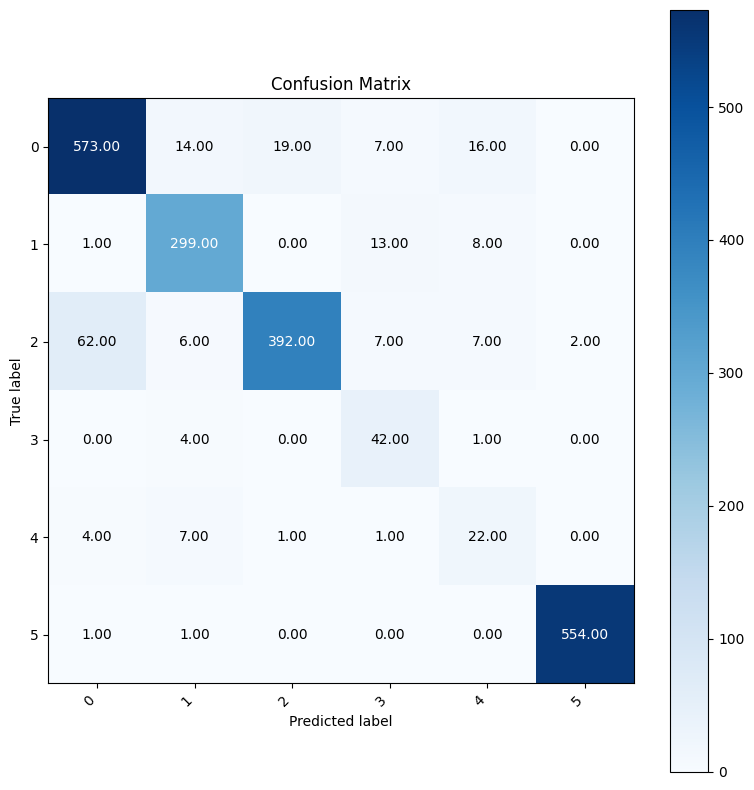

In [ ]:
# prompt: I want you to use the code test_evaluator.metrics.confusion_matrix that returns a numpy  array a a plot  but I do not have the targets names

import matplotlib.pyplot as plt
import numpy as np

# Assuming test_evaluator.metrics.confusion_matrix is a numpy array
cm = test_evaluator.metrics.confusion_matrix

# Create the plot
fig, ax = plt.subplots(figsize=(8, 8))
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)

# We don't have target names, so we'll just label with class indices
classes = np.arange(cm.shape[0])
tick_marks = np.arange(len(classes))
ax.set_xticks(tick_marks)
ax.set_xticklabels(classes, rotation=45, ha="right")
ax.set_yticks(tick_marks)
ax.set_yticklabels(classes)

# Loop over data dimensions and create text annotations
fmt = '.2f'  # Changed format code to '.2f' for floating-point numbers
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], fmt),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")

ax.set_ylabel('True label')
ax.set_xlabel('Predicted label')
ax.set_title('Confusion Matrix')

fig.tight_layout()
plt.show()

In [ ]:
# prompt: which other graph would you suggest me? to creat with the metrics?

import matplotlib.pyplot as plt

# Assuming 'detections' is a dictionary containing relevant metrics for each image
# Example: {'image1': {'precision': 0.8, 'recall': 0.7, 'f1_score': 0.75}, ...}

# Extract metrics for plotting
if 'detections' in locals():
  precision_values = [img_data['precision'] for img_data in detections.values()]
  recall_values = [img_data['recall'] for img_data in detections.values()]
  f1_scores = [img_data['f1_score'] for img_data in detections.values()]


  # 1. Precision-Recall Curve
  plt.figure(figsize=(8, 6))
  plt.plot(recall_values, precision_values, marker='o', linestyle='-')
  plt.xlabel('Recall')
  plt.ylabel('Precision')
  plt.title('Precision-Recall Curve')
  plt.grid(True)
  plt.show()


  # 2. Distribution of F1-scores
  plt.figure(figsize=(8, 6))
  plt.hist(f1_scores, bins=10, edgecolor='black')
  plt.xlabel('F1-score')
  plt.ylabel('Frequency')
  plt.title('Distribution of F1-scores')
  plt.grid(True)
  plt.show()

  # 3. Boxplot of F1-scores (shows distribution, outliers)
  plt.figure(figsize=(8,6))
  plt.boxplot(f1_scores, vert=False)
  plt.xlabel('F1-score')
  plt.title('Boxplot of F1-scores')
  plt.show()

  # 4. Scatter plot of precision vs recall
  plt.figure(figsize=(8,6))
  plt.scatter(recall_values, precision_values)
  plt.xlabel("Recall")
  plt.ylabel("Precision")
  plt.title("Precision vs Recall")
  plt.show()
else:
  print("The 'detections' variable is not defined, cannot create the graphs.")
